# 動画の画像化

In [1]:
import cv2
#動画ファイルを読み込む

file_name = "/home/riku/tiktok/dataset/movetest/IMG_2011.MP4"
video = cv2.VideoCapture(file_name)
#フレーム数を取得
frame_count = int(video.get(7))
#フレームレート(1フレームの時間単位はミリ秒)の取得
frame_rate = int(video.get(5))
#ウィンドウの名前を設定
cv2.namedWindow('player',  cv2.WINDOW_AUTOSIZE)
for i in range(frame_count):
    is_read, frame = video.read()
    #フレームレートのミリ秒数待つ
    k = cv2.waitKey(frame_rate)
    if k == 27 or not is_read:
        break
    cv2.imshow("player", frame)

In [16]:
import cv2
import os
#動画ファイルを読み込む
file_name = "/home/riku/tiktok/dataset/movetest/IMG_2013.MP4"
video = cv2.VideoCapture(file_name)
#スクリーンキャプチャを保存するディレクトリ
dir_name = "screen_caps"
if not os.path.exists(dir_name):
    os.mkdir(dir_name)
#フレーム数を取得
frame_count = int(video.get(7))
for i in range(frame_count):
    _, frame = video.read()
    cv2.imwrite(dir_name+ "/" + str(i) + ".png", frame)

IndexError: 

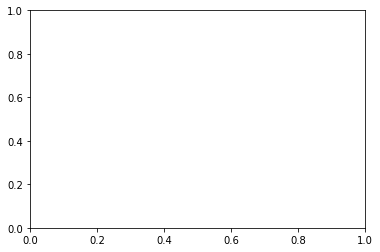

In [13]:
import cv2
import dlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

predictor_path = "shape_predictor_68_face_landmarks.dat"

# download trained model
if not os.path.isfile(predictor_path):
    os.system("wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2")
    os.system("bunzip2 shape_predictor_68_face_landmarks.dat.bz2")

file_name = "/home/riku/tiktok/dataset/movetest/IMG_2011.MP4"
cap = cv2.VideoCapture(file_name)

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

fig, ax = plt.subplots()

frame_count = int(cap.get(7))
for i in range(frame_count):
    ret, frame = cap.read()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    dets = detector(frame, 1)
    # for each detected face
    for d in dets:
        # draw bounding box of the detected face
        rect = patches.Rectangle((d.left(), d.top()), d.width(), d.height(), fill=False)
        ax.add_patch(rect)

        # draw landmarks
        parts = predictor(frame, d).parts()
        print(parts)
        ax.scatter([point.x for point in parts], [point.y for point in parts])

        for k, point in enumerate(parts):
            ax.text(point.x, point.y, k)

        ax.imshow(frame)
        plt.show()


In [6]:
!pip list

Package                            Version   
---------------------------------- ----------
alabaster                          0.7.12    
anaconda-client                    1.7.2     
anaconda-navigator                 1.9.6     
anaconda-project                   0.8.2     
asn1crypto                         0.24.0    
astroid                            2.1.0     
astropy                            3.1       
atomicwrites                       1.2.1     
attrs                              18.2.0    
Babel                              2.6.0     
backcall                           0.1.0     
backports.os                       0.1.1     
backports.shutil-get-terminal-size 1.0.0     
beautifulsoup4                     4.6.3     
bitarray                           0.8.3     
bkcharts                           0.2       
blaze                              0.11.3    
bleach                             3.0.2     
bokeh                              1.0.2     
boto                              

In [2]:
!conda info -e

# conda environments:
#
base                     /home/riku/anaconda3
py37                     /home/riku/anaconda3/envs/py37
tik                   *  /home/riku/anaconda3/envs/tik
tin                      /home/riku/anaconda3/envs/tin



In [23]:
u"""dlibによる顔画像検出."""
import cv2
import dlib

# 画像ファイルパスを指定
sample_img_dir = '/home/riku/tiktok/screen_caps/'


def facedetector_dlib(img, image_path):
    try:
        detector = dlib.get_frontal_face_detector()
        # RGB変換 (opencv形式からskimage形式に変換)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # frontal_face_detectorクラスは矩形, スコア, サブ検出器の結果を返す
        dets, scores, idx = detector.run(img_rgb, 0)
        # 矩形の色
        color = (0, 0, 255)
        s = ''
        if len(dets) > 0:
            # 顔画像ありと判断された場合
            for i, rect in enumerate(dets):
                # detsが矩形, scoreはスコア、idxはサブ検出器の結果(0.0がメインで数が大きい程弱い)
                # print rect, scores[i], idx[i]
                cv2.rectangle(img, (rect.left(), rect.top()), (rect.right(), rect.bottom()), color, thickness=10)
                s += (str(rect.left()) + ' ' + str(rect.top()) + ' ' + str(rect.right()) + ' ' + str(rect.bottom()) + ' ')
            s += image_path
        # 矩形が書き込まれた画像とs = 'x1 y1 x2 y2 x1 y1 x2 y2 file_name'
        # 顔が無ければ s='' が返る
        return img, s
    except:
        # メモリエラーの時など
        return img, ""

if __name__ == '__main__':
    
    for i in range(378):
        sample_img_path = sample_img_dir + str(i) + ".png"
        img = cv2.imread(sample_img_path)
        img, s = facedetector_dlib(img, sample_img_path)

        cv2.imwrite('/home/riku/tiktok/screen_caps/test' + str(i) + '.png' , img)
        f = open('./rect.txt', 'w')
        f.write(s)
        f.close()

## wild imageデータセットの作成
 顔がはっきり写っている画像を検出し、動画の時間的に離れた箇所の画像を切り出す

In [2]:
u"""dlibによる顔画像検出."""
import cv2
import dlib
import os
import time

# 画像ファイルパスを指定
detector = dlib.get_frontal_face_detector()

def facedetector_dlib(img):
    try:
        
        # RGB変換 (opencv形式からskimage形式に変換)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # frontal_face_detectorクラスは矩形, スコア, サブ検出器の結果を返す
        dets, scores, idx = detector.run(img_rgb, 0)
        # 矩形の色
        color = (0, 0, 255)
        s = ''
        if len(dets) > 0:
            # 顔画像ありと判断された場合
            for i, rect in enumerate(dets):
                # detsが矩形, scoreはスコア、idxはサブ検出器の結果(0.0がメインで数が大きい程弱い)
                # print rect, scores[i], idx[i]
#                 cv2.rectangle(img, (rect.left(), rect.top()), (rect.right(), rect.bottom()), color, thickness=10)
                s += (str(rect.left()) + ' ' + str(rect.top()) + ' ' + str(rect.right()) + ' ' + str(rect.bottom()) + ' ')
        # 矩形が書き込まれた画像とs = 'x1 y1 x2 y2 x1 y1 x2 y2'
        # 顔が無ければ s='' が返る
        return img, s
    except:
        # メモリエラーの時など
        return img, ""

if __name__ == '__main__':
    for movie_num in range(1000):
        #動画の読み込み
        dir_name = "/home/riku/tiktok/dataset/move1/"
        file_path =dir_name + "IMG_"+str(3000+movie_num)+".MP4"
        
        cap = cv2.VideoCapture(file_path)
        

        imgs = []
        #顔を検出できる画像の切り出し
        frame_count = int(cap.get(7))
        for i in range(0,frame_count):
            start = time.time()
            
            ret, img = cap.read()
            img_rect, s = facedetector_dlib(img)
            elapsed_time = time.time() - start
            print(elapsed_time)
            if(s != ""):
                output_dir_name = "cutDatas"+str(movie_num//100+10)
                if not os.path.exists(output_dir_name):
                    os.mkdir(output_dir_name)
                cv2.imwrite('/home/riku/tiktok/'+ output_dir_name +'/cut'+ str(movie_num)+"id"+ str(i) + '.png' , img)
                frame_index = int(cap.get(1))
                cap.set(1,frame_index+30)
                print(frame_index)

                
                
                
#         cut_stride = len(imgs)//15
#         if cut_stride == 0:
#             print("顔が検出できなかった")
#             pass
#         else:
#             print(str(len(imgs)) +"検出できた")
#             for i in range(0,len(imgs),cut_stride):    
#                 %time cv2.imwrite('/home/riku/tiktok/cutDatas/cut'+ str(movie_num)+"id"+ str(i) + '.png' , imgs[i])


0.10172700881958008
1
0.09796524047851562
32
0.09538984298706055
63
0.0955042839050293
94
0.09735965728759766
125
0.09697341918945312
156
0.09392619132995605
187
0.09395170211791992
218
0.09896039962768555
249
0.0953056812286377
280
0.0960686206817627
311
0.09488630294799805
342
0.09354400634765625
0.09458422660827637
0.09360170364379883
0.09493756294250488
0.09494566917419434
0.09353232383728027
0.09366321563720703
0.09400415420532227
0.0925450325012207
0.09380340576171875
0.09393453598022461
0.0005035400390625
0.0003235340118408203
0.0003254413604736328
0.0003237724304199219
0.0003285408020019531
0.0003275871276855469
0.0003299713134765625
0.00032067298889160156
0.000324249267578125
0.0003228187561035156
0.00035190582275390625
0.0003223419189453125
0.0003230571746826172
0.00031948089599609375
0.0003256797790527344
0.00032258033752441406
0.0003223419189453125
0.00032210350036621094
0.00033974647521972656
0.00032806396484375
0.00032329559326171875
0.0003192424774169922
0.00033688545227

0.09612441062927246
32
0.09647965431213379
63
0.097625732421875
94
0.09617972373962402
125
0.09695291519165039
156
0.09868168830871582
187
0.0975344181060791
218
0.09813714027404785
249
0.09612727165222168
280
0.09597992897033691
311
0.09380865097045898
342
0.09582877159118652
373
0.09639930725097656
404
0.09632086753845215
435
0.0981454849243164
466
0.0979607105255127
497
0.09557843208312988
528
0.09739398956298828
559
0.09621238708496094
590
0.09898591041564941
0.09468293190002441
0.09478497505187988
0.09484362602233887
0.09368062019348145
0.09368681907653809
626
0.09928202629089355
657
0.09868097305297852
688
0.09670019149780273
719
0.09600830078125
750
0.09603595733642578
781
0.09794735908508301
812
0.11031961441040039
843
0.10111498832702637
874
0.0004508495330810547
0.00033020973205566406
0.0003376007080078125
0.00032639503479003906
0.0003216266632080078
0.00032329559326171875
0.00032520294189453125
0.00031638145446777344
0.00032520294189453125
0.0003209114074707031
0.00032663345

0.0003609657287597656
0.0004725456237792969
0.0005462169647216797
0.0005571842193603516
0.0003883838653564453
0.0003132820129394531
0.00033736228942871094
0.0003135204315185547
0.0003094673156738281
0.0003151893615722656
0.00032329559326171875
0.000339508056640625
0.00030922889709472656
0.0003120899200439453
0.000316619873046875
0.0003058910369873047
0.000324249267578125
0.0003147125244140625
0.0003123283386230469
0.0003135204315185547
0.0003058910369873047
0.00031447410583496094
0.0003094673156738281
0.000308990478515625
0.00030684471130371094
0.0003116130828857422
0.0003113746643066406
0.00031280517578125
0.0003185272216796875
0.00031185150146484375
0.0003154277801513672
0.0003104209899902344
0.0003097057342529297
0.00031280517578125
0.00031495094299316406
0.00031065940856933594
0.00031280517578125
0.0003135204315185547
0.0003094673156738281
0.00031256675720214844
0.0003230571746826172
0.00031185150146484375
0.0003135204315185547
0.0003132820129394531
0.00030994415283203125
0.0003113

0.0005502700805664062
0.00041747093200683594
0.00036978721618652344
0.00036263465881347656
0.0003619194030761719
0.00037026405334472656
0.00037741661071777344
0.00036644935607910156
0.0003638267517089844
0.0003921985626220703
0.00034236907958984375
0.0003151893615722656
0.0003154277801513672
0.00030922889709472656
0.00034618377685546875
0.0003120899200439453
0.0003142356872558594
0.00031757354736328125
0.0003159046173095703
0.0003161430358886719
0.0003178119659423828
0.00031304359436035156
0.0003275871276855469
0.0003113746643066406
0.000316619873046875
0.0003139972686767578
0.00031685829162597656
0.00031757354736328125
0.00031447410583496094
0.0003345012664794922
0.00030684471130371094
0.00031280517578125
0.00031685829162597656
0.0003113746643066406
0.00032591819763183594
0.0003116130828857422
0.0003104209899902344
0.00030803680419921875
0.0003094673156738281
0.0003161430358886719
0.0003123283386230469
0.0003178119659423828
0.0003204345703125
0.00032067298889160156
0.00031018257141113

0.06235337257385254
1
0.05887317657470703
32
0.06055498123168945
63
0.06315183639526367
94
0.06430268287658691
125
0.05753493309020996
156
0.06165170669555664
187
0.06067395210266113
218
0.060028791427612305
249
0.06415033340454102
280
0.07210922241210938
311
0.06328678131103516
342
0.06880927085876465
373
0.06253457069396973
404
0.058710575103759766
435
0.061940908432006836
466
0.06039738655090332
497
0.05997753143310547
528
0.05946516990661621
559
0.05998969078063965
590
0.06047654151916504
0.05733346939086914
0.05802106857299805
0.05615043640136719
0.056481122970581055
0.05703330039978027
0.05708932876586914
0.05648183822631836
0.057074785232543945
0.05753207206726074
0.057770729064941406
0.05785775184631348
0.057279348373413086
0.05731487274169922
634
0.06094765663146973
665
0.05815434455871582
696
0.058518409729003906
727
0.060520172119140625
758
0.06327247619628906
789
0.06352925300598145
820
0.06071138381958008
851
0.06084442138671875
882
0.0005528926849365234
0.0003271102905273

0.00031685829162597656
0.0003120899200439453
0.0003151893615722656
0.000316619873046875
0.00031685829162597656
0.0003132820129394531
0.0003142356872558594
0.0003390312194824219
0.0003170967102050781
0.00031685829162597656
0.00031495094299316406
0.0003159046173095703
0.000316619873046875
0.0003120899200439453
0.0003159046173095703
0.0003235340118408203
0.00031685829162597656
0.00030875205993652344
0.0003116130828857422
0.00031828880310058594
0.00031685829162597656
0.000316619873046875
0.00031185150146484375
0.0003116130828857422
0.00031304359436035156
0.0003123283386230469
0.0003120899200439453
0.00031638145446777344
0.0003108978271484375
0.00031685829162597656
0.00031113624572753906
0.00031948089599609375
0.0003173351287841797
0.0003108978271484375
0.0003204345703125
0.0003192424774169922
0.00032019615173339844
0.0003197193145751953
0.0003173351287841797
0.00035309791564941406
0.00031280517578125
0.00031065940856933594
0.0003113746643066406
0.0003209114074707031
0.0003120899200439453
0

0.09432482719421387
0.09452533721923828
0.09414315223693848
0.09437680244445801
0.09334969520568848
0.09318304061889648
0.09475874900817871
0.09473323822021484
0.09423446655273438
0.09425663948059082
0.09328317642211914
0.09304642677307129
0.09400558471679688
0.0937807559967041
0.09315371513366699
0.09417438507080078
0.09382987022399902
0.09413599967956543
0.09461140632629395
0.09720182418823242
0.09698128700256348
0.09943580627441406
0.09960508346557617
0.09737753868103027
0.09813570976257324
0.09367966651916504
0.09302020072937012
0.09496712684631348
0.0945284366607666
0.09332609176635742
0.0004246234893798828
0.00033593177795410156
0.0003268718719482422
0.0003247261047363281
0.00032591819763183594
0.0003261566162109375
0.0003185272216796875
0.00032019615173339844
0.0003287792205810547
0.0003266334533691406
0.0003247261047363281
0.0003223419189453125
0.0003306865692138672
0.0003311634063720703
0.00033020973205566406
0.0003604888916015625
0.0003559589385986328
0.0003266334533691406
0.

0.10306882858276367
1
0.10639405250549316
32
0.09441399574279785
63
0.09507966041564941
94
0.09785890579223633
125
0.09808492660522461
156
0.09846210479736328
187
0.09692716598510742
218
0.09891629219055176
249
0.09776806831359863
280
0.0948328971862793
311
0.0961449146270752
342
0.10125374794006348
373
0.09714818000793457
404
0.10194253921508789
435
0.09914708137512207
466
0.10264277458190918
497
0.12282705307006836
528
0.11582517623901367
559
0.10068845748901367
590
0.0004703998565673828
0.00032138824462890625
0.0003223419189453125
0.00032138824462890625
0.0003139972686767578
0.000308990478515625
0.0003139972686767578
0.00031685829162597656
0.00033092498779296875
0.00031566619873046875
0.0003218650817871094
0.00031638145446777344
0.0003199577331542969
0.0003185272216796875
0.00032138824462890625
0.0003204345703125
0.00031280517578125
0.00031948089599609375
0.0003066062927246094
0.00030994415283203125
0.00032401084899902344
0.0003147125244140625
0.0003757476806640625
0.000463724136352

0.11764931678771973
1
0.11268758773803711
32
0.10800957679748535
0.10060477256774902
0.09925055503845215
0.10200238227844238
0.09737825393676758
0.09591174125671387
0.09632015228271484
0.09657955169677734
0.09339237213134766
0.09441494941711426
0.09346604347229004
0.09347128868103027
0.09513378143310547
0.09493589401245117
0.09319281578063965
0.09471678733825684
0.09733271598815918
0.09636926651000977
0.09699225425720215
0.09806942939758301
0.0986175537109375
0.09759759902954102
0.09801793098449707
0.09806275367736816
0.09625053405761719
0.09495902061462402
0.09379076957702637
0.09607076644897461
0.09524202346801758
0.09329891204833984
0.0950002670288086
0.09560298919677734
0.09618139266967773
0.09394192695617676
0.09471559524536133
0.09351396560668945
0.09491562843322754
99
0.09845590591430664
0.09483003616333008
131
0.09690117835998535
162
0.09644460678100586
193
0.09690666198730469
224
0.09908056259155273
255
0.10076236724853516
286
0.09821081161499023
317
0.09756302833557129
348
0.

0.00036215782165527344
0.0003235340118408203
0.0003230571746826172
0.00032067298889160156
0.0003159046173095703
0.00031948089599609375
0.00036454200744628906
0.0003139972686767578
0.00031566619873046875
0.0003197193145751953
0.00031304359436035156
0.00032067298889160156
0.0003292560577392578
0.0003428459167480469
0.0003273487091064453
0.00031375885009765625
0.000339508056640625
0.0003285408020019531
0.0003132820129394531
0.0003132820129394531
0.0003342628479003906
0.00032520294189453125
0.00031304359436035156
0.0003135204315185547
0.00042891502380371094
0.0004246234893798828
0.0003376007080078125
0.0003178119659423828
0.0003132820129394531
0.00037932395935058594
0.00041985511779785156
0.0003228187561035156
0.0003216266632080078
0.00031375885009765625
0.0003337860107421875
0.0003218650817871094
0.0003147125244140625
0.00031280517578125
0.0003132820129394531
0.0003216266632080078
0.00032019615173339844
0.00031375885009765625
0.00031304359436035156
0.0003116130828857422
0.0003206729888916

0.0004889965057373047
0.0005192756652832031
0.0005195140838623047
0.0003285408020019531
0.0003173351287841797
0.00031685829162597656
0.00032258033752441406
0.0003159046173095703
0.0003223419189453125
0.000331878662109375
0.0003209114074707031
0.0003154277801513672
0.00031566619873046875
0.0003204345703125
0.00032210350036621094
0.00031757354736328125
0.00031495094299316406
0.0003228187561035156
0.0003211498260498047
0.0003228187561035156
0.0003192424774169922
0.00032711029052734375
0.0003161430358886719
0.0003139972686767578
0.00031757354736328125
0.0003228187561035156
0.0003173351287841797
0.00034618377685546875
0.00031495094299316406
0.00032258033752441406
0.0003218650817871094
0.0003228187561035156
0.0003218650817871094
0.00032711029052734375
0.0003209114074707031
0.0003154277801513672
0.0003218650817871094
0.0003223419189453125
0.0003154277801513672
0.00032258033752441406
0.0003204345703125
0.0003228187561035156
0.0003223419189453125
0.00031566619873046875
0.0003147125244140625
0.0

0.06432485580444336
1
0.060183048248291016
32
0.06267213821411133
63
0.06088423728942871
94
0.06330156326293945
125
0.06227374076843262
156
0.06119847297668457
187
0.06149649620056152
218
0.062255859375
249
0.06137371063232422
280
0.06885886192321777
311
0.06003212928771973
0.05860400199890137
0.06012248992919922
0.05748105049133301
345
0.06263232231140137
376
0.0613093376159668
407
0.05829787254333496
438
0.058365821838378906
469
0.058086395263671875
500
0.059009552001953125
531
0.05886340141296387
562
0.05945754051208496
593
0.0612635612487793
0.05948519706726074
625
0.061537981033325195
656
0.06318140029907227
0.06058335304260254
0.06506824493408203
0.060762882232666016
0.0585176944732666
691
0.06064009666442871
722
0.06648015975952148
753
0.06387853622436523
784
0.060820817947387695
815
0.06037092208862305
846
0.06108522415161133
877
0.0004432201385498047
0.00032448768615722656
0.00031948089599609375
0.0003352165222167969
0.0003459453582763672
0.0003681182861328125
0.00052905082702

0.0004622936248779297
0.00037479400634765625
0.0003173351287841797
0.0003151893615722656
0.00031948089599609375
0.0003428459167480469
0.00032401084899902344
0.0003371238708496094
0.0003237724304199219
0.0003123283386230469
0.000316619873046875
0.0003123283386230469
0.0003218650817871094
0.00042510032653808594
0.000507354736328125
0.0005147457122802734
0.00045490264892578125
0.0004191398620605469
0.0003247261047363281
0.0003132820129394531
0.00031948089599609375
0.00031304359436035156
0.0003314018249511719
0.00031375885009765625
0.00031375885009765625
0.0003230571746826172
0.00031948089599609375
0.00036215782165527344
0.00031304359436035156
0.00034427642822265625
0.00032711029052734375
0.0003135204315185547
0.0003228187561035156
0.0003173351287841797
0.00033402442932128906
0.0003151893615722656
0.00032401084899902344
0.0003230571746826172
0.0003197193145751953
0.0003230571746826172
0.00032401084899902344
0.00031447410583496094
0.0003247261047363281
0.00032329559326171875
0.0003111362457

0.0005695819854736328
0.00037741661071777344
0.00036144256591796875
0.00036525726318359375
0.0003771781921386719
0.0003654956817626953
0.0003635883331298828
0.00036144256591796875
0.00036525726318359375
0.06741452217102051
1
0.06145811080932617
0.05956602096557617
0.05926656723022461
0.0594635009765625
0.05823779106140137
0.0598902702331543
37
0.06149911880493164
68
0.06016111373901367
99
0.06370806694030762
130
0.06065177917480469
161
0.05901479721069336
0.06343841552734375
0.06735014915466309
0.059346675872802734
0.06930828094482422
196
0.0713493824005127
0.07438039779663086
0.06171560287475586
0.06603860855102539
0.05822634696960449
0.05904102325439453
0.061685800552368164
0.05971884727478027
0.058866262435913086
0.05945754051208496
236
0.07284832000732422
267
0.060733795166015625
0.06183266639709473
0.05834364891052246
300
0.06071305274963379
331
0.05943894386291504
362
0.06058382987976074
393
0.06316661834716797
0.060622215270996094
0.061783790588378906
0.06246185302734375
0.06154

0.0005581378936767578
0.000396728515625
0.0003685951232910156
0.00036454200744628906
0.0003707408905029297
0.00037741661071777344
0.0003650188446044922
0.0003685951232910156
0.00036907196044921875
0.00036406517028808594
0.00036787986755371094
0.00036835670471191406
0.00036334991455078125
0.0003631114959716797
0.0003662109375
0.000377655029296875
0.00036978721618652344
0.0003685951232910156
0.00036406517028808594
0.0003643035888671875
0.0003669261932373047
0.0003662109375
0.00036215782165527344
0.00036144256591796875
0.0003619194030761719
0.00036406517028808594
0.0003769397735595703
0.0003688335418701172
0.0003612041473388672
0.0003676414489746094
0.00036072731018066406
0.00036525726318359375
0.0003674030303955078
0.00036835670471191406
0.00036644935607910156
0.0003612041473388672
0.00037169456481933594
0.0003638267517089844
0.00036644935607910156
0.00036215782165527344
0.0003654956817626953
0.0003647804260253906
0.00036716461181640625
0.00036597251892089844
0.0003693103790283203
0.0003

0.0005950927734375
0.0003952980041503906
0.0003635883331298828
0.00037479400634765625
0.0003714561462402344
0.00036454200744628906
0.00036263465881347656
0.00036454200744628906
0.00036597251892089844
0.0003657341003417969
0.0003638267517089844
0.0003666877746582031
0.0003657341003417969
0.0003733634948730469
0.0003674030303955078
0.00036406517028808594
0.0003707408905029297
0.0003662109375
0.000370025634765625
0.0003631114959716797
0.0003609657287597656
0.0003681182861328125
0.0003674030303955078
0.00036835670471191406
0.0003628730773925781
0.0003612041473388672
0.0003650188446044922
0.00037097930908203125
0.00036072731018066406
0.00036025047302246094
0.00036644935607910156
0.0003674030303955078
0.00036406517028808594
0.0003654956817626953
0.00037288665771484375
0.00036215782165527344
0.0003650188446044922
0.00036716461181640625
0.0003666877746582031
0.00036835670471191406
0.0003662109375
0.0003662109375
0.0003643035888671875
0.0003650188446044922
0.00037169456481933594
0.0003705024719

0.00031447410583496094
0.0003159046173095703
0.0003235340118408203
0.0003230571746826172
0.0003256797790527344
0.0005037784576416016
0.0004127025604248047
0.0003478527069091797
0.000324249267578125
0.00031948089599609375
0.00037789344787597656
0.0003490447998046875
0.0003464221954345703
0.00031948089599609375
0.0003161430358886719
0.0003159046173095703
0.00031638145446777344
0.00032138824462890625
0.0003581047058105469
0.000347137451171875
0.00032448768615722656
0.00036263465881347656
0.000324249267578125
0.0003180503845214844
0.0003209114074707031
0.0003151893615722656
0.0003211498260498047
0.0003120899200439453
0.00032067298889160156
0.0003287792205810547
0.00031948089599609375
0.0003116130828857422
0.00031638145446777344
0.0003132820129394531
0.00031495094299316406
0.00031566619873046875
0.00032067298889160156
0.00032258033752441406
0.0003113746643066406
0.00032138824462890625
0.0004565715789794922
0.0003457069396972656
0.0004968643188476562
0.0004954338073730469
0.00037264823913574

0.00042247772216796875
0.00031685829162597656
0.000316619873046875
0.00031685829162597656
0.00034999847412109375
0.0003376007080078125
0.00035309791564941406
0.0003237724304199219
0.0003218650817871094
0.0003898143768310547
0.0005564689636230469
0.0005278587341308594
0.00045609474182128906
0.0005066394805908203
0.0005154609680175781
0.0005500316619873047
0.0005431175231933594
0.0005323886871337891
0.0005519390106201172
0.0005445480346679688
0.00046896934509277344
0.0004315376281738281
0.0003204345703125
0.00031876564025878906
0.0003228187561035156
0.00031566619873046875
0.0003173351287841797
0.00032401084899902344
0.0003135204315185547
0.00031685829162597656
0.00031304359436035156
0.00031256675720214844
0.00032210350036621094
0.00032210350036621094
0.0003254413604736328
0.0003223419189453125
0.0003135204315185547
0.0003209114074707031
0.00032258033752441406
0.0003457069396972656
0.00032806396484375
0.0003132820129394531
0.0003228187561035156
0.0003337860107421875
0.00032138824462890625

0.05787014961242676
0.05759859085083008
0.05729794502258301
0.05752921104431152
0.05777716636657715
0.057203054428100586
0.057341575622558594
0.057192087173461914
0.05784296989440918
354
0.058618783950805664
385
0.0004367828369140625
0.0003142356872558594
0.00032019615173339844
0.0003249645233154297
0.00031685829162597656
0.0003101825714111328
0.00032019615173339844
0.0003132820129394531
0.0003094673156738281
0.000316619873046875
0.0003063678741455078
0.0003490447998046875
0.00030922889709472656
0.00031304359436035156
0.0003077983856201172
0.00033092498779296875
0.0003159046173095703
0.0003063678741455078
0.0003075599670410156
0.0003094673156738281
0.00032520294189453125
0.00030803680419921875
0.0003070831298828125
0.0003077983856201172
0.00033402442932128906
0.0003082752227783203
0.0003097057342529297
0.00035858154296875
0.0003151893615722656
0.0003180503845214844
0.00031495094299316406
0.0003151893615722656
0.0003190040588378906
0.0003108978271484375
0.0003151893615722656
0.000317811

0.00036334991455078125
0.000316619873046875
0.0003249645233154297
0.0003211498260498047
0.0003230571746826172
0.00032210350036621094
0.0003190040588378906
0.0003216266632080078
0.0003247261047363281
0.00032210350036621094
0.0003211498260498047
0.0003223419189453125
0.0003247261047363281
0.00035953521728515625
0.0003247261047363281
0.0003235340118408203
0.0003235340118408203
0.00032639503479003906
0.00032639503479003906
0.00032329559326171875
0.0003917217254638672
0.0003223419189453125
0.00032210350036621094
0.00031638145446777344
0.00031566619873046875
0.0003235340118408203
0.00031757354736328125
0.00032329559326171875
0.0003135204315185547
0.0003151893615722656
0.00031375885009765625
0.0003142356872558594
0.00031566619873046875
0.00031495094299316406
0.00032067298889160156
0.0003147125244140625
0.0003204345703125
0.0003247261047363281
0.00031828880310058594
0.00031948089599609375
0.0003159046173095703
0.0003154277801513672
0.00031948089599609375
0.0003185272216796875
0.000321149826049

0.0005946159362792969
0.0003960132598876953
0.00036835670471191406
0.0003635883331298828
0.0003676414489746094
0.0003688335418701172
0.0003719329833984375
0.0003535747528076172
0.00039458274841308594
0.0003635883331298828
0.0003674030303955078
0.0003695487976074219
0.0003693103790283203
0.00036978721618652344
0.00039386749267578125
0.0003476142883300781
0.0003490447998046875
0.00038123130798339844
0.00034880638122558594
0.00035119056701660156
0.00032973289489746094
0.0003905296325683594
0.0003490447998046875
0.0003504753112792969
0.00033974647521972656
0.0003490447998046875
0.0003523826599121094
0.0003542900085449219
0.00032830238342285156
0.0003483295440673828
0.00035381317138671875
0.0003764629364013672
0.0003654956817626953
0.00034618377685546875
0.00035500526428222656
0.0003552436828613281
0.00034618377685546875
0.0003528594970703125
0.0003368854522705078
0.000347137451171875
0.00034689903259277344
0.0003457069396972656
0.0003864765167236328
0.00035309791564941406
0.000352382659912

0.00038433074951171875
0.0003151893615722656
0.00031256675720214844
0.0003325939178466797
0.0003235340118408203
0.0003218650817871094
0.0003190040588378906
0.00032639503479003906
0.0003204345703125
0.0003256797790527344
0.00031685829162597656
0.00031828880310058594
0.00032830238342285156
0.00032448768615722656
0.0003497600555419922
0.0003497600555419922
0.0003418922424316406
0.0003223419189453125
0.00032138824462890625
0.0003204345703125
0.00032591819763183594
0.0003578662872314453
0.00033545494079589844
0.0003113746643066406
0.000316619873046875
0.0003151893615722656
0.0003352165222167969
0.0003123283386230469
0.00031185150146484375
0.0003421306610107422
0.0003612041473388672
0.00032258033752441406
0.0003120899200439453
0.0004546642303466797
0.0005285739898681641
0.0005185604095458984
0.0005428791046142578
0.0003559589385986328
0.0003173351287841797
0.00032067298889160156
0.0003509521484375
0.00031185150146484375
0.000316619873046875
0.0003230571746826172
0.0003104209899902344
0.00031

1
0.10261654853820801
32
0.09824371337890625
63
0.09611177444458008
94
0.09692096710205078
125
0.09693646430969238
156
0.10347437858581543
187
0.10991930961608887
218
0.12233114242553711
0.09821343421936035
0.09861421585083008
0.10189986228942871
0.09889030456542969
0.09821915626525879
0.0993647575378418
0.10586738586425781
0.09672689437866211
0.10358381271362305
0.09698200225830078
0.10326862335205078
0.09513330459594727
0.09613370895385742
0.09567737579345703
0.09493470191955566
264
0.10120463371276855
295
0.09741735458374023
326
0.09614038467407227
357
0.0993199348449707
388
0.10410928726196289
0.10677599906921387
0.10067629814147949
0.11268210411071777
0.10251760482788086
0.09771990776062012
0.09973978996276855
0.0949709415435791
0.09531521797180176
0.09501004219055176
0.09737467765808105
0.09486508369445801
0.09483933448791504
0.09496259689331055
0.09514188766479492
0.09611964225769043
0.09495234489440918
0.09414267539978027
0.09756994247436523
0.09694862365722656
0.09509444236755

0.05805468559265137
33
0.06006574630737305
64
0.06341171264648438
95
0.06125450134277344
126
0.061058759689331055
157
0.05796217918395996
188
0.05826854705810547
219
0.05833244323730469
0.05883216857910156
0.05777382850646973
0.058515310287475586
0.057297706604003906
0.05795168876647949
0.0585024356842041
0.057883501052856445
0.05776667594909668
0.05746889114379883
0.05744004249572754
0.05792498588562012
0.057801008224487305
0.058022260665893555
0.05715131759643555
0.0577850341796875
0.05750441551208496
0.05735945701599121
0.0577700138092041
0.05845284461975098
0.0614781379699707
0.06140780448913574
0.062347412109375
0.058963775634765625
0.05897998809814453
0.057759761810302734
0.057712554931640625
0.05798506736755371
0.05737805366516113
0.05753612518310547
0.05726957321166992
0.057649850845336914
0.057277679443359375
0.05753803253173828
0.05716300010681152
0.057543277740478516
0.05948209762573242
0.0598301887512207
0.05754899978637695
0.05792713165283203
0.057727813720703125
0.0592474

0.0003762245178222656
0.0003254413604736328
0.0003178119659423828
0.00032329559326171875
0.0003159046173095703
0.0003173351287841797
0.00032210350036621094
0.0003228187561035156
0.0003230571746826172
0.0003237724304199219
0.00031447410583496094
0.00032067298889160156
0.00032210350036621094
0.0003230571746826172
0.00031495094299316406
0.000316619873046875
0.0003254413604736328
0.0003170967102050781
0.0003256797790527344
0.0003192424774169922
0.00032591819763183594
0.0003275871276855469
0.00031638145446777344
0.0003230571746826172
0.00031566619873046875
0.0003218650817871094
0.0003170967102050781
0.0003161430358886719
0.0003173351287841797
0.0003161430358886719
0.0003159046173095703
0.000324249267578125
0.0003199577331542969
0.0003285408020019531
0.0003159046173095703
0.0003464221954345703
0.0003285408020019531
0.0003170967102050781
0.0003247261047363281
0.00031566619873046875
0.0003311634063720703
0.00033092498779296875
0.00032639503479003906
0.00032448768615722656
0.10665607452392578
1

0.00035572052001953125
0.00031185150146484375
0.00031304359436035156
0.00031185150146484375
0.00030684471130371094
0.00041174888610839844
0.0003337860107421875
0.00032711029052734375
0.0003075599670410156
0.0003147125244140625
0.00031447410583496094
0.0003113746643066406
0.0003173351287841797
0.00031876564025878906
0.0003142356872558594
0.00031495094299316406
0.0003185272216796875
0.0003185272216796875
0.00031256675720214844
0.0003237724304199219
0.0003173351287841797
0.00033736228942871094
0.00030875205993652344
0.0003142356872558594
0.0003142356872558594
0.00031185150146484375
0.00030732154846191406
0.00030875205993652344
0.00031280517578125
0.00030875205993652344
0.00030994415283203125
0.0003197193145751953
0.00030994415283203125
0.0003113746643066406
0.0003104209899902344
0.0003142356872558594
0.00030922889709472656
0.0003085136413574219
0.00030922889709472656
0.00031256675720214844
0.00031256675720214844
0.0003116130828857422
0.0003094673156738281
0.00031638145446777344
0.00031089

0.0013706684112548828
0.00033020973205566406
0.0003142356872558594
0.0003211498260498047
0.00031828880310058594
0.0003209114074707031
0.0003314018249511719
0.00032329559326171875
0.000324249267578125
0.0003230571746826172
0.0003235340118408203
0.0003132820129394531
0.0003216266632080078
0.0003209114074707031
0.00032448768615722656
0.0003235340118408203
0.00031304359436035156
0.0003123283386230469
0.0003421306610107422
0.0003161430358886719
0.00032258033752441406
0.00032329559326171875
0.00032258033752441406
0.0003132820129394531
0.00032258033752441406
0.0003161430358886719
0.00032210350036621094
0.00031280517578125
0.0003123283386230469
0.0003185272216796875
0.0003292560577392578
0.00032258033752441406
0.00031685829162597656
0.0003228187561035156
0.00032138824462890625
0.0003485679626464844
0.0003647804260253906
0.0003247261047363281
0.00032067298889160156
0.000335693359375
0.00032401084899902344
0.00032448768615722656
0.0003185272216796875
0.00031566619873046875
0.0003209114074707031


0.0004730224609375
0.00033545494079589844
0.0003151893615722656
0.00033736228942871094
0.00031256675720214844
0.000316619873046875
0.00031375885009765625
0.0003266334533691406
0.00034046173095703125
0.00031304359436035156
0.00031757354736328125
0.0003895759582519531
0.0003159046173095703
0.00030875205993652344
0.00031304359436035156
0.0003223419189453125
0.0003075599670410156
0.00030541419982910156
0.0003254413604736328
0.00032591819763183594
0.0003159046173095703
0.0003178119659423828
0.0003113746643066406
0.00031876564025878906
0.0003154277801513672
0.00032973289489746094
0.00031685829162597656
0.0003135204315185547
0.0003116130828857422
0.0003151893615722656
0.00031495094299316406
0.00035762786865234375
0.00031304359436035156
0.00031185150146484375
0.0003139972686767578
0.0003185272216796875
0.0003108978271484375
0.00031757354736328125
0.0003108978271484375
0.0003123283386230469
0.0003123283386230469
0.0003116130828857422
0.00032591819763183594
0.00031757354736328125
0.0003170967102

0.00037026405334472656
0.00031566619873046875
0.0003173351287841797
0.0003261566162109375
0.00036787986755371094
0.0003337860107421875
0.0003590583801269531
0.0003504753112792969
0.0004584789276123047
0.0003409385681152344
0.0003478527069091797
0.00032782554626464844
0.0003809928894042969
0.00034689903259277344
0.00033545494079589844
0.0003216266632080078
0.0003612041473388672
0.0003256797790527344
0.0003235340118408203
0.00032210350036621094
0.0003266334533691406
0.00032329559326171875
0.0003376007080078125
0.0003192424774169922
0.0003261566162109375
0.0003204345703125
0.0003211498260498047
0.0003173351287841797
0.0003333091735839844
0.00033855438232421875
0.0003192424774169922
0.0003142356872558594
0.0003142356872558594
0.00032138824462890625
0.00031447410583496094
0.0003199577331542969
0.00031757354736328125
0.0003147125244140625
0.0003139972686767578
0.0003218650817871094
0.0003159046173095703
0.000316619873046875
0.00032138824462890625
0.00031566619873046875
0.00031280517578125
0.

0.0003147125244140625
0.0003139972686767578
0.0003151893615722656
0.00031447410583496094
0.0003216266632080078
0.0003211498260498047
0.0003142356872558594
0.00031304359436035156
0.0003147125244140625
0.0003218650817871094
0.0003209114074707031
0.0003273487091064453
0.0003218650817871094
0.0003323554992675781
0.0003261566162109375
0.0003237724304199219
0.0003256797790527344
0.0003197193145751953
0.0003254413604736328
0.0003235340118408203
0.0003235340118408203
0.00031828880310058594
0.000331878662109375
0.0003204345703125
0.0003223419189453125
0.0003192424774169922
0.0003223419189453125
0.0003256797790527344
0.0003211498260498047
0.00032591819763183594
0.0003230571746826172
0.0003223419189453125
0.0003247261047363281
0.0003190040588378906
0.0003249645233154297
0.00033855438232421875
0.0003180503845214844
0.0003218650817871094
0.00032448768615722656
0.00032210350036621094
0.0003256797790527344
0.0003218650817871094
0.000324249267578125
0.0003237724304199219
0.00034427642822265625
0.00032

0.057622432708740234
0.0572052001953125
0.05699038505554199
0.056978702545166016
0.06083273887634277
15
0.060202836990356445
46
0.059114933013916016
0.058732032775878906
0.0610661506652832
0.06384849548339844
0.05761241912841797
0.0601806640625
0.05993175506591797
0.060582876205444336
0.05986332893371582
0.06100296974182129
0.05985212326049805
0.05852651596069336
0.0748903751373291
0.07415938377380371
90
0.06466007232666016
121
0.06012225151062012
152
0.06910037994384766
183
0.0742189884185791
214
0.060662269592285156
245
0.06088113784790039
0.05957627296447754
0.05900883674621582
0.05867886543273926
0.056535959243774414
0.057166099548339844
0.05847024917602539
0.05744361877441406
0.05661773681640625
0.062158823013305664
285
0.06149864196777344
316
0.06141805648803711
347
0.06573724746704102
378
0.058478355407714844
409
0.0582735538482666
440
0.06013369560241699
0.05791974067687988
0.058895111083984375
0.057518959045410156
0.057291507720947266
0.05981278419494629
0.058803558349609375
0

0.06390666961669922
0.05704164505004883
0.060648441314697266
3
0.0601499080657959
34
0.06152081489562988
65
0.06196403503417969
96
0.06327962875366211
127
0.06215929985046387
158
0.06423139572143555
0.06466221809387207
0.0635077953338623
0.06489872932434082
0.06491351127624512
193
0.059902191162109375
0.0615842342376709
0.06063437461853027
0.05881667137145996
0.05738639831542969
0.05864143371582031
0.060498952865600586
0.05917620658874512
0.05980205535888672
0.060346126556396484
0.059740543365478516
0.0581355094909668
0.05768847465515137
0.05762743949890137
0.05747032165527344
0.05857110023498535
0.05789780616760254
0.057953834533691406
0.0579988956451416
0.0591740608215332
0.05910968780517578
0.05959653854370117
0.05910325050354004
0.06333708763122559
0.06443190574645996
0.059216976165771484
0.05968785285949707
0.05957746505737305
251
0.06720304489135742
282
0.0588071346282959
313
0.059403181076049805
344
0.0594179630279541
375
0.059195756912231445
0.056832313537597656
0.0578336715698

0.06373381614685059
1
0.0598301887512207
32
0.058274269104003906
63
0.05921363830566406
94
0.05932974815368652
125
0.057791948318481445
156
0.11932611465454102
187
0.06148838996887207
218
0.0644383430480957
249
0.06031608581542969
280
0.06068873405456543
311
0.06170177459716797
342
0.058214664459228516
373
0.0004277229309082031
0.0003211498260498047
0.00031638145446777344
0.0003147125244140625
0.0003101825714111328
0.00033473968505859375
0.0003142356872558594
0.0003170967102050781
0.0003204345703125
0.00030994415283203125
0.0003139972686767578
0.00031566619873046875
0.0003154277801513672
0.0003170967102050781
0.00031256675720214844
0.0003101825714111328
0.00031280517578125
0.00032520294189453125
0.0003170967102050781
0.00030994415283203125
0.00030922889709472656
0.0003159046173095703
0.00031375885009765625
0.00031256675720214844
0.0003108978271484375
0.0003123283386230469
0.00031447410583496094
0.00031685829162597656
0.00031876564025878906
0.00031447410583496094
0.000324249267578125
0.

2
0.05661129951477051
33
0.06085944175720215
64
0.057140350341796875
95
0.06334590911865234
126
0.05888986587524414
157
0.05840039253234863
188
0.057555437088012695
219
0.05909538269042969
250
0.06488871574401855
281
0.06130576133728027
312
0.06019449234008789
343
0.061859846115112305
374
0.06162261962890625
405
0.06483626365661621
0.06000375747680664
0.05804944038391113
438
0.05832958221435547
469
0.057976722717285156
500
0.059751272201538086
531
0.05801272392272949
0.06073760986328125
0.05675911903381348
0.05830693244934082
0.05643463134765625
0.0570073127746582
0.05695939064025879
0.0576014518737793
0.056998252868652344
0.0588071346282959
0.05712556838989258
0.05895209312438965
0.058705806732177734
0.05906319618225098
0.06045055389404297
0.05706334114074707
0.05988121032714844
0.05884671211242676
0.0608830451965332
0.057695865631103516
0.05870652198791504
0.0589137077331543
0.062319278717041016
0.05913567543029785
0.0610957145690918
0.060571908950805664
0.06605792045593262
0.0637724

0.00046706199645996094
0.0003368854522705078
0.00032520294189453125
0.0003247261047363281
0.0004189014434814453
0.0003311634063720703
0.000316619873046875
0.0003216266632080078
0.00032591819763183594
0.0003235340118408203
0.0003197193145751953
0.00032138824462890625
0.00032329559326171875
0.00032138824462890625
0.00031757354736328125
0.0003306865692138672
0.0003237724304199219
0.00032329559326171875
0.0003228187561035156
0.0003247261047363281
0.00031757354736328125
0.0003161430358886719
0.000324249267578125
0.0003223419189453125
0.0003235340118408203
0.0003254413604736328
0.00033473968505859375
0.0003230571746826172
0.0003209114074707031
0.000324249267578125
0.0003197193145751953
0.00032448768615722656
0.00033593177795410156
0.0003218650817871094
0.0003249645233154297
0.0003228187561035156
0.0003371238708496094
0.0003211498260498047
0.0003314018249511719
0.0003230571746826172
0.00032448768615722656
0.0003542900085449219
0.00032639503479003906
0.0003235340118408203
0.0003232955932617187

0.00039696693420410156
0.0003197193145751953
0.00031185150146484375
0.00031280517578125
0.00032258033752441406
0.00032591819763183594
0.0003173351287841797
0.0003230571746826172
0.00031447410583496094
0.00031876564025878906
0.0003209114074707031
0.00032138824462890625
0.00031948089599609375
0.0003211498260498047
0.0003116130828857422
0.0003216266632080078
0.00032639503479003906
0.0003094673156738281
0.000308990478515625
0.00030803680419921875
0.00030803680419921875
0.0003173351287841797
0.00032019615173339844
0.0003552436828613281
0.0003085136413574219
0.0003218650817871094
0.0003113746643066406
0.0003676414489746094
0.0003383159637451172
0.0003905296325683594
0.0003275871276855469
0.00031948089599609375
0.0003094673156738281
0.0003135204315185547
0.00031828880310058594
0.00037360191345214844
0.0005509853363037109
0.0003955364227294922
0.00033473968505859375
0.00032210350036621094
0.0003154277801513672
0.0003311634063720703
0.0003135204315185547
0.00034356117248535156
0.000431537628173

0.0003218650817871094
0.0004534721374511719
0.0005645751953125
0.0005507469177246094
0.0003712177276611328
0.0003113746643066406
0.0003180503845214844
0.0003108978271484375
0.0004191398620605469
0.00048160552978515625
0.0004911422729492188
0.0005376338958740234
0.0005381107330322266
0.0005230903625488281
0.0004353523254394531
0.000308990478515625
0.0003104209899902344
0.0003056526184082031
0.0003097057342529297
0.0003094673156738281
0.0003287792205810547
0.0003123283386230469
0.0003247261047363281
0.0003104209899902344
0.0003178119659423828
0.00030541419982910156
0.0003154277801513672
0.0003077983856201172
0.00031113624572753906
0.00031638145446777344
0.0003161430358886719
0.0003178119659423828
0.0003178119659423828
0.00030493736267089844
0.0003173351287841797
0.00031113624572753906
0.00031828880310058594
0.0003275871276855469
0.00031876564025878906
0.0003097057342529297
0.0003113746643066406
0.000316619873046875
0.0003178119659423828
0.0003085136413574219
0.0003094673156738281
0.00031

1
0.05869150161743164
32
0.059387922286987305
63
0.05801749229431152
94
0.05852150917053223
125
0.05879688262939453
156
0.05834150314331055
0.05777120590209961
0.05914592742919922
0.05847883224487305
0.05831003189086914
0.06024956703186035
0.05823373794555664
0.06269454956054688
0.06085848808288574
0.05809807777404785
0.060884952545166016
0.0607602596282959
0.06453156471252441
0.060806989669799805
0.06005978584289551
0.060277700424194336
0.05847644805908203
0.05861163139343262
0.05675506591796875
0.05753922462463379
0.05690622329711914
0.056925058364868164
0.05648064613342285
0.05641007423400879
0.05685853958129883
0.057543039321899414
0.060048580169677734
0.060144662857055664
0.05977225303649902
0.05822134017944336
0.05664777755737305
0.05704092979431152
0.05907154083251953
0.05777287483215332
0.05699563026428223
221
0.06045413017272949
0.06029343605041504
0.05895543098449707
254
0.058890342712402344
285
0.06737875938415527
316
0.06729650497436523
347
0.06284332275390625
378
0.0587539

0.06309294700622559
1
0.05806326866149902
32
0.05864381790161133
63
0.057958126068115234
94
0.059052228927612305
125
0.05822420120239258
156
0.05901002883911133
187
0.05825972557067871
218
0.05782771110534668
249
0.06123065948486328
280
0.058480024337768555
311
0.06331276893615723
342
0.07568788528442383
0.057692527770996094
0.058847665786743164
375
0.05967378616333008
0.05896711349487305
0.058321475982666016
0.05821084976196289
0.06119847297668457
0.06058907508850098
0.06120014190673828
0.05881905555725098
0.059633731842041016
0.06757640838623047
0.059592247009277344
416
0.05978989601135254
447
0.0647587776184082
478
0.06445884704589844
509
0.00043487548828125
0.0003643035888671875
0.00046515464782714844
0.0004317760467529297
0.00034809112548828125
0.0003254413604736328
0.00032520294189453125
0.00033211708068847656
0.0003123283386230469
0.00031447410583496094
0.0003402233123779297
0.0003154277801513672
0.00032258033752441406
0.0003209114074707031
0.0003275871276855469
0.00031971931457

1
0.05938243865966797
32
0.06048846244812012
63
0.06131148338317871
94
0.05959033966064453
125
0.05857038497924805
0.05928540229797363
157
0.06028461456298828
188
0.05951285362243652
219
0.06133151054382324
250
0.06153392791748047
281
0.06139087677001953
312
0.06537771224975586
343
0.06042981147766113
374
0.05889439582824707
405
0.05814194679260254
0.058261871337890625
0.05718350410461426
0.05715322494506836
0.05680036544799805
0.058630943298339844
0.05648398399353027
0.05695009231567383
0.057485103607177734
0.0563201904296875
0.05665874481201172
446
0.0584874153137207
0.05878710746765137
0.056997060775756836
0.057303667068481445
0.05647110939025879
0.056279659271240234
0.05813002586364746
0.061499834060668945
0.05982184410095215
0.059452056884765625
0.05908489227294922
0.05973529815673828
0.05935955047607422
0.05859994888305664
0.05901455879211426
0.05950927734375
0.058901309967041016
0.058949947357177734
0.06915402412414551
0.0591123104095459
0.06053566932678223
0.057238101959228516


0.00036454200744628906
0.0003147125244140625
0.0003135204315185547
0.0003097057342529297
0.0003063678741455078
0.00032520294189453125
0.0003216266632080078
0.0003161430358886719
0.0003249645233154297
0.00032210350036621094
0.0003261566162109375
0.0003230571746826172
0.0003211498260498047
0.0003223419189453125
0.0003218650817871094
0.0003197193145751953
0.0003345012664794922
0.0003223419189453125
0.0003199577331542969
0.0003159046173095703
0.0003199577331542969
0.0003218650817871094
0.0003161430358886719
0.0003364086151123047
0.00031948089599609375
0.0003209114074707031
0.0003337860107421875
0.00031685829162597656
0.00035572052001953125
0.0003330707550048828
0.0003173351287841797
0.00031828880310058594
0.0003228187561035156
0.0003204345703125
0.0003190040588378906
0.0003197193145751953
0.00032138824462890625
0.0003211498260498047
0.0003237724304199219
0.0003364086151123047
0.0003178119659423828
0.00031757354736328125
0.0003197193145751953
0.0003235340118408203
0.0003230571746826172
0.00

0.0005748271942138672
0.0004150867462158203
0.00037479400634765625
0.0003676414489746094
0.0003669261932373047
0.00036716461181640625
0.0003733634948730469
0.0003783702850341797
0.0003657341003417969
0.0003917217254638672
0.00034689903259277344
0.00034880638122558594
0.0003743171691894531
0.00037217140197753906
0.00044989585876464844
0.00035381317138671875
0.00034928321838378906
0.00034880638122558594
0.0003597736358642578
0.00036334991455078125
0.0003643035888671875
0.00036406517028808594
0.0003714561462402344
0.0003604888916015625
0.00035953521728515625
0.0003650188446044922
0.0003654956817626953
0.00036406517028808594
0.0003635883331298828
0.00036144256591796875
0.00036406517028808594
0.0003590583801269531
0.00036525726318359375
0.0003688335418701172
0.0003650188446044922
0.00036454200744628906
0.0003647804260253906
0.0003650188446044922
0.0003647804260253906
0.0003674030303955078
0.0003578662872314453
0.00035858154296875
0.00035881996154785156
0.000396728515625
0.000370264053344726

0.00033402442932128906
0.00031447410583496094
0.00032830238342285156
0.0003268718719482422
0.0003256797790527344
0.0003147125244140625
0.00032401084899902344
0.0003154277801513672
0.0648338794708252
1
0.06020641326904297
32
0.05962347984313965
63
0.059767723083496094
94
0.06026315689086914
125
0.06081128120422363
156
0.060523033142089844
187
0.06771636009216309
218
0.06627869606018066
249
0.06838369369506836
280
0.06239652633666992
311
0.06641769409179688
342
0.06090211868286133
373
0.0595402717590332
404
0.06295323371887207
0.060936689376831055
0.06038713455200195
0.06433987617492676
0.06117582321166992
0.07185506820678711
0.06197667121887207
0.060414791107177734
0.0603184700012207
443
0.058043479919433594
474
0.05804896354675293
505
0.05848050117492676
536
0.06246471405029297
567
0.060303449630737305
598
0.05887770652770996
629
0.05902504920959473
660
0.060541629791259766
691
0.057471275329589844
722
0.07295989990234375
753
0.05876350402832031
784
0.06052589416503906
815
0.0624670982

0.00032591819763183594
0.0003390312194824219
0.000331878662109375
0.0003159046173095703
0.0004096031188964844
0.0005028247833251953
0.0003800392150878906
0.0003139972686767578
0.0003204345703125
0.00031375885009765625
0.00032401084899902344
0.0003199577331542969
0.00031876564025878906
0.00032329559326171875
0.00032019615173339844
0.0003237724304199219
0.0003566741943359375
0.0003235340118408203
0.00033736228942871094
0.0003218650817871094
0.0003139972686767578
0.0003204345703125
0.0003516674041748047
0.0003209114074707031
0.0003256797790527344
0.0003376007080078125
0.0003275871276855469
0.0003154277801513672
0.00032067298889160156
0.0003197193145751953
0.0003159046173095703
0.0003886222839355469
0.0003876686096191406
0.0003619194030761719
0.0003180503845214844
0.00032973289489746094
0.00032067298889160156
0.0003142356872558594
0.00031256675720214844
0.00032019615173339844
0.00032138824462890625
0.00032019615173339844
0.00032067298889160156
0.0003132820129394531
0.0003199577331542969
0.

0.00038313865661621094
0.0003228187561035156
0.0003204345703125
0.0003135204315185547
0.00031304359436035156
0.00031375885009765625
0.0003261566162109375
0.0003190040588378906
0.00031757354736328125
0.0003197193145751953
0.00031948089599609375
0.0003135204315185547
0.000316619873046875
0.0003204345703125
0.00032019615173339844
0.0003180503845214844
0.0003132820129394531
0.00031828880310058594
0.00032520294189453125
0.0003159046173095703
0.0003190040588378906
0.00031876564025878906
0.00031685829162597656
0.00031757354736328125
0.000339508056640625
0.0003192424774169922
0.0003180503845214844
0.00031566619873046875
0.00031280517578125
0.0003180503845214844
0.0003216266632080078
0.0003159046173095703
0.00031280517578125
0.00031304359436035156
0.00031757354736328125
0.0003216266632080078
0.0003154277801513672
0.0003135204315185547
0.0003142356872558594
0.0003139972686767578
0.0003199577331542969
0.00032639503479003906
0.0003399848937988281
0.0003178119659423828
0.0003237724304199219
0.00032

0.0005180835723876953
0.00039196014404296875
0.00032210350036621094
0.0003845691680908203
0.0004966259002685547
0.0004754066467285156
0.00033664703369140625
0.0003428459167480469
0.0003230571746826172
0.0003273487091064453
0.00032520294189453125
0.0003256797790527344
0.00032639503479003906
0.000324249267578125
0.000324249267578125
0.0003273487091064453
0.00033283233642578125
0.0003452301025390625
0.00035381317138671875
0.0003268718719482422
0.00032329559326171875
0.00034809112548828125
0.00033974647521972656
0.00032520294189453125
0.0003247261047363281
0.0003197193145751953
0.0003459453582763672
0.00032520294189453125
0.0003437995910644531
0.000339508056640625
0.0003476142883300781
0.00032520294189453125
0.0003414154052734375
0.0003235340118408203
0.0003285408020019531
0.00032830238342285156
0.000335693359375
0.0003254413604736328
0.00032520294189453125
0.0003368854522705078
0.00032401084899902344
0.000324249267578125
0.00032782554626464844
0.0003256797790527344
0.0003247261047363281
0

0.0003676414489746094
0.0003447532653808594
0.00032067298889160156
0.0003256797790527344
0.0003192424774169922
0.0003197193145751953
0.00032830238342285156
0.0003256797790527344
0.0003590583801269531
0.00032401084899902344
0.0003209114074707031
0.00034117698669433594
0.00035834312438964844
0.00034737586975097656
0.00031566619873046875
0.00031757354736328125
0.0003330707550048828
0.00031828880310058594
0.0003249645233154297
0.0003178119659423828
0.0003437995910644531
0.0003180503845214844
0.0003268718719482422
0.0003173351287841797
0.0003173351287841797
0.0003228187561035156
0.0003180503845214844
0.00031757354736328125
0.0003292560577392578
0.00032019615173339844
0.0003147125244140625
0.0003247261047363281
0.0003256797790527344
0.0003190040588378906
0.00032448768615722656
0.00032448768615722656
0.0003178119659423828
0.0003235340118408203
0.0003180503845214844
0.0003204345703125
0.0003185272216796875
0.00031757354736328125
0.0003170967102050781
0.00031757354736328125
0.000318050384521484

0.0003616809844970703
0.0003256797790527344
0.00031495094299316406
0.0003218650817871094
0.00031495094299316406
0.0003147125244140625
0.00031495094299316406
0.00031495094299316406
0.00035071372985839844
0.0003216266632080078
0.0003218650817871094
0.00032138824462890625
0.00032210350036621094
0.0003287792205810547
0.0003223419189453125
0.00032210350036621094
0.00032591819763183594
0.00032329559326171875
0.000324249267578125
0.0003376007080078125
0.0003211498260498047
0.0003216266632080078
0.0003190040588378906
0.0003218650817871094
0.0003306865692138672
0.0003249645233154297
0.00032448768615722656
0.0003228187561035156
0.000324249267578125
0.00032210350036621094
0.00032639503479003906
0.0003209114074707031
0.0003218650817871094
0.00032591819763183594
0.0003342628479003906
0.0003237724304199219
0.0003209114074707031
0.0003230571746826172
0.0003230571746826172
0.0003223419189453125
0.0003197193145751953
0.00032138824462890625
0.0003237724304199219
0.0003209114074707031
0.00032258033752441

0.0003459453582763672
0.0003154277801513672
0.0003077983856201172
0.0003209114074707031
0.00031185150146484375
0.0003178119659423828
0.0003159046173095703
0.00031566619873046875
0.0003159046173095703
0.0003447532653808594
0.00032067298889160156
0.0003204345703125
0.00031948089599609375
0.0003223419189453125
0.0003139972686767578
0.00031876564025878906
0.0003228187561035156
0.0003142356872558594
0.0003178119659423828
0.00031757354736328125
0.0003139972686767578
0.0003292560577392578
0.00032067298889160156
0.0003159046173095703
0.0003154277801513672
0.0003170967102050781
0.000316619873046875
0.0003190040588378906
0.00031685829162597656
0.00031566619873046875
0.00032067298889160156
0.00031828880310058594
0.00032639503479003906
0.0003209114074707031
0.0003147125244140625
0.0003197193145751953
0.00031685829162597656
0.0003190040588378906
0.00031757354736328125
0.0003228187561035156
0.0003199577331542969
0.00031757354736328125
0.0003211498260498047
0.00032019615173339844
0.000326871871948242

0.0003123283386230469
0.00030994415283203125
0.0003180503845214844
0.0003097057342529297
0.00031638145446777344
0.0003554821014404297
0.00031304359436035156
0.0003180503845214844
0.0003256797790527344
0.00031685829162597656
0.0003116130828857422
0.0003178119659423828
0.0003190040588378906
0.00031876564025878906
0.00031876564025878906
0.00030875205993652344
0.00031447410583496094
0.0003190040588378906
0.00031495094299316406
0.00031113624572753906
0.00036215782165527344
0.0003170967102050781
0.0003147125244140625
0.00030732154846191406
0.00031065940856933594
0.0003101825714111328
0.0003139972686767578
0.00031280517578125
0.00031280517578125
0.000308990478515625
0.10613536834716797
1
0.09764647483825684
32
0.09881114959716797
63
0.09714770317077637
94
0.09769964218139648
125
0.09804129600524902
156
0.09743285179138184
187
0.09833526611328125
218
0.09964990615844727
249
0.09684324264526367
280
0.09504914283752441
311
0.09732389450073242
342
0.09744381904602051
373
0.09792375564575195
404
0

0.000423431396484375
0.0003361701965332031
0.0003161430358886719
0.0003209114074707031
0.0003323554992675781
0.000423431396484375
0.0005064010620117188
0.00034999847412109375
0.0003230571746826172
0.0003209114074707031
0.00030803680419921875
0.00030875205993652344
0.00030994415283203125
0.0003070831298828125
0.00032401084899902344
0.0003058910369873047
0.0003077983856201172
0.0003075599670410156
0.0003082752227783203
0.00030684471130371094
0.00031113624572753906
0.0003123283386230469
0.00031447410583496094
0.0003120899200439453
0.00030732154846191406
0.00030612945556640625
0.0003075599670410156
0.00030922889709472656
0.00031375885009765625
0.0003077983856201172
0.0003151893615722656
0.00030684471130371094
0.000308990478515625
0.00031185150146484375
0.0003154277801513672
0.0003108978271484375
0.00044918060302734375
0.0005064010620117188
0.0004923343658447266
0.0004277229309082031
0.00031185150146484375
0.00031256675720214844
0.00030922889709472656
0.00030684471130371094
0.00032973289489

0.0003714561462402344
0.0003135204315185547
0.0003204345703125
0.0003266334533691406
0.0003266334533691406
0.0003266334533691406
0.00032591819763183594
0.00032591819763183594
0.0003223419189453125
0.0003142356872558594
0.0003116130828857422
0.00034308433532714844
0.0003285408020019531
0.0003256797790527344
0.0003254413604736328
0.00032520294189453125
0.0003056526184082031
0.00032448768615722656
0.00032520294189453125
0.0003147125244140625
0.0003254413604736328
0.00032520294189453125
0.0003185272216796875
0.0003299713134765625
0.00031685829162597656
0.0003185272216796875
0.00032520294189453125
0.0003147125244140625
0.00031828880310058594
0.00031185150146484375
0.0003151893615722656
0.0003266334533691406
0.0003216266632080078
0.00031304359436035156
0.00032639503479003906
0.0003292560577392578
0.0003154277801513672
0.00031685829162597656
0.0003185272216796875
0.0003254413604736328
0.00032520294189453125
0.0003237724304199219
0.00031566619873046875
0.0003247261047363281
0.00031113624572753

0.10643815994262695
1
0.11124062538146973
32
0.09820294380187988
63
0.10196757316589355
94
0.10462260246276855
125
0.10002970695495605
156
0.10038971900939941
187
0.09888029098510742
218
0.10851430892944336
249
0.0998086929321289
280
0.10238480567932129
311
0.10114932060241699
342
0.10050773620605469
373
0.10308098793029785
404
0.09717512130737305
0.09491896629333496
436
0.09609079360961914
467
0.09726309776306152
498
0.09870147705078125
529
0.09431958198547363
560
0.09799385070800781
591
0.09929871559143066
622
0.10098552703857422
653
0.1053159236907959
684
0.09944295883178711
715
0.10640382766723633
746
0.11629247665405273
777
0.11007809638977051
808
0.09977912902832031
839
0.10232186317443848
870
0.09758782386779785
901
0.0004227161407470703
0.00031828880310058594
0.00032019615173339844
0.0003304481506347656
0.00031876564025878906
0.00031304359436035156
0.0003192424774169922
0.00031495094299316406
0.00031304359436035156
0.0003218650817871094
0.0003135204315185547
0.00031399726867675

0.000568389892578125
0.00037860870361328125
0.000446319580078125
0.00044345855712890625
0.00039315223693847656
0.0003247261047363281
0.0003223419189453125
0.0003409385681152344
0.00032520294189453125
0.0003256797790527344
0.00032520294189453125
0.0003247261047363281
0.0003268718719482422
0.00032591819763183594
0.0003254413604736328
0.0003223419189453125
0.0003228187561035156
0.00032401084899902344
0.00034308433532714844
0.00031447410583496094
0.00032258033752441406
0.0003211498260498047
0.000335693359375
0.00032019615173339844
0.00032210350036621094
0.0003190040588378906
0.00032901763916015625
0.0003223419189453125
0.0003218650817871094
0.0003247261047363281
0.00032901763916015625
0.00032591819763183594
0.0003261566162109375
0.0003199577331542969
0.0003228187561035156
0.0003266334533691406
0.00032210350036621094
0.00032258033752441406
0.0003228187561035156
0.00038051605224609375
0.0003368854522705078
0.0003228187561035156
0.00032448768615722656
0.00032138824462890625
0.0003223419189453

0.0003898143768310547
0.000362396240234375
0.0003235340118408203
0.0003275871276855469
0.0003361701965332031
0.00034737586975097656
0.0003070831298828125
0.00032591819763183594
0.00032210350036621094
0.00032067298889160156
0.0003185272216796875
0.00031757354736328125
0.0003254413604736328
0.000316619873046875
0.000316619873046875
0.0003120899200439453
0.0003197193145751953
0.00031828880310058594
0.0003180503845214844
0.00031757354736328125
0.0003147125244140625
0.000316619873046875
0.0003154277801513672
0.00031638145446777344
0.00032639503479003906
0.0003192424774169922
0.00030875205993652344
0.0003254413604736328
0.00030922889709472656
0.0003097057342529297
0.00031280517578125
0.00032067298889160156
0.0003151893615722656
0.00032067298889160156
0.0003247261047363281
0.0003173351287841797
0.00031948089599609375
0.0003135204315185547
0.0003142356872558594
0.00032258033752441406
0.0003211498260498047
0.0003299713134765625
0.0003173351287841797
0.00032520294189453125
0.00031256675720214844

0.00041961669921875
0.00033164024353027344
0.0003170967102050781
0.00032639503479003906
0.0003924369812011719
0.0004928112030029297
0.00034689903259277344
0.00031638145446777344
0.0003216266632080078
0.00032019615173339844
0.0003256797790527344
0.0003120899200439453
0.0003173351287841797
0.00030875205993652344
0.0003097057342529297
0.00031566619873046875
0.0003101825714111328
0.0003123283386230469
0.0003209114074707031
0.00031757354736328125
0.0003180503845214844
0.0003075599670410156
0.0003314018249511719
0.0003082752227783203
0.0003161430358886719
0.0003135204315185547
0.0003097057342529297
0.0003097057342529297
0.00031495094299316406
0.00031280517578125
0.0003159046173095703
0.0003159046173095703
0.0003135204315185547
0.00030994415283203125
0.0003204345703125
0.0003154277801513672
0.0003104209899902344
0.00031876564025878906
0.00031828880310058594
0.0003104209899902344
0.0003170967102050781
0.00031113624572753906
0.0003192424774169922
0.00032067298889160156
0.00037598609924316406
0.

0.00032401084899902344
0.0003304481506347656
0.0003154277801513672
0.00030684471130371094
0.0003159046173095703
0.00034689903259277344
0.0003161430358886719
0.0003192424774169922
0.00031495094299316406
0.00031948089599609375
0.0003185272216796875
0.0003447532653808594
0.0003383159637451172
0.0003504753112792969
0.0003209114074707031
0.0003097057342529297
0.00031375885009765625
0.00030875205993652344
0.0003161430358886719
0.00030994415283203125
0.0003063678741455078
0.00032711029052734375
0.00031828880310058594
0.0003142356872558594
0.0003190040588378906
0.00030803680419921875
0.000308990478515625
0.000316619873046875
0.000308990478515625
0.000308990478515625
0.00030875205993652344
0.0003139972686767578
0.00030732154846191406
0.0003154277801513672
0.0003199577331542969
0.0003104209899902344
0.0003185272216796875
0.00030994415283203125
0.0003154277801513672
0.0003170967102050781
0.00030803680419921875
0.00030875205993652344
0.0003151893615722656
0.0003159046173095703
0.000308990478515625

1
0.11213803291320801
32
0.10038566589355469
63
0.10439467430114746
94
0.10184693336486816
125
0.10056185722351074
156
0.09917187690734863
187
0.09796333312988281
218
0.0004489421844482422
0.00032067298889160156
0.0003132820129394531
0.00032401084899902344
0.0003123283386230469
0.00031256675720214844
0.00031828880310058594
0.0003113746643066406
0.00031185150146484375
0.0003135204315185547
0.00031280517578125
0.0003132820129394531
0.00032973289489746094
0.0003120899200439453
0.0003199577331542969
0.0003485679626464844
0.0003235340118408203
0.00031113624572753906
0.00034928321838378906
0.0003139972686767578
0.00032258033752441406
0.0003230571746826172
0.0003101825714111328
0.00032973289489746094
0.00032329559326171875
0.0003151893615722656
0.0003216266632080078
0.00032019615173339844
0.0003247261047363281
0.00032901763916015625
0.00032138824462890625
0.0003192424774169922
0.0003154277801513672
0.0003180503845214844
0.00031280517578125
0.0003364086151123047
0.00032639503479003906
0.000325

0.0003306865692138672
0.00031685829162597656
0.0003173351287841797
0.00031280517578125
0.0003414154052734375
0.0003173351287841797
0.0003185272216796875
0.00031828880310058594
0.00032210350036621094
0.0003216266632080078
0.00031447410583496094
0.0003170967102050781
0.00032258033752441406
0.0003178119659423828
0.0003199577331542969
0.00031828880310058594
0.0003185272216796875
0.00031638145446777344
0.00032258033752441406
0.00031375885009765625
0.0003216266632080078
0.0003249645233154297
0.0003180503845214844
0.0003192424774169922
0.0003230571746826172
0.0003139972686767578
0.0003209114074707031
0.00034236907958984375
0.0003228187561035156
0.00032138824462890625
0.00031876564025878906
0.00032067298889160156
0.0003154277801513672
0.0003216266632080078
0.0003178119659423828
0.00031495094299316406
0.00031948089599609375
0.0003211498260498047
0.0003490447998046875
0.0003275871276855469
0.00032067298889160156
0.0003185272216796875
0.0003342628479003906
0.0003173351287841797
0.0003163814544677

0.0003561973571777344
0.000316619873046875
0.0003314018249511719
0.0003147125244140625
0.0003237724304199219
0.00033473968505859375
0.0003235340118408203
0.00032329559326171875
0.0003294944763183594
0.000339508056640625
0.000324249267578125
0.0003268718719482422
0.0003197193145751953
0.00036144256591796875
0.00032711029052734375
0.00032591819763183594
0.0003287792205810547
0.0003237724304199219
0.0003223419189453125
0.00032329559326171875
0.0003230571746826172
0.0003249645233154297
0.0003275871276855469
0.0003437995910644531
0.0003216266632080078
0.0003426074981689453
0.00032448768615722656
0.0003211498260498047
0.0003178119659423828
0.0003192424774169922
0.00032401084899902344
0.0003216266632080078
0.00031685829162597656
0.0003235340118408203
0.0003237724304199219
0.0003211498260498047
0.00032401084899902344
0.00033354759216308594
0.00032138824462890625
0.00031828880310058594
0.00031948089599609375
0.00032067298889160156
0.000316619873046875
0.0003204345703125
0.00031566619873046875
0

1
0.06050252914428711
32
0.05939078330993652
63
0.05942201614379883
94
0.05999922752380371
125
0.05961203575134277
156
0.059442758560180664
187
0.05894780158996582
218
0.06079673767089844
249
0.058897972106933594
280
0.06507372856140137
311
0.06104016304016113
0.07303619384765625
0.0589289665222168
0.058417320251464844
0.0591435432434082
0.058560848236083984
0.060599565505981445
0.06061673164367676
349
0.06251239776611328
380
0.07697916030883789
411
0.05967879295349121
442
0.061312198638916016
473
0.05930805206298828
504
0.058634281158447266
535
0.061272621154785156
566
0.05960273742675781
597
0.06515789031982422
628
0.06398892402648926
659
0.060050249099731445
690
0.05978226661682129
721
0.05917930603027344
752
0.062108755111694336
783
0.06027531623840332
814
0.06123805046081543
845
0.0004420280456542969
0.0003197193145751953
0.0003197193145751953
0.00032067298889160156
0.0003142356872558594
0.0003228187561035156
0.0003190040588378906
0.00032019615173339844
0.0003151893615722656
0.000

0.000377655029296875
0.00034499168395996094
0.00031685829162597656
0.00034332275390625
0.0003261566162109375
0.00031447410583496094
0.0003142356872558594
0.00032639503479003906
0.00031447410583496094
0.0003390312194824219
0.0003230571746826172
0.0003294944763183594
0.0003190040588378906
0.00034737586975097656
0.000331878662109375
0.00031566619873046875
0.0003218650817871094
0.00032138824462890625
0.00031685829162597656
0.00031876564025878906
0.0003204345703125
0.00031638145446777344
0.0003159046173095703
0.00032830238342285156
0.00032019615173339844
0.0003211498260498047
0.0003218650817871094
0.0003139972686767578
0.00031638145446777344
0.0003218650817871094
0.00032258033752441406
0.00032210350036621094
0.00031566619873046875
0.00031447410583496094
0.00031375885009765625
0.0003230571746826172
0.0003190040588378906
0.00032138824462890625
0.0003132820129394531
0.0003197193145751953
0.00031375885009765625
0.0003147125244140625
0.000316619873046875
0.000316619873046875
0.000319957733154296

0.0003809928894042969
0.0003218650817871094
0.0003147125244140625
0.00031447410583496094
0.000316619873046875
0.0003147125244140625
0.00031375885009765625
0.000324249267578125
0.0003139972686767578
0.0003228187561035156
0.00032639503479003906
0.00032067298889160156
0.0003218650817871094
0.0003211498260498047
0.0003147125244140625
0.0003218650817871094
0.00031876564025878906
0.00032019615173339844
0.00031948089599609375
0.0003216266632080078
0.0003132820129394531
0.00032401084899902344
0.0003211498260498047
0.0003218650817871094
0.00032019615173339844
0.0003197193145751953
0.0003142356872558594
0.0003142356872558594
0.00032138824462890625
0.0003211498260498047
0.0003211498260498047
0.00032019615173339844
0.0003190040588378906
0.0003139972686767578
0.0003161430358886719
0.00032210350036621094
0.00031304359436035156
0.0003228187561035156
0.0003154277801513672
0.0003139972686767578
0.0003142356872558594
0.0003123283386230469
0.0003211498260498047
0.00031566619873046875
0.000320672988891601

0.0003311634063720703
0.00034737586975097656
0.00031638145446777344
0.0003216266632080078
0.00031495094299316406
0.00032067298889160156
0.0003142356872558594
0.0003216266632080078
0.0003209114074707031
0.00032067298889160156
0.00032138824462890625
0.00032711029052734375
0.00031828880310058594
0.0003190040588378906
0.0003237724304199219
0.0003223419189453125
0.00032258033752441406
0.00032520294189453125
0.0003185272216796875
0.0003223419189453125
0.0003275871276855469
0.0003216266632080078
0.00031304359436035156
0.0003139972686767578
0.0003147125244140625
0.000324249267578125
0.00032210350036621094
0.00032258033752441406
0.0003211498260498047
0.00031757354736328125
0.00032067298889160156
0.00032973289489746094
0.00032329559326171875
0.0003218650817871094
0.00031948089599609375
0.00032258033752441406
0.0003228187561035156
0.0003218650817871094
0.0003173351287841797
0.0003178119659423828
0.00032210350036621094
0.0003349781036376953
0.00033473968505859375
0.0003380775451660156
0.0003223419

0.00033783912658691406
0.00032019615173339844
0.0003197193145751953
0.0003941059112548828
0.0003466606140136719
0.00032258033752441406
0.000331878662109375
0.0003268718719482422
0.0003275871276855469
0.00032782554626464844
0.0003268718719482422
0.0003287792205810547
0.00032138824462890625
0.0003273487091064453
0.0003197193145751953
0.00032901763916015625
0.00032830238342285156
0.00031948089599609375
0.0003418922424316406
0.00032830238342285156
0.0003273487091064453
0.0003268718719482422
0.0003285408020019531
0.0003275871276855469
0.0003342628479003906
0.0003247261047363281
0.0003235340118408203
0.00031948089599609375
0.0003192424774169922
0.00034546852111816406
0.00034618377685546875
0.0005016326904296875
0.0005006790161132812
0.00042057037353515625
0.0003647804260253906
0.0003292560577392578
0.0003197193145751953
0.0003268718719482422
0.0003218650817871094
0.00033473968505859375
0.00035071372985839844
0.0003619194030761719
0.0003459453582763672
0.0003299713134765625
0.0003199577331542

0.0005266666412353516
0.0003986358642578125
0.0003864765167236328
0.0004019737243652344
0.0003693103790283203
0.0003676414489746094
0.0003609657287597656
0.00035953521728515625
0.00036597251892089844
0.00036644935607910156
0.0003612041473388672
0.0003662109375
0.00036644935607910156
0.0003619194030761719
0.00036907196044921875
0.00036215782165527344
0.0003666877746582031
0.0003619194030761719
0.00036716461181640625
0.0003650188446044922
0.0003654956817626953
0.00036144256591796875
0.0003612041473388672
0.0003705024719238281
0.0003635883331298828
0.0003674030303955078
0.0003676414489746094
0.00036716461181640625
0.0003590583801269531
0.00036716461181640625
0.0003674030303955078
0.0003879070281982422
0.00036978721618652344
0.00037169456481933594
0.0003604888916015625
0.0003635883331298828
0.0003635883331298828
0.0003662109375
0.0003581047058105469
0.00036454200744628906
0.00035762786865234375
0.00036406517028808594
0.00036334991455078125
0.0003647804260253906
0.00036215782165527344
0.000

0.00033402442932128906
0.0004253387451171875
0.0005390644073486328
0.000518798828125
0.0005066394805908203
0.00031685829162597656
0.0003223419189453125
0.0003204345703125
0.0003223419189453125
0.0003204345703125
0.00031185150146484375
0.00036716461181640625
0.0003235340118408203
0.0003135204315185547
0.00031375885009765625
0.00032067298889160156
0.00031185150146484375
0.00031185150146484375
0.00031280517578125
0.07446622848510742
1
0.06022000312805176
0.05927276611328125
33
0.05955243110656738
64
0.05928921699523926
95
0.05869603157043457
126
0.05984234809875488
157
0.0576176643371582
188
0.059203147888183594
219
0.05874943733215332
250
0.05993986129760742
281
0.05813002586364746
312
0.05858612060546875
343
0.07052111625671387
374
0.06012272834777832
405
0.06034588813781738
436
0.06699490547180176
467
0.0594174861907959
498
0.05981898307800293
529
0.0599212646484375
560
0.0725104808807373
591
0.05996298789978027
622
0.06159853935241699
653
0.05970644950866699
684
0.05939984321594238
71

0.0005764961242675781
0.00038170814514160156
0.0003712177276611328
0.0003695487976074219
0.0005040168762207031
0.0005280971527099609
0.0003426074981689453
0.0003204345703125
0.00032401084899902344
0.0003218650817871094
0.0003247261047363281
0.0003230571746826172
0.0003185272216796875
0.00032448768615722656
0.000331878662109375
0.000324249267578125
0.000324249267578125
0.000324249267578125
0.0003247261047363281
0.00032401084899902344
0.0003247261047363281
0.0003132820129394531
0.0003230571746826172
0.00032401084899902344
0.00032210350036621094
0.00031876564025878906
0.0003333091735839844
0.0003154277801513672
0.0003247261047363281
0.0003154277801513672
0.0003170967102050781
0.00031495094299316406
0.00031447410583496094
0.0003249645233154297
0.0003170967102050781
0.0003228187561035156
0.0003147125244140625
0.00031447410583496094
0.00033164024353027344
0.00032401084899902344
0.000316619873046875
0.00031638145446777344
0.00032448768615722656
0.00031447410583496094
0.00032448768615722656
0.

0.0003464221954345703
0.0003325939178466797
0.0003147125244140625
0.00031566619873046875
0.0003178119659423828
0.0004572868347167969
0.00048089027404785156
0.0003287792205810547
0.00036644935607910156
0.0003230571746826172
0.00032258033752441406
0.0003178119659423828
0.0003399848937988281
0.0003380775451660156
0.0003223419189453125
0.00032448768615722656
0.0003275871276855469
0.00031828880310058594
0.00032067298889160156
0.0003173351287841797
0.0003292560577392578
0.0003399848937988281
0.0003218650817871094
0.0003237724304199219
0.0003254413604736328
0.00032401084899902344
0.00032711029052734375
0.0003235340118408203
0.0003173351287841797
0.0003209114074707031
0.0003266334533691406
0.000331878662109375
0.0003323554992675781
0.00032520294189453125
0.00032591819763183594
0.00032401084899902344
0.00031566619873046875
0.0003235340118408203
0.0003235340118408203
0.000324249267578125
0.0003135204315185547
0.0003235340118408203
0.0003211498260498047
0.00032973289489746094
0.000324964523315429

0.06347775459289551
1
0.06166958808898926
32
0.06750154495239258
63
0.05941033363342285
94
0.06046891212463379
125
0.06002044677734375
156
0.059253692626953125
187
0.05861043930053711
218
0.060420989990234375
0.05732846260070801
0.05838489532470703
0.05697178840637207
252
0.057808637619018555
0.05944538116455078
0.058759212493896484
0.05969810485839844
0.058226823806762695
0.060297250747680664
0.05883955955505371
0.06590723991394043
0.06032705307006836
0.058403968811035156
0.061810970306396484
0.058279991149902344
0.05761861801147461
0.0579221248626709
0.05993914604187012
0.05843663215637207
0.05656266212463379
0.05683541297912598
0.058969736099243164
0.058136701583862305
0.0576779842376709
0.05806994438171387
0.05936908721923828
0.05858039855957031
0.05910849571228027
0.058241844177246094
0.060324668884277344
0.0587162971496582
0.05898714065551758
0.05899810791015625
0.05892515182495117
0.05918526649475098
0.06029319763183594
0.05843758583068848
0.05940127372741699
0.05912542343139648

32
0.05817818641662598
63
0.0586247444152832
94
0.06531047821044922
125
0.06170392036437988
156
0.06128549575805664
187
0.05788898468017578
218
0.06056475639343262
249
0.06132960319519043
280
0.05804181098937988
311
0.06031203269958496
342
0.05919194221496582
373
0.06041884422302246
404
0.06127023696899414
435
0.057064056396484375
466
0.057807207107543945
497
0.06007862091064453
528
0.05889177322387695
559
0.05751538276672363
0.05890917778015137
0.05707693099975586
0.05745553970336914
0.05653667449951172
0.05629777908325195
0.05659985542297363
596
0.0620882511138916
627
0.05847668647766113
658
0.058861494064331055
689
0.057547569274902344
720
0.05813026428222656
751
0.0609126091003418
782
0.0606229305267334
813
0.06699323654174805
844
0.05973505973815918
875
0.0004303455352783203
0.0003216266632080078
0.0003123283386230469
0.00031828880310058594
0.00031828880310058594
0.0003311634063720703
0.0003170967102050781
0.00031065940856933594
0.0003123283386230469
0.0003199577331542969
0.000312

0.0003192424774169922
0.0003123283386230469
0.00030994415283203125
0.00031113624572753906
0.0003113746643066406
0.0003113746643066406
0.00030922889709472656
0.00033473968505859375
0.0003104209899902344
0.00031256675720214844
0.0003101825714111328
0.0003113746643066406
0.00031566619873046875
0.00031256675720214844
0.00031256675720214844
0.00031113624572753906
0.0003094673156738281
0.00030922889709472656
0.00031113624572753906
0.00031065940856933594
0.00031304359436035156
0.00031185150146484375
0.0003142356872558594
0.00031065940856933594
0.0003223419189453125
0.0003159046173095703
0.0003101825714111328
0.00031065940856933594
0.0003085136413574219
0.0003085136413574219
0.00031304359436035156
0.00030803680419921875
0.00030875205993652344
0.0003108978271484375
0.0003097057342529297
0.0003108978271484375
0.00031948089599609375
0.0003123283386230469
0.00030994415283203125
0.0003116130828857422
0.00031375885009765625
0.000308990478515625
0.00031256675720214844
0.0003116130828857422
0.00032091

0.0004100799560546875
0.00034618377685546875
0.000316619873046875
0.00031828880310058594
0.0003173351287841797
0.0003132820129394531
0.0003151893615722656
0.0003170967102050781
0.00032258033752441406
0.0003409385681152344
0.00032401084899902344
0.00032258033752441406
0.00032591819763183594
0.0003199577331542969
0.0003211498260498047
0.00031828880310058594
0.0003228187561035156
0.00032019615173339844
0.00031948089599609375
0.0003209114074707031
0.0003407001495361328
0.00032448768615722656
0.0003199577331542969
0.0003230571746826172
0.00033473968505859375
0.00032520294189453125
0.00032806396484375
0.00032401084899902344
0.0003216266632080078
0.0003230571746826172
0.0003306865692138672
0.0003209114074707031
0.0003285408020019531
0.0003218650817871094
0.00031828880310058594
0.00032067298889160156
0.0003230571746826172
0.0003199577331542969
0.0003216266632080078
0.0003228187561035156
0.00031948089599609375
0.0003223419189453125
0.00032258033752441406
0.0003185272216796875
0.0003232955932617

0.06434011459350586
1
0.05908560752868652
32
0.06865668296813965
63
0.0604555606842041
94
0.06648492813110352
125
0.06010866165161133
156
0.06098437309265137
187
0.05988883972167969
218
0.06095242500305176
249
0.07037854194641113
280
0.07037711143493652
311
0.059658050537109375
342
0.059380531311035156
373
0.05869412422180176
404
0.057906150817871094
435
0.000499725341796875
0.0003666877746582031
0.0003631114959716797
0.0003654956817626953
0.00036263465881347656
0.0003685951232910156
0.00037384033203125
0.0003597736358642578
0.00036454200744628906
0.0003662109375
0.00035953521728515625
0.0003654956817626953
0.00035858154296875
0.00036144256591796875
0.0003609657287597656
0.00036072731018066406
0.00036835670471191406
0.0003631114959716797
0.0003571510314941406
0.0003592967987060547
0.0003638267517089844
0.0003609657287597656
0.00035953521728515625
0.00036334991455078125
0.0003650188446044922
0.0003631114959716797
0.0003604888916015625
0.00037026405334472656
0.0003597736358642578
0.00036

0.06290316581726074
1
0.05821490287780762
32
0.057898759841918945
63
0.05768585205078125
94
0.06534361839294434
125
0.05954885482788086
156
0.05822253227233887
187
0.05801653861999512
218
0.07167196273803711
249
0.06996870040893555
280
0.07050585746765137
311
0.06113862991333008
342
0.05950760841369629
373
0.06045269966125488
404
0.05881190299987793
435
0.06086254119873047
466
0.0590512752532959
497
0.0638589859008789
528
0.060318946838378906
559
0.06253552436828613
590
0.0591583251953125
621
0.061661720275878906
652
0.05892491340637207
683
0.06044793128967285
714
0.058652639389038086
745
0.06031322479248047
776
0.058010101318359375
807
0.058071136474609375
838
0.06025552749633789
869
0.00042057037353515625
0.00031876564025878906
0.0003185272216796875
0.00031304359436035156
0.00031828880310058594
0.00032830238342285156
0.00031280517578125
0.0003154277801513672
0.00031948089599609375
0.0003190040588378906
0.0003161430358886719
0.000316619873046875
0.00031685829162597656
0.00031065940856

0.0005621910095214844
0.00041794776916503906
0.0003695487976074219
0.0003685951232910156
0.00036716461181640625
0.0003647804260253906
0.0003795623779296875
0.0003647804260253906
0.0003674030303955078
0.0003685951232910156
0.00036215782165527344
0.0003628730773925781
0.0003597736358642578
0.0003612041473388672
0.0003619194030761719
0.00036334991455078125
0.0003726482391357422
0.00036597251892089844
0.00036716461181640625
0.00037026405334472656
0.0003638267517089844
0.0003647804260253906
0.0003638267517089844
0.0003647804260253906
0.00035953521728515625
0.0003604888916015625
0.00034546852111816406
0.00038933753967285156
0.00034880638122558594
0.0003457069396972656
0.00037741661071777344
0.0003483295440673828
0.00034427642822265625
0.00034928321838378906
0.00034427642822265625
0.000347137451171875
0.0003452301025390625
0.00034618377685546875
0.00037932395935058594
0.0003464221954345703
0.00034499168395996094
0.0003478527069091797
0.00034427642822265625
0.0003428459167480469
0.000345230102

0.0005345344543457031
0.0003948211669921875
0.0003762245178222656
0.00040078163146972656
0.00033354759216308594
0.0003943443298339844
0.0003693103790283203
0.00036215782165527344
0.0003662109375
0.0003802776336669922
0.0003139972686767578
0.00036144256591796875
0.00033354759216308594
0.0003352165222167969
0.0003085136413574219
0.00031685829162597656
0.0003170967102050781
0.0003116130828857422
0.0003135204315185547
0.00031280517578125
0.0003120899200439453
0.00031065940856933594
0.0003113746643066406
0.0003113746643066406
0.00032401084899902344
0.0003113746643066406
0.0003139972686767578
0.0003082752227783203
0.0003161430358886719
0.00031280517578125
0.0003170967102050781
0.00030684471130371094
0.0003173351287841797
0.00031185150146484375
0.0003101825714111328
0.00031113624572753906
0.0003185272216796875
0.0003139972686767578
0.00031948089599609375
0.0003116130828857422
0.0003104209899902344
0.00031185150146484375
0.0003101825714111328
0.0003075599670410156
0.00030922889709472656
0.0003

0.0003638267517089844
0.00034046173095703125
0.00031447410583496094
0.0003142356872558594
0.0003142356872558594
0.0003368854522705078
0.0003235340118408203
0.0003294944763183594
0.0003235340118408203
0.00032711029052734375
0.0003254413604736328
0.0003497600555419922
0.0003349781036376953
0.0003211498260498047
0.00032258033752441406
0.0003235340118408203
0.00032258033752441406
0.0003223419189453125
0.00031638145446777344
0.00032830238342285156
0.00032210350036621094
0.00032258033752441406
0.00033926963806152344
0.000335693359375
0.00032067298889160156
0.0003223419189453125
0.0003235340118408203
0.0003390312194824219
0.0003216266632080078
0.0003249645233154297
0.0003237724304199219
0.00032210350036621094
0.0003216266632080078
0.0003223419189453125
0.00033593177795410156
0.00032591819763183594
0.0003178119659423828
0.00032401084899902344
0.0003237724304199219
0.00037479400634765625
0.0005376338958740234
0.0003867149353027344
0.00032448768615722656
0.0003261566162109375
0.00032424926757812

0.10256338119506836
1
0.0987846851348877
32
0.09543395042419434
63
0.09471940994262695
94
0.09731769561767578
125
0.09812569618225098
156
0.09908699989318848
187
0.09760594367980957
218
0.10326075553894043
249
0.09648513793945312
0.09726214408874512
0.09635376930236816
282
0.09984397888183594
313
0.09674906730651855
344
0.0950629711151123
375
0.09844756126403809
406
0.09786486625671387
437
0.09582185745239258
468
0.09962844848632812
499
0.10176587104797363
530
0.09950470924377441
561
0.09896612167358398
592
0.10617256164550781
623
0.1051485538482666
654
0.0978994369506836
685
0.10107851028442383
716
0.09642386436462402
747
0.09635400772094727
778
0.0973811149597168
809
0.09563207626342773
840
0.09596967697143555
871
0.0959627628326416
902
0.0004858970642089844
0.00037360191345214844
0.00037479400634765625
0.0003724098205566406
0.0003705024719238281
0.0003814697265625
0.0003669261932373047
0.00036787986755371094
0.00036597251892089844
0.00036716461181640625
0.00036716461181640625
0.0003

0.00036454200744628906
0.0003368854522705078
0.00032639503479003906
0.0003249645233154297
0.00031757354736328125
0.00035262107849121094
0.0003192424774169922
0.0003230571746826172
0.00032329559326171875
0.00032067298889160156
0.0003254413604736328
0.0003228187561035156
0.00032639503479003906
0.0003352165222167969
0.00031757354736328125
0.0003211498260498047
0.0003161430358886719
0.0003998279571533203
0.00031828880310058594
0.0003209114074707031
0.0003190040588378906
0.0003254413604736328
0.0003235340118408203
0.0003223419189453125
0.0003368854522705078
0.00031757354736328125
0.00031685829162597656
0.0003254413604736328
0.0003261566162109375
0.0003254413604736328
0.0003275871276855469
0.0003173351287841797
0.000324249267578125
0.00038909912109375
0.000324249267578125
0.00032520294189453125
0.00033402442932128906
0.0003247261047363281
0.00032448768615722656
0.00031638145446777344
0.00032639503479003906
0.0003159046173095703
0.0003256797790527344
0.0003261566162109375
0.000317096710205078

0.11382317543029785
1
0.10450220108032227
32
0.09714412689208984
63
0.10481619834899902
0.09711599349975586
95
0.09730839729309082
0.09517431259155273
0.09309840202331543
0.09385275840759277
0.09372091293334961
0.09320425987243652
0.09505915641784668
0.09384465217590332
0.09528946876525879
134
0.10363388061523438
165
0.10044455528259277
196
0.10124444961547852
0.09720873832702637
0.1005244255065918
0.09582781791687012
0.09702205657958984
0.09859323501586914
0.09758353233337402
0.09714627265930176
0.09710431098937988
0.09560680389404297
0.09437012672424316
0.09430766105651855
0.09332513809204102
0.0948801040649414
0.09373617172241211
0.09351134300231934
242
0.09773063659667969
0.09456110000610352
274
0.09659552574157715
0.0961606502532959
0.09355568885803223
0.09604716300964355
0.09786081314086914
0.09775018692016602
0.09812068939208984
0.09791707992553711
0.0945596694946289
0.09406447410583496
0.09384036064147949
0.09522175788879395
0.09446477890014648
0.09506797790527344
318
0.0974099

0.0005555152893066406
0.0003972053527832031
0.0003726482391357422
0.0003693103790283203
0.0003693103790283203
0.0003676414489746094
0.0003490447998046875
0.00034809112548828125
0.0003440380096435547
0.00034880638122558594
0.0003829002380371094
0.00034999847412109375
0.0003457069396972656
0.0003483295440673828
0.00035071372985839844
0.0003464221954345703
0.0003497600555419922
0.0003476142883300781
0.0003457069396972656
0.0003502368927001953
0.0003504753112792969
0.00038123130798339844
0.00034880638122558594
0.0003483295440673828
0.0003457069396972656
0.0003459453582763672
0.0003464221954345703
0.0003478527069091797
0.00035190582275390625
0.0003516674041748047
0.0003502368927001953
0.00033211708068847656
0.0003864765167236328
0.00034618377685546875
0.000347137451171875
0.0003490447998046875
0.00034546852111816406
0.00035071372985839844
0.0003528594970703125
0.0003514289855957031
0.0003502368927001953
0.0003342628479003906
0.0003826618194580078
0.00034737586975097656
0.0003502368927001953

0.10683107376098633
0.09439969062805176
0.09774446487426758
0.0981745719909668
0.09992265701293945
0.09705281257629395
0.09558653831481934
0.09429311752319336
0.09366512298583984
0.09407711029052734
0.09572863578796387
0.09354496002197266
0.09461116790771484
0.09439706802368164
0.09416985511779785
0.09450364112854004
0.09445381164550781
0.0941324234008789
0.09396815299987793
0.09386396408081055
0.09334492683410645
0.09545707702636719
0.09431576728820801
0.09404683113098145
0.09330296516418457
0.09414100646972656
0.09342360496520996
0.09398198127746582
0.09364175796508789
0.09363627433776855
0.09373927116394043
0.09368181228637695
0.09413433074951172
0.0941014289855957
0.09425759315490723
0.09324216842651367
0.0942068099975586
0.09363174438476562
0.0932912826538086
0.09362983703613281
0.09351086616516113
0.09327411651611328
0.09425663948059082
0.09363937377929688
0.09369421005249023
0.09482145309448242
0.09467244148254395
0.09321999549865723
0.09396147727966309
0.09396052360534668
0.093

0.00047087669372558594
0.0005331039428710938
0.0005407333374023438
0.0005447864532470703
0.0004794597625732422
0.0005025863647460938
0.0003688335418701172
0.00034999847412109375
0.000347137451171875
0.0003371238708496094
0.0003237724304199219
0.0003304481506347656
0.000324249267578125
0.00031447410583496094
0.0003192424774169922
0.0003123283386230469
0.00032019615173339844
0.00032329559326171875
0.0003235340118408203
0.0003190040588378906
0.0003120899200439453
0.00031113624572753906
0.0003190040588378906
0.00031828880310058594
0.00031113624572753906
0.0003190040588378906
0.0003249645233154297
0.00032401084899902344
0.00032401084899902344
0.00031948089599609375
0.0003185272216796875
0.0003325939178466797
0.0003190040588378906
0.0003190040588378906
0.0003178119659423828
0.00031280517578125
0.0003108978271484375
0.00031828880310058594
0.0003116130828857422
0.00031280517578125
0.0003116130828857422
0.00031447410583496094
0.0003249645233154297
0.0003185272216796875
0.00031113624572753906
0.

0.10371279716491699
0.09904026985168457
0.09688663482666016
0.09680867195129395
0.10109853744506836
0.1203155517578125
0.10329937934875488
0.0991063117980957
0.09838438034057617
0.09869241714477539
0.09955048561096191
0.09885120391845703
0.09466695785522461
0.09392380714416504
0.0989983081817627
0.09390830993652344
0.09363365173339844
0.09382104873657227
0.09359622001647949
0.0935814380645752
0.09448671340942383
0.09299302101135254
0.09308576583862305
0.09405708312988281
0.09498357772827148
0.09353780746459961
0.09627389907836914
0.09633994102478027
0.09727907180786133
0.09818792343139648
0.09749460220336914
0.09552288055419922
0.09421539306640625
0.09455060958862305
0.0931098461151123
0.09482312202453613
0.09438300132751465
0.09334564208984375
0.09447932243347168
0.09393525123596191
0.09383153915405273
0.09405136108398438
0.09352850914001465
0.09305334091186523
0.09350991249084473
0.09396648406982422
46
0.09783005714416504
0.09464240074157715
0.09367537498474121
0.09392738342285156
0.

1
0.058373212814331055
32
0.0580286979675293
63
0.05924391746520996
94
0.05981135368347168
125
0.05857658386230469
156
0.05758023262023926
0.056932926177978516
0.05729484558105469
0.05634951591491699
0.05687451362609863
0.05679965019226074
192
0.05989861488342285
223
0.05818748474121094
254
0.059183359146118164
285
0.059070587158203125
316
0.06603622436523438
347
0.05878329277038574
378
0.05821514129638672
409
0.05781292915344238
440
0.0588831901550293
471
0.05859494209289551
502
0.058182477951049805
533
0.05855536460876465
564
0.06047797203063965
595
0.05881977081298828
626
0.05838632583618164
657
0.05995821952819824
688
0.05829453468322754
719
0.07013535499572754
750
0.059053659439086914
781
0.06287550926208496
812
0.06007051467895508
843
0.0702664852142334
874
0.0004146099090576172
0.0003464221954345703
0.0003218650817871094
0.0003218650817871094
0.00031280517578125
0.0003178119659423828
0.0003192424774169922
0.00031876564025878906
0.0003197193145751953
0.0003192424774169922
0.00031

0.0629570484161377
1
0.05853843688964844
32
0.06140732765197754
63
0.0611419677734375
94
0.058725833892822266
125
0.060350894927978516
156
0.05916762351989746
187
0.058981895446777344
218
0.05993080139160156
0.05811357498168945
250
0.06059908866882324
0.058048248291015625
0.05982780456542969
283
0.059993743896484375
0.06676387786865234
315
0.059541940689086914
346
0.06066083908081055
0.058231353759765625
0.05987215042114258
0.05891156196594238
0.059824466705322266
0.059104204177856445
0.05808210372924805
0.059480905532836914
0.05783390998840332
0.05720639228820801
0.05643868446350098
387
0.06007647514343262
418
0.05748772621154785
449
0.05859065055847168
480
0.057930707931518555
511
0.05953216552734375
0.06424498558044434
543
0.06055855751037598
574
0.06622052192687988
605
0.06162261962890625
636
0.05900073051452637
667
0.057831764221191406
698
0.0584406852722168
729
0.05943703651428223
760
0.06791949272155762
791
0.07024741172790527
822
0.059677839279174805
0.05835103988647461
0.06028

0.0005917549133300781
0.0003910064697265625
0.00036263465881347656
0.0003981590270996094
0.00033211708068847656
0.00032258033752441406
0.00031447410583496094
0.0003211498260498047
0.0003135204315185547
0.00033593177795410156
0.0003180503845214844
0.0003173351287841797
0.0003132820129394531
0.0003135204315185547
0.00031495094299316406
0.0003218650817871094
0.0003209114074707031
0.00031566619873046875
0.0003159046173095703
0.0003116130828857422
0.0003192424774169922
0.0003211498260498047
0.00032258033752441406
0.00031304359436035156
0.00031256675720214844
0.0003132820129394531
0.00031280517578125
0.00031185150146484375
0.0003132820129394531
0.00031256675720214844
0.0003190040588378906
0.00031375885009765625
0.00031280517578125
0.0003261566162109375
0.0003113746643066406
0.00031876564025878906
0.0003173351287841797
0.0003108978271484375
0.0003209114074707031
0.00031185150146484375
0.00031304359436035156
0.0003113746643066406
0.00031256675720214844
0.00031113624572753906
0.0003120899200439

0.00039315223693847656
0.00032901763916015625
0.0003159046173095703
0.0003349781036376953
0.0003275871276855469
0.0003147125244140625
0.00031447410583496094
0.00032520294189453125
0.0003228187561035156
0.0003135204315185547
0.00032401084899902344
0.00032782554626464844
0.00032520294189453125
0.0003237724304199219
0.00031280517578125
0.00031375885009765625
0.00031304359436035156
0.00031757354736328125
0.00032329559326171875
0.00031304359436035156
0.0003235340118408203
0.0003235340118408203
0.0003237724304199219
0.000347137451171875
0.00032520294189453125
0.00031876564025878906
0.0003135204315185547
0.0003170967102050781
0.0003132820129394531
0.0003132820129394531
0.00032138824462890625
0.00031375885009765625
0.00031375885009765625
0.0003147125244140625
0.0003807544708251953
0.00032591819763183594
0.0003247261047363281
0.0003247261047363281
0.0003185272216796875
0.00032329559326171875
0.0003132820129394531
0.0003235340118408203
0.0003204345703125
0.000324249267578125
0.000323772430419921

0.0003628730773925781
0.00031495094299316406
0.0003256797790527344
0.0003266334533691406
0.0003361701965332031
0.00032591819763183594
0.000324249267578125
0.0003139972686767578
0.00031304359436035156
0.00033545494079589844
0.0003237724304199219
0.0003192424774169922
0.0003228187561035156
0.0003142356872558594
0.0003147125244140625
0.0003180503845214844
0.0003223419189453125
0.0003142356872558594
0.0003230571746826172
0.0003223419189453125
0.0003190040588378906
0.0003705024719238281
0.0003261566162109375
0.0003147125244140625
0.0003235340118408203
0.0003132820129394531
0.0003132820129394531
0.00032520294189453125
0.00031375885009765625
0.000324249267578125
0.0003135204315185547
0.00032401084899902344
0.0003223419189453125
0.0003323554992675781
0.00032448768615722656
0.0003237724304199219
0.0003135204315185547
0.0003204345703125
0.00031375885009765625
0.0003120899200439453
0.00032258033752441406
0.0003132820129394531
0.0003132820129394531
0.0003237724304199219
0.0003135204315185547
0.000

0.00034546852111816406
0.00033211708068847656
0.0003192424774169922
0.00031495094299316406
0.0003135204315185547
0.00033664703369140625
0.00033593177795410156
0.0003170967102050781
0.0003192424774169922
0.0003223419189453125
0.000377655029296875
0.0003113746643066406
0.0003132820129394531
0.0003325939178466797
0.00047779083251953125
0.0005514621734619141
0.0004334449768066406
0.00036907196044921875
0.00034332275390625
0.0003581047058105469
0.0003261566162109375
0.0003116130828857422
0.0003113746643066406
0.0003185272216796875
0.0003132820129394531
0.0003190040588378906
0.0003142356872558594
0.00031566619873046875
0.000331878662109375
0.0003216266632080078
0.0003161430358886719
0.00031304359436035156
0.00031638145446777344
0.0003190040588378906
0.00031876564025878906
0.0003237724304199219
0.00033092498779296875
0.0003123283386230469
0.0003116130828857422
0.00031757354736328125
0.0003311634063720703
0.00031256675720214844
0.00031375885009765625
0.0003180503845214844
0.0003311634063720703

0.0004076957702636719
0.00038909912109375
0.0003676414489746094
0.0003540515899658203
0.00033283233642578125
0.0003223419189453125
0.0003104209899902344
0.00031065940856933594
0.00031566619873046875
0.00031304359436035156
0.0003197193145751953
0.00031185150146484375
0.0003216266632080078
0.0003116130828857422
0.0003120899200439453
0.00031447410583496094
0.00033354759216308594
0.00030994415283203125
0.00031948089599609375
0.0003094673156738281
0.0003101825714111328
0.0003123283386230469
0.00031065940856933594
0.0003097057342529297
0.0003120899200439453
0.0003108978271484375
0.00031065940856933594
0.00031065940856933594
0.00032806396484375
0.00032067298889160156
0.00031280517578125
0.0003116130828857422
0.0003097057342529297
0.0003218650817871094
0.0003218650817871094
0.00031495094299316406
0.0003209114074707031
0.00031876564025878906
0.0003190040588378906
0.00031065940856933594
0.0003275871276855469
0.000316619873046875
0.00032138824462890625
0.0003132820129394531
0.0003123283386230469


0.0003135204315185547
0.0003592967987060547
0.0004341602325439453
0.0004944801330566406
0.0004971027374267578
0.00043702125549316406
0.00033092498779296875
0.00031375885009765625
0.00031638145446777344
0.00030922889709472656
0.00031495094299316406
0.0003123283386230469
0.0003113746643066406
0.00031304359436035156
0.00031113624572753906
0.0003147125244140625
0.0003154277801513672
0.00031280517578125
0.00032138824462890625
0.00031065940856933594
0.00031280517578125
0.0003120899200439453
0.000308990478515625
0.00030732154846191406
0.0003135204315185547
0.0003120899200439453
0.0003123283386230469
0.0003142356872558594
0.0003147125244140625
0.0003120899200439453
0.000324249267578125
0.0003161430358886719
0.00031065940856933594
0.00031280517578125
0.00031113624572753906
0.0003306865692138672
0.0003094673156738281
0.00031876564025878906
0.0003132820129394531
0.00030732154846191406
0.0003094673156738281
0.0004162788391113281
0.00036406517028808594
0.0003159046173095703
0.0003180503845214844
0.

0.06524133682250977
1
0.06225728988647461
32
0.06738591194152832
63
0.060051918029785156
94
0.06272172927856445
0.05903291702270508
0.06957459449768066
0.05812430381774902
0.05809521675109863
0.05868887901306152
0.06313776969909668
0.05985140800476074
0.05796527862548828
0.05957770347595215
0.05782318115234375
0.05965852737426758
0.05780458450317383
0.0594944953918457
0.05855250358581543
0.05820870399475098
0.060384511947631836
0.057518720626831055
0.05707979202270508
0.05661153793334961
0.05636429786682129
0.05689573287963867
0.056763410568237305
0.057752132415771484
0.05679821968078613
0.05841851234436035
0.05698227882385254
0.05838322639465332
0.059296369552612305
153
0.06090092658996582
184
0.0602116584777832
215
0.06046295166015625
246
0.060025930404663086
277
0.06156039237976074
308
0.05802178382873535
0.06044721603393555
0.059839725494384766
0.05834197998046875
0.06091904640197754
0.06029462814331055
0.05865025520324707
0.06016850471496582
0.05891776084899902
0.05883049964904785

1
0.05844759941101074
32
0.0585627555847168
63
0.059976816177368164
94
0.061531782150268555
125
0.061038970947265625
156
0.0579373836517334
187
0.057008981704711914
0.05796313285827637
0.0580134391784668
0.05665445327758789
221
0.05816316604614258
252
0.05824112892150879
283
0.05906081199645996
314
0.05999350547790527
345
0.061194658279418945
376
0.05866241455078125
407
0.05782794952392578
0.05724334716796875
0.056745052337646484
0.05657029151916504
0.05788421630859375
0.056656837463378906
0.05684256553649902
0.0566105842590332
0.057161569595336914
0.05659985542297363
0.05644941329956055
0.056715965270996094
0.05629301071166992
0.05651688575744629
0.056502580642700195
0.05619001388549805
0.05640578269958496
454
0.05762815475463867
485
0.05915403366088867
516
0.05942821502685547
547
0.05923199653625488
578
0.060683488845825195
609
0.0649251937866211
640
0.059758901596069336
671
0.05873441696166992
702
0.05984377861022949
733
0.059358835220336914
764
0.05850720405578613
795
0.06003713607

0.0005958080291748047
0.0003960132598876953
0.0003662109375
0.0003707408905029297
0.0003676414489746094
0.00036334991455078125
0.0003790855407714844
0.00037789344787597656
0.0003490447998046875
0.00034618377685546875
0.00034356117248535156
0.0003514289855957031
0.0003414154052734375
0.0003459453582763672
0.00034499168395996094
0.00034689903259277344
0.00034499168395996094
0.0005311965942382812
0.0005905628204345703
0.0005650520324707031
0.0005388259887695312
0.0005846023559570312
0.0005657672882080078
0.0003218650817871094
0.00033211708068847656
0.00032210350036621094
0.0003173351287841797
0.00032138824462890625
0.00031280517578125
0.0003154277801513672
0.00032210350036621094
0.0003216266632080078
0.00031065940856933594
0.00032138824462890625
0.0003216266632080078
0.06641960144042969
1
0.0590815544128418
32
0.0592801570892334
63
0.05828595161437988
94
0.0612947940826416
125
0.05998730659484863
156
0.059363603591918945
187
0.05710315704345703
218
0.06092238426208496
249
0.06020045280456

0.00035500526428222656
0.0004534721374511719
0.0005424022674560547
0.0005605220794677734
0.00039005279541015625
0.0003101825714111328
0.0003113746643066406
0.0003104209899902344
0.0003097057342529297
0.0003097057342529297
0.000308990478515625
0.00031256675720214844
0.0003123283386230469
0.00031447410583496094
0.00031447410583496094
0.0003101825714111328
0.0003139972686767578
0.00033783912658691406
0.00030875205993652344
0.0003097057342529297
0.0003063678741455078
0.0003070831298828125
0.0003154277801513672
0.0003120899200439453
0.00031065940856933594
0.0003070831298828125
0.00031256675720214844
0.00031113624572753906
0.00031566619873046875
0.0003190040588378906
0.0003094673156738281
0.00031685829162597656
0.0003151893615722656
0.0003173351287841797
0.0003151893615722656
0.0003192424774169922
0.00031256675720214844
0.00030994415283203125
0.0003192424774169922
0.00031757354736328125
0.00031113624572753906
0.0005421638488769531
0.0005767345428466797
0.0005364418029785156
0.000562667846679

742
0.07023453712463379
773
0.05978274345397949
0.06882834434509277
0.06038546562194824
806
0.060726165771484375
0.07100510597229004
0.058680057525634766
0.06019186973571777
0.05910468101501465
0.05890917778015137
0.05939745903015137
0.05834484100341797
0.05817580223083496
0.05927777290344238
0.06627058982849121
0.06028413772583008
0.05871939659118652
0.06560325622558594
0.06812596321105957
0.07224369049072266
0.05909609794616699
0.05788159370422363
0.05857348442077637
0.057097434997558594
0.05902266502380371
0.05697369575500488
0.05655956268310547
0.05628061294555664
0.05711770057678223
0.0572352409362793
0.056203365325927734
0.05654621124267578
0.056729793548583984
0.056424617767333984
0.05631518363952637
0.056433677673339844
0.05678105354309082
0.05641460418701172
0.056177377700805664
0.05741405487060547
0.05687212944030762
0.057152748107910156
0.05643820762634277
0.0600886344909668
0.06019473075866699
0.057637691497802734
0.06576752662658691
0.058133840560913086
0.05995512008666992

0.00036263465881347656
0.0003333091735839844
0.00031447410583496094
0.00031948089599609375
0.0003190040588378906
0.0003147125244140625
0.0003142356872558594
0.0003178119659423828
0.0003185272216796875
0.00031495094299316406
0.0003170967102050781
0.00034308433532714844
0.0003314018249511719
0.00031638145446777344
0.00031685829162597656
0.0003147125244140625
0.0003237724304199219
0.00033283233642578125
0.00032019615173339844
0.0003235340118408203
0.0003218650817871094
0.00032448768615722656
0.0003123283386230469
0.0003199577331542969
0.0003275871276855469
0.0003190040588378906
0.00031638145446777344
0.00031065940856933594
0.0003147125244140625
0.00032019615173339844
0.0003192424774169922
0.00031948089599609375
0.00031757354736328125
0.0003142356872558594
0.00032329559326171875
0.00032258033752441406
0.00031185150146484375
0.0003161430358886719
0.0003349781036376953
0.0003228187561035156
0.0003421306610107422
0.0003361701965332031
0.0003159046173095703
0.0003228187561035156
0.000318527221

0.0649712085723877
1
0.05865669250488281
0.059438467025756836
0.0566098690032959
0.057192087173461914
0.056954145431518555
0.05627870559692383
0.0570673942565918
0.056947946548461914
0.05647778511047363
40
0.059515953063964844
0.05821704864501953
0.05776858329772949
0.05800914764404297
0.05867338180541992
0.05749082565307617
0.05813002586364746
0.05636429786682129
0.057988643646240234
0.05717873573303223
0.0567631721496582
0.05644631385803223
0.056504249572753906
0.0568852424621582
0.05664181709289551
0.05643343925476074
0.05667877197265625
0.05780744552612305
0.0565183162689209
0.056650638580322266
90
0.05896878242492676
121
0.060761213302612305
0.05726909637451172
0.05993795394897461
0.05718827247619629
0.0593564510345459
0.05681657791137695
0.056656599044799805
0.05675315856933594
159
0.058687448501586914
190
0.05858016014099121
0.05923748016357422
222
0.058927297592163086
253
0.0618443489074707
0.057434797286987305
285
0.05722403526306152
0.056822776794433594
317
0.0571713447570800

0.0004467964172363281
0.00032830238342285156
0.0003173351287841797
0.00034928321838378906
0.0003204345703125
0.0003223419189453125
0.0003209114074707031
0.00033211708068847656
0.00032138824462890625
0.0003204345703125
0.00031948089599609375
0.0003132820129394531
0.00032019615173339844
0.00031495094299316406
0.00031495094299316406
0.0003192424774169922
0.0003159046173095703
0.0003139972686767578
0.00031566619873046875
0.00032210350036621094
0.0003190040588378906
0.00031948089599609375
0.0003209114074707031
0.00032019615173339844
0.00031876564025878906
0.0003135204315185547
0.0003123283386230469
0.0003116130828857422
0.00031185150146484375
0.0003197193145751953
0.0003151893615722656
0.00032258033752441406
0.00032019615173339844
0.0003190040588378906
0.0003135204315185547
0.0003199577331542969
0.0003197193145751953
0.00031256675720214844
0.000316619873046875
0.0003190040588378906
0.0003190040588378906
0.0003120899200439453
0.0003192424774169922
0.000316619873046875
0.0003216266632080078
0

0.10030102729797363
1
0.09738826751708984
32
0.09825944900512695
63
0.0946190357208252
94
0.09392476081848145
125
0.09608960151672363
156
0.09799885749816895
187
0.09744620323181152
218
0.09526705741882324
249
0.09644079208374023
280
0.10187554359436035
311
0.10720515251159668
342
0.0993199348449707
373
0.09860849380493164
404
0.09892535209655762
0.09753060340881348
0.09871888160705566
437
0.09907722473144531
468
0.0004436969757080078
0.00034046173095703125
0.0003218650817871094
0.00031828880310058594
0.0003273487091064453
0.00032067298889160156
0.00032782554626464844
0.00035119056701660156
0.0003292560577392578
0.00032782554626464844
0.00032973289489746094
0.00031757354736328125
0.0003459453582763672
0.000339508056640625
0.00032973289489746094
0.0003390312194824219
0.00033283233642578125
0.00032639503479003906
0.00032806396484375
0.0003211498260498047
0.000316619873046875
0.0003285408020019531
0.00032782554626464844
0.00032830238342285156
0.0003337860107421875
0.00032782554626464844
0

0.10372543334960938
1
0.10434365272521973
32
0.10488700866699219
63
0.1000981330871582
94
0.11302018165588379
0.10518956184387207
0.09810733795166016
127
0.10225749015808105
158
0.0977315902709961
189
0.10164523124694824
220
0.09458446502685547
251
0.10040903091430664
282
0.10113382339477539
313
0.09970378875732422
344
0.10452580451965332
375
0.10270929336547852
406
0.0998830795288086
437
0.09692883491516113
468
0.09803366661071777
499
0.09926533699035645
530
0.09772586822509766
561
0.09758234024047852
592
0.09792113304138184
623
0.09774374961853027
654
0.10442972183227539
685
0.11300039291381836
716
0.09864258766174316
747
0.10084247589111328
778
0.09756278991699219
809
0.10138726234436035
840
0.09943175315856934
871
0.0959177017211914
902
0.0004570484161376953
0.00031757354736328125
0.0003173351287841797
0.00032806396484375
0.0003151893615722656
0.0003132820129394531
0.00031280517578125
0.00031638145446777344
0.0003159046173095703
0.00031638145446777344
0.0003123283386230469
0.000312

0.0004611015319824219
0.0005507469177246094
0.00054168701171875
0.0005533695220947266
0.0003199577331542969
0.00032210350036621094
0.0003256797790527344
0.00032210350036621094
0.00032520294189453125
0.00032520294189453125
0.0003273487091064453
0.00032520294189453125
0.0003364086151123047
0.00032782554626464844
0.0003371238708496094
0.00032520294189453125
0.0003230571746826172
0.0003352165222167969
0.00032258033752441406
0.0003230571746826172
0.00032591819763183594
0.0003247261047363281
0.0003197193145751953
0.00033354759216308594
0.000324249267578125
0.0003249645233154297
0.0003387928009033203
0.0003228187561035156
0.0003209114074707031
0.0003268718719482422
0.0003249645233154297
0.0003216266632080078
0.0003230571746826172
0.0003216266632080078
0.00037360191345214844
0.0003247261047363281
0.0003228187561035156
0.0003216266632080078
0.0003364086151123047
0.0003287792205810547
0.00032830238342285156
0.00032138824462890625
0.00032520294189453125
0.000324249267578125
0.0003228187561035156


0.0005052089691162109
0.0003204345703125
0.0003147125244140625
0.00031185150146484375
0.0003170967102050781
0.00032973289489746094
0.00031185150146484375
0.0003139972686767578
0.0003154277801513672
0.0003151893615722656
0.00031185150146484375
0.0003120899200439453
0.0003139972686767578
0.0003170967102050781
0.0003120899200439453
0.00031828880310058594
0.0003154277801513672
0.0003256797790527344
0.00032067298889160156
0.0003159046173095703
0.00031375885009765625
0.00031113624572753906
0.0003197193145751953
0.00031876564025878906
0.0003108978271484375
0.0003123283386230469
0.00030994415283203125
0.00031495094299316406
0.0003173351287841797
0.00032329559326171875
0.00031876564025878906
0.0003108978271484375
0.00031685829162597656
0.0003120899200439453
0.0003101825714111328
0.0003108978271484375
0.00031447410583496094
0.0005125999450683594
0.0004990100860595703
0.00051116943359375
0.0004887580871582031
0.0005195140838623047
0.000423431396484375
0.0004944801330566406
0.0005564689636230469
0

0.0005471706390380859
0.00039768218994140625
0.00036454200744628906
0.0003752708435058594
0.0004756450653076172
0.0004894733428955078
0.00031685829162597656
0.0003173351287841797
0.00031828880310058594
0.00032210350036621094
0.0003256797790527344
0.0003230571746826172
0.00032258033752441406
0.0003170967102050781
0.0003237724304199219
0.000324249267578125
0.0003345012664794922
0.0003178119659423828
0.0003230571746826172
0.00031757354736328125
0.00031685829162597656
0.0003361701965332031
0.00031447410583496094
0.00032258033752441406
0.0003237724304199219
0.0003216266632080078
0.00031828880310058594
0.00031495094299316406
0.0003237724304199219
0.000316619873046875
0.0003230571746826172
0.0003376007080078125
0.0003204345703125
0.00031638145446777344
0.00032258033752441406
0.10112953186035156
1
0.09710931777954102
32
0.0967097282409668
63
0.09603738784790039
94
0.09499692916870117
125
0.09569191932678223
156
0.10232782363891602
187
0.09618306159973145
218
0.09613347053527832
249
0.101261854

0.00041174888610839844
0.0003325939178466797
0.0003173351287841797
0.0003161430358886719
0.00032019615173339844
0.0004558563232421875
0.0005033016204833984
0.0003712177276611328
0.0003249645233154297
0.0003228187561035156
0.00032210350036621094
0.00032520294189453125
0.0003254413604736328
0.0003521442413330078
0.0003173351287841797
0.00035953521728515625
0.00032591819763183594
0.00033736228942871094
0.00034499168395996094
0.00032067298889160156
0.0003228187561035156
0.0003230571746826172
0.0003223419189453125
0.0003256797790527344
0.00032782554626464844
0.00032520294189453125
0.00032520294189453125
0.0003292560577392578
0.00032591819763183594
0.00032448768615722656
0.0003209114074707031
0.0003209114074707031
0.00032329559326171875
0.0003287792205810547
0.0003228187561035156
0.00032639503479003906
0.00032591819763183594
0.0003209114074707031
0.0003371238708496094
0.0003535747528076172
0.0003223419189453125
0.0003235340118408203
0.0003230571746826172
0.0003273487091064453
0.0003199577331

0.0003590583801269531
0.0003409385681152344
0.0003237724304199219
0.0003337860107421875
0.0004799365997314453
0.0005288124084472656
0.00034999847412109375
0.00032639503479003906
0.0003199577331542969
0.0003266334533691406
0.0003216266632080078
0.0003268718719482422
0.0003254413604736328
0.0003294944763183594
0.00033926963806152344
0.0003268718719482422
0.0003247261047363281
0.0003261566162109375
0.0003256797790527344
0.00032973289489746094
0.0003304481506347656
0.0003306865692138672
0.0003211498260498047
0.0003304481506347656
0.00032830238342285156
0.0003399848937988281
0.0003304481506347656
0.0003261566162109375
0.0003254413604736328
0.0003294944763183594
0.0003249645233154297
0.0003261566162109375
0.00032591819763183594
0.0003287792205810547
0.0003254413604736328
0.0003323554992675781
0.0003228187561035156
0.0003268718719482422
0.0003273487091064453
0.0003304481506347656
0.0003285408020019531
0.0003249645233154297
0.0003261566162109375
0.00033974647521972656
0.00032639503479003906
0.

0.0003306865692138672
0.00033593177795410156
0.00031828880310058594
0.00034689903259277344
0.0005173683166503906
0.0005147457122802734
0.0003886222839355469
0.00031566619873046875
0.0003147125244140625
0.00048160552978515625
0.0005481243133544922
0.0005252361297607422
0.0005035400390625
0.000484466552734375
0.00046753883361816406
0.0004954338073730469
0.000530242919921875
0.0005388259887695312
0.0005235671997070312
0.0005316734313964844
0.0005314350128173828
0.00055694580078125
0.0005278587341308594
0.0005252361297607422
0.0005247592926025391
0.0005152225494384766
0.0005056858062744141
0.0005617141723632812
0.0005812644958496094
0.0005471706390380859
0.0005295276641845703
0.0005414485931396484
0.0005388259887695312
0.000522613525390625
0.00043702125549316406
0.000431060791015625
0.00036597251892089844
0.0003135204315185547
0.00031280517578125
0.00032138824462890625
0.00032019615173339844
0.0003147125244140625
0.0003254413604736328
0.0003190040588378906
0.0003199577331542969
0.000319957

0.05755019187927246
0.056714534759521484
0.05660367012023926
0.05630087852478027
0.05653786659240723
0.05662178993225098
0.05676579475402832
0.05650162696838379
0.05764055252075195
0.06033897399902344
877
0.0006952285766601562
0.0005319118499755859
0.0005524158477783203
0.0005478858947753906
0.0005507469177246094
0.0005586147308349609
0.0005586147308349609
0.0005636215209960938
0.0005629062652587891
0.0005838871002197266
0.0005488395690917969
0.0005674362182617188
0.0005583763122558594
0.0005567073822021484
0.0005691051483154297
0.0005676746368408203
0.0005681514739990234
0.0005636215209960938
0.0005724430084228516
0.0005731582641601562
0.0005640983581542969
0.0005524158477783203
0.0005764961242675781
0.0005891323089599609
0.0005776882171630859
0.0005557537078857422
0.000579833984375
0.000576019287109375
0.0005767345428466797
0.0005822181701660156
0.0005793571472167969
0.0005686283111572266
0.00055694580078125
0.0005655288696289062
0.0005486011505126953
0.0005753040313720703
0.00058054

0.00043582916259765625
0.0003407001495361328
0.00031065940856933594
0.00031757354736328125
0.0003154277801513672
0.00031566619873046875
0.0003104209899902344
0.0003159046173095703
0.0003197193145751953
0.0003170967102050781
0.0003116130828857422
0.00031828880310058594
0.0003151893615722656
0.00031757354736328125
0.0003173351287841797
0.00032019615173339844
0.00031638145446777344
0.00031828880310058594
0.0003147125244140625
0.00030994415283203125
0.0003147125244140625
0.00031256675720214844
0.00032138824462890625
0.07026934623718262
0.06009864807128906
0.05923819541931152
0.05927538871765137
0.05918383598327637
0.059539079666137695
0.059709787368774414
0.06017565727233887
0.0569918155670166
0.058630943298339844
0.0568845272064209
0.05698370933532715
0.05686044692993164
0.05776381492614746
0.05656075477600098
0.056914567947387695
0.056767940521240234
0.05716872215270996
0.05744647979736328
0.0571744441986084
0.05679202079772949
0.056086063385009766
0.05630826950073242
0.05678629875183105

0.057301998138427734
0.05672764778137207
0.05649614334106445
0.056536197662353516
0.058084726333618164
568
0.06107783317565918
0.06068611145019531
0.05967402458190918
0.05753493309020996
0.05792593955993652
0.057465553283691406
0.05721688270568848
0.058330535888671875
0.05648541450500488
0.05640101432800293
0.05664658546447754
0.05722975730895996
0.056458234786987305
0.05640673637390137
0.05688357353210449
0.05697011947631836
0.057024478912353516
0.056517601013183594
0.05692100524902344
0.058562278747558594
0.05640840530395508
0.05647897720336914
0.056786298751831055
0.05656766891479492
0.05713772773742676
0.0564424991607666
0.056685447692871094
0.05706167221069336
0.05630350112915039
0.05646538734436035
0.05660891532897949
0.05642104148864746
0.05654740333557129
0.058873891830444336
0.05686545372009277
0.057051658630371094
0.056424856185913086
0.058417320251464844
0.05851888656616211
0.058214426040649414
0.06288695335388184
0.05784249305725098
0.05857539176940918
0.059868812561035156


0.00036334991455078125
0.00033545494079589844
0.00031065940856933594
0.0003211498260498047
0.00031685829162597656
0.00031757354736328125
0.0003197193145751953
0.0003192424774169922
0.00032591819763183594
0.0003337860107421875
0.00033402442932128906
0.0003204345703125
0.0003237724304199219
0.0003190040588378906
0.00032138824462890625
0.00032258033752441406
0.000339508056640625
0.0003376007080078125
0.00031948089599609375
0.0003209114074707031
0.00032258033752441406
0.00034117698669433594
0.0003204345703125
0.0003192424774169922
0.00032138824462890625
0.0003218650817871094
0.0003178119659423828
0.00031685829162597656
0.0003483295440673828
0.0003228187561035156
0.00031876564025878906
0.0003218650817871094
0.0003261566162109375
0.0003304481506347656
0.0003476142883300781
0.0003237724304199219
0.000316619873046875
0.0003216266632080078
0.0003237724304199219
0.0003209114074707031
0.00032639503479003906
0.0003223419189453125
0.0003197193145751953
0.0003228187561035156
0.00033473968505859375
0

0.0003445148468017578
0.0003292560577392578
0.00032067298889160156
0.0003139972686767578
0.00031447410583496094
0.0003261566162109375
0.0003371238708496094
0.0003409385681152344
0.00032210350036621094
0.0003139972686767578
0.00033855438232421875
0.0003266334533691406
0.00031876564025878906
0.00032639503479003906
0.00032782554626464844
0.000354766845703125
0.0003209114074707031
0.00033783912658691406
0.0003230571746826172
0.00032448768615722656
0.0003256797790527344
0.00032258033752441406
0.00031757354736328125
0.0003180503845214844
0.0003230571746826172
0.0003256797790527344
0.00032711029052734375
0.00032639503479003906
0.0003197193145751953
0.00033926963806152344
0.00032329559326171875
0.00032806396484375
0.0003266334533691406
0.0003292560577392578
0.0003211498260498047
0.00032329559326171875
0.00032258033752441406
0.0003249645233154297
0.00032258033752441406
0.0003235340118408203
0.00033283233642578125
0.0003261566162109375
0.0003256797790527344
0.0003230571746826172
0.00032138824462

0.0003647804260253906
0.00044846534729003906
0.0005457401275634766
0.0005474090576171875
0.0004379749298095703
0.00031828880310058594
0.0003211498260498047
0.00031256675720214844
0.0003209114074707031
0.00031185150146484375
0.0003218650817871094
0.0003120899200439453
0.0003123283386230469
0.00031566619873046875
0.0003428459167480469
0.0003230571746826172
0.0003132820129394531
0.00031304359436035156
0.00032258033752441406
0.00031256675720214844
0.00031280517578125
0.00031280517578125
0.0003218650817871094
0.00031304359436035156
0.00032138824462890625
0.0003228187561035156
0.0003249645233154297
0.0003135204315185547
0.00032210350036621094
0.00031304359436035156
0.0003209114074707031
0.00031280517578125
0.0003211498260498047
0.00032019615173339844
0.0003223419189453125
0.0003139972686767578
0.00032210350036621094
0.00031304359436035156
0.0003180503845214844
0.0003199577331542969
0.00031876564025878906
0.0003209114074707031
0.00031447410583496094
0.0003116130828857422
0.0003206729888916015

0.00038123130798339844
0.0003223419189453125
0.00032067298889160156
0.00031280517578125
0.0003135204315185547
0.00032258033752441406
0.0003151893615722656
0.0004093647003173828
0.0003151893615722656
0.0003209114074707031
0.0003120899200439453
0.00032067298889160156
0.00031280517578125
0.0003218650817871094
0.00031375885009765625
0.00031280517578125
0.00031757354736328125
0.0003139972686767578
0.0003237724304199219
0.0003399848937988281
0.00031375885009765625
0.0003135204315185547
0.00031256675720214844
0.00031256675720214844
0.0003135204315185547
0.00031375885009765625
0.0003159046173095703
0.00031304359436035156
0.0003132820129394531
0.00031375885009765625
0.00031375885009765625
0.0003228187561035156
0.0003170967102050781
0.0003139972686767578
0.00031375885009765625
0.0003132820129394531
0.0003142356872558594
0.0003139972686767578
0.0003139972686767578
0.0003142356872558594
0.0003209114074707031
0.0003185272216796875
0.00031185150146484375
0.0003223419189453125
0.0003209114074707031
0

0.00032639503479003906
0.0003151893615722656
0.0003256797790527344
0.0003230571746826172
0.0003113746643066406
0.0003197193145751953
0.0003120899200439453
0.00031065940856933594
0.00031256675720214844
0.0003173351287841797
0.0003123283386230469
0.00030994415283203125
0.00031948089599609375
0.00031948089599609375
0.0003285408020019531
0.00031685829162597656
0.00031304359436035156
0.0003097057342529297
0.0003199577331542969
0.0003097057342529297
0.0003097057342529297
0.0003204345703125
0.0003147125244140625
0.0003135204315185547
0.0003101825714111328
0.0003199577331542969
0.00032901763916015625
0.0003101825714111328
0.00031065940856933594
0.0003116130828857422
0.0003223419189453125
0.00035500526428222656
0.0004601478576660156
0.00031256675720214844
0.00032138824462890625
0.00031065940856933594
0.00031065940856933594
0.00031113624572753906
0.0003287792205810547
0.0003147125244140625
0.00031280517578125
0.0003113746643066406
0.00031065940856933594
0.0003159046173095703
0.000311136245727539

0.0629737377166748
1
0.059912919998168945
32
0.05989217758178711
63
0.07159256935119629
94
0.07025361061096191
125
0.06156325340270996
156
0.059400320053100586
0.06750607490539551
188
0.06031012535095215
219
0.05896949768066406
250
0.0617375373840332
281
0.061084747314453125
312
0.06911206245422363
0.059127092361450195
0.0658266544342041
345
0.06048703193664551
376
0.06175637245178223
407
0.05809950828552246
438
0.05802488327026367
469
0.05868816375732422
500
0.05901050567626953
531
0.057695865631103516
562
0.057831764221191406
593
0.05933642387390137
624
0.05822300910949707
655
0.05743527412414551
0.05668187141418457
0.05763816833496094
0.058413028717041016
0.05711650848388672
0.05734729766845703
691
0.06048464775085449
0.058861732482910156
0.05823016166687012
0.05825376510620117
725
0.07241511344909668
756
0.06271886825561523
787
0.05889010429382324
818
0.062151432037353516
849
0.06061410903930664
880
0.0004761219024658203
0.0003142356872558594
0.0003113746643066406
0.000310897827148

0.0003819465637207031
0.0003352165222167969
0.0003178119659423828
0.0003135204315185547
0.0003123283386230469
0.0004286766052246094
0.0005013942718505859
0.0003726482391357422
0.00031280517578125
0.00031185150146484375
0.00031948089599609375
0.0003261566162109375
0.0003104209899902344
0.00030922889709472656
0.0003094673156738281
0.0003139972686767578
0.00031065940856933594
0.0003094673156738281
0.0003151893615722656
0.0003104209899902344
0.0003101825714111328
0.00031495094299316406
0.0003082752227783203
0.0003197193145751953
0.0003178119659423828
0.0003101825714111328
0.0003132820129394531
0.00030922889709472656
0.0003104209899902344
0.0003123283386230469
0.00031065940856933594
0.0003178119659423828
0.00030922889709472656
0.00031638145446777344
0.0003101825714111328
0.0003199577331542969
0.0003173351287841797
0.00031566619873046875
0.00031566619873046875
0.00030922889709472656
0.00031065940856933594
0.0003159046173095703
0.0003159046173095703
0.0003101825714111328
0.0003099441528320312

1
0.09604215621948242
32
0.0953526496887207
63
0.09569239616394043
0.09394025802612305
0.09364438056945801
96
0.09503841400146484
127
0.09626317024230957
158
0.09849786758422852
189
0.10045170783996582
220
0.0978233814239502
251
0.10429048538208008
282
0.09460091590881348
313
0.09507870674133301
344
0.0960988998413086
0.09382009506225586
0.09330248832702637
0.09339594841003418
0.0935509204864502
0.0945889949798584
0.09410405158996582
0.09367823600769043
0.09616923332214355
0.09673309326171875
0.09686160087585449
0.09634709358215332
0.09320878982543945
0.09334325790405273
0.0933682918548584
0.09396791458129883
0.09498286247253418
0.09338068962097168
0.09336304664611816
0.09386467933654785
0.0940544605255127
0.09337544441223145
0.09425759315490723
0.09388971328735352
0.09323358535766602
0.09390091896057129
0.09360742568969727
0.09531950950622559
0.09392547607421875
0.09415507316589355
0.09331893920898438
0.09496307373046875
0.09424304962158203
0.09330296516418457
0.09401631355285645
0.09

0.00031065940856933594
0.00031375885009765625
0.0003113746643066406
0.0003154277801513672
0.00031375885009765625
0.0003216266632080078
0.00031280517578125
0.00031447410583496094
0.00031638145446777344
0.0003185272216796875
0.0003314018249511719
0.00031495094299316406
0.00031304359436035156
0.00031566619873046875
0.0003349781036376953
0.0003180503845214844
0.00032711029052734375
0.00032782554626464844
0.00032806396484375
0.00032711029052734375
0.0003247261047363281
0.0003266334533691406
0.0003261566162109375
0.0003230571746826172
0.0003275871276855469
0.0003407001495361328
0.0003325939178466797
0.00032901763916015625
0.00032711029052734375
0.0003275871276855469
0.00032329559326171875
0.00032782554626464844
0.0003371238708496094
0.0003235340118408203
0.0003249645233154297
0.00031948089599609375
0.0003261566162109375
0.00032520294189453125
0.0003178119659423828
0.00032067298889160156
0.00031828880310058594
0.00031566619873046875
0.00031566619873046875
0.00032067298889160156
0.000324964523

0.06192445755004883
1
0.058741092681884766
32
0.05829668045043945
63
0.05926656723022461
94
0.058365583419799805
125
0.05765557289123535
156
0.05813193321228027
187
0.057207345962524414
218
0.058689117431640625
249
0.057227373123168945
280
0.05844473838806152
311
0.057858943939208984
342
0.05676555633544922
373
0.05748796463012695
404
0.05772733688354492
435
0.05805468559265137
466
0.05783796310424805
497
0.058049917221069336
528
0.05714821815490723
559
0.05947232246398926
590
0.058998823165893555
621
0.058084726333618164
652
0.05748558044433594
683
0.05773806571960449
714
0.0583500862121582
745
0.058315277099609375
776
0.05783820152282715
807
0.05813241004943848
838
0.05787253379821777
869
0.0566096305847168
900
0.00043201446533203125
0.00032520294189453125
0.000316619873046875
0.0003178119659423828
0.00032830238342285156
0.0003216266632080078
0.00031948089599609375
0.0003142356872558594
0.00031280517578125
0.0003223419189453125
0.0003161430358886719
0.00031495094299316406
0.000314712

0.0003604888916015625
0.00031375885009765625
0.00031638145446777344
0.0003192424774169922
0.00031876564025878906
0.0004584789276123047
0.0005056858062744141
0.0003941059112548828
0.0003247261047363281
0.0003368854522705078
0.0003266334533691406
0.00032520294189453125
0.0003228187561035156
0.00032067298889160156
0.0003204345703125
0.00031757354736328125
0.0003211498260498047
0.00032210350036621094
0.00032520294189453125
0.0003218650817871094
0.00033473968505859375
0.0003199577331542969
0.0003199577331542969
0.0003349781036376953
0.0003209114074707031
0.0003247261047363281
0.0003151893615722656
0.0003383159637451172
0.0003235340118408203
0.00032067298889160156
0.000324249267578125
0.00032019615173339844
0.00032901763916015625
0.00032258033752441406
0.0003216266632080078
0.0003199577331542969
0.00032067298889160156
0.0003197193145751953
0.00032067298889160156
0.00032448768615722656
0.0003199577331542969
0.00032258033752441406
0.0003204345703125
0.00034880638122558594
0.0003218650817871094

0.06122541427612305
1
0.05713820457458496
32
0.05796456336975098
63
0.05860590934753418
94
0.05798506736755371
125
0.056949615478515625
156
0.057181596755981445
187
0.05852675437927246
218
0.05865669250488281
249
0.05784463882446289
280
0.05734586715698242
311
0.057984352111816406
342
0.05906367301940918
373
0.05733656883239746
404
0.05736398696899414
435
0.05784773826599121
466
0.05761313438415527
0.056572914123535156
498
0.05763101577758789
529
0.05763745307922363
560
0.05766153335571289
591
0.05846691131591797
622
0.05774545669555664
653
0.05815434455871582
684
0.058286190032958984
715
0.05751180648803711
746
0.05873680114746094
777
0.056893110275268555
808
0.05793619155883789
839
0.05735301971435547
870
0.05695652961730957
0.00043487548828125
0.0003287792205810547
0.000324249267578125
0.0003330707550048828
0.00032210350036621094
0.0003261566162109375
0.0003268718719482422
0.0003180503845214844
0.000324249267578125
0.00032210350036621094
0.00032210350036621094
0.0003228187561035156


0.0003306865692138672
0.0003399848937988281
0.0003218650817871094
0.00032019615173339844
0.00036525726318359375
0.0005040168762207031
0.0004172325134277344
0.0003387928009033203
0.00032448768615722656
0.0003230571746826172
0.00032448768615722656
0.0003218650817871094
0.00032711029052734375
0.000316619873046875
0.00032210350036621094
0.00032329559326171875
0.0003349781036376953
0.00031948089599609375
0.00032258033752441406
0.00032258033752441406
0.0003223419189453125
0.0003180503845214844
0.00032329559326171875
0.0003235340118408203
0.0003197193145751953
0.00032830238342285156
0.00032258033752441406
0.0003230571746826172
0.00032591819763183594
0.00032067298889160156
0.00032401084899902344
0.0003237724304199219
0.0003368854522705078
0.0003216266632080078
0.00032448768615722656
0.0003230571746826172
0.0003192424774169922
0.00032329559326171875
0.00032138824462890625
0.0003287792205810547
0.00032401084899902344
0.0003364086151123047
0.00032448768615722656
0.0003228187561035156
0.0003216266

0.10442423820495605
1
0.09791016578674316
32
0.09487700462341309
63
0.09605669975280762
94
0.09593725204467773
125
0.09888076782226562
156
0.0952451229095459
187
0.09647893905639648
218
0.09746670722961426
249
0.0996694564819336
280
0.09438419342041016
311
0.09508156776428223
342
0.09537363052368164
373
0.09607577323913574
404
0.09470152854919434
435
0.00042557716369628906
0.0003361701965332031
0.0003237724304199219
0.0003237724304199219
0.0003216266632080078
0.00031828880310058594
0.0003247261047363281
0.0003247261047363281
0.0003237724304199219
0.0003151893615722656
0.00031566619873046875
0.00032067298889160156
0.0003154277801513672
0.0003247261047363281
0.0003159046173095703
0.0003228187561035156
0.0003147125244140625
0.0003230571746826172
0.00032210350036621094
0.0003223419189453125
0.00031495094299316406
0.0003154277801513672
0.00032258033752441406
0.0003249645233154297
0.0003159046173095703
0.00032329559326171875
0.0003197193145751953
0.00031495094299316406
0.00031495094299316406

0.061595916748046875
1
0.05851554870605469
32
0.057784080505371094
63
0.05856895446777344
94
0.05770444869995117
125
0.05824112892150879
156
0.05823040008544922
187
0.05951333045959473
218
0.05927705764770508
0.05787348747253418
250
0.059331655502319336
281
0.05842447280883789
312
0.05913949012756348
0.05838966369628906
0.056394338607788086
0.0564424991607666
0.05752110481262207
0.05647706985473633
0.05631065368652344
0.05655550956726074
0.05663800239562988
0.05741119384765625
352
0.05857729911804199
0.0569155216217041
0.056665897369384766
385
0.05745887756347656
416
0.057546138763427734
447
0.00041866302490234375
0.00031757354736328125
0.00031948089599609375
0.0003104209899902344
0.0003159046173095703
0.0003261566162109375
0.000308990478515625
0.0003142356872558594
0.0003123283386230469
0.00031447410583496094
0.00031757354736328125
0.0003104209899902344
0.0003097057342529297
0.00031065940856933594
0.00031375885009765625
0.0003154277801513672
0.00031876564025878906
0.000319242477416992

0.06178641319274902
1
0.058348655700683594
32
0.05961799621582031
63
0.05700874328613281
94
0.057411909103393555
125
0.05707216262817383
156
0.05980324745178223
187
0.057531118392944336
218
0.06021761894226074
249
0.058422088623046875
280
0.05805492401123047
311
0.0580601692199707
342
0.058409929275512695
373
0.05826711654663086
404
0.05904245376586914
435
0.0004918575286865234
0.0003705024719238281
0.00036525726318359375
0.0003685951232910156
0.0003631114959716797
0.0003674030303955078
0.0003616809844970703
0.0003669261932373047
0.0003724098205566406
0.00036215782165527344
0.0003669261932373047
0.00035953521728515625
0.00036597251892089844
0.0003657341003417969
0.0003666877746582031
0.0003592967987060547
0.00036215782165527344
0.0003597736358642578
0.00035762786865234375
0.0003662109375
0.0003609657287597656
0.00036263465881347656
0.00035881996154785156
0.0003643035888671875
0.00036025047302246094
0.00036454200744628906
0.0003592967987060547
0.00036406517028808594
0.000365495681762695

1
0.0575559139251709
32
0.057842254638671875
63
0.05806875228881836
94
0.0580136775970459
125
0.057726383209228516
156
0.0575408935546875
187
0.0581662654876709
218
0.05861020088195801
249
0.05756998062133789
280
0.057527780532836914
311
0.05831789970397949
342
0.057964324951171875
373
0.05771923065185547
404
0.05866575241088867
435
0.05916261672973633
466
0.058860063552856445
497
0.05864715576171875
528
0.0570523738861084
559
0.05809378623962402
590
0.058290719985961914
621
0.0576779842376709
652
0.0604243278503418
683
0.0576322078704834
714
0.0585479736328125
745
0.0583958625793457
776
0.05764174461364746
807
0.05823087692260742
838
0.05830216407775879
869
0.0568087100982666
0.05741238594055176
0.05647635459899902
0.05626559257507324
0.00043702125549316406
0.00032901763916015625
0.00032258033752441406
0.000339508056640625
0.0003223419189453125
0.0003256797790527344
0.00031876564025878906
0.00032329559326171875
0.0003368854522705078
0.0003230571746826172
0.00033211708068847656
0.00032

0.00036144256591796875
0.0003345012664794922
0.0003113746643066406
0.0003185272216796875
0.0003154277801513672
0.00031828880310058594
0.00031185150146484375
0.0003190040588378906
0.00033926963806152344
0.0003218650817871094
0.0003209114074707031
0.00032520294189453125
0.0003311634063720703
0.0003161430358886719
0.0003190040588378906
0.0003142356872558594
0.0003170967102050781
0.0003199577331542969
0.0003521442413330078
0.00032401084899902344
0.0003299713134765625
0.0003230571746826172
0.0003235340118408203
0.00032329559326171875
0.0003178119659423828
0.00031828880310058594
0.0003197193145751953
0.0003209114074707031
0.0003218650817871094
0.00032019615173339844
0.0003216266632080078
0.00035262107849121094
0.0003199577331542969
0.0003190040588378906
0.00031948089599609375
0.0003235340118408203
0.0003199577331542969
0.0003216266632080078
0.0003209114074707031
0.0003185272216796875
0.00032329559326171875
0.0003228187561035156
0.0003161430358886719
0.06311178207397461
0.05630326271057129
0.

0.0003361701965332031
0.00031280517578125
0.0003139972686767578
0.0003204345703125
0.00030541419982910156
0.00031757354736328125
0.0003101825714111328
0.0003101825714111328
0.0003299713134765625
0.0003116130828857422
0.00031566619873046875
0.0003192424774169922
0.0003178119659423828
0.00031375885009765625
0.00031280517578125
0.0003161430358886719
0.00031280517578125
0.0003204345703125
0.0003190040588378906
0.0003104209899902344
0.00032401084899902344
0.000316619873046875
0.00031566619873046875
0.00033092498779296875
0.00031256675720214844
0.0003223419189453125
0.00031757354736328125
0.0003211498260498047
0.0003116130828857422
0.00032019615173339844
0.00031447410583496094
0.0003228187561035156
0.0003254413604736328
0.0003113746643066406
0.0003178119659423828
0.0003135204315185547
0.0003216266632080078
0.0003135204315185547
0.0003135204315185547
0.00031638145446777344
0.0003154277801513672
0.0003161430358886719
0.00031685829162597656
0.0003516674041748047
0.00031638145446777344
0.0003185

0.00035309791564941406
0.0003361701965332031
0.0003161430358886719
0.0003135204315185547
0.00032901763916015625
0.0003249645233154297
0.0003135204315185547
0.00032138824462890625
0.0003199577331542969
0.0003211498260498047
0.0003173351287841797
0.0003199577331542969
0.00031948089599609375
0.000316619873046875
0.0003368854522705078
0.0003170967102050781
0.0003192424774169922
0.00031685829162597656
0.0003173351287841797
0.0003197193145751953
0.00032806396484375
0.0003237724304199219
0.00032019615173339844
0.0003254413604736328
0.0003218650817871094
0.0003209114074707031
0.00032138824462890625
0.0003230571746826172
0.0003292560577392578
0.0003256797790527344
0.0003170967102050781
0.0003180503845214844
0.0003216266632080078
0.0003235340118408203
0.000335693359375
0.0003199577331542969
0.00031757354736328125
0.0003204345703125
0.00031876564025878906
0.00033545494079589844
0.00032258033752441406
0.0003247261047363281
0.00032258033752441406
0.0003254413604736328
0.00031948089599609375
0.00033

0.061460256576538086
1
0.056920766830444336
32
0.057464599609375
63
0.05841207504272461
94
0.0585932731628418
125
0.0576171875
156
0.05837845802307129
187
0.058194875717163086
218
0.05887150764465332
249
0.05753469467163086
280
0.05879402160644531
311
0.05911588668823242
342
0.05809974670410156
373
0.057553768157958984
404
0.0579075813293457
435
0.058846473693847656
466
0.05776643753051758
0.05727577209472656
498
0.05816841125488281
529
0.05755019187927246
560
0.05693936347961426
591
0.05881977081298828
0.057126522064208984
0.05706787109375
624
0.05825161933898926
0.057373046875
0.056303977966308594
657
0.05822944641113281
0.05681014060974121
0.0575563907623291
0.056517601013183594
0.05703139305114746
0.05669999122619629
693
0.05819058418273926
0.056829214096069336
0.05709409713745117
0.05634641647338867
0.05627846717834473
0.057660818099975586
0.0570979118347168
0.05646634101867676
0.05635786056518555
0.057085514068603516
733
0.058667898178100586
0.0570979118347168
0.05721426010131836

0.0003478527069091797
0.0003399848937988281
0.00032067298889160156
0.0003216266632080078
0.00031948089599609375
0.0003247261047363281
0.0003142356872558594
0.0003218650817871094
0.0003407001495361328
0.0003123283386230469
0.00031304359436035156
0.0003142356872558594
0.0003132820129394531
0.0003197193145751953
0.0003142356872558594
0.00031185150146484375
0.00031280517578125
0.0003247261047363281
0.00032067298889160156
0.0003209114074707031
0.0003139972686767578
0.00031495094299316406
0.00031375885009765625
0.00031304359436035156
0.0003142356872558594
0.00031447410583496094
0.0003139972686767578
0.0003094673156738281
0.0003197193145751953
0.000316619873046875
0.0003204345703125
0.0003142356872558594
0.00031876564025878906
0.00030994415283203125
0.00031280517578125
0.00030922889709472656
0.00031375885009765625
0.0003139972686767578
0.0003142356872558594
0.0003178119659423828
0.0003197193145751953
0.0003566741943359375
0.000331878662109375
0.0003199577331542969
0.00032019615173339844
0.000

0.05803203582763672
807
0.05872225761413574
838
0.05714893341064453
0.05639982223510742
0.05935549736022949
871
0.0004153251647949219
0.0003230571746826172
0.0003249645233154297
0.0003223419189453125
0.00031828880310058594
0.00032210350036621094
0.0003132820129394531
0.0003151893615722656
0.0003116130828857422
0.00031948089599609375
0.000316619873046875
0.00031828880310058594
0.00031065940856933594
0.00031447410583496094
0.0003135204315185547
0.00032210350036621094
0.0003199577331542969
0.0003135204315185547
0.0003237724304199219
0.00032448768615722656
0.00032806396484375
0.0003254413604736328
0.0003197193145751953
0.0003197193145751953
0.0003209114074707031
0.0003173351287841797
0.0003192424774169922
0.0003268718719482422
0.0003101825714111328
0.00031280517578125
0.0003199577331542969
0.0003228187561035156
0.0003197193145751953
0.0003204345703125
0.00032067298889160156
0.00031948089599609375
0.0003218650817871094
0.0003209114074707031
0.0003199577331542969
0.0003304481506347656
0.0003

0.00035262107849121094
0.0003306865692138672
0.0003101825714111328
0.00031828880310058594
0.0003151893615722656
0.0003209114074707031
0.0003104209899902344
0.00031638145446777344
0.00032258033752441406
0.0003190040588378906
0.00031828880310058594
0.0003139972686767578
0.0003266334533691406
0.00032210350036621094
0.00031828880310058594
0.0003139972686767578
0.00035381317138671875
0.0003180503845214844
0.0003285408020019531
0.0003192424774169922
0.0003190040588378906
0.0003185272216796875
0.0003209114074707031
0.00031566619873046875
0.00032138824462890625
0.0003170967102050781
0.000316619873046875
0.0003311634063720703
0.0003249645233154297
0.00031948089599609375
0.0003180503845214844
0.00031685829162597656
0.0003161430358886719
0.0003199577331542969
0.00031757354736328125
0.0003211498260498047
0.0003211498260498047
0.0003180503845214844
0.0003135204315185547
0.0003199577331542969
0.0003216266632080078
0.00031375885009765625
0.00031948089599609375
0.00032401084899902344
0.000327825546264

0.0003190040588378906
0.00041031837463378906
0.0005333423614501953
0.0005571842193603516
0.0004432201385498047
0.0003173351287841797
0.0003154277801513672
0.0003218650817871094
0.00031948089599609375
0.0003185272216796875
0.0003216266632080078
0.0003223419189453125
0.00031828880310058594
0.0003197193145751953
0.00031828880310058594
0.00034809112548828125
0.0003192424774169922
0.0003197193145751953
0.0003178119659423828
0.0003180503845214844
0.00032258033752441406
0.0003190040588378906
0.0003218650817871094
0.0003185272216796875
0.0003209114074707031
0.0003190040588378906
0.00032329559326171875
0.0003235340118408203
0.00032782554626464844
0.00032258033752441406
0.0003197193145751953
0.00031757354736328125
0.00032258033752441406
0.0003159046173095703
0.000316619873046875
0.0003204345703125
0.000316619873046875
0.00031757354736328125
0.000324249267578125
0.00032210350036621094
0.0003132820129394531
0.0003218650817871094
0.00032138824462890625
0.0003199577331542969
0.00032138824462890625
0

0.0003643035888671875
0.0003180503845214844
0.00032067298889160156
0.0003266334533691406
0.00032591819763183594
0.0003161430358886719
0.00032639503479003906
0.0003345012664794922
0.000316619873046875
0.0003218650817871094
0.0003173351287841797
0.0003261566162109375
0.00031638145446777344
0.0003199577331542969
0.00032258033752441406
0.0003256797790527344
0.0003161430358886719
0.0003266334533691406
0.00031638145446777344
0.00033020973205566406
0.000316619873046875
0.00031638145446777344
0.00031757354736328125
0.0003170967102050781
0.00031638145446777344
0.00032210350036621094
0.0003249645233154297
0.0003261566162109375
0.00031876564025878906
0.00031685829162597656
0.00032639503479003906
0.0003323554992675781
0.000316619873046875
0.00032591819763183594
0.0003266334533691406
0.0003261566162109375
0.000316619873046875
0.0003261566162109375
0.0003159046173095703
0.0003268718719482422
0.0003180503845214844
0.000316619873046875
0.00031876564025878906
0.000331878662109375
0.0003273487091064453


0.06162738800048828
1
0.0595395565032959
32
0.058742523193359375
63
0.05834770202636719
94
0.05806088447570801
125
0.05888628959655762
156
0.0570526123046875
187
0.05848550796508789
218
0.05901002883911133
249
0.05962204933166504
280
0.058708906173706055
311
0.05800056457519531
342
0.057828664779663086
0.056989431381225586
0.05816340446472168
375
0.05827665328979492
0.05782151222229004
407
0.05828714370727539
438
0.0005176067352294922
0.0003726482391357422
0.0003635883331298828
0.0003771781921386719
0.0003662109375
0.0003592967987060547
0.00036454200744628906
0.0003609657287597656
0.0003619194030761719
0.00036263465881347656
0.0003619194030761719
0.00035881996154785156
0.0003788471221923828
0.00036644935607910156
0.0003674030303955078
0.00036597251892089844
0.0003631114959716797
0.00036334991455078125
0.0003592967987060547
0.00035858154296875
0.0003619194030761719
0.0003600120544433594
0.00036144256591796875
0.0003638267517089844
0.0003643035888671875
0.0003662109375
0.0003600120544433

0.06212210655212402
1
0.0592646598815918
32
0.057994842529296875
0.05647563934326172
0.05664539337158203
0.057666778564453125
0.05635643005371094
0.05662417411804199
0.056569814682006836
0.05643725395202637
0.05620837211608887
71
0.05830073356628418
102
0.057863473892211914
133
0.058809518814086914
164
0.05831718444824219
195
0.05828571319580078
226
0.06251811981201172
257
0.058667659759521484
288
0.05826711654663086
319
0.05852699279785156
350
0.057863712310791016
381
0.05786776542663574
412
0.0582890510559082
443
0.057683706283569336
474
0.05933499336242676
505
0.05715537071228027
536
0.057836294174194336
567
0.05965256690979004
598
0.058312177658081055
629
0.0574648380279541
660
0.05780506134033203
691
0.05742907524108887
722
0.05865931510925293
753
0.0594632625579834
784
0.05809283256530762
815
0.05769538879394531
846
0.058148860931396484
877
0.00041604042053222656
0.00031280517578125
0.0003178119659423828
0.0003418922424316406
0.0003142356872558594
0.00031065940856933594
0.0003283

0.0003101825714111328
0.0003762245178222656
0.0005433559417724609
0.0005559921264648438
0.00048232078552246094
0.00048804283142089844
0.0005052089691162109
0.00032138824462890625
0.0003142356872558594
0.00031447410583496094
0.0003209114074707031
0.00031375885009765625
0.0003104209899902344
0.000308990478515625
0.0003132820129394531
0.0003249645233154297
0.00031495094299316406
0.0003440380096435547
0.0003151893615722656
0.00031447410583496094
0.0003170967102050781
0.0003135204315185547
0.00032639503479003906
0.0003199577331542969
0.0003173351287841797
0.0003154277801513672
0.0003490447998046875
0.0003116130828857422
0.00031685829162597656
0.0003275871276855469
0.0003180503845214844
0.0003139972686767578
0.0003139972686767578
0.0003116130828857422
0.00031256675720214844
0.0003154277801513672
0.0003159046173095703
0.0003180503845214844
0.000324249267578125
0.00031304359436035156
0.00034499168395996094
0.00032973289489746094
0.00031948089599609375
0.0003132820129394531
0.000316619873046875

0.10192394256591797
1
0.0980215072631836
32
0.09508132934570312
63
0.09507918357849121
94
0.09498977661132812
125
0.09565854072570801
156
0.09502148628234863
187
0.09564733505249023
218
0.09830307960510254
249
0.09528708457946777
280
0.09646105766296387
311
0.09827303886413574
342
0.09572029113769531
373
0.09710955619812012
404
0.09543752670288086
435
0.0948035717010498
466
0.09571003913879395
497
0.09469223022460938
528
0.0950007438659668
559
0.09522438049316406
590
0.09484219551086426
621
0.09424424171447754
652
0.09527754783630371
683
0.095184326171875
714
0.0935370922088623
745
0.09505248069763184
776
0.09479928016662598
807
0.09459543228149414
838
0.09805727005004883
869
0.09449172019958496
900
0.00042319297790527344
0.0003228187561035156
0.0003173351287841797
0.00032639503479003906
0.00031447410583496094
0.0003209114074707031
0.00032138824462890625
0.00031375885009765625
0.0003123283386230469
0.00030994415283203125
0.0003211498260498047
0.0003139972686767578
0.0003185272216796875

0.00034427642822265625
0.0003154277801513672
0.0003151893615722656
0.0003192424774169922
0.0003218650817871094
0.0004639625549316406
0.0005228519439697266
0.00034809112548828125
0.000324249267578125
0.00033593177795410156
0.0003266334533691406
0.00032711029052734375
0.0003254413604736328
0.00032520294189453125
0.00035572052001953125
0.00032067298889160156
0.0003261566162109375
0.00032329559326171875
0.0003266334533691406
0.0003228187561035156
0.0003211498260498047
0.00032401084899902344
0.00032520294189453125
0.0003228187561035156
0.0003247261047363281
0.0003230571746826172
0.0003237724304199219
0.0003216266632080078
0.0003185272216796875
0.0003192424774169922
0.0003228187561035156
0.0003230571746826172
0.0003199577331542969
0.0003235340118408203
0.0003209114074707031
0.00032138824462890625
0.0003235340118408203
0.0003306865692138672
0.00032019615173339844
0.0003173351287841797
0.00032591819763183594
0.0003204345703125
0.00032138824462890625
0.00032401084899902344
0.0003273487091064453

0.0003669261932373047
0.0003364086151123047
0.0003192424774169922
0.0003211498260498047
0.000316619873046875
0.0003199577331542969
0.0003209114074707031
0.0003108978271484375
0.00031113624572753906
0.0003218650817871094
0.0003230571746826172
0.00032329559326171875
0.0003230571746826172
0.0003204345703125
0.00031685829162597656
0.00032591819763183594
0.00032210350036621094
0.00033473968505859375
0.0003237724304199219
0.0003197193145751953
0.00032210350036621094
0.00031948089599609375
0.0003228187561035156
0.0003235340118408203
0.00032401084899902344
0.00031948089599609375
0.00033926963806152344
0.0003440380096435547
0.0003211498260498047
0.0003192424774169922
0.00031495094299316406
0.0003237724304199219
0.00032520294189453125
0.0003190040588378906
0.0003228187561035156
0.0003230571746826172
0.0003285408020019531
0.0003578662872314453
0.0003235340118408203
0.0003209114074707031
0.06091761589050293
1
0.058905839920043945
32
0.05830836296081543
63
0.05811905860900879
94
0.05740618705749512

32
0.058637380599975586
63
0.0580143928527832
94
0.058399200439453125
125
0.05801248550415039
156
0.05802583694458008
187
0.057982683181762695
218
0.05925917625427246
249
0.05899453163146973
280
0.05876898765563965
311
0.05843806266784668
342
0.058539628982543945
373
0.057532548904418945
404
0.058478593826293945
435
0.0004177093505859375
0.0003306865692138672
0.00033736228942871094
0.00032639503479003906
0.0003249645233154297
0.00032591819763183594
0.00031757354736328125
0.00031685829162597656
0.0003159046173095703
0.00032520294189453125
0.00032520294189453125
0.0003256797790527344
0.00032520294189453125
0.00032448768615722656
0.0003306865692138672
0.0003204345703125
0.0003170967102050781
0.0003247261047363281
0.00032067298889160156
0.00031685829162597656
0.0003173351287841797
0.00032591819763183594
0.00032591819763183594
0.00032639503479003906
0.00031566619873046875
0.0003159046173095703
0.0003266334533691406
0.00031495094299316406
0.0003159046173095703
0.00032448768615722656
0.000315

32
0.05691695213317871
63
0.05872178077697754
94
0.05691885948181152
125
0.06013321876525879
156
0.05696582794189453
187
0.05701851844787598
218
0.05769062042236328
249
0.05967259407043457
280
0.058165788650512695
311
0.05744147300720215
342
0.058167219161987305
373
0.058771610260009766
404
0.057500600814819336
435
0.06091785430908203
466
0.05809354782104492
0.05718803405761719
0.05643749237060547
0.05674242973327637
500
0.05930590629577637
531
0.05842018127441406
562
0.05815577507019043
593
0.057683467864990234
0.05689048767089844
625
0.05890297889709473
656
0.05777430534362793
687
0.05857682228088379
718
0.05731964111328125
0.05610799789428711
0.056346893310546875
0.05640697479248047
752
0.05691051483154297
783
0.059651851654052734
814
0.058130741119384766
845
0.05745577812194824
876
0.00041794776916503906
0.0003275871276855469
0.0003151893615722656
0.00033283233642578125
0.0003151893615722656
0.0003173351287841797
0.0003147125244140625
0.0003235340118408203
0.00032401084899902344
0.

0.00044345855712890625
0.00032591819763183594
0.00032520294189453125
0.00031685829162597656
0.0003223419189453125
0.0003235340118408203
0.0003228187561035156
0.0003218650817871094
0.0003223419189453125
0.00032138824462890625
0.00033783912658691406
0.00038313865661621094
0.00039458274841308594
0.0003337860107421875
0.0003237724304199219
0.0003218650817871094
0.0003273487091064453
0.00031948089599609375
0.0003237724304199219
0.0003256797790527344
0.0003223419189453125
0.00032258033752441406
0.0003204345703125
0.0003211498260498047
0.00032138824462890625
0.0003218650817871094
0.0003211498260498047
0.00031280517578125
0.0003211498260498047
0.0003268718719482422
0.0003216266632080078
0.00032138824462890625
0.0003197193145751953
0.00032258033752441406
0.00032067298889160156
0.0003247261047363281
0.00033593177795410156
0.00032329559326171875
0.0003228187561035156
0.0003237724304199219
0.0003199577331542969
0.0003266334533691406
0.0003218650817871094
0.00031828880310058594
0.000318050384521484

0.00036263465881347656
0.0003135204315185547
0.0003199577331542969
0.0003218650817871094
0.00031495094299316406
0.000324249267578125
0.0003304481506347656
0.0003294944763183594
0.0003230571746826172
0.00031757354736328125
0.000331878662109375
0.0003407001495361328
0.00031495094299316406
0.0003216266632080078
0.0003211498260498047
0.0003123283386230469
0.0003113746643066406
0.00031566619873046875
0.0003178119659423828
0.00031948089599609375
0.00032210350036621094
0.0003097057342529297
0.00031876564025878906
0.0003139972686767578
0.0003223419189453125
0.00031447410583496094
0.0003275871276855469
0.0003228187561035156
0.0003082752227783203
0.0003185272216796875
0.00032329559326171875
0.0003142356872558594
0.0003151893615722656
0.00032448768615722656
0.0003135204315185547
0.000308990478515625
0.0003116130828857422
0.00031757354736328125
0.0003228187561035156
0.00031495094299316406
0.00032329559326171875
0.00031304359436035156
0.00031495094299316406
0.00032258033752441406
0.0004024505615234

0.00034427642822265625
0.0003364086151123047
0.00031256675720214844
0.00031638145446777344
0.0003743171691894531
0.0004928112030029297
0.000461578369140625
0.0003294944763183594
0.0003199577331542969
0.0003330707550048828
0.0003237724304199219
0.0003204345703125
0.00032138824462890625
0.0003247261047363281
0.0003235340118408203
0.00035500526428222656
0.00032520294189453125
0.00032520294189453125
0.0003337860107421875
0.00031375885009765625
0.00032806396484375
0.00033283233642578125
0.0003342628479003906
0.0003256797790527344
0.0003294944763183594
0.00037026405334472656
0.0003266334533691406
0.0003237724304199219
0.0003235340118408203
0.0003266334533691406
0.00032258033752441406
0.0003292560577392578
0.00033164024353027344
0.00033020973205566406
0.0003256797790527344
0.0003285408020019531
0.0003275871276855469
0.00033855438232421875
0.00032591819763183594
0.0003268718719482422
0.0003249645233154297
0.0003256797790527344
0.00032520294189453125
0.00033855438232421875
0.0003271102905273437

0.0003609657287597656
0.00034117698669433594
0.0003230571746826172
0.0003674030303955078
0.0003342628479003906
0.0003247261047363281
0.0003349781036376953
0.0003237724304199219
0.00032639503479003906
0.00033020973205566406
0.00032711029052734375
0.00032806396484375
0.0003237724304199219
0.00032591819763183594
0.00032067298889160156
0.0003528594970703125
0.0003285408020019531
0.00032591819763183594
0.00032520294189453125
0.0003275871276855469
0.00033545494079589844
0.0003256797790527344
0.0003261566162109375
0.00032639503479003906
0.00032258033752441406
0.000324249267578125
0.00032210350036621094
0.00032806396484375
0.0003292560577392578
0.00032901763916015625
0.0003266334533691406
0.00033736228942871094
0.0003294944763183594
0.0003249645233154297
0.0003285408020019531
0.0003287792205810547
0.0003273487091064453
0.0003275871276855469
0.0003254413604736328
0.0003261566162109375
0.0003190040588378906
0.0003292560577392578
0.00032329559326171875
0.00032591819763183594
0.0003254413604736328

0.0003838539123535156
0.0003199577331542969
0.00032258033752441406
0.00031447410583496094
0.0003190040588378906
0.0003132820129394531
0.0003120899200439453
0.00031375885009765625
0.0003459453582763672
0.00033211708068847656
0.0003123283386230469
0.0003161430358886719
0.00031876564025878906
0.00031304359436035156
0.0003132820129394531
0.0003154277801513672
0.00033092498779296875
0.0003273487091064453
0.0003180503845214844
0.00031828880310058594
0.00031685829162597656
0.0003190040588378906
0.00031566619873046875
0.0003228187561035156
0.00031757354736328125
0.0003197193145751953
0.0003216266632080078
0.00034165382385253906
0.00032448768615722656
0.0003190040588378906
0.00031828880310058594
0.0003223419189453125
0.0003161430358886719
0.0003197193145751953
0.00031948089599609375
0.00031757354736328125
0.00031638145446777344
0.0003192424774169922
0.0003254413604736328
0.00032711029052734375
0.00032019615173339844
0.00032210350036621094
0.0003204345703125
0.0003218650817871094
0.0003170967102

0.06301641464233398
1
0.05899834632873535
32
0.058583974838256836
63
0.0576326847076416
94
0.05866742134094238
125
0.05706477165222168
156
0.05807995796203613
187
0.05979800224304199
218
0.060037851333618164
249
0.05769991874694824
280
0.059192657470703125
311
0.05705094337463379
342
0.058349609375
373
0.05834531784057617
404
0.05746150016784668
435
0.057962656021118164
466
0.05889296531677246
497
0.058507680892944336
528
0.059014320373535156
559
0.05931210517883301
590
0.05863809585571289
621
0.0597231388092041
652
0.057143211364746094
683
0.05803632736206055
714
0.057662248611450195
745
0.05937790870666504
776
0.057564496994018555
807
0.05857062339782715
838
0.058654069900512695
869
0.05683135986328125
900
0.0006854534149169922
0.00037980079650878906
0.00031375885009765625
0.0003116130828857422
0.0003097057342529297
0.0003216266632080078
0.0003108978271484375
0.0003132820129394531
0.00031638145446777344
0.0003285408020019531
0.0003104209899902344
0.00032067298889160156
0.000321626663

0.00035691261291503906
0.0004749298095703125
0.0005300045013427734
0.0005512237548828125
0.00046181678771972656
0.0004875659942626953
0.0004703998565673828
0.00032401084899902344
0.0003223419189453125
0.00032639503479003906
0.0003249645233154297
0.0003333091735839844
0.00032520294189453125
0.00032639503479003906
0.0003211498260498047
0.0003247261047363281
0.00032401084899902344
0.0003345012664794922
0.0003218650817871094
0.0003230571746826172
0.00032329559326171875
0.0003275871276855469
0.00032210350036621094
0.0003249645233154297
0.0003209114074707031
0.00032329559326171875
0.00032448768615722656
0.00031948089599609375
0.0003306865692138672
0.0003223419189453125
0.00032448768615722656
0.000339508056640625
0.0003261566162109375
0.00032520294189453125
0.0003235340118408203
0.00032806396484375
0.0003230571746826172
0.00032019615173339844
0.0003292560577392578
0.0003292560577392578
0.0003376007080078125
0.0003294944763183594
0.00032711029052734375
0.00032067298889160156
0.0003211498260498

0.0003235340118408203
0.0003108978271484375
0.00031638145446777344
0.0003151893615722656
0.0003139972686767578
0.00031256675720214844
0.00031256675720214844
0.0003237724304199219
0.0003273487091064453
0.0003342628479003906
0.0003216266632080078
0.00031495094299316406
0.00032258033752441406
0.00031447410583496094
0.0003235340118408203
0.0003204345703125
0.0003180503845214844
0.0003170967102050781
0.0003180503845214844
0.00031948089599609375
0.0003218650817871094
0.0003161430358886719
0.00031256675720214844
0.0003159046173095703
0.0003190040588378906
0.0003540515899658203
0.0003185272216796875
0.00031566619873046875
0.000331878662109375
0.0003199577331542969
0.00031948089599609375
0.00031757354736328125
0.00031876564025878906
0.00033164024353027344
0.0003197193145751953
0.00032019615173339844
0.00031685829162597656
0.00032401084899902344
0.0003173351287841797
0.00031948089599609375
0.00031828880310058594
0.0003170967102050781
0.00032067298889160156
0.0003178119659423828
0.000314474105834

0.00033593177795410156
0.0003268718719482422
0.0003228187561035156
0.0003223419189453125
0.0003218650817871094
0.0003669261932373047
0.00031447410583496094
0.0003228187561035156
0.0003287792205810547
0.0003197193145751953
0.00031828880310058594
0.0003230571746826172
0.00034308433532714844
0.0003254413604736328
0.000316619873046875
0.00033164024353027344
0.00035262107849121094
0.0003254413604736328
0.0003197193145751953
0.00032210350036621094
0.00031828880310058594
0.00032138824462890625
0.00032210350036621094
0.0003192424774169922
0.0003292560577392578
0.00032258033752441406
0.0003314018249511719
0.00032019615173339844
0.0003216266632080078
0.0003192424774169922
0.0003190040588378906
0.00031876564025878906
0.00031948089599609375
0.0003230571746826172
0.0003197193145751953
0.0003368854522705078
0.0003211498260498047
0.00032401084899902344
0.000316619873046875
0.0003209114074707031
0.0003228187561035156
0.00032067298889160156
0.0003216266632080078
0.0003178119659423828
0.0003218650817871

0.0005900859832763672
0.0003883838653564453
0.00036215782165527344
0.0003619194030761719
0.00035881996154785156
0.00036072731018066406
0.0003581047058105469
0.00035643577575683594
0.0003781318664550781
0.0003428459167480469
0.00034689903259277344
0.00034332275390625
0.00034689903259277344
0.00034928321838378906
0.0003457069396972656
0.00034809112548828125
0.0003502368927001953
0.00034809112548828125
0.00041484832763671875
0.0003459453582763672
0.00035119056701660156
0.00034356117248535156
0.0003437995910644531
0.0003402233123779297
0.0003409385681152344
0.00034046173095703125
0.0003466606140136719
0.0003464221954345703
0.0003509521484375
0.00038433074951171875
0.0003445148468017578
0.00034618377685546875
0.0003428459167480469
0.0003478527069091797
0.0003452301025390625
0.0003457069396972656
0.0003495216369628906
0.0003509521484375
0.0003476142883300781
0.00034165382385253906
0.00038051605224609375
0.00034546852111816406
0.0003418922424316406
0.00034499168395996094
0.00034332275390625
0

0.0003414154052734375
0.00032138824462890625
0.00031948089599609375
0.00031876564025878906
0.00032258033752441406
0.00031375885009765625
0.0003330707550048828
0.00032401084899902344
0.0003228187561035156
0.00032401084899902344
0.0003237724304199219
0.0003333091735839844
0.00032591819763183594
0.0003285408020019531
0.00032782554626464844
0.00032210350036621094
0.0003209114074707031
0.0003216266632080078
0.0003254413604736328
0.0003204345703125
0.0003247261047363281
0.0003218650817871094
0.0003209114074707031
0.00032520294189453125
0.000331878662109375
0.00033926963806152344
0.0003237724304199219
0.0003218650817871094
0.00032138824462890625
0.0003228187561035156
0.0003235340118408203
0.000324249267578125
0.00032019615173339844
0.00032067298889160156
0.0003197193145751953
0.00031375885009765625
0.00032329559326171875
0.00031304359436035156
0.00031304359436035156
0.00031280517578125
0.00032019615173339844
0.0003154277801513672
0.00031447410583496094
0.0003199577331542969
0.0003128051757812

0.0003478527069091797
0.00031185150146484375
0.00032138824462890625
0.0003204345703125
0.0003170967102050781
0.0003154277801513672
0.00032019615173339844
0.00030994415283203125
0.0003173351287841797
0.0003123283386230469
0.00031638145446777344
0.00031280517578125
0.0003113746643066406
0.0003192424774169922
0.0003170967102050781
0.0003120899200439453
0.0003173351287841797
0.0003097057342529297
0.0003197193145751953
0.00031447410583496094
0.0003123283386230469
0.0003192424774169922
0.00031375885009765625
0.00031185150146484375
0.0003197193145751953
0.00031757354736328125
0.0003223419189453125
0.00031685829162597656
0.00030994415283203125
0.0003123283386230469
0.000316619873046875
0.00031948089599609375
0.0003123283386230469
0.00031256675720214844
0.00031280517578125
0.0003113746643066406
0.0003094673156738281
0.0003142356872558594
0.0003151893615722656
0.00031876564025878906
0.0003190040588378906
0.0003190040588378906
0.00031256675720214844
0.0003116130828857422
0.0003235340118408203
0.0

0.0003535747528076172
0.00031685829162597656
0.0003190040588378906
0.0003132820129394531
0.0003192424774169922
0.0003192424774169922
0.00031948089599609375
0.00031828880310058594
0.00032067298889160156
0.00031638145446777344
0.0003116130828857422
0.0003154277801513672
0.0003180503845214844
0.0003256797790527344
0.00032019615173339844
0.00032329559326171875
0.00031876564025878906
0.0003192424774169922
0.0003237724304199219
0.0003204345703125
0.0003254413604736328
0.0003249645233154297
0.00032019615173339844
0.00031685829162597656
0.00033092498779296875
0.0003199577331542969
0.00032210350036621094
0.0003192424774169922
0.0003178119659423828
0.0003135204315185547
0.0003132820129394531
0.00032019615173339844
0.0003123283386230469
0.0003173351287841797
0.00031280517578125
0.0003151893615722656
0.0003178119659423828
0.000316619873046875
0.0003173351287841797
0.00031375885009765625
0.0003132820129394531
0.00031757354736328125
0.0003197193145751953
0.0003161430358886719
0.00031304359436035156


0.0003483295440673828
0.0003199577331542969
0.00031757354736328125
0.00031757354736328125
0.00032019615173339844
0.0003199577331542969
0.00032019615173339844
0.0003306865692138672
0.0003197193145751953
0.00032138824462890625
0.0003223419189453125
0.0003311634063720703
0.0003228187561035156
0.0003197193145751953
0.0003192424774169922
0.00032019615173339844
0.0003199577331542969
0.00031876564025878906
0.0003216266632080078
0.00032067298889160156
0.00031638145446777344
0.0003211498260498047
0.00033283233642578125
0.0003204345703125
0.0003192424774169922
0.0003204345703125
0.0003237724304199219
0.0003223419189453125
0.0003237724304199219
0.0003216266632080078
0.00031638145446777344
0.0003249645233154297
0.0003223419189453125
0.0003192424774169922
0.00032973289489746094
0.0003190040588378906
0.0003161430358886719
0.000316619873046875
0.00031948089599609375
0.00032401084899902344
0.0003173351287841797
0.00031685829162597656
0.000324249267578125
0.0003337860107421875
0.0003209114074707031
0.0

0.05699348449707031
0.05710959434509277
0.05836796760559082
0.05823063850402832
0.0579676628112793
0.057657480239868164
0.05778932571411133
0.05650019645690918
0.05693864822387695
0.05728459358215332
0.05619502067565918
0.0569157600402832
0.05685257911682129
0.05750703811645508
0.0563511848449707
0.05641508102416992
0.05670332908630371
0.05660510063171387
0.05627846717834473
0.05643868446350098
0.08147239685058594
0.0589139461517334
23
0.058242082595825195
54
0.05805206298828125
85
0.05700993537902832
116
0.058115243911743164
147
0.05796098709106445
178
0.057244062423706055
209
0.059760332107543945
240
0.05780506134033203
271
0.058628082275390625
302
0.05799055099487305
333
0.05812215805053711
364
0.05768156051635742
395
0.05753350257873535
426
0.05823659896850586
457
0.060193538665771484
488
0.05794978141784668
519
0.058915138244628906
550
0.05957674980163574
581
0.05814671516418457
612
0.05732870101928711
643
0.0575871467590332
674
0.05704307556152344
705
0.06124305725097656
736
0.05

0.00034737586975097656
0.00030922889709472656
0.0003209114074707031
0.00031447410583496094
0.00032067298889160156
0.00031113624572753906
0.0003159046173095703
0.0003216266632080078
0.00030994415283203125
0.0003342628479003906
0.00032448768615722656
0.0003249645233154297
0.00032448768615722656
0.00031638145446777344
0.00032329559326171875
0.0003256797790527344
0.00031876564025878906
0.0003304481506347656
0.0003390312194824219
0.0003204345703125
0.0003218650817871094
0.0003139972686767578
0.00030875205993652344
0.0003151893615722656
0.00031256675720214844
0.0003209114074707031
0.0003211498260498047
0.0003209114074707031
0.0003204345703125
0.0003185272216796875
0.0003211498260498047
0.0003113746643066406
0.000324249267578125
0.00031280517578125
0.0003192424774169922
0.0003075599670410156
0.0003097057342529297
0.0003094673156738281
0.00032067298889160156
0.0003116130828857422
0.0003209114074707031
0.0003159046173095703
0.0003197193145751953
0.0003211498260498047
0.0003209114074707031
0.000

0.1025693416595459
1
0.093902587890625
32
0.09352755546569824
63
0.09470653533935547
94
0.0955958366394043
125
0.09567737579345703
156
0.0961310863494873
187
0.09634208679199219
218
0.09750032424926758
249
0.09479713439941406
280
0.09466028213500977
311
0.09605002403259277
342
0.09394335746765137
373
0.09541988372802734
404
0.09611296653747559
435
0.00044083595275878906
0.0003170967102050781
0.0003113746643066406
0.00030994415283203125
0.0003151893615722656
0.00032973289489746094
0.0003104209899902344
0.0003147125244140625
0.00031304359436035156
0.0003101825714111328
0.0003123283386230469
0.00030517578125
0.00032329559326171875
0.00030732154846191406
0.0003132820129394531
0.00031280517578125
0.00030922889709472656
0.00030994415283203125
0.0003161430358886719
0.0003161430358886719
0.0003075599670410156
0.00030994415283203125
0.00031280517578125
0.0003101825714111328
0.0003104209899902344
0.0003151893615722656
0.00031185150146484375
0.0003116130828857422
0.00031304359436035156
0.00031733

0.1007075309753418
1
0.10391616821289062
0.09374070167541504
0.09357643127441406
34
0.0960233211517334
0.09333920478820801
0.09357166290283203
0.09441304206848145
0.0939490795135498
0.09292197227478027
0.09337711334228516
0.09466147422790527
0.0928959846496582
0.09415435791015625
0.09404706954956055
0.09332275390625
0.09408211708068848
0.09413433074951172
0.09295153617858887
79
0.12973713874816895
110
0.09450149536132812
141
0.0949394702911377
0.09346413612365723
0.09305953979492188
0.0936431884765625
0.09281492233276367
0.09308862686157227
0.09440231323242188
0.09323406219482422
0.09382104873657227
0.09341168403625488
0.09287214279174805
0.09340238571166992
0.0946342945098877
0.09278512001037598
0.09314775466918945
186
0.0943753719329834
217
0.0957326889038086
248
0.09454631805419922
279
0.0951540470123291
310
0.09402322769165039
341
0.09612560272216797
372
0.09513211250305176
403
0.09535765647888184
434
0.0955204963684082
465
0.0949549674987793
496
0.09546899795532227
527
0.094497203

0.00036025047302246094
0.0003216266632080078
0.0003120899200439453
0.0003223419189453125
0.0003154277801513672
0.00031280517578125
0.00031185150146484375
0.0003180503845214844
0.00031876564025878906
0.000331878662109375
0.00034737586975097656
0.0003199577331542969
0.00031566619873046875
0.0003190040588378906
0.0003294944763183594
0.00032067298889160156
0.00031757354736328125
0.0003218650817871094
0.0003216266632080078
0.00031638145446777344
0.00031757354736328125
0.0003161430358886719
0.00031828880310058594
0.00032067298889160156
0.00031566619873046875
0.0003204345703125
0.0003285408020019531
0.0003211498260498047
0.00033402442932128906
0.0003209114074707031
0.00032401084899902344
0.0003159046173095703
0.0003173351287841797
0.00031876564025878906
0.0003190040588378906
0.0003235340118408203
0.000324249267578125
0.00031685829162597656
0.00033473968505859375
0.0003170967102050781
0.0003161430358886719
0.0003147125244140625
0.0003209114074707031
0.00031566619873046875
0.0003185272216796875

0.00055694580078125
0.0005495548248291016
0.0004131793975830078
0.0003612041473388672
0.00031757354736328125
0.0003142356872558594
0.00030922889709472656
0.00031185150146484375
0.0003151893615722656
0.0003082752227783203
0.00030732154846191406
0.00031065940856933594
0.0003123283386230469
0.0003230571746826172
0.00031065940856933594
0.0003685951232910156
0.0003101825714111328
0.0003097057342529297
0.0003173351287841797
0.00033354759216308594
0.0003075599670410156
0.0003311634063720703
0.0003116130828857422
0.0003101825714111328
0.00034046173095703125
0.0003266334533691406
0.00031185150146484375
0.0003142356872558594
0.000308990478515625
0.0003116130828857422
0.0003173351287841797
0.0003101825714111328
0.00031280517578125
0.00031185150146484375
0.0003185272216796875
0.0003654956817626953
0.0004100799560546875
0.00032138824462890625
0.00033164024353027344
0.0003113746643066406
0.0003097057342529297
0.0003306865692138672
0.00031065940856933594
0.00031566619873046875
0.0003097057342529297
0

0.00032448768615722656
0.00031948089599609375
0.000385284423828125
0.0003120899200439453
0.0003235340118408203
0.00038123130798339844
0.00031495094299316406
0.0003180503845214844
0.000308990478515625
0.0003104209899902344
0.0003104209899902344
0.0003075599670410156
0.00032782554626464844
0.0003120899200439453
0.00032019615173339844
0.0003268718719482422
0.0003147125244140625
0.00031280517578125
0.0003070831298828125
0.00031948089599609375
0.0003070831298828125
0.00031065940856933594
0.00030732154846191406
0.0003142356872558594
0.00032448768615722656
0.00031876564025878906
0.0003104209899902344
0.00030994415283203125
0.0003085136413574219
0.00031828880310058594
0.00031375885009765625
0.00031185150146484375
0.0003151893615722656
0.00032019615173339844
0.0003104209899902344
0.0003077983856201172
0.0003159046173095703
0.0003120899200439453
0.0003161430358886719
0.00031304359436035156
0.00031757354736328125
0.00030994415283203125
0.00032138824462890625
0.00031757354736328125
0.0003182888031

0.0003387928009033203
0.0003364086151123047
0.0003147125244140625
0.00031280517578125
0.0003173351287841797
0.0003132820129394531
0.000331878662109375
0.0003218650817871094
0.0003135204315185547
0.00031876564025878906
0.0003237724304199219
0.0003218650817871094
0.0003178119659423828
0.00032138824462890625
0.00032019615173339844
0.0003218650817871094
0.00033545494079589844
0.00032448768615722656
0.0003294944763183594
0.0003218650817871094
0.00031828880310058594
0.0003216266632080078
0.0003192424774169922
0.0003218650817871094
0.00031757354736328125
0.0003170967102050781
0.00031828880310058594
0.00031948089599609375
0.00032138824462890625
0.000316619873046875
0.0003445148468017578
0.00032258033752441406
0.00032138824462890625
0.00031685829162597656
0.00036334991455078125
0.0003161430358886719
0.00032329559326171875
0.0003192424774169922
0.00032210350036621094
0.0003209114074707031
0.00032067298889160156
0.0003216266632080078
0.0003230571746826172
0.00032448768615722656
0.0003223419189453

0.05875515937805176
32
0.05724310874938965
0.05666184425354004
0.05693483352661133
0.05670952796936035
0.05651092529296875
0.05679678916931152
68
0.05790376663208008
99
0.057950735092163086
130
0.05779457092285156
161
0.05688953399658203
192
0.0580897331237793
223
0.057988643646240234
254
0.05807209014892578
285
0.059484004974365234
316
0.05796098709106445
347
0.058171987533569336
378
0.05763649940490723
409
0.05751395225524902
440
0.0576024055480957
471
0.05810070037841797
502
0.057723045349121094
533
0.05830073356628418
564
0.05751919746398926
595
0.058675527572631836
626
0.059992313385009766
657
0.058071136474609375
688
0.059241294860839844
719
0.05715179443359375
750
0.05834054946899414
781
0.057332754135131836
812
0.05885148048400879
843
0.058126211166381836
874
0.00042319297790527344
0.0003249645233154297
0.00031185150146484375
0.00031685829162597656
0.00031566619873046875
0.00032973289489746094
0.0003139972686767578
0.0003170967102050781
0.0003094673156738281
0.00031352043151855

0.0003151893615722656
0.0003402233123779297
0.0003216266632080078
0.0003218650817871094
0.0003142356872558594
0.00032401084899902344
0.00032067298889160156
0.000316619873046875
0.0003314018249511719
0.00032591819763183594
0.0003228187561035156
0.00032639503479003906
0.0003159046173095703
0.0003218650817871094
0.0003230571746826172
0.0003223419189453125
0.00032329559326171875
0.0003304481506347656
0.00032639503479003906
0.00032448768615722656
0.0003204345703125
0.00032401084899902344
0.00032067298889160156
0.000324249267578125
0.0003211498260498047
0.0003230571746826172
0.0003235340118408203
0.000316619873046875
0.0003299713134765625
0.00032782554626464844
0.0003249645233154297
0.0003204345703125
0.00032067298889160156
0.00031948089599609375
0.0003254413604736328
0.0003230571746826172
0.00032210350036621094
0.0003254413604736328
0.0003268718719482422
0.00032591819763183594
0.0003304481506347656
0.00032401084899902344
0.0003216266632080078
0.00031948089599609375
0.00032329559326171875
0.

0.00043010711669921875
0.0005519390106201172
0.0005366802215576172
0.0005481243133544922
0.000331878662109375
0.0003154277801513672
0.0003154277801513672
0.0003142356872558594
0.0003237724304199219
0.0003197193145751953
0.0003223419189453125
0.0003616809844970703
0.00032639503479003906
0.00035762786865234375
0.0003261566162109375
0.00032258033752441406
0.0003237724304199219
0.0003204345703125
0.00033211708068847656
0.0003237724304199219
0.0003266334533691406
0.0003237724304199219
0.0003390312194824219
0.0003249645233154297
0.0003178119659423828
0.0003216266632080078
0.00032448768615722656
0.0003197193145751953
0.000324249267578125
0.0003254413604736328
0.0003218650817871094
0.00032067298889160156
0.00032258033752441406
0.0003211498260498047
0.00033783912658691406
0.0003235340118408203
0.00032258033752441406
0.00032258033752441406
0.0003173351287841797
0.00031948089599609375
0.0003190040588378906
0.0003209114074707031
0.00032329559326171875
0.00031828880310058594
0.0003361701965332031
0

0.0003204345703125
0.00033092498779296875
0.00031375885009765625
0.00030803680419921875
0.0003101825714111328
0.0004813671112060547
0.0004956722259521484
0.0003173351287841797
0.00031447410583496094
0.0003161430358886719
0.00033283233642578125
0.000308990478515625
0.0003070831298828125
0.00031685829162597656
0.00031185150146484375
0.0003147125244140625
0.0003261566162109375
0.0003139972686767578
0.00031495094299316406
0.00031375885009765625
0.0003173351287841797
0.0003192424774169922
0.0003228187561035156
0.0003173351287841797
0.0003185272216796875
0.00031447410583496094
0.00031113624572753906
0.0003190040588378906
0.0003159046173095703
0.0003161430358886719
0.000316619873046875
0.00031256675720214844
0.0003135204315185547
0.00031638145446777344
0.00032019615173339844
0.0003173351287841797
0.00031280517578125
0.0003147125244140625
0.0003185272216796875
0.00032019615173339844
0.00032067298889160156
0.0003132820129394531
0.00031495094299316406
0.000316619873046875
0.00031638145446777344


0.10417556762695312
1
0.09900212287902832
32
0.09489893913269043
63
0.09551358222961426
94
0.09607100486755371
125
0.09585690498352051
156
0.09618616104125977
187
0.09685349464416504
218
0.09920644760131836
249
0.09660100936889648
280
0.09748125076293945
311
0.09393930435180664
342
0.09497261047363281
373
0.09799838066101074
404
0.09602618217468262
435
0.0942990779876709
466
0.09609293937683105
0.09514093399047852
0.0931997299194336
0.09421563148498535
0.0931558609008789
0.09395956993103027
0.09429121017456055
0.09309029579162598
0.09283757209777832
0.09361934661865234
0.09389138221740723
0.09282708168029785
0.09426498413085938
0.09353375434875488
0.09321880340576172
0.09367942810058594
0.09340882301330566
0.09336161613464355
0.09367656707763672
0.0935816764831543
0.09287571907043457
0.0963599681854248
0.09377408027648926
0.09441184997558594
0.09385347366333008
0.09398221969604492
0.09297513961791992
0.0941767692565918
0.09339666366577148
0.09387063980102539
0.09353494644165039
0.09490

0.10273599624633789
1
0.09791111946105957
32
0.09471321105957031
63
0.09673213958740234
94
0.09607911109924316
125
0.09613418579101562
156
0.09481263160705566
187
0.09615731239318848
218
0.0978398323059082
249
0.09493446350097656
280
0.09671187400817871
311
0.09664702415466309
342
0.09526872634887695
373
0.09614038467407227
404
0.09531593322753906
435
0.0950918197631836
0.09404897689819336
467
0.09520578384399414
498
0.09467077255249023
0.0930929183959961
0.09320545196533203
531
0.09467744827270508
562
0.09696412086486816
0.0930793285369873
0.09285998344421387
0.09460759162902832
0.09492301940917969
0.0932016372680664
598
0.10016131401062012
629
0.09607744216918945
660
0.09438276290893555
691
0.09472298622131348
722
0.09493207931518555
753
0.09876656532287598
784
0.0960087776184082
815
0.0004291534423828125
0.00032258033752441406
0.0003294944763183594
0.00032782554626464844
0.0003275871276855469
0.0003292560577392578
0.0003247261047363281
0.0003273487091064453
0.0003285408020019531
0.0

0.0003581047058105469
0.00032806396484375
0.00032782554626464844
0.0003180503845214844
0.00032639503479003906
0.00034809112548828125
0.0003247261047363281
0.0003249645233154297
0.0003294944763183594
0.00033020973205566406
0.00033164024353027344
0.00033020973205566406
0.0003273487091064453
0.0003287792205810547
0.0003218650817871094
0.00033020973205566406
0.00032329559326171875
0.0003261566162109375
0.0003261566162109375
0.0003266334533691406
0.00032448768615722656
0.00033855438232421875
0.00033092498779296875
0.0003402233123779297
0.00032711029052734375
0.0003180503845214844
0.0003275871276855469
0.00032782554626464844
0.00032711029052734375
0.0003180503845214844
0.0003199577331542969
0.0003178119659423828
0.0003216266632080078
0.00032782554626464844
0.0003178119659423828
0.0003223419189453125
0.0003190040588378906
0.00032401084899902344
0.0003180503845214844
0.00032591819763183594
0.0003185272216796875
0.0003178119659423828
0.00031757354736328125
0.0003173351287841797
0.00031757354736

0.00035643577575683594
0.00034117698669433594
0.0003151893615722656
0.000308990478515625
0.0003097057342529297
0.000308990478515625
0.0003192424774169922
0.0003097057342529297
0.0007371902465820312
0.0004127025604248047
0.00047516822814941406
0.00032067298889160156
0.0003638267517089844
0.0004246234893798828
0.000415802001953125
0.0003268718719482422
0.00033593177795410156
0.0004260540008544922
0.00036025047302246094
0.0003848075866699219
0.0003974437713623047
0.0003745555877685547
0.00031566619873046875
0.00030875205993652344
0.00030994415283203125
0.0003123283386230469
0.0003075599670410156
0.0003211498260498047
0.0003097057342529297
0.00030732154846191406
0.0003082752227783203
0.00031185150146484375
0.0003104209899902344
0.0003120899200439453
0.00030684471130371094
0.00031495094299316406
0.00031113624572753906
0.00030875205993652344
0.0003094673156738281
0.00031113624572753906
0.0003197193145751953
0.0003161430358886719
0.00031447410583496094
0.0003192424774169922
0.0003154277801513

0.0003743171691894531
0.0003266334533691406
0.0003197193145751953
0.000324249267578125
0.0003349781036376953
0.0003197193145751953
0.0003173351287841797
0.00032210350036621094
0.0003180503845214844
0.0003173351287841797
0.00031948089599609375
0.00031828880310058594
0.00031304359436035156
0.00032258033752441406
0.00032138824462890625
0.0003333091735839844
0.00032711029052734375
0.0003223419189453125
0.0003185272216796875
0.00031375885009765625
0.0003190040588378906
0.00033402442932128906
0.00032973289489746094
0.0003223419189453125
0.00032019615173339844
0.0003228187561035156
0.0003123283386230469
0.0003287792205810547
0.0003223419189453125
0.00032210350036621094
0.0003192424774169922
0.00032329559326171875
0.0003223419189453125
0.0003380775451660156
0.0003247261047363281
0.00032067298889160156
0.0003211498260498047
0.00032210350036621094
0.0003323554992675781
0.0003190040588378906
0.0003228187561035156
0.0003209114074707031
0.00031948089599609375
0.00032067298889160156
0.00031614303588

1
0.058620452880859375
32
0.05867648124694824
63
0.058713436126708984
0.05639529228210449
0.05662250518798828
0.057038307189941406
0.05864214897155762
0.05653500556945801
0.05645132064819336
0.05692267417907715
0.056696176528930664
0.05649590492248535
0.05638289451599121
0.05720257759094238
0.0569767951965332
0.05750393867492676
0.05682635307312012
0.0569911003112793
0.05715370178222656
0.05788850784301758
0.056351423263549805
0.05695533752441406
0.05696535110473633
0.05686450004577637
0.05647540092468262
0.05656838417053223
0.05649566650390625
0.05629324913024902
0.05636882781982422
0.057005882263183594
0.05750441551208496
0.056281328201293945
0.056351423263549805
0.0570375919342041
0.05674171447753906
0.05647611618041992
0.0562744140625
0.0575566291809082
0.05725669860839844
130
0.0583035945892334
161
0.057990074157714844
192
0.05907630920410156
223
0.05762743949890137
254
0.05728960037231445
285
0.05975627899169922
316
0.05764007568359375
347
0.05733847618103027
378
0.05858349800109

0.00035762786865234375
0.0004839897155761719
0.0005347728729248047
0.0005509853363037109
0.0003101825714111328
0.00031065940856933594
0.0003147125244140625
0.00031828880310058594
0.0003178119659423828
0.00031685829162597656
0.0003466606140136719
0.0003147125244140625
0.0003120899200439453
0.0003154277801513672
0.0003237724304199219
0.0003116130828857422
0.0003132820129394531
0.0003113746643066406
0.0003154277801513672
0.00031280517578125
0.0003380775451660156
0.0003104209899902344
0.0003299713134765625
0.00031685829162597656
0.0003306865692138672
0.0003154277801513672
0.000347137451171875
0.0003108978271484375
0.00031566619873046875
0.00031638145446777344
0.00031685829162597656
0.0003139972686767578
0.00031757354736328125
0.0003154277801513672
0.000316619873046875
0.00031495094299316406
0.00031685829162597656
0.00032329559326171875
0.0003154277801513672
0.0003151893615722656
0.0003142356872558594
0.0003113746643066406
0.00031256675720214844
0.00031280517578125
0.00031375885009765625
0.

0.06192946434020996
1
0.05717778205871582
32
0.05803370475769043
63
0.05984759330749512
94
0.05777311325073242
125
0.05817389488220215
156
0.058786869049072266
187
0.05902886390686035
218
0.05715155601501465
249
0.0586390495300293
280
0.058484554290771484
311
0.059259653091430664
342
0.05732083320617676
373
0.05946779251098633
404
0.05807685852050781
435
0.05867409706115723
466
0.05767416954040527
497
0.05804610252380371
528
0.05876803398132324
559
0.05861639976501465
590
0.059073686599731445
621
0.05932307243347168
652
0.05753898620605469
683
0.05879998207092285
714
0.05806303024291992
745
0.05815696716308594
776
0.057756900787353516
807
0.058846473693847656
838
0.05771636962890625
869
0.0004131793975830078
0.0003256797790527344
0.00031495094299316406
0.00031304359436035156
0.0003151893615722656
0.0003192424774169922
0.0003218650817871094
0.0003192424774169922
0.00031447410583496094
0.00032210350036621094
0.0003097057342529297
0.0003192424774169922
0.000316619873046875
0.0003113746643

0.0003757476806640625
0.00031566619873046875
0.0003228187561035156
0.0003223419189453125
0.0003216266632080078
0.0003228187561035156
0.0003132820129394531
0.00032901763916015625
0.0003218650817871094
0.0003216266632080078
0.00032401084899902344
0.00033354759216308594
0.00032711029052734375
0.0003180503845214844
0.00032711029052734375
0.0003254413604736328
0.0003364086151123047
0.0003249645233154297
0.00031495094299316406
0.0003249645233154297
0.00032329559326171875
0.0003266334533691406
0.0003383159637451172
0.00031685829162597656
0.0003230571746826172
0.0003190040588378906
0.0003170967102050781
0.0003247261047363281
0.0003230571746826172
0.0003249645233154297
0.0003235340118408203
0.00032210350036621094
0.0003352165222167969
0.0003249645233154297
0.00033092498779296875
0.00032591819763183594
0.0003261566162109375
0.0003237724304199219
0.0003180503845214844
0.0003223419189453125
0.00031948089599609375
0.0003249645233154297
0.00032210350036621094
0.00031495094299316406
0.000322341918945

1
0.05940604209899902
32
0.059401750564575195
63
0.05798029899597168
94
0.0584564208984375
125
0.0568082332611084
156
0.05768871307373047
187
0.05926966667175293
218
0.00040984153747558594
0.0003204345703125
0.0003228187561035156
0.0003151893615722656
0.0003204345703125
0.0003218650817871094
0.00031638145446777344
0.00032067298889160156
0.00031447410583496094
0.00031876564025878906
0.000316619873046875
0.000324249267578125
0.0003249645233154297
0.0003159046173095703
0.00031495094299316406
0.000316619873046875
0.0003249645233154297
0.00032329559326171875
0.0003228187561035156
0.0003154277801513672
0.0003199577331542969
0.0003104209899902344
0.0003170967102050781
0.00032711029052734375
0.00031256675720214844
0.00031948089599609375
0.0003209114074707031
0.00032210350036621094
0.0003209114074707031
0.00031280517578125
0.0003135204315185547
0.00032138824462890625
0.00031495094299316406
0.00032210350036621094
0.0003173351287841797
0.0003256797790527344
0.00032520294189453125
0.00032067298889

0.00035953521728515625
0.00032019615173339844
0.0003142356872558594
0.0003228187561035156
0.000339508056640625
0.000316619873046875
0.0003199577331542969
0.0003247261047363281
0.0003230571746826172
0.0003197193145751953
0.00031828880310058594
0.0003218650817871094
0.00032329559326171875
0.00032258033752441406
0.00032067298889160156
0.0003247261047363281
0.0003197193145751953
0.0003237724304199219
0.00033926963806152344
0.0003254413604736328
0.0003237724304199219
0.0003230571746826172
0.00032067298889160156
0.0003139972686767578
0.0003180503845214844
0.0003237724304199219
0.0003204345703125
0.0003209114074707031
0.0003247261047363281
0.0003211498260498047
0.00032639503479003906
0.00033283233642578125
0.0003333091735839844
0.00032329559326171875
0.0003197193145751953
0.00031828880310058594
0.0003235340118408203
0.00032210350036621094
0.00032639503479003906
0.0003209114074707031
0.0003197193145751953
0.0003333091735839844
0.00032639503479003906
0.00032520294189453125
0.0003213882446289062

0.00034618377685546875
0.00031638145446777344
0.0003197193145751953
0.0003142356872558594
0.0003123283386230469
0.00034046173095703125
0.0003151893615722656
0.0003273487091064453
0.0003254413604736328
0.0003216266632080078
0.0003199577331542969
0.0003247261047363281
0.0003209114074707031
0.0003204345703125
0.00031757354736328125
0.0003218650817871094
0.00033020973205566406
0.0003209114074707031
0.0003216266632080078
0.000324249267578125
0.00031495094299316406
0.0003230571746826172
0.0003247261047363281
0.0003161430358886719
0.0003237724304199219
0.0003197193145751953
0.0003199577331542969
0.0003197193145751953
0.0003376007080078125
0.0003249645233154297
0.0003178119659423828
0.00031566619873046875
0.0003237724304199219
0.0003209114074707031
0.00031948089599609375
0.0003235340118408203
0.00031757354736328125
0.00031065940856933594
0.00032448768615722656
0.0003325939178466797
0.00032329559326171875
0.0003178119659423828
0.00032401084899902344
0.0003237724304199219
0.00032401084899902344


0.0003662109375
0.0004401206970214844
0.0005793571472167969
0.0005512237548828125
0.0004119873046875
0.0003268718719482422
0.0003154277801513672
0.00032138824462890625
0.0003151893615722656
0.0003180503845214844
0.0003142356872558594
0.0003113746643066406
0.0003139972686767578
0.00031638145446777344
0.000316619873046875
0.0003159046173095703
0.00031566619873046875
0.0003197193145751953
0.0003170967102050781
0.0003170967102050781
0.00031495094299316406
0.0003151893615722656
0.0003147125244140625
0.0003116130828857422
0.0003204345703125
0.0003142356872558594
0.0003235340118408203
0.00031638145446777344
0.000316619873046875
0.0003235340118408203
0.0003142356872558594
0.00031375885009765625
0.0003180503845214844
0.0003170967102050781
0.0003139972686767578
0.00031638145446777344
0.000316619873046875
0.00031638145446777344
0.00031828880310058594
0.0003161430358886719
0.0003337860107421875
0.0003218650817871094
0.00031685829162597656
0.0003216266632080078
0.00031876564025878906
0.000334262847

0.0003368854522705078
0.00033164024353027344
0.00032138824462890625
0.00030803680419921875
0.0003199577331542969
0.00032067298889160156
0.0003223419189453125
0.0003132820129394531
0.00033593177795410156
0.0003204345703125
0.0003247261047363281
0.00031948089599609375
0.00031566619873046875
0.0003190040588378906
0.0003170967102050781
0.0003352165222167969
0.0003185272216796875
0.0003235340118408203
0.000335693359375
0.0003204345703125
0.00033211708068847656
0.0003180503845214844
0.0003197193145751953
0.0003273487091064453
0.0003197193145751953
0.00032019615173339844
0.00032448768615722656
0.0003261566162109375
0.0003199577331542969
0.00032401084899902344
0.00032138824462890625
0.0003418922424316406
0.00031638145446777344
0.00031876564025878906
0.0003349781036376953
0.00031828880310058594
0.0003190040588378906
0.0003237724304199219
0.00032448768615722656
0.0003228187561035156
0.00031757354736328125
0.0003247261047363281
0.0003228187561035156
0.0003254413604736328
0.00031757354736328125
0.

0.0004189014434814453
0.00031256675720214844
0.0003216266632080078
0.00031447410583496094
0.0003197193145751953
0.00031757354736328125
0.0003192424774169922
0.0003483295440673828
0.00031757354736328125
0.0003216266632080078
0.00031757354736328125
0.00032067298889160156
0.0003135204315185547
0.0003204345703125
0.00032258033752441406
0.0003180503845214844
0.00032067298889160156
0.00031256675720214844
0.0003192424774169922
0.0003159046173095703
0.0003380775451660156
0.0003211498260498047
0.0003190040588378906
0.0003180503845214844
0.0003209114074707031
0.000308990478515625
0.00030422210693359375
0.00030922889709472656
0.0003190040588378906
0.00030922889709472656
0.0003185272216796875
0.000308990478515625
0.00032019615173339844
0.00032019615173339844
0.0003209114074707031
0.0003237724304199219
0.0003209114074707031
0.0003180503845214844
0.0003180503845214844
0.0003159046173095703
0.0003178119659423828
0.00031375885009765625
0.0003192424774169922
0.00031495094299316406
0.0003201961517333984

0.0003619194030761719
0.0003199577331542969
0.0003199577331542969
0.00031256675720214844
0.0003147125244140625
0.0003209114074707031
0.00032448768615722656
0.0003135204315185547
0.00032711029052734375
0.0003235340118408203
0.0003204345703125
0.0003178119659423828
0.00032019615173339844
0.0003204345703125
0.0003268718719482422
0.0003352165222167969
0.0003399848937988281
0.00031638145446777344
0.00032019615173339844
0.0003132820129394531
0.0003094673156738281
0.00032019615173339844
0.00031948089599609375
0.00031447410583496094
0.00032019615173339844
0.0003097057342529297
0.0003178119659423828
0.0003180503845214844
0.00032019615173339844
0.00031566619873046875
0.0003132820129394531
0.00031948089599609375
0.0003139972686767578
0.0003192424774169922
0.00032019615173339844
0.0003204345703125
0.00032019615173339844
0.061957597732543945
1
0.05832338333129883
32
0.05872821807861328
63
0.05784749984741211
94
0.057621002197265625
125
0.0578153133392334
156
0.05929112434387207
187
0.05781888961791

0.00035190582275390625
0.00034999847412109375
0.0003199577331542969
0.00032210350036621094
0.0003216266632080078
0.0003204345703125
0.0003147125244140625
0.0003173351287841797
0.00032973289489746094
0.0003230571746826172
0.0003459453582763672
0.00032258033752441406
0.0003402233123779297
0.0003254413604736328
0.0003190040588378906
0.0003223419189453125
0.0003256797790527344
0.00032520294189453125
0.00032138824462890625
0.00032138824462890625
0.00032639503479003906
0.00032401084899902344
0.0003299713134765625
0.0003180503845214844
0.00032448768615722656
0.0003223419189453125
0.0003228187561035156
0.00032329559326171875
0.0003230571746826172
0.0003223419189453125
0.00032520294189453125
0.0003228187561035156
0.00032329559326171875
0.00035190582275390625
0.0003235340118408203
0.0003223419189453125
0.0003249645233154297
0.0003216266632080078
0.0003266334533691406
0.0003192424774169922
0.0003237724304199219
0.0003237724304199219
0.00032448768615722656
0.00032591819763183594
0.0003218650817871

0.0003364086151123047
0.0003085136413574219
0.00031113624572753906
0.00030922889709472656
0.00030803680419921875
0.0003101825714111328
0.0003070831298828125
0.0003249645233154297
0.0003161430358886719
0.00031304359436035156
0.0003170967102050781
0.0003139972686767578
0.0003209114074707031
0.0003170967102050781
0.00031304359436035156
0.00031447410583496094
0.00031065940856933594
0.00032782554626464844
0.00034046173095703125
0.00031280517578125
0.0003237724304199219
0.000316619873046875
0.00031304359436035156
0.00031566619873046875
0.0003170967102050781
0.00031375885009765625
0.0003185272216796875
0.0003266334533691406
0.0003197193145751953
0.00031375885009765625
0.0003230571746826172
0.0003247261047363281
0.0003139972686767578
0.00031280517578125
0.0003178119659423828
0.0003147125244140625
0.0003154277801513672
0.00031638145446777344
0.0003104209899902344
0.00031065940856933594
0.00033664703369140625
0.00031948089599609375
0.0003170967102050781
0.00031876564025878906
0.00031471252441406

0.06110358238220215
1
0.05783247947692871
32
0.057469844818115234
63
0.061309814453125
94
0.05864381790161133
125
0.05749058723449707
156
0.057204246520996094
187
0.05811452865600586
218
0.05857443809509277
249
0.058503150939941406
280
0.058493614196777344
311
0.0575871467590332
342
0.05937600135803223
373
0.057550668716430664
404
0.05725717544555664
435
0.05717325210571289
466
0.05738377571105957
497
0.05938267707824707
528
0.05743050575256348
559
0.057372093200683594
590
0.05829930305480957
621
0.05786418914794922
652
0.057843923568725586
683
0.057979583740234375
714
0.05850839614868164
745
0.05879640579223633
776
0.0004100799560546875
0.0003185272216796875
0.0003097057342529297
0.0003097057342529297
0.0003292560577392578
0.0003173351287841797
0.0003108978271484375
0.0003161430358886719
0.0003120899200439453
0.00031280517578125
0.00031566619873046875
0.0003142356872558594
0.0003132820129394531
0.00030994415283203125
0.0003113746643066406
0.0003085136413574219
0.0003120899200439453
0.

0.0630040168762207
1
0.0575716495513916
32
0.058770179748535156
63
0.05878901481628418
94
0.057521820068359375
125
0.058095693588256836
156
0.058611154556274414
187
0.05745673179626465
218
0.058577537536621094
249
0.05813455581665039
280
0.05769658088684082
311
0.05740690231323242
342
0.059226036071777344
373
0.05733132362365723
404
0.05790114402770996
435
0.057251691818237305
466
0.057750701904296875
497
0.06023740768432617
528
0.05735349655151367
559
0.05921339988708496
590
0.05811285972595215
621
0.05839967727661133
652
0.05747413635253906
683
0.057669639587402344
714
0.05773520469665527
745
0.05738997459411621
776
0.057383060455322266
807
0.0004298686981201172
0.00032210350036621094
0.0003247261047363281
0.00032591819763183594
0.0003266334533691406
0.0003268718719482422
0.0003228187561035156
0.00031638145446777344
0.0003256797790527344
0.00031828880310058594
0.0003170967102050781
0.00033354759216308594
0.0003254413604736328
0.000316619873046875
0.0003197193145751953
0.0003159046173

0.0004601478576660156
0.0003185272216796875
0.0003139972686767578
0.00031447410583496094
0.00031280517578125
0.00031638145446777344
0.00031375885009765625
0.0003228187561035156
0.0003237724304199219
0.00032401084899902344
0.000324249267578125
0.0003325939178466797
0.0003235340118408203
0.0003249645233154297
0.0003147125244140625
0.00032448768615722656
0.000324249267578125
0.0003132820129394531
0.00031495094299316406
0.000324249267578125
0.00031256675720214844
0.0003247261047363281
0.00031256675720214844
0.0003266334533691406
0.00032448768615722656
0.00031256675720214844
0.0003139972686767578
0.00031638145446777344
0.00032401084899902344
0.00031304359436035156
0.00031495094299316406
0.00032401084899902344
0.00031256675720214844
0.000324249267578125
0.000324249267578125
0.00033092498779296875
0.0003218650817871094
0.0003228187561035156
0.0003266334533691406
0.00035762786865234375
0.0003211498260498047
0.00032591819763183594
0.00031757354736328125
0.00032806396484375
0.0003256797790527344

0.00037598609924316406
0.0003402233123779297
0.0003223419189453125
0.0003209114074707031
0.00032019615173339844
0.00045299530029296875
0.0004982948303222656
0.00041985511779785156
0.0003249645233154297
0.00033664703369140625
0.0003247261047363281
0.0003256797790527344
0.00032329559326171875
0.00032019615173339844
0.00033855438232421875
0.0003230571746826172
0.00036525726318359375
0.00032591819763183594
0.0003211498260498047
0.00033092498779296875
0.00034046173095703125
0.00032138824462890625
0.0003199577331542969
0.0003237724304199219
0.00032067298889160156
0.0003197193145751953
0.0003204345703125
0.0003237724304199219
0.0003223419189453125
0.0003199577331542969
0.0003228187561035156
0.0003209114074707031
0.0003299713134765625
0.0003192424774169922
0.00031566619873046875
0.0003204345703125
0.0003216266632080078
0.0003218650817871094
0.00032258033752441406
0.0003261566162109375
0.0003273487091064453
0.00032138824462890625
0.0003223419189453125
0.0003314018249511719
0.0003232955932617187

0.0003604888916015625
0.00031948089599609375
0.0003154277801513672
0.0003154277801513672
0.0003752708435058594
0.0004742145538330078
0.0005168914794921875
0.0003552436828613281
0.0003235340118408203
0.0003218650817871094
0.0003275871276855469
0.0003211498260498047
0.0003273487091064453
0.00032782554626464844
0.0003333091735839844
0.00032210350036621094
0.000324249267578125
0.0003249645233154297
0.00032591819763183594
0.0003230571746826172
0.0003228187561035156
0.0003230571746826172
0.0003235340118408203
0.0003261566162109375
0.0003223419189453125
0.0003578662872314453
0.00032210350036621094
0.0003273487091064453
0.00032448768615722656
0.00032591819763183594
0.0003247261047363281
0.0003218650817871094
0.0003223419189453125
0.0003247261047363281
0.0003230571746826172
0.00031948089599609375
0.00031876564025878906
0.0003304481506347656
0.0003273487091064453
0.00032210350036621094
0.0003192424774169922
0.00032591819763183594
0.0003235340118408203
0.00032448768615722656
0.0003223419189453125

0.0005745887756347656
0.00038886070251464844
0.00036334991455078125
0.0003657341003417969
0.0003719329833984375
0.00036263465881347656
0.00035572052001953125
0.00034499168395996094
0.0003485679626464844
0.00034546852111816406
0.0003445148468017578
0.0003447532653808594
0.0003426074981689453
0.0003459453582763672
0.0003399848937988281
0.0003802776336669922
0.00034356117248535156
0.0003407001495361328
0.00034332275390625
0.00034618377685546875
0.0003409385681152344
0.0003387928009033203
0.00035119056701660156
0.000347137451171875
0.0003483295440673828
0.000339508056640625
0.0003809928894042969
0.00034737586975097656
0.0003445148468017578
0.00034236907958984375
0.00034499168395996094
0.0003466606140136719
0.0003409385681152344
0.000347137451171875
0.00034117698669433594
0.00034499168395996094
0.0003440380096435547
0.0003743171691894531
0.000347137451171875
0.00034165382385253906
0.0003457069396972656
0.0003464221954345703
0.00034117698669433594
0.00035071372985839844
0.0003428459167480469

1
0.05818796157836914
32
0.05795001983642578
63
0.05893206596374512
94
0.05757546424865723
125
0.05892181396484375
156
0.05755114555358887
187
0.05747723579406738
218
0.05840301513671875
0.05758953094482422
0.05646657943725586
251
0.058557748794555664
282
0.057106971740722656
313
0.0580289363861084
344
0.05759239196777344
375
0.0579066276550293
406
0.05821704864501953
437
0.05912494659423828
468
0.05731463432312012
499
0.0585331916809082
530
0.058197021484375
561
0.05859088897705078
592
0.0004258155822753906
0.0003314018249511719
0.00032591819763183594
0.00032067298889160156
0.0003273487091064453
0.00032329559326171875
0.00032806396484375
0.0003337860107421875
0.00032711029052734375
0.00032806396484375
0.0003180503845214844
0.00032806396484375
0.00032782554626464844
0.00032019615173339844
0.00032138824462890625
0.0003197193145751953
0.0003275871276855469
0.0003209114074707031
0.0003197193145751953
0.0003325939178466797
0.0003287792205810547
0.0003266334533691406
0.0003287792205810547
0

0.06130552291870117
1
0.05784106254577637
32
0.05792641639709473
0.05644369125366211
64
0.057067155838012695
95
0.05869412422180176
0.05735301971435547
0.05636096000671387
0.05630230903625488
0.05686306953430176
0.05669069290161133
0.05734443664550781
0.05635952949523926
0.05676841735839844
0.05667281150817871
0.05621480941772461
0.05646014213562012
0.0572202205657959
0.05642557144165039
0.056554555892944336
0.05738520622253418
141
0.05742168426513672
0.056578636169433594
0.05641579627990723
0.05665111541748047
0.056888580322265625
0.05648326873779297
0.056555986404418945
0.0578465461730957
0.056550025939941406
0.05675768852233887
0.05650925636291504
0.057033538818359375
0.0574493408203125
0.05673551559448242
0.05658388137817383
0.05707430839538574
0.05682563781738281
0.056746482849121094
0.056687355041503906
0.0568242073059082
0.05640602111816406
0.056783199310302734
0.056940317153930664
194
0.05774664878845215
0.056593894958496094
0.05636239051818848
0.05629253387451172
0.05681610107

0.057831525802612305
0.056879520416259766
0.05591583251953125
0.05699276924133301
0.056534767150878906
0.056496381759643555
0.05606341361999512
0.056150197982788086
0.05654311180114746
0.05645251274108887
0.05634498596191406
0.05598282814025879
0.05705714225769043
0.05647015571594238
0.0005025863647460938
0.0003261566162109375
0.0003337860107421875
0.00032138824462890625
0.00031638145446777344
0.00033664703369140625
0.0003185272216796875
0.0003249645233154297
0.00032019615173339844
0.0003161430358886719
0.00032329559326171875
0.00032210350036621094
0.0003161430358886719
0.0003230571746826172
0.0003170967102050781
0.00031256675720214844
0.0003178119659423828
0.00032210350036621094
0.00033545494079589844
0.00031948089599609375
0.00032258033752441406
0.00031948089599609375
0.0003178119659423828
0.00032329559326171875
0.00032210350036621094
0.00033736228942871094
0.00031566619873046875
0.0003185272216796875
0.0003199577331542969
0.0003294944763183594
0.00032448768615722656
0.00032711029052

0.00033283233642578125
0.00031375885009765625
0.0003185272216796875
0.0003204345703125
0.00031757354736328125
0.0003218650817871094
0.00031685829162597656
0.00032520294189453125
0.0003266334533691406
0.00031876564025878906
0.0003211498260498047
0.000316619873046875
0.00032258033752441406
0.0003192424774169922
0.0003228187561035156
0.0003216266632080078
0.00031113624572753906
0.00031948089599609375
0.0003216266632080078
0.00032401084899902344
0.0003211498260498047
0.0003235340118408203
0.0003223419189453125
0.0003230571746826172
0.00032520294189453125
0.0003304481506347656
0.0003235340118408203
0.00032258033752441406
0.0003330707550048828
0.0003247261047363281
0.0003185272216796875
0.0003368854522705078
0.0003197193145751953
0.0003216266632080078
0.00031828880310058594
0.00032329559326171875
0.0003199577331542969
0.0003204345703125
0.0003249645233154297
0.0003223419189453125
0.0003209114074707031
0.00033593177795410156
0.00032067298889160156
0.0003268718719482422
0.0003247261047363281
0

0.00035071372985839844
0.0003211498260498047
0.00031447410583496094
0.0003147125244140625
0.0003154277801513672
0.00031447410583496094
0.0003216266632080078
0.0003139972686767578
0.00032329559326171875
0.0003190040588378906
0.0003273487091064453
0.00033092498779296875
0.0003371238708496094
0.00032448768615722656
0.00032019615173339844
0.0003364086151123047
0.0003247261047363281
0.0003235340118408203
0.0003273487091064453
0.0003218650817871094
0.0003192424774169922
0.00032019615173339844
0.0003235340118408203
0.00033354759216308594
0.0003142356872558594
0.0003132820129394531
0.00031447410583496094
0.0003216266632080078
0.0003197193145751953
0.0003192424774169922
0.00035190582275390625
0.00032806396484375
0.00032448768615722656
0.0003235340118408203
0.0003285408020019531
0.00032210350036621094
0.00032019615173339844
0.00031685829162597656
0.0003197193145751953
0.00032806396484375
0.0003211498260498047
0.00032448768615722656
0.00032210350036621094
0.0003147125244140625
0.00031471252441406

0.00035262107849121094
0.00033855438232421875
0.00032782554626464844
0.00031948089599609375
0.0003113746643066406
0.0003185272216796875
0.0003173351287841797
0.00031948089599609375
0.000324249267578125
0.0003228187561035156
0.0003254413604736328
0.00032067298889160156
0.0003228187561035156
0.00032973289489746094
0.0003261566162109375
0.0003228187561035156
0.00032520294189453125
0.00032019615173339844
0.00033283233642578125
0.0003235340118408203
0.0003216266632080078
0.00033402442932128906
0.00031948089599609375
0.0003216266632080078
0.0003197193145751953
0.0003273487091064453
0.0003235340118408203
0.0003235340118408203
0.00032210350036621094
0.00032401084899902344
0.00032138824462890625
0.0003216266632080078
0.00032019615173339844
0.0003199577331542969
0.00032019615173339844
0.00032067298889160156
0.00033473968505859375
0.00032448768615722656
0.00031948089599609375
0.00031638145446777344
0.0003209114074707031
0.00032210350036621094
0.00032210350036621094
0.0003228187561035156
0.0003240

0.00031495094299316406
0.00031638145446777344
0.0003116130828857422
0.00031828880310058594
0.0003082752227783203
0.00040841102600097656
0.00032401084899902344
0.00032591819763183594
0.0003159046173095703
0.00031876564025878906
0.0003147125244140625
0.0003132820129394531
0.0003116130828857422
0.0003077983856201172
0.0003135204315185547
0.0003178119659423828
0.00031065940856933594
0.00031065940856933594
0.00030612945556640625
0.0003314018249511719
0.0003082752227783203
0.0003108978271484375
0.00031185150146484375
0.00031375885009765625
0.0003151893615722656
0.0003113746643066406
0.0003094673156738281
0.0003104209899902344
0.00030994415283203125
0.0003075599670410156
0.00030803680419921875
0.00031375885009765625
0.00032210350036621094
0.0003218650817871094
0.0003101825714111328
0.0003135204315185547
0.00031304359436035156
0.00030994415283203125
0.0003108978271484375
0.0003132820129394531
0.0003120899200439453
0.0003135204315185547
0.0003199577331542969
0.0003147125244140625
0.000329256057

0.0003428459167480469
0.0003101825714111328
0.00031256675720214844
0.00030541419982910156
0.00034880638122558594
0.00030732154846191406
0.0003077983856201172
0.00031113624572753906
0.0003058910369873047
0.00031256675720214844
0.00030612945556640625
0.0003161430358886719
0.00031495094299316406
0.00031638145446777344
0.0003123283386230469
0.00031638145446777344
0.0003228187561035156
0.0003132820129394531
0.0003147125244140625
0.0003247261047363281
0.00031280517578125
0.00031113624572753906
0.0003101825714111328
0.0003116130828857422
0.00031566619873046875
0.0003268718719482422
0.00031375885009765625
0.0003077983856201172
0.0003147125244140625
0.00031113624572753906
0.0003180503845214844
0.0003085136413574219
0.0003123283386230469
0.0003113746643066406
0.000308990478515625
0.00031685829162597656
0.00031256675720214844
0.00034689903259277344
0.00031447410583496094
0.00031065940856933594
0.0003159046173095703
0.00031280517578125
0.0003132820129394531
0.0003123283386230469
0.0003132820129394

0.00035381317138671875
0.0003161430358886719
0.0003132820129394531
0.0003085136413574219
0.00030517578125
0.00037479400634765625
0.10123300552368164
1
0.0953364372253418
32
0.09585762023925781
63
0.09449124336242676
94
0.09547042846679688
125
0.09607934951782227
156
0.0946207046508789
187
0.09699034690856934
218
0.09730982780456543
249
0.09490203857421875
280
0.09542131423950195
311
0.09652161598205566
342
0.09417057037353516
373
0.09533095359802246
404
0.09516334533691406
435
0.09552407264709473
466
0.09472227096557617
497
0.09648013114929199
528
0.09574770927429199
559
0.09429073333740234
0.09421420097351074
0.09371256828308105
0.0935049057006836
593
0.09541749954223633
624
0.09460592269897461
655
0.09349894523620605
686
0.09566736221313477
717
0.09565329551696777
748
0.09520101547241211
779
0.09579133987426758
810
0.09585118293762207
841
0.09463334083557129
872
0.00041365623474121094
0.0003173351287841797
0.00031757354736328125
0.0003209114074707031
0.00032258033752441406
0.00031948

0.0003113746643066406
0.00033593177795410156
0.0003256797790527344
0.00032210350036621094
0.0003287792205810547
0.0003192424774169922
0.00032591819763183594
0.0003161430358886719
0.00031685829162597656
0.000324249267578125
0.00032210350036621094
0.00032138824462890625
0.00032591819763183594
0.00032138824462890625
0.00032782554626464844
0.0003216266632080078
0.0003178119659423828
0.0003197193145751953
0.00031447410583496094
0.0003190040588378906
0.00031948089599609375
0.00032401084899902344
0.0003192424774169922
0.00032448768615722656
0.0003228187561035156
0.00032711029052734375
0.00032258033752441406
0.00032019615173339844
0.0003383159637451172
0.0003216266632080078
0.0003218650817871094
0.0003237724304199219
0.00032591819763183594
0.0003216266632080078
0.0003192424774169922
0.0003254413604736328
0.0003311634063720703
0.00032019615173339844
0.0003190040588378906
0.00032019615173339844
0.0003218650817871094
0.0003218650817871094
0.0003218650817871094
0.0003345012664794922
0.000319719314

0.10088610649108887
1
0.0955054759979248
32
0.09450721740722656
63
0.09627699851989746
94
0.09381341934204102
125
0.09626364707946777
156
0.09488511085510254
187
0.09561967849731445
218
0.10067081451416016
249
0.09383344650268555
280
0.09508991241455078
311
0.09572505950927734
342
0.09571671485900879
373
0.09543466567993164
404
0.09467601776123047
435
0.09538769721984863
466
0.09608626365661621
497
0.09569787979125977
528
0.0945587158203125
559
0.09508037567138672
590
0.09639239311218262
621
0.0004210472106933594
0.000324249267578125
0.00031638145446777344
0.0003211498260498047
0.000316619873046875
0.0003135204315185547
0.00032067298889160156
0.0003204345703125
0.0003216266632080078
0.00032067298889160156
0.00032019615173339844
0.0003306865692138672
0.0003237724304199219
0.0003216266632080078
0.00032210350036621094
0.00031638145446777344
0.0003116130828857422
0.00031495094299316406
0.0003197193145751953
0.0003218650817871094
0.00031638145446777344
0.00032138824462890625
0.0003190040588

0.0003180503845214844
0.0003228187561035156
0.0003185272216796875
0.00032210350036621094
0.0003235340118408203
0.0003573894500732422
0.0004954338073730469
0.0004699230194091797
0.00032448768615722656
0.00032401084899902344
0.00033211708068847656
0.0003223419189453125
0.0003192424774169922
0.00032210350036621094
0.00031685829162597656
0.0003151893615722656
0.0003199577331542969
0.00031495094299316406
0.0003204345703125
0.0003230571746826172
0.00031685829162597656
0.00032210350036621094
0.0003256797790527344
0.0003151893615722656
0.00032258033752441406
0.0003199577331542969
0.0003154277801513672
0.00031566619873046875
0.0003223419189453125
0.00032973289489746094
0.0003268718719482422
0.0003235340118408203
0.00033593177795410156
0.0003581047058105469
0.00032806396484375
0.0003256797790527344
0.0003218650817871094
0.00032401084899902344
0.0003228187561035156
0.00032210350036621094
0.00032520294189453125
0.0003223419189453125
0.00032711029052734375
0.0003383159637451172
0.000324487686157226

0.0003788471221923828
0.0003514289855957031
0.00032806396484375
0.0003216266632080078
0.00031876564025878906
0.00032067298889160156
0.0003216266632080078
0.00032639503479003906
0.0003230571746826172
0.00031876564025878906
0.00032639503479003906
0.00032711029052734375
0.0003218650817871094
0.00032830238342285156
0.0003192424774169922
0.0003275871276855469
0.0003292560577392578
0.0003223419189453125
0.0003407001495361328
0.0003218650817871094
0.00032639503479003906
0.0003292560577392578
0.0003197193145751953
0.00032782554626464844
0.0003304481506347656
0.0003314018249511719
0.0003457069396972656
0.0003323554992675781
0.0003268718719482422
0.00033211708068847656
0.00033473968505859375
0.0003299713134765625
0.00032591819763183594
0.00033020973205566406
0.00032639503479003906
0.000331878662109375
0.00033211708068847656
0.0003247261047363281
0.00033211708068847656
0.00033020973205566406
0.00032806396484375
0.000339508056640625
0.0003304481506347656
0.0003323554992675781
0.0003447532653808594

0.10216236114501953
1
0.09861207008361816
32
0.09512042999267578
63
0.09415340423583984
94
0.09679841995239258
125
0.09580183029174805
156
0.0953667163848877
187
0.09588789939880371
218
0.09733438491821289
0.09322547912597656
0.09270977973937988
0.09597277641296387
0.0938119888305664
0.09343719482421875
0.09375762939453125
0.09379363059997559
0.09294795989990234
0.09407854080200195
0.0931696891784668
0.09375858306884766
0.09362292289733887
0.0933539867401123
0.09425473213195801
0.0952448844909668
0.09339141845703125
0.09306192398071289
0.09374594688415527
0.0933389663696289
0.09336400032043457
269
0.09429335594177246
300
0.09647154808044434
331
0.09460973739624023
0.09379339218139648
0.09343695640563965
0.09352898597717285
0.09399938583374023
0.09374570846557617
0.0940864086151123
0.09333539009094238
0.09288454055786133
0.09499120712280273
0.09393644332885742
0.09342145919799805
0.09359002113342285
0.09413528442382812
0.09295821189880371
376
0.09649443626403809
407
0.09431028366088867


0.10117030143737793
1
0.09488034248352051
32
0.0961463451385498
63
0.09809446334838867
94
0.09400582313537598
125
0.09697651863098145
156
0.09473681449890137
187
0.09465384483337402
218
0.09968948364257812
249
0.09528851509094238
0.09350943565368652
0.09347820281982422
0.09330034255981445
0.09343409538269043
0.09469485282897949
0.09301543235778809
286
0.09647989273071289
317
0.0944056510925293
348
0.09487771987915039
379
0.09562826156616211
410
0.09354329109191895
441
0.00043010711669921875
0.0003170967102050781
0.0003139972686767578
0.0003123283386230469
0.00031113624572753906
0.00030875205993652344
0.00031375885009765625
0.0003170967102050781
0.00031566619873046875
0.0003116130828857422
0.0003113746643066406
0.00030875205993652344
0.0003230571746826172
0.000308990478515625
0.0003151893615722656
0.0003082752227783203
0.00031375885009765625
0.00030875205993652344
0.0003104209899902344
0.00030922889709472656
0.00030732154846191406
0.0003101825714111328
0.0003097057342529297
0.0003130435

0.10381269454956055
1
0.09634685516357422
32
0.09654426574707031
63
0.09579849243164062
94
0.09656548500061035
125
0.09828042984008789
156
0.09501004219055176
187
0.09473896026611328
218
0.0953822135925293
249
0.09624338150024414
280
0.09531426429748535
311
0.09611868858337402
342
0.09388923645019531
373
0.09465336799621582
404
0.09638023376464844
435
0.09420228004455566
466
0.09597325325012207
497
0.09491324424743652
528
0.0936582088470459
559
0.09369254112243652
590
0.09697246551513672
621
0.000514984130859375
0.00036716461181640625
0.00037097930908203125
0.00036525726318359375
0.0003693103790283203
0.0003657341003417969
0.0003650188446044922
0.00036644935607910156
0.0003604888916015625
0.0003654956817626953
0.00035953521728515625
0.0003666877746582031
0.0003733634948730469
0.00036072731018066406
0.0003657341003417969
0.0003674030303955078
0.00036144256591796875
0.0003592967987060547
0.00036525726318359375
0.00036835670471191406
0.00036716461181640625
0.0003643035888671875
0.00037026

0.0003604888916015625
0.0003247261047363281
0.00032067298889160156
0.00032067298889160156
0.0003199577331542969
0.0003139972686767578
0.0003142356872558594
0.0003108978271484375
0.0003483295440673828
0.00032019615173339844
0.0003235340118408203
0.0003235340118408203
0.00032401084899902344
0.0003294944763183594
0.0003218650817871094
0.0003185272216796875
0.00032639503479003906
0.0003192424774169922
0.0003190040588378906
0.00032258033752441406
0.00031638145446777344
0.0003266334533691406
0.0003223419189453125
0.0003216266632080078
0.0003199577331542969
0.00033783912658691406
0.0003209114074707031
0.00032329559326171875
0.0003364086151123047
0.0003218650817871094
0.0003478527069091797
0.00031948089599609375
0.000324249267578125
0.00032711029052734375
0.00032329559326171875
0.00032639503479003906
0.00033020973205566406
0.00032639503479003906
0.0003190040588378906
0.0003235340118408203
0.00031948089599609375
0.0003211498260498047
0.0003190040588378906
0.00031495094299316406
0.00032210350036

0.0004277229309082031
0.00033855438232421875
0.00031304359436035156
0.0003218650817871094
0.0003151893615722656
0.0003428459167480469
0.0003104209899902344
0.00031685829162597656
0.0003104209899902344
0.0003173351287841797
0.00031113624572753906
0.00031256675720214844
0.00031828880310058594
0.0003101825714111328
0.0003216266632080078
0.0003292560577392578
0.0003132820129394531
0.0003101825714111328
0.0003170967102050781
0.00030922889709472656
0.00031185150146484375
0.0003159046173095703
0.000308990478515625
0.00031566619873046875
0.00031638145446777344
0.0003104209899902344
0.00031638145446777344
0.0003273487091064453
0.0003407001495361328
0.0003139972686767578
0.00031185150146484375
0.00031495094299316406
0.000308990478515625
0.00031685829162597656
0.00031280517578125
0.00030994415283203125
0.00031304359436035156
0.0003097057342529297
0.0003204345703125
0.0003104209899902344
0.00036525726318359375
0.00043082237243652344
0.0003819465637207031
0.00031638145446777344
0.000328302383422851

0.10161256790161133
1
0.0946347713470459
32
0.09473609924316406
63
0.09510302543640137
94
0.0946199893951416
125
0.09670662879943848
156
0.09549212455749512
187
0.09532427787780762
218
0.09624409675598145
249
0.0951073169708252
280
0.09578871726989746
311
0.0977327823638916
342
0.09543228149414062
373
0.09607362747192383
404
0.09486031532287598
435
0.09644508361816406
466
0.09573626518249512
497
0.09487605094909668
528
0.09382009506225586
559
0.09545731544494629
590
0.09579753875732422
621
0.09679841995239258
652
0.0960688591003418
683
0.09728360176086426
714
0.09615254402160645
745
0.09566783905029297
776
0.09610986709594727
807
0.0954434871673584
838
0.09518790245056152
869
0.0932455062866211
900
0.0005071163177490234
0.00038242340087890625
0.00036144256591796875
0.0003662109375
0.0003592967987060547
0.0003559589385986328
0.00035858154296875
0.0003554821014404297
0.0003662109375
0.00037026405334472656
0.0003559589385986328
0.0003666877746582031
0.00036215782165527344
0.00035953521728

0.0003273487091064453
0.0003514289855957031
0.0003154277801513672
0.0003116130828857422
0.0003185272216796875
0.000385284423828125
0.0004837512969970703
0.00039076805114746094
0.00031828880310058594
0.0003495216369628906
0.0003504753112792969
0.0003159046173095703
0.0003190040588378906
0.00031304359436035156
0.0003154277801513672
0.00031304359436035156
0.00031757354736328125
0.00031948089599609375
0.0003170967102050781
0.0003170967102050781
0.00031757354736328125
0.0003235340118408203
0.00032138824462890625
0.0003139972686767578
0.00031828880310058594
0.0003216266632080078
0.0003159046173095703
0.0003192424774169922
0.000316619873046875
0.00031256675720214844
0.00031495094299316406
0.0003173351287841797
0.0003132820129394531
0.0003256797790527344
0.0003311634063720703
0.0003159046173095703
0.0003185272216796875
0.00031495094299316406
0.0003154277801513672
0.00033020973205566406
0.0003230571746826172
0.0003123283386230469
0.0003170967102050781
0.00032019615173339844
0.000328302383422851

0.09608817100524902
0.09537649154663086
0.09473848342895508
519
0.09726071357727051
0.09336733818054199
0.09347271919250488
0.09474539756774902
553
0.09566950798034668
0.09517455101013184
0.09326839447021484
0.09473705291748047
0.09340929985046387
0.09308671951293945
0.09399151802062988
0.09367656707763672
0.09439539909362793
0.09467315673828125
0.09362411499023438
594
0.00046753883361816406
0.0003185272216796875
0.00031685829162597656
0.00031948089599609375
0.0003223419189453125
0.000324249267578125
0.00032401084899902344
0.00032448768615722656
0.00032258033752441406
0.00032448768615722656
0.0003159046173095703
0.0003247261047363281
0.00032448768615722656
0.00031638145446777344
0.0003247261047363281
0.0003159046173095703
0.0003159046173095703
0.00031638145446777344
0.000324249267578125
0.0003235340118408203
0.00031566619873046875
0.0003173351287841797
0.00032401084899902344
0.00031566619873046875
0.0003266334533691406
0.00032329559326171875
0.0003230571746826172
0.0003218650817871094


0.10126113891601562
1
0.09461665153503418
32
0.09538125991821289
63
0.09488654136657715
94
0.0945432186126709
125
0.09667515754699707
156
0.09552788734436035
187
0.09709048271179199
218
0.09846377372741699
249
0.09668254852294922
280
0.09409213066101074
311
0.09404444694519043
342
0.09440183639526367
373
0.09594511985778809
404
0.09560990333557129
435
0.09574246406555176
466
0.09495353698730469
497
0.09504508972167969
528
0.09456634521484375
559
0.09386992454528809
590
0.09519219398498535
621
0.09495949745178223
652
0.09509849548339844
683
0.09425902366638184
714
0.09466218948364258
745
0.09641885757446289
776
0.09356904029846191
807
0.09576821327209473
838
0.09553122520446777
869
0.09322667121887207
900
0.00042939186096191406
0.00032258033752441406
0.0003268718719482422
0.00032258033752441406
0.00032639503479003906
0.0003209114074707031
0.00032591819763183594
0.00033473968505859375
0.0003249645233154297
0.0003247261047363281
0.0003249645233154297
0.00032448768615722656
0.0003240108489

0.0003483295440673828
0.0003159046173095703
0.00032329559326171875
0.00032711029052734375
0.0003688335418701172
0.00032448768615722656
0.00032639503479003906
0.0003287792205810547
0.0003287792205810547
0.0003287792205810547
0.0003237724304199219
0.00032830238342285156
0.0003256797790527344
0.0003275871276855469
0.0003285408020019531
0.0003361701965332031
0.00032782554626464844
0.0003273487091064453
0.0003371238708496094
0.00032711029052734375
0.0003249645233154297
0.00032258033752441406
0.0003376007080078125
0.0003204345703125
0.0003256797790527344
0.0003485679626464844
0.0003383159637451172
0.0003223419189453125
0.0003230571746826172
0.0003275871276855469
0.0003254413604736328
0.0003249645233154297
0.00032973289489746094
0.00032806396484375
0.00033974647521972656
0.00032401084899902344
0.0003254413604736328
0.0003447532653808594
0.00032639503479003906
0.000324249267578125
0.0003204345703125
0.0003304481506347656
0.0003273487091064453
0.0003273487091064453
0.0003247261047363281
0.00032

0.0563359260559082
0.05655956268310547
0.05814719200134277
0.056519508361816406
0.05638527870178223
0.05664658546447754
0.056333303451538086
0.05648350715637207
0.05639386177062988
0.05647706985473633
0.05622410774230957
0.05644631385803223
0.05655074119567871
0.05648040771484375
0.05628395080566406
0.056337594985961914
0.057785987854003906
0.05649280548095703
0.05620765686035156
0.07469463348388672
0.058393001556396484
0.05850529670715332
0.062050580978393555
0.059476375579833984
0.05842185020446777
0.05697202682495117
0.05643939971923828
0.0563504695892334
0.05665779113769531
0.05661129951477051
0.05630207061767578
0.0644526481628418
0.05671954154968262
0.05709409713745117
0.05650758743286133
0.05624651908874512
0.05665993690490723
0.05759143829345703
0.05643415451049805
0.05628156661987305
0.056990861892700195
0.05649137496948242
0.05633258819580078
0.056649208068847656
0.05638694763183594
0.05655384063720703
0.056257009506225586
0.05649399757385254
0.05656719207763672
0.05655550956

0.07386040687561035
1
0.07224416732788086
0.0682675838470459
0.06888747215270996
0.06991696357727051
35
0.06892609596252441
0.06972289085388184
0.06891417503356934
68
0.07035303115844727
99
0.07012033462524414
130
0.0699915885925293
161
0.07074642181396484
192
0.07129478454589844
223
0.0702352523803711
254
0.06969308853149414
285
0.07058072090148926
316
0.07094430923461914
347
0.07033920288085938
378
0.07137179374694824
409
0.07023835182189941
440
0.07000899314880371
471
0.0699310302734375
502
0.06970548629760742
533
0.07104730606079102
564
0.07079195976257324
595
0.07046914100646973
626
0.07332754135131836
657
0.07040190696716309
688
0.07055830955505371
719
0.06946349143981934
750
0.07005572319030762
781
0.0004298686981201172
0.0003256797790527344
0.00031685829162597656
0.00031447410583496094
0.0003151893615722656
0.0003151893615722656
0.00031495094299316406
0.00031447410583496094
0.0003230571746826172
0.0003230571746826172
0.0003154277801513672
0.0003294944763183594
0.000324726104736

0.1055307388305664
1
0.09554266929626465
32
0.09478569030761719
63
0.09497857093811035
94
0.095001220703125
125
0.0960991382598877
156
0.09669804573059082
0.0942842960357666
0.09311628341674805
0.09380245208740234
0.09477496147155762
0.09453368186950684
0.09374570846557617
193
0.09530472755432129
0.09448504447937012
0.09369635581970215
0.0935671329498291
227
0.10328102111816406
0.0931546688079834
0.09528279304504395
0.09353113174438477
0.09652185440063477
0.09419369697570801
0.09367561340332031
0.0932307243347168
0.09470391273498535
0.09329986572265625
0.09386229515075684
0.09375405311584473
269
0.0004394054412841797
0.0003192424774169922
0.0003178119659423828
0.0003216266632080078
0.00032901763916015625
0.00031304359436035156
0.00031876564025878906
0.00031948089599609375
0.00032329559326171875
0.0003159046173095703
0.0003161430358886719
0.0003151893615722656
0.00031685829162597656
0.0003192424774169922
0.00031757354736328125
0.00031948089599609375
0.0003371238708496094
0.0003178119659

0.08827853202819824
1
0.08266901969909668
32
0.08137321472167969
63
0.08173394203186035
94
0.08156323432922363
125
0.08250093460083008
156
0.08096098899841309
187
0.08035397529602051
218
0.0004189014434814453
0.00031828880310058594
0.0003142356872558594
0.00032210350036621094
0.00031876564025878906
0.0003199577331542969
0.00032901763916015625
0.0003185272216796875
0.00030994415283203125
0.0003154277801513672
0.0003190040588378906
0.00031065940856933594
0.0003142356872558594
0.00031065940856933594
0.0003180503845214844
0.0003132820129394531
0.00031685829162597656
0.00031375885009765625
0.0003132820129394531
0.0003180503845214844
0.0003147125244140625
0.0003161430358886719
0.0003173351287841797
0.0003147125244140625
0.0003185272216796875
0.0003147125244140625
0.00031256675720214844
0.00031447410583496094
0.0003147125244140625
0.0003132820129394531
0.0003135204315185547
0.0003235340118408203
0.0003199577331542969
0.00031876564025878906
0.0003159046173095703
0.00031876564025878906
0.000318

0.0005099773406982422
0.0003962516784667969
0.000370025634765625
0.00038361549377441406
0.000377655029296875
0.00037598609924316406
0.0003535747528076172
0.0003445148468017578
0.00034332275390625
0.00034999847412109375
0.0003523826599121094
0.0003514289855957031
0.0003459453582763672
0.0003502368927001953
0.0003504753112792969
0.0003833770751953125
0.00035119056701660156
0.00034809112548828125
0.0003337860107421875
0.00034689903259277344
0.0003514289855957031
0.00034689903259277344
0.00034737586975097656
0.00034809112548828125
0.00034618377685546875
0.0003731250762939453
0.0003509521484375
0.0003514289855957031
0.0003476142883300781
0.0003421306610107422
0.00034618377685546875
0.0003478527069091797
0.0003490447998046875
0.00034427642822265625
0.00035119056701660156
0.0003528594970703125
0.0003826618194580078
0.0003509521484375
0.0003440380096435547
0.00034546852111816406
0.00034809112548828125
0.00034880638122558594
0.0003464221954345703
0.00034737586975097656
0.0003485679626464844
0.0

0.10282707214355469
1
0.09711170196533203
32
0.09543299674987793
63
0.09837555885314941
94
0.09582161903381348
125
0.09510970115661621
156
0.09392952919006348
187
0.09598422050476074
218
0.09750676155090332
249
0.09471607208251953
280
0.09529709815979004
311
0.09765982627868652
342
0.09489631652832031
373
0.0991048812866211
404
0.09820699691772461
435
0.09530210494995117
466
0.09575414657592773
497
0.0004265308380126953
0.00031876564025878906
0.000316619873046875
0.00032019615173339844
0.00031685829162597656
0.0003204345703125
0.00032019615173339844
0.00031280517578125
0.0003135204315185547
0.0003311634063720703
0.00032401084899902344
0.00031948089599609375
0.0003230571746826172
0.0003161430358886719
0.00033736228942871094
0.00032210350036621094
0.00032329559326171875
0.00031757354736328125
0.00031566619873046875
0.00032591819763183594
0.0003132820129394531
0.0003211498260498047
0.00034427642822265625
0.00031375885009765625
0.0003123283386230469
0.0003192424774169922
0.0003108978271484

0.13601279258728027
1
0.13230657577514648
32
0.1294553279876709
63
0.1300957202911377
94
0.1728217601776123
125
0.13423991203308105
156
0.13115739822387695
187
0.12721014022827148
218
0.1280961036682129
249
0.12675261497497559
280
0.12695908546447754
311
0.13030719757080078
342
0.12832260131835938
373
0.1257767677307129
404
0.12809014320373535
435
0.1282641887664795
466
0.12821412086486816
497
0.00042319297790527344
0.000316619873046875
0.0003256797790527344
0.0003287792205810547
0.0003254413604736328
0.00032138824462890625
0.0003139972686767578
0.00032401084899902344
0.00031447410583496094
0.0003132820129394531
0.0003116130828857422
0.0003151893615722656
0.0003123283386230469
0.0003204345703125
0.00031495094299316406
0.0003204345703125
0.00032138824462890625
0.0003223419189453125
0.0003254413604736328
0.0003228187561035156
0.00032019615173339844
0.0003249645233154297
0.0003204345703125
0.000308990478515625
0.0003204345703125
0.00031828880310058594
0.0003180503845214844
0.0003266334533

0.10503625869750977
1
0.09446573257446289
32
0.09512686729431152
63
0.09616899490356445
94
0.09667801856994629
125
0.09514379501342773
156
0.09592795372009277
187
0.09490108489990234
218
0.09993577003479004
249
0.09638071060180664
280
0.09466886520385742
311
0.0950160026550293
342
0.09528326988220215
373
0.09487056732177734
404
0.09496736526489258
435
0.09640812873840332
466
0.09535098075866699
497
0.09635114669799805
528
0.09368205070495605
559
0.09497594833374023
590
0.09579849243164062
621
0.09662961959838867
652
0.09656953811645508
683
0.09587907791137695
714
0.09477925300598145
745
0.09566068649291992
776
0.09417533874511719
807
0.09824466705322266
838
0.09640836715698242
869
0.09525752067565918
900
0.00044989585876464844
0.0003192424774169922
0.0003216266632080078
0.0003135204315185547
0.00031948089599609375
0.00032067298889160156
0.00031638145446777344
0.0003199577331542969
0.0003273487091064453
0.0003199577331542969
0.0003185272216796875
0.0003101825714111328
0.0003170967102050

0.0003726482391357422
0.00033283233642578125
0.00031828880310058594
0.00030922889709472656
0.0003178119659423828
0.0003101825714111328
0.000308990478515625
0.0003230571746826172
0.0003218650817871094
0.00032138824462890625
0.00032210350036621094
0.0003178119659423828
0.00031447410583496094
0.0003204345703125
0.0003476142883300781
0.0003142356872558594
0.00031757354736328125
0.0003216266632080078
0.0003209114074707031
0.0003247261047363281
0.00032258033752441406
0.00032258033752441406
0.00032210350036621094
0.0003178119659423828
0.0003216266632080078
0.00031948089599609375
0.0003204345703125
0.00032138824462890625
0.00032210350036621094
0.0003209114074707031
0.00033164024353027344
0.0003209114074707031
0.0003218650817871094
0.0003204345703125
0.0003540515899658203
0.00032067298889160156
0.0003204345703125
0.0003192424774169922
0.00032258033752441406
0.00031638145446777344
0.0003139972686767578
0.00032258033752441406
0.0003216266632080078
0.00033354759216308594
0.00032210350036621094
0.0

0.06260943412780762
1
0.059491872787475586
32
0.058302879333496094
63
0.05724620819091797
94
0.058516502380371094
125
0.05773663520812988
156
0.05777478218078613
187
0.05784320831298828
218
0.061232566833496094
249
0.05767035484313965
280
0.05866646766662598
311
0.05937647819519043
342
0.05777382850646973
373
0.05840754508972168
404
0.058159589767456055
435
0.058057546615600586
466
0.0583345890045166
497
0.05758380889892578
528
0.05831098556518555
559
0.0585782527923584
590
0.00040531158447265625
0.00032019615173339844
0.0003154277801513672
0.0003154277801513672
0.00031065940856933594
0.0003147125244140625
0.0003139972686767578
0.00031113624572753906
0.000308990478515625
0.00030994415283203125
0.0003097057342529297
0.00030803680419921875
0.0003056526184082031
0.0003094673156738281
0.0003120899200439453
0.0003070831298828125
0.00031566619873046875
0.0003199577331542969
0.00030517578125
0.0003070831298828125
0.0003173351287841797
0.0003135204315185547
0.00030684471130371094
0.00030708312

0.10132098197937012
1
0.09672975540161133
32
0.09657454490661621
63
0.09643173217773438
94
0.09560513496398926
125
0.09478569030761719
156
0.09743881225585938
187
0.09579014778137207
218
0.09445357322692871
249
0.09528756141662598
280
0.09404206275939941
311
0.09517335891723633
342
0.09603452682495117
373
0.09576678276062012
404
0.09364008903503418
435
0.09663844108581543
466
0.09691929817199707
497
0.09769201278686523
528
0.09609341621398926
559
0.09603595733642578
590
0.0965416431427002
0.09294295310974121
0.09372735023498535
0.09383463859558105
0.09554052352905273
0.0942997932434082
0.0942997932434082
0.0934758186340332
0.09347891807556152
0.09301567077636719
0.09306120872497559
0.09379816055297852
0.09384655952453613
0.09485316276550293
0.09472346305847168
0.09501957893371582
636
0.09441137313842773
667
0.0957193374633789
698
0.09517717361450195
729
0.0958247184753418
760
0.09541058540344238
791
0.09571075439453125
822
0.00042700767517089844
0.000335693359375
0.00032639503479003906

0.00035381317138671875
0.0003235340118408203
0.00031256675720214844
0.00031304359436035156
0.00031304359436035156
0.0003387928009033203
0.0003173351287841797
0.0003108978271484375
0.00032019615173339844
0.0003323554992675781
0.0003199577331542969
0.0003173351287841797
0.0003159046173095703
0.0003275871276855469
0.0003199577331542969
0.0003237724304199219
0.0003237724304199219
0.00033402442932128906
0.0003228187561035156
0.0003209114074707031
0.0003185272216796875
0.0003249645233154297
0.0003199577331542969
0.0003209114074707031
0.000324249267578125
0.00032138824462890625
0.0003211498260498047
0.0003192424774169922
0.00036334991455078125
0.00032067298889160156
0.0003235340118408203
0.0003209114074707031
0.0003173351287841797
0.0003173351287841797
0.00032401084899902344
0.0003192424774169922
0.0003180503845214844
0.0003197193145751953
0.00032138824462890625
0.0003132820129394531
0.00031876564025878906
0.00032138824462890625
0.00031185150146484375
0.0003199577331542969
0.00032019615173339

0.0005908012390136719
0.00039267539978027344
0.00036597251892089844
0.0003592967987060547
0.0003662109375
0.0003616809844970703
0.00037789344787597656
0.0003688335418701172
0.0003478527069091797
0.00034499168395996094
0.0003466606140136719
0.0003466606140136719
0.0003466606140136719
0.0003466606140136719
0.0003402233123779297
0.0003414154052734375
0.0003762245178222656
0.00034332275390625
0.0003807544708251953
0.0003485679626464844
0.0003464221954345703
0.0003452301025390625
0.0003466606140136719
0.0003457069396972656
0.0003466606140136719
0.00034737586975097656
0.00033974647521972656
0.0003457069396972656
0.00036835670471191406
0.00037169456481933594
0.0003485679626464844
0.0003752708435058594
0.00034809112548828125
0.00034165382385253906
0.0003476142883300781
0.0003421306610107422
0.00034427642822265625
0.0003466606140136719
0.00034809112548828125
0.00034236907958984375
0.0003802776336669922
0.00034546852111816406
0.0003476142883300781
0.0003402233123779297
0.00033974647521972656
0.0

0.00038814544677734375
0.0003292560577392578
0.0003235340118408203
0.0003228187561035156
0.00031304359436035156
0.0003352165222167969
0.000324249267578125
0.000335693359375
0.000335693359375
0.0003094673156738281
0.0003075599670410156
0.0003085136413574219
0.0003082752227783203
0.00030803680419921875
0.0003075599670410156
0.0003123283386230469
0.0003113746643066406
0.00031256675720214844
0.0003077983856201172
0.0003337860107421875
0.00031065940856933594
0.0003085136413574219
0.0003151893615722656
0.00031256675720214844
0.00030922889709472656
0.0003085136413574219
0.0003077983856201172
0.00030994415283203125
0.0003135204315185547
0.00031280517578125
0.00030684471130371094
0.0003261566162109375
0.00031256675720214844
0.0003120899200439453
0.000308990478515625
0.00030684471130371094
0.0003108978271484375
0.00030994415283203125
0.00030922889709472656
0.0003063678741455078
0.0003077983856201172
0.0003104209899902344
0.0003116130828857422
0.0003113746643066406
0.0003726482391357422
0.0003411

0.10215520858764648
1
0.09409618377685547
32
0.09441041946411133
63
0.09645199775695801
0.09867715835571289
0.11017155647277832
0.09423971176147461
0.09598827362060547
98
0.0963585376739502
0.09311985969543457
130
0.09546709060668945
0.09545254707336426
0.09459352493286133
0.09337067604064941
0.09347820281982422
0.09459161758422852
0.09352993965148926
0.09423303604125977
0.09364175796508789
0.09335780143737793
0.09381794929504395
0.09369492530822754
0.09369230270385742
0.09362626075744629
0.09367728233337402
0.09379696846008301
0.09296846389770508
0.0938272476196289
0.09352803230285645
0.09295153617858887
0.09389281272888184
0.095306396484375
0.09426140785217285
0.09466791152954102
0.09335517883300781
0.09382247924804688
0.09359192848205566
0.09328842163085938
0.09354257583618164
0.09490275382995605
0.0937044620513916
0.0944366455078125
0.10004115104675293
0.09769105911254883
0.09299063682556152
0.09365606307983398
0.09364175796508789
0.09359955787658691
0.09343361854553223
0.100606441

0.00034499168395996094
0.00032973289489746094
0.00031280517578125
0.00030684471130371094
0.0003123283386230469
0.0003147125244140625
0.0003237724304199219
0.00031375885009765625
0.0003135204315185547
0.0003116130828857422
0.00031185150146484375
0.0003190040588378906
0.0003151893615722656
0.0003147125244140625
0.00031447410583496094
0.0003151893615722656
0.00031375885009765625
0.0003113746643066406
0.00032782554626464844
0.0003154277801513672
0.00031256675720214844
0.00031375885009765625
0.0003459453582763672
0.0003178119659423828
0.0003139972686767578
0.0003173351287841797
0.0003142356872558594
0.0003147125244140625
0.0003185272216796875
0.00035190582275390625
0.0003170967102050781
0.00031638145446777344
0.000316619873046875
0.0003139972686767578
0.00031375885009765625
0.00031876564025878906
0.000316619873046875
0.0003178119659423828
0.0003151893615722656
0.0003142356872558594
0.0003159046173095703
0.0003230571746826172
0.00032019615173339844
0.0003178119659423828
0.0003149509429931640

0.10214829444885254
1
0.09620237350463867
32
0.09725785255432129
63
0.0969686508178711
94
0.09528470039367676
125
0.09472346305847168
156
0.09543800354003906
187
0.09549665451049805
218
0.09576201438903809
249
0.09349656105041504
280
0.09705066680908203
311
0.09473824501037598
342
0.0982978343963623
373
0.09464406967163086
404
0.09445786476135254
435
0.0004315376281738281
0.0003151893615722656
0.00031685829162597656
0.00030994415283203125
0.00031304359436035156
0.0003178119659423828
0.0003101825714111328
0.0003199577331542969
0.00031280517578125
0.000308990478515625
0.000308990478515625
0.00030922889709472656
0.0003170967102050781
0.00031638145446777344
0.0003085136413574219
0.00031065940856933594
0.0003101825714111328
0.00030803680419921875
0.00031065940856933594
0.00031828880310058594
0.00031447410583496094
0.0003075599670410156
0.00030875205993652344
0.00030803680419921875
0.00030803680419921875
0.0003085136413574219
0.00030732154846191406
0.00031685829162597656
0.000317811965942382

0.1016533374786377
1
0.09474778175354004
32
0.09491419792175293
63
0.09414434432983398
94
0.09424686431884766
125
0.09566402435302734
156
0.09858083724975586
187
0.0004305839538574219
0.00032973289489746094
0.00032019615173339844
0.0003261566162109375
0.0003294944763183594
0.0003147125244140625
0.0003142356872558594
0.00031447410583496094
0.00031638145446777344
0.0003151893615722656
0.00031447410583496094
0.00032591819763183594
0.0003142356872558594
0.0003249645233154297
0.00031685829162597656
0.00031447410583496094
0.00031948089599609375
0.00031447410583496094
0.0003147125244140625
0.00032401084899902344
0.0003230571746826172
0.00031375885009765625
0.0003132820129394531
0.00032520294189453125
0.0003228187561035156
0.0003142356872558594
0.00032639503479003906
0.0003147125244140625
0.00032973289489746094
0.00032258033752441406
0.0003223419189453125
0.0003132820129394531
0.00031304359436035156
0.0003123283386230469
0.00031375885009765625
0.0003237724304199219
0.0003256797790527344
0.0003

0.0936899185180664
0.0945580005645752
0.0935509204864502
0.0951387882232666
0.09455227851867676
0.09361791610717773
0.09450101852416992
0.09375309944152832
0.0936734676361084
0.0937812328338623
780
0.0939021110534668
0.09571194648742676
812
0.0954892635345459
843
0.09525704383850098
874
0.00042510032653808594
0.0003228187561035156
0.0003228187561035156
0.0003192424774169922
0.0003192424774169922
0.00032401084899902344
0.00031638145446777344
0.0003151893615722656
0.00031280517578125
0.00031304359436035156
0.00031256675720214844
0.0003116130828857422
0.00031685829162597656
0.0003139972686767578
0.00031280517578125
0.0003192424774169922
0.00031256675720214844
0.0003199577331542969
0.0003147125244140625
0.00031113624572753906
0.0003120899200439453
0.0003113746643066406
0.00031256675720214844
0.00031876564025878906
0.00031876564025878906
0.0003132820129394531
0.00031256675720214844
0.0003108978271484375
0.00031185150146484375
0.0003173351287841797
0.0003216266632080078
0.0003180503845214844

0.0003113746643066406
0.00034308433532714844
0.0003132820129394531
0.0003197193145751953
0.0003199577331542969
0.00034356117248535156
0.0003204345703125
0.0003147125244140625
0.00034046173095703125
0.0003573894500732422
0.0003216266632080078
0.0003178119659423828
0.0003292560577392578
0.00031685829162597656
0.0003237724304199219
0.00032138824462890625
0.0003581047058105469
0.00032067298889160156
0.0003199577331542969
0.00031876564025878906
0.00032329559326171875
0.0003173351287841797
0.0003254413604736328
0.0003170967102050781
0.0003216266632080078
0.00032210350036621094
0.00031828880310058594
0.00032067298889160156
0.00032520294189453125
0.0003190040588378906
0.00031876564025878906
0.0003185272216796875
0.00032210350036621094
0.0003147125244140625
0.0003185272216796875
0.00031948089599609375
0.0003304481506347656
0.00032210350036621094
0.0003178119659423828
0.0003399848937988281
0.0003337860107421875
0.00032258033752441406
0.0003209114074707031
0.00032210350036621094
0.000321388244628

0.0003414154052734375
0.0003151893615722656
0.00031566619873046875
0.00032067298889160156
0.0003159046173095703
0.0003159046173095703
0.0003266334533691406
0.00032067298889160156
0.00032329559326171875
0.00032258033752441406
0.0003199577331542969
0.0003199577331542969
0.0003159046173095703
0.0003173351287841797
0.00031495094299316406
0.0003192424774169922
0.00032067298889160156
0.0003192424774169922
0.00032019615173339844
0.0003223419189453125
0.00033283233642578125
0.0003235340118408203
0.0003235340118408203
0.00032138824462890625
0.00032138824462890625
0.00032401084899902344
0.00032138824462890625
0.0003180503845214844
0.0003247261047363281
0.00032830238342285156
0.00032591819763183594
0.0003402233123779297
0.0003275871276855469
0.00032138824462890625
0.00032806396484375
0.00032639503479003906
0.0003237724304199219
0.00032782554626464844
0.000324249267578125
0.0003192424774169922
0.00032067298889160156
0.0003237724304199219
0.00032401084899902344
0.00032639503479003906
0.000320196151

0.0003616809844970703
0.0003173351287841797
0.0003254413604736328
0.00031304359436035156
0.00032019615173339844
0.0003147125244140625
0.0003237724304199219
0.0003314018249511719
0.00032210350036621094
0.0003268718719482422
0.00033664703369140625
0.00032258033752441406
0.00032329559326171875
0.0003235340118408203
0.00032067298889160156
0.0003204345703125
0.0003204345703125
0.00032591819763183594
0.000324249267578125
0.00032520294189453125
0.0003247261047363281
0.09987711906433105
1
0.09631228446960449
32
0.09589576721191406
63
0.09586167335510254
94
0.09574484825134277
125
0.09612059593200684
156
0.09448385238647461
0.09325122833251953
188
0.09464073181152344
219
0.09372377395629883
250
0.09612345695495605
281
0.09542465209960938
312
0.0004398822784423828
0.00032639503479003906
0.0003352165222167969
0.0003159046173095703
0.0003216266632080078
0.00032401084899902344
0.0003228187561035156
0.0003173351287841797
0.00032329559326171875
0.00032401084899902344
0.0003199577331542969
0.000316619

0.05792808532714844
32
0.0576176643371582
63
0.058908700942993164
94
0.05802106857299805
125
0.05797529220581055
156
0.059535980224609375
0.057074546813964844
0.056868791580200195
0.056348323822021484
0.05660653114318848
0.056330204010009766
0.056691646575927734
0.05652046203613281
0.056832075119018555
0.056768178939819336
0.05736112594604492
0.05634427070617676
0.056801795959472656
0.056531429290771484
0.0563197135925293
0.056465864181518555
0.0567324161529541
0.05660748481750488
0.057387590408325195
0.05631518363952637
0.056581735610961914
0.05644655227661133
0.05619692802429199
0.05614304542541504
0.056778907775878906
0.05637955665588379
0.056464195251464844
0.056267499923706055
214
0.05783891677856445
0.056493282318115234
0.056218624114990234
0.058492183685302734
0.05651664733886719
0.05843830108642578
0.05645155906677246
0.05693674087524414
0.05649256706237793
0.056180715560913086
0.056218862533569336
0.05649304389953613
0.056406497955322266
0.05614352226257324
0.05611658096313476

0.06470417976379395
1
0.058792829513549805
32
0.05761528015136719
63
0.05814719200134277
94
0.0600893497467041
125
0.0007064342498779297
0.00037670135498046875
0.00042366981506347656
0.00036263465881347656
0.00035572052001953125
0.00032782554626464844
0.0003247261047363281
0.00032806396484375
0.0003247261047363281
0.0003535747528076172
0.00034165382385253906
0.00032830238342285156
0.0003407001495361328
0.00032329559326171875
0.0003218650817871094
0.0003216266632080078
0.00031495094299316406
0.0003204345703125
0.0003223419189453125
0.0003161430358886719
0.0003204345703125
0.00033664703369140625
0.00031495094299316406
0.0003237724304199219
0.0003235340118408203
0.0003333091735839844
0.0003256797790527344
0.00032067298889160156
0.00032258033752441406
0.0003230571746826172
0.0003268718719482422
0.0003249645233154297
0.0003266334533691406
0.00033855438232421875
0.0003228187561035156
0.0003247261047363281
0.0003216266632080078
0.000324249267578125
0.0003368854522705078
0.00032401084899902344

0.00032806396484375
0.0003345012664794922
0.0003170967102050781
0.00031876564025878906
0.0003161430358886719
0.00031638145446777344
0.00031304359436035156
0.0003170967102050781
0.00032067298889160156
0.0003199577331542969
0.00031638145446777344
0.00032210350036621094
0.0003216266632080078
0.00031876564025878906
0.0003528594970703125
0.00032138824462890625
0.00032520294189453125
0.00031685829162597656
0.0003170967102050781
0.0003159046173095703
0.0003190040588378906
0.0003170967102050781
0.0003178119659423828
0.0003204345703125
0.00032019615173339844
0.00035119056701660156
0.0003161430358886719
0.00031876564025878906
0.0003199577331542969
0.0003139972686767578
0.0003437995910644531
0.0003108978271484375
0.0003199577331542969
0.00031876564025878906
0.00031566619873046875
0.00030732154846191406
0.0003170967102050781
0.0003197193145751953
0.00031280517578125
0.0003192424774169922
0.000316619873046875
0.0003142356872558594
0.0003161430358886719
0.00031828880310058594
0.00031638145446777344


0.06530237197875977
1
0.05938363075256348
32
0.05895209312438965
63
0.06020355224609375
94
0.05818343162536621
125
0.06060314178466797
156
0.05824851989746094
187
0.057935237884521484
0.05677437782287598
0.05639004707336426
0.05699801445007324
0.05652785301208496
0.056638479232788086
0.05724740028381348
0.05852961540222168
0.05650162696838379
0.0563807487487793
0.05648159980773926
0.05757021903991699
0.05662846565246582
0.05634927749633789
0.05717039108276367
0.056702375411987305
0.056600332260131836
0.05659675598144531
0.057791948318481445
0.05728721618652344
0.056478023529052734
0.056702613830566406
0.056276798248291016
0.05755305290222168
0.05719637870788574
0.057393789291381836
0.05625796318054199
0.05620718002319336
0.05681252479553223
0.0567018985748291
0.05628252029418945
0.05647754669189453
0.056572675704956055
0.05651211738586426
251
0.060550689697265625
282
0.058534860610961914
313
0.05800032615661621
344
0.05915427207946777
375
0.05871462821960449
0.05692553520202637
0.05709

0.0003132820129394531
0.00030994415283203125
0.00031065940856933594
0.0003139972686767578
0.00032067298889160156
0.0003380775451660156
0.0005266666412353516
0.0005118846893310547
0.00032591819763183594
0.0003311634063720703
0.0003228187561035156
0.00032138824462890625
0.0003185272216796875
0.00032520294189453125
0.00035190582275390625
0.0003464221954345703
0.0003228187561035156
0.000316619873046875
0.0003173351287841797
0.00032210350036621094
0.0003218650817871094
0.00031828880310058594
0.00031757354736328125
0.0003178119659423828
0.000324249267578125
0.0003399848937988281
0.00033164024353027344
0.00032591819763183594
0.00032520294189453125
0.0003185272216796875
0.00032448768615722656
0.0003192424774169922
0.00031685829162597656
0.00032591819763183594
0.00032258033752441406
0.0003185272216796875
0.0003254413604736328
0.00033283233642578125
0.0003237724304199219
0.0003228187561035156
0.0003197193145751953
0.00032329559326171875
0.0003325939178466797
0.0003204345703125
0.0003197193145751

0.0003590583801269531
0.0003228187561035156
0.0003120899200439453
0.00031185150146484375
0.00034689903259277344
0.00032210350036621094
0.00032019615173339844
0.00031757354736328125
0.0003268718719482422
0.0003211498260498047
0.0003249645233154297
0.00031828880310058594
0.0003268718719482422
0.0003199577331542969
0.0003228187561035156
0.0003197193145751953
0.0003237724304199219
0.0003306865692138672
0.0003273487091064453
0.00032329559326171875
0.0003237724304199219
0.00032448768615722656
0.0003383159637451172
0.00032138824462890625
0.00032401084899902344
0.0003199577331542969
0.0003173351287841797
0.0003211498260498047
0.0003554821014404297
0.0003230571746826172
0.00032210350036621094
0.00032258033752441406
0.00032591819763183594
0.00032067298889160156
0.0003197193145751953
0.0003256797790527344
0.00032138824462890625
0.00032210350036621094
0.00032639503479003906
0.0003273487091064453
0.00032520294189453125
0.0003185272216796875
0.0003249645233154297
0.00032019615173339844
0.00032615661

0.06086611747741699
1
0.059021949768066406
32
0.05832195281982422
63
0.060192108154296875
94
0.057749271392822266
125
0.05668997764587402
156
0.057804107666015625
187
0.05896162986755371
218
0.058939456939697266
249
0.05901765823364258
280
0.05762982368469238
311
0.05849409103393555
342
0.05758070945739746
373
0.058469533920288086
404
0.05731487274169922
435
0.05857539176940918
466
0.05849575996398926
497
0.05786752700805664
528
0.059125423431396484
559
0.057623863220214844
590
0.057614803314208984
621
0.0578913688659668
652
0.05829977989196777
683
0.05917215347290039
0.05646085739135742
0.05704212188720703
0.05674099922180176
0.056746721267700195
0.05730080604553223
0.05704998970031738
720
0.05793285369873047
0.05653572082519531
0.056586265563964844
753
0.05807137489318848
784
0.05798816680908203
815
0.0588231086730957
846
0.0592653751373291
877
0.00041222572326660156
0.00032448768615722656
0.00031685829162597656
0.00031685829162597656
0.0003173351287841797
0.00030612945556640625
0.00

0.0003299713134765625
0.00031757354736328125
0.0003135204315185547
0.00030684471130371094
0.00031375885009765625
0.00031685829162597656
0.0003082752227783203
0.0003192424774169922
0.0003192424774169922
0.0003142356872558594
0.00032639503479003906
0.0003178119659423828
0.0003364086151123047
0.00031948089599609375
0.00031876564025878906
0.00031638145446777344
0.00031876564025878906
0.0003304481506347656
0.0003204345703125
0.0003294944763183594
0.0003185272216796875
0.0003409385681152344
0.00031638145446777344
0.00030922889709472656
0.00032019615173339844
0.00031876564025878906
0.0003151893615722656
0.00031566619873046875
0.0003116130828857422
0.00031876564025878906
0.00032210350036621094
0.0003142356872558594
0.0003237724304199219
0.00032901763916015625
0.00031876564025878906
0.0003180503845214844
0.0003139972686767578
0.0003237724304199219
0.00031256675720214844
0.0003185272216796875
0.0003192424774169922
0.0003185272216796875
0.0003173351287841797
0.000316619873046875
0.000329494476318

0.10582971572875977
1
0.10218667984008789
32
0.09790277481079102
63
0.09933996200561523
94
0.09840607643127441
125
0.09482908248901367
156
0.09754228591918945
187
0.09658455848693848
0.09343504905700684
0.09372878074645996
0.09391188621520996
0.09360265731811523
0.09406733512878418
0.09529900550842285
0.09347748756408691
225
0.09438943862915039
256
0.09603452682495117
287
0.09627366065979004
318
0.09630179405212402
349
0.09644937515258789
380
0.09349536895751953
0.09336471557617188
0.09320926666259766
413
0.09575581550598145
444
0.09452295303344727
475
0.09586215019226074
506
0.09643673896789551
537
0.09886503219604492
568
0.1018989086151123
599
0.09517025947570801
630
0.09433555603027344
0.09392023086547852
0.09475874900817871
0.09559750556945801
0.09373927116394043
0.09384584426879883
0.09310507774353027
0.09307026863098145
0.09398198127746582
0.09339570999145508
0.09307098388671875
0.09437227249145508
672
0.09621477127075195
0.09431695938110352
0.09338736534118652
0.0935444831848144

0.0003151893615722656
0.00031495094299316406
0.0003218650817871094
0.0003223419189453125
0.0003142356872558594
0.00032591819763183594
0.00032258033752441406
0.0003230571746826172
0.00032210350036621094
0.00032258033752441406
0.00032210350036621094
0.00032830238342285156
0.00032639503479003906
0.00032448768615722656
0.00032448768615722656
0.00032448768615722656
0.0003223419189453125
0.0003306865692138672
0.00032210350036621094
0.00031638145446777344
0.00032258033752441406
0.0003228187561035156
0.0003218650817871094
0.0003368854522705078
0.0003256797790527344
0.0003249645233154297
0.00032401084899902344
0.0003254413604736328
0.0003447532653808594
0.00032401084899902344
0.0003209114074707031
0.00032401084899902344
0.00032401084899902344
0.0003256797790527344
0.00032448768615722656
0.0003199577331542969
0.0003254413604736328
0.0003211498260498047
0.0003218650817871094
0.0003178119659423828
0.0003292560577392578
0.00032830238342285156
0.0003364086151123047
0.0003247261047363281
0.0003252029

0.00041866302490234375
0.00034236907958984375
0.00031876564025878906
0.0003542900085449219
0.0004715919494628906
0.0005025863647460938
0.00032830238342285156
0.00031256675720214844
0.0003056526184082031
0.00031065940856933594
0.000308990478515625
0.00031185150146484375
0.00032138824462890625
0.0003154277801513672
0.00030875205993652344
0.0003085136413574219
0.0003101825714111328
0.000308990478515625
0.00031065940856933594
0.0003178119659423828
0.00031185150146484375
0.00030493736267089844
0.0003170967102050781
0.0003151893615722656
0.000335693359375
0.00031280517578125
0.0003135204315185547
0.0003190040588378906
0.0003185272216796875
0.0003132820129394531
0.00031638145446777344
0.000308990478515625
0.00031757354736328125
0.0003097057342529297
0.00031638145446777344
0.00032138824462890625
0.000316619873046875
0.0003218650817871094
0.00031685829162597656
0.0003097057342529297
0.00030732154846191406
0.00031113624572753906
0.0003108978271484375
0.0003132820129394531
0.0003135204315185547
0

0.0003056526184082031
0.00030612945556640625
0.00031447410583496094
0.0003151893615722656
0.0003066062927246094
0.0003204345703125
0.00030732154846191406
0.00031828880310058594
0.0003192424774169922
0.0003173351287841797
0.0003180503845214844
0.0003104209899902344
0.0003209114074707031
0.00031304359436035156
0.0003211498260498047
0.0003113746643066406
0.0003094673156738281
0.0003120899200439453
0.00031638145446777344
0.0003147125244140625
0.0003147125244140625
0.00031566619873046875
0.00032329559326171875
0.0003142356872558594
0.00031256675720214844
0.0003178119659423828
0.00031876564025878906
0.000308990478515625
0.0003190040588378906
0.000324249267578125
0.0003108978271484375
0.0003159046173095703
0.00031638145446777344
0.00033736228942871094
0.00031113624572753906
0.0003101825714111328
0.00044274330139160156
0.00042629241943359375
0.0003662109375
0.00031113624572753906
0.0003108978271484375
0.0003178119659423828
0.0003108978271484375
0.0003190040588378906
0.000335693359375
0.0003676

0.0994865894317627
1
0.09599828720092773
32
0.09590864181518555
63
0.09854722023010254
94
0.09528255462646484
125
0.09590768814086914
156
0.09516406059265137
187
0.0968010425567627
218
0.0956888198852539
249
0.09555459022521973
280
0.09424972534179688
311
0.09510445594787598
342
0.09490227699279785
373
0.0982811450958252
404
0.09514117240905762
435
0.09400439262390137
466
0.0953521728515625
497
0.09557557106018066
528
0.09734582901000977
559
0.09359240531921387
590
0.09748148918151855
621
0.09490513801574707
652
0.09514641761779785
683
0.09511709213256836
714
0.09820151329040527
745
0.09563302993774414
776
0.0004439353942871094
0.00031828880310058594
0.0003161430358886719
0.00031185150146484375
0.0003132820129394531
0.000316619873046875
0.00031185150146484375
0.00031185150146484375
0.0003147125244140625
0.0003120899200439453
0.0003247261047363281
0.0003123283386230469
0.0003101825714111328
0.0003151893615722656
0.00031757354736328125
0.00031828880310058594
0.00031280517578125
0.0003068

0.0003459453582763672
0.00044083595275878906
0.0005331039428710938
0.0005540847778320312
0.0004723072052001953
0.0004994869232177734
0.0005118846893310547
0.0003361701965332031
0.0003135204315185547
0.00031876564025878906
0.00031876564025878906
0.0003190040588378906
0.00031757354736328125
0.0003173351287841797
0.0003173351287841797
0.0003170967102050781
0.00031185150146484375
0.0003154277801513672
0.00033354759216308594
0.00032401084899902344
0.0003173351287841797
0.00032067298889160156
0.00031495094299316406
0.0003170967102050781
0.00033020973205566406
0.00031685829162597656
0.0003142356872558594
0.0003178119659423828
0.000339508056640625
0.00031447410583496094
0.0003151893615722656
0.0003104209899902344
0.0003192424774169922
0.00030875205993652344
0.00030922889709472656
0.0003097057342529297
0.00030922889709472656
0.0003139972686767578
0.0003173351287841797
0.00030875205993652344
0.00030875205993652344
0.0003178119659423828
0.00030994415283203125
0.0003113746643066406
0.0003137588500

0.0003724098205566406
0.0003108978271484375
0.0003108978271484375
0.00031256675720214844
0.0003495216369628906
0.00031256675720214844
0.00031638145446777344
0.0003192424774169922
0.00031948089599609375
0.00031566619873046875
0.00031447410583496094
0.00031566619873046875
0.0003123283386230469
0.0003192424774169922
0.00031685829162597656
0.0003228187561035156
0.0003151893615722656
0.0003120899200439453
0.0003154277801513672
0.00031757354736328125
0.00031638145446777344
0.0003192424774169922
0.0003159046173095703
0.0003142356872558594
0.00032258033752441406
0.0003266334533691406
0.000316619873046875
0.00032258033752441406
0.0003197193145751953
0.0003178119659423828
0.0003192424774169922
0.00031638145446777344
0.0003151893615722656
0.00031280517578125
0.00031638145446777344
0.00031566619873046875
0.0003154277801513672
0.0003192424774169922
0.0003151893615722656
0.00032329559326171875
0.0003180503845214844
0.0003142356872558594
0.0003173351287841797
0.0003159046173095703
0.00031876564025878

0.00035834312438964844
0.0003314018249511719
0.000316619873046875
0.00031948089599609375
0.0003161430358886719
0.000316619873046875
0.00032138824462890625
0.0003178119659423828
0.0003306865692138672
0.0003275871276855469
0.00032401084899902344
0.0003266334533691406
0.00032830238342285156
0.0003418922424316406
0.0003209114074707031
0.00032329559326171875
0.0003287792205810547
0.0003285408020019531
0.0003254413604736328
0.000324249267578125
0.0003323554992675781
0.0003314018249511719
0.00032806396484375
0.00032806396484375
0.0003428459167480469
0.00032901763916015625
0.00032830238342285156
0.000324249267578125
0.0003237724304199219
0.0003294944763183594
0.00032830238342285156
0.0003256797790527344
0.00032591819763183594
0.00032973289489746094
0.0003314018249511719
0.0003464221954345703
0.00032639503479003906
0.00032329559326171875
0.00031828880310058594
0.0003237724304199219
0.00032830238342285156
0.00032591819763183594
0.00033283233642578125
0.0003275871276855469
0.00032448768615722656


0.09401679039001465
0.09307432174682617
0.09276556968688965
0.09363293647766113
0.09309911727905273
0.09304571151733398
0.09334182739257812
0.09516191482543945
0.09459114074707031
0.09360623359680176
0.09320998191833496
0.09323644638061523
0.09341931343078613
0.09321379661560059
0.09281206130981445
0.09365177154541016
0.09420347213745117
0.09264159202575684
0.09818792343139648
0.09418272972106934
0.09386134147644043
0.09381985664367676
0.09361934661865234
0.09302091598510742
0.0957179069519043
0.09354043006896973
0.09361052513122559
0.09366726875305176
0.09562468528747559
0.09449076652526855
0.09387826919555664
0.0937032699584961
0.09400701522827148
0.09416985511779785
0.09326505661010742
0.09347748756408691
0.09339737892150879
0.09357929229736328
0.09308314323425293
0.09541630744934082
0.0937504768371582
0.09324836730957031
0.0937800407409668
0.09354662895202637
0.0934457778930664
0.09333014488220215
0.09333634376525879
0.0928192138671875
0.09325098991394043
0.09320235252380371
0.0943

0.10112738609313965
1
0.0948030948638916
32
0.09557962417602539
63
0.09440398216247559
94
0.09534573554992676
125
0.09557890892028809
156
0.09538102149963379
187
0.0947105884552002
218
0.09534001350402832
249
0.09481549263000488
280
0.09473061561584473
311
0.09338259696960449
342
0.09759378433227539
373
0.09473276138305664
404
0.00046944618225097656
0.0003185272216796875
0.0003237724304199219
0.00032258033752441406
0.0003228187561035156
0.00031375885009765625
0.0003147125244140625
0.0003209114074707031
0.0003154277801513672
0.00032401084899902344
0.0003147125244140625
0.00031757354736328125
0.0003147125244140625
0.00031256675720214844
0.0003132820129394531
0.0003216266632080078
0.0003170967102050781
0.00032138824462890625
0.0003159046173095703
0.00031447410583496094
0.0003151893615722656
0.0003197193145751953
0.00031185150146484375
0.0003197193145751953
0.00031304359436035156
0.0003211498260498047
0.0003113746643066406
0.0003142356872558594
0.0003132820129394531
0.00031375885009765625


1
0.09697389602661133
32
0.09452629089355469
0.09321928024291992
0.09288215637207031
0.09512782096862793
0.0940854549407959
67
0.09450912475585938
98
0.09601807594299316
129
0.09486222267150879
160
0.09542322158813477
191
0.09672141075134277
222
0.09452366828918457
253
0.09546566009521484
284
0.09491205215454102
315
0.09641909599304199
346
0.09515833854675293
377
0.09600996971130371
408
0.09564352035522461
439
0.09667515754699707
470
0.0953969955444336
501
0.0971076488494873
532
0.09497952461242676
563
0.0937662124633789
594
0.09402179718017578
625
0.09522342681884766
656
0.09632110595703125
687
0.09689188003540039
718
0.09472870826721191
749
0.09546637535095215
780
0.09614777565002441
811
0.09544968605041504
842
0.0004899501800537109
0.0003712177276611328
0.00037550926208496094
0.00037980079650878906
0.0003650188446044922
0.0003714561462402344
0.0003674030303955078
0.0003674030303955078
0.0003650188446044922
0.0003597736358642578
0.00036406517028808594
0.0003600120544433594
0.00034666

0.0005483627319335938
0.0003941059112548828
0.00036597251892089844
0.0003638267517089844
0.00036597251892089844
0.0003647804260253906
0.0003669261932373047
0.0003457069396972656
0.0003445148468017578
0.0003561973571777344
0.0003478527069091797
0.00034880638122558594
0.00035071372985839844
0.0003459453582763672
0.0003428459167480469
0.0003428459167480469
0.00034618377685546875
0.000347137451171875
0.0003476142883300781
0.00038361549377441406
0.00034999847412109375
0.0003490447998046875
0.00034117698669433594
0.00034618377685546875
0.00034880638122558594
0.00034737586975097656
0.0003452301025390625
0.0003466606140136719
0.00034809112548828125
0.00034689903259277344
0.00038313865661621094
0.00034332275390625
0.0003478527069091797
0.00034737586975097656
0.00034689903259277344
0.0003464221954345703
0.00034499168395996094
0.0003457069396972656
0.0003464221954345703
0.0003464221954345703
0.0003466606140136719
0.0003676414489746094
0.0003535747528076172
0.00034236907958984375
0.000346183776855

0.09955716133117676
1
0.0957326889038086
32
0.09797358512878418
63
0.09706258773803711
94
0.0941615104675293
125
0.09578609466552734
156
0.09440159797668457
187
0.09474778175354004
218
0.09532046318054199
249
0.09644794464111328
280
0.09424233436584473
311
0.09570741653442383
0.09319400787353516
0.09516477584838867
0.09357380867004395
0.09349513053894043
0.09367561340332031
0.09359908103942871
0.09269452095031738
0.09337186813354492
0.09341001510620117
0.0933234691619873
0.09337973594665527
0.0931541919708252
0.09385538101196289
0.09420609474182129
0.09309625625610352
0.0928189754486084
0.0935206413269043
0.09340143203735352
0.09296488761901855
0.09395933151245117
0.0932164192199707
0.09322857856750488
0.12374687194824219
0.09531283378601074
0.09653711318969727
0.09392380714416504
0.0931406021118164
0.09293222427368164
370
0.09620833396911621
401
0.09547543525695801
432
0.0981605052947998
463
0.0956423282623291
494
0.09588384628295898
525
0.09522080421447754
0.09328675270080566
0.09328

0.1023561954498291
1
0.09907674789428711
32
0.0941009521484375
63
0.09632396697998047
94
0.0957331657409668
125
0.09517121315002441
156
0.09537863731384277
187
0.09702754020690918
0.09400773048400879
219
0.09833097457885742
250
0.09572410583496094
281
0.0959787368774414
312
0.09600281715393066
343
0.09889841079711914
374
0.0948646068572998
405
0.09476423263549805
436
0.09522294998168945
0.09589123725891113
468
0.09585285186767578
499
0.09563183784484863
530
0.09523391723632812
561
0.09673738479614258
592
0.09658503532409668
623
0.0004317760467529297
0.00031876564025878906
0.00032019615173339844
0.0003209114074707031
0.00031828880310058594
0.00031447410583496094
0.00030922889709472656
0.00031495094299316406
0.00032019615173339844
0.00032067298889160156
0.0003380775451660156
0.0003256797790527344
0.0003154277801513672
0.00031948089599609375
0.00031876564025878906
0.0003228187561035156
0.00031828880310058594
0.0003170967102050781
0.00031375885009765625
0.00031757354736328125
0.00031757354

0.00041365623474121094
0.00032258033752441406
0.0003120899200439453
0.0003123283386230469
0.0003185272216796875
0.00033664703369140625
0.00031948089599609375
0.0003197193145751953
0.0003497600555419922
0.00034046173095703125
0.00031828880310058594
0.0003256797790527344
0.0003204345703125
0.0003159046173095703
0.00032448768615722656
0.0003223419189453125
0.00031948089599609375
0.0003211498260498047
0.00032329559326171875
0.0003192424774169922
0.00032329559326171875
0.0003304481506347656
0.0003204345703125
0.00032019615173339844
0.00032258033752441406
0.0003254413604736328
0.00031948089599609375
0.00031948089599609375
0.0003190040588378906
0.0003192424774169922
0.00031113624572753906
0.0003199577331542969
0.00031185150146484375
0.0003159046173095703
0.00031375885009765625
0.0003123283386230469
0.00031828880310058594
0.0003135204315185547
0.00032067298889160156
0.0003132820129394531
0.0003192424774169922
0.0003204345703125
0.0003108978271484375
0.0003116130828857422
0.099090576171875
1
0.

0.0004787445068359375
0.0003218650817871094
0.00032782554626464844
0.00031638145446777344
0.0003161430358886719
0.0003287792205810547
0.0003173351287841797
0.0003228187561035156
0.00032591819763183594
0.0003192424774169922
0.0003211498260498047
0.0003254413604736328
0.00031828880310058594
0.00033855438232421875
0.0003254413604736328
0.00032258033752441406
0.0003223419189453125
0.0003287792205810547
0.00032520294189453125
0.00032901763916015625
0.00032591819763183594
0.0003223419189453125
0.00032901763916015625
0.0003230571746826172
0.0003273487091064453
0.0003387928009033203
0.0003535747528076172
0.00032329559326171875
0.0003211498260498047
0.00032830238342285156
0.0003249645233154297
0.00032520294189453125
0.000324249267578125
0.0003228187561035156
0.0003223419189453125
0.00032019615173339844
0.0003337860107421875
0.0003352165222167969
0.0003223419189453125
0.00032830238342285156
0.0003266334533691406
0.00031876564025878906
0.00032520294189453125
0.0003235340118408203
0.00032377243041

0.00043511390686035156
0.000324249267578125
0.00032329559326171875
0.0003235340118408203
0.0003368854522705078
0.0003285408020019531
0.0003151893615722656
0.0003159046173095703
0.0003230571746826172
0.0003230571746826172
0.0003235340118408203
0.0003132820129394531
0.0003230571746826172
0.0003159046173095703
0.00031447410583496094
0.00032258033752441406
0.00031495094299316406
0.0003299713134765625
0.00032901763916015625
0.00032258033752441406
0.0003380775451660156
0.00033593177795410156
0.0003249645233154297
0.00033354759216308594
0.0003192424774169922
0.00032520294189453125
0.00034165382385253906
0.00032639503479003906
0.0003337860107421875
0.0003237724304199219
0.0003228187561035156
0.0003235340118408203
0.0003192424774169922
0.0003192424774169922
0.0003230571746826172
0.0003249645233154297
0.0003199577331542969
0.00035381317138671875
0.00032019615173339844
0.0003192424774169922
0.0003247261047363281
0.00032806396484375
0.00032067298889160156
0.0003230571746826172
0.000325441360473632

0.060938119888305664
1
0.05811572074890137
32
0.05768632888793945
63
0.058007240295410156
94
0.05752682685852051
125
0.05788564682006836
156
0.05840134620666504
187
0.058801889419555664
218
0.059546709060668945
249
0.058394670486450195
280
0.05971717834472656
311
0.05885791778564453
342
0.058074235916137695
373
0.05731654167175293
404
0.05910062789916992
435
0.05823636054992676
466
0.05830979347229004
497
0.05830836296081543
528
0.05772042274475098
559
0.05859637260437012
590
0.0567622184753418
621
0.05795598030090332
652
0.05862855911254883
683
0.057868242263793945
714
0.058364152908325195
745
0.05661606788635254
776
0.05815553665161133
807
0.057427406311035156
838
0.05813717842102051
0.056946516036987305
0.057126760482788086
0.05627846717834473
0.05617094039916992
0.056774139404296875
0.05832815170288086
0.05672097206115723
0.05738711357116699
0.05743813514709473
0.056932687759399414
0.05637717247009277
0.05668330192565918
0.05695748329162598
0.05643320083618164
0.05606269836425781
0

0.00032830238342285156
0.00031280517578125
0.0003185272216796875
0.00031065940856933594
0.00031065940856933594
0.0003123283386230469
0.00031304359436035156
0.0003123283386230469
0.0003192424774169922
0.00034880638122558594
0.0003147125244140625
0.0003197193145751953
0.0003197193145751953
0.00031447410583496094
0.0003211498260498047
0.0003190040588378906
0.0003199577331542969
0.0003192424774169922
0.0003197193145751953
0.0003211498260498047
0.0003197193145751953
0.0003249645233154297
0.0003185272216796875
0.00032258033752441406
0.0003192424774169922
0.0003185272216796875
0.00032067298889160156
0.00032138824462890625
0.0003192424774169922
0.0003216266632080078
0.0003185272216796875
0.000316619873046875
0.0003216266632080078
0.00031828880310058594
0.00031447410583496094
0.00031948089599609375
0.00032138824462890625
0.0003185272216796875
0.0003218650817871094
0.0003228187561035156
0.00031447410583496094
0.0003230571746826172
0.0003230571746826172
0.0003333091735839844
0.0003299713134765625

0.06233692169189453
1
0.057628631591796875
32
0.05711841583251953
63
0.05769634246826172
94
0.057225942611694336
125
0.059597015380859375
156
0.05745649337768555
187
0.057614803314208984
218
0.0631098747253418
249
0.06015181541442871
280
0.05930471420288086
311
0.058104515075683594
342
0.05824446678161621
373
0.0004837512969970703
0.0003695487976074219
0.00036978721618652344
0.00036835670471191406
0.0003669261932373047
0.00036525726318359375
0.0003616809844970703
0.00036454200744628906
0.00037169456481933594
0.00036525726318359375
0.0003666877746582031
0.0003674030303955078
0.00036525726318359375
0.0003669261932373047
0.00036525726318359375
0.0003647804260253906
0.0003616809844970703
0.00036215782165527344
0.00037169456481933594
0.0003616809844970703
0.0003643035888671875
0.00036072731018066406
0.00036644935607910156
0.00036644935607910156
0.0003631114959716797
0.0003647804260253906
0.00036072731018066406
0.0003647804260253906
0.00036907196044921875
0.00036072731018066406
0.00036406517

0.060004472732543945
32
0.05815458297729492
63
0.05816030502319336
94
0.058268070220947266
125
0.05843400955200195
156
0.057187557220458984
187
0.05819249153137207
218
0.0583348274230957
249
0.0606839656829834
280
0.05858564376831055
311
0.058083295822143555
342
0.058924198150634766
373
0.057578325271606445
404
0.05749368667602539
435
0.05794525146484375
466
0.05981707572937012
497
0.05890655517578125
528
0.05843210220336914
559
0.05808901786804199
590
0.058452606201171875
621
0.05680274963378906
652
0.056940317153930664
683
0.0004267692565917969
0.00033092498779296875
0.00032639503479003906
0.00032591819763183594
0.00031638145446777344
0.0003161430358886719
0.00032210350036621094
0.0003170967102050781
0.0003254413604736328
0.0003247261047363281
0.00032520294189453125
0.0003228187561035156
0.0003249645233154297
0.00032520294189453125
0.0003249645233154297
0.00032448768615722656
0.00032448768615722656
0.00032401084899902344
0.0003294944763183594
0.0003249645233154297
0.00031828880310058

0.0003590583801269531
0.0003452301025390625
0.00032448768615722656
0.00032639503479003906
0.00032591819763183594
0.0003249645233154297
0.0003371238708496094
0.0003249645233154297
0.00032067298889160156
0.00032067298889160156
0.00031948089599609375
0.000324249267578125
0.0003247261047363281
0.0003247261047363281
0.00032401084899902344
0.0003247261047363281
0.0003218650817871094
0.0003287792205810547
0.0003421306610107422
0.0003299713134765625
0.0003437995910644531
0.00032520294189453125
0.00032591819763183594
0.0003287792205810547
0.000324249267578125
0.00032591819763183594
0.0003292560577392578
0.0003285408020019531
0.00033020973205566406
0.0003440380096435547
0.00032830238342285156
0.0003287792205810547
0.0003268718719482422
0.0003285408020019531
0.00032448768615722656
0.0003211498260498047
0.0003268718719482422
0.0003299713134765625
0.00032806396484375
0.0003228187561035156
0.00032591819763183594
0.00032591819763183594
0.00034332275390625
0.00032830238342285156
0.00032806396484375
0.

0.00034499168395996094
0.0003120899200439453
0.00031876564025878906
0.0003764629364013672
0.0004985332489013672
0.0005202293395996094
0.0003218650817871094
0.0003180503845214844
0.0003230571746826172
0.0003345012664794922
0.0003192424774169922
0.000316619873046875
0.0003204345703125
0.0003197193145751953
0.00032138824462890625
0.00031876564025878906
0.0003228187561035156
0.0003228187561035156
0.0003256797790527344
0.00032401084899902344
0.0003223419189453125
0.0003199577331542969
0.0003190040588378906
0.00031948089599609375
0.0003178119659423828
0.0003178119659423828
0.0003178119659423828
0.00032782554626464844
0.00031948089599609375
0.0003197193145751953
0.0003170967102050781
0.0003199577331542969
0.0003185272216796875
0.0003180503845214844
0.0003192424774169922
0.00031828880310058594
0.0003216266632080078
0.00031828880310058594
0.0003180503845214844
0.0003223419189453125
0.00031757354736328125
0.00031876564025878906
0.0003211498260498047
0.0003314018249511719
0.0003197193145751953
0.

0.00033926963806152344
0.0003216266632080078
0.0003185272216796875
0.0003197193145751953
0.00032138824462890625
0.00032210350036621094
0.00032138824462890625
0.0003333091735839844
0.0003228187561035156
0.0003228187561035156
0.00031566619873046875
0.000331878662109375
0.000324249267578125
0.0003237724304199219
0.00032591819763183594
0.00032401084899902344
0.0003209114074707031
0.00032591819763183594
0.00032711029052734375
0.0003190040588378906
0.0003204345703125
0.00034999847412109375
0.00033974647521972656
0.0003235340118408203
0.0003254413604736328
0.000324249267578125
0.0003254413604736328
0.000324249267578125
0.00032520294189453125
0.00032138824462890625
0.0003261566162109375
0.000354766845703125
0.0003247261047363281
0.00031447410583496094
0.0003190040588378906
0.0003216266632080078
0.0003199577331542969
0.0003178119659423828
0.0003159046173095703
0.00031566619873046875
0.0003139972686767578
0.00032019615173339844
0.00031495094299316406
0.00031447410583496094
0.0003211498260498047


0.00042247772216796875
0.00032639503479003906
0.0003209114074707031
0.0003204345703125
0.0003654956817626953
0.0004944801330566406
0.0005035400390625
0.0003292560577392578
0.00031876564025878906
0.0003199577331542969
0.0003199577331542969
0.0003170967102050781
0.0003223419189453125
0.0003209114074707031
0.0003256797790527344
0.0003249645233154297
0.0003228187561035156
0.000331878662109375
0.0003218650817871094
0.0003275871276855469
0.0003247261047363281
0.00032210350036621094
0.0003235340118408203
0.00032401084899902344
0.00032258033752441406
0.00032019615173339844
0.0003237724304199219
0.0003204345703125
0.0003211498260498047
0.0003192424774169922
0.00033545494079589844
0.00031828880310058594
0.0003190040588378906
0.0003185272216796875
0.00032329559326171875
0.0003247261047363281
0.0003180503845214844
0.0003197193145751953
0.0003209114074707031
0.00032258033752441406
0.0003218650817871094
0.0003199577331542969
0.00032448768615722656
0.0003216266632080078
0.0003199577331542969
0.000319

0.06268763542175293
1
0.057675838470458984
32
0.05726742744445801
63
0.05718708038330078
94
0.05795574188232422
125
0.06006026268005371
156
0.05688190460205078
187
0.05811786651611328
218
0.05949068069458008
249
0.05823397636413574
280
0.05856728553771973
311
0.05886244773864746
342
0.05799508094787598
373
0.059105634689331055
404
0.05812382698059082
435
0.05738329887390137
466
0.05902743339538574
497
0.05834388732910156
528
0.057965755462646484
559
0.0004203319549560547
0.00031638145446777344
0.00031685829162597656
0.0003123283386230469
0.00031638145446777344
0.00031065940856933594
0.0003161430358886719
0.0003180503845214844
0.0003123283386230469
0.0003190040588378906
0.0003266334533691406
0.00031113624572753906
0.00031280517578125
0.00031280517578125
0.0003161430358886719
0.00031280517578125
0.00030994415283203125
0.00031566619873046875
0.0003139972686767578
0.0003116130828857422
0.0003132820129394531
0.00031256675720214844
0.0003170967102050781
0.0003139972686767578
0.00031685829162

1
0.057808637619018555
32
0.05906414985656738
63
0.058542490005493164
94
0.05863165855407715
125
0.057584285736083984
156
0.057134151458740234
187
0.05860710144042969
218
0.05888485908508301
249
0.058600664138793945
280
0.05893754959106445
311
0.05804133415222168
342
0.05787372589111328
373
0.05756664276123047
404
0.05783271789550781
435
0.05812215805053711
466
0.05796241760253906
497
0.05913257598876953
528
0.05816054344177246
559
0.05903458595275879
590
0.056778669357299805
621
0.0005118846893310547
0.0003743171691894531
0.0003669261932373047
0.0003674030303955078
0.0003676414489746094
0.00036215782165527344
0.00037169456481933594
0.00036597251892089844
0.0003619194030761719
0.00036835670471191406
0.0003676414489746094
0.0003676414489746094
0.00036716461181640625
0.00036597251892089844
0.00036406517028808594
0.00036215782165527344
0.0003724098205566406
0.0003669261932373047
0.00036144256591796875
0.00036263465881347656
0.0003662109375
0.00036644935607910156
0.0003676414489746094
0.00

0.000335693359375
0.0003962516784667969
0.0005354881286621094
0.0005562305450439453
0.0004658699035644531
0.0003266334533691406
0.00031876564025878906
0.0003185272216796875
0.0003180503845214844
0.0003209114074707031
0.0003216266632080078
0.0003190040588378906
0.0003209114074707031
0.00032067298889160156
0.00032067298889160156
0.00032138824462890625
0.0003192424774169922
0.000324249267578125
0.0003223419189453125
0.00031948089599609375
0.0003185272216796875
0.00032067298889160156
0.0003159046173095703
0.0003185272216796875
0.0003180503845214844
0.00032138824462890625
0.00031876564025878906
0.0003223419189453125
0.0003256797790527344
0.0003147125244140625
0.00032067298889160156
0.0003147125244140625
0.0003235340118408203
0.00033211708068847656
0.0003199577331542969
0.00032448768615722656
0.0003235340118408203
0.0003132820129394531
0.0003216266632080078
0.00032210350036621094
0.00032520294189453125
0.0003190040588378906
0.00033020973205566406
0.00032210350036621094
0.00032067298889160156

0.0003352165222167969
0.000308990478515625
0.0003135204315185547
0.0003085136413574219
0.00031828880310058594
0.00031757354736328125
0.0003139972686767578
0.0003180503845214844
0.0003104209899902344
0.00031447410583496094
0.0003159046173095703
0.00031828880310058594
0.00030994415283203125
0.0003173351287841797
0.000316619873046875
0.00030875205993652344
0.00031280517578125
0.00032329559326171875
0.0003352165222167969
0.0003185272216796875
0.00032138824462890625
0.0003142356872558594
0.00031828880310058594
0.0003135204315185547
0.00032019615173339844
0.0003154277801513672
0.0003180503845214844
0.00032806396484375
0.0003173351287841797
0.0003209114074707031
0.0003170967102050781
0.00031876564025878906
0.0003170967102050781
0.00031566619873046875
0.0003204345703125
0.0003170967102050781
0.000316619873046875
0.0003190040588378906
0.0003154277801513672
0.00031280517578125
0.00034880638122558594
0.0003211498260498047
0.00031685829162597656
0.00031685829162597656
0.00032019615173339844
0.0003

0.06072092056274414
1
0.05909442901611328
32
0.05800938606262207
63
0.058933258056640625
94
0.057511329650878906
125
0.058661699295043945
156
0.057771921157836914
187
0.057741641998291016
218
0.059102535247802734
249
0.05890607833862305
280
0.05693531036376953
311
0.05847620964050293
342
0.05884361267089844
373
0.05785655975341797
404
0.0579533576965332
435
0.057805776596069336
466
0.05841708183288574
497
0.0575258731842041
528
0.05830526351928711
559
0.05836677551269531
590
0.05893754959106445
621
0.058132171630859375
652
0.05820202827453613
683
0.05829000473022461
714
0.05739855766296387
745
0.0003924369812011719
0.0003223419189453125
0.0003161430358886719
0.00032138824462890625
0.00030994415283203125
0.00032210350036621094
0.00031757354736328125
0.0003159046173095703
0.00032138824462890625
0.0003142356872558594
0.0003123283386230469
0.0003132820129394531
0.00031375885009765625
0.0003108978271484375
0.00031256675720214844
0.0003113746643066406
0.0003142356872558594
0.0003168582916259

0.061029672622680664
1
0.05777692794799805
32
0.05783534049987793
63
0.05712556838989258
94
0.057730674743652344
125
0.05710864067077637
156
0.05737757682800293
187
0.05787515640258789
218
0.05826544761657715
249
0.05668997764587402
280
0.05817675590515137
311
0.05881905555725098
342
0.05808138847351074
373
0.057737112045288086
404
0.05691409111022949
435
0.05911445617675781
466
0.05738973617553711
497
0.056856393814086914
528
0.05892133712768555
559
0.05771470069885254
590
0.0572972297668457
621
0.058383941650390625
652
0.057456016540527344
683
0.05920672416687012
714
0.05749034881591797
745
0.05796384811401367
776
0.057507991790771484
807
0.05899477005004883
838
0.05817699432373047
869
0.00043272972106933594
0.00032210350036621094
0.0003190040588378906
0.0003173351287841797
0.00031638145446777344
0.0003306865692138672
0.0003199577331542969
0.0003185272216796875
0.00031065940856933594
0.00031566619873046875
0.0003211498260498047
0.0003139972686767578
0.0003123283386230469
0.0003178119

0.00030732154846191406
0.0003185272216796875
0.0003094673156738281
0.0003077983856201172
0.00030803680419921875
0.00031948089599609375
0.0003154277801513672
0.00031113624572753906
0.00032258033752441406
0.000316619873046875
0.00031304359436035156
0.0003154277801513672
0.0003113746643066406
0.00031447410583496094
0.0003311634063720703
0.00031495094299316406
0.0003147125244140625
0.00031876564025878906
0.0003161430358886719
0.00031495094299316406
0.00033545494079589844
0.00031280517578125
0.0003170967102050781
0.0003211498260498047
0.0003120899200439453
0.0003185272216796875
0.0003132820129394531
0.00031495094299316406
0.00033164024353027344
0.000331878662109375
0.00031113624572753906
0.00032711029052734375
0.0003170967102050781
0.00031447410583496094
0.0003139972686767578
0.0003192424774169922
0.0003135204315185547
0.0003197193145751953
0.0003139972686767578
0.00031280517578125
0.0003139972686767578
0.00031948089599609375
0.0003139972686767578
0.00032258033752441406
0.000314950942993164

0.0598604679107666
32
0.05996084213256836
63
0.05912160873413086
94
0.05857062339782715
125
0.05967116355895996
156
0.05911684036254883
187
0.05913901329040527
218
0.058960914611816406
249
0.058888912200927734
280
0.05984139442443848
311
0.06112957000732422
342
0.057729244232177734
373
0.05817866325378418
404
0.058695077896118164
435
0.0578770637512207
466
0.05876803398132324
497
0.05731558799743652
528
0.05858159065246582
559
0.058411359786987305
590
0.05810666084289551
621
0.05823969841003418
652
0.05823016166687012
683
0.0597231388092041
714
0.058104515075683594
745
0.05851244926452637
776
0.05909466743469238
807
0.05923199653625488
838
0.05720806121826172
869
0.00041794776916503906
0.0003159046173095703
0.0003173351287841797
0.00031447410583496094
0.0003325939178466797
0.00032448768615722656
0.00031876564025878906
0.00031185150146484375
0.00032520294189453125
0.00032401084899902344
0.0003147125244140625
0.00031375885009765625
0.00031113624572753906
0.0003173351287841797
0.000314235

0.00035881996154785156
0.0003147125244140625
0.0003211498260498047
0.0003383159637451172
0.00037097930908203125
0.0003402233123779297
0.0003218650817871094
0.0003254413604736328
0.0003266334533691406
0.00032019615173339844
0.0003211498260498047
0.0003178119659423828
0.00032448768615722656
0.0003216266632080078
0.0003237724304199219
0.0003325939178466797
0.00032258033752441406
0.00032067298889160156
0.00032448768615722656
0.00032401084899902344
0.0003268718719482422
0.0003211498260498047
0.0003249645233154297
0.0003211498260498047
0.0003247261047363281
0.00032067298889160156
0.00032806396484375
0.0003261566162109375
0.00032329559326171875
0.000324249267578125
0.0003185272216796875
0.0003190040588378906
0.0003249645233154297
0.00032520294189453125
0.0003199577331542969
0.0003254413604736328
0.0003173351287841797
0.0003230571746826172
0.0003230571746826172
0.0003247261047363281
0.0003261566162109375
0.0003228187561035156
0.0003247261047363281
0.0003230571746826172
0.00033736228942871094
0

0.000347137451171875
0.0003428459167480469
0.00031685829162597656
0.0003142356872558594
0.00031304359436035156
0.0003135204315185547
0.00031375885009765625
0.00032639503479003906
0.00032138824462890625
0.0003204345703125
0.00032329559326171875
0.0003266334533691406
0.00031280517578125
0.0003204345703125
0.00031828880310058594
0.0003108978271484375
0.0003132820129394531
0.0003120899200439453
0.0003120899200439453
0.00031304359436035156
0.00032019615173339844
0.00031876564025878906
0.00032019615173339844
0.0003333091735839844
0.0003185272216796875
0.0003199577331542969
0.00031566619873046875
0.00032258033752441406
0.00031948089599609375
0.00032019615173339844
0.0003237724304199219
0.0003230571746826172
0.0003237724304199219
0.000324249267578125
0.0003209114074707031
0.00033402442932128906
0.0003247261047363281
0.0003306865692138672
0.0003204345703125
0.0003123283386230469
0.00032591819763183594
0.0003216266632080078
0.0003216266632080078
0.00032138824462890625
0.00032520294189453125
0.00

0.00036716461181640625
0.00031280517578125
0.0003132820129394531
0.00031256675720214844
0.00031828880310058594
0.00031375885009765625
0.00032138824462890625
0.00032138824462890625
0.000308990478515625
0.00032067298889160156
0.00032258033752441406
0.0003132820129394531
0.0003170967102050781
0.0003199577331542969
0.00031256675720214844
0.000308990478515625
0.0003204345703125
0.000316619873046875
0.0003139972686767578
0.00032019615173339844
0.0003178119659423828
0.0003063678741455078
0.0003254413604736328
0.00031495094299316406
0.0003159046173095703
0.0003204345703125
0.0003197193145751953
0.0003180503845214844
0.00031685829162597656
0.00031828880310058594
0.00031948089599609375
0.00032019615173339844
0.0003197193145751953
0.00031757354736328125
0.0003266334533691406
0.0003135204315185547
0.00031185150146484375
0.0003151893615722656
0.0003192424774169922
0.00031876564025878906
0.00031757354736328125
0.0003142356872558594
0.0003204345703125
0.060538291931152344
1
0.057572126388549805
32
0.

0.06110548973083496
1
0.0578770637512207
32
0.05700492858886719
63
0.058806657791137695
94
0.05797839164733887
125
0.05759477615356445
156
0.059072256088256836
187
0.05810093879699707
218
0.05875968933105469
249
0.057656049728393555
280
0.05951404571533203
311
0.05843782424926758
342
0.0580296516418457
373
0.058367013931274414
404
0.058205366134643555
435
0.05770683288574219
466
0.05852651596069336
497
0.058283329010009766
528
0.0596928596496582
559
0.058443546295166016
590
0.05818748474121094
621
0.05805516242980957
652
0.057736873626708984
683
0.058968305587768555
714
0.05899167060852051
745
0.05955219268798828
776
0.057227134704589844
807
0.0606379508972168
838
0.06126523017883301
869
0.05672883987426758
900
0.0004191398620605469
0.00033855438232421875
0.00031828880310058594
0.0003142356872558594
0.000316619873046875
0.00031948089599609375
0.00032138824462890625
0.0003211498260498047
0.00032019615173339844
0.00031757354736328125
0.0003190040588378906
0.0003209114074707031
0.00031328

0.0003337860107421875
0.0003287792205810547
0.0003170967102050781
0.00032711029052734375
0.00031566619873046875
0.0003409385681152344
0.0003142356872558594
0.00031447410583496094
0.0003333091735839844
0.0003216266632080078
0.00033736228942871094
0.0003223419189453125
0.0003209114074707031
0.0003345012664794922
0.0003223419189453125
0.00032210350036621094
0.00032329559326171875
0.00032639503479003906
0.00032401084899902344
0.00031876564025878906
0.00032138824462890625
0.00032520294189453125
0.0003178119659423828
0.00031685829162597656
0.0003414154052734375
0.00032401084899902344
0.00032830238342285156
0.0003249645233154297
0.00031876564025878906
0.0003266334533691406
0.0003235340118408203
0.0003209114074707031
0.00035071372985839844
0.00032258033752441406
0.0003228187561035156
0.0003235340118408203
0.0003306865692138672
0.0003256797790527344
0.0003261566162109375
0.00032210350036621094
0.0003247261047363281
0.00032210350036621094
0.00032019615173339844
0.0003249645233154297
0.0003240108

0.00040793418884277344
0.00032067298889160156
0.0003104209899902344
0.00031304359436035156
0.0003180503845214844
0.0003192424774169922
0.00031375885009765625
0.0003147125244140625
0.0003197193145751953
0.0003190040588378906
0.00032329559326171875
0.0003204345703125
0.00033473968505859375
0.00032329559326171875
0.00031876564025878906
0.0003161430358886719
0.00034499168395996094
0.0003292560577392578
0.00031685829162597656
0.00032210350036621094
0.00032019615173339844
0.0003173351287841797
0.00031828880310058594
0.0003142356872558594
0.0003170967102050781
0.00032210350036621094
0.00031447410583496094
0.0003311634063720703
0.0003173351287841797
0.0003237724304199219
0.0003178119659423828
0.0003235340118408203
0.0003211498260498047
0.00031876564025878906
0.0003147125244140625
0.0003204345703125
0.00031685829162597656
0.0003249645233154297
0.00032782554626464844
0.0003254413604736328
0.0003180503845214844
0.0003247261047363281
0.0003192424774169922
0.0003197193145751953
0.000319957733154296

0.000339508056640625
0.00031566619873046875
0.0003216266632080078
0.00032210350036621094
0.0003170967102050781
0.00033855438232421875
0.0003311634063720703
0.00032258033752441406
0.0003209114074707031
0.0003173351287841797
0.0003228187561035156
0.0003228187561035156
0.0003223419189453125
0.0003192424774169922
0.06239199638366699
1
0.06046628952026367
32
0.057710886001586914
63
0.05799555778503418
94
0.05742931365966797
125
0.05816984176635742
156
0.05776214599609375
187
0.05875110626220703
218
0.06042909622192383
249
0.05852055549621582
280
0.05974221229553223
311
0.05840802192687988
342
0.057926177978515625
373
0.05841517448425293
404
0.05774283409118652
435
0.05817770957946777
466
0.05899786949157715
497
0.059606075286865234
528
0.057141780853271484
559
0.05759835243225098
590
0.059530019760131836
621
0.05866885185241699
652
0.0576627254486084
683
0.05980944633483887
714
0.05861401557922363
745
0.05747485160827637
776
0.05809807777404785
807
0.058600664138793945
838
0.058134794235229

0.00035858154296875
0.0004551410675048828
0.0005443096160888672
0.0005497932434082031
0.0003871917724609375
0.0003082752227783203
0.0003147125244140625
0.0003192424774169922
0.00031638145446777344
0.0003151893615722656
0.0003154277801513672
0.00031375885009765625
0.0003261566162109375
0.00031304359436035156
0.00030994415283203125
0.0003147125244140625
0.00031280517578125
0.00031256675720214844
0.00031280517578125
0.0003185272216796875
0.0003142356872558594
0.0003161430358886719
0.0003170967102050781
0.0003170967102050781
0.0003237724304199219
0.00031256675720214844
0.00031447410583496094
0.0003139972686767578
0.0003116130828857422
0.00031948089599609375
0.00031638145446777344
0.0003123283386230469
0.0003154277801513672
0.0003132820129394531
0.0003139972686767578
0.0003170967102050781
0.00031757354736328125
0.0003199577331542969
0.0003292560577392578
0.00031185150146484375
0.0003147125244140625
0.0003192424774169922
0.00031685829162597656
0.0003190040588378906
0.0003135204315185547
0.00

0.00036454200744628906
0.00031566619873046875
0.00032329559326171875
0.0003294944763183594
0.00031280517578125
0.0003139972686767578
0.0003139972686767578
0.0003154277801513672
0.0003254413604736328
0.00032258033752441406
0.00032329559326171875
0.0003275871276855469
0.0003228187561035156
0.0003383159637451172
0.0003178119659423828
0.00033092498779296875
0.0003509521484375
0.0003407001495361328
0.00032138824462890625
0.0003218650817871094
0.0003235340118408203
0.00032067298889160156
0.00032401084899902344
0.00032520294189453125
0.00032019615173339844
0.0003228187561035156
0.0003371238708496094
0.00032830238342285156
0.00032329559326171875
0.0003235340118408203
0.0005469322204589844
0.00035262107849121094
0.0003237724304199219
0.0003135204315185547
0.00031256675720214844
0.00031447410583496094
0.00031495094299316406
0.0003333091735839844
0.00032591819763183594
0.0003273487091064453
0.0003273487091064453
0.00032448768615722656
0.0003294944763183594
0.00032329559326171875
0.000324010848999

0.057410478591918945
0.056565284729003906
0.05656790733337402
0.05670499801635742
275
0.0579988956451416
306
0.05838418006896973
337
0.0576937198638916
368
0.05819439888000488
399
0.058350563049316406
430
0.05869722366333008
461
0.058318376541137695
0.05745363235473633
0.05781269073486328
0.058525800704956055
495
0.05770587921142578
526
0.05816245079040527
0.05658841133117676
0.05655622482299805
0.05710649490356445
0.056540489196777344
0.0564725399017334
0.056723594665527344
0.05698060989379883
0.056854963302612305
0.05637073516845703
0.056792259216308594
0.05657839775085449
0.05681133270263672
0.05714225769042969
0.05762219429016113
0.05774688720703125
0.05670166015625
0.056641578674316406
0.05733156204223633
0.05672049522399902
0.05686640739440918
0.05656099319458008
0.05695366859436035
579
0.05768895149230957
610
0.05826878547668457
641
0.059035539627075195
672
0.05879497528076172
703
0.05761861801147461
734
0.05977344512939453
765
0.05781388282775879
796
0.05838513374328613
827
0.0

0.0003452301025390625
0.0003237724304199219
0.0003147125244140625
0.0003135204315185547
0.0003142356872558594
0.0004513263702392578
0.0005059242248535156
0.0005056858062744141
0.0003192424774169922
0.0003142356872558594
0.0003218650817871094
0.0003337860107421875
0.00031876564025878906
0.0003254413604736328
0.00032520294189453125
0.0003228187561035156
0.00032591819763183594
0.0003349781036376953
0.0003256797790527344
0.0003237724304199219
0.00033736228942871094
0.0003230571746826172
0.0003342628479003906
0.0003268718719482422
0.00032782554626464844
0.00032019615173339844
0.000335693359375
0.0003235340118408203
0.0003230571746826172
0.0003230571746826172
0.00033545494079589844
0.0003254413604736328
0.0003218650817871094
0.0003256797790527344
0.0003249645233154297
0.0003247261047363281
0.0003223419189453125
0.0003228187561035156
0.0003228187561035156
0.00032591819763183594
0.0003237724304199219
0.00032210350036621094
0.0003254413604736328
0.0003254413604736328
0.0003228187561035156
0.000

0.061434268951416016
1
0.05893206596374512
32
0.059014320373535156
63
0.058114051818847656
94
0.05717587471008301
125
0.05769848823547363
156
0.05749011039733887
187
0.05740165710449219
218
0.059296369552612305
249
0.058312177658081055
280
0.05953192710876465
311
0.0574040412902832
342
0.057209014892578125
0.05674338340759277
0.05614829063415527
0.05679678916931152
0.056285858154296875
0.0005593299865722656
0.0003476142883300781
0.0003635883331298828
0.00036597251892089844
0.0003695487976074219
0.0003440380096435547
0.00034427642822265625
0.0003807544708251953
0.0003399848937988281
0.0003428459167480469
0.0003428459167480469
0.00033736228942871094
0.0003426074981689453
0.0003421306610107422
0.0003428459167480469
0.0003440380096435547
0.0003407001495361328
0.00034427642822265625
0.0003771781921386719
0.00034308433532714844
0.0003426074981689453
0.0003452301025390625
0.0003457069396972656
0.0003428459167480469
0.0003428459167480469
0.00034236907958984375
0.0003418922424316406
0.000344038

1
0.05936932563781738
32
0.057733774185180664
63
0.05926012992858887
94
0.057967185974121094
125
0.05877089500427246
156
0.0574183464050293
187
0.05861353874206543
218
0.05723905563354492
0.05629992485046387
0.05678415298461914
0.05632829666137695
0.05620861053466797
0.05655097961425781
0.05707502365112305
0.05755186080932617
0.05769920349121094
0.05642271041870117
0.056604623794555664
0.056473731994628906
0.05627322196960449
0.05652570724487305
0.056882619857788086
0.05643939971923828
0.05651402473449707
0.05666232109069824
0.05646085739135742
0.05627799034118652
0.05622291564941406
0.056670427322387695
0.05690598487854004
0.05627894401550293
0.05686044692993164
273
0.05774664878845215
304
0.058175086975097656
335
0.059145450592041016
366
0.05725216865539551
397
0.05891990661621094
428
0.05935359001159668
459
0.05792498588562012
490
0.05889630317687988
521
0.05934786796569824
552
0.05737137794494629
583
0.05739092826843262
614
0.05842876434326172
645
0.00040841102600097656
0.000313758

0.0003521442413330078
0.0003180503845214844
0.00030684471130371094
0.00031304359436035156
0.00030517578125
0.00034046173095703125
0.0003142356872558594
0.0003249645233154297
0.0003204345703125
0.0003116130828857422
0.0003139972686767578
0.00031304359436035156
0.0003154277801513672
0.00031566619873046875
0.0003190040588378906
0.0003287792205810547
0.00032329559326171875
0.00031566619873046875
0.0003209114074707031
0.10108208656311035
1
0.09706354141235352
32
0.095245361328125
63
0.0945577621459961
94
0.09526848793029785
125
0.0944526195526123
156
0.09581542015075684
0.09315204620361328
188
0.09464621543884277
0.09422612190246582
0.0936431884765625
0.09310054779052734
0.09316539764404297
0.09368252754211426
0.09451723098754883
0.09409451484680176
0.09399628639221191
0.09389710426330566
0.0931248664855957
0.09368038177490234
0.09343433380126953
0.09304285049438477
0.09479331970214844
0.09339404106140137
0.09309244155883789
0.09510993957519531
0.09381365776062012
0.09402585029602051
0.0936

0.00035071372985839844
0.0003230571746826172
0.0003135204315185547
0.00032138824462890625
0.0003180503845214844
0.00031948089599609375
0.0003211498260498047
0.00031566619873046875
0.0003476142883300781
0.00032591819763183594
0.0003216266632080078
0.0003249645233154297
0.00031685829162597656
0.0003218650817871094
0.0003173351287841797
0.00032830238342285156
0.0003199577331542969
0.0003314018249511719
0.0003190040588378906
0.0003142356872558594
0.0003185272216796875
0.00031757354736328125
0.0003209114074707031
0.0003139972686767578
0.0003123283386230469
0.00031375885009765625
0.0003120899200439453
0.00032448768615722656
0.0003132820129394531
0.00032138824462890625
0.0003192424774169922
0.0003197193145751953
0.00032019615173339844
0.0003139972686767578
0.00032138824462890625
0.0003192424774169922
0.00032067298889160156
0.0003161430358886719
0.0003190040588378906
0.0003218650817871094
0.0003185272216796875
0.00032138824462890625
0.00031447410583496094
0.0003209114074707031
0.00031661987304

0.05986952781677246
32
0.05873370170593262
63
0.06038808822631836
94
0.05784893035888672
125
0.057486772537231445
156
0.05727696418762207
187
0.05915951728820801
0.05673027038574219
219
0.05694937705993652
0.05672860145568848
0.05634284019470215
0.056265830993652344
0.056305885314941406
0.05664992332458496
0.05654025077819824
0.05639767646789551
0.05773568153381348
0.05770373344421387
0.05663251876831055
0.057102203369140625
0.05652141571044922
0.05691361427307129
0.05664181709289551
0.056223392486572266
0.05630946159362793
0.056587934494018555
0.05643010139465332
0.05621147155761719
0.05649447441101074
0.05667304992675781
271
0.05735135078430176
302
0.05808115005493164
333
0.0637044906616211
0.05932116508483887
0.05887413024902344
0.058997392654418945
0.05915474891662598
0.05746936798095703
0.05812668800354004
0.058374643325805664
0.056278228759765625
0.05623316764831543
0.05643153190612793
0.05649280548095703
375
0.05930685997009277
0.05698990821838379
0.05827951431274414
0.056287050

0.00036978721618652344
0.0003216266632080078
0.0003123283386230469
0.0003120899200439453
0.0003333091735839844
0.00031280517578125
0.0003123283386230469
0.00032019615173339844
0.0003197193145751953
0.0003199577331542969
0.0003173351287841797
0.00032258033752441406
0.0003352165222167969
0.0003237724304199219
0.0003235340118408203
0.0003197193145751953
0.0003197193145751953
0.0003223419189453125
0.0003170967102050781
0.0003230571746826172
0.0003304481506347656
0.00031828880310058594
0.00031638145446777344
0.0003437995910644531
0.0003204345703125
0.0003199577331542969
0.00031876564025878906
0.00032258033752441406
0.0003325939178466797
0.0003180503845214844
0.0003223419189453125
0.00032210350036621094
0.0003237724304199219
0.00032067298889160156
0.0003223419189453125
0.0003325939178466797
0.0003228187561035156
0.00032591819763183594
0.0003197193145751953
0.0003180503845214844
0.0003192424774169922
0.0003230571746826172
0.0003223419189453125
0.00032067298889160156
0.00031948089599609375
0.0

0.10201787948608398
1
0.09509396553039551
32
0.09616827964782715
63
0.09693789482116699
0.09398484230041504
0.09375619888305664
0.09324145317077637
0.09328269958496094
0.09355902671813965
0.09433412551879883
100
0.09425973892211914
131
0.0963749885559082
162
0.09601402282714844
0.09342360496520996
0.09369087219238281
195
0.09491491317749023
226
0.0954740047454834
257
0.09633588790893555
288
0.09454846382141113
319
0.0004258155822753906
0.00031375885009765625
0.00031447410583496094
0.00031256675720214844
0.00032711029052734375
0.0003197193145751953
0.0003108978271484375
0.00030994415283203125
0.0003113746643066406
0.00031566619873046875
0.00031256675720214844
0.0003185272216796875
0.0003249645233154297
0.00031256675720214844
0.00032067298889160156
0.0003116130828857422
0.0003299713134765625
0.0003180503845214844
0.00031948089599609375
0.0003254413604736328
0.0003254413604736328
0.00032138824462890625
0.0003192424774169922
0.00031828880310058594
0.000324249267578125
0.0003221035003662109

0.0003743171691894531
0.00031828880310058594
0.0003185272216796875
0.0003211498260498047
0.0003159046173095703
0.00031876564025878906
0.0003170967102050781
0.0003178119659423828
0.00032258033752441406
0.00032138824462890625
0.0003299713134765625
0.0003209114074707031
0.00031876564025878906
0.0003135204315185547
0.0003123283386230469
0.0003209114074707031
0.0003204345703125
0.0003199577331542969
0.00031495094299316406
0.00031948089599609375
0.0003204345703125
0.00032019615173339844
0.00032019615173339844
0.0003209114074707031
0.0003235340118408203
0.00032067298889160156
0.0003159046173095703
0.00032401084899902344
0.00032329559326171875
0.00032210350036621094
0.0003209114074707031
0.00032329559326171875
0.0003223419189453125
0.0003199577331542969
0.0003299713134765625
0.0003216266632080078
0.0003230571746826172
0.00032401084899902344
0.000339508056640625
0.0003218650817871094
0.00032329559326171875
0.0003256797790527344
0.0003237724304199219
0.000324249267578125
0.0003235340118408203
0.

0.0003566741943359375
0.00031948089599609375
0.00031280517578125
0.0003116130828857422
0.00031495094299316406
0.0003120899200439453
0.0003123283386230469
0.00032019615173339844
0.0003154277801513672
0.0003285408020019531
0.0003235340118408203
0.0003161430358886719
0.00031948089599609375
0.0003235340118408203
0.00032329559326171875
0.0003211498260498047
0.0003211498260498047
0.0003178119659423828
0.00032067298889160156
0.00032329559326171875
0.0003325939178466797
0.00032067298889160156
0.0003218650817871094
0.0003218650817871094
0.0003211498260498047
0.00032448768615722656
0.0003247261047363281
0.0003228187561035156
0.0003180503845214844
0.00031876564025878906
0.00032329559326171875
0.0003223419189453125
0.00033092498779296875
0.00032138824462890625
0.000316619873046875
0.00032067298889160156
0.0003325939178466797
0.0003199577331542969
0.0003466606140136719
0.00032258033752441406
0.00031948089599609375
0.0003173351287841797
0.00032210350036621094
0.0003209114074707031
0.0003495216369628

0.0003783702850341797
0.0003361701965332031
0.0003345012664794922
0.0003237724304199219
0.0003216266632080078
0.000324249267578125
0.00032329559326171875
0.0003228187561035156
0.00033211708068847656
0.00033736228942871094
0.00032067298889160156
0.00032329559326171875
0.00032639503479003906
0.00032258033752441406
0.0003325939178466797
0.0003249645233154297
0.00034618377685546875
0.00032639503479003906
0.00032782554626464844
0.0003285408020019531
0.00032210350036621094
0.00033092498779296875
0.0003235340118408203
0.00032210350036621094
0.0003216266632080078
0.0003299713134765625
0.00034928321838378906
0.0003223419189453125
0.0003190040588378906
0.060988664627075195
1
0.058376312255859375
32
0.057686805725097656
63
0.05841422080993652
94
0.058743953704833984
125
0.05833148956298828
156
0.05792593955993652
187
0.05909919738769531
218
0.05884385108947754
249
0.05891847610473633
280
0.05815696716308594
311
0.05727958679199219
0.057160377502441406
0.05736207962036133
0.05667853355407715
345
0

0.0565185546875
0.05664801597595215
0.056346893310546875
0.05624270439147949
0.056444406509399414
0.05638837814331055
0.05768704414367676
0.056539297103881836
0.05762887001037598
0.05663561820983887
0.06044459342956543
0.05701947212219238
0.05645394325256348
14
0.0577239990234375
0.056362152099609375
0.056385040283203125
47
0.05697774887084961
78
0.05868339538574219
109
0.058320045471191406
140
0.058550357818603516
171
0.05882573127746582
202
0.057298898696899414
233
0.05897045135498047
264
0.05701923370361328
295
0.05850386619567871
326
0.05703091621398926
357
0.05711936950683594
388
0.058455467224121094
419
0.05718660354614258
450
0.0005121231079101562
0.0003695487976074219
0.0003631114959716797
0.0003712177276611328
0.0003707408905029297
0.00036716461181640625
0.0003685951232910156
0.00036644935607910156
0.0003590583801269531
0.0003573894500732422
0.0003597736358642578
0.00036334991455078125
0.0003693103790283203
0.0003693103790283203
0.0003676414489746094
0.00037097930908203125
0.0

0.10133767127990723
0.09418153762817383
0.09302616119384766
0.09450244903564453
0.09341144561767578
0.09279799461364746
0.09452295303344727
0.09523653984069824
0.09292078018188477
0.0947117805480957
0.0936579704284668
0.09382128715515137
0.09396076202392578
0.09340953826904297
0.09310412406921387
0.09443426132202148
0.0934457778930664
0.09463953971862793
0.09394001960754395
0.09492015838623047
0.09359455108642578
0.09388256072998047
0.09326601028442383
0.09389495849609375
0.09360671043395996
0.0934135913848877
0.09305357933044434
0.09551405906677246
0.09345269203186035
0.09354686737060547
0.0937950611114502
0.09444117546081543
0.09469342231750488
0.09397745132446289
0.09332847595214844
0.09369111061096191
0.09370994567871094
0.09328579902648926
0.09500265121459961
0.09556460380554199
0.09364748001098633
0.09324908256530762
0.09428906440734863
0.09406638145446777
0.09324288368225098
0.0936884880065918
0.09398055076599121
0.0937659740447998
0.09402704238891602
49
0.09418845176696777
0.09

0.1106727123260498
1
0.09729337692260742
32
0.09492373466491699
63
0.09525275230407715
94
0.09473180770874023
125
0.09795475006103516
156
0.09637022018432617
187
0.09731245040893555
218
0.09566855430603027
249
0.0984184741973877
280
0.09660983085632324
311
0.09440493583679199
342
0.0957479476928711
373
0.09700751304626465
404
0.09681963920593262
435
0.09505152702331543
466
0.09456086158752441
497
0.09577560424804688
528
0.09435319900512695
559
0.09546184539794922
590
0.09469127655029297
621
0.09665489196777344
652
0.09735774993896484
683
0.09764456748962402
714
0.09447765350341797
745
0.0942387580871582
776
0.09493136405944824
807
0.09564089775085449
838
0.0946652889251709
869
0.09477066993713379
900
0.0004374980926513672
0.00031304359436035156
0.0003173351287841797
0.0003254413604736328
0.0003211498260498047
0.0003132820129394531
0.000324249267578125
0.00032138824462890625
0.00031876564025878906
0.0003142356872558594
0.00032329559326171875
0.0003299713134765625
0.0003159046173095703
0

0.00036072731018066406
0.0003204345703125
0.0003204345703125
0.00030994415283203125
0.00031113624572753906
0.00031304359436035156
0.0003170967102050781
0.0003204345703125
0.0003256797790527344
0.0003159046173095703
0.00033855438232421875
0.00031638145446777344
0.0003197193145751953
0.0003216266632080078
0.000324249267578125
0.0003190040588378906
0.00031828880310058594
0.0003197193145751953
0.00031757354736328125
0.0003535747528076172
0.00031757354736328125
0.0003237724304199219
0.00032806396484375
0.00032520294189453125
0.0003237724304199219
0.000324249267578125
0.0003204345703125
0.0003216266632080078
0.00031495094299316406
0.0003173351287841797
0.0003116130828857422
0.0003204345703125
0.0003235340118408203
0.0003426074981689453
0.0003209114074707031
0.00032067298889160156
0.0003211498260498047
0.0003211498260498047
0.0003180503845214844
0.0003407001495361328
0.00032329559326171875
0.00032401084899902344
0.0003230571746826172
0.000324249267578125
0.0003147125244140625
0.00032567977905

0.1004493236541748
1
0.09502625465393066
32
0.09535002708435059
63
0.09493374824523926
94
0.09419441223144531
125
0.09505319595336914
156
0.09511065483093262
187
0.0954599380493164
218
0.09776949882507324
249
0.09548115730285645
280
0.0949106216430664
311
0.09525060653686523
342
0.09680342674255371
373
0.09789299964904785
404
0.09568548202514648
435
0.09597587585449219
466
0.09536600112915039
497
0.0972292423248291
528
0.09774518013000488
559
0.09604597091674805
590
0.09405851364135742
621
0.09679412841796875
652
0.09471249580383301
683
0.09752535820007324
714
0.09738612174987793
745
0.0941612720489502
776
0.0937337875366211
807
0.0943443775177002
838
0.09487009048461914
869
0.09468841552734375
900
0.00042510032653808594
0.0003266334533691406
0.000316619873046875
0.00031447410583496094
0.00032401084899902344
0.0003180503845214844
0.0003132820129394531
0.00031375885009765625
0.00031447410583496094
0.000324249267578125
0.0003223419189453125
0.0003173351287841797
0.0003173351287841797
0.0

0.0003635883331298828
0.0004975795745849609
0.0005435943603515625
0.0005543231964111328
0.0003693103790283203
0.00031256675720214844
0.0003046989440917969
0.0003199577331542969
0.0003173351287841797
0.0003159046173095703
0.0003147125244140625
0.0003070831298828125
0.0003154277801513672
0.00031447410583496094
0.0003235340118408203
0.00031566619873046875
0.00031280517578125
0.0003159046173095703
0.00031280517578125
0.0003120899200439453
0.00030922889709472656
0.0003066062927246094
0.0003123283386230469
0.0003287792205810547
0.0003135204315185547
0.00030994415283203125
0.00031757354736328125
0.0003132820129394531
0.0003101825714111328
0.00031685829162597656
0.0003159046173095703
0.0003151893615722656
0.00031375885009765625
0.0003077983856201172
0.00031256675720214844
0.0003123283386230469
0.00031948089599609375
0.0003063678741455078
0.00032067298889160156
0.0003199577331542969
0.0003323554992675781
0.0003161430358886719
0.00031304359436035156
0.0003178119659423828
0.00031375885009765625
0

0.00035190582275390625
0.00032591819763183594
0.0003209114074707031
0.0003151893615722656
0.00041365623474121094
0.00048661231994628906
0.00034928321838378906
0.00032210350036621094
0.00032448768615722656
0.0003209114074707031
0.0003273487091064453
0.0003635883331298828
0.0003211498260498047
0.0003325939178466797
0.00032067298889160156
0.00032067298889160156
0.0003180503845214844
0.00031375885009765625
0.0003161430358886719
0.00031375885009765625
0.000316619873046875
0.0003185272216796875
0.00031304359436035156
0.0003235340118408203
0.00032067298889160156
0.0003180503845214844
0.0003132820129394531
0.0003123283386230469
0.00031375885009765625
0.00031375885009765625
0.00032067298889160156
0.0003135204315185547
0.00031447410583496094
0.0003135204315185547
0.0003135204315185547
0.0003230571746826172
0.0003204345703125
0.00032210350036621094
0.0003204345703125
0.0003135204315185547
0.0003147125244140625
0.0003135204315185547
0.0003230571746826172
0.0003142356872558594
0.0003206729888916015

0.0003581047058105469
0.0003139972686767578
0.0003123283386230469
0.00031185150146484375
0.0003104209899902344
0.00040793418884277344
0.0004951953887939453
0.0004203319549560547
0.00032448768615722656
0.00032329559326171875
0.00033283233642578125
0.0003204345703125
0.000347137451171875
0.00031948089599609375
0.0003294944763183594
0.00032639503479003906
0.0003180503845214844
0.0003211498260498047
0.0003173351287841797
0.0003204345703125
0.0003204345703125
0.00033211708068847656
0.0003235340118408203
0.000324249267578125
0.00031828880310058594
0.00032019615173339844
0.0003190040588378906
0.00031876564025878906
0.0003199577331542969
0.0003223419189453125
0.0003190040588378906
0.00032258033752441406
0.00032019615173339844
0.0003311634063720703
0.0003197193145751953
0.00032138824462890625
0.00032067298889160156
0.00033402442932128906
0.0003235340118408203
0.0003170967102050781
0.0003161430358886719
0.0003192424774169922
0.0003159046173095703
0.0003170967102050781
0.00033664703369140625
0.00

0.1005699634552002
1
0.09378194808959961
32
0.09503865242004395
63
0.09519433975219727
94
0.0957193374633789
125
0.09516549110412598
156
0.0953986644744873
0.09291195869445801
0.0937185287475586
0.09337067604064941
0.09301090240478516
0.09493017196655273
0.09371709823608398
0.09451842308044434
0.09379267692565918
0.0934906005859375
0.09337162971496582
0.09391260147094727
0.09331417083740234
0.09296798706054688
0.09359884262084961
0.09348011016845703
0.09428930282592773
0.09429550170898438
0.09359025955200195
0.0929727554321289
0.09427404403686523
0.09328746795654297
0.0931096076965332
0.09343528747558594
0.09377217292785645
0.09292292594909668
0.0946044921875
0.09330224990844727
0.0941011905670166
0.09387993812561035
0.09356188774108887
0.09298038482666016
0.09461164474487305
219
0.09458780288696289
0.0935969352722168
0.09356260299682617
0.09464454650878906
0.09385848045349121
0.0945286750793457
0.09288358688354492
0.09388065338134766
0.0932931900024414
0.09384512901306152
0.0938434600

0.00035381317138671875
0.0003223419189453125
0.00030922889709472656
0.0003082752227783203
0.00030875205993652344
0.00033593177795410156
0.0003135204315185547
0.0003097057342529297
0.00031757354736328125
0.0003407001495361328
0.0003159046173095703
0.0003120899200439453
0.0003178119659423828
0.0003352165222167969
0.00032973289489746094
0.0003218650817871094
0.0003170967102050781
0.0003154277801513672
0.0003154277801513672
0.00031685829162597656
0.0003151893615722656
0.00031495094299316406
0.0003170967102050781
0.00031185150146484375
0.10109090805053711
0.09324359893798828
0.09315252304077148
0.09289836883544922
0.093536376953125
0.0932161808013916
0.09266281127929688
0.09638071060180664
0.09311509132385254
0.09380555152893066
0.09433364868164062
0.09394669532775879
0.09279251098632812
0.09359884262084961
0.09311962127685547
0.09359574317932129
0.09330153465270996
0.09397244453430176
0.09349966049194336
0.09348464012145996
0.09377002716064453
0.09273910522460938
0.09339475631713867
0.0934

0.09337639808654785
0.09417867660522461
0.09372186660766602
4
0.0953369140625
35
0.09630870819091797
66
0.09670114517211914
97
0.09581303596496582
128
0.09696698188781738
0.09335160255432129
160
0.09686779975891113
191
0.09411048889160156
0.09353137016296387
0.09366631507873535
0.09385514259338379
0.09424734115600586
0.09589099884033203
0.09555363655090332
0.09363651275634766
0.09400177001953125
0.09433603286743164
0.09353303909301758
0.09432029724121094
0.09364819526672363
0.09293174743652344
0.0941152572631836
0.09330582618713379
0.09425973892211914
0.09541869163513184
0.09458565711975098
0.09354710578918457
0.09366154670715332
0.0933539867401123
0.09350180625915527
244
0.0952444076538086
0.09300565719604492
0.09450745582580566
0.09469389915466309
0.09435582160949707
0.09374618530273438
0.09329700469970703
0.09299564361572266
0.09395122528076172
283
0.09664177894592285
0.09309196472167969
0.09343457221984863
0.09461402893066406
0.09353828430175781
0.09409070014953613
0.09320998191833

64
0.0965421199798584
0.09330201148986816
96
0.09676504135131836
127
0.09447288513183594
158
0.0949087142944336
189
0.0005128383636474609
0.0003707408905029297
0.0003669261932373047
0.00036907196044921875
0.00036025047302246094
0.00036644935607910156
0.00036644935607910156
0.0003590583801269531
0.0003628730773925781
0.0003573894500732422
0.0003628730773925781
0.00035953521728515625
0.0003657341003417969
0.0003654956817626953
0.00036025047302246094
0.00035881996154785156
0.00036406517028808594
0.0003566741943359375
0.00035834312438964844
0.00036597251892089844
0.00036144256591796875
0.00036406517028808594
0.0003619194030761719
0.000362396240234375
0.0003657341003417969
0.00036072731018066406
0.0003628730773925781
0.0003573894500732422
0.00036144256591796875
0.0003592967987060547
0.00036406517028808594
0.00035643577575683594
0.0003559589385986328
0.0003674030303955078
0.00035881996154785156
0.00035762786865234375
0.0003600120544433594
0.00035691261291503906
0.00036072731018066406
0.00036

0.00036144256591796875
0.0003402233123779297
0.0003151893615722656
0.0003228187561035156
0.0003199577331542969
0.00031638145446777344
0.0003223419189453125
0.0003161430358886719
0.0003135204315185547
0.00032019615173339844
0.0003342628479003906
0.0003216266632080078
0.00032138824462890625
0.00032067298889160156
0.0003268718719482422
0.0003230571746826172
0.0003540515899658203
0.0003216266632080078
0.0003218650817871094
0.00031495094299316406
0.0003211498260498047
0.0003147125244140625
0.0003235340118408203
0.00032019615173339844
0.0003135204315185547
0.0003147125244140625
0.00031638145446777344
0.00032067298889160156
0.0003197193145751953
0.0003185272216796875
0.00031495094299316406
0.0003211498260498047
0.000316619873046875
0.0003204345703125
0.0003314018249511719
0.00031495094299316406
0.0003151893615722656
0.00032019615173339844
0.00031828880310058594
0.0003209114074707031
0.0003209114074707031
0.0003135204315185547
0.00032067298889160156
0.0003209114074707031
0.00031948089599609375

0.062131643295288086
1
0.05845212936401367
32
0.05857658386230469
63
0.05841946601867676
94
0.058881282806396484
125
0.059426069259643555
0.05786490440368652
0.05655074119567871
0.057184696197509766
159
0.05792999267578125
0.0570368766784668
0.05681276321411133
0.056169748306274414
0.056337833404541016
0.05794334411621094
0.056629180908203125
0.05635333061218262
0.056685447692871094
0.05662131309509277
0.05654144287109375
0.056266069412231445
0.05657625198364258
0.05814170837402344
0.05664372444152832
0.05670166015625
0.05633211135864258
0.05693221092224121
0.05644083023071289
0.05654644966125488
0.05672860145568848
0.056821346282958984
0.0567014217376709
0.056598663330078125
0.05631136894226074
0.05661940574645996
215
0.06000566482543945
246
0.058126211166381836
277
0.058463096618652344
308
0.05821633338928223
339
0.05772662162780762
370
0.057713985443115234
401
0.057820796966552734
432
0.05785632133483887
463
0.059771060943603516
494
0.05994677543640137
525
0.05972599983215332
0.0564

0.00037026405334472656
0.0003132820129394531
0.0003228187561035156
0.0003216266632080078
0.00033092498779296875
0.00032019615173339844
0.0003142356872558594
0.0003204345703125
0.0003490447998046875
0.0003261566162109375
0.00032019615173339844
0.00032448768615722656
0.0003216266632080078
0.0003256797790527344
0.00033664703369140625
0.0003256797790527344
0.0003235340118408203
0.0003247261047363281
0.0003249645233154297
0.0003199577331542969
0.0003235340118408203
0.00032401084899902344
0.0003237724304199219
0.00032401084899902344
0.00032448768615722656
0.00035452842712402344
0.00031948089599609375
0.0003261566162109375
0.0003247261047363281
0.00032639503479003906
0.0003199577331542969
0.0003199577331542969
0.0003218650817871094
0.00032329559326171875
0.0003199577331542969
0.00033545494079589844
0.0003409385681152344
0.0003285408020019531
0.00033545494079589844
0.00032591819763183594
0.00032448768615722656
0.0003204345703125
0.0003199577331542969
0.00032401084899902344
0.000325441360473632

0.00035190582275390625
0.0003275871276855469
0.0003135204315185547
0.000324249267578125
0.0003409385681152344
0.0003235340118408203
0.00031280517578125
0.0003123283386230469
0.00032401084899902344
0.00031185150146484375
0.0003123283386230469
0.0003142356872558594
0.0003254413604736328
0.0003120899200439453
0.00032329559326171875
0.00031256675720214844
0.0003311634063720703
0.0003235340118408203
0.000324249267578125
0.0003116130828857422
0.00032329559326171875
0.00031185150146484375
0.0003116130828857422
0.0003123283386230469
0.0003154277801513672
0.0003123283386230469
0.0003230571746826172
0.0003123283386230469
0.0003180503845214844
0.00031185150146484375
0.0003230571746826172
0.0003116130828857422
0.0003113746643066406
0.0003120899200439453
0.00032329559326171875
0.00032329559326171875
0.00031375885009765625
0.0003197193145751953
0.00032210350036621094
0.0003211498260498047
0.00032806396484375
0.00032830238342285156
0.0003223419189453125
0.0003261566162109375
0.00032973289489746094
0.

0.06665229797363281
1
0.05790305137634277
32
0.057801008224487305
63
0.05806899070739746
0.056630611419677734
0.05638718605041504
0.056792259216308594
0.0572354793548584
98
0.05735635757446289
129
0.05796957015991211
160
0.05810737609863281
191
0.05811953544616699
0.0573883056640625
223
0.05740213394165039
254
0.058016061782836914
285
0.058615684509277344
0.056742191314697266
0.05697989463806152
0.056713104248046875
319
0.05868244171142578
350
0.05848383903503418
381
0.059165239334106445
412
0.05785727500915527
443
0.05812191963195801
474
0.057869911193847656
505
0.00042629241943359375
0.00032138824462890625
0.0003204345703125
0.0003261566162109375
0.0003192424774169922
0.0003230571746826172
0.00031757354736328125
0.0003173351287841797
0.0003185272216796875
0.000316619873046875
0.00032019615173339844
0.000324249267578125
0.00031948089599609375
0.00031280517578125
0.000324249267578125
0.0003209114074707031
0.000324249267578125
0.0003199577331542969
0.00032401084899902344
0.0003213882446

0.057496070861816406
32
0.058448076248168945
63
0.06032514572143555
94
0.0567781925201416
125
0.05883431434631348
156
0.05827903747558594
187
0.058423757553100586
218
0.05887413024902344
249
0.05830669403076172
280
0.057744741439819336
311
0.0599360466003418
342
0.057747840881347656
373
0.05704784393310547
404
0.05734658241271973
435
0.05730628967285156
466
0.05778980255126953
497
0.05802774429321289
528
0.05746603012084961
0.05644869804382324
560
0.05789017677307129
591
0.05901336669921875
0.05901288986206055
0.057489633560180664
0.05636429786682129
0.056205034255981445
0.05669093132019043
0.0571138858795166
0.05641603469848633
0.056288957595825195
0.05719566345214844
0.05650758743286133
0.05626320838928223
0.058402061462402344
0.05683493614196777
0.05697202682495117
0.05616402626037598
0.057621002197265625
0.05757451057434082
0.056546688079833984
0.0564875602722168
0.056319475173950195
0.056771039962768555
0.05686593055725098
0.05642843246459961
0.056243896484375
0.05707526206970215


0.00034427642822265625
0.0003223419189453125
0.0003147125244140625
0.0003151893615722656
0.0003058910369873047
0.0003082752227783203
0.00030803680419921875
0.00033283233642578125
0.0003273487091064453
0.0003132820129394531
0.00031566619873046875
0.00031495094299316406
0.0003139972686767578
0.00032258033752441406
0.0003216266632080078
0.0003211498260498047
0.0003197193145751953
0.0003161430358886719
0.00031757354736328125
0.06219339370727539
1
0.057464599609375
32
0.05890607833862305
63
0.05766463279724121
94
0.058478593826293945
125
0.05775570869445801
156
0.06010842323303223
0.05665946006774902
0.05632305145263672
0.05668306350708008
0.05662989616394043
0.05632209777832031
0.056687355041503906
193
0.05823826789855957
224
0.05733823776245117
255
0.05797266960144043
0.05661821365356445
0.05615067481994629
0.056813955307006836
0.056548118591308594
0.05613827705383301
0.05669856071472168
0.05649423599243164
0.056603193283081055
0.05611610412597656
0.05662131309509277
0.056410789489746094


0.00036334991455078125
0.0003151893615722656
0.0003123283386230469
0.0003154277801513672
0.00034332275390625
0.00031876564025878906
0.0003135204315185547
0.00032448768615722656
0.0003237724304199219
0.0003223419189453125
0.0003223419189453125
0.0003228187561035156
0.0003216266632080078
0.00032329559326171875
0.0003190040588378906
0.000316619873046875
0.0003197193145751953
0.0003235340118408203
0.0003154277801513672
0.0003330707550048828
0.00032401084899902344
0.0003287792205810547
0.0003223419189453125
0.0003223419189453125
0.0003151893615722656
0.0003235340118408203
0.0003197193145751953
0.00032210350036621094
0.0003261566162109375
0.0003235340118408203
0.0003204345703125
0.00032138824462890625
0.00031948089599609375
0.0003292560577392578
0.0003452301025390625
0.0003247261047363281
0.00032711029052734375
0.0003256797790527344
0.00031948089599609375
0.00032138824462890625
0.0003349781036376953
0.0003151893615722656
0.0003173351287841797
0.00031685829162597656
0.0003314018249511719
0.00

0.000370025634765625
0.0003323554992675781
0.00031185150146484375
0.00031185150146484375
0.00031113624572753906
0.00031876564025878906
0.0003209114074707031
0.0003116130828857422
0.00031375885009765625
0.0003192424774169922
0.00031113624572753906
0.0003197193145751953
0.0003192424774169922
0.00031948089599609375
0.00032138824462890625
0.0003120899200439453
0.0003108978271484375
0.00031065940856933594
0.00031113624572753906
0.00032019615173339844
0.0003170967102050781
0.00032138824462890625
0.00032448768615722656
0.00032448768615722656
0.00032806396484375
0.0003218650817871094
0.0003218650817871094
0.0003139972686767578
0.0003218650817871094
0.00031495094299316406
0.000324249267578125
0.0003218650817871094
0.00032329559326171875
0.0003211498260498047
0.0003254413604736328
0.0003390312194824219
0.0003376007080078125
0.00031948089599609375
0.0003199577331542969
0.0003261566162109375
0.0003235340118408203
0.00031876564025878906
0.00032067298889160156
0.0003230571746826172
0.000315904617309

0.0005433559417724609
0.0004050731658935547
0.0003685951232910156
0.00037169456481933594
0.00037407875061035156
0.0003669261932373047
0.0003647804260253906
0.0003781318664550781
0.0003483295440673828
0.000354766845703125
0.0003540515899658203
0.000354766845703125
0.00035071372985839844
0.0003466606140136719
0.0003466606140136719
0.0003523826599121094
0.000347137451171875
0.00037741661071777344
0.00034880638122558594
0.00035262107849121094
0.0003476142883300781
0.00033020973205566406
0.00035309791564941406
0.0003523826599121094
0.0003485679626464844
0.0003306865692138672
0.0003504753112792969
0.0003523826599121094
0.0003859996795654297
0.00035452842712402344
0.0003478527069091797
0.0003523826599121094
0.0003514289855957031
0.0003497600555419922
0.00035452842712402344
0.0003535747528076172
0.0003540515899658203
0.0003483295440673828
0.0003483295440673828
0.000362396240234375
0.0003533363342285156
0.0003476142883300781
0.00035309791564941406
0.0003533363342285156
0.0003542900085449219
0.0

0.061205148696899414
1
0.05792975425720215
32
0.0576021671295166
63
0.05969953536987305
94
0.05765271186828613
125
0.05903434753417969
156
0.0588986873626709
187
0.058386802673339844
218
0.05925631523132324
249
0.0596616268157959
280
0.057842254638671875
311
0.05925178527832031
342
0.0578155517578125
373
0.058525800704956055
404
0.058493614196777344
435
0.05671048164367676
466
0.057721853256225586
497
0.058878421783447266
528
0.05757498741149902
559
0.05913877487182617
590
0.059001922607421875
621
0.05762887001037598
652
0.057419538497924805
683
0.058739662170410156
714
0.05839347839355469
745
0.05739474296569824
776
0.05846285820007324
807
0.05844449996948242
838
0.05793285369873047
869
0.05662989616394043
900
0.0004749298095703125
0.0003781318664550781
0.00036716461181640625
0.00036454200744628906
0.0003609657287597656
0.0003559589385986328
0.00035858154296875
0.0003616809844970703
0.00036144256591796875
0.00036215782165527344
0.0003578662872314453
0.0003809928894042969
0.00034260749

0.0003514289855957031
0.00031757354736328125
0.000316619873046875
0.0003070831298828125
0.0003192424774169922
0.0003135204315185547
0.0003180503845214844
0.0003147125244140625
0.0003204345703125
0.0003218650817871094
0.0003185272216796875
0.00034809112548828125
0.00031685829162597656
0.0003123283386230469
0.00031495094299316406
0.0003230571746826172
0.00032019615173339844
0.0003216266632080078
0.0003204345703125
0.0003197193145751953
0.00031638145446777344
0.0003154277801513672
0.00031757354736328125
0.0003237724304199219
0.0003170967102050781
0.0003185272216796875
0.00031828880310058594
0.0003211498260498047
0.00033664703369140625
0.0003159046173095703
0.0003192424774169922
0.00031280517578125
0.00031638145446777344
0.0003151893615722656
0.0003197193145751953
0.00031828880310058594
0.0003185272216796875
0.0003230571746826172
0.00033402442932128906
0.0003256797790527344
0.0003304481506347656
0.0003180503845214844
0.00032210350036621094
0.00031948089599609375
0.00032210350036621094
0.00

0.00034737586975097656
0.0003180503845214844
0.0003247261047363281
0.000324249267578125
0.00031876564025878906
0.00032329559326171875
0.0003147125244140625
0.0003139972686767578
0.0003266334533691406
0.00031685829162597656
0.0003249645233154297
0.0003211498260498047
0.00032448768615722656
0.0003237724304199219
0.0003249645233154297
0.0003464221954345703
0.00032210350036621094
0.0003311634063720703
0.0003218650817871094
0.00032067298889160156
0.0003342628479003906
0.0003230571746826172
0.0003173351287841797
0.00031065940856933594
0.00032019615173339844
0.00031566619873046875
0.0003218650817871094
0.00032210350036621094
0.0003161430358886719
0.0003173351287841797
0.0003142356872558594
0.00032138824462890625
0.00031495094299316406
0.0003108978271484375
0.0003170967102050781
0.0003151893615722656
0.00031828880310058594
0.0003139972686767578
0.00031685829162597656
0.00031495094299316406
0.00031304359436035156
0.0003147125244140625
0.0003154277801513672
0.00031447410583496094
0.0003194808959

0.0004253387451171875
0.00032520294189453125
0.00030994415283203125
0.0003631114959716797
0.00032067298889160156
0.0003132820129394531
0.0003154277801513672
0.00034499168395996094
0.0003197193145751953
0.0003161430358886719
0.0003151893615722656
0.0003199577331542969
0.0003204345703125
0.00031685829162597656
0.0003211498260498047
0.0003139972686767578
0.00032138824462890625
0.00031828880310058594
0.00033092498779296875
0.0003147125244140625
0.0003135204315185547
0.0003185272216796875
0.0003135204315185547
0.000316619873046875
0.0003197193145751953
0.0003209114074707031
0.0003204345703125
0.0003509521484375
0.0003261566162109375
0.0003154277801513672
0.0003180503845214844
0.0003170967102050781
0.0003190040588378906
0.0003445148468017578
0.0003228187561035156
0.0003333091735839844
0.00031566619873046875
0.0003192424774169922
0.0003197193145751953
0.0003268718719482422
0.0003104209899902344
0.0003199577331542969
0.00032019615173339844
0.00031566619873046875
0.00031256675720214844
0.000322

0.000316619873046875
0.0003082752227783203
0.0003142356872558594
0.0003025531768798828
0.0003032684326171875
0.0003342628479003906
0.0003161430358886719
0.0003097057342529297
0.0003254413604736328
0.0003154277801513672
0.0003273487091064453
0.0003108978271484375
0.00031065940856933594
0.0003104209899902344
0.0003249645233154297
0.0003159046173095703
0.00031304359436035156
0.00031757354736328125
0.00031447410583496094
0.0003120899200439453
0.0003097057342529297
0.0003135204315185547
0.0003151893615722656
0.0003159046173095703
0.00031256675720214844
0.0003180503845214844
0.0003204345703125
0.0003142356872558594
0.0003142356872558594
0.0003142356872558594
0.0003147125244140625
0.00031280517578125
0.0003211498260498047
0.0003190040588378906
0.00031375885009765625
0.0003101825714111328
0.00031256675720214844
0.0003170967102050781
0.0003147125244140625
0.0003123283386230469
0.00031375885009765625
0.0003151893615722656
0.00031280517578125
0.0003108978271484375
0.0003142356872558594
0.00031208

0.0003643035888671875
0.00032639503479003906
0.0003216266632080078
0.0003159046173095703
0.00031280517578125
0.00032210350036621094
0.0003228187561035156
0.00031280517578125
0.0003235340118408203
0.0003120899200439453
0.00031304359436035156
0.0003299713134765625
0.000324249267578125
0.00032806396484375
0.0003237724304199219
0.0003256797790527344
0.0003190040588378906
0.00032639503479003906
0.00032329559326171875
0.0003190040588378906
0.00032830238342285156
0.0003292560577392578
0.0003230571746826172
0.0003294944763183594
0.00032830238342285156
0.00032520294189453125
0.000324249267578125
0.0003273487091064453
0.00032067298889160156
0.0003235340118408203
0.0003228187561035156
0.00032639503479003906
0.00032639503479003906
0.0003349781036376953
0.0003581047058105469
0.0003256797790527344
0.0003561973571777344
0.00032520294189453125
0.0003266334533691406
0.0003235340118408203
0.0003249645233154297
0.00033020973205566406
0.000331878662109375
0.00034046173095703125
0.0003299713134765625
0.000

0.10100293159484863
0.09368062019348145
0.09289789199829102
0.09408187866210938
0.0934152603149414
0.09355521202087402
0.09360718727111816
0.09325122833251953
0.09468889236450195
0.09435772895812988
0.09428906440734863
0.09283900260925293
0.09373617172241211
0.09312295913696289
0.09301972389221191
0.09365034103393555
0.09351706504821777
0.09353446960449219
0.09375143051147461
0.09443497657775879
0.0929555892944336
0.0944223403930664
0.09325885772705078
0.09313607215881348
0.09387874603271484
0.09403443336486816
0.09307241439819336
0.0939786434173584
0.09327840805053711
0.09449982643127441
0.09404873847961426
0.0937051773071289
0.09390044212341309
0.09448575973510742
0.09333491325378418
0.09298062324523926
0.09379363059997559
0.0932765007019043
0.09326553344726562
0.09369277954101562
0.09421181678771973
0.09359622001647949
0.09492015838623047
0.09361028671264648
0.09328413009643555
0.09376907348632812
0.09341049194335938
0.09292459487915039
0.09358406066894531
0.09403848648071289
0.0932

0.0003514289855957031
0.00031280517578125
0.0003132820129394531
0.00030994415283203125
0.0003123283386230469
0.0004730224609375
0.0004870891571044922
0.00048160552978515625
0.00032401084899902344
0.00032258033752441406
0.0003254413604736328
0.00031876564025878906
0.0003192424774169922
0.0003266334533691406
0.000335693359375
0.00031638145446777344
0.00036334991455078125
0.0003228187561035156
0.0003192424774169922
0.0003192424774169922
0.0003178119659423828
0.00032138824462890625
0.0003237724304199219
0.0003209114074707031
0.000324249267578125
0.0003237724304199219
0.0003204345703125
0.00032448768615722656
0.0003323554992675781
0.00032782554626464844
0.0003223419189453125
0.0003216266632080078
0.0003216266632080078
0.0003170967102050781
0.000324249267578125
0.000316619873046875
0.0003218650817871094
0.00031638145446777344
0.00032138824462890625
0.0003285408020019531
0.0003228187561035156
0.0003268718719482422
0.0003185272216796875
0.06104731559753418
1
0.05844712257385254
32
0.0582492351

0.07153487205505371
0.05940842628479004
0.05884814262390137
0.05901527404785156
0.059126853942871094
0.05908393859863281
0.058953046798706055
0.058997392654418945
0.059030771255493164
0.0593874454498291
0.0589747428894043
0.05887913703918457
0.059667348861694336
0.059073686599731445
0.05908918380737305
0.058957576751708984
0.05902838706970215
0.05902504920959473
0.05888509750366211
0.05892682075500488
0.05908775329589844
0.058994293212890625
0.05881237983703613
0.0588688850402832
0.05906558036804199
0.05915522575378418
0.059262752532958984
0.05886530876159668
0.05900311470031738
0.060007333755493164
0.058815717697143555
0.05913090705871582
0.05913853645324707
0.06019115447998047
0.05908942222595215
0.05904889106750488
0.059000253677368164
0.05894827842712402
0.05879569053649902
0.05924582481384277
0.05898571014404297
0.05919647216796875
0.05922412872314453
0.05889773368835449
0.05909419059753418
0.059117794036865234
0.0606684684753418
0.06008458137512207
0.05961275100708008
0.060088872

0.057057857513427734
0.058310508728027344
0.0568232536315918
0.05741763114929199
0.056636810302734375
0.05821418762207031
0.056265830993652344
0.05621528625488281
0.0566103458404541
0.05856037139892578
0.05789375305175781
0.0573725700378418
0.05792379379272461
0.058939218521118164
0.057196855545043945
0.058129072189331055
0.05878734588623047
0.05900907516479492
0.057203054428100586
0.05659794807434082
0.05735015869140625
0.05825090408325195
0.05653953552246094
0.05646371841430664
0.05664658546447754
0.05770087242126465
0.05682563781738281
0.056290388107299805
0.056679725646972656
0.05817437171936035
0.05657219886779785
0.05643177032470703
0.05655264854431152
0.05810213088989258
0.0573124885559082
0.05639481544494629
0.05662250518798828
0.05786919593811035
0.056941986083984375
0.05669999122619629
0.05684828758239746
0.05747580528259277
0.056617021560668945
0.05624508857727051
0.05684542655944824
0.057351112365722656
0.05628824234008789
0.056704044342041016
0.056858062744140625
0.0581314

1
0.09818053245544434
32
0.1066126823425293
63
0.1108391284942627
94
0.11052298545837402
125
0.09851646423339844
156
0.09795856475830078
187
0.10765337944030762
218
0.10030412673950195
249
0.10269594192504883
280
0.09870719909667969
311
0.0998084545135498
342
0.10408592224121094
373
0.10595107078552246
404
0.10036540031433105
435
0.11587858200073242
466
0.09834694862365723
497
0.10701751708984375
528
0.09876656532287598
559
0.10721349716186523
590
0.11717629432678223
621
0.10064172744750977
652
0.10785269737243652
683
0.10133862495422363
714
0.09929680824279785
745
0.09973955154418945
776
0.12299180030822754
807
0.11958646774291992
838
0.1020960807800293
869
0.000507354736328125
0.00036978721618652344
0.0003592967987060547
0.00036334991455078125
0.0003597736358642578
0.0003581047058105469
0.0003616809844970703
0.00035834312438964844
0.00035953521728515625
0.0003619194030761719
0.00037479400634765625
0.0003440380096435547
0.0003476142883300781
0.0004038810729980469
0.0003654956817626953

0.0004341602325439453
0.0003414154052734375
0.00031495094299316406
0.00031495094299316406
0.0003139972686767578
0.000385284423828125
0.0003154277801513672
0.0003445148468017578
0.00035262107849121094
0.00031948089599609375
0.0003209114074707031
0.00031638145446777344
0.0003173351287841797
0.0003628730773925781
0.00031566619873046875
0.00032067298889160156
0.0004298686981201172
0.0004978179931640625
0.0004982948303222656
0.0005393028259277344
0.0005347728729248047
0.0005278587341308594
0.0005309581756591797
0.0005288124084472656
0.0005309581756591797
0.0005383491516113281
0.0005545616149902344
0.0005390644073486328
0.0005190372467041016
0.0003161430358886719
0.0003342628479003906
0.0003218650817871094
0.0003230571746826172
0.0003147125244140625
0.00032067298889160156
0.0003287792205810547
0.00033092498779296875
0.00032258033752441406
0.0003211498260498047
0.0003142356872558594
0.0003209114074707031
0.00032138824462890625
0.0003199577331542969
0.0003209114074707031
0.0003139972686767578


0.0005278587341308594
0.00033664703369140625
0.0003268718719482422
0.00038504600524902344
0.0003464221954345703
0.0003821849822998047
0.0003695487976074219
0.00036597251892089844
0.0003685951232910156
0.0003719329833984375
0.00037360191345214844
0.0003771781921386719
0.0003733634948730469
0.0003731250762939453
0.000492095947265625
0.0005104541778564453
0.0004851818084716797
0.0004792213439941406
0.0005335807800292969
0.0005216598510742188
0.0004591941833496094
0.0003268718719482422
0.0003311634063720703
0.00032210350036621094
0.0003275871276855469
0.0003190040588378906
0.0003273487091064453
0.00032830238342285156
0.0003342628479003906
0.0003635883331298828
0.00048804283142089844
0.0004646778106689453
0.0005085468292236328
0.0005049705505371094
0.00038361549377441406
0.00032973289489746094
0.00031876564025878906
0.00039649009704589844
0.0004038810729980469
0.00036215782165527344
0.0003752708435058594
0.0003275871276855469
0.0003192424774169922
0.0003173351287841797
0.0003297328948974609

0.00035858154296875
0.00033926963806152344
0.0003216266632080078
0.00032520294189453125
0.0003256797790527344
0.0003211498260498047
0.00033736228942871094
0.00031757354736328125
0.0003178119659423828
0.00032591819763183594
0.000316619873046875
0.00034618377685546875
0.0003273487091064453
0.0003173351287841797
0.00032067298889160156
0.0003173351287841797
0.0003178119659423828
0.0003228187561035156
0.0003197193145751953
0.00031948089599609375
0.0003254413604736328
0.00032639503479003906
0.0003249645233154297
0.0003294944763183594
0.00031948089599609375
0.000335693359375
0.0003249645233154297
0.0003268718719482422
0.00031685829162597656
0.0003170967102050781
0.0003197193145751953
0.0003261566162109375
0.00032591819763183594
0.00031828880310058594
0.0003173351287841797
0.0003254413604736328
0.0003256797790527344
0.00032520294189453125
0.00032639503479003906
0.0003268718719482422
0.00031685829162597656
0.00031685829162597656
0.0003254413604736328
0.00032711029052734375
0.0003275871276855469

0.000476837158203125
0.000423431396484375
0.0004189014434814453
0.00043320655822753906
0.0004172325134277344
0.00044274330139160156
0.00042939186096191406
0.0004405975341796875
0.00042319297790527344
0.0004413127899169922
0.0004391670227050781
0.00044083595275878906
0.0004258155822753906
0.00047087669372558594
0.0004634857177734375
0.0005104541778564453
0.0005192756652832031
0.0003635883331298828
0.00031495094299316406
0.0003077983856201172
0.00030612945556640625
0.00033974647521972656
0.00030732154846191406
0.0003058910369873047
0.0003063678741455078
0.00030732154846191406
0.000316619873046875
0.0003120899200439453
0.0003097057342529297
0.0003085136413574219
0.0003094673156738281
0.00030612945556640625
0.0003046989440917969
0.00030612945556640625
0.0003046989440917969
0.0003066062927246094
0.0003075599670410156
0.00030994415283203125
0.0003173351287841797
0.00030684471130371094
0.0003292560577392578
0.00030612945556640625
0.0003123283386230469
0.00031065940856933594
0.0003042221069335

1
0.10020303726196289
32
0.11424756050109863
0.09857344627380371
0.09905266761779785
0.10100173950195312
0.10293221473693848
0.0964818000793457
0.09910392761230469
0.09890508651733398
0.09786057472229004
0.09647703170776367
0.09984350204467773
0.10260510444641113
0.0983896255493164
0.10393810272216797
0.09852337837219238
0.11031055450439453
0.09967660903930664
0.099151611328125
0.09743547439575195
0.09749197959899902
0.10686922073364258
0.10540914535522461
0.10338807106018066
0.09853363037109375
0.1117238998413086
0.10045266151428223
0.0999455451965332
0.10286903381347656
0.1069176197052002
0.09571385383605957
0.09885048866271973
0.09820747375488281
0.1018671989440918
0.09737634658813477
0.10135889053344727
0.09695982933044434
98
0.11024093627929688
0.09702110290527344
0.09991598129272461
0.10011839866638184
0.09695148468017578
0.09862899780273438
0.10039997100830078
0.09944748878479004
136
0.10065293312072754
0.09782648086547852
0.09903526306152344
0.09739065170288086
0.09849286079406

0.0003676414489746094
0.00031638145446777344
0.0003228187561035156
0.00031304359436035156
0.00035572052001953125
0.00048613548278808594
0.000507354736328125
0.0004680156707763672
0.0005557537078857422
0.0005846023559570312
0.0005807876586914062
0.0005846023559570312
0.0005838871002197266
0.0005960464477539062
0.0005967617034912109
0.0005824565887451172
0.0005846023559570312
0.000583648681640625
0.0005848407745361328
0.0005838871002197266
0.0005888938903808594
0.0005807876586914062
0.0005848407745361328
0.0005826950073242188
0.0005824565887451172
0.000568389892578125
0.0005712509155273438
0.0005729198455810547
0.0005712509155273438
0.0005726814270019531
0.0005712509155273438
0.0005710124969482422
0.0005726814270019531
0.0005741119384765625
0.0005676746368408203
0.0005702972412109375
0.0005712509155273438
0.0005643367767333984
0.0005462169647216797
0.0005054473876953125
0.0005333423614501953
0.0005230903625488281
0.000537872314453125
0.0004899501800537109
0.0005269050598144531
0.00053739

0.11408042907714844
1
0.10965299606323242
0.09838199615478516
0.09776759147644043
0.09816193580627441
0.0980532169342041
0.1014103889465332
0.09677362442016602
0.09847617149353027
39
0.09925556182861328
0.09775590896606445
0.09902334213256836
0.11025714874267578
0.11071181297302246
0.09609007835388184
0.10301566123962402
0.09820985794067383
0.09870457649230957
0.09749150276184082
0.10523533821105957
0.09757781028747559
0.09751105308532715
0.09777307510375977
0.09766793251037598
0.09943032264709473
0.10267472267150879
0.09774613380432129
0.09727048873901367
88
0.09856009483337402
119
0.10573315620422363
150
0.10698485374450684
181
0.10044455528259277
0.10369420051574707
213
0.10561323165893555
0.10267925262451172
0.09822463989257812
0.09873843193054199
0.09612607955932617
0.0963754653930664
0.09716224670410156
0.09760713577270508
0.09746003150939941
0.09651684761047363
0.09667181968688965
0.09739518165588379
0.09793519973754883
0.10013008117675781
0.09773993492126465
0.09874796867370605

0.1077737808227539
1
0.09925651550292969
32
0.09772133827209473
63
0.09942841529846191
94
0.10539460182189941
125
0.09706592559814453
156
0.09831857681274414
187
0.10156106948852539
218
0.09768271446228027
249
0.10081243515014648
280
0.0991508960723877
311
0.09766387939453125
342
0.10452914237976074
373
0.1026771068572998
404
0.09957671165466309
435
0.10204577445983887
466
0.1035299301147461
497
0.10772180557250977
528
0.09926676750183105
559
0.09709382057189941
590
0.10829496383666992
621
0.09861278533935547
652
0.0004494190216064453
0.00031638145446777344
0.0003218650817871094
0.0004341602325439453
0.0005090236663818359
0.0004506111145019531
0.0005271434783935547
0.0005292892456054688
0.00043463706970214844
0.000331878662109375
0.0003230571746826172
0.0003228187561035156
0.000316619873046875
0.0003185272216796875
0.000324249267578125
0.0003261566162109375
0.00031375885009765625
0.00031280517578125
0.0003199577331542969
0.00036072731018066406
0.00036787986755371094
0.00034046173095703

0.10320568084716797
1
0.10269403457641602
32
0.09886384010314941
63
0.10457348823547363
94
0.10003662109375
125
0.1082010269165039
0.09808230400085449
0.09700918197631836
0.10503458976745605
0.10408449172973633
160
0.10597968101501465
191
0.09865307807922363
0.10680866241455078
223
0.1072995662689209
0.09873199462890625
0.0961606502532959
0.10233330726623535
0.09939026832580566
0.09677982330322266
0.09842586517333984
0.09828066825866699
0.10664582252502441
0.09950733184814453
0.09591388702392578
0.09685134887695312
0.09790515899658203
0.09780311584472656
0.10431504249572754
0.10869646072387695
0.0998067855834961
0.09710550308227539
0.09742999076843262
0.09759306907653809
0.0973043441772461
0.0976250171661377
0.09706497192382812
0.09981012344360352
0.09627747535705566
0.0982656478881836
0.11224007606506348
0.09678792953491211
0.10991334915161133
0.09801864624023438
0.09884405136108398
0.10725879669189453
0.09800529479980469
0.0976109504699707
0.09595847129821777
0.09979557991027832
0.09

0.10326457023620605
1
0.1010289192199707
32
0.09917426109313965
63
0.10801577568054199
94
0.10005903244018555
125
0.10594820976257324
156
0.10061907768249512
187
0.09792137145996094
218
0.09843945503234863
249
0.10724067687988281
280
0.09710144996643066
0.11020827293395996
0.10443377494812012
0.09700393676757812
0.09736251831054688
315
0.09994077682495117
0.09661316871643066
347
0.09976887702941895
378
0.10084390640258789
409
0.0004482269287109375
0.0003285408020019531
0.00031828880310058594
0.00032138824462890625
0.0003266334533691406
0.0003190040588378906
0.0003275871276855469
0.00033473968505859375
0.0003249645233154297
0.00031876564025878906
0.0003249645233154297
0.0003237724304199219
0.0003256797790527344
0.0003459453582763672
0.0003268718719482422
0.0003268718719482422
0.0003261566162109375
0.0003268718719482422
0.0003170967102050781
0.00033020973205566406
0.0003266334533691406
0.0003199577331542969
0.0003173351287841797
0.00031948089599609375
0.00032138824462890625
0.00031852722

0.11296939849853516
1
0.10210061073303223
32
0.09691166877746582
63
0.10699033737182617
94
0.10332942008972168
125
0.09889960289001465
156
0.10699009895324707
0.10504150390625
0.0977334976196289
0.10105490684509277
0.09893345832824707
0.10025548934936523
0.0985870361328125
0.10228991508483887
0.1028439998626709
0.09749960899353027
0.09788370132446289
0.09726095199584961
198
0.10039758682250977
229
0.09891271591186523
260
0.11323666572570801
291
0.10587358474731445
322
0.11025476455688477
353
0.09883713722229004
384
0.10190391540527344
415
0.09875059127807617
446
0.0004703998565673828
0.0003249645233154297
0.00031948089599609375
0.00031280517578125
0.0003216266632080078
0.00033020973205566406
0.00031876564025878906
0.00031304359436035156
0.00031828880310058594
0.0003180503845214844
0.0003180503845214844
0.00031757354736328125
0.0003180503845214844
0.0003180503845214844
0.00031828880310058594
0.00031113624572753906
0.00031757354736328125
0.0003368854522705078
0.0003199577331542969
0.0003

0.1089639663696289
1
0.09871101379394531
32
0.10842466354370117
0.10291647911071777
0.10331606864929199
0.09746050834655762
0.10368943214416504
67
0.10556578636169434
98
0.10651350021362305
129
0.09915900230407715
0.09591555595397949
0.09792399406433105
0.1034994125366211
0.09699416160583496
0.09775757789611816
165
0.1067960262298584
196
0.09589862823486328
0.10440850257873535
0.09714293479919434
0.0972294807434082
0.09555602073669434
0.09732627868652344
0.09741568565368652
0.09557843208312988
0.09650588035583496
0.09965324401855469
0.09678339958190918
0.096282958984375
0.09719729423522949
0.10293054580688477
0.09959936141967773
0.10494637489318848
0.10387468338012695
0.09996604919433594
0.1049952507019043
0.10508322715759277
0.09640359878540039
0.10102725028991699
0.09652900695800781
0.09673500061035156
0.09781622886657715
0.09843111038208008
0.09682369232177734
0.09569525718688965
0.09849286079406738
0.09824728965759277
0.10141801834106445
0.09643912315368652
0.09746050834655762
0.09

0.00032067298889160156
0.0003123283386230469
0.00032973289489746094
0.0003190040588378906
0.00034308433532714844
0.00031256675720214844
0.00032901763916015625
0.00031566619873046875
0.0003123283386230469
0.00031280517578125
0.0003161430358886719
0.00032901763916015625
0.0003199577331542969
0.00031566619873046875
0.0003223419189453125
0.0003116130828857422
0.0003235340118408203
0.000316619873046875
0.0003116130828857422
0.0003108978271484375
0.0003120899200439453
0.00031065940856933594
0.00031566619873046875
0.0003113746643066406
0.00031185150146484375
0.00031256675720214844
0.0003116130828857422
0.0003199577331542969
0.00031757354736328125
0.00031280517578125
0.0003409385681152344
0.0003249645233154297
0.00031304359436035156
0.00032520294189453125
0.00032138824462890625
0.0003120899200439453
0.00031280517578125
0.00031304359436035156
0.00032901763916015625
0.0003209114074707031
0.00032520294189453125
0.00032806396484375
0.0003223419189453125
0.00031948089599609375
0.0003154277801513672

0.10752987861633301
1
0.10430455207824707
32
0.10694217681884766
63
0.10419321060180664
0.09780669212341309
0.10224056243896484
96
0.10127019882202148
127
0.10087013244628906
0.09670400619506836
0.10757660865783691
0.0005991458892822266
0.00048065185546875
0.0003790855407714844
0.00032138824462890625
0.0003268718719482422
0.0003325939178466797
0.0003306865692138672
0.0003159046173095703
0.00032591819763183594
0.00032806396484375
0.0003180503845214844
0.0003192424774169922
0.0003178119659423828
0.0003180503845214844
0.0003247261047363281
0.0003216266632080078
0.00032210350036621094
0.0003333091735839844
0.0003237724304199219
0.0003185272216796875
0.0003287792205810547
0.0003292560577392578
0.0003273487091064453
0.00032520294189453125
0.0003178119659423828
0.00032639503479003906
0.00032520294189453125
0.0003173351287841797
0.0003294944763183594
0.00034618377685546875
0.00032782554626464844
0.00032830238342285156
0.00031757354736328125
0.0003883838653564453
0.00038170814514160156
0.000328

0.0005440711975097656
0.00054168701171875
0.00046896934509277344
0.00040984153747558594
0.0003905296325683594
0.0004420280456542969
0.0004010200500488281
0.00046372413635253906
0.00047779083251953125
0.00044798851013183594
0.0003199577331542969
0.0003254413604736328
0.0003192424774169922
0.00032329559326171875
0.0003314018249511719
0.000316619873046875
0.0003249645233154297
0.00031566619873046875
0.00031638145446777344
0.00031948089599609375
0.0003159046173095703
0.0003199577331542969
0.00032329559326171875
0.00032448768615722656
0.0003228187561035156
0.0003235340118408203
0.00033092498779296875
0.00031566619873046875
0.0003247261047363281
0.0003178119659423828
0.0003578662872314453
0.0004181861877441406
0.00034689903259277344
0.00031638145446777344
0.0003299713134765625
0.000324249267578125
0.000316619873046875
0.0003349781036376953
0.00031566619873046875
0.00031495094299316406
0.0003161430358886719
0.0003693103790283203
0.00031566619873046875
0.0003325939178466797
0.00031661987304687

0.1058194637298584
1
0.10549330711364746
32
0.10592150688171387
63
0.09999871253967285
94
0.10679292678833008
125
0.10839056968688965
156
0.09833526611328125
187
0.09822201728820801
218
0.10932707786560059
249
0.10498809814453125
280
0.09751200675964355
311
0.10953259468078613
342
0.09800076484680176
373
0.09754276275634766
404
0.09972357749938965
435
0.09762406349182129
466
0.10831522941589355
497
0.10027074813842773
528
0.12031745910644531
559
0.09801173210144043
590
0.10390305519104004
621
0.00046253204345703125
0.0003261566162109375
0.0003228187561035156
0.0003192424774169922
0.0003216266632080078
0.0003256797790527344
0.0003638267517089844
0.0003228187561035156
0.00032138824462890625
0.0003139972686767578
0.0003204345703125
0.00032138824462890625
0.000316619873046875
0.0003132820129394531
0.00031256675720214844
0.0003135204315185547
0.00032067298889160156
0.0003197193145751953
0.0003116130828857422
0.00031876564025878906
0.0003135204315185547
0.0003101825714111328
0.00031757354736

0.0006136894226074219
0.00032830238342285156
0.0003161430358886719
0.0003204345703125
0.0003142356872558594
0.0003383159637451172
0.0003199577331542969
0.0003104209899902344
0.00031113624572753906
0.0003228187561035156
0.00031828880310058594
0.0003190040588378906
0.0003662109375
0.0003142356872558594
0.0003180503845214844
0.00030994415283203125
0.0003254413604736328
0.00031185150146484375
0.00031828880310058594
0.0003170967102050781
0.00031757354736328125
0.0003104209899902344
0.0003178119659423828
0.0003173351287841797
0.0003094673156738281
0.0003097057342529297
0.0003173351287841797
0.0003097057342529297
0.0003173351287841797
0.0003230571746826172
0.0003178119659423828
0.0003101825714111328
0.0003173351287841797
0.0003097057342529297
0.00030994415283203125
0.00034308433532714844
0.00031948089599609375
0.0003180503845214844
0.0003101825714111328
0.0003185272216796875
0.00031256675720214844
0.00032448768615722656
0.0003154277801513672
0.00031757354736328125
0.0003101825714111328
0.0003

0.00032138824462890625
0.00031495094299316406
0.0003139972686767578
0.0003147125244140625
0.0003147125244140625
0.00032210350036621094
0.0003387928009033203
0.00031566619873046875
0.00032258033752441406
0.00031638145446777344
0.00032138824462890625
0.0003154277801513672
0.0003159046173095703
0.0003139972686767578
0.0003151893615722656
0.00031375885009765625
0.00031185150146484375
0.0003299713134765625
0.00031566619873046875
0.0003132820129394531
0.00031495094299316406
0.0003139972686767578
0.00031828880310058594
0.00031113624572753906
0.0003216266632080078
0.00032138824462890625
0.0003151893615722656
0.0003223419189453125
0.00031638145446777344
0.0003249645233154297
0.0003294944763183594
0.000324249267578125
0.00031685829162597656
0.00032067298889160156
0.0003180503845214844
0.0003228187561035156
0.0003209114074707031
0.0003185272216796875
0.0003197193145751953
0.0003161430358886719
0.0003409385681152344
0.0003376007080078125
0.00031447410583496094
0.00032067298889160156
0.000323534011

0.0623779296875
1
0.059273719787597656
32
0.06119036674499512
63
0.06608724594116211
94
0.06300163269042969
125
0.07183551788330078
156
0.06424593925476074
187
0.07117795944213867
218
0.06953549385070801
249
0.06610870361328125
280
0.060198068618774414
311
0.06447005271911621
342
0.06179237365722656
373
0.06114649772644043
404
0.05981874465942383
435
0.062485694885253906
466
0.07164502143859863
497
0.06049513816833496
528
0.06369829177856445
559
0.06109333038330078
590
0.06015753746032715
621
0.05859780311584473
652
0.06049013137817383
683
0.06895804405212402
714
0.07208967208862305
745
0.0004394054412841797
0.0003304481506347656
0.0003154277801513672
0.0003533363342285156
0.00031566619873046875
0.0003261566162109375
0.00031948089599609375
0.0003204345703125
0.0003249645233154297
0.0003261566162109375
0.0003266334533691406
0.0003178119659423828
0.00031757354736328125
0.0003788471221923828
0.00033593177795410156
0.00031685829162597656
0.00032591819763183594
0.0003261566162109375
0.00031

0.0003440380096435547
0.00032591819763183594
0.0003261566162109375
0.00031280517578125
0.0003190040588378906
0.0003151893615722656
0.00038313865661621094
0.0003342628479003906
0.00031495094299316406
0.0003256797790527344
0.0003151893615722656
0.00033855438232421875
0.0003261566162109375
0.0003237724304199219
0.00032258033752441406
0.0003173351287841797
0.0003192424774169922
0.0003173351287841797
0.0003173351287841797
0.0003247261047363281
0.00031447410583496094
0.00032329559326171875
0.00032973289489746094
0.00031495094299316406
0.0003132820129394531
0.0003147125244140625
0.0003230571746826172
0.00032639503479003906
0.0003132820129394531
0.0003185272216796875
0.00032591819763183594
0.0003254413604736328
0.00032639503479003906
0.0003294944763183594
0.0003261566162109375
0.0003268718719482422
0.0003223419189453125
0.00031828880310058594
0.0003261566162109375
0.00032520294189453125
0.0003254413604736328
0.00036907196044921875
0.0003299713134765625
0.0003268718719482422
0.00031828880310058

0.00045943260192871094
0.00045371055603027344
0.0005331039428710938
0.0005433559417724609
0.0003402233123779297
0.0003139972686767578
0.00032019615173339844
0.00031256675720214844
0.0003218650817871094
0.00032019615173339844
0.00031280517578125
0.0003139972686767578
0.0003173351287841797
0.0003135204315185547
0.0003247261047363281
0.00031948089599609375
0.00031185150146484375
0.00031304359436035156
0.00031304359436035156
0.0003199577331542969
0.00031256675720214844
0.00032019615173339844
0.0003116130828857422
0.0003204345703125
0.0003120899200439453
0.00031280517578125
0.0003170967102050781
0.000335693359375
0.0003199577331542969
0.0003192424774169922
0.0003173351287841797
0.0003154277801513672
0.00031948089599609375
0.00031948089599609375
0.00032782554626464844
0.00032329559326171875
0.00032019615173339844
0.0003147125244140625
0.0003275871276855469
0.0003123283386230469
0.0003113746643066406
0.0003120899200439453
0.00031185150146484375
0.00032019615173339844
0.0003113746643066406
0.0

0.1085672378540039
1
0.09930157661437988
32
0.10202884674072266
63
0.10119366645812988
94
0.1105506420135498
0.09772419929504395
0.10482001304626465
0.10447144508361816
128
0.0964353084564209
159
0.09969019889831543
190
0.0004341602325439453
0.00032639503479003906
0.00032329559326171875
0.0003154277801513672
0.00032258033752441406
0.0003180503845214844
0.0003345012664794922
0.00031256675720214844
0.00031447410583496094
0.00031280517578125
0.00031375885009765625
0.0003173351287841797
0.00032019615173339844
0.00031447410583496094
0.00031375885009765625
0.0003077983856201172
0.0003123283386230469
0.00030612945556640625
0.0003116130828857422
0.00030732154846191406
0.0003097057342529297
0.00030994415283203125
0.0003077983856201172
0.00031304359436035156
0.00031828880310058594
0.0003173351287841797
0.0003139972686767578
0.0003132820129394531
0.0003142356872558594
0.0003151893615722656
0.0003619194030761719
0.0003147125244140625
0.0003123283386230469
0.000308990478515625
0.0003125667572021484

0.00035500526428222656
0.00045609474182128906
0.0005428791046142578
0.0005505084991455078
0.00045800209045410156
0.0005152225494384766
0.0005090236663818359
0.00047588348388671875
0.0005323886871337891
0.0005888938903808594
0.0005860328674316406
0.0005855560302734375
0.0005891323089599609
0.0006084442138671875
0.0006000995635986328
0.0005764961242675781
0.0005741119384765625
0.0005769729614257812
0.0005755424499511719
0.0005784034729003906
0.0005927085876464844
0.0005996227264404297
0.0005860328674316406
0.0005867481231689453
0.0005869865417480469
0.0005848407745361328
0.00058746337890625
0.0005929470062255859
0.0005860328674316406
0.0005877017974853516
0.0005841255187988281
0.0005872249603271484
0.0005867481231689453
0.0005884170532226562
0.0005896091461181641
0.0005850791931152344
0.0005524158477783203
0.0005702972412109375
0.0005714893341064453
0.0005712509155273438
0.0005695819854736328
0.0005769729614257812
0.0005712509155273438
0.0005702972412109375
0.0005724430084228516
0.000570

0.059937238693237305
0.05952167510986328
0.06190323829650879
0.05756640434265137
0.059113264083862305
0.05921006202697754
0.05995011329650879
0.05808448791503906
0.0603792667388916
0.06222057342529297
0.059810638427734375
0.05858182907104492
0.059298038482666016
0.0623626708984375
0.060758113861083984
230
0.06481599807739258
261
0.06241202354431152
292
0.06090974807739258
323
0.05877995491027832
0.05904531478881836
0.06056475639343262
0.06220269203186035
0.058547258377075195
0.059624671936035156
0.06273961067199707
0.058713436126708984
0.05859637260437012
0.07025933265686035
0.0630033016204834
0.05875086784362793
0.05779004096984863
0.05856513977050781
367
0.059613704681396484
398
0.05973529815673828
429
0.06048154830932617
460
0.06383132934570312
491
0.060509443283081055
522
0.06002306938171387
553
0.06411218643188477
584
0.0598604679107666
615
0.058876752853393555
646
0.00041937828063964844
0.0003349781036376953
0.00031065940856933594
0.0003147125244140625
0.0003178119659423828
0.000

0.12027645111083984
1
0.09927916526794434
32
0.09832644462585449
63
0.10050535202026367
94
0.10518074035644531
125
0.09927225112915039
156
0.09811067581176758
187
0.10354089736938477
218
0.10042452812194824
249
0.10022354125976562
280
0.0983283519744873
311
0.09769105911254883
342
0.10780763626098633
373
0.10021042823791504
404
0.11702919006347656
435
0.11022472381591797
466
0.10230135917663574
497
0.10553765296936035
528
0.09743189811706543
559
0.1036522388458252
590
0.10465312004089355
621
0.10248804092407227
652
0.1033015251159668
683
0.0985405445098877
714
0.09904265403747559
745
0.11595964431762695
776
0.10914254188537598
807
0.00043845176696777344
0.0003161430358886719
0.0003113746643066406
0.0003161430358886719
0.0003139972686767578
0.00031280517578125
0.00031256675720214844
0.00031256675720214844
0.0003132820129394531
0.0003123283386230469
0.0003123283386230469
0.0003104209899902344
0.0003216266632080078
0.0003161430358886719
0.00032019615173339844
0.0003173351287841797
0.00032

0.00033664703369140625
0.0003497600555419922
0.0003364086151123047
0.0003216266632080078
0.0003337860107421875
0.0003490447998046875
0.0003228187561035156
0.000324249267578125
0.0003218650817871094
0.00031566619873046875
0.00032329559326171875
0.0003345012664794922
0.00031757354736328125
0.00032019615173339844
0.0003306865692138672
0.00032067298889160156
0.0003132820129394531
0.00037932395935058594
0.0004889965057373047
0.0003895759582519531
0.00037479400634765625
0.0005612373352050781
0.0005857944488525391
0.0005705356597900391
0.0003235340118408203
0.0003139972686767578
0.0003204345703125
0.0003135204315185547
0.0003204345703125
0.0003159046173095703
0.0003204345703125
0.0003256797790527344
0.0003325939178466797
0.0004916191101074219
0.0005202293395996094
0.0004467964172363281
0.0005474090576171875
0.00045013427734375
0.0005366802215576172
0.0004963874816894531
0.00047516822814941406
0.0005173683166503906
0.0005395412445068359
0.0005421638488769531
0.0005726814270019531
0.00055575370

0.0003371238708496094
0.0003914833068847656
0.0005300045013427734
0.0005414485931396484
0.0005185604095458984
0.00032973289489746094
0.0003323554992675781
0.000316619873046875
0.00033020973205566406
0.0003190040588378906
0.0003211498260498047
0.00031948089599609375
0.00031065940856933594
0.0003161430358886719
0.0003190040588378906
0.00031280517578125
0.0003120899200439453
0.00031065940856933594
0.0003113746643066406
0.00031065940856933594
0.0003421306610107422
0.0003147125244140625
0.0003120899200439453
0.0003132820129394531
0.0003173351287841797
0.00032711029052734375
0.0003199577331542969
0.00031375885009765625
0.00032067298889160156
0.00031256675720214844
0.0003139972686767578
0.0003216266632080078
0.00036787986755371094
0.0003154277801513672
0.0003211498260498047
0.0003209114074707031
0.00031948089599609375
0.0003230571746826172
0.0003132820129394531
0.00031495094299316406
0.00033402442932128906
0.0003139972686767578
0.0003230571746826172
0.0003132820129394531
0.0004131793975830078

0.0003597736358642578
0.00031948089599609375
0.00031876564025878906
0.0003190040588378906
0.0003170967102050781
0.0003223419189453125
0.00048279762268066406
0.00047969818115234375
0.0005164146423339844
0.0004551410675048828
0.0005500316619873047
0.0005886554718017578
0.0005967617034912109
0.0005857944488525391
0.0005867481231689453
0.0005884170532226562
0.0005877017974853516
0.0005869865417480469
0.0005881786346435547
0.0005939006805419922
0.00058746337890625
0.0005846023559570312
0.0005862712860107422
0.0005867481231689453
0.00058746337890625
0.0005948543548583984
0.0005893707275390625
0.0005877017974853516
0.0005846023559570312
0.0005838871002197266
0.000583648681640625
0.0005838871002197266
0.0005908012390136719
0.0005826950073242188
0.0005908012390136719
0.00058746337890625
0.000583648681640625
0.0005862712860107422
0.0005884170532226562
0.0005872249603271484
0.0005865097045898438
0.0005571842193603516
0.0005724430084228516
0.0005686283111572266
0.0005724430084228516
0.000574827194

0.10103344917297363
0.09605813026428223
0.09441161155700684
0.09412765502929688
0.09429311752319336
0.09305047988891602
0.09368753433227539
0.09462499618530273
0.0932166576385498
0.09444475173950195
0.09584307670593262
0.0931096076965332
0.09358000755310059
0.0946037769317627
0.09298849105834961
0.09389591217041016
16
0.09380388259887695
47
0.09675979614257812
78
0.09656691551208496
109
0.09476542472839355
140
0.09617447853088379
171
0.09543871879577637
0.09552741050720215
0.09319353103637695
0.09453177452087402
0.09639930725097656
0.09315228462219238
0.09403681755065918
0.09409213066101074
0.09360361099243164
0.09576630592346191
0.0942995548248291
0.09434962272644043
0.09386634826660156
0.0968172550201416
215
0.09710025787353516
246
0.09480834007263184
277
0.0950312614440918
308
0.09630489349365234
339
0.09650111198425293
370
0.09601449966430664
0.09303069114685059
0.09387588500976562
0.09480905532836914
0.09345269203186035
405
0.09577083587646484
0.09298968315124512
0.094329118728637

0.00038886070251464844
0.0003199577331542969
0.0003228187561035156
0.0003132820129394531
0.0003581047058105469
0.00031638145446777344
0.0003135204315185547
0.0003135204315185547
0.00031065940856933594
0.000339508056640625
0.00030994415283203125
0.0003120899200439453
0.00032067298889160156
0.00030994415283203125
0.0003178119659423828
0.0003085136413574219
0.0003113746643066406
0.00031256675720214844
0.00031638145446777344
0.0003139972686767578
0.0003135204315185547
0.0003178119659423828
0.0003123283386230469
0.00031495094299316406
0.000324249267578125
0.00031304359436035156
0.0003135204315185547
0.00031948089599609375
0.000316619873046875
0.0003123283386230469
0.0003151893615722656
0.0003139972686767578
0.00031304359436035156
0.0003075599670410156
0.0003161430358886719
0.0003151893615722656
0.00031304359436035156
0.00031638145446777344
0.00031185150146484375
0.0003101825714111328
0.0003082752227783203
0.00031065940856933594
0.0003185272216796875
0.00031375885009765625
0.0003161430358886

0.00036907196044921875
0.00033926963806152344
0.00031065940856933594
0.0003147125244140625
0.0003707408905029297
0.0003285408020019531
0.00034117698669433594
0.0003123283386230469
0.0003113746643066406
0.0003101825714111328
0.0003192424774169922
0.0003113746643066406
0.0003190040588378906
0.0003170967102050781
0.0003135204315185547
0.00031280517578125
0.00031566619873046875
0.0003151893615722656
0.00031685829162597656
0.0003132820129394531
0.0003097057342529297
0.00031638145446777344
0.0003173351287841797
0.00031185150146484375
0.0003154277801513672
0.0003116130828857422
0.000308990478515625
0.00031566619873046875
0.00030684471130371094
0.0003097057342529297
0.0003113746643066406
0.0003151893615722656
0.00030875205993652344
0.0003094673156738281
0.0003123283386230469
0.00032138824462890625
0.0003101825714111328
0.0003094673156738281
0.0003142356872558594
0.0003082752227783203
0.0003159046173095703
0.0003159046173095703
0.00030875205993652344
0.00030803680419921875
0.0003163814544677734

0.00036334991455078125
0.00033211708068847656
0.0003120899200439453
0.0003161430358886719
0.000347137451171875
0.000331878662109375
0.00033974647521972656
0.00032138824462890625
0.00032901763916015625
0.000308990478515625
0.0003082752227783203
0.0003142356872558594
0.00030803680419921875
0.0003108978271484375
0.0003097057342529297
0.0003094673156738281
0.0003094673156738281
0.0003161430358886719
0.0003192424774169922
0.00031828880310058594
0.00032019615173339844
0.00031876564025878906
0.0003185272216796875
0.0003151893615722656
0.00031375885009765625
0.00030803680419921875
0.0003094673156738281
0.0003135204315185547
0.000308990478515625
0.0003192424774169922
0.0003185272216796875
0.00031256675720214844
0.0003161430358886719
0.00032258033752441406
0.00031495094299316406
0.00031065940856933594
0.00031375885009765625
0.0003116130828857422
0.00031495094299316406
0.000308990478515625
0.0003135204315185547
0.00030922889709472656
0.0003132820129394531
0.00031638145446777344
0.0003108978271484

0.0003750324249267578
0.0003199577331542969
0.0003178119659423828
0.0003197193145751953
0.0003199577331542969
0.00031757354736328125
0.0003154277801513672
0.00032258033752441406
0.00031948089599609375
0.0003268718719482422
0.0003211498260498047
0.0003101825714111328
0.00031948089599609375
0.0003108978271484375
0.00031828880310058594
0.0003192424774169922
0.00032067298889160156
0.00031828880310058594
0.00030994415283203125
0.0003192424774169922
0.00031948089599609375
0.00031638145446777344
0.00033473968505859375
0.0003108978271484375
0.0003421306610107422
0.00032067298889160156
0.0003097057342529297
0.00032019615173339844
0.0003139972686767578
0.00032067298889160156
0.0003192424774169922
0.0003192424774169922
0.0003113746643066406
0.00032973289489746094
0.00031375885009765625
0.0003197193145751953
0.00032067298889160156
0.0003097057342529297
0.00031256675720214844
0.00031876564025878906
0.00031948089599609375
0.00030922889709472656
0.0003104209899902344
0.0003192424774169922
0.000319480

0.0003516674041748047
0.00032639503479003906
0.0003097057342529297
0.0003185272216796875
0.0003113746643066406
0.0003190040588378906
0.0003159046173095703
0.000316619873046875
0.00031256675720214844
0.0003082752227783203
0.00031304359436035156
0.00032329559326171875
0.0003113746643066406
0.00031876564025878906
0.0003199577331542969
0.0003101825714111328
0.00031828880310058594
0.0003104209899902344
0.0003075599670410156
0.000308990478515625
0.0003070831298828125
0.0003173351287841797
0.0003139972686767578
0.0003151893615722656
0.0003192424774169922
0.00030922889709472656
0.0003180503845214844
0.00030803680419921875
0.0003066062927246094
0.00030732154846191406
0.0003116130828857422
0.0003108978271484375
0.0003063678741455078
0.00031304359436035156
0.0003151893615722656
0.00031447410583496094
0.00031638145446777344
0.0003097057342529297
0.00030803680419921875
0.000308990478515625
0.0003161430358886719
0.00031375885009765625
0.00031447410583496094
0.0003097057342529297
0.000313758850097656

0.00035953521728515625
0.0003237724304199219
0.0003223419189453125
0.00032067298889160156
0.0003218650817871094
0.00031447410583496094
0.00032329559326171875
0.00032401084899902344
0.00032806396484375
0.0003228187561035156
0.0003228187561035156
0.0003142356872558594
0.00032019615173339844
0.0003139972686767578
0.0003216266632080078
0.0003199577331542969
0.00032067298889160156
0.00032210350036621094
0.00032210350036621094
0.0003218650817871094
0.0003247261047363281
0.0003218650817871094
0.0003123283386230469
0.0003101825714111328
0.00032138824462890625
0.0003237724304199219
0.00032067298889160156
0.0003218650817871094
0.0003120899200439453
0.00032258033752441406
0.0003218650817871094
0.00031375885009765625
0.00031948089599609375
0.0003223419189453125
0.0003173351287841797
0.00031185150146484375
0.00032210350036621094
0.0003123283386230469
0.0003139972686767578
0.0003161430358886719
0.0003199577331542969
0.0003330707550048828
0.0003142356872558594
0.00033020973205566406
0.000320672988891

0.056766510009765625
0.06472659111022949
0.056452035903930664
0.0565798282623291
0.05661368370056152
0.05797171592712402
0.057135581970214844
0.05657005310058594
0.05687880516052246
0.05783724784851074
0.05627846717834473
0.05625033378601074
0.056748151779174805
0.05794072151184082
361
0.05834007263183594
392
0.0581667423248291
423
0.05948162078857422
454
0.0585637092590332
0.05736660957336426
0.056220293045043945
487
0.05857253074645996
0.05787849426269531
0.05622363090515137
0.056429386138916016
0.056731224060058594
0.057662010192871094
0.05617213249206543
0.057164907455444336
0.05772542953491211
0.057787179946899414
0.05641961097717285
0.057091712951660156
0.05738496780395508
0.057608604431152344
0.05655169486999512
0.05766701698303223
0.056783437728881836
0.05815482139587402
0.056290388107299805
0.05633044242858887
0.05672883987426758
0.0581202507019043
0.05630993843078613
0.05626034736633301
0.05728912353515625
0.06261253356933594
0.05643439292907715
0.056231021881103516
0.0569140

0.0003783702850341797
0.0003261566162109375
0.0003151893615722656
0.00032639503479003906
0.00036072731018066406
0.0003376007080078125
0.00034546852111816406
0.0003414154052734375
0.0003142356872558594
0.0003247261047363281
0.00031304359436035156
0.0003247261047363281
0.0003132820129394531
0.00031256675720214844
0.00031304359436035156
0.0003237724304199219
0.000324249267578125
0.0003237724304199219
0.000324249267578125
0.0003230571746826172
0.00031256675720214844
0.00031304359436035156
0.00033974647521972656
0.00032520294189453125
0.00032401084899902344
0.0003249645233154297
0.000324249267578125
0.00031256675720214844
0.00031948089599609375
0.00032448768615722656
0.00032401084899902344
0.0003304481506347656
0.0003135204315185547
0.00031304359436035156
0.0003142356872558594
0.0003132820129394531
0.00031304359436035156
0.00032448768615722656
0.00031304359436035156
0.0003135204315185547
0.00032401084899902344
0.0003123283386230469
0.0003237724304199219
0.00032019615173339844
0.000322103500

0.06080913543701172
1
0.057543039321899414
32
0.05867648124694824
63
0.058187007904052734
94
0.05713701248168945
125
0.05759382247924805
156
0.05724453926086426
187
0.05785655975341797
218
0.05971693992614746
0.058739423751831055
0.05908775329589844
0.056437015533447266
0.0564265251159668
0.057001352310180664
0.05748581886291504
0.056210994720458984
0.05630755424499512
257
0.05904126167297363
288
0.05942368507385254
319
0.05905508995056152
0.05643749237060547
351
0.05756068229675293
382
0.05798912048339844
413
0.05829954147338867
444
0.056975364685058594
0.056684255599975586
0.05649709701538086
0.05788779258728027
0.05652451515197754
0.05758547782897949
0.05704236030578613
0.05821585655212402
482
0.058693647384643555
0.05742621421813965
0.05851316452026367
0.05644583702087402
0.05745649337768555
0.05648684501647949
0.058209896087646484
0.056389808654785156
0.05627250671386719
0.05661153793334961
0.05811619758605957
0.0563206672668457
0.05627608299255371
0.056746721267700195
0.062358140

0.0005202293395996094
0.00032973289489746094
0.0003116130828857422
0.0003113746643066406
0.00031113624572753906
0.0003123283386230469
0.0003383159637451172
0.0003123283386230469
0.0003123283386230469
0.00031304359436035156
0.00032401084899902344
0.0003228187561035156
0.0003159046173095703
0.0003142356872558594
0.0003116130828857422
0.0003116130828857422
0.00031185150146484375
0.0003230571746826172
0.00032901763916015625
0.0003123283386230469
0.00031113624572753906
0.0003235340118408203
0.00031113624572753906
0.0003142356872558594
0.00031113624572753906
0.00031113624572753906
0.0003108978271484375
0.0003230571746826172
0.00031113624572753906
0.00032329559326171875
0.00033092498779296875
0.0003120899200439453
0.0003108978271484375
0.00031256675720214844
0.0003113746643066406
0.0003230571746826172
0.0003113746643066406
0.0003113746643066406
0.0003135204315185547
0.0003273487091064453
0.0003113746643066406
0.00032258033752441406
0.000331878662109375
0.0003123283386230469
0.0003118515014648

0.05710244178771973
0.05861043930053711
0.05669879913330078
0.057385921478271484
0.056684017181396484
0.05772876739501953
0.05663657188415527
0.05652809143066406
0.05668950080871582
10
0.05704331398010254
41
0.05815005302429199
72
0.05945301055908203
103
0.05814480781555176
134
0.05749678611755371
165
0.05937552452087402
196
0.057810306549072266
227
0.05929684638977051
258
0.05819106101989746
289
0.05827450752258301
0.058141469955444336
0.056357622146606445
322
0.058351755142211914
353
0.05788064002990723
384
0.059221506118774414
415
0.05783510208129883
446
0.05914640426635742
477
0.05738496780395508
508
0.05873584747314453
539
0.059507131576538086
570
0.059090614318847656
601
0.059229135513305664
632
0.05795431137084961
663
0.057724714279174805
694
0.058807373046875
725
0.05831408500671387
756
0.06046772003173828
787
0.05765724182128906
818
0.0004832744598388672
0.0003814697265625
0.000370025634765625
0.00036454200744628906
0.0003631114959716797
0.00036334991455078125
0.00037169456481

0.06146550178527832
1
0.059917449951171875
32
0.0577692985534668
63
0.05750536918640137
94
0.05743980407714844
125
0.05761098861694336
156
0.05739951133728027
187
0.05819869041442871
218
0.057904720306396484
249
0.058739423751831055
280
0.0573887825012207
311
0.05872082710266113
342
0.058748483657836914
0.058043718338012695
0.05783843994140625
0.05787372589111328
376
0.05882525444030762
407
0.059038400650024414
438
0.05894875526428223
469
0.05763864517211914
500
0.060471296310424805
531
0.05764269828796387
562
0.05890655517578125
593
0.059348344802856445
624
0.058130502700805664
655
0.05734753608703613
686
0.05762958526611328
717
0.05683755874633789
748
0.00048422813415527344
0.00037670135498046875
0.0003826618194580078
0.0003669261932373047
0.00037026405334472656
0.00036144256591796875
0.00037026405334472656
0.00036978721618652344
0.0003688335418701172
0.0003616809844970703
0.0003631114959716797
0.0003666877746582031
0.0003631114959716797
0.0003681182861328125
0.0003693103790283203
0.

0.0003635883331298828
0.0003228187561035156
0.0003218650817871094
0.00031685829162597656
0.0003192424774169922
0.00031256675720214844
0.0003223419189453125
0.00032258033752441406
0.00031638145446777344
0.0003228187561035156
0.0003209114074707031
0.0003209114074707031
0.0003299713134765625
0.00032019615173339844
0.0003120899200439453
0.00031280517578125
0.00032019615173339844
0.0003185272216796875
0.0003120899200439453
0.00031685829162597656
0.0003211498260498047
0.0003192424774169922
0.0003192424774169922
0.0003197193145751953
0.00032901763916015625
0.0003113746643066406
0.0003211498260498047
0.00031256675720214844
0.0003139972686767578
0.0003209114074707031
0.00031828880310058594
0.0003199577331542969
0.00032019615173339844
0.00031113624572753906
0.0003173351287841797
0.0003190040588378906
0.0003261566162109375
0.0003235340118408203
0.00031256675720214844
0.0003192424774169922
0.00031280517578125
0.0003120899200439453
0.0003161430358886719
0.00031685829162597656
0.0003197193145751953


32
0.05933809280395508
63
0.05836343765258789
94
0.058382511138916016
0.056581974029541016
0.05667567253112793
0.05724763870239258
128
0.05781912803649902
0.05686545372009277
0.05826306343078613
0.05692148208618164
0.0564119815826416
0.056962013244628906
0.05911898612976074
0.0565187931060791
0.05658555030822754
0.056662797927856445
0.05768895149230957
0.056575775146484375
0.05682039260864258
0.05656099319458008
0.05788111686706543
0.056710243225097656
0.057772159576416016
0.05662250518798828
0.06160306930541992
0.05896401405334473
0.05995893478393555
0.05661201477050781
0.06193256378173828
0.05727100372314453
0.056630611419677734
0.056667327880859375
0.05788922309875488
0.056792259216308594
0.05646371841430664
0.05678439140319824
0.05831789970397949
0.0565032958984375
0.057122230529785156
0.059746503829956055
0.059281110763549805
0.05923891067504883
0.05927729606628418
0.05928754806518555
0.0591731071472168
0.05924344062805176
0.05925893783569336
0.05937910079956055
0.0592541694641113

0.060691118240356445
1
0.05873465538024902
32
0.05821061134338379
63
0.056801795959472656
94
0.05776405334472656
125
0.05685877799987793
0.05828213691711426
0.057157278060913086
0.05664515495300293
0.0582425594329834
0.05670523643493652
0.05666232109069824
0.05659294128417969
0.05778646469116211
0.05763077735900879
0.056714773178100586
0.056622982025146484
0.05734825134277344
168
0.058741092681884766
199
0.05828595161437988
230
0.05844879150390625
261
0.05730772018432617
292
0.059546470642089844
323
0.057756900787353516
354
0.05848526954650879
385
0.058812856674194336
416
0.05844521522521973
447
0.05984663963317871
478
0.059418439865112305
509
0.059717655181884766
540
0.05776786804199219
571
0.05910968780517578
602
0.05907273292541504
633
0.05784893035888672
664
0.058463096618652344
695
0.0575408935546875
726
0.058562278747558594
757
0.05860590934753418
788
0.0581362247467041
819
0.058519601821899414
850
0.05789613723754883
881
0.0004105567932128906
0.0003237724304199219
0.000309467315

0.0003426074981689453
0.0008947849273681641
0.0005543231964111328
0.0005576610565185547
0.0004737377166748047
0.0005002021789550781
0.0005602836608886719
0.0005257129669189453
0.0005309581756591797
0.0004551410675048828
0.0003299713134765625
0.0003275871276855469
0.000324249267578125
0.0003192424774169922
0.00032067298889160156
0.00031280517578125
0.00031876564025878906
0.00032520294189453125
0.00032329559326171875
0.00031876564025878906
0.0003113746643066406
0.00031828880310058594
0.06274914741516113
1
0.05816245079040527
32
0.058922529220581055
63
0.05835723876953125
94
0.05843472480773926
125
0.05824923515319824
0.05768227577209473
0.057538509368896484
158
0.05760908126831055
189
0.057839155197143555
220
0.05733823776245117
251
0.058130741119384766
282
0.05744624137878418
313
0.05885648727416992
344
0.057511091232299805
375
0.05857276916503906
406
0.05896425247192383
437
0.05893278121948242
468
0.0595860481262207
499
0.058960914611816406
530
0.058763742446899414
561
0.05785560607910

0.000354766845703125
0.00032210350036621094
0.0003256797790527344
0.00032138824462890625
0.0003209114074707031
0.00032258033752441406
0.00032591819763183594
0.00031495094299316406
0.0003147125244140625
0.0003142356872558594
0.00031948089599609375
0.00031566619873046875
0.0003147125244140625
0.0003211498260498047
0.00032711029052734375
0.00031685829162597656
0.00031757354736328125
0.00031876564025878906
0.0003199577331542969
0.0003132820129394531
0.00032138824462890625
0.00033092498779296875
0.0003209114074707031
0.0003230571746826172
0.00032138824462890625
0.0003142356872558594
0.0003323554992675781
0.0003216266632080078
0.0003147125244140625
0.0003135204315185547
0.000316619873046875
0.0003159046173095703
0.0003190040588378906
0.0003139972686767578
0.00031948089599609375
0.0003159046173095703
0.00031375885009765625
0.00032138824462890625
0.00032138824462890625
0.0003178119659423828
0.0003151893615722656
0.0003159046173095703
0.0003209114074707031
0.0003216266632080078
0.00032162666320

0.0003788471221923828
0.00032782554626464844
0.0003113746643066406
0.0003230571746826172
0.0003113746643066406
0.0003597736358642578
0.000324249267578125
0.00031280517578125
0.00032448768615722656
0.00032520294189453125
0.00032258033752441406
0.00031495094299316406
0.0003223419189453125
0.0003123283386230469
0.00031065940856933594
0.0003120899200439453
0.00031113624572753906
0.000335693359375
0.0003159046173095703
0.0003223419189453125
0.0003104209899902344
0.0003104209899902344
0.0003108978271484375
0.0003223419189453125
0.0003216266632080078
0.0003113746643066406
0.0003230571746826172
0.0003108978271484375
0.0003108978271484375
0.00032782554626464844
0.000324249267578125
0.0003228187561035156
0.00032210350036621094
0.0003113746643066406
0.00034332275390625
0.0003199577331542969
0.00032019615173339844
0.00032067298889160156
0.00031948089599609375
0.0003197193145751953
0.00031113624572753906
0.0003228187561035156
0.0003108978271484375
0.0003120899200439453
0.00031065940856933594
0.0003

0.0003170967102050781
0.000335693359375
0.0003192424774169922
0.0003104209899902344
0.0003261566162109375
0.0003116130828857422
0.00031876564025878906
0.0003192424774169922
0.0003116130828857422
0.00031256675720214844
0.00031876564025878906
0.00031876564025878906
0.00031113624572753906
0.00031065940856933594
0.0003192424774169922
0.00031280517578125
0.00032258033752441406
0.0003120899200439453
0.0003192424774169922
0.0003185272216796875
0.00031185150146484375
0.00031065940856933594
0.0003123283386230469
0.0003120899200439453
0.0003113746643066406
0.00031065940856933594
0.00031876564025878906
0.0003190040588378906
0.00032138824462890625
0.0003197193145751953
0.00031185150146484375
0.0003101825714111328
0.00031876564025878906
0.00031948089599609375
0.0003120899200439453
0.0003154277801513672
0.0003190040588378906
0.0003190040588378906
0.0003104209899902344
0.0003108978271484375
0.0003178119659423828
0.0003116130828857422
0.0003190040588378906
0.0003178119659423828
0.0003108978271484375
0

0.0003151893615722656
0.0004448890686035156
0.0005352497100830078
0.0005555152893066406
0.0004973411560058594
0.0005121231079101562
0.0004906654357910156
0.00046634674072265625
0.06281161308288574
1
0.058595895767211914
32
0.059523820877075195
63
0.05824708938598633
94
0.0579984188079834
125
0.05801987648010254
156
0.05823183059692383
187
0.0593264102935791
218
0.05798172950744629
249
0.05840635299682617
280
0.0593719482421875
311
0.05875825881958008
342
0.05882620811462402
373
0.0588991641998291
404
0.05754232406616211
435
0.05811643600463867
466
0.05798006057739258
0.0578458309173584
0.05654478073120117
0.05680084228515625
0.05681800842285156
0.057427167892456055
0.05661320686340332
0.05870485305786133
0.05773472785949707
0.05790972709655762
0.056592702865600586
0.05682229995727539
0.05680131912231445
0.058490753173828125
0.056928157806396484
0.05839371681213379
0.056964874267578125
0.05829024314880371
0.05647706985473633
515
0.05927395820617676
546
0.057260990142822266
577
0.0584220

0.00037670135498046875
0.00030541419982910156
0.00030684471130371094
0.00031113624572753906
0.0003120899200439453
0.0003712177276611328
0.0003209114074707031
0.0003437995910644531
0.00033283233642578125
0.00032138824462890625
0.00031304359436035156
0.00031304359436035156
0.00031948089599609375
0.0003199577331542969
0.00031948089599609375
0.00031948089599609375
0.0003199577331542969
0.00032019615173339844
0.0003199577331542969
0.0003285408020019531
0.0003204345703125
0.00032019615173339844
0.0003192424774169922
0.00031948089599609375
0.00031948089599609375
0.0003123283386230469
0.0003204345703125
0.0003197193145751953
0.00031948089599609375
0.00031280517578125
0.00031256675720214844
0.0003230571746826172
0.00031948089599609375
0.0003199577331542969
0.0003180503845214844
0.0003199577331542969
0.0003190040588378906
0.0003120899200439453
0.00031185150146484375
0.0003178119659423828
0.0003173351287841797
0.00031828880310058594
0.00031757354736328125
0.0003247261047363281
0.00031828880310058

0.0003578662872314453
0.0003185272216796875
0.0003256797790527344
0.0003180503845214844
0.0003261566162109375
0.000324249267578125
0.00034928321838378906
0.0003247261047363281
0.0003230571746826172
0.00031757354736328125
0.00032210350036621094
0.00034809112548828125
0.0003261566162109375
0.0003178119659423828
0.0003254413604736328
0.0003170967102050781
0.0003170967102050781
0.0003275871276855469
0.0003261566162109375
0.0003275871276855469
0.0003249645233154297
0.0003170967102050781
0.0003304481506347656
0.0003256797790527344
0.0003173351287841797
0.00032401084899902344
0.00031757354736328125
0.0003268718719482422
0.00031757354736328125
0.0003173351287841797
0.00031757354736328125
0.0003273487091064453
0.0003180503845214844
0.0003266334533691406
0.00032138824462890625
0.00032520294189453125
0.00032639503479003906
0.0003261566162109375
0.0003273487091064453
0.0003173351287841797
0.00032520294189453125
0.0003268718719482422
0.0003170967102050781
0.00031685829162597656
0.000327348709106445

0.00033020973205566406
0.0003120899200439453
0.0003159046173095703
0.0003139972686767578
0.000316619873046875
0.00032973289489746094
0.0003268718719482422
0.00031113624572753906
0.0003070831298828125
0.0003170967102050781
0.00031185150146484375
0.00031304359436035156
0.0003123283386230469
0.0003097057342529297
0.0003082752227783203
0.000308990478515625
0.0003204345703125
0.00030922889709472656
0.00031256675720214844
0.0003151893615722656
0.00031638145446777344
0.0003142356872558594
0.0003161430358886719
0.0003142356872558594
0.000308990478515625
0.00032329559326171875
0.000316619873046875
0.00031065940856933594
0.0003154277801513672
0.0003108978271484375
0.000308990478515625
0.00030922889709472656
0.00031638145446777344
0.00031447410583496094
0.000308990478515625
0.0003154277801513672
0.0003173351287841797
0.000308990478515625
0.00031447410583496094
0.0003070831298828125
0.0003173351287841797
0.00033736228942871094
0.000308990478515625
0.0003142356872558594
0.00030994415283203125
0.000

0.06086397171020508
1
0.061228275299072266
32
0.058576345443725586
63
0.05698704719543457
94
0.05765509605407715
125
0.0585169792175293
156
0.05759859085083008
187
0.05978560447692871
218
0.05937600135803223
249
0.0576786994934082
280
0.057764291763305664
0.056632041931152344
0.05825304985046387
0.05801510810852051
0.05652308464050293
0.05706596374511719
0.05772805213928223
0.056662559509277344
0.05647134780883789
0.05666232109069824
0.05772209167480469
0.056606292724609375
0.05633378028869629
0.05660557746887207
0.05793642997741699
0.0563507080078125
0.05659151077270508
0.05650019645690918
0.0579075813293457
0.056368112564086914
0.05648159980773926
331
0.05791592597961426
362
0.05887603759765625
393
0.05819201469421387
424
0.05882978439331055
455
0.05865216255187988
0.05650973320007324
0.056958913803100586
0.0569460391998291
0.05823945999145508
0.0568392276763916
0.05857539176940918
0.05688142776489258
0.05884528160095215
0.0566706657409668
0.05745434761047363
0.057051658630371094
0.0

0.0003619194030761719
0.0003180503845214844
0.0003237724304199219
0.0003132820129394531
0.0003566741943359375
0.0003192424774169922
0.0003142356872558594
0.0003142356872558594
0.0003218650817871094
0.00031375885009765625
0.00031447410583496094
0.00031304359436035156
0.00031375885009765625
0.0003135204315185547
0.0003275871276855469
0.00031375885009765625
0.0003135204315185547
0.00032067298889160156
0.00031304359436035156
0.00031375885009765625
0.00031304359436035156
0.0003135204315185547
0.00032067298889160156
0.0003132820129394531
0.0003132820129394531
0.0003180503845214844
0.0003275871276855469
0.0003192424774169922
0.0003211498260498047
0.00031280517578125
0.00031304359436035156
0.00031304359436035156
0.0003209114074707031
0.00031280517578125
0.00031304359436035156
0.00031256675720214844
0.00031375885009765625
0.00031256675720214844
0.00031375885009765625
0.00032520294189453125
0.0003142356872558594
0.00031566619873046875
0.00031185150146484375
0.00031447410583496094
0.0003118515014

0.06257891654968262
1
0.05793571472167969
32
0.059082746505737305
63
0.05825972557067871
94
0.058173418045043945
125
0.05995965003967285
156
0.057341814041137695
187
0.05855989456176758
218
0.05864691734313965
249
0.058087825775146484
280
0.05852055549621582
311
0.05787396430969238
342
0.057939767837524414
373
0.057943105697631836
404
0.060236454010009766
435
0.05823397636413574
466
0.05841469764709473
497
0.05763816833496094
528
0.058652400970458984
559
0.058602333068847656
590
0.05871152877807617
621
0.057378292083740234
652
0.0004184246063232422
0.0003185272216796875
0.00032210350036621094
0.00032067298889160156
0.0003204345703125
0.00031566619873046875
0.0003247261047363281
0.0003211498260498047
0.0003132820129394531
0.0003135204315185547
0.0003108978271484375
0.0003204345703125
0.00030612945556640625
0.0003132820129394531
0.00031375885009765625
0.0003180503845214844
0.0003135204315185547
0.00031447410583496094
0.00032258033752441406
0.0003211498260498047
0.0003147125244140625
0.00

0.0005638599395751953
0.00032448768615722656
0.0003120899200439453
0.00031065940856933594
0.00031113624572753906
0.0003287792205810547
0.00033354759216308594
0.0003123283386230469
0.0003228187561035156
0.0003223419189453125
0.0003209114074707031
0.00032210350036621094
0.00032138824462890625
0.0003211498260498047
0.0003101825714111328
0.0003216266632080078
0.00030994415283203125
0.0003185272216796875
0.0003173351287841797
0.0003113746643066406
0.0003104209899902344
0.00031065940856933594
0.0003216266632080078
0.0003104209899902344
0.0003104209899902344
0.0003104209899902344
0.00031065940856933594
0.0003211498260498047
0.0003101825714111328
0.0003254413604736328
0.0003104209899902344
0.0003190040588378906
0.00031304359436035156
0.0003199577331542969
0.00031065940856933594
0.00031065940856933594
0.0003104209899902344
0.0003139972686767578
0.00033354759216308594
0.0003216266632080078
0.0003101825714111328
0.0003247261047363281
0.0003197193145751953
0.0003094673156738281
0.00032162666320800

0.0003218650817871094
0.00032448768615722656
0.00032973289489746094
0.0003123283386230469
0.0003123283386230469
0.0003237724304199219
0.00034332275390625
0.0003151893615722656
0.00032210350036621094
0.0003154277801513672
0.0003142356872558594
0.0003161430358886719
0.0003159046173095703
0.0003228187561035156
0.0003228187561035156
0.0003139972686767578
0.00032019615173339844
0.0003132820129394531
0.00032329559326171875
0.00031280517578125
0.0003237724304199219
0.00031304359436035156
0.0003235340118408203
0.00031757354736328125
0.0003170967102050781
0.0004029273986816406
0.00032711029052734375
0.0003132820129394531
0.0003180503845214844
0.0003135204315185547
0.0003132820129394531
0.0003230571746826172
0.0003197193145751953
0.00031280517578125
0.0003120899200439453
0.0003120899200439453
0.00031304359436035156
0.0003228187561035156
0.0003204345703125
0.00031375885009765625
0.00032210350036621094
0.00031256675720214844
0.00031948089599609375
0.00031304359436035156
0.00031566619873046875
0.00

0.06313395500183105
1
0.0588681697845459
32
0.05707979202270508
63
0.057355403900146484
94
0.05846452713012695
125
0.057874441146850586
156
0.056946516036987305
187
0.059326171875
218
0.058012962341308594
249
0.05685734748840332
280
0.05774211883544922
311
0.05761837959289551
342
0.05806612968444824
373
0.059552907943725586
404
0.05802607536315918
435
0.05852675437927246
466
0.057674407958984375
497
0.05708932876586914
528
0.058255672454833984
559
0.05804896354675293
590
0.05816507339477539
621
0.058190107345581055
652
0.058394432067871094
683
0.06080937385559082
714
0.05794477462768555
745
0.05833935737609863
776
0.05701947212219238
807
0.05756497383117676
838
0.05767416954040527
869
0.056667327880859375
900
0.00041961669921875
0.0003151893615722656
0.0003178119659423828
0.0003254413604736328
0.00031447410583496094
0.0003268718719482422
0.0003116130828857422
0.00033283233642578125
0.0003101825714111328
0.0003266334533691406
0.00032591819763183594
0.0003154277801513672
0.00032162666320

0.00031495094299316406
0.00034236907958984375
0.00031065940856933594
0.00030875205993652344
0.00031113624572753906
0.0003192424774169922
0.0003230571746826172
0.0003414154052734375
0.00031447410583496094
0.000308990478515625
0.00031638145446777344
0.00031757354736328125
0.0003101825714111328
0.00031280517578125
0.00031495094299316406
0.00033545494079589844
0.00032973289489746094
0.0003116130828857422
0.00031638145446777344
0.00030875205993652344
0.0003097057342529297
0.0003218650817871094
0.0003218650817871094
0.00032210350036621094
0.0003218650817871094
0.0003223419189453125
0.00032210350036621094
0.0003223419189453125
0.00030994415283203125
0.00031495094299316406
0.0003132820129394531
0.00032639503479003906
0.00030922889709472656
0.0003218650817871094
0.00030922889709472656
0.00031447410583496094
0.00031566619873046875
0.0003123283386230469
0.0003170967102050781
0.00032258033752441406
0.0003228187561035156
0.0003249645233154297
0.00031447410583496094
0.0003123283386230469
0.000307798

0.00035643577575683594
0.00032138824462890625
0.0003204345703125
0.0003142356872558594
0.0003192424774169922
0.0003135204315185547
0.00031280517578125
0.0003173351287841797
0.0003218650817871094
0.0003147125244140625
0.0003173351287841797
0.00031185150146484375
0.0003123283386230469
0.00031375885009765625
0.0003135204315185547
0.0003142356872558594
0.00031375885009765625
0.0003256797790527344
0.00031375885009765625
0.0003199577331542969
0.0003173351287841797
0.0003402233123779297
0.0003218650817871094
0.00032067298889160156
0.00032067298889160156
0.0003139972686767578
0.00031876564025878906
0.0003135204315185547
0.0003104209899902344
0.00032258033752441406
0.0003218650817871094
0.0003135204315185547
0.0003108978271484375
0.00030922889709472656
0.0003190040588378906
0.00031375885009765625
0.00031304359436035156
0.0003216266632080078
0.00031948089599609375
0.00031948089599609375
0.00031685829162597656
0.0003223419189453125
0.0003139972686767578
0.00031828880310058594
0.000317335128784179

0.00037789344787597656
0.0005083084106445312
0.0005397796630859375
0.0004992485046386719
0.0003139972686767578
0.00031375885009765625
0.0003058910369873047
0.00030612945556640625
0.0003044605255126953
0.00030303001403808594
0.0003058910369873047
0.0003037452697753906
0.0003020763397216797
0.00030231475830078125
0.00030803680419921875
0.00030517578125
0.00030422210693359375
0.0003058910369873047
0.00031638145446777344
0.00030612945556640625
0.00030684471130371094
0.00030350685119628906
0.00030541419982910156
0.00030803680419921875
0.00030422210693359375
0.0003058910369873047
0.0003032684326171875
0.00030422210693359375
0.0003027915954589844
0.00030303001403808594
0.0003097057342529297
0.0003037452697753906
0.00030517578125
0.0003046989440917969
0.0003077983856201172
0.0003082752227783203
0.00030517578125
0.00030541419982910156
0.0003066062927246094
0.0003039836883544922
0.0003063678741455078
0.00030231475830078125
0.00030875205993652344
0.0003113746643066406
0.00031185150146484375
0.000

0.00031948089599609375
0.0003833770751953125
0.0005288124084472656
0.0005462169647216797
0.00048613548278808594
0.00031113624572753906
0.00033736228942871094
0.00030541419982910156
0.00030684471130371094
0.00030684471130371094
0.0003058910369873047
0.0003123283386230469
0.0003066062927246094
0.0003113746643066406
0.0003371238708496094
0.00031685829162597656
0.0003066062927246094
0.0003085136413574219
0.00030493736267089844
0.0003104209899902344
0.0003056526184082031
0.0003123283386230469
0.0003046989440917969
0.0003056526184082031
0.0003025531768798828
0.0003094673156738281
0.0003097057342529297
0.0003066062927246094
0.0003101825714111328
0.0003027915954589844
0.0003070831298828125
0.0003020763397216797
0.00031065940856933594
0.0003025531768798828
0.00030875205993652344
0.00030541419982910156
0.00030350685119628906
0.0003056526184082031
0.0003025531768798828
0.0003046989440917969
0.0003063678741455078
0.00030922889709472656
0.0003044605255126953
0.00030350685119628906
0.000304460525512

0.0003619194030761719
0.00032258033752441406
0.0003261566162109375
0.0003235340118408203
0.000335693359375
0.0003249645233154297
0.0003376007080078125
0.00031495094299316406
0.0003266334533691406
0.0003161430358886719
0.0003249645233154297
0.00032401084899902344
0.000324249267578125
0.0003139972686767578
0.0003275871276855469
0.0003180503845214844
0.0003147125244140625
0.00031447410583496094
0.00032210350036621094
0.0003235340118408203
0.000324249267578125
0.00032448768615722656
0.0003139972686767578
0.000324249267578125
0.0003228187561035156
0.0003314018249511719
0.00031495094299316406
0.00032210350036621094
0.0003228187561035156
0.00032329559326171875
0.0003237724304199219
0.0003139972686767578
0.0003135204315185547
0.00032448768615722656
0.00032401084899902344
0.00033855438232421875
0.0003345012664794922
0.00032591819763183594
0.00032448768615722656
0.0003249645233154297
0.00032329559326171875
0.00032448768615722656
0.00032258033752441406
0.000324249267578125
0.00032591819763183594


0.0003757476806640625
0.0004291534423828125
0.0005414485931396484
0.0005581378936767578
0.0004601478576660156
0.0003490447998046875
0.0003306865692138672
0.0003204345703125
0.00031375885009765625
0.0003266334533691406
0.0003161430358886719
0.00033974647521972656
0.00031948089599609375
0.0003204345703125
0.0003185272216796875
0.00031185150146484375
0.00031280517578125
0.00031828880310058594
0.0003190040588378906
0.0003192424774169922
0.00031065940856933594
0.0003230571746826172
0.00031948089599609375
0.00031566619873046875
0.0003113746643066406
0.00032067298889160156
0.0003197193145751953
0.0003185272216796875
0.0003216266632080078
0.0003199577331542969
0.00032019615173339844
0.00032019615173339844
0.00031185150146484375
0.0003237724304199219
0.0003199577331542969
0.0003204345703125
0.0003204345703125
0.00031495094299316406
0.00032019615173339844
0.0003123283386230469
0.00031948089599609375
0.00031948089599609375
0.0003249645233154297
0.0003199577331542969
0.0003170967102050781
0.000323

0.00036454200744628906
0.0004990100860595703
0.0005681514739990234
0.0005471706390380859
0.00037980079650878906
0.00031185150146484375
0.0003407001495361328
0.00031065940856933594
0.00031256675720214844
0.00035691261291503906
0.00031375885009765625
0.0003097057342529297
0.00031876564025878906
0.0003113746643066406
0.0003025531768798828
0.0003116130828857422
0.0003323554992675781
0.00031447410583496094
0.00030803680419921875
0.00031757354736328125
0.00030422210693359375
0.0003046989440917969
0.00031685829162597656
0.0003058910369873047
0.00031375885009765625
0.00032329559326171875
0.0003123283386230469
0.0003082752227783203
0.0003151893615722656
0.0003075599670410156
0.0003063678741455078
0.0003151893615722656
0.0003075599670410156
0.00030803680419921875
0.00031113624572753906
0.0003120899200439453
0.0003108978271484375
0.0003180503845214844
0.0003371238708496094
0.0003116130828857422
0.00031113624572753906
0.0003116130828857422
0.00030612945556640625
0.00031495094299316406
0.0003116130

0.0003523826599121094
0.00033402442932128906
0.00031256675720214844
0.0003159046173095703
0.00030922889709472656
0.0003085136413574219
0.00030994415283203125
0.00032591819763183594
0.0003094673156738281
0.00031185150146484375
0.00030922889709472656
0.0003097057342529297
0.000308990478515625
0.0003094673156738281
0.00031256675720214844
0.0003170967102050781
0.0003097057342529297
0.00030994415283203125
0.0003170967102050781
0.00031304359436035156
0.000308990478515625
0.0003132820129394531
0.0003082752227783203
0.0003077983856201172
0.00030994415283203125
0.0003070831298828125
0.00030922889709472656
0.00030875205993652344
0.00031280517578125
0.0003135204315185547
0.0003077983856201172
0.000308990478515625
0.00030732154846191406
0.00030922889709472656
0.00030922889709472656
0.0003077983856201172
0.0003070831298828125
0.00030875205993652344
0.0003077983856201172
0.00030922889709472656
0.0003178119659423828
0.0003085136413574219
0.000308990478515625
0.0003082752227783203
0.000309705734252929

0.05752372741699219
0.05877280235290527
0.05741238594055176
0.057062625885009766
0.05721735954284668
0.05835461616516113
0.05685257911682129
0.05650973320007324
0.05678892135620117
0.05859112739562988
0.05672311782836914
0.0573732852935791
0.05690121650695801
0.057976722717285156
0.05740094184875488
0.05653786659240723
0.0567169189453125
0.058685302734375
0.05656242370605469
0.056396484375
0.05729031562805176
0.058405399322509766
0.05670022964477539
0.056529998779296875
0.05684232711791992
0.057916879653930664
532
0.05913829803466797
563
0.05857133865356445
594
0.058789968490600586
0.056819915771484375
0.05685281753540039
0.05794024467468262
0.05671191215515137
629
0.05818367004394531
0.05890083312988281
0.056619882583618164
0.05690121650695801
663
0.05782675743103027
0.05781221389770508
0.056424856185913086
0.05654573440551758
0.05743074417114258
698
0.00041675567626953125
0.0003178119659423828
0.0003173351287841797
0.0003132820129394531
0.0003192424774169922
0.00031375885009765625
0.

0.0003151893615722656
0.0003132820129394531
0.00031375885009765625
0.0003192424774169922
0.0003380775451660156
0.0003688335418701172
0.0003306865692138672
0.0003209114074707031
0.00031757354736328125
0.0003139972686767578
0.00032138824462890625
0.0003218650817871094
0.00031876564025878906
0.00031495094299316406
0.0003192424774169922
0.0003116130828857422
0.00031828880310058594
0.00032067298889160156
0.0003154277801513672
0.0003154277801513672
0.00031280517578125
0.0003414154052734375
0.00031113624572753906
0.00032329559326171875
0.00031495094299316406
0.00031757354736328125
0.0003216266632080078
0.00032067298889160156
0.00031948089599609375
0.0003190040588378906
0.00032520294189453125
0.0003151893615722656
0.0003190040588378906
0.0003180503845214844
0.0003180503845214844
0.00031876564025878906
0.0003178119659423828
0.0003218650817871094
0.00031447410583496094
0.00031828880310058594
0.0003142356872558594
0.0003116130828857422
0.000324249267578125
0.0003151893615722656
0.0003221035003662

0.0003535747528076172
0.0003349781036376953
0.00031447410583496094
0.00030732154846191406
0.0003211498260498047
0.00031113624572753906
0.00031876564025878906
0.0003402233123779297
0.00031566619873046875
0.0003123283386230469
0.00031065940856933594
0.00030994415283203125
0.00030994415283203125
0.0003094673156738281
0.0003094673156738281
0.00030922889709472656
0.00030922889709472656
0.0003104209899902344
0.00031447410583496094
0.00031495094299316406
0.00030875205993652344
0.0003094673156738281
0.0003101825714111328
0.000308990478515625
0.0003170967102050781
0.0003101825714111328
0.0003094673156738281
0.0003101825714111328
0.0003094673156738281
0.0003151893615722656
0.0003097057342529297
0.00031495094299316406
0.0003361701965332031
0.0003108978271484375
0.0003094673156738281
0.0003104209899902344
0.0003101825714111328
0.0003101825714111328
0.00030994415283203125
0.00030994415283203125
0.0003097057342529297
0.00031065940856933594
0.0003104209899902344
0.0003159046173095703
0.00030970573425

0.0003952980041503906
0.0003273487091064453
0.00031757354736328125
0.0003235340118408203
0.00034737586975097656
0.0003247261047363281
0.0003230571746826172
0.00032639503479003906
0.0003123283386230469
0.00031280517578125
0.0003147125244140625
0.00031685829162597656
0.00031685829162597656
0.0003190040588378906
0.00031876564025878906
0.00031447410583496094
0.0003178119659423828
0.00031256675720214844
0.00031304359436035156
0.00031876564025878906
0.0003216266632080078
0.0003230571746826172
0.0003235340118408203
0.0003132820129394531
0.0003230571746826172
0.0003237724304199219
0.00032138824462890625
0.00031495094299316406
0.00032210350036621094
0.0003223419189453125
0.0003228187561035156
0.00032019615173339844
0.0003235340118408203
0.00031185150146484375
0.00032329559326171875
0.0003178119659423828
0.0003178119659423828
0.0003173351287841797
0.00031876564025878906
0.00031828880310058594
0.0003116130828857422
0.0003180503845214844
0.0003178119659423828
0.00031876564025878906
0.0003242492675

0.0633699893951416
1
0.057795047760009766
32
0.05918574333190918
63
0.05840945243835449
94
0.060088396072387695
125
0.05870175361633301
156
0.05944967269897461
187
0.0573580265045166
218
0.059508562088012695
249
0.05803108215332031
280
0.05832648277282715
311
0.05761003494262695
342
0.0570826530456543
0.0578153133392334
374
0.05763363838195801
405
0.058258771896362305
436
0.0579686164855957
467
0.0595850944519043
0.056760549545288086
0.05774235725402832
0.05634593963623047
0.05737566947937012
0.05729103088378906
0.05879807472229004
0.058846235275268555
0.05981564521789551
0.057813167572021484
0.05778098106384277
508
0.0586698055267334
539
0.05887007713317871
570
0.05786776542663574
0.057219743728637695
0.05877423286437988
0.057349443435668945
0.05639052391052246
0.05635666847229004
0.05833840370178223
0.05769157409667969
0.05635523796081543
0.0565035343170166
0.057029008865356445
0.05722665786743164
0.05630803108215332
0.05717921257019043
0.05690741539001465
0.05803036689758301
0.05655

0.0005888938903808594
0.000396728515625
0.0003669261932373047
0.0003619194030761719
0.0003771781921386719
0.0003762245178222656
0.0003693103790283203
0.0003674030303955078
0.000362396240234375
0.0003674030303955078
0.0003676414489746094
0.0003681182861328125
0.00036144256591796875
0.0003681182861328125
0.00036716461181640625
0.0003662109375
0.0003666877746582031
0.00036716461181640625
0.0003669261932373047
0.0003669261932373047
0.00036716461181640625
0.0003597736358642578
0.0003612041473388672
0.00036835670471191406
0.0003616809844970703
0.00037026405334472656
0.000362396240234375
0.0003635883331298828
0.00036215782165527344
0.0003669261932373047
0.00036835670471191406
0.0003685951232910156
0.00036334991455078125
0.0003666877746582031
0.0003674030303955078
0.00036978721618652344
0.0003635883331298828
0.0003685951232910156
0.0003676414489746094
0.00036644935607910156
0.0003657341003417969
0.0003612041473388672
0.0003612041473388672
0.00036072731018066406
0.0003612041473388672
0.00036549

0.0003502368927001953
0.0003154277801513672
0.00032258033752441406
0.00034427642822265625
0.0003235340118408203
0.0003387928009033203
0.00032210350036621094
0.00033283233642578125
0.00031638145446777344
0.0003147125244140625
0.00032138824462890625
0.00031638145446777344
0.00032258033752441406
0.0003218650817871094
0.0003142356872558594
0.00032329559326171875
0.0003154277801513672
0.0003228187561035156
0.0003139972686767578
0.0003294944763183594
0.0003142356872558594
0.00032520294189453125
0.00031447410583496094
0.0003142356872558594
0.0003216266632080078
0.0003135204315185547
0.0003237724304199219
0.00032258033752441406
0.0003216266632080078
0.0003216266632080078
0.00032401084899902344
0.0003306865692138672
0.00031447410583496094
0.00031447410583496094
0.000335693359375
0.0003154277801513672
0.0003139972686767578
0.0003230571746826172
0.0003132820129394531
0.0003235340118408203
0.0003228187561035156
0.0003170967102050781
0.0003139972686767578
0.0003254413604736328
0.0003149509429931640

0.00036907196044921875
0.0003185272216796875
0.00031495094299316406
0.00032258033752441406
0.0003180503845214844
0.000396728515625
0.0003151893615722656
0.0003266334533691406
0.00032258033752441406
0.00031566619873046875
0.0003139972686767578
0.0003199577331542969
0.0003192424774169922
0.0003216266632080078
0.0003135204315185547
0.00031495094299316406
0.0003209114074707031
0.0003294944763183594
0.00031447410583496094
0.0003139972686767578
0.00031375885009765625
0.0003211498260498047
0.0003142356872558594
0.00032258033752441406
0.0003139972686767578
0.0003142356872558594
0.0003142356872558594
0.0003139972686767578
0.00031375885009765625
0.00032591819763183594
0.0003142356872558594
0.00032448768615722656
0.0003142356872558594
0.0003132820129394531
0.00031375885009765625
0.0003135204315185547
0.000316619873046875
0.0003139972686767578
0.0003135204315185547
0.00031375885009765625
0.00031375885009765625
0.00032067298889160156
0.0003216266632080078
0.0003223419189453125
0.0003139972686767578

0.057060956954956055
0.05878782272338867
0.05702853202819824
0.056437015533447266
0.05684661865234375
0.05757546424865723
0.05647683143615723
0.05641746520996094
0.056917667388916016
0.05869913101196289
0.05775880813598633
0.05649161338806152
0.05679655075073242
0.05761146545410156
0.05675196647644043
0.05655312538146973
0.05692100524902344
0.057894229888916016
0.05645275115966797
0.05751514434814453
0.05695700645446777
0.06153750419616699
0.056453704833984375
0.05662059783935547
0.05684328079223633
0.061736345291137695
0.05666923522949219
0.057402849197387695
0.0571138858795166
0.05771756172180176
0.05661273002624512
0.05796647071838379
0.05703616142272949
0.05765223503112793
0.0564732551574707
0.05645418167114258
0.057672739028930664
0.058095693588256836
0.05628633499145508
0.0565187931060791
0.05691075325012207
0.05789351463317871
0.05643272399902344
0.05666065216064453
704
0.05733346939086914
735
0.05782938003540039
0.056455373764038086
0.05708765983581543
0.058297157287597656
0.05

0.0003457069396972656
0.0003230571746826172
0.0003559589385986328
0.00032711029052734375
0.0003216266632080078
0.0003211498260498047
0.000335693359375
0.0003142356872558594
0.0003218650817871094
0.00032210350036621094
0.0003216266632080078
0.00032258033752441406
0.00032258033752441406
0.00032258033752441406
0.0003230571746826172
0.00033736228942871094
0.0003211498260498047
0.00032138824462890625
0.0003230571746826172
0.0003230571746826172
0.00032067298889160156
0.00032138824462890625
0.0003228187561035156
0.0003209114074707031
0.0003218650817871094
0.0003192424774169922
0.00032258033752441406
0.0003294944763183594
0.0003190040588378906
0.0003230571746826172
0.00032806396484375
0.0003230571746826172
0.0003216266632080078
0.0003223419189453125
0.00032138824462890625
0.0003204345703125
0.0003218650817871094
0.0003230571746826172
0.0003275871276855469
0.0003228187561035156
0.00032067298889160156
0.0003120899200439453
0.0003199577331542969
0.0003123283386230469
0.0003116130828857422
0.00032

0.05698370933532715
0.05943894386291504
0.05650806427001953
0.0564115047454834
0.0567476749420166
0.062288761138916016
0.05634951591491699
0.05700397491455078
0.05680537223815918
0.058174848556518555
0.056508541107177734
0.05664396286010742
0.05657696723937988
0.05864715576171875
0.05652260780334473
0.057448625564575195
0.05672049522399902
0.058226823806762695
0.0568087100982666
0.056551218032836914
0.05651211738586426
0.05801987648010254
0.0565638542175293
24
0.0598299503326416
55
0.05832052230834961
86
0.057701826095581055
117
0.05807209014892578
148
0.05816650390625
179
0.05757617950439453
210
0.059304237365722656
241
0.0579228401184082
272
0.058510780334472656
303
0.058592796325683594
334
0.05747342109680176
365
0.05850505828857422
396
0.05826163291931152
427
0.0004420280456542969
0.0003323554992675781
0.0004436969757080078
0.0005106925964355469
0.0005664825439453125
0.0005681514739990234
0.0005750656127929688
0.0005686283111572266
0.0005714893341064453
0.0003237724304199219
0.0003

0.05906844139099121
32
0.05872631072998047
63
0.05786561965942383
94
0.058515310287475586
125
0.05774402618408203
156
0.05697369575500488
187
0.058602094650268555
218
0.00042748451232910156
0.00031876564025878906
0.00031375885009765625
0.00031375885009765625
0.0003185272216796875
0.0003199577331542969
0.0003142356872558594
0.00032067298889160156
0.0003192424774169922
0.0003256797790527344
0.0003154277801513672
0.00031828880310058594
0.0003139972686767578
0.00032138824462890625
0.00032019615173339844
0.0003082752227783203
0.0003132820129394531
0.000316619873046875
0.0003192424774169922
0.0003170967102050781
0.00031304359436035156
0.0003204345703125
0.0003132820129394531
0.0003204345703125
0.00032067298889160156
0.00031757354736328125
0.0003132820129394531
0.0003192424774169922
0.00031304359436035156
0.0003154277801513672
0.00031304359436035156
0.00031638145446777344
0.00031828880310058594
0.0003180503845214844
0.0003190040588378906
0.00031566619873046875
0.0003135204315185547
0.00031375

0.10765314102172852
1
0.0986013412475586
32
0.10832762718200684
63
0.1028451919555664
94
0.09593892097473145
125
0.09516215324401855
156
0.0952906608581543
187
0.09441852569580078
218
0.09682369232177734
249
0.09462094306945801
280
0.09462380409240723
311
0.09567046165466309
342
0.09572911262512207
373
0.09562063217163086
404
0.09446120262145996
435
0.09699892997741699
0.09812712669372559
0.10079360008239746
0.0993959903717041
0.0983283519744873
0.09731173515319824
0.09782290458679199
472
0.10342526435852051
503
0.096771240234375
534
0.09556937217712402
565
0.09617424011230469
596
0.09950780868530273
627
0.09406828880310059
658
0.09596586227416992
689
0.09512710571289062
720
0.0942835807800293
751
0.09835076332092285
0.09672307968139648
0.09352564811706543
0.09413838386535645
0.09538555145263672
0.09424066543579102
787
0.09454607963562012
0.09354591369628906
819
0.09437179565429688
0.09407544136047363
851
0.09557890892028809
0.0935821533203125
0.09409332275390625
0.09405207633972168
0.

0.0004296302795410156
0.00032329559326171875
0.0003249645233154297
0.0003237724304199219
0.0003314018249511719
0.0003647804260253906
0.00035309791564941406
0.0003218650817871094
0.00034356117248535156
0.0003218650817871094
0.0003173351287841797
0.00031685829162597656
0.0003170967102050781
0.0003161430358886719
0.00031256675720214844
0.0003116130828857422
0.00032329559326171875
0.0003120899200439453
0.00031638145446777344
0.0003120899200439453
0.0003173351287841797
0.0003120899200439453
0.0003116130828857422
0.00031685829162597656
0.00031638145446777344
0.0003120899200439453
0.0003161430358886719
0.0003116130828857422
0.0003185272216796875
0.00031638145446777344
0.00031185150146484375
0.0003116130828857422
0.0003120899200439453
0.0003173351287841797
0.0003170967102050781
0.00031185150146484375
0.0003116130828857422
0.0003120899200439453
0.0003161430358886719
0.00031185150146484375
0.0003159046173095703
0.000316619873046875
0.00031685829162597656
0.0003170967102050781
0.00031614303588867

0.10183835029602051
1
0.09700965881347656
32
0.0956873893737793
63
0.09626913070678711
94
0.09961891174316406
125
0.09540534019470215
156
0.09603214263916016
187
0.09658622741699219
218
0.09784817695617676
249
0.09566926956176758
280
0.09685349464416504
311
0.09587979316711426
342
0.09705448150634766
373
0.09485888481140137
404
0.0957937240600586
435
0.09667706489562988
466
0.09738373756408691
497
0.09361791610717773
528
0.09648704528808594
559
0.09582901000976562
590
0.09500980377197266
621
0.09534454345703125
0.09708189964294434
0.09329104423522949
0.09456562995910645
0.09789800643920898
0.09309601783752441
0.09412097930908203
0.0982048511505127
0.09345698356628418
0.09475827217102051
0.09550976753234863
0.09381699562072754
0.09479045867919922
0.09454703330993652
0.09323978424072266
0.09346818923950195
0.09560298919677734
0.09400129318237305
0.09442520141601562
0.09492826461791992
0.09334611892700195
0.09423518180847168
0.09948134422302246
0.09325361251831055
0.09450054168701172
0.09

0.00030803680419921875
0.0003476142883300781
0.00030732154846191406
0.0003063678741455078
0.00030612945556640625
0.00033092498779296875
0.0003116130828857422
0.00033736228942871094
0.0003058910369873047
0.0003075599670410156
0.0003135204315185547
0.00030541419982910156
0.00031256675720214844
0.0003204345703125
0.00030922889709472656
0.0003104209899902344
0.00030493736267089844
0.0003123283386230469
0.0003132820129394531
0.00031280517578125
0.00030875205993652344
0.0003046989440917969
0.0003085136413574219
0.0003120899200439453
0.0003063678741455078
0.00031065940856933594
0.0003154277801513672
0.00031065940856933594
0.0003066062927246094
0.0003116130828857422
0.0003132820129394531
0.0003082752227783203
0.00031185150146484375
0.00030612945556640625
0.00030994415283203125
0.00030684471130371094
0.0003070831298828125
0.00032448768615722656
0.000324249267578125
0.0003097057342529297
0.0003077983856201172
0.00030684471130371094
0.00030994415283203125
0.0003085136413574219
0.00031018257141113

1
0.0954582691192627
32
0.09481239318847656
63
0.09574747085571289
94
0.0953371524810791
125
0.0950472354888916
156
0.09417152404785156
187
0.09528374671936035
218
0.09458470344543457
249
0.09603238105773926
280
0.09396934509277344
311
0.0966038703918457
342
0.09398436546325684
373
0.0005283355712890625
0.000370025634765625
0.0003886222839355469
0.00037169456481933594
0.0003726482391357422
0.00037360191345214844
0.0003714561462402344
0.0003674030303955078
0.0003643035888671875
0.00036144256591796875
0.0003707408905029297
0.0003561973571777344
0.0003612041473388672
0.0003771781921386719
0.0003695487976074219
0.0003674030303955078
0.0004134178161621094
0.0003616809844970703
0.0003688335418701172
0.00037026405334472656
0.00036144256591796875
0.00035881996154785156
0.0003669261932373047
0.0003662109375
0.0003628730773925781
0.0003590583801269531
0.0003669261932373047
0.0003676414489746094
0.0003643035888671875
0.0003657341003417969
0.00036406517028808594
0.00036644935607910156
0.0003671646

0.0003287792205810547
0.0003185272216796875
0.0003154277801513672
0.0003249645233154297
0.00032448768615722656
0.00032329559326171875
0.0003669261932373047
0.00032258033752441406
0.00031447410583496094
0.09018063545227051
1
0.08004927635192871
32
0.07952046394348145
63
0.08403849601745605
94
0.08337664604187012
0.07949995994567871
0.08044791221618652
0.0801689624786377
0.07872676849365234
0.0797266960144043
0.0813608169555664
0.07909154891967773
0.07941007614135742
0.0852055549621582
0.08050894737243652
0.08038973808288574
0.08066082000732422
0.07862544059753418
0.0798182487487793
0.0802147388458252
0.07866239547729492
0.08010482788085938
0.08062148094177246
0.0798804759979248
0.07939314842224121
0.08098459243774414
0.08038711547851562
0.08028864860534668
0.08088994026184082
0.07956600189208984
0.07949209213256836
0.08080697059631348
0.07856440544128418
0.07905936241149902
0.08114933967590332
0.0784769058227539
0.07922029495239258
0.08042144775390625
0.07853269577026367
0.0813717842102

0.08701968193054199
1
0.08240461349487305
32
0.08028674125671387
63
0.08296537399291992
94
0.08294272422790527
0.08004641532897949
0.07929825782775879
0.07921385765075684
0.08044195175170898
0.08062505722045898
0.07940006256103516
0.0806891918182373
0.07947206497192383
0.08002805709838867
0.08012008666992188
0.07886552810668945
0.08062052726745605
0.08399319648742676
0.07883191108703613
0.07980656623840332
0.08153009414672852
0.07895302772521973
0.0807642936706543
0.07988762855529785
0.07941770553588867
0.07934689521789551
0.08064937591552734
0.07878398895263672
0.08005857467651367
0.0812230110168457
0.07871127128601074
0.07934331893920898
0.08020162582397461
0.07860517501831055
0.0799403190612793
0.0803670883178711
0.07969093322753906
0.0795907974243164
0.08051538467407227
0.07897734642028809
0.0791630744934082
0.08036518096923828
0.0795907974243164
0.07918715476989746
0.08138561248779297
0.07923245429992676
0.07936358451843262
0.08198356628417969
0.07879877090454102
0.080009222030639

0.0874013900756836
1
0.08367276191711426
32
0.08206725120544434
63
0.0817258358001709
94
0.08079314231872559
0.08029556274414062
0.07988142967224121
0.07866072654724121
0.0809323787689209
0.08115482330322266
0.07868432998657227
0.07931828498840332
0.08031249046325684
0.07889747619628906
0.07908391952514648
0.07994985580444336
0.07993960380554199
0.08021783828735352
0.08678865432739258
0.07918429374694824
0.0797586441040039
0.08090686798095703
0.07871413230895996
0.07948875427246094
144
0.08153080940246582
175
0.08211970329284668
206
0.0825355052947998
237
0.08324694633483887
0.07907271385192871
0.0796976089477539
0.07927322387695312
0.07960247993469238
0.07999873161315918
0.07847714424133301
0.07915854454040527
0.08223915100097656
0.07964658737182617
0.07912254333496094
0.08045268058776855
0.0790560245513916
0.0795595645904541
0.07953071594238281
0.07883024215698242
0.07916450500488281
0.08002233505249023
285
0.0004189014434814453
0.0003247261047363281
0.00032210350036621094
0.00031399

0.08835268020629883
1
0.08170747756958008
32
0.08076167106628418
63
0.08095407485961914
94
0.08144688606262207
125
0.08003735542297363
156
0.08291912078857422
187
0.08119463920593262
218
0.08580613136291504
249
0.08061432838439941
280
0.00042247772216796875
0.0003273487091064453
0.0003237724304199219
0.0003228187561035156
0.0003159046173095703
0.00032258033752441406
0.00032520294189453125
0.00032258033752441406
0.0003235340118408203
0.0003304481506347656
0.00032329559326171875
0.00032329559326171875
0.000324249267578125
0.0003159046173095703
0.0003228187561035156
0.0003159046173095703
0.00034332275390625
0.0003261566162109375
0.0003154277801513672
0.0003154277801513672
0.000316619873046875
0.0003268718719482422
0.0003228187561035156
0.0003180503845214844
0.0003185272216796875
0.0003223419189453125
0.0003151893615722656
0.000316619873046875
0.0003192424774169922
0.0003173351287841797
0.0003223419189453125
0.0003170967102050781
0.00031566619873046875
0.0003261566162109375
0.0003345012664

0.08484721183776855
1
0.07658767700195312
32
0.07779455184936523
0.07650876045227051
0.07550740242004395
65
0.07841897010803223
96
0.07595491409301758
127
0.0759892463684082
158
0.0759730339050293
189
0.0768578052520752
0.07449913024902344
0.07565665245056152
0.07713866233825684
0.0750579833984375
0.0750417709350586
0.0806117057800293
0.07557225227355957
0.07585930824279785
0.07642436027526855
0.07465815544128418
0.07514548301696777
0.0765235424041748
0.07453703880310059
233
0.07650041580200195
264
0.0004229545593261719
0.00032520294189453125
0.0003237724304199219
0.00032138824462890625
0.0003178119659423828
0.00031757354736328125
0.00032258033752441406
0.0003314018249511719
0.00031757354736328125
0.00032329559326171875
0.0003161430358886719
0.0003235340118408203
0.0003235340118408203
0.0003159046173095703
0.0003161430358886719
0.0003211498260498047
0.0003170967102050781
0.0003235340118408203
0.0003235340118408203
0.0003273487091064453
0.0003204345703125
0.0003559589385986328
0.0003225

0.00034880638122558594
0.0003097057342529297
0.0003075599670410156
0.0003104209899902344
0.0003058910369873047
0.00033855438232421875
0.0003426074981689453
0.00031304359436035156
0.0003235340118408203
0.0003230571746826172
0.00031113624572753906
0.0003108978271484375
0.0003101825714111328
0.0003097057342529297
0.0003211498260498047
0.0003223419189453125
0.0003101825714111328
0.00032138824462890625
0.0003223419189453125
0.0003218650817871094
0.0003287792205810547
0.00032019615173339844
0.0003104209899902344
0.00030994415283203125
0.00030541419982910156
0.0003077983856201172
0.0003046989440917969
0.0003178119659423828
0.00030684471130371094
0.00030684471130371094
0.00031185150146484375
0.00030422210693359375
0.00032210350036621094
0.00030875205993652344
0.00030684471130371094
0.00030803680419921875
0.0003063678741455078
0.0003058910369873047
0.00033855438232421875
0.0003082752227783203
0.0003066062927246094
0.00030994415283203125
0.0003151893615722656
0.0003085136413574219
0.093731880187

0.09090113639831543
0.08436107635498047
0.08424639701843262
0.08302044868469238
0.08466148376464844
0.08267354965209961
0.08303093910217285
0.08479046821594238
0.0828101634979248
0.08351612091064453
0.08501386642456055
0.0830385684967041
12
0.08479762077331543
0.08338427543640137
0.08353233337402344
45
0.0854337215423584
76
0.0871119499206543
107
0.0853431224822998
0.08393478393554688
0.08287954330444336
0.08332633972167969
0.08534121513366699
0.0833120346069336
0.0838935375213623
0.0845794677734375
0.08326458930969238
0.08360171318054199
0.08541679382324219
0.08286809921264648
0.08451557159423828
0.0849757194519043
0.08341741561889648
0.08330082893371582
0.0851738452911377
0.08354640007019043
155
0.08636307716369629
0.08369731903076172
0.08453869819641113
0.08421540260314941
0.0829613208770752
0.08327174186706543
0.08412814140319824
192
0.08487343788146973
0.08293294906616211
224
0.08685135841369629
255
0.00048732757568359375
0.00044989585876464844
0.00036907196044921875
0.00037574768

0.09444236755371094
1
0.0854644775390625
32
0.0844411849975586
63
0.08524966239929199
94
0.08616447448730469
125
0.08710956573486328
156
0.08721017837524414
187
0.08699297904968262
218
0.084320068359375
249
0.08739256858825684
280
0.08395028114318848
311
0.08629870414733887
342
0.08795166015625
373
0.08468866348266602
404
0.00043511390686035156
0.00032782554626464844
0.00031685829162597656
0.00032520294189453125
0.0003173351287841797
0.0003218650817871094
0.000324249267578125
0.00032591819763183594
0.00031638145446777344
0.00031828880310058594
0.0003159046173095703
0.000316619873046875
0.0003299713134765625
0.0003197193145751953
0.0003151893615722656
0.00031685829162597656
0.00032520294189453125
0.0003161430358886719
0.00031685829162597656
0.00031495094299316406
0.00031685829162597656
0.0003247261047363281
0.0003237724304199219
0.0003154277801513672
0.0003304481506347656
0.0003247261047363281
0.00031638145446777344
0.0003185272216796875
0.0003159046173095703
0.00031638145446777344
0.00

1
0.08260273933410645
32
0.08115100860595703
63
0.08253335952758789
94
0.07968783378601074
125
0.08104395866394043
156
0.08096837997436523
0.07853484153747559
188
0.0004279613494873047
0.00033092498779296875
0.0003249645233154297
0.0003235340118408203
0.00031876564025878906
0.00032711029052734375
0.0003237724304199219
0.0003247261047363281
0.00031828880310058594
0.00032782554626464844
0.0003273487091064453
0.00033164024353027344
0.00031256675720214844
0.00031566619873046875
0.00037550926208496094
0.00031876564025878906
0.0003249645233154297
0.0003330707550048828
0.00030922889709472656
0.00031948089599609375
0.0003113746643066406
0.0003159046173095703
0.00032591819763183594
0.00032138824462890625
0.00032019615173339844
0.0003113746643066406
0.00032258033752441406
0.0003142356872558594
0.0003161430358886719
0.00032258033752441406
0.0003147125244140625
0.0003197193145751953
0.00031876564025878906
0.0003216266632080078
0.0003178119659423828
0.0003292560577392578
0.0003249645233154297
0.000

1
0.08213424682617188
32
0.08178281784057617
63
0.08504509925842285
94
0.08110976219177246
125
0.0844569206237793
156
0.08033347129821777
187
0.08356952667236328
218
0.08335065841674805
249
0.08046698570251465
280
0.0004076957702636719
0.0003161430358886719
0.00034332275390625
0.0003132820129394531
0.00030922889709472656
0.00031304359436035156
0.00031375885009765625
0.0003123283386230469
0.00031256675720214844
0.0003161430358886719
0.0003135204315185547
0.00031685829162597656
0.000316619873046875
0.0003108978271484375
0.0003132820129394531
0.0003120899200439453
0.0003159046173095703
0.0003170967102050781
0.0003216266632080078
0.00031638145446777344
0.0003108978271484375
0.0003094673156738281
0.00031113624572753906
0.0003104209899902344
0.0003147125244140625
0.0003101825714111328
0.0003135204315185547
0.0003132820129394531
0.0003101825714111328
0.0003185272216796875
0.0003311634063720703
0.0003311634063720703
0.00031685829162597656
0.0003209114074707031
0.0003228187561035156
0.000318765

0.09074997901916504
0.0810399055480957
0.07908129692077637
0.07949995994567871
0.08139491081237793
0.07861781120300293
0.07976245880126953
0.08061575889587402
0.07878446578979492
0.07913565635681152
0.08064103126525879
0.07992696762084961
0.07939720153808594
0.0810842514038086
0.07863235473632812
0.08023190498352051
0.08132672309875488
0.07900595664978027
0.07935500144958496
0.08106064796447754
0.0785362720489502
0.07934403419494629
0.08059906959533691
0.07879424095153809
0.07973623275756836
0.08059883117675781
0.07889962196350098
0.07904839515686035
0.08056640625
0.08040022850036621
30
0.08147382736206055
61
0.08127188682556152
92
0.0830996036529541
123
0.08320164680480957
154
0.08133888244628906
185
0.00042629241943359375
0.0003330707550048828
0.0003247261047363281
0.00032329559326171875
0.0003192424774169922
0.0003197193145751953
0.0003218650817871094
0.0003170967102050781
0.00031495094299316406
0.0003178119659423828
0.0003161430358886719
0.0003223419189453125
0.00031638145446777344

0.0797581672668457
1
0.07296633720397949
32
0.07337760925292969
63
0.07114171981811523
94
0.07315826416015625
125
0.07400250434875488
156
0.07271909713745117
187
0.07203412055969238
218
0.07581329345703125
249
0.07173728942871094
280
0.0706021785736084
311
0.0004284381866455078
0.0003230571746826172
0.00032019615173339844
0.00031828880310058594
0.0003190040588378906
0.00031948089599609375
0.00031876564025878906
0.00033092498779296875
0.0003180503845214844
0.0003147125244140625
0.0003170967102050781
0.000316619873046875
0.0003132820129394531
0.0003147125244140625
0.0003094673156738281
0.000308990478515625
0.00030922889709472656
0.0003180503845214844
0.0003170967102050781
0.00030875205993652344
0.0003142356872558594
0.0003101825714111328
0.0003094673156738281
0.00031685829162597656
0.0003085136413574219
0.00031375885009765625
0.00031757354736328125
0.0003151893615722656
0.00031447410583496094
0.000316619873046875
0.0003147125244140625
0.0003085136413574219
0.0003190040588378906
0.0003099

0.04309868812561035
0.044814109802246094
0.04276752471923828
0.04271340370178223
0.04252505302429199
0.04260373115539551
0.042967796325683594
0.04441404342651367
0.04413437843322754
0.043256282806396484
0.04282355308532715
0.04354095458984375
0.04448437690734863
0.04271674156188965
0.04263186454772949
0.0425570011138916
0.042840003967285156
0.04398798942565918
0.042543888092041016
0.04258894920349121
0.042511701583862305
0.04287409782409668
0.04413247108459473
0.0438382625579834
0.042877912521362305
0.0429530143737793
0.0446932315826416
0.04844546318054199
0.04685401916503906
0.04511761665344238
0.04463315010070801
0.045469045639038086
0.04445672035217285
0.04489588737487793
0.044629573822021484
0.04449796676635742
0.04497265815734863
0.04369664192199707
0.04291820526123047
0.043082237243652344
0.0444490909576416
0.044950008392333984
0.04540109634399414
0.04436850547790527
0.044632911682128906
0.04417538642883301
0.0430903434753418
0.04395890235900879
0.04283475875854492
0.043193101882

1
0.07513189315795898
32
0.0713798999786377
63
0.07289528846740723
94
0.07141971588134766
125
0.07128405570983887
156
0.07199645042419434
187
0.07404518127441406
218
0.0004210472106933594
0.0003285408020019531
0.0003254413604736328
0.00032138824462890625
0.00033354759216308594
0.00031256675720214844
0.0003230571746826172
0.00032329559326171875
0.0003228187561035156
0.0003190040588378906
0.00031113624572753906
0.0003173351287841797
0.000316619873046875
0.00031638145446777344
0.0003161430358886719
0.0003190040588378906
0.0003230571746826172
0.0003223419189453125
0.0003147125244140625
0.00031447410583496094
0.00031256675720214844
0.00032329559326171875
0.00031375885009765625
0.00031256675720214844
0.0003113746643066406
0.00031065940856933594
0.0003097057342529297
0.0003223419189453125
0.0003211498260498047
0.00031304359436035156
0.00030922889709472656
0.0003132820129394531
0.00031638145446777344
0.00031304359436035156
0.00032067298889160156
0.0003142356872558594
0.00030875205993652344
0.0

0.07994294166564941
1
0.07292580604553223
32
0.07331180572509766
63
0.0724332332611084
94
0.07171225547790527
0.0701131820678711
0.07065820693969727
0.07169222831726074
0.07022786140441895
0.07033991813659668
0.07217717170715332
0.07017993927001953
0.0706782341003418
0.07136964797973633
0.07010650634765625
0.0702669620513916
0.07103848457336426
0.07206296920776367
0.07189249992370605
0.07602643966674805
0.0714409351348877
0.07051753997802734
0.0714564323425293
0.07015442848205566
0.07004499435424805
0.07158398628234863
146
0.07322835922241211
0.07045793533325195
0.07026958465576172
0.07227396965026855
0.06993937492370605
0.07019305229187012
0.0718526840209961
0.07004284858703613
0.07026553153991699
0.0722649097442627
0.07013678550720215
0.07040905952453613
0.07196617126464844
0.07001018524169922
0.07057785987854004
0.07169651985168457
0.06994009017944336
0.07208538055419922
0.07204866409301758
0.07035231590270996
0.07039618492126465
0.07221651077270508
0.0698397159576416
0.070666551589

1
0.0952463150024414
32
0.09724235534667969
63
0.12469339370727539
94
0.09562563896179199
125
0.09668326377868652
156
0.09632420539855957
187
0.09594106674194336
0.0951986312866211
0.09364008903503418
220
0.09673094749450684
251
0.09513163566589355
282
0.09957170486450195
313
0.09418535232543945
344
0.0957789421081543
375
0.0963435173034668
406
0.0004448890686035156
0.00032591819763183594
0.00031304359436035156
0.0003173351287841797
0.00032258033752441406
0.0003097057342529297
0.0003323554992675781
0.00031185150146484375
0.0003120899200439453
0.00031948089599609375
0.0003123283386230469
0.0003123283386230469
0.0003154277801513672
0.0003192424774169922
0.0003113746643066406
0.0003135204315185547
0.0003223419189453125
0.0003135204315185547
0.0003204345703125
0.000324249267578125
0.00031304359436035156
0.0003151893615722656
0.00032019615173339844
0.0003135204315185547
0.00031256675720214844
0.0003142356872558594
0.00031375885009765625
0.00032258033752441406
0.00031256675720214844
0.000313

0.1029503345489502
1
0.09663724899291992
32
0.0949854850769043
63
0.09522891044616699
94
0.09385871887207031
125
0.00043272972106933594
0.00032138824462890625
0.0003185272216796875
0.000347137451171875
0.00034332275390625
0.00032448768615722656
0.0003159046173095703
0.00032067298889160156
0.0003151893615722656
0.0003147125244140625
0.00031495094299316406
0.00032401084899902344
0.0003154277801513672
0.0003223419189453125
0.0003218650817871094
0.0003228187561035156
0.0003218650817871094
0.00031495094299316406
0.0003147125244140625
0.0003218650817871094
0.0003151893615722656
0.0003178119659423828
0.00031447410583496094
0.0003216266632080078
0.0003151893615722656
0.0003190040588378906
0.0003147125244140625
0.00031638145446777344
0.0003223419189453125
0.0003223419189453125
0.00032138824462890625
0.00032210350036621094
0.0003211498260498047
0.00031495094299316406
0.0003147125244140625
0.0003275871276855469
0.00031495094299316406
0.00032210350036621094
0.0003151893615722656
0.0003211498260498

1
0.0607905387878418
32
0.05905508995056152
63
0.059507131576538086
94
0.05720376968383789
125
0.05801701545715332
0.05642533302307129
0.056693315505981445
0.05713224411010742
0.0575404167175293
0.057001590728759766
0.05636906623840332
0.05689358711242676
0.057652950286865234
0.05630922317504883
0.057082414627075195
0.05721426010131836
0.05757498741149902
0.056413888931274414
0.05645179748535156
170
0.05744314193725586
201
0.05906391143798828
232
0.05729055404663086
263
0.05860567092895508
294
0.05850791931152344
325
0.058100223541259766
356
0.05848097801208496
387
0.05859947204589844
418
0.057297706604003906
449
0.058470726013183594
0.05686545372009277
0.05808591842651367
0.05641579627990723
0.05637383460998535
0.057596683502197266
0.05816221237182617
0.0564723014831543
0.05701184272766113
0.05664467811584473
0.057862043380737305
0.056437015533447266
0.05826568603515625
0.0576474666595459
0.05794572830200195
0.05668807029724121
0.05669736862182617
0.0566868782043457
0.0583779811859130

0.0003490447998046875
0.0006282329559326172
0.0003800392150878906
0.00032711029052734375
0.0003237724304199219
0.0003228187561035156
0.0004756450653076172
0.0004889965057373047
0.0005180835723876953
0.0004649162292480469
0.0005571842193603516
0.0005939006805419922
0.0005843639373779297
0.0005872249603271484
0.0005853176116943359
0.000583648681640625
0.0005848407745361328
0.0005781650543212891
0.0005776882171630859
0.0005872249603271484
0.0005855560302734375
0.0005793571472167969
0.00054168701171875
0.0003178119659423828
0.0003178119659423828
0.00031685829162597656
0.0003159046173095703
0.0003218650817871094
0.000324249267578125
0.00032138824462890625
0.0003190040588378906
0.0003249645233154297
0.000316619873046875
0.0003113746643066406
0.0003237724304199219
0.00032138824462890625
0.00031757354736328125
0.00032448768615722656
0.0003190040588378906
0.00032401084899902344
0.00032329559326171875
0.0003235340118408203
0.0003190040588378906
0.00032591819763183594
0.00031876564025878906
0.000

0.0005059242248535156
0.00039577484130859375
0.00036907196044921875
0.00036835670471191406
0.0003914833068847656
0.0003705024719238281
0.0003650188446044922
0.0003674030303955078
0.0003685951232910156
0.000362396240234375
0.0003628730773925781
0.00036263465881347656
0.00036835670471191406
0.0003676414489746094
0.000370025634765625
0.0003631114959716797
0.0003628730773925781
0.0003674030303955078
0.0003638267517089844
0.0003638267517089844
0.0003674030303955078
0.00036978721618652344
0.0003657341003417969
0.0003669261932373047
0.00036978721618652344
0.00037026405334472656
0.0003657341003417969
0.0003714561462402344
0.0003676414489746094
0.0003802776336669922
0.0003714561462402344
0.0003707408905029297
0.00036787986755371094
0.0003693103790283203
0.00036334991455078125
0.00037217140197753906
0.0003662109375
0.0003666877746582031
0.00036454200744628906
0.0003662109375
0.0003769397735595703
0.0003707408905029297
0.0003676414489746094
0.0003609657287597656
0.0003685951232910156
0.0003752708

0.0005574226379394531
0.0003800392150878906
0.0003769397735595703
0.0003707408905029297
0.00036406517028808594
0.0003695487976074219
0.00036835670471191406
0.0003616809844970703
0.00036454200744628906
0.00036716461181640625
0.00036907196044921875
0.0003674030303955078
0.00038123130798339844
0.0003693103790283203
0.00036334991455078125
0.00036334991455078125
0.0003619194030761719
0.0003674030303955078
0.00036907196044921875
0.0003674030303955078
0.0003612041473388672
0.0003681182861328125
0.0003757476806640625
0.0003647804260253906
0.0003628730773925781
0.00036907196044921875
0.0003662109375
0.00036597251892089844
0.00036525726318359375
0.00036787986755371094
0.0003657341003417969
0.0003674030303955078
0.000362396240234375
0.0003705024719238281
0.00036406517028808594
0.00035858154296875
0.0003669261932373047
0.0003669261932373047
0.0003662109375
0.00036644935607910156
0.0003616809844970703
0.0003662109375
0.00036215782165527344
0.0003707408905029297
0.000370025634765625
0.00036406517028

0.00036406517028808594
0.00046753883361816406
0.0005321502685546875
0.0005557537078857422
0.0004112720489501953
0.0003197193145751953
0.0003180503845214844
0.00031256675720214844
0.0003228187561035156
0.0003218650817871094
0.00031113624572753906
0.00032973289489746094
0.0003209114074707031
0.00031948089599609375
0.00032019615173339844
0.0003123283386230469
0.0003120899200439453
0.00031685829162597656
0.0003116130828857422
0.0003132820129394531
0.00031566619873046875
0.0003151893615722656
0.00031304359436035156
0.0003247261047363281
0.00031828880310058594
0.00031828880310058594
0.0003159046173095703
0.00032067298889160156
0.0003113746643066406
0.0003116130828857422
0.00031280517578125
0.0003178119659423828
0.0003147125244140625
0.00032067298889160156
0.00031685829162597656
0.00032591819763183594
0.0003180503845214844
0.0003209114074707031
0.0003161430358886719
0.00032806396484375
0.00031948089599609375
0.00031495094299316406
0.0003199577331542969
0.0003204345703125
0.0003170967102050781

0.10287642478942871
1
0.12433123588562012
32
0.09569525718688965
63
0.09766650199890137
94
0.09537935256958008
125
0.09742403030395508
156
0.09577202796936035
187
0.09768509864807129
218
0.09738802909851074
249
0.09550023078918457
280
0.09519529342651367
311
0.09436678886413574
342
0.09346795082092285
373
0.0004317760467529297
0.00031948089599609375
0.00032591819763183594
0.0003254413604736328
0.0003304481506347656
0.00032401084899902344
0.00032973289489746094
0.0003254413604736328
0.0003223419189453125
0.00032067298889160156
0.000324249267578125
0.00032401084899902344
0.0003249645233154297
0.0003285408020019531
0.0003190040588378906
0.0003235340118408203
0.0003235340118408203
0.00032210350036621094
0.0003294944763183594
0.0003173351287841797
0.0003170967102050781
0.0003185272216796875
0.00032067298889160156
0.00032448768615722656
0.0003235340118408203
0.00032401084899902344
0.0003228187561035156
0.0003230571746826172
0.0003218650817871094
0.00031495094299316406
0.00032210350036621094


0.10350894927978516
1
0.09523200988769531
32
0.09457182884216309
63
0.09715962409973145
94
0.09611248970031738
125
0.09531426429748535
156
0.09550070762634277
187
0.09594464302062988
218
0.10036063194274902
249
0.09616684913635254
280
0.10053038597106934
311
0.09569525718688965
342
0.09430551528930664
0.09316349029541016
0.09383320808410645
0.09564495086669922
0.09309649467468262
0.09442925453186035
0.09516096115112305
0.09302473068237305
0.0004410743713378906
0.0003590583801269531
0.0003256797790527344
0.0003364086151123047
0.00033211708068847656
0.0003235340118408203
0.00032401084899902344
0.0003287792205810547
0.00032401084899902344
0.0003275871276855469
0.00032973289489746094
0.0003304481506347656
0.00032806396484375
0.00032711029052734375
0.0003333091735839844
0.0003235340118408203
0.00032830238342285156
0.0003235340118408203
0.00032901763916015625
0.00032711029052734375
0.0003273487091064453
0.0003285408020019531
0.00032639503479003906
0.0003273487091064453
0.0003256797790527344


0.10290360450744629
1
0.09419107437133789
32
0.0946497917175293
63
0.0973806381225586
94
0.09473514556884766
125
0.09705090522766113
156
0.0960688591003418
187
0.09600138664245605
218
0.09585976600646973
249
0.09526824951171875
0.09410238265991211
0.09846162796020508
282
0.0963141918182373
313
0.09624075889587402
344
0.09642887115478516
375
0.09485030174255371
406
0.0004401206970214844
0.0003159046173095703
0.0003204345703125
0.0003151893615722656
0.00032067298889160156
0.0003209114074707031
0.0003275871276855469
0.00032210350036621094
0.0003120899200439453
0.00031876564025878906
0.0003123283386230469
0.0003135204315185547
0.0003209114074707031
0.0003192424774169922
0.0003197193145751953
0.00032019615173339844
0.0003120899200439453
0.00031280517578125
0.0003249645233154297
0.0003066062927246094
0.0003151893615722656
0.0003142356872558594
0.00031375885009765625
0.0003170967102050781
0.000316619873046875
0.0003197193145751953
0.0003132820129394531
0.0003216266632080078
0.0003194808959960

1
0.0956869125366211
32
0.09596872329711914
0.09505224227905273
0.09333300590515137
0.09383487701416016
0.09633135795593262
0.09342813491821289
0.09427165985107422
0.09432649612426758
0.09324193000793457
0.09459662437438965
0.09471344947814941
0.09354591369628906
0.09534144401550293
0.09449958801269531
0.09322810173034668
0.09476208686828613
0.09476637840270996
0.09306573867797852
0.09391283988952637
0.09475374221801758
0.09496331214904785
0.09376907348632812
0.0961005687713623
0.09337854385375977
0.09361529350280762
0.09591460227966309
0.09341645240783691
89
0.09496784210205078
120
0.09833931922912598
151
0.09530162811279297
182
0.09556937217712402
213
0.09673190116882324
244
0.09535408020019531
275
0.09535098075866699
306
0.0959634780883789
337
0.09743976593017578
368
0.09648537635803223
399
0.096099853515625
430
0.0993356704711914
461
0.09447836875915527
492
0.09486222267150879
0.09381413459777832
0.0947418212890625
0.09532713890075684
0.0927419662475586
0.09449648857116699
0.099775

0.00035643577575683594
0.0003132820129394531
0.00032258033752441406
0.0003123283386230469
0.00031828880310058594
0.0003132820129394531
0.0003135204315185547
0.0003352165222167969
0.0003113746643066406
0.00031185150146484375
0.00032067298889160156
0.0003116130828857422
0.0003142356872558594
0.00032019615173339844
0.00032210350036621094
0.00031256675720214844
0.00031566619873046875
0.00031757354736328125
0.00031256675720214844
0.00031876564025878906
0.0003209114074707031
0.0003185272216796875
0.00031280517578125
0.00031185150146484375
0.00031828880310058594
0.00031876564025878906
0.0003199577331542969
0.00031828880310058594
0.0003204345703125
0.00031948089599609375
0.00032067298889160156
0.0003190040588378906
0.00032067298889160156
0.0003209114074707031
0.00031256675720214844
0.00031828880310058594
0.00031113624572753906
0.00032138824462890625
0.00032210350036621094
0.0003211498260498047
0.0003314018249511719
0.00031280517578125
0.00031185150146484375
0.0003113746643066406
0.000312089920

0.0003654956817626953
0.0005404949188232422
0.0005505084991455078
0.00043702125549316406
0.0003578662872314453
0.0003147125244140625
0.00031948089599609375
0.0003123283386230469
0.0003147125244140625
0.00031495094299316406
0.0003132820129394531
0.0003209114074707031
0.0003185272216796875
0.00032019615173339844
0.0003173351287841797
0.0003216266632080078
0.0003199577331542969
0.00031566619873046875
0.0003113746643066406
0.0003159046173095703
0.0003161430358886719
0.0003161430358886719
0.0003108978271484375
0.0003151893615722656
0.0003151893615722656
0.0003399848937988281
0.0003154277801513672
0.0003113746643066406
0.0003211498260498047
0.0003120899200439453
0.0003132820129394531
0.00032067298889160156
0.0003151893615722656
0.00031304359436035156
0.0003120899200439453
0.000316619873046875
0.0003139972686767578
0.00031113624572753906
0.00032138824462890625
0.00031828880310058594
0.00031876564025878906
0.0003123283386230469
0.0003135204315185547
0.0003120899200439453
0.0003113746643066406


0.00033354759216308594
0.00038552284240722656
0.0005636215209960938
0.0005729198455810547
0.00048828125
0.0003228187561035156
0.0003314018249511719
0.0003204345703125
0.00031304359436035156
0.00031304359436035156
0.00031685829162597656
0.0003211498260498047
0.0003185272216796875
0.0003113746643066406
0.00031948089599609375
0.0003275871276855469
0.0003116130828857422
0.00032019615173339844
0.0003204345703125
0.0003113746643066406
0.0003209114074707031
0.0003178119659423828
0.0003173351287841797
0.00031280517578125
0.0003185272216796875
0.00031375885009765625
0.0003154277801513672
0.00032067298889160156
0.00031304359436035156
0.0003197193145751953
0.0003173351287841797
0.0003120899200439453
0.0003120899200439453
0.00031375885009765625
0.0003132820129394531
0.0003178119659423828
0.0003139972686767578
0.0003170967102050781
0.0003113746643066406
0.00031876564025878906
0.00031566619873046875
0.00031304359436035156
0.0003132820129394531
0.0003116130828857422
0.0003142356872558594
0.0003173351

0.0005633831024169922
0.0003974437713623047
0.0003733634948730469
0.0003731250762939453
0.0003414154052734375
0.00034737586975097656
0.0003247261047363281
0.0003178119659423828
0.0003173351287841797
0.000324249267578125
0.0003170967102050781
0.00033402442932128906
0.000324249267578125
0.0003170967102050781
0.0003173351287841797
0.00032520294189453125
0.0003266334533691406
0.00032067298889160156
0.0003247261047363281
0.00032591819763183594
0.0003173351287841797
0.0003247261047363281
0.00031685829162597656
0.00032520294189453125
0.00032520294189453125
0.00032448768615722656
0.000324249267578125
0.0003170967102050781
0.0003285408020019531
0.0003261566162109375
0.00032520294189453125
0.00032401084899902344
0.0003247261047363281
0.00032520294189453125
0.00032520294189453125
0.0003247261047363281
0.00032520294189453125
0.00032401084899902344
0.0003249645233154297
0.00032401084899902344
0.00032830238342285156
0.0003170967102050781
0.0003249645233154297
0.0003173351287841797
0.0003173351287841

0.10117816925048828
1
0.09465456008911133
32
0.0952608585357666
63
0.09633469581604004
94
0.09588956832885742
125
0.09427237510681152
156
0.09531545639038086
187
0.09656310081481934
218
0.09660124778747559
249
0.09429430961608887
280
0.09772419929504395
311
0.09508609771728516
342
0.09694099426269531
373
0.09605979919433594
404
0.09671616554260254
435
0.09612011909484863
466
0.09477543830871582
497
0.09733462333679199
528
0.09656357765197754
559
0.09577322006225586
590
0.0951683521270752
621
0.09666585922241211
652
0.09516334533691406
683
0.09520173072814941
714
0.09777021408081055
745
0.0957341194152832
776
0.0958709716796875
807
0.09607505798339844
838
0.0957949161529541
869
0.09378886222839355
900
0.0004317760467529297
0.0003159046173095703
0.0003170967102050781
0.0003142356872558594
0.0003173351287841797
0.0003104209899902344
0.0003216266632080078
0.0003180503845214844
0.0003113746643066406
0.0003209114074707031
0.0003159046173095703
0.0003097057342529297
0.0003094673156738281
0.00

0.0003876686096191406
0.0003323554992675781
0.00032448768615722656
0.0003223419189453125
0.0003292560577392578
0.00032210350036621094
0.0003132820129394531
0.0003230571746826172
0.0003223419189453125
0.0003139972686767578
0.0003154277801513672
0.00031280517578125
0.0003223419189453125
0.0003223419189453125
0.0003123283386230469
0.00031256675720214844
0.0003204345703125
0.00031280517578125
0.00031495094299316406
0.00031256675720214844
0.00031256675720214844
0.0003120899200439453
0.00031304359436035156
0.0003216266632080078
0.00031447410583496094
0.00032019615173339844
0.00032329559326171875
0.0003190040588378906
0.0003261566162109375
0.00032258033752441406
0.00031447410583496094
0.0003230571746826172
0.00031447410583496094
0.0003228187561035156
0.00031828880310058594
0.0003123283386230469
0.0003192424774169922
0.0003228187561035156
0.00032210350036621094
0.0003120899200439453
0.00032067298889160156
0.00032258033752441406
0.00031566619873046875
0.00031876564025878906
0.000312566757202148

0.0003590583801269531
0.00031757354736328125
0.00031256675720214844
0.00031876564025878906
0.0003147125244140625
0.00035762786865234375
0.0003209114074707031
0.000316619873046875
0.00031948089599609375
0.00031280517578125
0.00031566619873046875
0.00031256675720214844
0.0003120899200439453
0.00032138824462890625
0.0003192424774169922
0.00031256675720214844
0.0003120899200439453
0.00032210350036621094
0.0003123283386230469
0.00031757354736328125
0.00031948089599609375
0.0003197193145751953
0.00031685829162597656
0.0003147125244140625
0.0003230571746826172
0.0003218650817871094
0.0003199577331542969
0.0003185272216796875
0.0003380775451660156
0.00032973289489746094
0.0003223419189453125
0.0003211498260498047
0.00031256675720214844
0.0003209114074707031
0.00031256675720214844
0.0003159046173095703
0.0003211498260498047
0.00032138824462890625
0.0003216266632080078
0.00032067298889160156
0.0003173351287841797
0.00032019615173339844
0.0003120899200439453
0.00032138824462890625
0.0003180503845

0.056678056716918945
0.058173179626464844
0.05630826950073242
0.05692720413208008
0.057061195373535156
0.05760931968688965
0.056458473205566406
0.05698895454406738
0.05722975730895996
0.058194637298583984
0.05637311935424805
0.05635571479797363
0.05723071098327637
0.05778098106384277
0.05779147148132324
0.05713653564453125
0.05684804916381836
0.058804988861083984
0.056467294692993164
0.05646014213562012
0.05720162391662598
0.058036088943481445
0.05641031265258789
0.05672764778137207
0.05692410469055176
0.05820298194885254
0.05747270584106445
0.06258606910705566
0.06477594375610352
0.06908106803894043
0.05932044982910156
0.05927729606628418
0.05914568901062012
0.05906558036804199
0.05904650688171387
0.059027910232543945
0.058753252029418945
0.05881357192993164
0.0599822998046875
0.0599217414855957
0.058422088623046875
0.057805776596069336
0.05692434310913086
0.05634260177612305
0.057126760482788086
0.05786299705505371
0.056319236755371094
0.05664563179016113
0.057712554931640625
0.05817

0.1057436466217041
1
0.09508466720581055
32
0.09591388702392578
63
0.09836888313293457
94
0.09601306915283203
0.09348583221435547
126
0.14564251899719238
157
0.0946953296661377
188
0.0005021095275878906
0.0003719329833984375
0.0003685951232910156
0.0003681182861328125
0.0003781318664550781
0.00036907196044921875
0.0003643035888671875
0.00036334991455078125
0.000362396240234375
0.00036525726318359375
0.0003628730773925781
0.00036334991455078125
0.0003657341003417969
0.0003638267517089844
0.00037407875061035156
0.00036263465881347656
0.0003662109375
0.0003612041473388672
0.0003674030303955078
0.00036144256591796875
0.0003695487976074219
0.0003597736358642578
0.0003662109375
0.0003619194030761719
0.0003609657287597656
0.0003695487976074219
0.00036835670471191406
0.0003662109375
0.0003657341003417969
0.0003662109375
0.0003657341003417969
0.0003643035888671875
0.0003662109375
0.0003616809844970703
0.0003693103790283203
0.0003650188446044922
0.0003681182861328125
0.0003650188446044922
0.0003

0.06197929382324219
1
0.057544708251953125
32
0.057015180587768555
63
0.057218074798583984
94
0.05834674835205078
125
0.05934882164001465
156
0.058512210845947266
187
0.05863595008850098
218
0.0582277774810791
249
0.2521824836730957
280
0.057569265365600586
311
0.05828857421875
342
0.0004265308380126953
0.0003101825714111328
0.0003044605255126953
0.0003135204315185547
0.0003032684326171875
0.0003139972686767578
0.000308990478515625
0.00031447410583496094
0.0003039836883544922
0.00030517578125
0.00031185150146484375
0.000308990478515625
0.0003142356872558594
0.0003075599670410156
0.00030493736267089844
0.0003027915954589844
0.00030350685119628906
0.0003066062927246094
0.0003070831298828125
0.0003447532653808594
0.0003287792205810547
0.0003082752227783203
0.00030517578125
0.0003123283386230469
0.00031948089599609375
0.0003101825714111328
0.0003104209899902344
0.0003070831298828125
0.0003123283386230469
0.000316619873046875
0.00031375885009765625
0.0003192424774169922
0.000328302383422851

1
0.05964803695678711
32
0.05799698829650879
63
0.05827474594116211
94
0.05857396125793457
125
0.05823826789855957
156
0.05834078788757324
187
0.058963775634765625
218
0.05788302421569824
249
0.0586705207824707
280
0.057082176208496094
311
0.05731558799743652
342
0.059069156646728516
0.05807232856750488
0.056485891342163086
0.056511878967285156
0.056931257247924805
0.05811166763305664
0.05654454231262207
0.05640244483947754
0.05695986747741699
0.058051109313964844
0.05654144287109375
0.056333303451538086
0.05685901641845703
385
0.05797290802001953
416
0.05745363235473633
447
0.05717301368713379
478
0.058666229248046875
509
0.05795407295227051
540
0.05963897705078125
571
0.05759882926940918
602
0.05767989158630371
633
0.05835986137390137
664
0.05778622627258301
695
0.05815577507019043
726
0.000415802001953125
0.0003311634063720703
0.00032639503479003906
0.00031828880310058594
0.0003235340118408203
0.0003173351287841797
0.00032448768615722656
0.0003376007080078125
0.00032329559326171875


0.06529378890991211
1
0.05735492706298828
32
0.05764198303222656
63
0.05827927589416504
94
0.05858564376831055
125
0.05998992919921875
156
0.05726504325866699
187
0.057967185974121094
218
0.06081676483154297
249
0.05910634994506836
280
0.05780363082885742
311
0.0574800968170166
342
0.057405948638916016
373
0.05982208251953125
404
0.05817079544067383
435
0.058712005615234375
466
0.05791115760803223
497
0.05848121643066406
528
0.05862903594970703
559
0.05837130546569824
590
0.058756113052368164
621
0.05827665328979492
652
0.058122873306274414
683
0.05905652046203613
714
0.05871987342834473
745
0.060929298400878906
776
0.05775952339172363
807
0.05899667739868164
838
0.058161020278930664
869
0.0004246234893798828
0.0003287792205810547
0.0003256797790527344
0.0003147125244140625
0.00032448768615722656
0.00031280517578125
0.00032639503479003906
0.0003199577331542969
0.00031566619873046875
0.00031638145446777344
0.0003228187561035156
0.0003199577331542969
0.0003142356872558594
0.0003151893615

0.0003669261932373047
0.0003235340118408203
0.0003192424774169922
0.00032019615173339844
0.0003113746643066406
0.0003147125244140625
0.00031566619873046875
0.00032520294189453125
0.0003197193145751953
0.0003218650817871094
0.00032067298889160156
0.0003273487091064453
0.0003190040588378906
0.0003185272216796875
0.0003197193145751953
0.00031685829162597656
0.00031375885009765625
0.00031876564025878906
0.00031948089599609375
0.00032019615173339844
0.0003139972686767578
0.0003197193145751953
0.0003135204315185547
0.00032258033752441406
0.0003139972686767578
0.00031375885009765625
0.00032067298889160156
0.0003185272216796875
0.0003204345703125
0.00031876564025878906
0.0003178119659423828
0.0003197193145751953
0.0003192424774169922
0.0003190040588378906
0.00031447410583496094
0.0003209114074707031
0.00032019615173339844
0.0003139972686767578
0.00031948089599609375
0.0003192424774169922
0.00031948089599609375
0.0003199577331542969
0.0003139972686767578
0.00032067298889160156
0.000319242477416

0.00035262107849121094
0.0003113746643066406
0.000316619873046875
0.00031375885009765625
0.00030922889709472656
0.0004398822784423828
0.0005543231964111328
0.0005164146423339844
0.0005087852478027344
0.0004904270172119141
0.0005705356597900391
0.000583648681640625
0.0005829334259033203
0.000583648681640625
0.0005831718444824219
0.0005881786346435547
0.0005834102630615234
0.0005853176116943359
0.0005834102630615234
0.0005841255187988281
0.0005838871002197266
0.0005860328674316406
0.0005850791931152344
0.0005853176116943359
0.0005753040313720703
0.0005753040313720703
0.0005736351013183594
0.0005841255187988281
0.0006105899810791016
0.0005755424499511719
0.0005986690521240234
0.0005805492401123047
0.0005764961242675781
0.0005769729614257812
0.0006101131439208984
0.0005757808685302734
0.0005710124969482422
0.0005857944488525391
0.0005652904510498047
0.0005631446838378906
0.0005695819854736328
0.0005624294281005859
0.0005657672882080078
0.0005643367767333984
0.0005648136138916016
0.00056338

0.0589146614074707
625
0.05820608139038086
656
0.057677507400512695
687
0.058721303939819336
718
0.05899167060852051
749
0.059284210205078125
780
0.05739998817443848
811
0.05825042724609375
842
0.05864596366882324
873
0.0004391670227050781
0.0003237724304199219
0.00031828880310058594
0.00031566619873046875
0.0003190040588378906
0.0003273487091064453
0.0003235340118408203
0.00031304359436035156
0.000316619873046875
0.00031638145446777344
0.0003180503845214844
0.0003139972686767578
0.0003228187561035156
0.0003154277801513672
0.000316619873046875
0.0003173351287841797
0.0003180503845214844
0.0003256797790527344
0.0003101825714111328
0.00031113624572753906
0.0003104209899902344
0.0003094673156738281
0.0003197193145751953
0.0003199577331542969
0.0003380775451660156
0.0003159046173095703
0.00032258033752441406
0.0003190040588378906
0.00031495094299316406
0.0003230571746826172
0.0003108978271484375
0.0003211498260498047
0.0003223419189453125
0.0003151893615722656
0.0003218650817871094
0.00032

0.0003516674041748047
0.00031280517578125
0.0003180503845214844
0.0003185272216796875
0.0003228187561035156
0.00031185150146484375
0.0003223419189453125
0.0003192424774169922
0.0003235340118408203
0.0003170967102050781
0.00031685829162597656
0.00032019615173339844
0.00031304359436035156
0.0003190040588378906
0.0003185272216796875
0.0003204345703125
0.0003066062927246094
0.0003235340118408203
0.00032258033752441406
0.0003211498260498047
0.0003199577331542969
0.0003178119659423828
0.0003197193145751953
0.0003151893615722656
0.00031065940856933594
0.00031685829162597656
0.0003199577331542969
0.0003132820129394531
0.0003228187561035156
0.0003142356872558594
0.00032067298889160156
0.0003132820129394531
0.0003216266632080078
0.00031685829162597656
0.00032019615173339844
0.0003192424774169922
0.00031876564025878906
0.00031757354736328125
0.0003147125244140625
0.00032067298889160156
0.0003154277801513672
0.0003185272216796875
0.0003209114074707031
0.00032019615173339844
0.00032520294189453125


0.0003151893615722656
0.00032258033752441406
0.00031495094299316406
0.0003190040588378906
0.0003147125244140625
0.00031566619873046875
0.0003173351287841797
0.0003333091735839844
0.0003139972686767578
0.0003180503845214844
0.0003151893615722656
0.00033020973205566406
0.0003161430358886719
0.000316619873046875
0.00031566619873046875
0.0003285408020019531
0.0003161430358886719
0.0003159046173095703
0.0003151893615722656
0.00032019615173339844
0.0003235340118408203
0.0003161430358886719
0.0003159046173095703
0.0003151893615722656
0.00031566619873046875
0.0003147125244140625
0.0003151893615722656
0.0003190040588378906
0.0003151893615722656
0.0003151893615722656
0.0003247261047363281
0.0003151893615722656
0.00031256675720214844
0.0003159046173095703
0.00031495094299316406
0.0003170967102050781
0.0003154277801513672
0.0003147125244140625
0.00031495094299316406
0.00032138824462890625
0.00031566619873046875
0.0003235340118408203
0.0003154277801513672
0.0003154277801513672
0.0003123283386230469

0.0003612041473388672
0.00032329559326171875
0.0003192424774169922
0.00031757354736328125
0.0003764629364013672
0.0005083084106445312
0.0004944801330566406
0.00047397613525390625
0.0005085468292236328
0.0006103515625
0.0005745887756347656
0.0005748271942138672
0.0005738735198974609
0.0005748271942138672
0.0005724430084228516
0.0005736351013183594
0.0005807876586914062
0.0005764961242675781
0.0005848407745361328
0.0006458759307861328
0.0005750656127929688
0.0005748271942138672
0.0005893707275390625
0.0005781650543212891
0.000576019287109375
0.0005755424499511719
0.0006020069122314453
0.0005753040313720703
0.0005927085876464844
0.0005621910095214844
0.0005662441253662109
0.0005667209625244141
0.0005667209625244141
0.0005638599395751953
0.0005629062652587891
0.0005669593811035156
0.0005645751953125
0.0005645751953125
0.0005581378936767578
0.0005640983581542969
0.0005743503570556641
0.0005998611450195312
0.0005652904510498047
0.0005631446838378906
0.0005624294281005859
0.000533342361450195

0.00035119056701660156
0.0003402233123779297
0.00031447410583496094
0.0003142356872558594
0.00031375885009765625
0.0003142356872558594
0.0003383159637451172
0.00032067298889160156
0.0003142356872558594
0.06362199783325195
1
0.05806326866149902
32
0.06359744071960449
63
0.057168006896972656
94
0.056964874267578125
125
0.05705857276916504
156
0.05753660202026367
187
0.06067943572998047
218
0.05906963348388672
249
0.05854964256286621
280
0.05719351768493652
311
0.058706045150756836
342
0.05852818489074707
373
0.06276297569274902
404
0.0570676326751709
435
0.058817148208618164
466
0.05895400047302246
497
0.05871105194091797
528
0.059139251708984375
559
0.05831098556518555
590
0.057245731353759766
621
0.058954477310180664
652
0.058980464935302734
683
0.05784106254577637
714
0.05818438529968262
745
0.05745816230773926
776
0.05800509452819824
807
0.058832406997680664
838
0.05794501304626465
869
0.05705428123474121
900
0.000408172607421875
0.0003178119659423828
0.0003287792205810547
0.00031661

0.00032067298889160156
0.0003952980041503906
0.0005326271057128906
0.0005514621734619141
0.0004730224609375
0.00031638145446777344
0.0003314018249511719
0.0003197193145751953
0.0003104209899902344
0.000308990478515625
0.0003056526184082031
0.0003056526184082031
0.00031375885009765625
0.0003039836883544922
0.00031185150146484375
0.0003135204315185547
0.0003135204315185547
0.00030612945556640625
0.0003032684326171875
0.0003101825714111328
0.0003037452697753906
0.00030422210693359375
0.0003132820129394531
0.00031113624572753906
0.0003056526184082031
0.00030517578125
0.0003056526184082031
0.00030612945556640625
0.00030684471130371094
0.00030493736267089844
0.00030541419982910156
0.00030803680419921875
0.0003082752227783203
0.0003058910369873047
0.0003058910369873047
0.0003044605255126953
0.00030350685119628906
0.00031113624572753906
0.00030422210693359375
0.0003018379211425781
0.00030732154846191406
0.00030684471130371094
0.0003056526184082031
0.0003097057342529297
0.0003085136413574219
0.

0.0005559921264648438
0.0003790855407714844
0.0003688335418701172
0.00036716461181640625
0.0003688335418701172
0.00037169456481933594
0.0003771781921386719
0.0003714561462402344
0.0003693103790283203
0.0003714561462402344
0.0003628730773925781
0.0003688335418701172
0.00037169456481933594
0.00041556358337402344
0.00037598609924316406
0.0003705024719238281
0.0003800392150878906
0.0003731250762939453
0.00036907196044921875
0.0003731250762939453
0.0003643035888671875
0.0003674030303955078
0.0003681182861328125
0.0003631114959716797
0.00036978721618652344
0.0003712177276611328
0.0003783702850341797
0.0003714561462402344
0.00037217140197753906
0.00037097930908203125
0.0003650188446044922
0.0003628730773925781
0.00036406517028808594
0.0003662109375
0.00037026405334472656
0.00037097930908203125
0.00037670135498046875
0.0003654956817626953
0.0003662109375
0.0003724098205566406
0.0003719329833984375
0.00037026405334472656
0.00037026405334472656
0.0003631114959716797
0.00036787986755371094
0.0003

0.05873274803161621
353
0.05733299255371094
384
0.058664560317993164
415
0.060214996337890625
446
0.0583035945892334
477
0.0583348274230957
508
0.059186458587646484
539
0.05912280082702637
570
0.05802011489868164
601
0.057831764221191406
632
0.057994842529296875
663
0.059293508529663086
694
0.057883501052856445
725
0.05892014503479004
756
0.00042510032653808594
0.00033020973205566406
0.0003254413604736328
0.00031685829162597656
0.0003154277801513672
0.0003266334533691406
0.00032448768615722656
0.0003368854522705078
0.0003170967102050781
0.00032401084899902344
0.0003275871276855469
0.0003211498260498047
0.0003151893615722656
0.00031447410583496094
0.0003190040588378906
0.00032520294189453125
0.0003230571746826172
0.00031185150146484375
0.00032329559326171875
0.00033020973205566406
0.00032210350036621094
0.00032448768615722656
0.0003254413604736328
0.00032591819763183594
0.00032591819763183594
0.000324249267578125
0.0003414154052734375
0.0003249645233154297
0.0003266334533691406
0.000320

0.061884164810180664
1
0.05936455726623535
32
0.05771303176879883
63
0.05828714370727539
94
0.057814598083496094
125
0.057504892349243164
156
0.058320045471191406
187
0.058147430419921875
218
0.05911970138549805
249
0.05857682228088379
280
0.05819272994995117
311
0.05816078186035156
342
0.05845332145690918
373
0.05756258964538574
404
0.05913519859313965
435
0.05893564224243164
466
0.05896759033203125
497
0.05717134475708008
528
0.05759787559509277
559
0.05946016311645508
590
0.0572357177734375
621
0.05819869041442871
652
0.058371782302856445
683
0.058722734451293945
714
0.05800366401672363
745
0.05901145935058594
776
0.05789017677307129
807
0.056835174560546875
838
0.057102203369140625
869
0.058161020278930664
900
0.00044417381286621094
0.0003139972686767578
0.0003170967102050781
0.00031185150146484375
0.00033974647521972656
0.0003185272216796875
0.0003097057342529297
0.0003421306610107422
0.0003235340118408203
0.0003147125244140625
0.0003178119659423828
0.0003142356872558594
0.0003054

0.0003581047058105469
0.0003094673156738281
0.0003154277801513672
0.00030732154846191406
0.000316619873046875
0.0003681182861328125
0.00030612945556640625
0.00030493736267089844
0.00030684471130371094
0.0003147125244140625
0.0003094673156738281
0.0003046989440917969
0.0003039836883544922
0.00030541419982910156
0.00031948089599609375
0.0003094673156738281
0.00031256675720214844
0.0003066062927246094
0.0003139972686767578
0.0003077983856201172
0.00030493736267089844
0.0003159046173095703
0.0003037452697753906
0.00030612945556640625
0.00030994415283203125
0.0003039836883544922
0.0003132820129394531
0.00031495094299316406
0.0003077983856201172
0.0003085136413574219
0.0003120899200439453
0.000316619873046875
0.0003139972686767578
0.0003101825714111328
0.0003063678741455078
0.00030922889709472656
0.0003070831298828125
0.00031375885009765625
0.0003147125244140625
0.0003228187561035156
0.0003139972686767578
0.0003142356872558594
0.0003075599670410156
0.00030517578125
0.00031185150146484375
0.0

0.0003631114959716797
0.0003199577331542969
0.0003223419189453125
0.00032138824462890625
0.0003237724304199219
0.0003154277801513672
0.00032019615173339844
0.0003211498260498047
0.0003211498260498047
0.0003218650817871094
0.0003180503845214844
0.0003230571746826172
0.0003216266632080078
0.0003192424774169922
0.0003216266632080078
0.00032138824462890625
0.00031566619873046875
0.0003209114074707031
0.0003142356872558594
0.0003211498260498047
0.0003209114074707031
0.00039577484130859375
0.00037789344787597656
0.0003249645233154297
0.0003147125244140625
0.0003190040588378906
0.0003211498260498047
0.0003330707550048828
0.0003142356872558594
0.0003223419189453125
0.0003197193145751953
0.00031447410583496094
0.0003209114074707031
0.0003407001495361328
0.000316619873046875
0.00032401084899902344
0.00032258033752441406
0.00031948089599609375
0.00031948089599609375
0.0003216266632080078
0.0003223419189453125
0.00032138824462890625
0.0003223419189453125
0.0003151893615722656
0.0003223419189453125

0.0005872249603271484
0.00038909912109375
0.0003681182861328125
0.0003609657287597656
0.00037169456481933594
0.0003833770751953125
0.00036263465881347656
0.0003674030303955078
0.0003643035888671875
0.00036454200744628906
0.0003635883331298828
0.00036454200744628906
0.0003650188446044922
0.00035572052001953125
0.0003724098205566406
0.0003657341003417969
0.00036263465881347656
0.0003590583801269531
0.0003619194030761719
0.0003650188446044922
0.00035881996154785156
0.0003647804260253906
0.0003616809844970703
0.00036525726318359375
0.0003597736358642578
0.0003707408905029297
0.00036644935607910156
0.0003657341003417969
0.0003666877746582031
0.00036644935607910156
0.00036334991455078125
0.0003650188446044922
0.00035953521728515625
0.0003600120544433594
0.00036525726318359375
0.000370025634765625
0.0003662109375
0.00036597251892089844
0.0003581047058105469
0.0003724098205566406
0.0003662109375
0.0003600120544433594
0.00035953521728515625
0.0003654956817626953
0.00035572052001953125
0.0003659

0.0003349781036376953
0.00032019615173339844
0.0003178119659423828
0.0003058910369873047
0.0003085136413574219
0.00031876564025878906
0.0003142356872558594
0.0003154277801513672
0.0003161430358886719
0.0003197193145751953
0.00030875205993652344
0.0003132820129394531
0.0003151893615722656
0.0003154277801513672
0.0003142356872558594
0.0003159046173095703
0.00031495094299316406
0.00031375885009765625
0.0003178119659423828
0.0003199577331542969
0.0003135204315185547
0.00032210350036621094
0.0003197193145751953
0.00031375885009765625
0.0003132820129394531
0.0003139972686767578
0.0003104209899902344
0.0003077983856201172
0.00031113624572753906
0.00031065940856933594
0.0003070831298828125
0.0003197193145751953
0.0003170967102050781
0.00031375885009765625
0.0003159046173095703
0.00030922889709472656
0.00031304359436035156
0.0003139972686767578
0.00031566619873046875
0.0003066062927246094
0.00036215782165527344
0.00032973289489746094
0.0003056526184082031
0.0003180503845214844
0.000303506851196

1
0.05840134620666504
32
0.056958913803100586
0.057029008865356445
0.05881857872009277
0.05853772163391113
66
0.05787944793701172
97
0.058125972747802734
128
0.05743122100830078
159
0.058547019958496094
190
0.058548688888549805
0.05694174766540527
0.058571577072143555
0.05661582946777344
0.05677056312561035
0.0582122802734375
0.05874943733215332
0.056818485260009766
0.057151079177856445
229
0.05806922912597656
0.056771039962768555
261
0.05885004997253418
292
0.19982600212097168
323
0.05998063087463379
354
0.0597224235534668
385
0.058965206146240234
416
0.058901071548461914
0.056741952896118164
0.05844235420227051
0.05654287338256836
0.056533098220825195
0.05705595016479492
452
0.0580906867980957
483
0.0588381290435791
514
0.05808305740356445
545
0.05755186080932617
576
0.05759024620056152
607
0.058495521545410156
638
0.05829000473022461
0.05772042274475098
0.05732989311218262
0.056717634201049805
0.05729389190673828
0.0579836368560791
674
0.05840635299682617
0.058737754821777344
0.0567

0.0003349781036376953
0.00041294097900390625
0.0005362033843994141
0.0005660057067871094
0.00040435791015625
0.00032448768615722656
0.0003361701965332031
0.0003230571746826172
0.0003345012664794922
0.0003323554992675781
0.00031185150146484375
0.0003209114074707031
0.00032258033752441406
0.0003139972686767578
0.0003228187561035156
0.0003228187561035156
0.0003216266632080078
0.00032258033752441406
0.00031185150146484375
0.00032639503479003906
0.0003223419189453125
0.0003216266632080078
0.00031185150146484375
0.000316619873046875
0.0003113746643066406
0.0003120899200439453
0.0003185272216796875
0.0003123283386230469
0.0003216266632080078
0.0003120899200439453
0.0003180503845214844
0.00032067298889160156
0.0003218650817871094
0.0003151893615722656
0.00032258033752441406
0.00032210350036621094
0.0003151893615722656
0.0003230571746826172
0.0003116130828857422
0.0003123283386230469
0.00031375885009765625
0.0003139972686767578
0.00032138824462890625
0.00031948089599609375
0.0003223419189453125

0.00036978721618652344
0.0003178119659423828
0.00031447410583496094
0.00031876564025878906
0.0003292560577392578
0.00033736228942871094
0.00031447410583496094
0.0003139972686767578
0.0003147125244140625
0.0003180503845214844
0.0003170967102050781
0.0003199577331542969
0.0003235340118408203
0.0003108978271484375
0.00030875205993652344
0.0003132820129394531
0.0003428459167480469
0.00032067298889160156
0.0003132820129394531
0.00031256675720214844
0.00032067298889160156
0.00031948089599609375
0.0003135204315185547
0.00032138824462890625
0.00031495094299316406
0.00031280517578125
0.0003151893615722656
0.0003139972686767578
0.0003120899200439453
0.0003135204315185547
0.0003120899200439453
0.0003132820129394531
0.0003116130828857422
0.0003139972686767578
0.00032138824462890625
0.00031757354736328125
0.0003209114074707031
0.00031566619873046875
0.0003199577331542969
0.0003116130828857422
0.0003116130828857422
0.0003173351287841797
0.0003108978271484375
0.0003237724304199219
0.00031018257141113

0.0003631114959716797
0.00032138824462890625
0.0003211498260498047
0.0003161430358886719
0.0003216266632080078
0.00031638145446777344
0.00031685829162597656
0.0003407001495361328
0.00032210350036621094
0.0003139972686767578
0.0003159046173095703
0.0003151893615722656
0.0003147125244140625
0.0003139972686767578
0.00034880638122558594
0.0003204345703125
0.0003211498260498047
0.00032019615173339844
0.0003135204315185547
0.0003132820129394531
0.0003216266632080078
0.00031375885009765625
0.0003204345703125
0.00032067298889160156
0.0003216266632080078
0.0003139972686767578
0.00032067298889160156
0.0003154277801513672
0.0003135204315185547
0.000316619873046875
0.00031948089599609375
0.0003135204315185547
0.0003223419189453125
0.00032067298889160156
0.0003147125244140625
0.00031495094299316406
0.00031280517578125
0.0003216266632080078
0.0003178119659423828
0.0003139972686767578
0.0003116130828857422
0.0003218650817871094
0.0003170967102050781
0.0003147125244140625
0.0003199577331542969
0.00031

0.0004131793975830078
0.00033664703369140625
0.0003292560577392578
0.0003209114074707031
0.0003161430358886719
0.0003192424774169922
0.000335693359375
0.0003185272216796875
0.0003178119659423828
0.0003190040588378906
0.0003285408020019531
0.0003170967102050781
0.0003247261047363281
0.00032711029052734375
0.00032329559326171875
0.0003170967102050781
0.0003268718719482422
0.00032639503479003906
0.00032448768615722656
0.00032639503479003906
0.00031685829162597656
0.0003161430358886719
0.00032520294189453125
0.00032520294189453125
0.0003161430358886719
0.00032639503479003906
0.00031638145446777344
0.0003161430358886719
0.00032639503479003906
0.0003230571746826172
0.00031685829162597656
0.0003161430358886719
0.0003256797790527344
0.00032782554626464844
0.00031638145446777344
0.0003173351287841797
0.0003256797790527344
0.0003178119659423828
0.00032210350036621094
0.0003261566162109375
0.00031566619873046875
0.0003204345703125
0.000316619873046875
0.00032258033752441406
0.00032639503479003906

0.00047016143798828125
0.00033473968505859375
0.0003275871276855469
0.00033283233642578125
0.00032138824462890625
0.00033783912658691406
0.0003178119659423828
0.0003261566162109375
0.0003159046173095703
0.0003266334533691406
0.0003154277801513672
0.00032591819763183594
0.00031566619873046875
0.00031566619873046875
0.0003154277801513672
0.0003261566162109375
0.0003154277801513672
0.0003254413604736328
0.0003273487091064453
0.0003261566162109375
0.0003268718719482422
0.0003159046173095703
0.0003159046173095703
0.0003190040588378906
0.0003161430358886719
0.000324249267578125
0.0003161430358886719
0.00032067298889160156
0.0003256797790527344
0.00031566619873046875
0.00031566619873046875
0.0003631114959716797
0.00048041343688964844
0.0005009174346923828
0.00034308433532714844
0.00031685829162597656
0.00031638145446777344
0.0003161430358886719
0.00032973289489746094
0.000316619873046875
0.0003268718719482422
0.0003266334533691406
0.0003197193145751953
0.0003268718719482422
0.0003163814544677

0.00036644935607910156
0.00034546852111816406
0.0003254413604736328
0.000316619873046875
0.00032711029052734375
0.0003333091735839844
0.0003349781036376953
0.0003261566162109375
0.0003209114074707031
0.0003256797790527344
0.0003142356872558594
0.00031495094299316406
0.00031566619873046875
0.0003285408020019531
0.0003170967102050781
0.00033473968505859375
0.0003199577331542969
0.00031757354736328125
0.00032591819763183594
0.0003261566162109375
0.0003261566162109375
0.00032591819763183594
0.00032639503479003906
0.00031685829162597656
0.00031685829162597656
0.0003266334533691406
0.00032520294189453125
0.00032448768615722656
0.0003151893615722656
0.0003247261047363281
0.0003154277801513672
0.0003247261047363281
0.0003228187561035156
0.00031757354736328125
0.0003190040588378906
0.00031566619873046875
0.0003204345703125
0.00037670135498046875
0.0003261566162109375
0.00031566619873046875
0.0003151893615722656
0.00031566619873046875
0.0003151893615722656
0.0003154277801513672
0.000315904617309

0.00038814544677734375
0.0003750324249267578
0.00032520294189453125
0.0003249645233154297
0.0003154277801513672
0.0003209114074707031
0.0003161430358886719
0.00031447410583496094
0.0003161430358886719
0.000316619873046875
0.0003159046173095703
0.0003159046173095703
0.00032520294189453125
0.00031566619873046875
0.00032639503479003906
0.00032448768615722656
0.00032591819763183594
0.00031876564025878906
0.0003190040588378906
0.0003173351287841797
0.0003173351287841797
0.00031638145446777344
0.00032591819763183594
0.0003256797790527344
0.0003285408020019531
0.0003161430358886719
0.00031566619873046875
0.0003228187561035156
0.0003216266632080078
0.0003237724304199219
0.000324249267578125
0.00031757354736328125
0.0003249645233154297
0.0003254413604736328
0.00031495094299316406
0.0003249645233154297
0.0003204345703125
0.0003154277801513672
0.0003211498260498047
0.0003159046173095703
0.0003161430358886719
0.00031447410583496094
0.000324249267578125
0.0003151893615722656
0.000324249267578125
0.

0.062090158462524414
1
0.062395572662353516
32
0.05732154846191406
63
0.05842447280883789
94
0.058213233947753906
125
0.0584712028503418
156
0.05717873573303223
187
0.05741167068481445
218
0.0592951774597168
249
0.058049917221069336
280
0.05911827087402344
311
0.057318687438964844
342
0.05841660499572754
373
0.05735468864440918
404
0.058147430419921875
435
0.05687355995178223
466
0.0582730770111084
497
0.058921098709106445
528
0.05735325813293457
559
0.057106971740722656
590
0.05855059623718262
621
0.05948162078857422
652
0.05729079246520996
683
0.05773472785949707
714
0.05794954299926758
745
0.05818605422973633
776
0.05752444267272949
807
0.0004248619079589844
0.0003294944763183594
0.0003654956817626953
0.00032591819763183594
0.0003287792205810547
0.0003199577331542969
0.0003197193145751953
0.00031495094299316406
0.0003254413604736328
0.0003247261047363281
0.0003230571746826172
0.0003159046173095703
0.0003209114074707031
0.0003230571746826172
0.0003142356872558594
0.000319480895996093

0.0003437995910644531
0.00047135353088378906
0.0005366802215576172
0.0005559921264648438
0.00035452842712402344
0.00033354759216308594
0.0003223419189453125
0.0003216266632080078
0.00032258033752441406
0.0003294944763183594
0.0003185272216796875
0.0003151893615722656
0.0003147125244140625
0.0003104209899902344
0.0003211498260498047
0.00031256675720214844
0.00031065940856933594
0.0003161430358886719
0.00031566619873046875
0.00030922889709472656
0.00030803680419921875
0.0003237724304199219
0.0003154277801513672
0.0003151893615722656
0.0003178119659423828
0.00031113624572753906
0.0003113746643066406
0.00031757354736328125
0.0003161430358886719
0.0003108978271484375
0.0003104209899902344
0.0003097057342529297
0.00031638145446777344
0.00034117698669433594
0.00032067298889160156
0.0003070831298828125
0.0003120899200439453
0.0003108978271484375
0.00030922889709472656
0.0003108978271484375
0.0003101825714111328
0.0003104209899902344
0.000316619873046875
0.0003108978271484375
0.0003104209899902

0.058452606201171875
311
0.06026601791381836
0.058241844177246094
0.05805087089538574
0.0562131404876709
0.05631303787231445
0.05641293525695801
0.05694699287414551
0.057908058166503906
0.056615591049194336
0.056121826171875
351
0.05747580528259277
382
0.05836772918701172
0.05750393867492676
0.05617499351501465
0.05620288848876953
0.05942678451538086
0.05818986892700195
0.056205034255981445
0.056290388107299805
420
0.058852434158325195
451
0.05824017524719238
482
0.05813455581665039
513
0.058022499084472656
544
0.057363271713256836
575
0.057662010192871094
606
0.05915355682373047
637
0.05850791931152344
668
0.05917096138000488
699
0.05993914604187012
0.056593894958496094
0.05704975128173828
0.05646634101867676
0.05645394325256348
0.05881309509277344
0.05652213096618652
0.056467533111572266
737
0.05890345573425293
0.05658316612243652
0.05629229545593262
0.05674886703491211
771
0.05853748321533203
802
0.05846238136291504
0.056275367736816406
0.0566411018371582
0.05715656280517578
0.05850

0.00031256675720214844
0.0003192424774169922
0.0003139972686767578
0.00030732154846191406
0.0003151893615722656
0.00031280517578125
0.00033473968505859375
0.0003108978271484375
0.0003132820129394531
0.0003135204315185547
0.0003120899200439453
0.000308990478515625
0.00031948089599609375
0.00032019615173339844
0.00031495094299316406
0.00035881996154785156
0.0004949569702148438
0.0004925727844238281
0.00032067298889160156
0.00032448768615722656
0.0003123283386230469
0.0003104209899902344
0.0003135204315185547
0.00031256675720214844
0.00032067298889160156
0.0003097057342529297
0.00030922889709472656
0.0003113746643066406
0.0003147125244140625
0.0003154277801513672
0.0003349781036376953
0.0003132820129394531
0.0003139972686767578
0.0003135204315185547
0.000316619873046875
0.0003123283386230469
0.0003199577331542969
0.0003082752227783203
0.00031113624572753906
0.0003113746643066406
0.0003120899200439453
0.0003135204315185547
0.0003120899200439453
0.00030994415283203125
0.00031113624572753906

0.0003514289855957031
0.000347137451171875
0.00031256675720214844
0.0003132820129394531
0.0003216266632080078
0.00031495094299316406
0.0003249645233154297
0.0003161430358886719
0.0003235340118408203
0.00031876564025878906
0.000316619873046875
0.0003161430358886719
0.00032448768615722656
0.0003247261047363281
0.0003161430358886719
0.0003161430358886719
0.0003287792205810547
0.0003159046173095703
0.0003159046173095703
0.00031447410583496094
0.0003159046173095703
0.00031495094299316406
0.0003154277801513672
0.0003159046173095703
0.00031566619873046875
0.00031685829162597656
0.00031495094299316406
0.00031447410583496094
0.00032711029052734375
0.00032210350036621094
0.00031256675720214844
0.0003154277801513672
0.0003120899200439453
0.00031375885009765625
0.00032138824462890625
0.0003135204315185547
0.0003142356872558594
0.0003199577331542969
0.0003116130828857422
0.0003135204315185547
0.0003247261047363281
0.00031447410583496094
0.0003142356872558594
0.0003147125244140625
0.0003142356872558

0.0003647804260253906
0.0003197193145751953
0.0003223419189453125
0.0003139972686767578
0.00033473968505859375
0.00031948089599609375
0.0003147125244140625
0.00031495094299316406
0.0003216266632080078
0.0003230571746826172
0.00031828880310058594
0.00031828880310058594
0.00032520294189453125
0.0003142356872558594
0.0003139972686767578
0.0003151893615722656
0.00032067298889160156
0.0003173351287841797
0.0003192424774169922
0.0003197193145751953
0.0003223419189453125
0.0003197193145751953
0.0003178119659423828
0.0003159046173095703
0.00032067298889160156
0.00032019615173339844
0.0003192424774169922
0.00031375885009765625
0.0003256797790527344
0.0003139972686767578
0.00032258033752441406
0.0003192424774169922
0.00032138824462890625
0.0003173351287841797
0.0003218650817871094
0.0003147125244140625
0.0003151893615722656
0.0003218650817871094
0.00032138824462890625
0.00031828880310058594
0.0003211498260498047
0.0003147125244140625
0.0003154277801513672
0.00031495094299316406
0.000320434570312

0.00037407875061035156
0.0004761219024658203
0.0005326271057128906
0.0005481243133544922
0.0004818439483642578
0.0004944801330566406
0.0004935264587402344
0.00048613548278808594
0.0004887580871582031
0.000560760498046875
0.0005743503570556641
0.0005757808685302734
0.0006098747253417969
0.000576019287109375
0.0005729198455810547
0.0005857944488525391
0.000583648681640625
0.0005834102630615234
0.0005838871002197266
0.0005896091461181641
0.0005736351013183594
0.0005726814270019531
0.0005745887756347656
0.0006222724914550781
0.0005755424499511719
0.0005886554718017578
0.0005762577056884766
0.0005776882171630859
0.0005757808685302734
0.0005769729614257812
0.0005736351013183594
0.0006091594696044922
0.00058746337890625
0.0005745887756347656
0.0005748271942138672
0.0005738735198974609
0.0005755424499511719
0.0005846023559570312
0.0005779266357421875
0.0005619525909423828
0.0005624294281005859
0.0005576610565185547
0.0005631446838378906
0.0005612373352050781
0.00057220458984375
0.0005617141723

0.0003497600555419922
0.00032401084899902344
0.00031948089599609375
0.00031447410583496094
0.0003151893615722656
0.0003204345703125
0.00031757354736328125
0.0003235340118408203
0.0003235340118408203
0.0003173351287841797
0.00032258033752441406
0.000316619873046875
0.0003268718719482422
0.0003097057342529297
0.0003161430358886719
0.0003180503845214844
0.00031304359436035156
0.0003223419189453125
0.0003211498260498047
0.00031638145446777344
0.00031757354736328125
0.00031375885009765625
0.00031566619873046875
0.000316619873046875
0.0003223419189453125
0.0003173351287841797
0.0003154277801513672
0.0003192424774169922
0.0003237724304199219
0.0003190040588378906
0.0003185272216796875
0.00032067298889160156
0.00032138824462890625
0.00032210350036621094
0.0003235340118408203
0.0003216266632080078
0.0003256797790527344
0.0003180503845214844
0.00031876564025878906
0.000316619873046875
0.00031757354736328125
0.00031948089599609375
0.0003209114074707031
0.00031948089599609375
0.0003218650817871094

0.0003504753112792969
0.0003180503845214844
0.0003197193145751953
0.0003170967102050781
0.0003237724304199219
0.0003170967102050781
0.0003285408020019531
0.0003600120544433594
0.00031876564025878906
0.0003237724304199219
0.000324249267578125
0.0003268718719482422
0.000316619873046875
0.0003228187561035156
0.0003170967102050781
0.0003237724304199219
0.00031638145446777344
0.00031948089599609375
0.0003230571746826172
0.0003204345703125
0.0003228187561035156
0.0003192424774169922
0.0003292560577392578
0.00033736228942871094
0.0003261566162109375
0.00032329559326171875
0.00032329559326171875
0.0003180503845214844
0.0003228187561035156
0.0003228187561035156
0.0003235340118408203
0.00032329559326171875
0.00031876564025878906
0.0003237724304199219
0.0003387928009033203
0.00032329559326171875
0.00031638145446777344
0.00032329559326171875
0.00032329559326171875
0.0003230571746826172
0.00031828880310058594
0.0003235340118408203
0.00032329559326171875
0.0003235340118408203
0.0661771297454834
1
0.

0.00048160552978515625
0.0003304481506347656
0.0003199577331542969
0.00032448768615722656
0.0003445148468017578
0.0003249645233154297
0.0003254413604736328
0.0003323554992675781
0.0003211498260498047
0.0003139972686767578
0.0003135204315185547
0.0003170967102050781
0.0003161430358886719
0.00032448768615722656
0.00032401084899902344
0.00032448768615722656
0.0003247261047363281
0.0003235340118408203
0.00031304359436035156
0.00032830238342285156
0.00032448768615722656
0.000324249267578125
0.00031375885009765625
0.0003123283386230469
0.0003228187561035156
0.0003132820129394531
0.0003132820129394531
0.00031256675720214844
0.00032329559326171875
0.0003235340118408203
0.00032401084899902344
0.00032448768615722656
0.00032448768615722656
0.0003135204315185547
0.00031375885009765625
0.00031256675720214844
0.0003132820129394531
0.0003178119659423828
0.00032401084899902344
0.0003809928894042969
0.00032448768615722656
0.0003235340118408203
0.0003235340118408203
0.0003268718719482422
0.0003123283386

0.0003249645233154297
0.00032806396484375
0.0003077983856201172
0.000316619873046875
0.00036835670471191406
0.00032401084899902344
0.00034618377685546875
0.0003349781036376953
0.00031948089599609375
0.00031065940856933594
0.000335693359375
0.0003209114074707031
0.00031495094299316406
0.0003180503845214844
0.00031948089599609375
0.0003116130828857422
0.00030684471130371094
0.00030732154846191406
0.00031113624572753906
0.0003082752227783203
0.0003094673156738281
0.0003139972686767578
0.00030922889709472656
0.00031185150146484375
0.00031280517578125
0.0003101825714111328
0.0003082752227783203
0.00031065940856933594
0.0003097057342529297
0.00031447410583496094
0.0003154277801513672
0.00030684471130371094
0.00030803680419921875
0.00031447410583496094
0.00031185150146484375
0.0003123283386230469
0.0003097057342529297
0.00030875205993652344
0.0003063678741455078
0.00031685829162597656
0.00031447410583496094
0.00030732154846191406
0.0003120899200439453
0.0003097057342529297
0.00031328201293945

0.0003750324249267578
0.00034880638122558594
0.0003185272216796875
0.00032329559326171875
0.0003235340118408203
0.0003218650817871094
0.00034689903259277344
0.0003285408020019531
0.0003190040588378906
0.00032401084899902344
0.0003228187561035156
0.0003337860107421875
0.0003228187561035156
0.00031638145446777344
0.0003223419189453125
0.00032329559326171875
0.0003237724304199219
0.00032401084899902344
0.00031948089599609375
0.0003159046173095703
0.0003159046173095703
0.0003218650817871094
0.00032329559326171875
0.0003266334533691406
0.0003476142883300781
0.00032329559326171875
0.000316619873046875
0.00032210350036621094
0.0003170967102050781
0.0003235340118408203
0.0003235340118408203
0.00031447410583496094
0.000324249267578125
0.00032210350036621094
0.00031638145446777344
0.00032806396484375
0.00031828880310058594
0.0003216266632080078
0.0003209114074707031
0.00032448768615722656
0.00032591819763183594
0.00032329559326171875
0.0003235340118408203
0.0003237724304199219
0.0003154277801513

0.00048422813415527344
0.00033354759216308594
0.0003256797790527344
0.0003139972686767578
0.0003695487976074219
0.0003216266632080078
0.0003223419189453125
0.0003120899200439453
0.00032138824462890625
0.0003113746643066406
0.0003116130828857422
0.0003209114074707031
0.00032639503479003906
0.00031304359436035156
0.00031948089599609375
0.0003204345703125
0.0003120899200439453
0.00032138824462890625
0.00031185150146484375
0.0003216266632080078
0.0003211498260498047
0.00032138824462890625
0.00031113624572753906
0.0003218650817871094
0.0003204345703125
0.00032711029052734375
0.0003216266632080078
0.0003204345703125
0.00031113624572753906
0.00031828880310058594
0.0003218650817871094
0.0003120899200439453
0.0003209114074707031
0.0003211498260498047
0.00032019615173339844
0.0003209114074707031
0.0003216266632080078
0.0003371238708496094
0.0003218650817871094
0.00032210350036621094
0.000316619873046875
0.0003209114074707031
0.0003113746643066406
0.0003216266632080078
0.00031113624572753906
0.00

0.0005507469177246094
0.0003924369812011719
0.0003714561462402344
0.00036787986755371094
0.0003757476806640625
0.00036716461181640625
0.0003674030303955078
0.00036525726318359375
0.0003654956817626953
0.0003654956817626953
0.00036978721618652344
0.000362396240234375
0.00036072731018066406
0.0003662109375
0.00036787986755371094
0.00037217140197753906
0.0003609657287597656
0.0003685951232910156
0.0003676414489746094
0.00036144256591796875
0.0003628730773925781
0.00038051605224609375
0.00036525726318359375
0.0003695487976074219
0.0003616809844970703
0.0003695487976074219
0.0003688335418701172
0.0003688335418701172
0.0003631114959716797
0.0003674030303955078
0.0003657341003417969
0.00036787986755371094
0.0003681182861328125
0.00036334991455078125
0.00036334991455078125
0.00036716461181640625
0.00036597251892089844
0.000370025634765625
0.0003674030303955078
0.00036787986755371094
0.00036454200744628906
0.00036406517028808594
0.00036716461181640625
0.00036025047302246094
0.000364065170288085

0.00036263465881347656
0.0004978179931640625
0.0005395412445068359
0.0005450248718261719
0.00032019615173339844
0.0003199577331542969
0.0003211498260498047
0.0003185272216796875
0.0003304481506347656
0.0003154277801513672
0.00031113624572753906
0.00031876564025878906
0.00031948089599609375
0.0003116130828857422
0.00031638145446777344
0.0003116130828857422
0.0003104209899902344
0.00031566619873046875
0.00031113624572753906
0.0003104209899902344
0.0003268718719482422
0.00031065940856933594
0.00031113624572753906
0.0003249645233154297
0.00031065940856933594
0.00031113624572753906
0.00031065940856933594
0.0003116130828857422
0.0003113746643066406
0.00031065940856933594
0.0003113746643066406
0.0003135204315185547
0.0003228187561035156
0.00031638145446777344
0.0003178119659423828
0.0003199577331542969
0.00031113624572753906
0.00031065940856933594
0.00031065940856933594
0.00032019615173339844
0.00031065940856933594
0.0003108978271484375
0.0003113746643066406
0.0003108978271484375
0.0003261566

0.06078314781188965
1
0.05840015411376953
32
0.059325218200683594
63
0.05786705017089844
94
0.058141231536865234
125
0.05774641036987305
156
0.05811929702758789
187
0.05846571922302246
218
0.05908989906311035
249
0.05835723876953125
280
0.05764341354370117
311
0.058196067810058594
342
0.057251930236816406
373
0.058526039123535156
404
0.057211875915527344
435
0.057959794998168945
466
0.05779314041137695
497
0.057761430740356445
528
0.05840611457824707
559
0.05749368667602539
590
0.00043201446533203125
0.0003314018249511719
0.0003249645233154297
0.0003199577331542969
0.0003197193145751953
0.00031948089599609375
0.00032782554626464844
0.00031876564025878906
0.00032782554626464844
0.0003368854522705078
0.00032901763916015625
0.0003199577331542969
0.0003190040588378906
0.0003192424774169922
0.00032782554626464844
0.00032830238342285156
0.0003275871276855469
0.00032782554626464844
0.00032830238342285156
0.0003294944763183594
0.00032782554626464844
0.00032711029052734375
0.0003273487091064453

0.10025596618652344
1
0.09645366668701172
32
0.09766793251037598
63
0.09685182571411133
94
0.09813547134399414
125
0.09434127807617188
156
0.09881091117858887
0.09893441200256348
0.1006765365600586
0.10107946395874023
0.09816646575927734
0.0975043773651123
0.09590458869934082
0.09376645088195801
0.09579920768737793
0.0950925350189209
0.0955510139465332
0.09537839889526367
0.09638524055480957
0.09451031684875488
0.09369564056396484
0.09593391418457031
0.09861874580383301
0.09728264808654785
0.0966942310333252
0.0943903923034668
0.09458327293395996
207
0.09960198402404785
238
0.09640789031982422
269
0.09976315498352051
300
0.10512328147888184
331
0.09738874435424805
362
0.10091519355773926
393
0.09668445587158203
424
0.0955207347869873
455
0.09661149978637695
0.0946955680847168
0.09676861763000488
0.09699296951293945
0.09515810012817383
0.09547543525695801
0.09601497650146484
0.09537434577941895
0.09442496299743652
0.09480118751525879
0.09447765350341797
0.0942845344543457
0.095516920089

0.10605359077453613
0.10668635368347168
0.1031651496887207
0.1063086986541748
0.1013340950012207
0.09857368469238281
6
0.1075582504272461
37
0.10218381881713867
68
0.10308194160461426
99
0.10172653198242188
130
0.09646415710449219
161
0.10034394264221191
192
0.10242843627929688
223
0.10588431358337402
0.10007238388061523
0.10212445259094238
0.11192202568054199
0.1032564640045166
0.105499267578125
0.1050558090209961
260
0.099700927734375
0.0982968807220459
0.10051751136779785
293
0.00042748451232910156
0.0003294944763183594
0.0003135204315185547
0.00031065940856933594
0.00031447410583496094
0.0003139972686767578
0.00031065940856933594
0.0003247261047363281
0.0003075599670410156
0.0003116130828857422
0.0003066062927246094
0.0003116130828857422
0.0003097057342529297
0.0003094673156738281
0.0003108978271484375
0.0003287792205810547
0.00034332275390625
0.00031685829162597656
0.00031113624572753906
0.0003304481506347656
0.0003082752227783203
0.0003108978271484375
0.00031638145446777344
0.000

0.0005071163177490234
0.0003924369812011719
0.0003628730773925781
0.0003688335418701172
0.00039458274841308594
0.0003609657287597656
0.0003597736358642578
0.00036406517028808594
0.0003571510314941406
0.0003662109375
0.00037169456481933594
0.00036334991455078125
0.0003643035888671875
0.0003592967987060547
0.0003643035888671875
0.00036597251892089844
0.0003578662872314453
0.0003643035888671875
0.0003561973571777344
0.0003647804260253906
0.0003654956817626953
0.00037860870361328125
0.0003674030303955078
0.00035691261291503906
0.0003573894500732422
0.0003654956817626953
0.0003559589385986328
0.0003647804260253906
0.00037288665771484375
0.0005123615264892578
0.0005571842193603516
0.0003368854522705078
0.0003185272216796875
0.0003750324249267578
0.0003666877746582031
0.0003609657287597656
0.0003688335418701172
0.0003666877746582031
0.0003666877746582031
0.00036907196044921875
0.0003829002380371094
0.0003752708435058594
0.0003688335418701172
0.0003685951232910156
0.0003631114959716797
0.00036

0.0005803108215332031
0.0006926059722900391
0.0005803108215332031
0.0005781650543212891
0.0005786418914794922
0.000579833984375
0.0005872249603271484
0.0005788803100585938
0.0005781650543212891
0.000579833984375
0.0005772113800048828
0.0005769729614257812
0.0005850791931152344
0.0005781650543212891
0.0005788803100585938
0.0005800724029541016
0.0005772113800048828
0.0005517005920410156
0.0005717277526855469
0.000591278076171875
0.0004947185516357422
0.0005292892456054688
0.0005519390106201172
0.0005524158477783203
0.0670778751373291
1
0.061875104904174805
32
0.06933879852294922
63
0.06593847274780273
94
0.07221055030822754
125
0.07133603096008301
156
0.07100462913513184
187
0.06575179100036621
218
0.0687859058380127
0.06157112121582031
0.06001448631286621
0.07072854042053223
252
0.06835675239562988
283
0.0610957145690918
314
0.06098628044128418
345
0.06255435943603516
376
0.06538987159729004
407
0.06013846397399902
438
0.07189154624938965
469
0.06778931617736816
500
0.05940651893615723


0.0003216266632080078
0.00031828880310058594
0.0003180503845214844
0.00031495094299316406
0.0004973411560058594
0.000476837158203125
0.0004966259002685547
0.00045609474182128906
0.0005311965942382812
0.0005819797515869141
0.0005829334259033203
0.0005824565887451172
0.0005829334259033203
0.0005831718444824219
0.0005879402160644531
0.0005843639373779297
0.0005838871002197266
0.0005817413330078125
0.0005838871002197266
0.0005822181701660156
0.0005824565887451172
0.0005867481231689453
0.000579833984375
0.0005800724029541016
0.0005819797515869141
0.000579833984375
0.0005807876586914062
0.0005793571472167969
0.0005838871002197266
0.0005810260772705078
0.0005695819854736328
0.0005671977996826172
0.0005669593811035156
0.000568389892578125
0.06624388694763184
1
0.06265902519226074
32
0.06242203712463379
63
0.06085658073425293
94
0.06737780570983887
0.06013941764831543
0.06021714210510254
0.06947064399719238
0.060776472091674805
0.05851125717163086
0.05984210968017578
0.05852031707763672
0.05975

0.0003628730773925781
0.0003266334533691406
0.0003261566162109375
0.0003380775451660156
0.0003192424774169922
0.0003254413604736328
0.0003237724304199219
0.00031876564025878906
0.0003230571746826172
0.0003161430358886719
0.00031638145446777344
0.0003154277801513672
0.00031495094299316406
0.00031495094299316406
0.00031566619873046875
0.00031495094299316406
0.0003147125244140625
0.0003597736358642578
0.000316619873046875
0.00032210350036621094
0.0003192424774169922
0.0003197193145751953
0.00032067298889160156
0.0003154277801513672
0.00032210350036621094
0.00032329559326171875
0.000354766845703125
0.0003154277801513672
0.0003211498260498047
0.0003306865692138672
0.00033974647521972656
0.0003216266632080078
0.0004315376281738281
0.0003159046173095703
0.0003190040588378906
0.0003204345703125
0.0003333091735839844
0.0003209114074707031
0.000339508056640625
0.00031447410583496094
0.00035691261291503906
0.00032138824462890625
0.0003211498260498047
0.0003180503845214844
0.0003235340118408203
0.

0.00040435791015625
0.0003256797790527344
0.00032520294189453125
0.0003237724304199219
0.0003333091735839844
0.0003540515899658203
0.00032210350036621094
0.00031280517578125
0.00031685829162597656
0.0003173351287841797
0.0003154277801513672
0.000316619873046875
0.00031304359436035156
0.00032019615173339844
0.0004029273986816406
0.00032258033752441406
0.00047326087951660156
0.00040721893310546875
0.00032448768615722656
0.0003235340118408203
0.00032258033752441406
0.0003230571746826172
0.0003237724304199219
0.00032329559326171875
0.00032067298889160156
0.0003218650817871094
0.0003178119659423828
0.00033402442932128906
0.00031566619873046875
0.00032210350036621094
0.00032210350036621094
0.00032329559326171875
0.0003228187561035156
0.000316619873046875
0.0003139972686767578
0.000316619873046875
0.0003211498260498047
0.0003142356872558594
0.0003135204315185547
0.0003266334533691406
0.0003142356872558594
0.00031447410583496094
0.00032258033752441406
0.00032258033752441406
0.00031375885009765

0.00031065940856933594
0.0003521442413330078
0.0003139972686767578
0.0003113746643066406
0.0003097057342529297
0.00031256675720214844
0.00030922889709472656
0.0003418922424316406
0.0003333091735839844
0.00031375885009765625
0.00031447410583496094
0.00032067298889160156
0.0003223419189453125
0.00032258033752441406
0.0003452301025390625
0.00031065940856933594
0.00030803680419921875
0.0003135204315185547
0.0003161430358886719
0.0003173351287841797
0.0003135204315185547
0.00031113624572753906
0.0003120899200439453
0.00031185150146484375
0.00031828880310058594
0.0003266334533691406
0.00030875205993652344
0.0003159046173095703
0.0003204345703125
0.000308990478515625
0.00031828880310058594
0.00031280517578125
0.0003159046173095703
0.00030994415283203125
0.0003113746643066406
0.000308990478515625
0.00031065940856933594
0.00034308433532714844
0.00034308433532714844
0.0003104209899902344
0.00031447410583496094
0.0003104209899902344
0.0003249645233154297
0.0003097057342529297
0.000310659408569335

0.0003459453582763672
0.00032639503479003906
0.0003132820129394531
0.0003120899200439453
0.0003097057342529297
0.0003147125244140625
0.000324249267578125
0.00031256675720214844
0.00030803680419921875
0.00031876564025878906
0.0003085136413574219
0.0003094673156738281
0.00030922889709472656
0.0003116130828857422
0.000316619873046875
0.0003070831298828125
0.00030732154846191406
0.0003139972686767578
0.0003292560577392578
0.00032711029052734375
0.00031495094299316406
0.0003132820129394531
0.0003075599670410156
0.0003082752227783203
0.0003139972686767578
0.00030994415283203125
0.0003101825714111328
0.00031685829162597656
0.00030803680419921875
0.00030803680419921875
0.0003046989440917969
0.0003905296325683594
0.00031638145446777344
0.0003116130828857422
0.00031256675720214844
0.0003082752227783203
0.0003147125244140625
0.00031113624572753906
0.0003063678741455078
0.0003066062927246094
0.00031447410583496094
0.00030875205993652344
0.00031375885009765625
0.00033020973205566406
0.0003070831298

0.06652998924255371
443
0.0692894458770752
474
0.06691646575927734
505
0.05840492248535156
536
0.06107282638549805
567
0.06227684020996094
598
0.06056809425354004
629
0.0676414966583252
0.06569027900695801
0.05872511863708496
662
0.05955982208251953
693
0.059918880462646484
724
0.060587167739868164
755
0.06780600547790527
0.05995583534240723
0.05926179885864258
0.05872631072998047
0.06900572776794434
0.05916643142700195
0.05913662910461426
0.0594024658203125
0.057715415954589844
0.0595395565032959
0.0590364933013916
0.05900406837463379
0.0598299503326416
0.06509685516357422
0.05825161933898926
0.06389212608337402
801
0.06139039993286133
832
0.062438249588012695
0.05989432334899902
0.06285762786865234
0.060064077377319336
0.05898118019104004
0.059448957443237305
0.05987906455993652
0.06015372276306152
0.05894732475280762
0.06118345260620117
0.059601545333862305
0.07074117660522461
0.05910825729370117
0.06447815895080566
0.06786370277404785
0.058687686920166016
0.0676426887512207
0.05934

0.0003311634063720703
0.0004589557647705078
0.0005614757537841797
0.0005526542663574219
0.0003294944763183594
0.00031948089599609375
0.0003185272216796875
0.0003190040588378906
0.0003132820129394531
0.00030994415283203125
0.00031065940856933594
0.0003097057342529297
0.0003101825714111328
0.0003285408020019531
0.0003101825714111328
0.0003178119659423828
0.0003190040588378906
0.0003178119659423828
0.00031375885009765625
0.00030922889709472656
0.0003097057342529297
0.0003101825714111328
0.00030994415283203125
0.0003178119659423828
0.0003097057342529297
0.00033473968505859375
0.0003104209899902344
0.00031304359436035156
0.000308990478515625
0.00030922889709472656
0.0003094673156738281
0.00030922889709472656
0.0003120899200439453
0.0003094673156738281
0.0003097057342529297
0.0003170967102050781
0.00031280517578125
0.0003197193145751953
0.0003097057342529297
0.00031304359436035156
0.0003161430358886719
0.0003097057342529297
0.00031828880310058594
0.0003094673156738281
0.0003173351287841797
0

0.06392145156860352
0.06006360054016113
0.059995412826538086
0.057759761810302734
0.060329437255859375
0.058500051498413086
0.059149980545043945
0.05874347686767578
0.05985617637634277
0.05944085121154785
10
0.07326030731201172
0.06362032890319824
0.06095242500305176
0.05858564376831055
0.05990743637084961
0.059477806091308594
0.0640554428100586
0.06676483154296875
0.05861997604370117
0.058565378189086914
0.059511423110961914
51
0.0591886043548584
82
0.060875892639160156
0.06800532341003418
0.06027340888977051
0.05910944938659668
0.06656718254089355
0.05884218215942383
0.06107163429260254
0.05906510353088379
120
0.060797929763793945
151
0.06028604507446289
182
0.0615692138671875
0.06509995460510254
0.06448149681091309
0.058554887771606445
0.05956006050109863
0.058821678161621094
0.058650970458984375
0.06023049354553223
0.059041738510131836
0.05908656120300293
0.05966353416442871
0.05864906311035156
0.05908918380737305
0.05943012237548828
0.06784772872924805
0.06023287773132324
0.058967

0.0005986690521240234
0.0003960132598876953
0.0003647804260253906
0.0003688335418701172
0.00039696693420410156
0.0003657341003417969
0.00036334991455078125
0.00036787986755371094
0.00036835670471191406
0.0003681182861328125
0.00037598609924316406
0.0003635883331298828
0.00036215782165527344
0.0003669261932373047
0.0003669261932373047
0.00036644935607910156
0.0003573894500732422
0.00036144256591796875
0.0003657341003417969
0.0003650188446044922
0.0003657341003417969
0.0003638267517089844
0.0003666877746582031
0.0003631114959716797
0.0003705024719238281
0.00036525726318359375
0.0003540515899658203
0.0003657341003417969
0.0003609657287597656
0.0003662109375
0.0003619194030761719
0.0003707408905029297
0.00036644935607910156
0.0003669261932373047
0.0003554821014404297
0.0003657341003417969
0.00036025047302246094
0.00036716461181640625
0.0003657341003417969
0.0003643035888671875
0.0003654956817626953
0.0003685951232910156
0.0003676414489746094
0.00036454200744628906
0.00036525726318359375
0.

0.00042247772216796875
0.0004220008850097656
0.0004525184631347656
0.0004200935363769531
0.00046944618225097656
0.0004782676696777344
0.00031685829162597656
0.00032806396484375
0.0003235340118408203
0.00032591819763183594
0.0003170967102050781
0.0003261566162109375
0.00036835670471191406
0.0003285408020019531
0.00032782554626464844
0.00032019615173339844
0.0003266334533691406
0.0003266334533691406
0.0003266334533691406
0.00035881996154785156
0.0003802776336669922
0.00031495094299316406
0.00031757354736328125
0.0003170967102050781
0.00031185150146484375
0.00032591819763183594
0.0003190040588378906
0.0003941059112548828
0.0003437995910644531
0.0004088878631591797
0.0004684925079345703
0.0004980564117431641
0.0005207061767578125
0.0005166530609130859
0.0005266666412353516
0.0005276203155517578
0.0005140304565429688
0.0005283355712890625
0.0004949569702148438
0.0005333423614501953
0.0004918575286865234
0.00054931640625
0.0005869865417480469
0.0005512237548828125
0.0003342628479003906
0.000

0.00033402442932128906
0.0003123283386230469
0.0003039836883544922
0.00031876564025878906
0.00031447410583496094
0.00031757354736328125
0.0003452301025390625
0.0003077983856201172
0.00030922889709472656
0.00031185150146484375
0.00030422210693359375
0.0003058910369873047
0.00030350685119628906
0.0003116130828857422
0.0003097057342529297
0.0003173351287841797
0.00030684471130371094
0.0003056526184082031
0.00030303001403808594
0.0003113746643066406
0.0003037452697753906
0.00040841102600097656
0.000331878662109375
0.00030875205993652344
0.00031375885009765625
0.0003116130828857422
0.00030541419982910156
0.00031375885009765625
0.0003101825714111328
0.0003082752227783203
0.0003082752227783203
0.00030684471130371094
0.0003066062927246094
0.0003066062927246094
0.00033926963806152344
0.0003123283386230469
0.0003104209899902344
0.0003056526184082031
0.00030303001403808594
0.0003027915954589844
0.0003609657287597656
0.0003116130828857422
0.0003039836883544922
0.0003044605255126953
0.0003075599670

0.0003669261932373047
0.0005052089691162109
0.0005412101745605469
0.000507354736328125
0.0003151893615722656
0.0003123283386230469
0.00030732154846191406
0.00031185150146484375
0.0003085136413574219
0.00030994415283203125
0.00030684471130371094
0.0003159046173095703
0.00030732154846191406
0.00031065940856933594
0.0003046989440917969
0.0003039836883544922
0.00031375885009765625
0.00030517578125
0.00030612945556640625
0.0003120899200439453
0.00030875205993652344
0.00030803680419921875
0.00030493736267089844
0.0003139972686767578
0.00042700767517089844
0.0005311965942382812
0.0005517005920410156
0.0005440711975097656
0.0005428791046142578
0.0005011558532714844
0.0005035400390625
0.0005810260772705078
0.0005774497985839844
0.0005738735198974609
0.0005743503570556641
0.0005712509155273438
0.0005717277526855469
0.0005807876586914062
0.0005726814270019531
0.0005745887756347656
0.0005738735198974609
0.0005750656127929688
0.0005736351013183594
0.0005750656127929688
0.0005841255187988281
0.00057

0.00034737586975097656
0.0003266334533691406
0.0003066062927246094
0.0003066062927246094
0.0003097057342529297
0.0003261566162109375
0.0003132820129394531
0.0003342628479003906
0.00031566619873046875
0.00030922889709472656
0.00031828880310058594
0.00032448768615722656
0.0003154277801513672
0.0003104209899902344
0.00030732154846191406
0.00031065940856933594
0.0003097057342529297
0.00031280517578125
0.0003132820129394531
0.0003147125244140625
0.0003135204315185547
0.0003135204315185547
0.0003151893615722656
0.0003237724304199219
0.00031685829162597656
0.0003097057342529297
0.00031185150146484375
0.00030803680419921875
0.0003104209899902344
0.0003113746643066406
0.00031185150146484375
0.00030684471130371094
0.0003132820129394531
0.0003135204315185547
0.0003154277801513672
0.0003333091735839844
0.000316619873046875
0.0003151893615722656
0.00031256675720214844
0.0003135204315185547
0.0003101825714111328
0.0003085136413574219
0.00030922889709472656
0.00031280517578125
0.0004987716674804688
0

0.11589622497558594
1
0.12821221351623535
32
0.101531982421875
63
0.09784555435180664
94
0.10913658142089844
125
0.10240888595581055
156
0.10796785354614258
187
0.09928441047668457
218
0.10701346397399902
249
0.10444998741149902
280
0.10273456573486328
311
0.0005922317504882812
0.00042700767517089844
0.00044083595275878906
0.0004367828369140625
0.0004374980926513672
0.0004181861877441406
0.0004429817199707031
0.0004191398620605469
0.0004372596740722656
0.00041961669921875
0.0004265308380126953
0.0004303455352783203
0.0004329681396484375
0.0004405975341796875
0.0004153251647949219
0.00044989585876464844
0.0004184246063232422
0.0004317760467529297
0.00042438507080078125
0.00041747093200683594
0.0004429817199707031
0.00043129920959472656
0.0004405975341796875
0.0004227161407470703
0.00041747093200683594
0.0004444122314453125
0.00041747093200683594
0.0004448890686035156
0.0004208087921142578
0.00041747093200683594
0.00047016143798828125
0.00042700767517089844
0.00042724609375
0.00045013427

0.0003974437713623047
0.0003228187561035156
0.00033855438232421875
0.00032138824462890625
0.00034618377685546875
0.0003409385681152344
0.000316619873046875
0.00034236907958984375
0.0003409385681152344
0.00031876564025878906
0.0003428459167480469
0.0003197193145751953
0.0003173351287841797
0.0003368854522705078
0.0003104209899902344
0.0003247261047363281
0.00035381317138671875
0.0004096031188964844
0.0005047321319580078
0.0004990100860595703
0.0005230903625488281
0.0005061626434326172
0.0005121231079101562
0.0005035400390625
0.0005083084106445312
0.0005061626434326172
0.0005090236663818359
0.0005283355712890625
0.0005815029144287109
0.000583648681640625
0.0005888938903808594
0.0005855560302734375
0.0005812644958496094
0.0005884170532226562
0.0005834102630615234
0.0005824565887451172
0.0005810260772705078
0.0005817413330078125
0.0005834102630615234
0.0005917549133300781
0.0005347728729248047
0.0005240440368652344
0.000568389892578125
0.0005290508270263672
0.0005517005920410156
0.00055503

0.00037026405334472656
0.0004189014434814453
0.0005388259887695312
0.0005633831024169922
0.00046944618225097656
0.00048732757568359375
0.0005204677581787109
0.00045013427734375
0.0005271434783935547
0.0005903244018554688
0.0005891323089599609
0.0006029605865478516
0.0005881786346435547
0.0005881786346435547
0.0005888938903808594
0.0005886554718017578
0.0005881786346435547
0.0005879402160644531
0.0005986690521240234
0.0005865097045898438
0.0005879402160644531
0.0005891323089599609
0.0005886554718017578
0.0005857944488525391
0.0005981922149658203
0.00058746337890625
0.0005853176116943359
0.0005855560302734375
0.0005578994750976562
0.0005736351013183594
0.0005679130554199219
0.0005826950073242188
0.0005772113800048828
0.0005738735198974609
0.0005753040313720703
0.0005729198455810547
0.0005750656127929688
0.0005776882171630859
0.0005748271942138672
0.0005645751953125
0.0005688667297363281
0.0005631446838378906
0.0005652904510498047
0.0005159378051757812
0.0005970001220703125
0.000586748123

0.0004973411560058594
0.00035643577575683594
0.0003230571746826172
0.0003139972686767578
0.0003974437713623047
0.000370025634765625
0.0003719329833984375
0.0003325939178466797
0.0003139972686767578
0.00033736228942871094
0.00032019615173339844
0.0003199577331542969
0.0003249645233154297
0.00031876564025878906
0.0003199577331542969
0.00031113624572753906
0.0003104209899902344
0.0003123283386230469
0.0003228187561035156
0.0003120899200439453
0.0003197193145751953
0.00031304359436035156
0.00031876564025878906
0.0003190040588378906
0.0003185272216796875
0.0003161430358886719
0.00031185150146484375
0.0003116130828857422
0.0003108978271484375
0.00031065940856933594
0.00031828880310058594
0.00031304359436035156
0.0003113746643066406
0.0003113746643066406
0.0003113746643066406
0.00031495094299316406
0.00038242340087890625
0.00034999847412109375
0.0003190040588378906
0.0003170967102050781
0.00035834312438964844
0.0003161430358886719
0.00033020973205566406
0.0003199577331542969
0.000319480895996

0.10990500450134277
0.11573195457458496
0.10689091682434082
0.10798931121826172
0.10933852195739746
0.10658550262451172
0.11017966270446777
0.10402631759643555
0.10561418533325195
0.09845328330993652
423
0.10024213790893555
454
0.11199188232421875
485
0.11755895614624023
0.12428450584411621
0.11783123016357422
0.11441683769226074
0.11091923713684082
0.10824894905090332
0.13101911544799805
0.11365532875061035
0.1052100658416748
524
0.1000361442565918
555
0.1067500114440918
586
0.10088849067687988
0.12671256065368652
0.11049079895019531
0.09971356391906738
0.10583257675170898
621
0.10805606842041016
652
0.11464762687683105
683
0.10499191284179688
714
0.10228967666625977
0.09923195838928223
0.10512804985046387
0.10415863990783691
0.099090576171875
0.09893679618835449
0.10265517234802246
0.10216522216796875
0.10175132751464844
0.10008645057678223
0.1038062572479248
0.1038827896118164
0.10163331031799316
0.10208010673522949
0.10678911209106445
0.09845662117004395
0.10132670402526855
0.10475

0.00042700767517089844
0.0003266334533691406
0.0003211498260498047
0.0003314018249511719
0.00033974647521972656
0.0003266334533691406
0.0003223419189453125
0.00031757354736328125
0.0003235340118408203
0.00032401084899902344
0.0004024505615234375
0.0003154277801513672
0.000324249267578125
0.0003230571746826172
0.0003337860107421875
0.00032329559326171875
0.000316619873046875
0.0003476142883300781
0.0003192424774169922
0.00032448768615722656
0.00031757354736328125
0.0003197193145751953
0.00031685829162597656
0.00033092498779296875
0.00031113624572753906
0.0003447532653808594
0.0003249645233154297
0.00047206878662109375
0.0005304813385009766
0.0005540847778320312
0.0005495548248291016
0.0005490779876708984
0.0005092620849609375
0.0005152225494384766
0.0005605220794677734
0.0005657672882080078
0.0005671977996826172
0.0005762577056884766
0.0005755424499511719
0.0005743503570556641
0.0005774497985839844
0.0005700588226318359
0.0005753040313720703
0.0005755424499511719
0.0005717277526855469
0

0.0005872249603271484
0.00039458274841308594
0.00036644935607910156
0.0003669261932373047
0.00036525726318359375
0.00038051605224609375
0.00037217140197753906
0.00032067298889160156
0.00031256675720214844
0.0003266334533691406
0.0003209114074707031
0.00030875205993652344
0.0003066062927246094
0.00031876564025878906
0.0003101825714111328
0.0003821849822998047
0.0003407001495361328
0.0003192424774169922
0.0003116130828857422
0.0003075599670410156
0.0003066062927246094
0.0003216266632080078
0.00031113624572753906
0.0003197193145751953
0.0003135204315185547
0.00031757354736328125
0.0003178119659423828
0.00031065940856933594
0.00030994415283203125
0.0003154277801513672
0.0003108978271484375
0.00031065940856933594
0.0003218650817871094
0.0003237724304199219
0.00032639503479003906
0.00031495094299316406
0.00031065940856933594
0.0003142356872558594
0.0003085136413574219
0.00031638145446777344
0.0003199577331542969
0.00032067298889160156
0.0003085136413574219
0.0003070831298828125
0.00031661987

0.06415653228759766
0.059197187423706055
0.05979490280151367
0.06837129592895508
0.05944705009460449
5
0.06965422630310059
0.0640726089477539
0.06482934951782227
0.059361934661865234
0.07310056686401367
0.0611577033996582
0.05902576446533203
0.06724429130554199
43
0.0667574405670166
74
0.06194305419921875
105
0.06622934341430664
136
0.07063865661621094
167
0.06545090675354004
198
0.06550049781799316
0.06886529922485352
0.05881786346435547
0.061385393142700195
0.06968998908996582
0.06108593940734863
0.06058621406555176
0.06022334098815918
236
0.06040358543395996
0.06920337677001953
0.06008505821228027
0.06167864799499512
0.059340476989746094
0.06476497650146484
0.0590667724609375
0.0594789981842041
0.05907893180847168
0.05964159965515137
0.06433224678039551
0.059935569763183594
0.059242963790893555
0.05925297737121582
0.05989336967468262
0.06023049354553223
0.059590816497802734
0.060965776443481445
0.05925750732421875
0.06494307518005371
0.060860395431518555
0.06683087348937988
0.058355

0.0005524158477783203
0.0004730224609375
0.0005273818969726562
0.00044465065002441406
0.00048828125
0.00048613548278808594
0.00047898292541503906
0.000518798828125
0.0005738735198974609
0.0005815029144287109
0.0005898475646972656
0.0005824565887451172
0.0005824565887451172
0.0005810260772705078
0.0005815029144287109
0.0005822181701660156
0.0005869865417480469
0.0005817413330078125
0.0005788803100585938
0.0005807876586914062
0.0005843639373779297
0.0005812644958496094
0.0005822181701660156
0.0005846023559570312
0.0005853176116943359
0.0006971359252929688
0.0005800724029541016
0.0005838871002197266
0.0005824565887451172
0.0006477832794189453
0.0005707740783691406
0.0003898143768310547
0.0003726482391357422
0.000362396240234375
0.0003707408905029297
0.00037741661071777344
0.00037288665771484375
0.0003712177276611328
0.00037860870361328125
0.00037860870361328125
0.0003712177276611328
0.0003628730773925781
0.00037169456481933594
0.0003612041473388672
0.0003693103790283203
0.0003724098205566

0.0003387928009033203
0.0003600120544433594
0.00032067298889160156
0.0003218650817871094
0.0003113746643066406
0.00031638145446777344
0.0003211498260498047
0.0003414154052734375
0.0003101825714111328
0.00030994415283203125
0.0003108978271484375
0.00032639503479003906
0.0003101825714111328
0.0003108978271484375
0.00031065940856933594
0.00030994415283203125
0.0003228187561035156
0.00034689903259277344
0.00031948089599609375
0.00031065940856933594
0.0003101825714111328
0.0003108978271484375
0.0003104209899902344
0.0003204345703125
0.0003197193145751953
0.00031113624572753906
0.0003104209899902344
0.0003097057342529297
0.0003101825714111328
0.00031256675720214844
0.0003097057342529297
0.0003409385681152344
0.0003116130828857422
0.00031065940856933594
0.0003101825714111328
0.0003197193145751953
0.00031113624572753906
0.0003108978271484375
0.00031757354736328125
0.0003101825714111328
0.0003104209899902344
0.00034689903259277344
0.0003097057342529297
0.00030994415283203125
0.00031065940856933

0.0003750324249267578
0.00032329559326171875
0.0003151893615722656
0.00031495094299316406
0.0003094673156738281
0.0003566741943359375
0.0003161430358886719
0.0003108978271484375
0.0003113746643066406
0.0003151893615722656
0.0003371238708496094
0.00030994415283203125
0.000316619873046875
0.00031447410583496094
0.0003101825714111328
0.0003108978271484375
0.00037097930908203125
0.0003464221954345703
0.0003113746643066406
0.00031185150146484375
0.00031447410583496094
0.00032138824462890625
0.0003094673156738281
0.000316619873046875
0.0003116130828857422
0.0003159046173095703
0.0003113746643066406
0.0003151893615722656
0.0003123283386230469
0.00037169456481933594
0.00031495094299316406
0.00031113624572753906
0.0003113746643066406
0.0003154277801513672
0.00031256675720214844
0.00030922889709472656
0.0003235340118408203
0.00031113624572753906
0.00031447410583496094
0.00031280517578125
0.000316619873046875
0.0003178119659423828
0.00031495094299316406
0.00032019615173339844
0.000320672988891601

0.0003681182861328125
0.00030541419982910156
0.0003123283386230469
0.0003135204315185547
0.0003209114074707031
0.0003101825714111328
0.00032329559326171875
0.0003142356872558594
0.00032258033752441406
0.0003173351287841797
0.0003170967102050781
0.0003185272216796875
0.00031757354736328125
0.00031280517578125
0.0003752708435058594
0.0003170967102050781
0.0003123283386230469
0.00031256675720214844
0.0003135204315185547
0.0003120899200439453
0.00032639503479003906
0.0003120899200439453
0.00031185150146484375
0.00031495094299316406
0.0003292560577392578
0.00032019615173339844
0.0003104209899902344
0.00036215782165527344
0.0003123283386230469
0.0003097057342529297
0.0003147125244140625
0.0003113746643066406
0.0003192424774169922
0.00031185150146484375
0.00032210350036621094
0.0003120899200439453
0.00031685829162597656
0.00031304359436035156
0.0003142356872558594
0.00031566619873046875
0.000316619873046875
0.0003104209899902344
0.00031280517578125
0.00031185150146484375
0.0003216266632080078

0.0003712177276611328
0.0003147125244140625
0.00030732154846191406
0.00031447410583496094
0.0003185272216796875
0.0003161430358886719
0.0003116130828857422
0.00031113624572753906
0.0003190040588378906
0.0003209114074707031
0.0003216266632080078
0.0003223419189453125
0.0003323554992675781
0.0003209114074707031
0.0003364086151123047
0.000339508056640625
0.0003211498260498047
0.0003216266632080078
0.00032019615173339844
0.0003180503845214844
0.0003261566162109375
0.0003173351287841797
0.0003170967102050781
0.00032973289489746094
0.0003192424774169922
0.00031948089599609375
0.00031638145446777344
0.0003478527069091797
0.0003209114074707031
0.00032019615173339844
0.00031638145446777344
0.0003161430358886719
0.0003979206085205078
0.00031876564025878906
0.00032138824462890625
0.0003135204315185547
0.0003132820129394531
0.0003178119659423828
0.0003159046173095703
0.00031638145446777344
0.00031757354736328125
0.0003314018249511719
0.00031566619873046875
0.00032901763916015625
0.0003216266632080

0.00036454200744628906
0.00031280517578125
0.0003132820129394531
0.00031256675720214844
0.0003135204315185547
0.0003337860107421875
0.0003261566162109375
0.00031495094299316406
0.0003185272216796875
0.0003368854522705078
0.0003209114074707031
0.0003209114074707031
0.0003192424774169922
0.00032138824462890625
0.0003211498260498047
0.00031638145446777344
0.0003178119659423828
0.0003211498260498047
0.0003275871276855469
0.000331878662109375
0.00031638145446777344
0.00032019615173339844
0.0003170967102050781
0.00032258033752441406
0.00032329559326171875
0.0003437995910644531
0.00032401084899902344
0.0003223419189453125
0.0003235340118408203
0.00033926963806152344
0.0003261566162109375
0.00033545494079589844
0.0003199577331542969
0.00032210350036621094
0.0003180503845214844
0.0003199577331542969
0.0003209114074707031
0.000316619873046875
0.0003199577331542969
0.0003211498260498047
0.0003185272216796875
0.0003261566162109375
0.0003180503845214844
0.00032019615173339844
0.00032138824462890625

0.00042510032653808594
0.0005311965942382812
0.0005517005920410156
0.00045561790466308594
0.00049591064453125
0.0004742145538330078
0.0003266334533691406
0.00032067298889160156
0.0003209114074707031
0.0003190040588378906
0.0003218650817871094
0.0003228187561035156
0.0003216266632080078
0.00032019615173339844
0.00031685829162597656
0.00031876564025878906
0.0003192424774169922
0.0003249645233154297
0.00032329559326171875
0.00031948089599609375
0.0003247261047363281
0.0003249645233154297
0.00031304359436035156
0.000316619873046875
0.0003235340118408203
0.0003199577331542969
0.00032401084899902344
0.0003230571746826172
0.00032973289489746094
0.0003237724304199219
0.0003228187561035156
0.0003185272216796875
0.0003218650817871094
0.00034308433532714844
0.00033545494079589844
0.00032448768615722656
0.000324249267578125
0.0003204345703125
0.00032520294189453125
0.0003235340118408203
0.00032711029052734375
0.0003254413604736328
0.0003261566162109375
0.00032258033752441406
0.0003211498260498047


0.0003561973571777344
0.0005147457122802734
0.0005435943603515625
0.0005526542663574219
0.0004591941833496094
0.0005016326904296875
0.00045180320739746094
0.000331878662109375
0.000316619873046875
0.0003170967102050781
0.00031685829162597656
0.00032210350036621094
0.0003197193145751953
0.00032067298889160156
0.0003218650817871094
0.000331878662109375
0.00031495094299316406
0.000316619873046875
0.0003173351287841797
0.0003147125244140625
0.00034618377685546875
0.00032067298889160156
0.00032067298889160156
0.00031828880310058594
0.0003192424774169922
0.00032138824462890625
0.0003211498260498047
0.00032806396484375
0.0003287792205810547
0.0003151893615722656
0.0003173351287841797
0.0003368854522705078
0.0003237724304199219
0.0003254413604736328
0.0003223419189453125
0.0003204345703125
0.0003256797790527344
0.00032019615173339844
0.0003437995910644531
0.0003204345703125
0.00032329559326171875
0.0003159046173095703
0.0608980655670166
1
0.0577392578125
32
0.05773758888244629
63
0.05829024314

0.06635665893554688
1
0.05904078483581543
32
0.05761599540710449
63
0.062262535095214844
94
0.06350088119506836
125
0.05930757522583008
156
0.06402158737182617
187
0.057843685150146484
218
0.06514930725097656
249
0.06339788436889648
280
0.061058759689331055
311
0.05897092819213867
342
0.06142401695251465
373
0.06020975112915039
404
0.058072566986083984
435
0.059719085693359375
466
0.058461904525756836
497
0.05945444107055664
528
0.05850982666015625
559
0.057355403900146484
590
0.0584566593170166
621
0.061989545822143555
652
0.06260466575622559
683
0.05876469612121582
714
0.05855417251586914
745
0.059275150299072266
776
0.058640241622924805
0.05703854560852051
0.058710336685180664
0.05667757987976074
0.05642342567443848
0.05657076835632324
0.058652400970458984
0.05656170845031738
814
0.05813956260681152
845
0.0587468147277832
876
0.0004138946533203125
0.0003151893615722656
0.0003204345703125
0.0003204345703125
0.0003211498260498047
0.0003197193145751953
0.0003116130828857422
0.000310659

0.0005967617034912109
0.0003941059112548828
0.00036025047302246094
0.00036597251892089844
0.0003676414489746094
0.00036597251892089844
0.00036644935607910156
0.00036525726318359375
0.0003647804260253906
0.00036644935607910156
0.0003654956817626953
0.0003616809844970703
0.00036525726318359375
0.00036454200744628906
0.0003635883331298828
0.00036454200744628906
0.0003647804260253906
0.0003590583801269531
0.0003635883331298828
0.0003733634948730469
0.00036525726318359375
0.0003654956817626953
0.00036597251892089844
0.0003616809844970703
0.0003650188446044922
0.00035953521728515625
0.0003647804260253906
0.0003654956817626953
0.0003616809844970703
0.00036454200744628906
0.00036716461181640625
0.0003650188446044922
0.0003647804260253906
0.0003604888916015625
0.00035691261291503906
0.0003600120544433594
0.00035953521728515625
0.0003619194030761719
0.0003654956817626953
0.0003566741943359375
0.0003695487976074219
0.0003597736358642578
0.0003674030303955078
0.0003592967987060547
0.00035810470581

0.0003592967987060547
0.0003292560577392578
0.00032067298889160156
0.0003082752227783203
0.0003211498260498047
0.0003209114074707031
0.0003294944763183594
0.00034165382385253906
0.0003216266632080078
0.0003170967102050781
0.0003211498260498047
0.0003185272216796875
0.0003216266632080078
0.0003287792205810547
0.00032329559326171875
0.00031638145446777344
0.00032329559326171875
0.00032329559326171875
0.0003139972686767578
0.0003216266632080078
0.0003230571746826172
0.0003230571746826172
0.0003173351287841797
0.00032258033752441406
0.00032258033752441406
0.0003230571746826172
0.0003147125244140625
0.0003216266632080078
0.0003209114074707031
0.0003097057342529297
0.00032067298889160156
0.0003139972686767578
0.00031757354736328125
0.00032138824462890625
0.00032138824462890625
0.0003199577331542969
0.0003180503845214844
0.00032973289489746094
0.0003199577331542969
0.0003209114074707031
0.0003147125244140625
0.0003204345703125
0.00032019615173339844
0.0003197193145751953
0.0003213882446289062

0.0005078315734863281
0.00038909912109375
0.00036263465881347656
0.00037860870361328125
0.0003619194030761719
0.0003650188446044922
0.0003628730773925781
0.0003676414489746094
0.0003581047058105469
0.00035953521728515625
0.0003638267517089844
0.0003662109375
0.0003657341003417969
0.000362396240234375
0.00036215782165527344
0.00036334991455078125
0.00037026405334472656
0.00034499168395996094
0.00034809112548828125
0.00034308433532714844
0.00034928321838378906
0.0003426074981689453
0.0003764629364013672
0.0003414154052734375
0.0003478527069091797
0.00034332275390625
0.000347137451171875
0.0003838539123535156
0.00034332275390625
0.00034165382385253906
0.0003421306610107422
0.0003902912139892578
0.00034427642822265625
0.0003428459167480469
0.00034880638122558594
0.0003483295440673828
0.00034689903259277344
0.000370025634765625
0.00035881996154785156
0.00034356117248535156
0.0003323554992675781
0.00034809112548828125
0.0003409385681152344
0.00034308433532714844
0.0003426074981689453
0.00034

0.0003612041473388672
0.00032067298889160156
0.0003185272216796875
0.00031113624572753906
0.0003230571746826172
0.0003209114074707031
0.0003204345703125
0.00031375885009765625
0.0003123283386230469
0.00031280517578125
0.0003132820129394531
0.0003077983856201172
0.0003178119659423828
0.0003159046173095703
0.00031876564025878906
0.00031304359436035156
0.0003132820129394531
0.0003190040588378906
0.0003192424774169922
0.00031828880310058594
0.0003190040588378906
0.0003104209899902344
0.0003154277801513672
0.0003132820129394531
0.0003204345703125
0.00031185150146484375
0.0003173351287841797
0.0003116130828857422
0.00031280517578125
0.00032210350036621094
0.0003108978271484375
0.0003185272216796875
0.0003197193145751953
0.00032806396484375
0.0003142356872558594
0.00031280517578125
0.0003199577331542969
0.0003097057342529297
0.00031876564025878906
0.00031280517578125
0.0003199577331542969
0.0003285408020019531
0.0003135204315185547
0.00030803680419921875
0.00031876564025878906
0.0003204345703

0.0003528594970703125
0.0003247261047363281
0.0003247261047363281
0.00032401084899902344
0.0003311634063720703
0.0003421306610107422
0.00032019615173339844
0.000324249267578125
0.00032401084899902344
0.0003418922424316406
0.0003237724304199219
0.00032019615173339844
0.0003192424774169922
0.0003116130828857422
0.0003211498260498047
0.0003294944763183594
0.00031638145446777344
0.000324249267578125
0.00031757354736328125
0.0003178119659423828
0.0003151893615722656
0.00032520294189453125
0.0003151893615722656
0.000324249267578125
0.00034499168395996094
0.00031685829162597656
0.00032520294189453125
0.000324249267578125
0.0003185272216796875
0.00032448768615722656
0.0003209114074707031
0.00032520294189453125
0.0003159046173095703
0.00031375885009765625
0.00032448768615722656
0.00032448768615722656
0.0003151893615722656
0.0003199577331542969
0.0003218650817871094
0.00032591819763183594
0.00031495094299316406
0.0003178119659423828
0.0003211498260498047
0.0003192424774169922
0.00031447410583496

0.0003535747528076172
0.000453948974609375
0.0005304813385009766
0.0005514621734619141
0.00037670135498046875
0.0003151893615722656
0.0003209114074707031
0.0003161430358886719
0.00030732154846191406
0.00030922889709472656
0.0003254413604736328
0.0003097057342529297
0.00030994415283203125
0.000308990478515625
0.0003063678741455078
0.00031065940856933594
0.0003135204315185547
0.0003077983856201172
0.00030732154846191406
0.0003085136413574219
0.00030922889709472656
0.00030922889709472656
0.0003085136413574219
0.00031304359436035156
0.0003094673156738281
0.00030732154846191406
0.00031280517578125
0.00030517578125
0.00031447410583496094
0.0003120899200439453
0.0003056526184082031
0.00031375885009765625
0.00030803680419921875
0.00030875205993652344
0.0003135204315185547
0.0003197193145751953
0.0003113746643066406
0.0003066062927246094
0.00031375885009765625
0.0003085136413574219
0.0003085136413574219
0.0003046989440917969
0.0003094673156738281
0.0003063678741455078
0.00031113624572753906
0.0

0.0005648136138916016
0.0004291534423828125
0.00037407875061035156
0.00038743019104003906
0.00037169456481933594
0.00036907196044921875
0.00036978721618652344
0.0003693103790283203
0.0003612041473388672
0.00036716461181640625
0.0003662109375
0.00036835670471191406
0.0003650188446044922
0.0003688335418701172
0.00035953521728515625
0.0003631114959716797
0.00036907196044921875
0.0003604888916015625
0.00036716461181640625
0.0003685951232910156
0.00036835670471191406
0.00037288665771484375
0.00036406517028808594
0.00036787986755371094
0.0003654956817626953
0.00036454200744628906
0.00036454200744628906
0.0003676414489746094
0.0003616809844970703
0.0003662109375
0.0003578662872314453
0.00037217140197753906
0.000362396240234375
0.00036644935607910156
0.00036525726318359375
0.00036454200744628906
0.00038242340087890625
0.0003669261932373047
0.0003619194030761719
0.00036072731018066406
0.00036144256591796875
0.0003662109375
0.00039458274841308594
0.0003597736358642578
0.0003669261932373047
0.000

0.06402969360351562
1
0.05787491798400879
0.05956220626831055
0.05948901176452637
0.0611720085144043
0.058843374252319336
0.05932974815368652
0.05779147148132324
38
0.05812835693359375
69
0.057900428771972656
0.05745816230773926
0.05779695510864258
0.05674433708190918
0.05813264846801758
104
0.060205698013305664
135
0.05930352210998535
166
0.05993247032165527
197
0.058103084564208984
228
0.05819344520568848
259
0.05967211723327637
290
0.0583653450012207
321
0.05799365043640137
352
0.05829000473022461
0.056860923767089844
0.05756068229675293
0.05821871757507324
0.05898094177246094
0.061164140701293945
0.06021833419799805
0.0599970817565918
0.06208157539367676
0.06214332580566406
392
0.05905938148498535
423
0.059169769287109375
454
0.059156179428100586
485
0.0580897331237793
516
0.05797767639160156
547
0.061051130294799805
578
0.05928468704223633
609
0.05800914764404297
640
0.05761289596557617
0.05680346488952637
0.05703234672546387
0.056726932525634766
0.0564882755279541
675
0.057610988

0.00036263465881347656
0.00031185150146484375
0.00031447410583496094
0.00031304359436035156
0.00031876564025878906
0.0003323554992675781
0.0003113746643066406
0.00031113624572753906
0.0003097057342529297
0.00032973289489746094
0.0003173351287841797
0.00031757354736328125
0.00031375885009765625
0.00033783912658691406
0.0003185272216796875
0.00031495094299316406
0.0003218650817871094
0.00031828880310058594
0.0003185272216796875
0.0003314018249511719
0.0003170967102050781
0.00031757354736328125
0.0003216266632080078
0.00031685829162597656
0.00033736228942871094
0.0003154277801513672
0.0003185272216796875
0.00031948089599609375
0.00032401084899902344
0.0003211498260498047
0.00032019615173339844
0.00031638145446777344
0.0003333091735839844
0.00031948089599609375
0.0003178119659423828
0.0003180503845214844
0.00031757354736328125
0.0003342628479003906
0.00032401084899902344
0.0003209114074707031
0.00032210350036621094
0.0003197193145751953
0.00031948089599609375
0.0003218650817871094
0.000323

0.05929732322692871
0.057448625564575195
0.05783271789550781
0.05795574188232422
0.05919766426086426
0.060584068298339844
0.057672977447509766
0.06375885009765625
0.06628799438476562
0.05870842933654785
0.05814528465270996
0.058365821838378906
0.05763697624206543
0.0572819709777832
0.0579526424407959
0.05742287635803223
0.05811166763305664
0.05769014358520508
0.056401968002319336
0.056417226791381836
0.05733680725097656
0.05805659294128418
0.056794166564941406
0.056571006774902344
0.05713820457458496
0.057604312896728516
0.056687116622924805
0.05645442008972168
0.056961774826049805
0.05676841735839844
0.05646109580993652
0.056484222412109375
0.057535648345947266
0.05670666694641113
0.056317806243896484
0.05661725997924805
0.05666232109069824
0.05662131309509277
0.05812668800354004
0.05719399452209473
0.05736517906188965
0.056584835052490234
0.05670666694641113
0.056679725646972656
0.05681276321411133
0.05685758590698242
0.05672717094421387
0.056441545486450195
0.05720233917236328
0.056

0.00035834312438964844
0.00034165382385253906
0.0003197193145751953
0.0003123283386230469
0.00031566619873046875
0.00031876564025878906
0.00031685829162597656
0.0003170967102050781
0.0003266334533691406
0.00031256675720214844
0.000308990478515625
0.00031638145446777344
0.0003154277801513672
0.00030994415283203125
0.0004146099090576172
0.0003466606140136719
0.0003170967102050781
0.0003159046173095703
0.00030875205993652344
0.0003185272216796875
0.0003230571746826172
0.00031447410583496094
0.0003159046173095703
0.00031065940856933594
0.00031304359436035156
0.00031638145446777344
0.000316619873046875
0.00031757354736328125
0.00031447410583496094
0.00031685829162597656
0.0003161430358886719
0.00031948089599609375
0.00034618377685546875
0.0003178119659423828
0.00031638145446777344
0.0003197193145751953
0.00032138824462890625
0.0003161430358886719
0.0003275871276855469
0.0003495216369628906
0.0003170967102050781
0.0003161430358886719
0.0003180503845214844
0.0003440380096435547
0.000319957733

0.00035953521728515625
0.00042700767517089844
0.0005385875701904297
0.0005619525909423828
0.0004279613494873047
0.0003063678741455078
0.00030517578125
0.0003077983856201172
0.0003046989440917969
0.00030541419982910156
0.00031113624572753906
0.0003094673156738281
0.0003154277801513672
0.0003094673156738281
0.0003027915954589844
0.0003077983856201172
0.0003037452697753906
0.0003173351287841797
0.00031495094299316406
0.00031495094299316406
0.0003123283386230469
0.00039458274841308594
0.0003151893615722656
0.0003063678741455078
0.00031757354736328125
0.0003116130828857422
0.00030732154846191406
0.0003039836883544922
0.0003116130828857422
0.00031113624572753906
0.0003139972686767578
0.0003066062927246094
0.00030422210693359375
0.00037169456481933594
0.00032973289489746094
0.0003063678741455078
0.00032210350036621094
0.0003161430358886719
0.0003204345703125
0.00036787986755371094
0.0003108978271484375
0.00035643577575683594
0.0003256797790527344
0.0003592967987060547
0.0003077983856201172
0.

0.0003237724304199219
0.00032401084899902344
0.0003237724304199219
0.0003294944763183594
0.00032448768615722656
0.0003230571746826172
0.0003159046173095703
0.0003151893615722656
0.0003159046173095703
0.00032401084899902344
0.00031304359436035156
0.0003218650817871094
0.0003147125244140625
0.00032329559326171875
0.0003211498260498047
0.00031876564025878906
0.00032210350036621094
0.0003197193145751953
0.0003223419189453125
0.000324249267578125
0.0003228187561035156
0.0003192424774169922
0.0003268718719482422
0.0003230571746826172
0.0003364086151123047
0.0003256797790527344
0.0003266334533691406
0.0003287792205810547
0.00032258033752441406
0.00032329559326171875
0.00032591819763183594
0.000324249267578125
0.0003223419189453125
0.0003180503845214844
0.00032401084899902344
0.0003254413604736328
0.0003235340118408203
0.0003578662872314453
0.0003364086151123047
0.00032401084899902344
0.0003368854522705078
0.00032639503479003906
0.0003247261047363281
0.0003211498260498047
0.0003259181976318359

0.061974525451660156
1
0.058484554290771484
32
0.05837726593017578
63
0.056954383850097656
94
0.05861973762512207
125
0.05919313430786133
156
0.058506011962890625
187
0.05789446830749512
218
0.05974531173706055
249
0.05692267417907715
280
0.058139801025390625
311
0.057000160217285156
342
0.05800771713256836
373
0.05688214302062988
404
0.058458805084228516
435
0.058945417404174805
466
0.058696746826171875
497
0.05692267417907715
528
0.05804753303527832
559
0.056821584701538086
590
0.00042247772216796875
0.0003197193145751953
0.00032019615173339844
0.0003218650817871094
0.0003368854522705078
0.000316619873046875
0.0003161430358886719
0.00032520294189453125
0.0003304481506347656
0.00032591819763183594
0.000316619873046875
0.0003254413604736328
0.0003249645233154297
0.00032520294189453125
0.0003170967102050781
0.00032401084899902344
0.0003249645233154297
0.0003159046173095703
0.00032448768615722656
0.0003170967102050781
0.0003304481506347656
0.0003209114074707031
0.00032401084899902344
0.0

0.10181164741516113
1
0.09624767303466797
32
0.09768033027648926
0.09423637390136719
64
0.09423375129699707
0.09333348274230957
0.09516787528991699
0.09311509132385254
0.09383058547973633
0.09388613700866699
0.09472346305847168
0.09324455261230469
0.09441041946411133
0.0934901237487793
0.09450769424438477
105
0.09900307655334473
136
0.09737801551818848
167
0.09610962867736816
0.09376287460327148
0.09333610534667969
0.09345507621765137
0.09412503242492676
0.09361433982849121
0.0929265022277832
0.09484052658081055
0.09419775009155273
0.09317517280578613
0.09408736228942871
0.09341883659362793
0.0930483341217041
0.09438586235046387
0.09696292877197266
0.09549617767333984
0.09508919715881348
0.09373140335083008
0.09461021423339844
0.09430098533630371
0.09347772598266602
0.0935051441192627
0.09485554695129395
0.09706521034240723
0.09308481216430664
0.0945594310760498
0.09437417984008789
0.09312748908996582
0.09372353553771973
0.09502983093261719
0.09303021430969238
0.09635734558105469
0.094

0.06175088882446289
1
0.05942797660827637
32
0.05711245536804199
0.05674386024475098
0.05695390701293945
0.0567171573638916
0.05718255043029785
0.05748867988586426
0.05656886100769043
69
0.05720806121826172
100
0.057056427001953125
131
0.05902671813964844
162
0.057768821716308594
0.05626368522644043
0.05719327926635742
0.05700421333312988
0.05678606033325195
0.05626273155212402
0.05732607841491699
0.05951333045959473
0.058756113052368164
0.05956578254699707
0.06072998046875
0.05958890914916992
0.058219194412231445
0.05749702453613281
0.05958104133605957
0.059442758560180664
0.05944466590881348
0.05827188491821289
0.05821061134338379
0.05751490592956543
0.056908369064331055
0.056420326232910156
0.05874037742614746
0.06074213981628418
0.05972099304199219
0.06045413017272949
0.05773305892944336
0.05758190155029297
0.05661344528198242
0.05637359619140625
0.058051347732543945
0.05861926078796387
0.05819082260131836
0.057708024978637695
226
0.0590510368347168
257
0.059479475021362305
288
0.0

0.061231136322021484
1
0.05916094779968262
32
0.05836939811706543
63
0.0575869083404541
94
0.05857992172241211
125
0.05695843696594238
0.057112932205200195
0.05653953552246094
0.05737709999084473
0.05696511268615723
0.05649733543395996
0.056381940841674805
0.056587934494018555
0.05715823173522949
0.05634808540344238
0.05614447593688965
0.05765938758850098
167
0.05922961235046387
198
0.05822110176086426
229
0.05792880058288574
260
0.05850791931152344
291
0.057973623275756836
322
0.05761551856994629
353
0.05855393409729004
384
0.05898618698120117
415
0.05814528465270996
446
0.05815553665161133
477
0.05858421325683594
508
0.057656049728393555
539
0.06911945343017578
570
0.05850028991699219
601
0.061052799224853516
632
0.05758094787597656
663
0.05882525444030762
694
0.05739951133728027
725
0.05932426452636719
756
0.05978202819824219
787
0.058142900466918945
818
0.059078216552734375
849
0.05916547775268555
880
0.00043773651123046875
0.00032830238342285156
0.0003256797790527344
0.00032854080

0.00036454200744628906
0.00032067298889160156
0.000362396240234375
0.00031828880310058594
0.0003159046173095703
0.0003390312194824219
0.0005249977111816406
0.0004715919494628906
0.0004687309265136719
0.00033164024353027344
0.00032329559326171875
0.0003142356872558594
0.0003228187561035156
0.0003170967102050781
0.0003139972686767578
0.0003170967102050781
0.00031495094299316406
0.00031495094299316406
0.00032401084899902344
0.0003235340118408203
0.00031948089599609375
0.00032830238342285156
0.00032329559326171875
0.00031638145446777344
0.0003159046173095703
0.0003223419189453125
0.000324249267578125
0.00034332275390625
0.000324249267578125
0.0003237724304199219
0.0003247261047363281
0.00031638145446777344
0.0003285408020019531
0.0003142356872558594
0.00033354759216308594
0.0003254413604736328
0.00032329559326171875
0.00032591819763183594
0.0003228187561035156
0.0003254413604736328
0.0003254413604736328
0.0003261566162109375
0.0003275871276855469
0.00032830238342285156
0.000336647033691406

0.00033354759216308594
0.0003216266632080078
0.0003135204315185547
0.0003237724304199219
0.0003113746643066406
0.06111550331115723
1
0.057991981506347656
32
0.05882453918457031
63
0.05921530723571777
94
0.058333396911621094
125
0.058478593826293945
156
0.05789828300476074
187
0.05925583839416504
218
0.057218313217163086
249
0.058960676193237305
280
0.058062076568603516
311
0.0587921142578125
342
0.05859088897705078
373
0.05766892433166504
404
0.05854296684265137
435
0.05881166458129883
0.05868268013000488
0.0592503547668457
0.05744361877441406
0.05696868896484375
0.05650663375854492
0.05651998519897461
0.05663132667541504
0.05720210075378418
0.057904958724975586
0.058008432388305664
0.058318376541137695
0.05901837348937988
0.058322906494140625
0.05731487274169922
480
0.058913469314575195
511
0.059351205825805664
542
0.05831646919250488
573
0.05765819549560547
0.056803226470947266
0.05668139457702637
0.05661797523498535
0.05671954154968262
0.05742931365966797
0.05678272247314453
610
0.0

0.0003211498260498047
0.0003352165222167969
0.0003185272216796875
0.0003113746643066406
0.0003151893615722656
0.0003216266632080078
0.00031280517578125
0.00031876564025878906
0.00031757354736328125
0.0003161430358886719
0.00031185150146484375
0.00030994415283203125
0.00031113624572753906
0.0003132820129394531
0.00031495094299316406
0.000316619873046875
0.00031113624572753906
0.0003139972686767578
0.00031948089599609375
0.000316619873046875
0.0003170967102050781
0.00032067298889160156
0.0003178119659423828
0.0003218650817871094
0.0003204345703125
0.061974287033081055
1
0.05974459648132324
0.05945611000061035
0.057279348373413086
0.05727720260620117
0.05767083168029785
0.05839967727661133
0.058563232421875
0.05791807174682617
0.05748414993286133
0.057898521423339844
0.05792069435119629
0.0577092170715332
0.05835247039794922
0.05762600898742676
0.05746293067932129
0.05888199806213379
0.05777382850646973
0.05772566795349121
0.0583033561706543
0.059723615646362305
0.0583341121673584
0.05794

0.0003292560577392578
0.0003407001495361328
0.00030803680419921875
0.0003139972686767578
0.00030517578125
0.0003046989440917969
0.0003142356872558594
0.00031280517578125
0.00031304359436035156
0.00032210350036621094
0.0003192424774169922
0.00032138824462890625
0.00032019615173339844
0.00032138824462890625
0.0003197193145751953
0.00033402442932128906
0.00031638145446777344
0.0003170967102050781
0.0003180503845214844
0.0003192424774169922
0.00031495094299316406
0.0003173351287841797
0.0003161430358886719
0.0003154277801513672
0.0003151893615722656
0.0003178119659423828
0.0003178119659423828
0.000324249267578125
0.00031948089599609375
0.0003173351287841797
0.0003199577331542969
0.00031685829162597656
0.00031876564025878906
0.0003154277801513672
0.00031256675720214844
0.0003159046173095703
0.00031876564025878906
0.0003170967102050781
0.0003421306610107422
0.00031113624572753906
0.0003180503845214844
0.00037598609924316406
0.000316619873046875
0.00033783912658691406
0.0003459453582763672
0.

0.0003674030303955078
0.00031113624572753906
0.0003104209899902344
0.0003123283386230469
0.0003101825714111328
0.0003924369812011719
0.0004863739013671875
0.0004775524139404297
0.00044345855712890625
0.00032210350036621094
0.00033211708068847656
0.00031447410583496094
0.0003216266632080078
0.000316619873046875
0.0003113746643066406
0.0003170967102050781
0.0003170967102050781
0.0003247261047363281
0.00031185150146484375
0.00031304359436035156
0.0003180503845214844
0.00032067298889160156
0.00032448768615722656
0.00031828880310058594
0.0003197193145751953
0.0003197193145751953
0.00032210350036621094
0.00031876564025878906
0.00032210350036621094
0.0003170967102050781
0.0003209114074707031
0.0003159046173095703
0.0003199577331542969
0.0003323554992675781
0.00031828880310058594
0.0003147125244140625
0.0003123283386230469
0.0003209114074707031
0.0003142356872558594
0.0003235340118408203
0.00032019615173339844
0.0003185272216796875
0.0003237724304199219
0.0003216266632080078
0.0003201961517333

0.0003635883331298828
0.00032329559326171875
0.0003135204315185547
0.00032067298889160156
0.00032258033752441406
0.0003180503845214844
0.00031447410583496094
0.0003147125244140625
0.0003228187561035156
0.00031566619873046875
0.0003154277801513672
0.0003154277801513672
0.000339508056640625
0.0003223419189453125
0.00032258033752441406
0.0003228187561035156
0.00031948089599609375
0.0003173351287841797
0.0003204345703125
0.00032448768615722656
0.00032210350036621094
0.0003211498260498047
0.0003254413604736328
0.0003218650817871094
0.00033092498779296875
0.00032639503479003906
0.00032258033752441406
0.0003237724304199219
0.0003247261047363281
0.00032448768615722656
0.0003230571746826172
0.0003521442413330078
0.00032448768615722656
0.0003218650817871094
0.0003228187561035156
0.00035119056701660156
0.00033164024353027344
0.0003209114074707031
0.00032448768615722656
0.0003402233123779297
0.0003185272216796875
0.0003218650817871094
0.00032329559326171875
0.0003197193145751953
0.0003249645233154

0.057764291763305664
587
0.057363271713256836
618
0.058707475662231445
649
0.058290958404541016
680
0.05715632438659668
711
0.05876636505126953
742
0.05699586868286133
773
0.057476043701171875
0.057669639587402344
0.058466434478759766
0.05648398399353027
807
0.0004343986511230469
0.0003204345703125
0.00032329559326171875
0.00032210350036621094
0.0003311634063720703
0.0003237724304199219
0.00032210350036621094
0.0003154277801513672
0.0003216266632080078
0.00031495094299316406
0.0003142356872558594
0.0003151893615722656
0.0003216266632080078
0.00031495094299316406
0.00032258033752441406
0.00031495094299316406
0.00032448768615722656
0.0003230571746826172
0.0003132820129394531
0.00031757354736328125
0.0003135204315185547
0.0003135204315185547
0.00031304359436035156
0.0003139972686767578
0.00032258033752441406
0.00032210350036621094
0.0003211498260498047
0.0003216266632080078
0.0003235340118408203
0.00031876564025878906
0.00032520294189453125
0.00033926963806152344
0.0003345012664794922
0.0

0.060651540756225586
1
0.057779550552368164
32
0.05835676193237305
63
0.05752301216125488
94
0.058484792709350586
125
0.05955648422241211
0.05646228790283203
0.05634951591491699
0.05681562423706055
0.056662797927856445
0.057016611099243164
0.058620452880859375
0.05979585647583008
0.05910897254943848
0.057084083557128906
0.05652594566345215
0.05719757080078125
0.056732892990112305
0.05648541450500488
169
0.05781722068786621
200
0.05759382247924805
231
0.05871248245239258
262
0.05906176567077637
293
0.059031009674072266
324
0.058469533920288086
355
0.05933380126953125
386
0.05789589881896973
417
0.05835580825805664
448
0.0586245059967041
479
0.05907249450683594
510
0.05779767036437988
541
0.05976414680480957
572
0.057626962661743164
603
0.05825948715209961
634
0.058109283447265625
0.05655932426452637
0.05660223960876465
0.056714773178100586
0.05655217170715332
0.056501150131225586
0.05696535110473633
0.056520938873291016
0.05668306350708008
0.05689597129821777
0.05643320083618164
0.05643

0.0003619194030761719
0.00031757354736328125
0.0003170967102050781
0.00031638145446777344
0.00031685829162597656
0.00033020973205566406
0.000316619873046875
0.0003185272216796875
0.00032258033752441406
0.0003209114074707031
0.0003192424774169922
0.00032019615173339844
0.0003218650817871094
0.0003311634063720703
0.00032138824462890625
0.00031948089599609375
0.0003223419189453125
0.0003204345703125
0.0003407001495361328
0.00031685829162597656
0.0003161430358886719
0.00031638145446777344
0.0003094673156738281
0.00031638145446777344
0.00030922889709472656
0.000316619873046875
0.00031638145446777344
0.0003085136413574219
0.0003170967102050781
0.000316619873046875
0.00031566619873046875
0.0003192424774169922
0.0003037452697753906
0.0003032684326171875
0.00031638145446777344
0.0003046989440917969
0.00030875205993652344
0.00031065940856933594
0.0003116130828857422
0.00030112266540527344
0.0003116130828857422
0.0003108978271484375
0.0003104209899902344
0.0003159046173095703
0.000309944152832031

0.062493324279785156
1
0.059790849685668945
32
0.05806303024291992
63
0.05842304229736328
94
0.06013917922973633
125
0.05747056007385254
0.056772708892822266
157
0.05805325508117676
188
0.0587313175201416
219
0.058509111404418945
250
0.05878424644470215
281
0.05806231498718262
312
0.05824017524719238
343
0.05878281593322754
374
0.05754542350769043
405
0.05833792686462402
0.05640292167663574
0.056252479553222656
0.05672621726989746
0.05704808235168457
0.056740760803222656
0.057047367095947266
0.056650638580322266
0.056799888610839844
0.057695865631103516
0.05762767791748047
0.05710744857788086
0.05731058120727539
0.05722451210021973
0.05669903755187988
0.05636477470397949
0.056841373443603516
0.05725693702697754
0.0570833683013916
0.0568842887878418
0.056836605072021484
0.056755781173706055
457
0.05841851234436035
488
0.057531118392944336
519
0.057677268981933594
550
0.0589292049407959
581
0.05880260467529297
612
0.05755782127380371
643
0.05936241149902344
674
0.05760550498962402
705
0.

0.0003383159637451172
0.0003204345703125
0.0003345012664794922
0.0003135204315185547
0.00031375885009765625
0.00046515464782714844
0.00048732757568359375
0.0004942417144775391
0.00032210350036621094
0.00032019615173339844
0.00031304359436035156
0.0003197193145751953
0.0003185272216796875
0.00031447410583496094
0.00031375885009765625
0.0003135204315185547
0.00032019615173339844
0.0003190040588378906
0.00032019615173339844
0.00031948089599609375
0.0003192424774169922
0.00031375885009765625
0.00031304359436035156
0.0003197193145751953
0.0003371238708496094
0.0003132820129394531
0.0003123283386230469
0.0003197193145751953
0.0003199577331542969
0.00032210350036621094
0.00032067298889160156
0.0003135204315185547
0.00032329559326171875
0.0003197193145751953
0.00032067298889160156
0.0003199577331542969
0.0003142356872558594
0.00032019615173339844
0.0003135204315185547
0.0003151893615722656
0.0003135204315185547
0.00032401084899902344
0.0003190040588378906
0.0003204345703125
0.00031328201293945

0.05842185020446777
0.056635141372680664
0.056282997131347656
0.05629444122314453
0.05669116973876953
0.0606842041015625
0.05743741989135742
0.05837869644165039
0.05957508087158203
0.057762861251831055
0.05809903144836426
0.05698108673095703
0.057385921478271484
106
0.058478593826293945
137
0.05823802947998047
0.05650162696838379
0.05660653114318848
0.056882619857788086
0.056658029556274414
0.056877851486206055
0.05684947967529297
0.05836844444274902
0.05642247200012207
0.05717015266418457
0.05692577362060547
0.05788564682006836
0.057022809982299805
0.06022381782531738
0.05965542793273926
0.06032752990722656
0.05953049659729004
0.05938076972961426
0.06057476997375488
0.058237552642822266
0.05933380126953125
0.059400320053100586
0.05688285827636719
0.058684587478637695
0.060759544372558594
0.05703997611999512
0.05715441703796387
0.056784629821777344
0.05747103691101074
0.05679941177368164
0.057637929916381836
0.056899070739746094
0.056777000427246094
0.05859637260437012
0.05889368057250

0.00031685829162597656
0.0003104209899902344
0.00031495094299316406
0.00031304359436035156
0.0003211498260498047
0.0003161430358886719
0.00032806396484375
0.00031876564025878906
0.0003120899200439453
0.00032258033752441406
0.0003197193145751953
0.0003204345703125
0.00032019615173339844
0.0003223419189453125
0.0003185272216796875
0.00031757354736328125
0.00032520294189453125
0.00031685829162597656
0.00031876564025878906
0.0003223419189453125
0.00032067298889160156
0.0003190040588378906
0.0003185272216796875
0.00031948089599609375
0.0003216266632080078
0.0003211498260498047
0.00031638145446777344
0.00032711029052734375
0.0003211498260498047
0.00031828880310058594
0.00031757354736328125
0.00032258033752441406
0.00031638145446777344
0.00032258033752441406
0.00032210350036621094
0.00032019615173339844
0.0003147125244140625
0.0003204345703125
0.00031447410583496094
0.0003247261047363281
0.00032401084899902344
0.0003204345703125
0.0003457069396972656
0.0003325939178466797
0.000318050384521484

0.0003147125244140625
0.0003151893615722656
0.00032401084899902344
0.00032067298889160156
0.00032448768615722656
0.0003216266632080078
0.0003159046173095703
0.0003230571746826172
0.0003151893615722656
0.00032258033752441406
0.00031447410583496094
0.0003249645233154297
0.000324249267578125
0.0003159046173095703
0.0003223419189453125
0.0003292560577392578
0.00031447410583496094
0.00031447410583496094
0.0003147125244140625
0.00031447410583496094
0.0003237724304199219
0.0003237724304199219
0.0003237724304199219
0.00032067298889160156
0.00031447410583496094
0.0003237724304199219
0.000324249267578125
0.00032830238342285156
0.0003261566162109375
0.0003249645233154297
0.00031566619873046875
0.0003218650817871094
0.0003161430358886719
0.000324249267578125
0.00032329559326171875
0.0003154277801513672
0.00032401084899902344
0.000324249267578125
0.00031566619873046875
0.00033354759216308594
0.00032806396484375
0.00032258033752441406
0.0003199577331542969
0.0003237724304199219
0.0003190040588378906

0.0005373954772949219
0.0004184246063232422
0.00036978721618652344
0.0004069805145263672
0.0003657341003417969
0.0003693103790283203
0.00036144256591796875
0.00036072731018066406
0.0003592967987060547
0.00039577484130859375
0.0003666877746582031
0.00036644935607910156
0.00036716461181640625
0.00037288665771484375
0.0003440380096435547
0.00034809112548828125
0.0003414154052734375
0.0003440380096435547
0.00034928321838378906
0.0003490447998046875
0.0003459453582763672
0.0003490447998046875
0.0003409385681152344
0.000339508056640625
0.00038170814514160156
0.00034999847412109375
0.0003495216369628906
0.00036597251892089844
0.0003418922424316406
0.00034618377685546875
0.00034880638122558594
0.00034356117248535156
0.0003483295440673828
0.0003390312194824219
0.00034356117248535156
0.0003788471221923828
0.00034880638122558594
0.0003409385681152344
0.0003447532653808594
0.00034880638122558594
0.00034880638122558594
0.00034356117248535156
0.0003483295440673828
0.00034737586975097656
0.0003488063

0.00036907196044921875
0.0005121231079101562
0.0005478858947753906
0.0004949569702148438
0.0003237724304199219
0.0003116130828857422
0.00030684471130371094
0.00030493736267089844
0.00030541419982910156
0.00031280517578125
0.0003046989440917969
0.00030994415283203125
0.00030922889709472656
0.0003077983856201172
0.00030541419982910156
0.00031065940856933594
0.0003046989440917969
0.000316619873046875
0.00030541419982910156
0.0003046989440917969
0.00030612945556640625
0.00030493736267089844
0.00031685829162597656
0.0003268718719482422
0.0003094673156738281
0.00031065940856933594
0.0003147125244140625
0.0003497600555419922
0.00030684471130371094
0.0003180503845214844
0.00030875205993652344
0.0003159046173095703
0.00030922889709472656
0.0003437995910644531
0.0003294944763183594
0.0003235340118408203
0.0003113746643066406
0.0003123283386230469
0.0003151893615722656
0.00031447410583496094
0.00030493736267089844
0.000324249267578125
0.0003082752227783203
0.0003070831298828125
0.0003137588500976

0.00035381317138671875
0.0004019737243652344
0.0005505084991455078
0.0005595684051513672
0.0004515647888183594
0.00031828880310058594
0.0003139972686767578
0.00031256675720214844
0.00031280517578125
0.00032138824462890625
0.0003120899200439453
0.0003216266632080078
0.0003287792205810547
0.0003223419189453125
0.0003218650817871094
0.0003204345703125
0.0003218650817871094
0.00031304359436035156
0.00032210350036621094
0.00031256675720214844
0.0003216266632080078
0.00032138824462890625
0.0003161430358886719
0.0003139972686767578
0.0003197193145751953
0.0003216266632080078
0.00031256675720214844
0.00031256675720214844
0.00032138824462890625
0.00032258033752441406
0.0003216266632080078
0.00032210350036621094
0.0003151893615722656
0.0003190040588378906
0.00031304359436035156
0.00031447410583496094
0.0003211498260498047
0.0003292560577392578
0.0003821849822998047
0.0003135204315185547
0.0003914833068847656
0.00035643577575683594
0.0003123283386230469
0.00031447410583496094
0.000331878662109375

0.00034999847412109375
0.0003159046173095703
0.0003170967102050781
0.00031828880310058594
0.0003528594970703125
0.0003261566162109375
0.00031375885009765625
0.0003154277801513672
0.0003197193145751953
0.000324249267578125
0.00031375885009765625
0.0003223419189453125
0.0003180503845214844
0.00032067298889160156
0.0003185272216796875
0.0003199577331542969
0.0003199577331542969
0.00032973289489746094
0.0003895759582519531
0.0003409385681152344
0.0003230571746826172
0.00031876564025878906
0.00031828880310058594
0.0003180503845214844
0.0003333091735839844
0.0003192424774169922
0.00031828880310058594
0.00032019615173339844
0.0003349781036376953
0.00032401084899902344
0.0003161430358886719
0.00031757354736328125
0.0003204345703125
0.00032019615173339844
0.0003306865692138672
0.0003204345703125
0.00031757354736328125
0.00032329559326171875
0.0003197193145751953
0.00032067298889160156
0.00032711029052734375
0.0003151893615722656
0.00033545494079589844
0.0003159046173095703
0.0003185272216796875

0.10539054870605469
1
0.09843206405639648
32
0.09954714775085449
0.09861969947814941
0.09899449348449707
0.09734129905700684
0.09429550170898438
0.0941774845123291
0.09402060508728027
0.09785628318786621
0.10037446022033691
0.10015749931335449
0.09789347648620605
0.09981274604797363
0.09749913215637207
0.09463930130004883
0.09537172317504883
0.09445428848266602
0.0951530933380127
0.10858416557312012
0.10134458541870117
0.10766458511352539
0.09918642044067383
0.09871649742126465
0.09913206100463867
0.09767818450927734
0.09713387489318848
0.09635782241821289
0.09779024124145508
0.09703660011291504
0.09703278541564941
0.09538555145263672
0.09443807601928711
0.09415817260742188
0.09362196922302246
0.09364652633666992
0.09398698806762695
0.09386563301086426
0.09275078773498535
0.0975186824798584
0.09839630126953125
0.09978556632995605
0.09839820861816406
0.09602999687194824
0.09669709205627441
0.0980226993560791
0.09797549247741699
0.09711503982543945
0.09576106071472168
0.09384369850158691

1
0.09863543510437012
32
0.09720754623413086
63
0.09956836700439453
94
0.09571123123168945
125
0.09501767158508301
0.09793210029602051
0.09759306907653809
0.09770989418029785
159
0.13148856163024902
190
0.09671735763549805
221
0.09857869148254395
252
0.09860420227050781
283
0.0985867977142334
314
0.09796428680419922
345
0.0977468490600586
376
0.09796357154846191
407
0.10023045539855957
438
0.09826231002807617
469
0.09842514991760254
500
0.09706544876098633
531
0.09542608261108398
562
0.0004336833953857422
0.0003256797790527344
0.00031638145446777344
0.0003230571746826172
0.000324249267578125
0.0003249645233154297
0.00032067298889160156
0.00031375885009765625
0.00031685829162597656
0.00032019615173339844
0.000324249267578125
0.0003314018249511719
0.0003247261047363281
0.00032019615173339844
0.000324249267578125
0.00032401084899902344
0.0003151893615722656
0.0003223419189453125
0.00032401084899902344
0.0003139972686767578
0.000324249267578125
0.0003237724304199219
0.0003142356872558594
0

0.06295180320739746
1
0.05763101577758789
32
0.05776667594909668
63
0.058252811431884766
0.05685901641845703
0.05753517150878906
0.05959272384643555
0.05895590782165527
0.0592951774597168
0.05873727798461914
0.05932879447937012
0.057440996170043945
0.057132720947265625
0.05672645568847656
0.057195425033569336
0.05660557746887207
0.05764198303222656
0.05680584907531738
0.05713820457458496
0.0598146915435791
0.05926012992858887
0.05960345268249512
0.06072258949279785
0.06066751480102539
0.05956673622131348
0.06071662902832031
0.05976295471191406
0.06576991081237793
0.05971217155456543
0.05951356887817383
0.059923410415649414
0.0577547550201416
0.05717277526855469
0.057498931884765625
0.05694723129272461
0.05669736862182617
0.05655360221862793
0.05663609504699707
128
0.06079506874084473
159
0.0605015754699707
0.057009220123291016
0.05853605270385742
0.059710025787353516
0.059633493423461914
0.05879521369934082
0.05896472930908203
0.05671429634094238
0.05965137481689453
0.05903053283691406

0.05861186981201172
32
0.06004762649536133
63
0.06013059616088867
94
0.06027936935424805
125
0.06023979187011719
156
0.06106972694396973
187
0.05735445022583008
218
0.06122779846191406
249
0.05973029136657715
280
0.06085515022277832
311
0.059882164001464844
342
0.08724260330200195
373
0.06073617935180664
404
0.058351755142211914
435
0.0004088878631591797
0.0003299713134765625
0.0003237724304199219
0.0003199577331542969
0.0003097057342529297
0.00033402442932128906
0.0003674030303955078
0.00032138824462890625
0.000308990478515625
0.00030994415283203125
0.0003085136413574219
0.0003199577331542969
0.0003147125244140625
0.0003097057342529297
0.00032019615173339844
0.0003170967102050781
0.0003180503845214844
0.00032019615173339844
0.00031685829162597656
0.00030875205993652344
0.0003147125244140625
0.0003540515899658203
0.00031375885009765625
0.00031876564025878906
0.00031280517578125
0.00031113624572753906
0.00041604042053222656
0.000400543212890625
0.00033402442932128906
0.00033950805664062

0.06097006797790527
1
0.06140279769897461
32
0.05945730209350586
63
0.0583040714263916
94
0.05734086036682129
125
0.0568389892578125
156
0.060172080993652344
187
0.05798196792602539
218
0.06011843681335449
249
0.061491966247558594
280
0.0583651065826416
311
0.05861163139343262
342
0.060076236724853516
373
0.0592038631439209
404
0.05766630172729492
435
0.06279349327087402
466
0.06096816062927246
497
0.061147212982177734
528
0.0602574348449707
559
0.05904960632324219
590
0.05866670608520508
621
0.05933022499084473
652
0.057796478271484375
683
0.05916285514831543
714
0.05857515335083008
745
0.05898642539978027
776
0.05887722969055176
807
0.057713985443115234
838
0.05780291557312012
869
0.05821514129638672
900
0.0004200935363769531
0.0003190040588378906
0.00031566619873046875
0.00034117698669433594
0.0003154277801513672
0.0003209114074707031
0.00031256675720214844
0.00031757354736328125
0.00031447410583496094
0.00031185150146484375
0.00031757354736328125
0.0003135204315185547
0.00032377243

0.0003292560577392578
0.00037384033203125
0.00032448768615722656
0.00032019615173339844
0.0003132820129394531
0.0003173351287841797
0.0003209114074707031
0.00032019615173339844
0.0003266334533691406
0.00032210350036621094
0.00032067298889160156
0.0003209114074707031
0.0003216266632080078
0.0003211498260498047
0.0003204345703125
0.0003211498260498047
0.00032019615173339844
0.00031185150146484375
0.00030922889709472656
0.0003113746643066406
0.00032520294189453125
0.00031638145446777344
0.0003123283386230469
0.00031876564025878906
0.00031948089599609375
0.00031757354736328125
0.00031876564025878906
0.00032067298889160156
0.0003097057342529297
0.00031495094299316406
0.0003161430358886719
0.00031304359436035156
0.00032401084899902344
0.0003123283386230469
0.0003204345703125
0.00031304359436035156
0.00031280517578125
0.0003123283386230469
0.00030732154846191406
0.0003120899200439453
0.0003108978271484375
0.0003180503845214844
0.0003101825714111328
0.00031280517578125
0.0003173351287841797
0.

0.00033354759216308594
0.0003387928009033203
0.000308990478515625
0.00030994415283203125
0.0003108978271484375
0.00038695335388183594
0.0004956722259521484
0.00047087669372558594
0.0005435943603515625
0.00034689903259277344
0.000316619873046875
0.0003139972686767578
0.0003330707550048828
0.00033545494079589844
0.00031876564025878906
0.00031948089599609375
0.0003159046173095703
0.00031256675720214844
0.0003345012664794922
0.0003192424774169922
0.0003142356872558594
0.0003159046173095703
0.000316619873046875
0.0003173351287841797
0.00031948089599609375
0.0003147125244140625
0.0003151893615722656
0.00031185150146484375
0.00031256675720214844
0.00031375885009765625
0.0003273487091064453
0.0003247261047363281
0.00032210350036621094
0.00033092498779296875
0.0003159046173095703
0.000316619873046875
0.0003139972686767578
0.0003094673156738281
0.00031280517578125
0.0003325939178466797
0.00032067298889160156
0.00031828880310058594
0.0003151893615722656
0.0003142356872558594
0.0003161430358886719

0.00039076805114746094
0.00032067298889160156
0.00031638145446777344
0.00031876564025878906
0.0004601478576660156
0.0004703998565673828
0.00048732757568359375
0.00032258033752441406
0.0003275871276855469
0.00032258033752441406
0.0003209114074707031
0.0003230571746826172
0.0003237724304199219
0.00032401084899902344
0.00032258033752441406
0.0003223419189453125
0.00034618377685546875
0.0003216266632080078
0.0003266334533691406
0.00032639503479003906
0.00032639503479003906
0.0003170967102050781
0.0003228187561035156
0.00032520294189453125
0.00033664703369140625
0.0003247261047363281
0.0003261566162109375
0.00032210350036621094
0.00033020973205566406
0.0003218650817871094
0.0003337860107421875
0.0003192424774169922
0.00032210350036621094
0.00032711029052734375
0.0003216266632080078
0.0003235340118408203
0.000324249267578125
0.00032210350036621094
0.00032448768615722656
0.0003521442413330078
0.0003211498260498047
0.0003204345703125
0.0003361701965332031
0.0003209114074707031
0.00032615661621

0.000354766845703125
0.0003387928009033203
0.00032138824462890625
0.0003192424774169922
0.0003218650817871094
0.0005211830139160156
0.0004994869232177734
0.0004036426544189453
0.0003268718719482422
0.0003223419189453125
0.0003218650817871094
0.00032019615173339844
0.00032258033752441406
0.00032401084899902344
0.0003478527069091797
0.0003368854522705078
0.0003349781036376953
0.00031948089599609375
0.0003237724304199219
0.00032329559326171875
0.0003197193145751953
0.00032067298889160156
0.00032258033752441406
0.0003218650817871094
0.0003197193145751953
0.00032019615173339844
0.00032806396484375
0.0003349781036376953
0.0003237724304199219
0.0003247261047363281
0.000324249267578125
0.0003170967102050781
0.00032830238342285156
0.0003216266632080078
0.0003235340118408203
0.0003223419189453125
0.0003235340118408203
0.0003552436828613281
0.0003218650817871094
0.0003261566162109375
0.0003249645233154297
0.0003192424774169922
0.000324249267578125
0.00032520294189453125
0.00032639503479003906
0.0

0.00034117698669433594
0.00034737586975097656
0.0003275871276855469
0.00033092498779296875
0.0003228187561035156
0.00032019615173339844
0.0003170967102050781
0.00031256675720214844
0.00031304359436035156
0.0003173351287841797
0.0003180503845214844
0.0003108978271484375
0.0003190040588378906
0.0003173351287841797
0.0003101825714111328
0.00031757354736328125
0.0003101825714111328
0.0003197193145751953
0.0003159046173095703
0.0003101825714111328
0.00031757354736328125
0.0003247261047363281
0.00031065940856933594
0.0003190040588378906
0.0003190040588378906
0.0003116130828857422
0.0003113746643066406
0.0003123283386230469
0.0003120899200439453
0.00030994415283203125
0.0003161430358886719
0.0003173351287841797
0.00031638145446777344
0.00032520294189453125
0.0003306865692138672
0.0003151893615722656
0.0003218650817871094
0.0003216266632080078
0.0003218650817871094
0.0003190040588378906
0.0003204345703125
0.0003190040588378906
0.0003428459167480469
0.0003440380096435547
0.00037360191345214844


0.10559582710266113
1
0.0980837345123291
32
0.09641623497009277
63
0.09517836570739746
94
0.09534621238708496
125
0.0976552963256836
156
0.09699463844299316
187
0.09515190124511719
218
0.09631967544555664
249
0.09622859954833984
280
0.09631133079528809
311
0.09499740600585938
342
0.09627723693847656
373
0.09555292129516602
404
0.09732723236083984
435
0.0959634780883789
466
0.09914040565490723
497
0.09533262252807617
528
0.09464192390441895
559
0.0970304012298584
590
0.0945127010345459
621
0.09861421585083008
652
0.09557628631591797
683
0.09566211700439453
714
0.09488081932067871
745
0.0981440544128418
776
0.1001427173614502
807
0.09439802169799805
838
0.0945119857788086
0.09302616119384766
0.09285974502563477
0.0933988094329834
0.09312868118286133
0.09307742118835449
0.09310603141784668
0.10053658485412598
0.10057377815246582
0.09858107566833496
0.09756731986999512
0.09831595420837402
0.09844636917114258
0.09723281860351562
0.09574389457702637
0.09484148025512695
0.09948348999023438
0.

0.06074714660644531
1
0.057732582092285156
32
0.05863070487976074
0.05727195739746094
0.0582277774810791
0.05694580078125
0.05626273155212402
0.05693626403808594
0.05686306953430176
0.05624556541442871
0.056157827377319336
0.05666184425354004
0.056858062744140625
0.05627179145812988
0.05621504783630371
0.056975364685058594
0.05670332908630371
0.056322336196899414
0.05636858940124512
0.058211326599121094
0.05828857421875
0.056921958923339844
0.05702352523803711
0.05697298049926758
0.05679798126220703
0.056345462799072266
0.0561830997467041
0.05646038055419922
0.05670499801635742
0.056359052658081055
90
0.058836936950683594
0.0569455623626709
0.05637502670288086
0.05611705780029297
0.056496620178222656
125
0.0588221549987793
156
0.05713844299316406
187
0.05955171585083008
0.059030771255493164
0.05863189697265625
0.058194875717163086
0.059311628341674805
0.05860567092895508
0.05797696113586426
0.05710029602050781
0.05847597122192383
0.05657696723937988
0.05701732635498047
0.05918049812316

0.0004487037658691406
0.00032520294189453125
0.00031256675720214844
0.00032258033752441406
0.0003104209899902344
0.0003211498260498047
0.00031185150146484375
0.0003235340118408203
0.0003223419189453125
0.0003509521484375
0.00032210350036621094
0.0003371238708496094
0.00032639503479003906
0.0003268718719482422
0.0003247261047363281
0.00032210350036621094
0.0003216266632080078
0.00032520294189453125
0.0003247261047363281
0.00032067298889160156
0.000316619873046875
0.00032448768615722656
0.00033926963806152344
0.0003345012664794922
0.00032258033752441406
0.0003170967102050781
0.0003204345703125
0.00032210350036621094
0.0003323554992675781
0.00032258033752441406
0.00031876564025878906
0.00032138824462890625
0.0003211498260498047
0.00032520294189453125
0.00033092498779296875
0.0003256797790527344
0.0003247261047363281
0.0003230571746826172
0.0003161430358886719
0.00032448768615722656
0.0003209114074707031
0.00032711029052734375
0.0003223419189453125
0.000339508056640625
0.000346660614013671

0.057871341705322266
0.05652642250061035
0.056676387786865234
0.05793881416320801
0.05704617500305176
0.056525230407714844
0.05666637420654297
0.058634042739868164
0.057747602462768555
0.05764651298522949
405
0.06069469451904297
436
0.058687686920166016
0.057619571685791016
468
0.05933094024658203
499
0.060333967208862305
530
0.0592045783996582
561
0.06133127212524414
592
0.058406829833984375
623
0.05958223342895508
654
0.05835914611816406
685
0.058322906494140625
716
0.05867433547973633
747
0.058624267578125
778
0.05658698081970215
809
0.058325767517089844
840
0.05861544609069824
0.056549072265625
0.05693483352661133
0.05664181709289551
0.05632615089416504
0.056455135345458984
0.05695819854736328
0.05658102035522461
0.05618739128112793
0.05641007423400879
880
0.000423431396484375
0.00032210350036621094
0.0003178119659423828
0.0003314018249511719
0.00031685829162597656
0.0003197193145751953
0.00032329559326171875
0.00032448768615722656
0.00032448768615722656
0.0003170967102050781
0.000

0.0003578662872314453
0.00031495094299316406
0.00032711029052734375
0.0003154277801513672
0.0003254413604736328
0.0003147125244140625
0.0003173351287841797
0.000324249267578125
0.00032448768615722656
0.0003292560577392578
0.00032210350036621094
0.00032830238342285156
0.0003275871276855469
0.00032901763916015625
0.0003418922424316406
0.000324249267578125
0.0003218650817871094
0.0003292560577392578
0.0003235340118408203
0.00032448768615722656
0.0003211498260498047
0.0003247261047363281
0.1015167236328125
1
0.09622359275817871
32
0.09488201141357422
63
0.09875679016113281
94
0.09524393081665039
125
0.09586071968078613
156
0.09502577781677246
187
0.0958855152130127
218
0.09515714645385742
249
0.09565949440002441
280
0.09871959686279297
311
0.09775495529174805
342
0.09503340721130371
373
0.09557080268859863
404
0.09559822082519531
435
0.09826016426086426
466
0.0966196060180664
497
0.0953221321105957
528
0.09535765647888184
559
0.09521341323852539
590
0.09404468536376953
621
0.09653735160827

0.0003490447998046875
0.0003082752227783203
0.00031256675720214844
0.0003070831298828125
0.0003170967102050781
0.00031185150146484375
0.00030732154846191406
0.0003147125244140625
0.00030875205993652344
0.0003178119659423828
0.0003161430358886719
0.0003159046173095703
0.0003147125244140625
0.00031280517578125
0.0003135204315185547
0.0003190040588378906
0.00033783912658691406
0.0003159046173095703
0.00032782554626464844
0.0003190040588378906
0.0003147125244140625
0.0003161430358886719
0.0003261566162109375
0.0003161430358886719
0.0003466606140136719
0.0003161430358886719
0.0003159046173095703
0.0003135204315185547
0.0003199577331542969
0.0003147125244140625
0.00031828880310058594
0.00031447410583496094
0.0003142356872558594
0.00031113624572753906
0.00031304359436035156
0.000308990478515625
0.0003104209899902344
0.0003159046173095703
0.0003159046173095703
0.0003364086151123047
0.0003173351287841797
0.00031828880310058594
0.00031948089599609375
0.00031757354736328125
0.0003170967102050781


0.1063690185546875
1
0.09603404998779297
32
0.09590029716491699
63
0.09624195098876953
94
0.09580278396606445
125
0.09680008888244629
156
0.0978236198425293
187
0.0960378646850586
218
0.09710216522216797
249
0.09682559967041016
280
0.09511923789978027
311
0.09826135635375977
342
0.09573912620544434
373
0.09398865699768066
404
0.09997367858886719
435
0.0986485481262207
466
0.0941767692565918
497
0.09868931770324707
528
0.09739136695861816
559
0.09508013725280762
590
0.0956428050994873
621
0.0964968204498291
652
0.09483075141906738
683
0.09606766700744629
714
0.09949183464050293
745
0.09963321685791016
776
0.10062932968139648
807
0.09914660453796387
838
0.0006055831909179688
0.0004818439483642578
0.000423431396484375
0.0004451274871826172
0.0004336833953857422
0.0004417896270751953
0.0004634857177734375
0.00046706199645996094
0.00047850608825683594
0.00046563148498535156
0.00046324729919433594
0.0004763603210449219
0.0005211830139160156
0.0004954338073730469
0.000499725341796875
0.000534

0.00046706199645996094
0.00032639503479003906
0.0003199577331542969
0.0003199577331542969
0.0003643035888671875
0.0003192424774169922
0.0003135204315185547
0.00031375885009765625
0.0003261566162109375
0.00031948089599609375
0.0003249645233154297
0.00036025047302246094
0.0003592967987060547
0.0003139972686767578
0.0003147125244140625
0.0003235340118408203
0.0003216266632080078
0.0003116130828857422
0.00047087669372558594
0.0004754066467285156
0.0004744529724121094
0.00033783912658691406
0.0003132820129394531
0.0003724098205566406
0.00030922889709472656
0.0003101825714111328
0.00031280517578125
0.00030875205993652344
0.0003101825714111328
0.0003180503845214844
0.00030541419982910156
0.000308990478515625
0.0003108978271484375
0.00031304359436035156
0.0003154277801513672
0.0003070831298828125
0.00030612945556640625
0.00030612945556640625
0.0003077983856201172
0.0003058910369873047
0.0003044605255126953
0.00031566619873046875
0.0003161430358886719
0.0003070831298828125
0.0003106594085693359

0.0005166530609130859
0.0003910064697265625
0.0003638267517089844
0.0004189014434814453
0.0003628730773925781
0.0003662109375
0.0003657341003417969
0.00038623809814453125
0.00035381317138671875
0.0003504753112792969
0.0003497600555419922
0.0003502368927001953
0.00034928321838378906
0.0003819465637207031
0.00036787986755371094
0.0003490447998046875
0.0003502368927001953
0.0003459453582763672
0.0003483295440673828
0.0003483295440673828
0.00034618377685546875
0.00034427642822265625
0.00034928321838378906
0.0003495216369628906
0.0003848075866699219
0.0003445148468017578
0.0003428459167480469
0.00037932395935058594
0.0003490447998046875
0.0003483295440673828
0.00034356117248535156
0.0003495216369628906
0.0003464221954345703
0.00034928321838378906
0.00034332275390625
0.00038814544677734375
0.00034427642822265625
0.0003447532653808594
0.0003440380096435547
0.0003428459167480469
0.00034427642822265625
0.0003497600555419922
0.0003440380096435547
0.0003497600555419922
0.00034356117248535156
0.00

0.00036597251892089844
0.00033783912658691406
0.0003769397735595703
0.0003714561462402344
0.00037550926208496094
0.0003681182861328125
0.0003688335418701172
0.0003650188446044922
0.0003676414489746094
0.00036716461181640625
0.0003669261932373047
0.0003616809844970703
0.0003666877746582031
0.0003669261932373047
0.00037360191345214844
0.0003693103790283203
0.000362396240234375
0.0003619194030761719
0.00036835670471191406
0.0003669261932373047
0.00036716461181640625
0.0003674030303955078
0.0003674030303955078
0.00036787986755371094
0.00036716461181640625
0.0003724098205566406
0.0003676414489746094
0.00036716461181640625
0.0003631114959716797
0.0003669261932373047
0.0003669261932373047
0.0003783702850341797
0.00034999847412109375
0.0003464221954345703
0.00034809112548828125
0.00038123130798339844
0.00035190582275390625
0.0003516674041748047
0.0003693103790283203
0.0003705024719238281
0.00034356117248535156
0.00042128562927246094
0.0003514289855957031
0.0003459453582763672
0.000381231307983

0.000377655029296875
0.0003142356872558594
0.000324249267578125
0.00031495094299316406
0.0003192424774169922
0.0003216266632080078
0.00031185150146484375
0.0003190040588378906
0.00034546852111816406
0.0003159046173095703
0.0003211498260498047
0.0003218650817871094
0.0003204345703125
0.0003185272216796875
0.00032901763916015625
0.0003190040588378906
0.00031876564025878906
0.00032210350036621094
0.00032138824462890625
0.00031828880310058594
0.00031757354736328125
0.0003151893615722656
0.00031566619873046875
0.0003237724304199219
0.0003192424774169922
0.000324249267578125
0.0003483295440673828
0.0003135204315185547
0.0003237724304199219
0.0003192424774169922
0.00032329559326171875
0.0003223419189453125
0.00032329559326171875
0.00032067298889160156
0.00031828880310058594
0.00032210350036621094
0.0003254413604736328
0.0003299713134765625
0.0003268718719482422
0.0003228187561035156
0.0003228187561035156
0.00032329559326171875
0.00031948089599609375
0.0003199577331542969
0.0003235340118408203

0.0003616809844970703
0.00032258033752441406
0.0003123283386230469
0.0003209114074707031
0.00032019615173339844
0.0003142356872558594
0.0003216266632080078
0.0003173351287841797
0.0003170967102050781
0.00032401084899902344
0.0003197193145751953
0.00032329559326171875
0.00031828880310058594
0.0003457069396972656
0.0003216266632080078
0.00031757354736328125
0.0003216266632080078
0.0003237724304199219
0.0003216266632080078
0.0003197193145751953
0.0003180503845214844
0.0003330707550048828
0.0003249645233154297
0.0003197193145751953
0.0003314018249511719
0.0003387928009033203
0.0003209114074707031
0.0003173351287841797
0.00030517578125
0.00032019615173339844
0.0003159046173095703
0.00032067298889160156
0.00032019615173339844
0.00032019615173339844
0.00031447410583496094
0.0003204345703125
0.0003268718719482422
0.00031304359436035156
0.0003199577331542969
0.0003204345703125
0.0003204345703125
0.0003197193145751953
0.0003199577331542969
0.0003132820129394531
0.00031566619873046875
0.000317335

0.0003399848937988281
0.0003311634063720703
0.00032067298889160156
0.0003223419189453125
0.0003457069396972656
0.0003173351287841797
0.0003209114074707031
0.00031948089599609375
0.00032448768615722656
0.00032210350036621094
0.0003197193145751953
0.0003204345703125
0.00032639503479003906
0.00032329559326171875
0.00034880638122558594
0.0003147125244140625
0.0003216266632080078
0.00031256675720214844
0.000316619873046875
0.0003123283386230469
0.00031185150146484375
0.0003151893615722656
0.0003151893615722656
0.00032019615173339844
0.0003204345703125
0.0003170967102050781
0.00031256675720214844
0.0003211498260498047
0.00032591819763183594
0.0003173351287841797
0.0003159046173095703
0.00032067298889160156
0.0003151893615722656
0.00031113624572753906
0.0003216266632080078
0.0003120899200439453
0.0003178119659423828
0.0003180503845214844
0.00031256675720214844
0.00031566619873046875
0.000316619873046875
0.0003154277801513672
0.0003178119659423828
0.00032138824462890625
0.0003185272216796875
0

0.060262441635131836
1
0.05889487266540527
32
0.058638811111450195
63
0.05736804008483887
94
0.05839419364929199
125
0.05724811553955078
156
0.05839037895202637
187
0.05975461006164551
218
0.05851602554321289
249
0.05724334716796875
280
0.05675101280212402
311
0.05872321128845215
342
0.05936312675476074
373
0.05980801582336426
404
0.058133602142333984
435
0.0582880973815918
466
0.05904078483581543
497
0.05844402313232422
528
0.0576319694519043
559
0.058322906494140625
590
0.057665109634399414
621
0.05731940269470215
652
0.05651664733886719
683
0.0004189014434814453
0.0003292560577392578
0.00032520294189453125
0.0003273487091064453
0.0003161430358886719
0.0003256797790527344
0.0003256797790527344
0.0003173351287841797
0.000316619873046875
0.00033402442932128906
0.0003254413604736328
0.000324249267578125
0.0003247261047363281
0.0003235340118408203
0.00031685829162597656
0.00032591819763183594
0.0003261566162109375
0.00032520294189453125
0.00032448768615722656
0.0003247261047363281
0.0003

0.0610346794128418
1
0.0585172176361084
32
0.05852675437927246
63
0.05702328681945801
94
0.05794525146484375
125
0.05957603454589844
156
0.05849289894104004
187
0.05828499794006348
218
0.05823922157287598
249
0.05834341049194336
280
0.05802321434020996
311
0.058260202407836914
342
0.0592496395111084
373
0.05716729164123535
404
0.0579075813293457
435
0.05898618698120117
466
0.05862164497375488
497
0.058212995529174805
528
0.05758786201477051
559
0.05748558044433594
590
0.05779767036437988
621
0.058898210525512695
652
0.0577092170715332
683
0.05822634696960449
714
0.0588221549987793
745
0.058598995208740234
776
0.05737471580505371
807
0.05759239196777344
838
0.058214664459228516
869
0.00042128562927246094
0.00031304359436035156
0.00031256675720214844
0.00032973289489746094
0.0003066062927246094
0.0003223419189453125
0.0003154277801513672
0.000308990478515625
0.00031638145446777344
0.0003085136413574219
0.000316619873046875
0.0003058910369873047
0.00030612945556640625
0.000309467315673828

0.0003554821014404297
0.00031065940856933594
0.00031876564025878906
0.00031447410583496094
0.0003192424774169922
0.00031828880310058594
0.00032067298889160156
0.00031495094299316406
0.00032830238342285156
0.0003192424774169922
0.0003180503845214844
0.00031757354736328125
0.0003142356872558594
0.00031757354736328125
0.0003161430358886719
0.00032711029052734375
0.0003151893615722656
0.0003223419189453125
0.00031757354736328125
0.0003159046173095703
0.00031757354736328125
0.0003228187561035156
0.00031757354736328125
0.0003178119659423828
0.0003197193145751953
0.0003476142883300781
0.0003540515899658203
0.0003199577331542969
0.00031828880310058594
0.0003159046173095703
0.00031828880310058594
0.00033211708068847656
0.00031757354736328125
0.0003180503845214844
0.00031876564025878906
0.0003199577331542969
0.00031375885009765625
0.0003170967102050781
0.0003254413604736328
0.00032329559326171875
0.0003154277801513672
0.00032401084899902344
0.0003223419189453125
0.00033020973205566406
0.00032162

0.0003476142883300781
0.0003209114074707031
0.000308990478515625
0.00032019615173339844
0.0003209114074707031
0.000324249267578125
0.00032448768615722656
0.0003211498260498047
0.0003483295440673828
0.00032067298889160156
0.0003237724304199219
0.00032258033752441406
0.0003230571746826172
0.000316619873046875
0.0003204345703125
0.0003256797790527344
0.0003230571746826172
0.00032448768615722656
0.00032973289489746094
0.0003235340118408203
0.0003254413604736328
0.0003249645233154297
0.0003192424774169922
0.0003249645233154297
0.0003216266632080078
0.00032520294189453125
0.0003228187561035156
0.00031447410583496094
0.0003256797790527344
0.0003349781036376953
0.0003247261047363281
0.000324249267578125
0.0003237724304199219
0.00031876564025878906
0.0003247261047363281
0.00032782554626464844
0.0003197193145751953
0.0003247261047363281
0.0003249645233154297
0.0003180503845214844
0.0003249645233154297
0.0003287792205810547
0.0003228187561035156
0.0003247261047363281
0.0003216266632080078
0.00031

0.00035643577575683594
0.0003151893615722656
0.0003192424774169922
0.0003147125244140625
0.00031447410583496094
0.00031375885009765625
0.0003132820129394531
0.0003082752227783203
0.0003178119659423828
0.00031828880310058594
0.0003135204315185547
0.00031757354736328125
0.00031566619873046875
0.00032830238342285156
0.00031304359436035156
0.0003123283386230469
0.0004363059997558594
0.0005064010620117188
0.0004374980926513672
0.00031757354736328125
0.0003151893615722656
0.00030994415283203125
0.0003063678741455078
0.0003108978271484375
0.0003159046173095703
0.00031757354736328125
0.0003082752227783203
0.0003216266632080078
0.00032138824462890625
0.00031638145446777344
0.0003178119659423828
0.00031685829162597656
0.00031566619873046875
0.00031495094299316406
0.00031495094299316406
0.000316619873046875
0.00031280517578125
0.00031757354736328125
0.0003097057342529297
0.00031638145446777344
0.0003209114074707031
0.0003123283386230469
0.00030875205993652344
0.00031447410583496094
0.000314712524

1
0.09647583961486816
32
0.09630990028381348
63
0.09890484809875488
94
0.0948944091796875
125
0.09687209129333496
156
0.09617757797241211
187
0.09731435775756836
218
0.0955648422241211
0.09401535987854004
0.09446501731872559
0.09310555458068848
0.09448671340942383
0.09380650520324707
0.09291338920593262
0.09362292289733887
0.09665513038635254
0.09688258171081543
0.0976099967956543
0.09635543823242188
0.09314775466918945
261
0.09501981735229492
292
0.09609603881835938
323
0.09624242782592773
354
0.09450197219848633
385
0.09538006782531738
416
0.09483885765075684
0.09292912483215332
0.09342098236083984
0.09394431114196777
0.09313082695007324
0.09310269355773926
0.094268798828125
0.09359502792358398
0.09400343894958496
0.09327268600463867
0.09293675422668457
457
0.09543323516845703
488
0.09494924545288086
519
0.09577393531799316
550
0.09544944763183594
0.09528303146362305
0.09308671951293945
0.09355330467224121
0.09350919723510742
0.09323859214782715
0.09266901016235352
0.0938086509704589

0.00032639503479003906
0.00031065940856933594
0.0003159046173095703
0.00030803680419921875
0.00031828880310058594
0.0003228187561035156
0.00031638145446777344
0.0003147125244140625
0.0003113746643066406
0.0003459453582763672
0.00031495094299316406
0.0003159046173095703
0.00033020973205566406
0.00031876564025878906
0.00031566619873046875
0.00032401084899902344
0.0003197193145751953
0.00032329559326171875
0.0003192424774169922
0.0003173351287841797
0.00031256675720214844
0.0003190040588378906
0.00031828880310058594
0.0003173351287841797
0.0003199577331542969
0.0003132820129394531
0.00031065940856933594
0.00031948089599609375
0.0003437995910644531
0.00033020973205566406
0.0003161430358886719
0.00031757354736328125
0.00031757354736328125
0.0003192424774169922
0.00031828880310058594
0.00031828880310058594
0.00033211708068847656
0.0003178119659423828
0.00031375885009765625
0.00032138824462890625
0.00031638145446777344
0.0003199577331542969
0.0003209114074707031
0.0003204345703125
0.000319004

0.0003466606140136719
0.0003311634063720703
0.00031685829162597656
0.00031757354736328125
0.00035381317138671875
0.0003120899200439453
0.00032210350036621094
0.0003211498260498047
0.0003223419189453125
0.0003209114074707031
0.00032138824462890625
0.0003209114074707031
0.0003211498260498047
0.0003254413604736328
0.0003147125244140625
0.0004410743713378906
0.0003502368927001953
0.0003197193145751953
0.00031256675720214844
0.00031685829162597656
0.0003135204315185547
0.0003123283386230469
0.0003197193145751953
0.00031304359436035156
0.00031447410583496094
0.0003228187561035156
0.0003147125244140625
0.00031304359436035156
0.00031280517578125
0.00031113624572753906
0.0003120899200439453
0.00031685829162597656
0.0003230571746826172
0.00033855438232421875
0.00031828880310058594
0.0003228187561035156
0.0003268718719482422
0.0004429817199707031
0.0005164146423339844
0.0005168914794921875
0.0004527568817138672
0.0003459453582763672
0.00034999847412109375
0.000339508056640625
0.000315666198730468

0.00043320655822753906
0.00033211708068847656
0.0003342628479003906
0.0003256797790527344
0.00032448768615722656
0.0003218650817871094
0.0003199577331542969
0.0003197193145751953
0.0003216266632080078
0.00032138824462890625
0.00031757354736328125
0.0003337860107421875
0.00031757354736328125
0.0003197193145751953
0.00032258033752441406
0.00032639503479003906
0.0003209114074707031
0.0003218650817871094
0.0003211498260498047
0.0003247261047363281
0.0003237724304199219
0.00032401084899902344
0.0003209114074707031
0.00033974647521972656
0.00032210350036621094
0.00032258033752441406
0.0003237724304199219
0.00032591819763183594
0.0003249645233154297
0.0003218650817871094
0.00033545494079589844
0.06878995895385742
1
0.06042838096618652
32
0.06069302558898926
63
0.057520151138305664
94
0.05862784385681152
125
0.058197021484375
156
0.05836319923400879
187
0.058376312255859375
218
0.059383392333984375
249
0.05885457992553711
280
0.05750226974487305
311
0.058271169662475586
342
0.06022739410400390

0.0003268718719482422
0.0003402233123779297
0.00031828880310058594
0.0003209114074707031
0.000316619873046875
0.00031375885009765625
0.00032210350036621094
0.00031375885009765625
0.00032591819763183594
0.0003161430358886719
0.0003223419189453125
0.0003159046173095703
0.00033354759216308594
0.00034165382385253906
0.0003457069396972656
0.0003936290740966797
0.0003457069396972656
0.0003247261047363281
0.0003209114074707031
0.00032591819763183594
0.0003504753112792969
0.0003223419189453125
0.0003223419189453125
0.0003306865692138672
0.0003223419189453125
0.0003178119659423828
0.00032258033752441406
0.00032210350036621094
0.0003228187561035156
0.00032138824462890625
0.00032401084899902344
0.00032258033752441406
0.0003254413604736328
0.00032210350036621094
0.00032138824462890625
0.00032973289489746094
0.0003159046173095703
0.0003173351287841797
0.00032639503479003906
0.00032019615173339844
0.0003476142883300781
0.0003216266632080078
0.0003216266632080078
0.00031375885009765625
0.000314235687

0.06266617774963379
1
0.058524370193481445
32
0.059206485748291016
63
0.059058427810668945
94
0.060198307037353516
125
0.06049776077270508
156
0.057160139083862305
0.05896472930908203
188
0.059862375259399414
0.057498931884765625
0.05631542205810547
0.05666851997375488
0.05742692947387695
0.06043362617492676
0.05853390693664551
0.05890178680419922
0.05963134765625
0.05765104293823242
0.056862831115722656
0.0574495792388916
0.05803537368774414
0.057572364807128906
0.05719113349914551
0.05625152587890625
0.05731558799743652
0.05842924118041992
0.05687761306762695
0.056858062744140625
0.05657482147216797
0.059221506118774414
0.05686140060424805
0.05782127380371094
0.0586552619934082
0.05896568298339844
0.05656170845031738
0.05738639831542969
246
0.05784916877746582
0.05649280548095703
0.0564882755279541
0.05821371078491211
0.05695152282714844
0.05673098564147949
0.056418418884277344
0.05677914619445801
0.05652284622192383
0.05623269081115723
0.05736041069030762
0.05666995048522949
0.05652

0.0003590583801269531
0.0003173351287841797
0.0003120899200439453
0.0003120899200439453
0.0003142356872558594
0.0003113746643066406
0.00031113624572753906
0.00030994415283203125
0.0003116130828857422
0.00031828880310058594
0.00031495094299316406
0.0003097057342529297
0.00031757354736328125
0.00031447410583496094
0.00031757354736328125
0.00031495094299316406
0.0003120899200439453
0.00031566619873046875
0.0003173351287841797
0.0003132820129394531
0.00031185150146484375
0.0003185272216796875
0.00030922889709472656
0.0003094673156738281
0.00030994415283203125
0.0003139972686767578
0.0003101825714111328
0.00031256675720214844
0.0003094673156738281
0.00031113624572753906
0.00031304359436035156
0.0003094673156738281
0.0003170967102050781
0.0003082752227783203
0.0003161430358886719
0.0003151893615722656
0.0003104209899902344
0.0003094673156738281
0.0003154277801513672
0.0003104209899902344
0.0003294944763183594
0.00031185150146484375
0.0003113746643066406
0.0003139972686767578
0.00031471252441

0.0005052089691162109
0.000396728515625
0.00037026405334472656
0.0003724098205566406
0.0003726482391357422
0.0003657341003417969
0.0003705024719238281
0.00036907196044921875
0.0003921985626220703
0.0003495216369628906
0.0003533363342285156
0.0003383159637451172
0.00035309791564941406
0.0003490447998046875
0.0003516674041748047
0.00035262107849121094
0.0003521442413330078
0.0003516674041748047
0.00035071372985839844
0.0003838539123535156
0.00035119056701660156
0.00035190582275390625
0.0003509521484375
0.0003535747528076172
0.0003476142883300781
0.00035262107849121094
0.0003490447998046875
0.0003352165222167969
0.00036716461181640625
0.0003838539123535156
0.00036454200744628906
0.0003521442413330078
0.00035071372985839844
0.0003924369812011719
0.00032448768615722656
0.00032806396484375
0.00032520294189453125
0.0003590583801269531
0.00034499168395996094
0.00032711029052734375
0.0003364086151123047
0.00032806396484375
0.0003294944763183594
0.00032448768615722656
0.0003306865692138672
0.000

0.0003509521484375
0.0003211498260498047
0.0003237724304199219
0.0003216266632080078
0.0003180503845214844
0.0003237724304199219
0.00031685829162597656
0.000324249267578125
0.0003407001495361328
0.0003249645233154297
0.0003256797790527344
0.00032711029052734375
0.0003275871276855469
0.00032448768615722656
0.00034236907958984375
0.00032806396484375
0.0003266334533691406
0.0003275871276855469
0.0003261566162109375
0.0003325939178466797
0.0003266334533691406
0.00032329559326171875
0.0003237724304199219
0.0003268718719482422
0.0003387928009033203
0.0003268718719482422
0.0003268718719482422
0.0003249645233154297
0.0003268718719482422
0.0003478527069091797
0.0003235340118408203
0.0003299713134765625
0.00031948089599609375
0.0003197193145751953
0.00032138824462890625
0.00031757354736328125
0.0003161430358886719
0.0003223419189453125
0.0003199577331542969
0.0003228187561035156
0.00032401084899902344
0.00032329559326171875
0.00031566619873046875
0.00032401084899902344
0.00031757354736328125
0.0

0.00032448768615722656
0.00043129920959472656
0.00045371055603027344
0.0004887580871582031
0.00037598609924316406
0.0003867149353027344
0.0003650188446044922
0.00035834312438964844
0.00035881996154785156
0.00037670135498046875
0.00038313865661621094
0.00033974647521972656
0.00034046173095703125
0.00033664703369140625
0.0003376007080078125
0.0003387928009033203
0.0003390312194824219
0.00034117698669433594
0.00033593177795410156
0.0003361701965332031
0.0003612041473388672
0.00036025047302246094
0.00035881996154785156
0.000354766845703125
0.0003552436828613281
0.00035691261291503906
0.0003681182861328125
0.0003654956817626953
0.0003554821014404297
0.000354766845703125
0.00035881996154785156
0.0003552436828613281
0.00036406517028808594
0.0003542900085449219
0.0003578662872314453
0.0003573894500732422
0.000354766845703125
0.0003600120544433594
0.0003535747528076172
0.0003523826599121094
0.0003504753112792969
0.00035381317138671875
0.0003662109375
0.0003612041473388672
0.00037789344787597656

0.0003745555877685547
0.0006549358367919922
0.0005433559417724609
0.0006844997406005859
0.000446319580078125
0.00041294097900390625
0.00048804283142089844
0.00038909912109375
0.00041961669921875
0.0005855560302734375
0.0005083084106445312
0.0005555152893066406
0.0005404949188232422
0.0005114078521728516
0.0005023479461669922
0.0005123615264892578
0.0005283355712890625
0.0005228519439697266
0.0004966259002685547
0.0005168914794921875
0.0005195140838623047
0.000530242919921875
0.0005207061767578125
0.00057220458984375
0.0005514621734619141
0.0005166530609130859
0.0005407333374023438
0.0005278587341308594
0.0008533000946044922
0.0005335807800292969
0.0005140304565429688
0.0005176067352294922
0.0004582405090332031
0.0004737377166748047
0.0003230571746826172
0.00032591819763183594
0.00032067298889160156
0.000396728515625
0.0003216266632080078
0.00033211708068847656
0.00038170814514160156
0.000316619873046875
0.0003197193145751953
0.00031948089599609375
0.0003178119659423828
0.00031757354736

0.09347343444824219
0.09316325187683105
0.09318113327026367
0.09475040435791016
0.09999775886535645
0.09926724433898926
0.09956622123718262
0.09650373458862305
0.09633612632751465
0.09888195991516113
0.10000038146972656
0.09814977645874023
0.09749245643615723
0.09538626670837402
0.0944223403930664
0.09433674812316895
0.0942831039428711
0.09347081184387207
0.09368348121643066
0.09328818321228027
0.0933828353881836
0.09375357627868652
0.09306621551513672
0.09314870834350586
0.09498739242553711
0.09904026985168457
0.10017538070678711
0.09959101676940918
0.09785199165344238
0.09777283668518066
0.09773421287536621
0.09730958938598633
0.09721612930297852
0.09809517860412598
0.09354615211486816
0.093292236328125
0.09854364395141602
0.09967446327209473
0.0988156795501709
0.09903573989868164
0.09693026542663574
0.09545326232910156
0.09762239456176758
0.09685993194580078
0.09743070602416992
0.09750127792358398
0.09833669662475586
0.09847211837768555
0.09677553176879883
0.09407520294189453
0.0945

1
0.06030845642089844
32
0.059545040130615234
63
0.05868697166442871
94
0.06026315689086914
125
0.06021547317504883
156
0.05965256690979004
187
0.0589597225189209
218
0.05739927291870117
249
0.05980420112609863
280
0.0004374980926513672
0.0003254413604736328
0.00031447410583496094
0.00031375885009765625
0.0003123283386230469
0.00032210350036621094
0.0003139972686767578
0.0003178119659423828
0.00031638145446777344
0.00031280517578125
0.00031638145446777344
0.0003170967102050781
0.00032210350036621094
0.0003097057342529297
0.0003077983856201172
0.0003376007080078125
0.00031185150146484375
0.00031495094299316406
0.0003185272216796875
0.0003178119659423828
0.00031638145446777344
0.0003173351287841797
0.0003170967102050781
0.00031685829162597656
0.000331878662109375
0.0003209114074707031
0.0003180503845214844
0.0003237724304199219
0.0003197193145751953
0.0003235340118408203
0.0003178119659423828
0.0003192424774169922
0.00032401084899902344
0.0003211498260498047
0.0003173351287841797
0.00032

0.00034308433532714844
0.00032448768615722656
0.0003135204315185547
0.00031638145446777344
0.00031638145446777344
0.0003876686096191406
0.0005006790161132812
0.0004787445068359375
0.00048089027404785156
0.0003275871276855469
0.00034928321838378906
0.0003261566162109375
0.000324249267578125
0.00032520294189453125
0.0003523826599121094
0.0003223419189453125
0.0003285408020019531
0.0003256797790527344
0.0003268718719482422
0.0003256797790527344
0.00031948089599609375
0.00035452842712402344
0.00032448768615722656
0.0003254413604736328
0.0003237724304199219
0.0003235340118408203
0.00032591819763183594
0.00032258033752441406
0.0003275871276855469
0.00032448768615722656
0.00032782554626464844
0.00032210350036621094
0.0003256797790527344
0.0003294944763183594
0.0003230571746826172
0.0003256797790527344
0.00032210350036621094
0.00032639503479003906
0.0003376007080078125
0.0003247261047363281
0.0003273487091064453
0.00037789344787597656
0.0003323554992675781
0.0003254413604736328
0.0003290176391

0.0003714561462402344
0.00032401084899902344
0.0003211498260498047
0.0003261566162109375
0.0003361701965332031
0.0003228187561035156
0.0003223419189453125
0.0003249645233154297
0.0003199577331542969
0.00032782554626464844
0.0003216266632080078
0.0003287792205810547
0.00032711029052734375
0.00033736228942871094
0.00031828880310058594
0.0003306865692138672
0.0003228187561035156
0.00032448768615722656
0.0003275871276855469
0.00032711029052734375
0.0003237724304199219
0.0003190040588378906
0.0003209114074707031
0.0003218650817871094
0.0003223419189453125
0.0003147125244140625
0.00031447410583496094
0.0003230571746826172
0.0003249645233154297
0.0003256797790527344
0.00032067298889160156
0.0003228187561035156
0.0003249645233154297
0.0003273487091064453
0.00032258033752441406
0.0003216266632080078
0.0003261566162109375
0.0003159046173095703
0.00033211708068847656
0.000324249267578125
0.0003407001495361328
0.0003266334533691406
0.00032401084899902344
0.0003266334533691406
0.0003209114074707031

0.0003311634063720703
0.0003211498260498047
0.00032591819763183594
0.00031375885009765625
0.0003142356872558594
0.0003368854522705078
0.0003223419189453125
0.0003211498260498047
0.00032448768615722656
0.0003235340118408203
0.0003209114074707031
0.00032210350036621094
0.0003249645233154297
0.0003376007080078125
0.0003349781036376953
0.0003204345703125
0.0003190040588378906
0.0003235340118408203
0.0003197193145751953
0.00032258033752441406
0.0003261566162109375
0.0003230571746826172
0.0003218650817871094
0.09958910942077637
1
0.09397578239440918
32
0.09816217422485352
63
0.09781837463378906
94
0.09503674507141113
125
0.09685230255126953
156
0.09953689575195312
187
0.09763097763061523
218
0.09410381317138672
249
0.0995490550994873
280
0.09775733947753906
311
0.09906935691833496
342
0.09612464904785156
373
0.09948515892028809
404
0.09626936912536621
435
0.09674406051635742
466
0.0981435775756836
497
0.09927606582641602
528
0.09626579284667969
559
0.10353612899780273
590
0.10076427459716797

0.00034809112548828125
0.0003178119659423828
0.0003273487091064453
0.0003190040588378906
0.00030732154846191406
0.0003120899200439453
0.0003085136413574219
0.00031375885009765625
0.00032639503479003906
0.00031280517578125
0.0003116130828857422
0.00031185150146484375
0.0003116130828857422
0.0003266334533691406
0.0003147125244140625
0.0003159046173095703
0.00031948089599609375
0.0003216266632080078
0.00031304359436035156
0.0003170967102050781
0.00032401084899902344
0.0003235340118408203
0.0003299713134765625
0.0003139972686767578
0.0003192424774169922
0.0003199577331542969
0.00033783912658691406
0.0003120899200439453
0.0003075599670410156
0.0003159046173095703
0.0003120899200439453
0.00031185150146484375
0.0003108978271484375
0.00030422210693359375
0.00030684471130371094
0.0003104209899902344
0.0003159046173095703
0.00031304359436035156
0.00030493736267089844
0.000308990478515625
0.0003101825714111328
0.00031304359436035156
0.0003075599670410156
0.00030422210693359375
0.00032186508178710

0.12087106704711914
0.12129688262939453
0.12271976470947266
0.12084460258483887
0.12114500999450684
0.12062525749206543
0.1224524974822998
0.12143564224243164
0.12155580520629883
0.12258386611938477
0.12259483337402344
0.12161850929260254
0.12119364738464355
0.12038278579711914
0.12218236923217773
0.12072062492370605
0.1215510368347168
0.12097048759460449
0.12247323989868164
0.12076377868652344
0.12171149253845215
84
0.12973952293395996
0.12311410903930664
0.12928533554077148
0.12241506576538086
0.1251697540283203
0.12836503982543945
0.12636256217956543
0.12133431434631348
0.12293171882629395
0.12299323081970215
0.12416696548461914
0.12115097045898438
0.12152409553527832
0.12053060531616211
0.1244657039642334
0.12400984764099121
0.127899169921875
0.12547850608825684
0.12314987182617188
0.12184357643127441
0.12072634696960449
0.12065410614013672
0.12067699432373047
0.12103939056396484
0.12565088272094727
0.12803411483764648
0.13864469528198242
0.12154626846313477
0.12732553482055664
0.1

0.0005338191986083984
0.000396728515625
0.00036978721618652344
0.00040340423583984375
0.00036334991455078125
0.0003662109375
0.0003731250762939453
0.0003485679626464844
0.0003428459167480469
0.00034499168395996094
0.0003476142883300781
0.0003409385681152344
0.00033974647521972656
0.0003399848937988281
0.0003795623779296875
0.0003497600555419922
0.0003445148468017578
0.00034356117248535156
0.00034499168395996094
0.0003483295440673828
0.0003418922424316406
0.0003426074981689453
0.000347137451171875
0.0003414154052734375
0.0003421306610107422
0.0003771781921386719
0.0003592967987060547
0.0003631114959716797
0.00034427642822265625
0.00034880638122558594
0.00034880638122558594
0.0003495216369628906
0.0003476142883300781
0.00034928321838378906
0.00035071372985839844
0.0003483295440673828
0.00036144256591796875
0.0003509521484375
0.0003502368927001953
0.00034928321838378906
0.0003440380096435547
0.0003495216369628906
0.00034546852111816406
0.0003514289855957031
0.0003509521484375
0.0003454685

0.0003604888916015625
0.0003368854522705078
0.00031876564025878906
0.00031757354736328125
0.0003178119659423828
0.0003247261047363281
0.0003154277801513672
0.0003230571746826172
0.00032830238342285156
0.00032258033752441406
0.0003199577331542969
0.00032138824462890625
0.0003197193145751953
0.00032067298889160156
0.0003330707550048828
0.0003204345703125
0.0003228187561035156
0.0003180503845214844
0.0003540515899658203
0.0003190040588378906
0.0003178119659423828
0.0003178119659423828
0.0003190040588378906
0.0003204345703125
0.00032210350036621094
0.0003209114074707031
0.0003199577331542969
0.00032210350036621094
0.000331878662109375
0.00032258033752441406
0.0003228187561035156
0.0003204345703125
0.00032019615173339844
0.0003218650817871094
0.0003185272216796875
0.00032258033752441406
0.00032258033752441406
0.00032639503479003906
0.00031685829162597656
0.00031828880310058594
0.00031948089599609375
0.00034999847412109375
0.00031685829162597656
0.0003190040588378906
0.0003204345703125
0.000

0.0003571510314941406
0.0003237724304199219
0.00031757354736328125
0.000316619873046875
0.0003457069396972656
0.00032520294189453125
0.0003237724304199219
0.0003173351287841797
0.0003256797790527344
0.00032401084899902344
0.0003261566162109375
0.00032591819763183594
0.0003159046173095703
0.0003256797790527344
0.0003161430358886719
0.0003218650817871094
0.0003249645233154297
0.0003204345703125
0.00032520294189453125
0.0003185272216796875
0.00032520294189453125
0.0003249645233154297
0.0003180503845214844
0.0003161430358886719
0.00032448768615722656
0.0003235340118408203
0.0003190040588378906
0.00032520294189453125
0.0003161430358886719
0.0003254413604736328
0.00032448768615722656
0.00031685829162597656
0.0003161430358886719
0.00031638145446777344
0.0003161430358886719
0.0003161430358886719
0.0003161430358886719
0.0003285408020019531
0.00032520294189453125
0.00032520294189453125
0.00031638145446777344
0.0003161430358886719
0.00031757354736328125
0.00031876564025878906
0.000316143035888671

0.0934138298034668
0.09459066390991211
0.0930027961730957
0.09528088569641113
0.09433460235595703
0.09354162216186523
0.09827089309692383
0.09825420379638672
0.09846973419189453
0.09920096397399902
0.09491658210754395
0.09342622756958008
0.09391617774963379
0.09340953826904297
0.09865045547485352
0.09789776802062988
0.09800004959106445
0.09599733352661133
0.09528756141662598
0.09393811225891113
0.09377527236938477
0.09414243698120117
0.09328651428222656
0.09302783012390137
0.09557580947875977
0.09369230270385742
242
0.00043010711669921875
0.0003275871276855469
0.00032401084899902344
0.00032329559326171875
0.00032019615173339844
0.00031375885009765625
0.00031828880310058594
0.0003223419189453125
0.0003199577331542969
0.0003223419189453125
0.00031876564025878906
0.0003135204315185547
0.00031280517578125
0.0003223419189453125
0.00031566619873046875
0.00031304359436035156
0.0003223419189453125
0.00031256675720214844
0.00031185150146484375
0.00032210350036621094
0.0003218650817871094
0.0003

0.00037980079650878906
0.00031876564025878906
0.0003228187561035156
0.00033855438232421875
0.0003325939178466797
0.0003135204315185547
0.0003135204315185547
0.0003135204315185547
0.0003151893615722656
0.00031566619873046875
0.00031566619873046875
0.0003364086151123047
0.0003211498260498047
0.00032138824462890625
0.0003361701965332031
0.0003199577331542969
0.00031948089599609375
0.0003209114074707031
0.00031876564025878906
0.0003249645233154297
0.0003223419189453125
0.0003521442413330078
0.0003371238708496094
0.00032639503479003906
0.00032329559326171875
0.00032520294189453125
0.0003261566162109375
0.00032639503479003906
0.0003211498260498047
0.00032448768615722656
0.00032639503479003906
0.0003333091735839844
0.00032639503479003906
0.00032210350036621094
0.0003311634063720703
0.00032806396484375
0.00032329559326171875
0.00032591819763183594
0.0003256797790527344
0.0003218650817871094
0.0003249645233154297
0.0003256797790527344
0.0003261566162109375
0.00032782554626464844
0.0003242492675

0.0003161430358886719
0.0003349781036376953
0.00032210350036621094
0.00031375885009765625
0.0003135204315185547
0.00031375885009765625
0.0003142356872558594
0.00031375885009765625
0.00032329559326171875
0.0003311634063720703
0.00032258033752441406
0.000324249267578125
0.0003261566162109375
0.0003249645233154297
0.0003230571746826172
0.00032210350036621094
0.0003216266632080078
0.0003178119659423828
0.00032210350036621094
0.00033736228942871094
0.0003440380096435547
0.00032973289489746094
0.0003223419189453125
0.0003211498260498047
0.00032019615173339844
0.0003254413604736328
0.00032210350036621094
0.0003287792205810547
0.0003180503845214844
0.0003218650817871094
0.0003211498260498047
0.00032591819763183594
0.00033020973205566406
0.0003254413604736328
0.0003235340118408203
0.00032258033752441406
0.0003216266632080078
0.0003209114074707031
0.0003254413604736328
0.0003261566162109375
0.00033473968505859375
0.00032711029052734375
0.0003273487091064453
0.00033926963806152344
0.0003256797790

0.00036144256591796875
0.00032401084899902344
0.00031447410583496094
0.00032019615173339844
0.0003712177276611328
0.00034618377685546875
0.00031495094299316406
0.0003211498260498047
0.00033354759216308594
0.0003192424774169922
0.0003228187561035156
0.0003342628479003906
0.00032591819763183594
0.00032448768615722656
0.00032591819763183594
0.0003228187561035156
0.0003216266632080078
0.0003204345703125
0.00032329559326171875
0.00032520294189453125
0.00032210350036621094
0.0003266334533691406
0.00033020973205566406
0.0003197193145751953
0.0003230571746826172
0.00032401084899902344
0.00032258033752441406
0.00032329559326171875
0.00032591819763183594
0.0003409385681152344
0.0003402233123779297
0.0003209114074707031
0.0003185272216796875
0.00033664703369140625
0.0003535747528076172
0.00032401084899902344
0.0003223419189453125
0.0003407001495361328
0.00031948089599609375
0.0003218650817871094
0.0003199577331542969
0.0003256797790527344
0.0003254413604736328
0.00031566619873046875
0.00032472610

0.0003457069396972656
0.00031948089599609375
0.00031375885009765625
0.0003371238708496094
0.00032258033752441406
0.0004673004150390625
0.00047278404235839844
0.0005006790161132812
0.000335693359375
0.0003192424774169922
0.00034332275390625
0.0003476142883300781
0.0003161430358886719
0.00031685829162597656
0.0003147125244140625
0.0003161430358886719
0.00031876564025878906
0.00031566619873046875
0.00031566619873046875
0.0003190040588378906
0.0003352165222167969
0.0003390312194824219
0.00032329559326171875
0.0003192424774169922
0.0003180503845214844
0.00031828880310058594
0.0003190040588378906
0.00031256675720214844
0.0003180503845214844
0.0003170967102050781
0.00031638145446777344
0.0003113746643066406
0.00031566619873046875
0.0003142356872558594
0.00032591819763183594
0.0003154277801513672
0.0003235340118408203
0.0003170967102050781
0.0003199577331542969
0.0003159046173095703
0.00031375885009765625
0.0003192424774169922
0.0003216266632080078
0.00032067298889160156
0.00032067298889160156

0.10867810249328613
1
0.0968329906463623
32
0.09747648239135742
63
0.09554290771484375
94
0.09501099586486816
125
0.0004954338073730469
0.00037097930908203125
0.0003726482391357422
0.00037169456481933594
0.0003707408905029297
0.00036525726318359375
0.0003693103790283203
0.0003631114959716797
0.00036716461181640625
0.0003657341003417969
0.0003826618194580078
0.0003180503845214844
0.00031447410583496094
0.00031447410583496094
0.000316619873046875
0.00032210350036621094
0.00031375885009765625
0.0003154277801513672
0.00031828880310058594
0.000316619873046875
0.0003185272216796875
0.00032210350036621094
0.00032639503479003906
0.00031757354736328125
0.00031375885009765625
0.0003209114074707031
0.00031495094299316406
0.0003147125244140625
0.0003154277801513672
0.00032329559326171875
0.0003159046173095703
0.00031375885009765625
0.00031375885009765625
0.0003235340118408203
0.00032591819763183594
0.00032067298889160156
0.00031375885009765625
0.00031566619873046875
0.00032210350036621094
0.000313

0.05707740783691406
0.05665183067321777
0.056786298751831055
0.0563504695892334
0.05742764472961426
0.05661964416503906
0.05646634101867676
0.056970834732055664
0.056880950927734375
0.05663132667541504
0.056154727935791016
0.05636739730834961
0.0569310188293457
0.056661128997802734
0.056355953216552734
0.05722332000732422
0.05784010887145996
0.056879520416259766
0.056340932846069336
0.05691266059875488
0.05770134925842285
0.056958675384521484
0.05646514892578125
0.05709362030029297
0.05703020095825195
0.057001352310180664
0.057093143463134766
0.05643582344055176
0.05710124969482422
0.057005882263183594
0.05675792694091797
0.05889892578125
0.05815482139587402
0.05729246139526367
0.057161569595336914
0.05626940727233887
0.0568692684173584
0.057299137115478516
0.05655169486999512
0.05643057823181152
0.05684947967529297
0.05676770210266113
0.056252479553222656
0.056299686431884766
0.056764841079711914
0.05674123764038086
0.05752730369567871
0.05668187141418457
0.05662226676940918
0.0568110

0.06142830848693848
1
0.0689387321472168
32
0.05873680114746094
63
0.05774736404418945
0.056878089904785156
0.05729198455810547
0.056847333908081055
0.056612491607666016
98
0.05744123458862305
129
0.05895495414733887
160
0.058554887771606445
191
0.06144070625305176
0.05899763107299805
223
0.059652090072631836
254
0.05765509605407715
0.05741548538208008
0.05763721466064453
0.05786728858947754
0.06076788902282715
0.062325239181518555
0.058779239654541016
0.05892038345336914
0.05884599685668945
0.05756211280822754
294
0.06142902374267578
325
0.06011533737182617
356
0.058287858963012695
387
0.057314157485961914
418
0.05861353874206543
449
0.06070446968078613
480
0.060648441314697266
511
0.06015157699584961
542
0.07820892333984375
573
0.06004667282104492
604
0.0004169940948486328
0.0003161430358886719
0.00031685829162597656
0.0003123283386230469
0.0003066062927246094
0.00030875205993652344
0.0003082752227783203
0.0003135204315185547
0.0003170967102050781
0.0003113746643066406
0.000314950942

0.0003724098205566406
0.0003211498260498047
0.00031566619873046875
0.0003132820129394531
0.0003104209899902344
0.00031185150146484375
0.00031495094299316406
0.0003147125244140625
0.0003123283386230469
0.0003132820129394531
0.06343531608581543
1
0.06043744087219238
32
0.0596766471862793
63
0.059853553771972656
94
0.060732364654541016
0.06025552749633789
0.06052994728088379
0.06022310256958008
0.059075355529785156
0.06092357635498047
0.05874276161193848
0.05904102325439453
0.05924677848815918
0.05806303024291992
0.05819058418273926
0.059505462646484375
0.05968785285949707
0.05888485908508301
138
0.05854320526123047
169
0.05837082862854004
200
0.05877995491027832
0.05759429931640625
232
0.05980086326599121
0.05911898612976074
0.05974006652832031
0.058872222900390625
0.05825972557067871
0.05625152587890625
0.057235002517700195
269
0.058646202087402344
300
0.06043076515197754
331
0.06073784828186035
362
0.05879640579223633
0.05872297286987305
0.05853390693664551
0.05955672264099121
0.056513

0.06389212608337402
1
0.05999302864074707
32
0.05884671211242676
63
0.058327436447143555
94
0.058725833892822266
0.05834817886352539
0.058640241622924805
0.05758476257324219
0.057564735412597656
0.05743861198425293
0.0564424991607666
0.056311845779418945
0.05730032920837402
0.058724164962768555
0.057383060455322266
0.057057857513427734
0.05835533142089844
0.05855441093444824
0.05787062644958496
0.05717277526855469
0.05925345420837402
0.05744004249572754
0.05655837059020996
0.05707955360412598
0.05759239196777344
0.05760669708251953
0.05684256553649902
0.05734872817993164
0.058090925216674805
0.0576624870300293
0.056638240814208984
0.057604312896728516
0.058444976806640625
0.05844449996948242
0.05742502212524414
0.05763506889343262
0.05876278877258301
0.059525251388549805
0.06003618240356445
0.059827327728271484
0.06092238426208496
0.06051492691040039
0.05990886688232422
0.058851003646850586
0.056708574295043945
0.056532859802246094
0.05937552452087402
0.058165788650512695
0.05811715126

0.00033283233642578125
0.00033926963806152344
0.00031447410583496094
0.0003197193145751953
0.00031375885009765625
0.00031566619873046875
0.00031447410583496094
0.0003237724304199219
0.0003304481506347656
0.000324249267578125
0.00032019615173339844
0.00034046173095703125
0.0003237724304199219
0.0003211498260498047
0.0003204345703125
0.00033545494079589844
0.00032138824462890625
0.00033545494079589844
0.000339508056640625
0.0003275871276855469
0.00032639503479003906
0.0003261566162109375
0.00032591819763183594
0.00034689903259277344
0.0003199577331542969
0.0003256797790527344
0.00031828880310058594
0.000324249267578125
0.0003237724304199219
0.0003256797790527344
0.00032639503479003906
0.0003273487091064453
0.0003223419189453125
0.000324249267578125
0.00032258033752441406
0.00032639503479003906
0.00034165382385253906
0.0003266334533691406
0.0003228187561035156
0.00032067298889160156
0.0003237724304199219
0.0003292560577392578
0.0003256797790527344
0.0003223419189453125
0.00032258033752441

0.0645606517791748
0.05661273002624512
0.05637407302856445
0.05660843849182129
4
0.056980133056640625
35
0.0571446418762207
66
0.0575716495513916
97
0.05731844902038574
128
0.058774709701538086
159
0.056795358657836914
190
0.05829596519470215
0.056668996810913086
0.05839991569519043
223
0.0594639778137207
254
0.057425737380981445
285
0.05906367301940918
316
0.06060218811035156
347
0.05872511863708496
378
0.05930590629577637
409
0.05841970443725586
440
0.0601198673248291
471
0.058156490325927734
502
0.059571266174316406
533
0.05785536766052246
564
0.0584101676940918
595
0.058606863021850586
0.0568079948425293
0.0567319393157959
0.05642247200012207
0.058661460876464844
0.056951284408569336
0.056764841079711914
0.05666518211364746
0.05752086639404297
0.05679750442504883
0.056389570236206055
0.05654263496398926
0.056845664978027344
638
0.0004093647003173828
0.00034737586975097656
0.00031685829162597656
0.00031828880310058594
0.00031876564025878906
0.0003116130828857422
0.00031280517578125


0.0003445148468017578
0.00033020973205566406
0.0003147125244140625
0.0003132820129394531
0.00034308433532714844
0.00038051605224609375
0.0003178119659423828
0.00032973289489746094
0.0003216266632080078
0.0003235340118408203
0.00031876564025878906
0.0003216266632080078
0.00031948089599609375
0.0003235340118408203
0.0003192424774169922
0.00032138824462890625
0.0003211498260498047
0.0003185272216796875
0.00035309791564941406
0.0003490447998046875
0.00032401084899902344
0.0003192424774169922
0.00032019615173339844
0.00032448768615722656
0.0003237724304199219
0.0003237724304199219
0.0003349781036376953
0.0003211498260498047
0.00031948089599609375
0.0003185272216796875
0.00033020973205566406
0.0003190040588378906
0.000324249267578125
0.00032210350036621094
0.0003218650817871094
0.00032258033752441406
0.00032258033752441406
0.0003235340118408203
0.00032210350036621094
0.0003204345703125
0.0003190040588378906
0.0003330707550048828
0.0003228187561035156
0.0003237724304199219
0.00031900405883789

0.00035953521728515625
0.00031304359436035156
0.00030922889709472656
0.0003154277801513672
0.000316619873046875
0.00031876564025878906
0.0003151893615722656
0.00031948089599609375
0.0003161430358886719
0.00032210350036621094
0.0003154277801513672
0.00033283233642578125
0.00031375885009765625
0.0003173351287841797
0.0003151893615722656
0.000316619873046875
0.0003199577331542969
0.0003199577331542969
0.0003192424774169922
0.0003209114074707031
0.00031828880310058594
0.0003132820129394531
0.0003216266632080078
0.0003249645233154297
0.00031638145446777344
0.0003159046173095703
0.0003154277801513672
0.00031447410583496094
0.0003199577331542969
0.0003204345703125
0.0003161430358886719
0.00031638145446777344
0.00031495094299316406
0.0003190040588378906
0.0003180503845214844
0.00034427642822265625
0.0003161430358886719
0.00031566619873046875
0.00031948089599609375
0.00031948089599609375
0.0003235340118408203
0.0003173351287841797
0.00031757354736328125
0.0003185272216796875
0.00031876564025878

0.0003902912139892578
0.00047898292541503906
0.0005471706390380859
0.0005640983581542969
0.0003743171691894531
0.0003135204315185547
0.00031495094299316406
0.00032138824462890625
0.00032401084899902344
0.0003211498260498047
0.0003273487091064453
0.0003254413604736328
0.0003256797790527344
0.0003216266632080078
0.0003190040588378906
0.000347137451171875
0.00032448768615722656
0.00031685829162597656
0.0003199577331542969
0.00032520294189453125
0.0003230571746826172
0.0003161430358886719
0.0003249645233154297
0.0003154277801513672
0.00032448768615722656
0.0003199577331542969
0.00033211708068847656
0.0003249645233154297
0.0003170967102050781
0.0003142356872558594
0.00034046173095703125
0.00032329559326171875
0.0003230571746826172
0.0003139972686767578
0.0003161430358886719
0.0003204345703125
0.0003247261047363281
0.0003337860107421875
0.0003409385681152344
0.0003230571746826172
0.00031375885009765625
0.0003192424774169922
0.0003192424774169922
0.0003154277801513672
0.00032067298889160156
0

0.00038504600524902344
0.00031948089599609375
0.0003151893615722656
0.0003154277801513672
0.00031447410583496094
0.0003139972686767578
0.0003161430358886719
0.00033402442932128906
0.0003151893615722656
0.0003211498260498047
0.00033593177795410156
0.00032711029052734375
0.0003249645233154297
0.00032067298889160156
0.0003235340118408203
0.0003261566162109375
0.0003261566162109375
0.00032591819763183594
0.0003345012664794922
0.0003237724304199219
0.0003218650817871094
0.00035881996154785156
0.0003247261047363281
0.00032210350036621094
0.00032448768615722656
0.0003216266632080078
0.0003261566162109375
0.0003228187561035156
0.00032520294189453125
0.00033402442932128906
0.00032401084899902344
0.0003230571746826172
0.0003418922424316406
0.0003261566162109375
0.0003218650817871094
0.00031685829162597656
0.00032448768615722656
0.0003275871276855469
0.0003254413604736328
0.0003218650817871094
0.00032806396484375
0.0003211498260498047
0.0003223419189453125
0.0003218650817871094
0.0003347396850585

1
0.05780792236328125
32
0.05953693389892578
63
0.05827474594116211
94
0.06066703796386719
125
0.05741524696350098
156
0.05687522888183594
187
0.05807971954345703
218
0.058931827545166016
249
0.057977914810180664
280
0.059500932693481445
311
0.0004279613494873047
0.00032711029052734375
0.00032258033752441406
0.00031948089599609375
0.00031447410583496094
0.0003185272216796875
0.0003190040588378906
0.00032138824462890625
0.0003211498260498047
0.0003337860107421875
0.0003228187561035156
0.0003209114074707031
0.0003223419189453125
0.000316619873046875
0.00032067298889160156
0.0003204345703125
0.0003223419189453125
0.0003192424774169922
0.0003132820129394531
0.0003197193145751953
0.0003170967102050781
0.0003230571746826172
0.0003230571746826172
0.0003209114074707031
0.0003180503845214844
0.00031828880310058594
0.0003204345703125
0.00032258033752441406
0.0003192424774169922
0.0003147125244140625
0.0003197193145751953
0.00032067298889160156
0.0003185272216796875
0.0003199577331542969
0.000328

0.0003955364227294922
0.0003314018249511719
0.0003170967102050781
0.0003261566162109375
0.00036907196044921875
0.00034117698669433594
0.00031566619873046875
0.00031375885009765625
0.00032520294189453125
0.00032019615173339844
0.0003230571746826172
0.00032806396484375
0.00032806396484375
0.000324249267578125
0.0003254413604736328
0.0003254413604736328
0.0003337860107421875
0.00032591819763183594
0.0003228187561035156
0.0003228187561035156
0.00032401084899902344
0.0003218650817871094
0.00032639503479003906
0.0003921985626220703
0.0003228187561035156
0.00032258033752441406
0.00032639503479003906
0.0003349781036376953
0.00033354759216308594
0.0003235340118408203
0.0003197193145751953
0.0003323554992675781
0.0003235340118408203
0.0003170967102050781
0.0003249645233154297
0.0003266334533691406
0.00033473968505859375
0.00032591819763183594
0.00035953521728515625
0.0003261566162109375
0.00032401084899902344
0.0003254413604736328
0.0003249645233154297
0.000324249267578125
0.00033164024353027344

0.00035500526428222656
0.00032591819763183594
0.00031828880310058594
0.0003173351287841797
0.00031685829162597656
0.00031185150146484375
0.00031948089599609375
0.00031065940856933594
0.0003180503845214844
0.00031876564025878906
0.0003154277801513672
0.00032067298889160156
0.00032401084899902344
0.0003292560577392578
0.0003178119659423828
0.0003173351287841797
0.0003209114074707031
0.0003185272216796875
0.00031256675720214844
0.0003161430358886719
0.00031495094299316406
0.0003218650817871094
0.00032520294189453125
0.0003154277801513672
0.0003426074981689453
0.00031495094299316406
0.0003159046173095703
0.0003178119659423828
0.00032973289489746094
0.0003199577331542969
0.00032401084899902344
0.0003173351287841797
0.000316619873046875
0.0003173351287841797
0.0003199577331542969
0.00031566619873046875
0.0003457069396972656
0.0003249645233154297
0.00032019615173339844
0.0003230571746826172
0.0003159046173095703
0.0003173351287841797
0.000324249267578125
0.0003180503845214844
0.00031757354736

0.06109118461608887
1
0.05814242362976074
32
0.05797123908996582
63
0.058573246002197266
94
0.058625221252441406
125
0.05675339698791504
156
0.058037757873535156
187
0.057082176208496094
218
0.0579831600189209
249
0.05915236473083496
280
0.05838298797607422
311
0.05873417854309082
342
0.058118343353271484
373
0.05820727348327637
404
0.05806159973144531
435
0.058339595794677734
466
0.05853700637817383
497
0.05768394470214844
528
0.05989217758178711
559
0.06041574478149414
0.05619382858276367
0.05674600601196289
0.05694127082824707
0.0572812557220459
0.05634737014770508
0.05632448196411133
0.05698895454406738
0.05784916877746582
0.05621027946472168
0.056276559829711914
0.056699275970458984
0.05646371841430664
0.056253671646118164
0.05635833740234375
0.05692434310913086
0.05716514587402344
0.05618691444396973
0.05619502067565918
0.056671857833862305
609
0.058159828186035156
0.05820584297180176
0.05759429931640625
0.05672502517700195
0.05698132514953613
0.05727815628051758
0.05694460868835

0.06085395812988281
0.056655168533325195
0.05623793601989746
0.05623674392700195
0.05634498596191406
0.05643153190612793
0.056266069412231445
0.05638718605041504
0.056632280349731445
0.05641913414001465
0.05637764930725098
0.058333635330200195
0.05661511421203613
0.05644845962524414
0.05690932273864746
0.056769371032714844
16
0.057439565658569336
0.0563504695892334
0.056104421615600586
0.056646108627319336
50
0.058356523513793945
0.05706930160522461
82
0.05764007568359375
113
0.0575408935546875
0.05636763572692871
145
0.05768299102783203
176
0.05972743034362793
207
0.058305978775024414
238
0.05874490737915039
269
0.058315277099609375
300
0.05875754356384277
331
0.0580446720123291
362
0.057097434997558594
393
0.05983448028564453
424
0.05664849281311035
455
0.06033587455749512
486
0.05999016761779785
517
0.05905628204345703
548
0.05753803253173828
579
0.05730843544006348
610
0.058038949966430664
641
0.0005693435668945312
0.00042319297790527344
0.00032639503479003906
0.0003509521484375
0.

0.06148886680603027
1
0.05777287483215332
32
0.05963444709777832
63
0.05914306640625
94
0.057190895080566406
125
0.05756521224975586
156
0.05859971046447754
187
0.06096315383911133
218
0.059197425842285156
249
0.058930158615112305
0.057575225830078125
0.05807638168334961
0.05815911293029785
0.0589442253112793
0.059474945068359375
0.059174299240112305
0.058243513107299805
0.05888843536376953
0.058687448501586914
0.05946493148803711
0.059346914291381836
0.05861520767211914
0.05967116355895996
0.0584104061126709
0.05682015419006348
0.056813716888427734
0.056738853454589844
0.0571284294128418
0.05828118324279785
0.05699610710144043
0.056661128997802734
301
0.059169769287109375
332
0.058339595794677734
363
0.05805802345275879
394
0.057168006896972656
425
0.05826902389526367
456
0.05753970146179199
487
0.058084726333618164
518
0.05906414985656738
549
0.05730247497558594
580
0.05827736854553223
611
0.05836367607116699
642
0.0004279613494873047
0.0003218650817871094
0.0003199577331542969
0.000

0.06344151496887207
1
0.061452627182006836
32
0.05995655059814453
63
0.05991029739379883
94
0.059461116790771484
125
0.060057878494262695
156
0.06251955032348633
187
0.059763431549072266
218
0.05874466896057129
249
0.058159589767456055
280
0.06075549125671387
311
0.05950760841369629
342
0.06183218955993652
373
0.06841540336608887
404
0.06011056900024414
435
0.05980062484741211
466
0.062470197677612305
497
0.061789512634277344
528
0.06164050102233887
559
0.06234169006347656
590
0.06204032897949219
621
0.0609745979309082
652
0.0004279613494873047
0.0003273487091064453
0.00032329559326171875
0.00032782554626464844
0.0003211498260498047
0.0003180503845214844
0.0003185272216796875
0.0003151893615722656
0.0003142356872558594
0.00032138824462890625
0.000316619873046875
0.00031447410583496094
0.00032067298889160156
0.00031447410583496094
0.00031185150146484375
0.0003192424774169922
0.0003151893615722656
0.0003120899200439453
0.0003197193145751953
0.0003139972686767578
0.00031256675720214844
0.

0.0003662109375
0.0003151893615722656
0.0003256797790527344
0.0003147125244140625
0.0003147125244140625
0.00031757354736328125
0.0003135204315185547
0.00032019615173339844
0.0003139972686767578
0.0003192424774169922
0.00032019615173339844
0.00036144256591796875
0.00031685829162597656
0.00032138824462890625
0.00038933753967285156
0.0004017353057861328
0.00032520294189453125
0.00034880638122558594
0.0003292560577392578
0.0003349781036376953
0.0003223419189453125
0.0003314018249511719
0.00032138824462890625
0.0003223419189453125
0.0003190040588378906
0.0003268718719482422
0.0003190040588378906
0.0003199577331542969
0.0003209114074707031
0.0003139972686767578
0.00032138824462890625
0.0003211498260498047
0.00031447410583496094
0.00032019615173339844
0.00031495094299316406
0.0003190040588378906
0.0003197193145751953
0.00032711029052734375
0.0003132820129394531
0.0003192424774169922
0.00031375885009765625
0.0003135204315185547
0.00031447410583496094
0.00031447410583496094
0.06658077239990234


32
0.06090116500854492
63
0.05959820747375488
94
0.05926513671875
125
0.05951714515686035
156
0.06061577796936035
187
0.060098886489868164
0.05914759635925293
0.05907416343688965
0.059066057205200195
0.05957365036010742
222
0.05945634841918945
253
0.059892892837524414
284
0.060477495193481445
315
0.06000065803527832
346
0.05903124809265137
377
0.059591054916381836
408
0.06572127342224121
439
0.059455156326293945
0.06229734420776367
0.06035447120666504
0.06122279167175293
0.06062507629394531
474
0.05959272384643555
505
0.0607457160949707
536
0.06095099449157715
567
0.059305667877197266
598
0.06249880790710449
629
0.0005009174346923828
0.00037550926208496094
0.00036835670471191406
0.0003669261932373047
0.00037097930908203125
0.0003685951232910156
0.00036406517028808594
0.0003726482391357422
0.00036454200744628906
0.0003712177276611328
0.00036597251892089844
0.0003681182861328125
0.0003719329833984375
0.0003712177276611328
0.0003628730773925781
0.0003676414489746094
0.00037026405334472656

0.0005953311920166016
0.0003924369812011719
0.00036406517028808594
0.00036787986755371094
0.0003654956817626953
0.0003707408905029297
0.00037026405334472656
0.00037741661071777344
0.0003654956817626953
0.0003647804260253906
0.0003724098205566406
0.000370025634765625
0.0003635883331298828
0.0003707408905029297
0.0003681182861328125
0.0003631114959716797
0.0003712177276611328
0.00037384033203125
0.0003693103790283203
0.06458377838134766
0.059050559997558594
0.05923748016357422
0.058956146240234375
0.0589292049407959
0.058847904205322266
0.05922555923461914
0.0592191219329834
0.059461355209350586
0.0588536262512207
0.05924177169799805
0.05903220176696777
0.05898737907409668
0.059737443923950195
0.05930829048156738
0.05888485908508301
0.06090283393859863
0.06100583076477051
0.05949974060058594
0.059152841567993164
0.0589442253112793
0.05888485908508301
0.05921459197998047
0.0590057373046875
0.0589296817779541
0.058870553970336914
0.059119462966918945
0.05918478965759277
0.05887722969055176

330
0.06027555465698242
361
0.05729246139526367
392
0.05991673469543457
423
0.05775260925292969
454
0.05855965614318848
485
0.05829977989196777
516
0.05782961845397949
547
0.05778241157531738
578
0.05886077880859375
609
0.05718827247619629
0.05640983581542969
0.05729484558105469
0.058702945709228516
0.05693483352661133
0.05628037452697754
0.05633282661437988
0.05736041069030762
0.0564730167388916
648
0.0004220008850097656
0.0003132820129394531
0.00031185150146484375
0.0003209114074707031
0.0003237724304199219
0.000324249267578125
0.0003094673156738281
0.0003192424774169922
0.0003154277801513672
0.000316619873046875
0.0003139972686767578
0.0003151893615722656
0.00031304359436035156
0.00031757354736328125
0.00031256675720214844
0.0003139972686767578
0.0003192424774169922
0.0003199577331542969
0.0003120899200439453
0.0003197193145751953
0.0003159046173095703
0.00031304359436035156
0.0003132820129394531
0.0003161430358886719
0.0003235340118408203
0.0003216266632080078
0.0003266334533691406

0.0630037784576416
1
0.05879330635070801
32
0.05878591537475586
63
0.05858254432678223
94
0.0581512451171875
125
0.05912446975708008
156
0.056859731674194336
187
0.059104204177856445
218
0.0589442253112793
249
0.05793285369873047
280
0.058756113052368164
311
0.000431060791015625
0.00032901763916015625
0.0003218650817871094
0.0003228187561035156
0.00031375885009765625
0.0003230571746826172
0.00031876564025878906
0.0003178119659423828
0.0003247261047363281
0.00031447410583496094
0.000316619873046875
0.0003135204315185547
0.0003139972686767578
0.00031566619873046875
0.0003235340118408203
0.0003230571746826172
0.0003139972686767578
0.00031256675720214844
0.0003237724304199219
0.0003230571746826172
0.0003261566162109375
0.0003204345703125
0.0003228187561035156
0.0003135204315185547
0.00031447410583496094
0.0003132820129394531
0.0003139972686767578
0.0003135204315185547
0.0003132820129394531
0.00031304359436035156
0.0003132820129394531
0.00031280517578125
0.0003199577331542969
0.000313520431

0.00036072731018066406
0.00033974647521972656
0.0003235340118408203
0.0003216266632080078
0.00031757354736328125
0.000370025634765625
0.00032782554626464844
0.0003218650817871094
0.0003170967102050781
0.00031447410583496094
0.0003204345703125
0.0003147125244140625
0.0003147125244140625
0.0003178119659423828
0.000308990478515625
0.00033473968505859375
0.0003256797790527344
0.0003209114074707031
0.0003199577331542969
0.0003192424774169922
0.0003237724304199219
0.0003294944763183594
0.0003199577331542969
0.0003204345703125
0.0003228187561035156
0.0003230571746826172
0.0003218650817871094
0.000331878662109375
0.00032448768615722656
0.0003230571746826172
0.0003249645233154297
0.00032138824462890625
0.00032138824462890625
0.0003237724304199219
0.00032019615173339844
0.0003199577331542969
0.0003352165222167969
0.00032258033752441406
0.00032806396484375
0.0003237724304199219
0.0003635883331298828
0.0003185272216796875
0.0003218650817871094
0.000316619873046875
0.0003192424774169922
0.000324487

0.06142711639404297
1
0.05906391143798828
32
0.0578455924987793
63
0.05846881866455078
94
0.057874202728271484
125
0.059665679931640625
0.06093144416809082
157
0.05878925323486328
188
0.05798172950744629
0.05647540092468262
0.05738353729248047
0.05687284469604492
0.056558847427368164
0.05618429183959961
0.05753588676452637
0.05667304992675781
0.0562136173248291
0.05680513381958008
0.056774139404296875
0.05764317512512207
230
0.05746865272521973
261
0.05870532989501953
292
0.05665779113769531
0.05647754669189453
0.05649566650390625
0.056470394134521484
0.05644083023071289
0.05620074272155762
0.05659675598144531
0.05638408660888672
0.00041604042053222656
0.0003275871276855469
0.0003249645233154297
0.00033211708068847656
0.0003256797790527344
0.00032830238342285156
0.0003287792205810547
0.0003273487091064453
0.00032401084899902344
0.00032448768615722656
0.0003209114074707031
0.00032067298889160156
0.0003228187561035156
0.0003223419189453125
0.0003256797790527344
0.00033354759216308594
0.0

0.000476837158203125
0.0005295276641845703
0.0005474090576171875
0.0005137920379638672
0.0003249645233154297
0.0003139972686767578
0.0003211498260498047
0.000316619873046875
0.00032067298889160156
0.00032830238342285156
0.0003731250762939453
0.0003180503845214844
0.00031447410583496094
0.00031280517578125
0.0003154277801513672
0.0003120899200439453
0.00032019615173339844
0.00032019615173339844
0.0003209114074707031
0.00032067298889160156
0.00031566619873046875
0.00032401084899902344
0.00031113624572753906
0.00031113624572753906
0.00032067298889160156
0.0003209114074707031
0.00032138824462890625
0.0003211498260498047
0.0003116130828857422
0.0003185272216796875
0.0003211498260498047
0.0003199577331542969
0.0003180503845214844
0.0003228187561035156
0.0003209114074707031
0.00031495094299316406
0.0003216266632080078
0.0003116130828857422
0.00031828880310058594
0.0003216266632080078
0.0003120899200439453
0.0003120899200439453
0.00031828880310058594
0.00032067298889160156
0.000312089920043945

0.10471916198730469
1
0.09497880935668945
32
0.09700465202331543
63
0.09441232681274414
94
0.09529256820678711
125
0.09946417808532715
156
0.09740948677062988
0.0953516960144043
0.0935676097869873
0.09441041946411133
0.09523129463195801
0.0931997299194336
0.09361863136291504
0.0938270092010498
0.09276771545410156
0.09378433227539062
0.09490585327148438
0.09390473365783691
0.09697198867797852
0.09414553642272949
0.09316015243530273
0.09531164169311523
0.09366273880004883
0.09377384185791016
0.09528851509094238
205
0.09794330596923828
236
0.09844970703125
267
0.09389209747314453
0.09549617767333984
0.09388065338134766
0.09333992004394531
301
0.09689474105834961
332
0.09500360488891602
363
0.09515786170959473
0.09321093559265137
0.0946359634399414
0.09314799308776855
0.0932164192199707
0.09324193000793457
0.09295916557312012
0.09344816207885742
401
0.09535861015319824
432
0.09535098075866699
463
0.09741544723510742
494
0.09511423110961914
525
0.09514784812927246
556
0.09649324417114258
58

0.0003600120544433594
0.0005040168762207031
0.0005333423614501953
0.0005671977996826172
0.0003952980041503906
0.00031185150146484375
0.00031304359436035156
0.00030684471130371094
0.0003209114074707031
0.0003132820129394531
0.00031495094299316406
0.0003159046173095703
0.0003151893615722656
0.00031185150146484375
0.0003192424774169922
0.00030684471130371094
0.0003120899200439453
0.0003292560577392578
0.00031757354736328125
0.0003094673156738281
0.0003178119659423828
0.0003135204315185547
0.0003113746643066406
0.0003268718719482422
0.00031566619873046875
0.061302900314331055
1
0.05878877639770508
32
0.05987095832824707
63
0.05978202819824219
94
0.05729532241821289
125
0.05700373649597168
156
0.05870652198791504
187
0.05744314193725586
218
0.05840778350830078
249
0.057294607162475586
280
0.0577847957611084
311
0.00048422813415527344
0.0003795623779296875
0.0003719329833984375
0.00037288665771484375
0.00036406517028808594
0.000370025634765625
0.00036787986755371094
0.00037026405334472656
0.

0.06180572509765625
1
0.05736541748046875
32
0.05759716033935547
0.0587458610534668
0.056704044342041016
65
0.05971240997314453
96
0.059032440185546875
127
0.05779433250427246
158
0.05757308006286621
189
0.057445526123046875
220
0.05769753456115723
251
0.06136608123779297
282
0.05874919891357422
313
0.00041794776916503906
0.00033593177795410156
0.0003218650817871094
0.0003180503845214844
0.00031495094299316406
0.0003249645233154297
0.0003147125244140625
0.0003247261047363281
0.000324249267578125
0.0003159046173095703
0.00031495094299316406
0.00031948089599609375
0.0003147125244140625
0.0003304481506347656
0.00032329559326171875
0.0003154277801513672
0.0003173351287841797
0.0003154277801513672
0.000324249267578125
0.00031876564025878906
0.0003161430358886719
0.00031375885009765625
0.00032520294189453125
0.0003154277801513672
0.0003247261047363281
0.0003223419189453125
0.0003142356872558594
0.0003142356872558594
0.00031447410583496094
0.0003192424774169922
0.00031828880310058594
0.000315

0.0003132820129394531
0.0003237724304199219
0.0003211498260498047
0.00031948089599609375
0.00031566619873046875
0.0003273487091064453
0.0003266334533691406
0.0003230571746826172
0.0003173351287841797
0.0003268718719482422
0.0003159046173095703
0.0003120899200439453
0.0003113746643066406
0.0003132820129394531
0.0003218650817871094
0.0003230571746826172
0.00032019615173339844
0.0003151893615722656
0.0003154277801513672
0.0003228187561035156
0.0003142356872558594
0.0003120899200439453
0.0003132820129394531
0.0003085136413574219
0.00032067298889160156
0.00031948089599609375
0.0003237724304199219
0.0003161430358886719
0.0003178119659423828
0.0003185272216796875
0.00032258033752441406
0.00031495094299316406
0.0003325939178466797
0.0003192424774169922
0.0003199577331542969
0.0003273487091064453
0.00034236907958984375
0.0003476142883300781
0.0003421306610107422
0.0003237724304199219
0.00032258033752441406
0.0003230571746826172
0.0003120899200439453
0.00031566619873046875
0.00031638145446777344

0.00033545494079589844
0.0003237724304199219
0.0003142356872558594
0.00032401084899902344
0.00037479400634765625
0.0004718303680419922
0.0004825592041015625
0.00034809112548828125
0.0003254413604736328
0.00033783912658691406
0.0003478527069091797
0.00032782554626464844
0.00032782554626464844
0.00032830238342285156
0.00032019615173339844
0.00033020973205566406
0.00032401084899902344
0.0003390312194824219
0.00032806396484375
0.0003287792205810547
0.00032401084899902344
0.0003333091735839844
0.00032401084899902344
0.00031876564025878906
0.00032258033752441406
0.00032067298889160156
0.0003235340118408203
0.0003287792205810547
0.0003254413604736328
0.0003285408020019531
0.00032782554626464844
0.0003237724304199219
0.0003209114074707031
0.0003299713134765625
0.0003256797790527344
0.0003235340118408203
0.00032901763916015625
0.0003261566162109375
0.0003292560577392578
0.00032782554626464844
0.0003287792205810547
0.00032520294189453125
0.00032782554626464844
0.0003204345703125
0.00033187866210

0.0628664493560791
0.057105302810668945
0.05676007270812988
0.0571286678314209
0.057686567306518555
0.057236433029174805
0.05662655830383301
0.05612611770629883
0.05659198760986328
0.05642819404602051
0.05637049674987793
0.0567173957824707
12
0.05775165557861328
0.05671882629394531
44
0.058005571365356445
0.05722784996032715
0.057663917541503906
77
0.05967831611633301
108
0.056999921798706055
139
0.05825686454772949
170
0.05780816078186035
201
0.05717968940734863
0.05639934539794922
0.056526899337768555
0.056474924087524414
0.05672574043273926
236
0.05915546417236328
267
0.058156728744506836
298
0.059224605560302734
329
0.058157920837402344
360
0.0576474666595459
391
0.05727648735046387
0.05663323402404785
423
0.05746197700500488
454
0.058765411376953125
485
0.0585017204284668
516
0.058373451232910156
547
0.05858111381530762
578
0.05775117874145508
609
0.05933785438537598
640
0.0004239082336425781
0.00031495094299316406
0.0003173351287841797
0.0003135204315185547
0.0003151893615722656


0.0003516674041748047
0.0003123283386230469
0.0003204345703125
0.0003211498260498047
0.0003180503845214844
0.0004127025604248047
0.00048661231994628906
0.00046372413635253906
0.00046539306640625
0.00031876564025878906
0.00032520294189453125
0.0003180503845214844
0.0003147125244140625
0.0003123283386230469
0.0003154277801513672
0.00033211708068847656
0.00031828880310058594
0.00031065940856933594
0.0003113746643066406
0.0003161430358886719
0.0003120899200439453
0.00032019615173339844
0.00032806396484375
0.000316619873046875
0.00031566619873046875
0.00031375885009765625
0.0003170967102050781
0.00032019615173339844
0.000316619873046875
0.0003139972686767578
0.00033354759216308594
0.0003113746643066406
0.00031566619873046875
0.09926366806030273
0.09397625923156738
0.09413433074951172
0.09366846084594727
0.09510183334350586
0.0932779312133789
0.09454226493835449
0.09382772445678711
0.09360384941101074
0.0930168628692627
0.09426426887512207
0.09412860870361328
0.09333205223083496
0.0940494537

0.09700369834899902
0.09825825691223145
0.0950918197631836
0.09679913520812988
0.0975196361541748
0.0973663330078125
0.09606242179870605
0.0965433120727539
0.09519720077514648
0.10422539710998535
0.10609674453735352
0.09980440139770508
0.10081624984741211
0.09782648086547852
0.09702134132385254
0.0004520416259765625
0.0003819465637207031
0.00031757354736328125
0.00033020973205566406
0.0003254413604736328
0.0003228187561035156
0.0003311634063720703
0.00033092498779296875
0.00033283233642578125
0.00035572052001953125
0.00031948089599609375
0.00031685829162597656
0.00031495094299316406
0.00032520294189453125
0.0003154277801513672
0.0003204345703125
0.00032520294189453125
0.00031638145446777344
0.0003161430358886719
0.0003294944763183594
0.00032591819763183594
0.0003254413604736328
0.00032019615173339844
0.00031757354736328125
0.0003254413604736328
0.00032639503479003906
0.0003235340118408203
0.00034427642822265625
0.00031566619873046875
0.0003261566162109375
0.0003249645233154297
0.000331

0.0003364086151123047
0.0003178119659423828
0.0003178119659423828
0.0003204345703125
0.0003273487091064453
0.0003521442413330078
0.00031685829162597656
0.0003116130828857422
0.0003101825714111328
0.00032901763916015625
0.00032019615173339844
0.000316619873046875
0.0003139972686767578
0.00031685829162597656
0.0003209114074707031
0.0003097057342529297
0.00031375885009765625
0.0003066062927246094
0.00031113624572753906
0.0003151893615722656
0.0003151893615722656
0.00031256675720214844
0.0003120899200439453
0.0003159046173095703
0.0003104209899902344
0.00031065940856933594
0.00031828880310058594
0.0003199577331542969
0.00034928321838378906
0.00031685829162597656
0.00031638145446777344
0.00031113624572753906
0.0003077983856201172
0.0003147125244140625
0.0003247261047363281
0.0003235340118408203
0.00032401084899902344
0.000324249267578125
0.0003228187561035156
0.0003075599670410156
0.0003120899200439453
0.00030732154846191406
0.00031375885009765625
0.00031447410583496094
0.000310659408569335

0.07109618186950684
1
0.07789230346679688
32
0.06638526916503906
63
0.06399965286254883
94
0.0004215240478515625
0.0003185272216796875
0.0003268718719482422
0.00030875205993652344
0.00031113624572753906
0.00031256675720214844
0.00031495094299316406
0.0003132820129394531
0.00030922889709472656
0.0003147125244140625
0.0003132820129394531
0.0003142356872558594
0.0003192424774169922
0.00030803680419921875
0.0003204345703125
0.00031685829162597656
0.0003094673156738281
0.0003082752227783203
0.00031447410583496094
0.00031304359436035156
0.0003139972686767578
0.00031185150146484375
0.00031495094299316406
0.0003070831298828125
0.0003151893615722656
0.0003159046173095703
0.00031685829162597656
0.0003120899200439453
0.000316619873046875
0.00031638145446777344
0.0003104209899902344
0.00031566619873046875
0.00031304359436035156
0.0003085136413574219
0.0003135204315185547
0.0003142356872558594
0.0003151893615722656
0.00030803680419921875
0.00031375885009765625
0.00031828880310058594
0.0003147125244

0.06280159950256348
32
0.06143975257873535
63
0.060579776763916016
94
0.05939507484436035
125
0.0602269172668457
156
0.05920600891113281
187
0.05960202217102051
218
0.058550119400024414
249
0.060545921325683594
280
0.058873891830444336
311
0.05907893180847168
342
0.05980420112609863
373
0.05935549736022949
404
0.06007885932922363
435
0.06068277359008789
466
0.058739423751831055
497
0.06074690818786621
528
0.058289527893066406
559
0.06070065498352051
590
0.05991768836975098
621
0.059762001037597656
652
0.0006310939788818359
0.0005002021789550781
0.0004353523254394531
0.0004203319549560547
0.0004754066467285156
0.00037670135498046875
0.0004012584686279297
0.000316619873046875
0.0003159046173095703
0.0003180503845214844
0.00031495094299316406
0.0003154277801513672
0.0003132820129394531
0.00037932395935058594
0.00036716461181640625
0.0003707408905029297
0.00036716461181640625
0.0004909038543701172
0.0004296302795410156
0.00037789344787597656
0.0003714561462402344
0.0003647804260253906
0.00

0.0003323554992675781
0.0003216266632080078
0.00032067298889160156
0.0003204345703125
0.0003211498260498047
0.00031280517578125
0.00032591819763183594
0.0003132820129394531
0.0003135204315185547
0.00031304359436035156
0.00031280517578125
0.00032067298889160156
0.00031256675720214844
0.00031280517578125
0.0003135204315185547
0.00032019615173339844
0.0003190040588378906
0.00031256675720214844
0.00032448768615722656
0.0003292560577392578
0.0003154277801513672
0.0003266334533691406
0.000316619873046875
0.0003247261047363281
0.0003216266632080078
0.0003159046173095703
0.0003211498260498047
0.00032138824462890625
0.0003139972686767578
0.00031375885009765625
0.0003237724304199219
0.00032138824462890625
0.00032138824462890625
0.0003209114074707031
0.00032138824462890625
0.0003139972686767578
0.00031375885009765625
0.0003211498260498047
0.0003142356872558594
0.0003142356872558594
0.00032210350036621094
0.00031375885009765625
0.00032520294189453125
0.00032019615173339844
0.00031256675720214844
0

0.0005390644073486328
0.0003910064697265625
0.00036334991455078125
0.00036644935607910156
0.0003714561462402344
0.0003592967987060547
0.0003592967987060547
0.00036454200744628906
0.0003604888916015625
0.00036644935607910156
0.0003619194030761719
0.00036263465881347656
0.0003581047058105469
0.00036454200744628906
0.00036787986755371094
0.0008087158203125
0.0005071163177490234
0.0005044937133789062
0.0004725456237792969
0.0003857612609863281
0.0003895759582519531
0.0006508827209472656
0.0004749298095703125
0.0003135204315185547
0.00033974647521972656
0.00032401084899902344
0.00031256675720214844
0.00031685829162597656
0.00032448768615722656
0.0003142356872558594
0.00031256675720214844
0.00035572052001953125
0.0003209114074707031
0.00033020973205566406
0.00031256675720214844
0.00031375885009765625
0.00032448768615722656
0.0003139972686767578
0.0003235340118408203
0.00031757354736328125
0.0003135204315185547
0.00032329559326171875
0.0003161430358886719
0.00030875205993652344
0.000313997268

0.0003554821014404297
0.00031828880310058594
0.0003147125244140625
0.00032806396484375
0.0003428459167480469
0.0003218650817871094
0.0003139972686767578
0.0003209114074707031
0.0003147125244140625
0.0003199577331542969
0.0003204345703125
0.0003211498260498047
0.00030994415283203125
0.0003211498260498047
0.0003209114074707031
0.00032782554626464844
0.00031447410583496094
0.0003197193145751953
0.00031447410583496094
0.0003147125244140625
0.00031638145446777344
0.00031447410583496094
0.0003807544708251953
0.0005621910095214844
0.00032520294189453125
0.00032138824462890625
0.0003299713134765625
0.0003383159637451172
0.0003399848937988281
0.00048613548278808594
0.0005061626434326172
0.000385284423828125
0.00032210350036621094
0.0003230571746826172
0.0003139972686767578
0.0003178119659423828
0.0003209114074707031
0.0003209114074707031
0.00033783912658691406
0.00031757354736328125
0.0003209114074707031
0.00032138824462890625
0.00031638145446777344
0.0003135204315185547
0.00031375885009765625


0.0620121955871582
32
0.060666799545288086
63
0.06151700019836426
94
0.06588315963745117
125
0.0610194206237793
156
0.05907011032104492
187
0.06033968925476074
218
0.0668485164642334
249
0.07150697708129883
280
0.06177830696105957
311
0.060205936431884766
342
0.06118011474609375
373
0.0632472038269043
0.06100654602050781
405
0.06110382080078125
436
0.06118440628051758
467
0.0598902702331543
498
0.05858492851257324
529
0.05934953689575195
560
0.05987811088562012
591
0.05885601043701172
622
0.0589292049407959
0.05837821960449219
0.0594024658203125
655
0.05844545364379883
686
0.06046700477600098
717
0.05916857719421387
0.05831289291381836
0.05872297286987305
0.05965709686279297
0.05888056755065918
0.059392690658569336
0.05915379524230957
0.059113502502441406
0.05877327919006348
0.05977630615234375
0.058539390563964844
0.058789730072021484
0.05964303016662598
0.059645891189575195
0.05949664115905762
0.05884099006652832
0.058687686920166016
764
0.05918312072753906
795
0.06042027473449707
82

0.00031113624572753906
0.0003147125244140625
0.000339508056640625
0.0003094673156738281
0.0003097057342529297
0.00036835670471191406
0.0003199577331542969
0.00030875205993652344
0.0003097057342529297
0.0003228187561035156
0.00031447410583496094
0.0003173351287841797
0.00034999847412109375
0.00031685829162597656
0.0003294944763183594
0.0003209114074707031
0.0003306865692138672
0.00038886070251464844
0.0003466606140136719
0.00031566619873046875
0.00031280517578125
0.0003294944763183594
0.00031495094299316406
0.0003094673156738281
0.0003108978271484375
0.000324249267578125
0.0003132820129394531
0.0003085136413574219
0.0003075599670410156
0.0003066062927246094
0.0003142356872558594
0.0003075599670410156
0.0003077983856201172
0.0003132820129394531
0.0003120899200439453
0.00031566619873046875
0.0003142356872558594
0.0003581047058105469
0.0003421306610107422
0.0003147125244140625
0.0003159046173095703
0.00031185150146484375
0.0003185272216796875
0.0003063678741455078
0.0003066062927246094
0.0

0.0003666877746582031
0.0003299713134765625
0.0003256797790527344
0.00031495094299316406
0.00032520294189453125
0.0003147125244140625
0.00032448768615722656
0.0003247261047363281
0.000324249267578125
0.00032401084899902344
0.00031375885009765625
0.00031447410583496094
0.00032258033752441406
0.0003249645233154297
0.0003216266632080078
0.0003132820129394531
0.0003142356872558594
0.0003216266632080078
0.0003209114074707031
0.0003147125244140625
0.00031828880310058594
0.0003147125244140625
0.00031757354736328125
0.00031280517578125
0.00033926963806152344
0.0003337860107421875
0.0003807544708251953
0.00031495094299316406
0.0003142356872558594
0.00031304359436035156
0.00031304359436035156
0.0003139972686767578
0.00031304359436035156
0.00033926963806152344
0.0003108978271484375
0.0003256797790527344
0.0003216266632080078
0.00034999847412109375
0.0003223419189453125
0.00031304359436035156
0.00032258033752441406
0.0003209114074707031
0.00031447410583496094
0.0003218650817871094
0.00032830238342

0.0005042552947998047
0.0003871917724609375
0.0003592967987060547
0.0003592967987060547
0.0003609657287597656
0.0003590583801269531
0.0003592967987060547
0.0003864765167236328
0.0003669261932373047
0.000362396240234375
0.0003600120544433594
0.0003600120544433594
0.0003604888916015625
0.00036144256591796875
0.0003571510314941406
0.0003573894500732422
0.0003597736358642578
0.00035572052001953125
0.00036835670471191406
0.0003604888916015625
0.0003573894500732422
0.0003669261932373047
0.00036025047302246094
0.0003616809844970703
0.00034356117248535156
0.0003380775451660156
0.0003452301025390625
0.00035858154296875
0.00035452842712402344
0.00036716461181640625
0.00035953521728515625
0.0003559589385986328
0.0003561973571777344
0.0003871917724609375
0.0003619194030761719
0.00035834312438964844
0.00035500526428222656
0.0003612041473388672
0.00036025047302246094
0.00036978721618652344
0.00035834312438964844
0.00033974647521972656
0.00034356117248535156
0.00034427642822265625
0.00034022331237792

0.07327866554260254
0.06211686134338379
0.06329941749572754
0.0636138916015625
0.06076169013977051
0.05976700782775879
0.0605769157409668
0.061240196228027344
0.06372618675231934
0.06523799896240234
0.0627753734588623
0.06295609474182129
0.061438798904418945
0.06024479866027832
0.06016993522644043
0.05955219268798828
0.05916452407836914
0.06067824363708496
0.061368465423583984
0.06083798408508301
0.05997753143310547
0.06171441078186035
0.06119036674499512
0.06106710433959961
0.06034064292907715
0.06010293960571289
0.060048580169677734
0.060492515563964844
0.06553936004638672
0.05971097946166992
0.06053423881530762
0.06907081604003906
0.06965160369873047
0.06347227096557617
422
0.0605313777923584
453
0.000392913818359375
0.0003132820129394531
0.00031828880310058594
0.00031566619873046875
0.00031638145446777344
0.00032448768615722656
0.0003306865692138672
0.0003223419189453125
0.0003204345703125
0.0003235340118408203
0.00036454200744628906
0.0003285408020019531
0.0003147125244140625
0.00

0.10212039947509766
1
0.09565448760986328
32
0.09509849548339844
63
0.09719324111938477
0.09500622749328613
95
0.09716486930847168
126
0.09496283531188965
157
0.09512567520141602
188
0.0953068733215332
219
0.09515905380249023
0.09370994567871094
0.09454917907714844
0.09410977363586426
0.09381103515625
0.09434628486633301
0.09473395347595215
0.09539532661437988
0.09493231773376465
258
0.09554624557495117
289
0.09522366523742676
320
0.09510517120361328
351
0.09676551818847656
0.09431695938110352
0.09425878524780273
0.09468626976013184
0.09396910667419434
0.09445023536682129
0.09549593925476074
0.09545087814331055
0.09399247169494629
0.09444689750671387
0.09422063827514648
0.0940101146697998
0.09586191177368164
0.09412503242492676
0.09530138969421387
0.09536552429199219
397
0.09488701820373535
428
0.09457516670227051
459
0.09643054008483887
490
0.09716057777404785
521
0.0948178768157959
552
0.0956871509552002
583
0.09855079650878906
614
0.09632754325866699
645
0.11030840873718262
676
0.09

0.0003275871276855469
0.0003104209899902344
0.00031495094299316406
0.0003247261047363281
0.0003190040588378906
0.00032138824462890625
0.0003495216369628906
0.0003204345703125
0.00030875205993652344
0.000324249267578125
0.000316619873046875
0.0003192424774169922
0.0003306865692138672
0.00031685829162597656
0.0003197193145751953
0.0003218650817871094
0.00032448768615722656
0.00032210350036621094
0.00032329559326171875
0.0003228187561035156
0.00033020973205566406
0.0003154277801513672
0.0003173351287841797
0.0003216266632080078
0.0003192424774169922
0.00031948089599609375
0.0003211498260498047
0.0003216266632080078
0.00031304359436035156
0.0003147125244140625
0.00032806396484375
0.00031495094299316406
0.0003294944763183594
0.0003142356872558594
0.0003299713134765625
0.0003216266632080078
0.0003223419189453125
0.0003180503845214844
0.00032067298889160156
0.0003204345703125
0.0003116130828857422
0.0003230571746826172
0.0003249645233154297
0.0003535747528076172
0.00031757354736328125
0.00032

0.05691123008728027
0.05807137489318848
0.056754350662231445
0.05673575401306152
0.056870460510253906
0.056954383850097656
8
0.058858633041381836
39
0.05836677551269531
70
0.05791354179382324
101
0.057831764221191406
0.05709362030029297
0.06038045883178711
0.05705547332763672
0.05703926086425781
136
0.05845522880554199
167
0.0588994026184082
198
0.0575404167175293
229
0.05789613723754883
260
0.05952787399291992
291
0.058397531509399414
322
0.05975198745727539
353
0.0583648681640625
384
0.05776548385620117
415
0.05795121192932129
446
0.05744147300720215
477
0.058695316314697266
508
0.05769491195678711
539
0.05757784843444824
570
0.05953216552734375
601
0.058999061584472656
632
0.05876517295837402
663
0.05719304084777832
694
0.0005064010620117188
0.0003705024719238281
0.0003600120544433594
0.0003743171691894531
0.0003647804260253906
0.0003552436828613281
0.00036215782165527344
0.0003559589385986328
0.0003616809844970703
0.00035381317138671875
0.00035643577575683594
0.00036072731018066406

0.0006237030029296875
0.0003268718719482422
0.00033092498779296875
0.0003376007080078125
0.0003299713134765625
0.0005002021789550781
0.0004684925079345703
0.00051116943359375
0.0003142356872558594
0.000316619873046875
0.0003070831298828125
0.0003056526184082031
0.0003228187561035156
0.0003235340118408203
0.0003170967102050781
0.0003151893615722656
0.00030517578125
0.0003063678741455078
0.00031876564025878906
0.00030994415283203125
0.0003139972686767578
0.0003066062927246094
0.0003154277801513672
0.0003161430358886719
0.00031185150146484375
0.00030517578125
0.00030684471130371094
0.0003063678741455078
0.00030612945556640625
0.0003066062927246094
0.0003192424774169922
0.00033974647521972656
0.0003197193145751953
0.0003178119659423828
0.00031638145446777344
0.0003101825714111328
0.00032019615173339844
0.0003228187561035156
0.00031185150146484375
0.00030612945556640625
0.0003113746643066406
0.0003058910369873047
0.00031876564025878906
0.00031566619873046875
0.00031113624572753906
0.0003194

0.0003514289855957031
0.0003294944763183594
0.00031280517578125
0.0003190040588378906
0.0003077983856201172
0.00038051605224609375
0.0003113746643066406
0.0003085136413574219
0.0003085136413574219
0.00031828880310058594
0.0003142356872558594
0.0003209114074707031
0.0003204345703125
0.00031566619873046875
0.0003170967102050781
0.00032329559326171875
0.00031876564025878906
0.00034499168395996094
0.0003178119659423828
0.0003223419189453125
0.00031566619873046875
0.0003204345703125
0.00031757354736328125
0.00031685829162597656
0.00033164024353027344
0.0003352165222167969
0.00033593177795410156
0.0003440380096435547
0.00032019615173339844
0.0003147125244140625
0.0003161430358886719
0.0003173351287841797
0.0003135204315185547
0.00031685829162597656
0.00031495094299316406
0.00031638145446777344
0.0003151893615722656
0.0003180503845214844
0.0003314018249511719
0.0003287792205810547
0.000316619873046875
0.0003211498260498047
0.0003421306610107422
0.0003161430358886719
0.00032258033752441406
0.0

0.0005452632904052734
0.00039196014404296875
0.00036406517028808594
0.00037384033203125
0.0004968643188476562
0.00046634674072265625
0.0005085468292236328
0.0003135204315185547
0.0003135204315185547
0.0003142356872558594
0.0003082752227783203
0.00031566619873046875
0.00030803680419921875
0.0003159046173095703
0.00032138824462890625
0.00031113624572753906
0.00031876564025878906
0.00031113624572753906
0.00031280517578125
0.00031495094299316406
0.00030684471130371094
0.0003170967102050781
0.0003116130828857422
0.00031113624572753906
0.0003123283386230469
0.00030732154846191406
0.0003113746643066406
0.00033736228942871094
0.00034880638122558594
0.0003139972686767578
0.00030875205993652344
0.00031375885009765625
0.0003070831298828125
0.0003097057342529297
0.00031280517578125
0.0003101825714111328
0.00030994415283203125
0.0003185272216796875
0.00032901763916015625
0.0003578662872314453
0.0003650188446044922
0.00037741661071777344
0.0003657341003417969
0.00035762786865234375
0.000359535217285

0.06405162811279297
0.06163907051086426
0.05923104286193848
0.05971837043762207
0.059976816177368164
0.06274557113647461
0.058866024017333984
0.05894279479980469
0.05926942825317383
0.06634783744812012
0.06078743934631348
0.058890581130981445
0.05898880958557129
0.058759212493896484
14
0.06082344055175781
0.05929207801818848
0.05909872055053711
0.05950021743774414
0.0587153434753418
0.05852842330932617
0.060098886489868164
0.05957818031311035
0.059641122817993164
0.05903005599975586
0.05896472930908203
0.05896925926208496
0.059504032135009766
0.0584416389465332
0.05896759033203125
0.059053897857666016
0.05834460258483887
0.05951094627380371
62
0.059049367904663086
93
0.05906534194946289
124
0.05888509750366211
0.05977630615234375
0.058712005615234375
0.058429718017578125
0.05903768539428711
0.06002640724182129
0.059793949127197266
0.05920767784118652
162
0.06348967552185059
0.05974626541137695
194
0.05887246131896973
0.058809757232666016
0.058438777923583984
0.05919671058654785
0.06033

0.0006084442138671875
0.00033020973205566406
0.00031685829162597656
0.0003268718719482422
0.00034427642822265625
0.0003311634063720703
0.0003085136413574219
0.0003063678741455078
0.00030732154846191406
0.0003085136413574219
0.00030493736267089844
0.0003066062927246094
0.00030994415283203125
0.0003223419189453125
0.000316619873046875
0.0003085136413574219
0.0003228187561035156
0.0003082752227783203
0.0003075599670410156
0.0003142356872558594
0.0003407001495361328
0.00031304359436035156
0.00030684471130371094
0.00031828880310058594
0.0003097057342529297
0.00031566619873046875
0.0003116130828857422
0.0003085136413574219
0.00031638145446777344
0.00030803680419921875
0.0003132820129394531
0.0003101825714111328
0.000308990478515625
0.0003178119659423828
0.00030541419982910156
0.00031113624572753906
0.00030803680419921875
0.00031280517578125
0.00030517578125
0.00031065940856933594
0.00031113624572753906
0.0003132820129394531
0.00030684471130371094
0.0003085136413574219
0.00031304359436035156


0.0003235340118408203
0.00030732154846191406
0.0003113746643066406
0.0003299713134765625
0.00031256675720214844
0.0003733634948730469
0.0003185272216796875
0.0003101825714111328
0.00031256675720214844
0.0003199577331542969
0.00030612945556640625
0.0003063678741455078
0.0003161430358886719
0.00030994415283203125
0.0003085136413574219
0.00030994415283203125
0.0003161430358886719
0.0003230571746826172
0.00030803680419921875
0.00031638145446777344
0.0003383159637451172
0.0003108978271484375
0.000308990478515625
0.0003063678741455078
0.0003058910369873047
0.0003066062927246094
0.0003037452697753906
0.00031304359436035156
0.0003337860107421875
0.0003180503845214844
0.0003154277801513672
0.0003120899200439453
0.0003085136413574219
0.0003077983856201172
0.0003132820129394531
0.0003139972686767578
0.00031113624572753906
0.00030612945556640625
0.0003056526184082031
0.00031113624572753906
0.00031638145446777344
0.00031447410583496094
0.000324249267578125
0.0003066062927246094
0.000308275222778320

0.0003211498260498047
0.0003097057342529297
0.00031495094299316406
0.0003085136413574219
0.00031113624572753906
0.0003113746643066406
0.0003151893615722656
0.0003101825714111328
0.00030922889709472656
0.00031948089599609375
0.0003478527069091797
0.00031757354736328125
0.0003178119659423828
0.0003161430358886719
0.00032138824462890625
0.0003209114074707031
0.00031948089599609375
0.00031757354736328125
0.0003147125244140625
0.0003173351287841797
0.0003142356872558594
0.00033593177795410156
0.00033020973205566406
0.00031685829162597656
0.000316619873046875
0.0003323554992675781
0.00031638145446777344
0.0003113746643066406
0.0003101825714111328
0.0003104209899902344
0.00031065940856933594
0.00031447410583496094
0.0003154277801513672
0.0003180503845214844
0.000308990478515625
0.0003132820129394531
0.0003104209899902344
0.0003154277801513672
0.00030732154846191406
0.0003180503845214844
0.00030875205993652344
0.00031495094299316406
0.000308990478515625
0.00030803680419921875
0.000315904617309

0.06256914138793945
1
0.05891752243041992
32
0.05855536460876465
63
0.05775713920593262
94
0.0579683780670166
125
0.0587770938873291
156
0.05804181098937988
187
0.05871152877807617
218
0.05829811096191406
0.05860495567321777
250
0.0586855411529541
281
0.05804181098937988
312
0.057224273681640625
343
0.05766797065734863
374
0.057271480560302734
0.05673527717590332
0.05681920051574707
0.057176828384399414
0.05699300765991211
0.056704044342041016
0.056694984436035156
0.05714774131774902
0.05663895606994629
0.05820465087890625
0.057349205017089844
0.056794166564941406
0.05672049522399902
0.05722784996032715
0.05637931823730469
0.05737924575805664
420
0.0569608211517334
451
0.06384921073913574
482
0.060106515884399414
513
0.06020236015319824
544
0.05988121032714844
0.05882883071899414
576
0.05910968780517578
607
0.05872941017150879
638
0.058521270751953125
0.05799126625061035
0.056910037994384766
0.05661606788635254
0.05679655075073242
0.056333065032958984
0.057184696197509766
0.05694818496

0.0005555152893066406
0.0003962516784667969
0.0003714561462402344
0.0003788471221923828
0.00036978721618652344
0.0003674030303955078
0.00037097930908203125
0.0003707408905029297
0.00038051605224609375
0.0003476142883300781
0.0003516674041748047
0.0003509521484375
0.00033092498779296875
0.00035119056701660156
0.00038695335388183594
0.0003452301025390625
0.00035119056701660156
0.00034999847412109375
0.0003345012664794922
0.0003478527069091797
0.00034999847412109375
0.00035071372985839844
0.00032711029052734375
0.00034999847412109375
0.00036835670471191406
0.0003666877746582031
0.0003478527069091797
0.0003504753112792969
0.0003502368927001953
0.00034546852111816406
0.00034809112548828125
0.0003497600555419922
0.0003464221954345703
0.00034499168395996094
0.00034546852111816406
0.0003733634948730469
0.00036716461181640625
0.0003497600555419922
0.0003514289855957031
0.0003287792205810547
0.0003452301025390625
0.0003325939178466797
0.00035071372985839844
0.0003504753112792969
0.00034904479980

0.0582730770111084
395
0.06081128120422363
426
0.058892011642456055
457
0.06036019325256348
488
0.061403751373291016
519
0.0581512451171875
550
0.05823254585266113
0.05655789375305176
0.056799888610839844
0.05730748176574707
584
0.05683708190917969
0.056630849838256836
616
0.06248211860656738
647
0.058145761489868164
678
0.058472394943237305
709
0.058714866638183594
740
0.05725550651550293
771
0.059079885482788086
802
0.058999061584472656
0.05646371841430664
834
0.059183359146118164
865
0.06191277503967285
896
0.00043201446533203125
0.00031304359436035156
0.0003120899200439453
0.00030994415283203125
0.0003199577331542969
0.0003237724304199219
0.0003101825714111328
0.0003104209899902344
0.0003116130828857422
0.0003147125244140625
0.00030994415283203125
0.00031065940856933594
0.00031876564025878906
0.00031948089599609375
0.00031757354736328125
0.000308990478515625
0.00031280517578125
0.00032973289489746094
0.00031685829162597656
0.0003108978271484375
0.0003190040588378906
0.0003104209899

0.00030803680419921875
0.0003371238708496094
0.0003077983856201172
0.0003094673156738281
0.0003104209899902344
0.0003712177276611328
0.00032258033752441406
0.000316619873046875
0.00030803680419921875
0.0003075599670410156
0.00031447410583496094
0.00033164024353027344
0.0003173351287841797
0.00031375885009765625
0.00031566619873046875
0.00031256675720214844
0.00031256675720214844
0.0003235340118408203
0.0003211498260498047
0.00031185150146484375
0.0003342628479003906
0.00030922889709472656
0.0003070831298828125
0.0003056526184082031
0.0003075599670410156
0.0003077983856201172
0.0003056526184082031
0.00030875205993652344
0.00030994415283203125
0.0003190040588378906
0.000308990478515625
0.00031280517578125
0.00031256675720214844
0.000308990478515625
0.0003097057342529297
0.0003075599670410156
0.0003085136413574219
0.00030803680419921875
0.0003063678741455078
0.00030732154846191406
0.00030732154846191406
0.000316619873046875
0.00030684471130371094
0.0003142356872558594
0.000315904617309570

0.0003917217254638672
0.0003254413604736328
0.00031495094299316406
0.0003228187561035156
0.0003228187561035156
0.0003159046173095703
0.000316619873046875
0.00031447410583496094
0.0003161430358886719
0.0003108978271484375
0.0003311634063720703
0.00032401084899902344
0.0003151893615722656
0.00031828880310058594
0.0003228187561035156
0.00031113624572753906
0.0003116130828857422
0.0003180503845214844
0.0003662109375
0.0003180503845214844
0.00032448768615722656
0.00032401084899902344
0.0003223419189453125
0.0003204345703125
0.0003161430358886719
0.0003230571746826172
0.00032210350036621094
0.0003237724304199219
0.000324249267578125
0.0003237724304199219
0.00031566619873046875
0.0003275871276855469
0.0003154277801513672
0.00031495094299316406
0.0003254413604736328
0.0003216266632080078
0.00032329559326171875
0.0003275871276855469
0.00033783912658691406
0.00031447410583496094
0.00031876564025878906
0.0003147125244140625
0.0003218650817871094
0.00031304359436035156
0.0003216266632080078
0.0003

0.0003695487976074219
0.0003218650817871094
0.0003266334533691406
0.000316619873046875
0.00032639503479003906
0.00032448768615722656
0.0003178119659423828
0.0006866455078125
0.0005176067352294922
0.00043272972106933594
0.0003705024719238281
0.0004899501800537109
0.00032138824462890625
0.0003845691680908203
0.0003895759582519531
0.0003223419189453125
0.0003256797790527344
0.00031638145446777344
0.0003254413604736328
0.000316619873046875
0.000316619873046875
0.0003256797790527344
0.00032591819763183594
0.00032520294189453125
0.0003247261047363281
0.0003161430358886719
0.0003292560577392578
0.0003254413604736328
0.00031685829162597656
0.0003192424774169922
0.00031638145446777344
0.0003247261047363281
0.00032591819763183594
0.0003256797790527344
0.00031638145446777344
0.0003256797790527344
0.0003516674041748047
0.00039505958557128906
0.00032639503479003906
0.00031685829162597656
0.00032520294189453125
0.00031638145446777344
0.000316619873046875
0.0003268718719482422
0.0003256797790527344
0

0.06396174430847168
0.05981922149658203
2
0.06128406524658203
33
0.06017303466796875
64
0.0611569881439209
95
0.06116223335266113
0.06235814094543457
0.06293296813964844
0.06259727478027344
0.061240434646606445
0.062114715576171875
0.0626230239868164
0.06297445297241211
0.0631101131439209
0.058928728103637695
0.057315826416015625
0.05771327018737793
0.05789375305175781
0.06097841262817383
0.060790061950683594
0.06042981147766113
0.06051826477050781
0.061369895935058594
0.061534881591796875
0.06035757064819336
0.06008625030517578
0.05669736862182617
0.05670309066772461
0.0569305419921875
0.0574948787689209
0.058344364166259766
0.0568540096282959
0.05744028091430664
0.057405948638916016
0.06089615821838379
0.06038308143615723
0.05911707878112793
0.0594332218170166
0.058977603912353516
0.05907893180847168
0.05932474136352539
0.059777021408081055
0.05900144577026367
163
0.0600430965423584
194
0.05905461311340332
225
0.05962419509887695
256
0.059478044509887695
0.05921030044555664
0.0605382

0.00040531158447265625
0.0004990100860595703
0.0005414485931396484
0.0005528926849365234
0.00037097930908203125
0.00031280517578125
0.0003037452697753906
0.0003075599670410156
0.0003147125244140625
0.0003159046173095703
0.0003058910369873047
0.000308990478515625
0.0003044605255126953
0.00030732154846191406
0.00031447410583496094
0.0003063678741455078
0.00030493736267089844
0.0003058910369873047
0.0003101825714111328
0.0003077983856201172
0.00030994415283203125
0.0003097057342529297
0.00031447410583496094
0.0003142356872558594
0.0003082752227783203
0.0003108978271484375
0.0003082752227783203
0.0003046989440917969
0.00031065940856933594
0.0003063678741455078
0.000308990478515625
0.0003139972686767578
0.00035858154296875
0.0003108978271484375
0.0003120899200439453
0.0003075599670410156
0.0003027915954589844
0.0003082752227783203
0.00030732154846191406
0.0003032684326171875
0.0003116130828857422
0.00031065940856933594
0.0003159046173095703
0.0003094673156738281
0.0003056526184082031
0.0003

0.0003490447998046875
0.00032210350036621094
0.00032067298889160156
0.0003216266632080078
0.00032138824462890625
0.0003159046173095703
0.00031375885009765625
0.0003299713134765625
0.0003216266632080078
0.00031828880310058594
0.00031948089599609375
0.0003333091735839844
0.00031828880310058594
0.0003178119659423828
0.00032329559326171875
0.0003199577331542969
0.0003361701965332031
0.000324249267578125
0.00032973289489746094
0.0003247261047363281
0.0003247261047363281
0.10183596611022949
1
0.09910750389099121
32
0.09393668174743652
63
0.09603738784790039
0.0932621955871582
0.09410500526428223
0.09341239929199219
0.09417271614074707
0.09334564208984375
0.09340238571166992
0.09281086921691895
0.09432029724121094
0.09308886528015137
0.09675121307373047
0.09864354133605957
0.09763383865356445
0.09738373756408691
0.09764766693115234
0.09769463539123535
0.09839344024658203
110
0.10249948501586914
141
0.09473681449890137
172
0.09543323516845703
203
0.09547066688537598
234
0.09623908996582031
265

1
0.05731058120727539
32
0.05768442153930664
63
0.05839824676513672
94
0.05836915969848633
0.05785322189331055
126
0.06040596961975098
157
0.05955028533935547
188
0.058598995208740234
0.05762314796447754
0.05956602096557617
0.061856746673583984
0.05882906913757324
0.06019926071166992
0.06519126892089844
0.06555867195129395
0.061078786849975586
0.06036996841430664
0.06056475639343262
0.05957460403442383
0.05944705009460449
0.058992624282836914
0.05897855758666992
0.059072256088256836
0.05996870994567871
0.060465097427368164
0.06051492691040039
0.061767578125
0.06079363822937012
239
0.06471562385559082
0.061533212661743164
271
0.05899310111999512
302
0.059609413146972656
333
0.05959200859069824
364
0.06058859825134277
395
0.05802726745605469
0.057845115661621094
0.05924844741821289
0.05857443809509277
0.05904126167297363
0.0594937801361084
0.05736088752746582
0.05692028999328613
0.05683016777038574
0.05658125877380371
0.056928396224975586
0.05729103088378906
0.057381629943847656
0.056827

0.10530996322631836
1
0.10363316535949707
32
0.09743452072143555
63
0.09659004211425781
94
0.09693121910095215
125
0.09482550621032715
156
0.0963129997253418
0.09388089179992676
0.09400033950805664
0.09438848495483398
0.09395456314086914
0.09393787384033203
0.09374713897705078
0.09398531913757324
0.09368681907653809
0.09492778778076172
0.09327960014343262
0.09569406509399414
0.09947371482849121
0.0977165699005127
0.09553837776184082
0.09535932540893555
0.09406352043151855
0.09778833389282227
0.09604883193969727
0.0958561897277832
0.09321022033691406
0.0949552059173584
0.09351754188537598
0.0986018180847168
0.09493350982666016
0.09361052513122559
0.09307026863098145
0.09363460540771484
0.09375
0.09766626358032227
0.09537220001220703
0.09361410140991211
0.09311199188232422
0.09553956985473633
0.0936126708984375
0.09310626983642578
0.09398460388183594
0.09987354278564453
0.09371757507324219
0.09566974639892578
0.09451651573181152
0.09944438934326172
0.09975147247314453
0.09907174110412598

0.00033402442932128906
0.0003371238708496094
0.00031065940856933594
0.0003120899200439453
0.00031185150146484375
0.0003123283386230469
0.0003132820129394531
0.00030684471130371094
0.0003063678741455078
0.0003752708435058594
0.0003132820129394531
0.00033926963806152344
0.00034332275390625
0.0003173351287841797
0.00031876564025878906
0.0003180503845214844
0.00031685829162597656
0.0003159046173095703
0.00031638145446777344
0.0003261566162109375
0.0003178119659423828
0.0003154277801513672
0.0003139972686767578
0.00032258033752441406
0.0003154277801513672
0.0003159046173095703
0.0003154277801513672
0.0003142356872558594
0.0003170967102050781
0.0003268718719482422
0.00031304359436035156
0.0003135204315185547
0.0003154277801513672
0.00031638145446777344
0.0003135204315185547
0.0003190040588378906
0.00032448768615722656
0.0003170967102050781
0.0003159046173095703
0.00031566619873046875
0.0003159046173095703
0.000316619873046875
0.0003154277801513672
0.0003197193145751953
0.00031566619873046875

0.0003142356872558594
0.0003132820129394531
0.0003161430358886719
0.00030994415283203125
0.00030684471130371094
0.0003180503845214844
0.0003116130828857422
0.0003082752227783203
0.00032019615173339844
0.0003185272216796875
0.0003159046173095703
0.0003223419189453125
0.0003170967102050781
0.00031828880310058594
0.000324249267578125
0.00032401084899902344
0.0003285408020019531
0.0003218650817871094
0.00031876564025878906
0.0003211498260498047
0.0003209114074707031
0.0003170967102050781
0.0003173351287841797
0.000324249267578125
0.0003216266632080078
0.00032329559326171875
0.000316619873046875
0.00031304359436035156
0.00031375885009765625
0.00031304359436035156
0.0003161430358886719
0.0003151893615722656
0.00031256675720214844
0.00031566619873046875
0.00031375885009765625
0.00031638145446777344
0.0003139972686767578
0.00033354759216308594
0.0003161430358886719
0.00031638145446777344
0.0003180503845214844
0.00031685829162597656
0.0003178119659423828
0.0003261566162109375
0.0003194808959960

0.09513592720031738
0.09308981895446777
0.0938570499420166
0.0977473258972168
0.09978580474853516
0.09793734550476074
0.09690594673156738
180
0.09900283813476562
211
0.09673428535461426
0.09868979454040527
0.09690380096435547
0.09864425659179688
0.09847736358642578
0.09687399864196777
0.0961759090423584
0.09576082229614258
0.10096263885498047
0.09405326843261719
0.09815001487731934
0.09690546989440918
0.09332132339477539
0.09372544288635254
0.09384512901306152
0.09714818000793457
0.09924459457397461
0.10021305084228516
0.0994873046875
0.09651684761047363
0.09586644172668457
0.1012270450592041
0.10144567489624023
0.09936761856079102
0.09846949577331543
0.09850621223449707
267
0.09673190116882324
0.09330415725708008
0.09418082237243652
0.09671163558959961
0.09486961364746094
0.09561848640441895
0.09504103660583496
0.09556770324707031
0.09562921524047852
0.09467911720275879
0.09636855125427246
0.09694528579711914
0.09559082984924316
0.09519696235656738
0.09601354598999023
0.09532761573791

0.05913996696472168
0.056855201721191406
0.0568842887878418
0.0563960075378418
0.05711984634399414
0.057167768478393555
0.05643177032470703
0.056429147720336914
0.057626962661743164
0.056430816650390625
0.056939125061035156
0.05646157264709473
0.05702400207519531
0.05728769302368164
0.056729793548583984
0.056313276290893555
17
0.05794715881347656
48
0.05793285369873047
0.056794166564941406
0.05740165710449219
0.057351112365722656
0.05798697471618652
83
0.05792951583862305
114
0.05784916877746582
145
0.05793118476867676
0.056929826736450195
0.05647635459899902
0.05646157264709473
0.057037353515625
0.05837678909301758
0.056737661361694336
0.05667710304260254
0.056607961654663086
184
0.05765986442565918
0.0567471981048584
0.056268930435180664
0.05692148208618164
0.05709099769592285
0.05649256706237793
0.056498050689697266
0.05747413635253906
0.05696415901184082
0.056555986404418945
0.05624985694885254
0.056349992752075195
0.05793285369873047
0.05666685104370117
0.056420087814331055
0.0570

0.00032830238342285156
0.00047278404235839844
0.0005462169647216797
0.0005092620849609375
0.0003108978271484375
0.00031375885009765625
0.00031757354736328125
0.00031757354736328125
0.0003142356872558594
0.00031638145446777344
0.0003197193145751953
0.0003104209899902344
0.00031638145446777344
0.00031375885009765625
0.000316619873046875
0.0003154277801513672
0.0003314018249511719
0.00032019615173339844
0.0003304481506347656
0.00031948089599609375
0.00031638145446777344
0.0003101825714111328
0.0003199577331542969
0.0003151893615722656
0.0003132820129394531
0.0003151893615722656
0.0003139972686767578
0.0003159046173095703
0.00031495094299316406
0.0003142356872558594
0.0003256797790527344
0.0003154277801513672
0.00031566619873046875
0.0003154277801513672
0.0003142356872558594
0.00038361549377441406
0.00031757354736328125
0.0003159046173095703
0.0003185272216796875
0.0003151893615722656
0.0003178119659423828
0.0003275871276855469
0.00031685829162597656
0.00031828880310058594
0.00031781196594

0.00036525726318359375
0.00047707557678222656
0.0005443096160888672
0.0005550384521484375
0.0003821849822998047
0.0003120899200439453
0.0003142356872558594
0.00031566619873046875
0.00032806396484375
0.0003528594970703125
0.0003161430358886719
0.00031757354736328125
0.0003223419189453125
0.0003139972686767578
0.0003376007080078125
0.0003235340118408203
0.0003275871276855469
0.0003185272216796875
0.00031280517578125
0.0003199577331542969
0.00031566619873046875
0.0003256797790527344
0.0003287792205810547
0.0003223419189453125
0.00032329559326171875
0.00031375885009765625
0.0003223419189453125
0.0003230571746826172
0.00032138824462890625
0.00032210350036621094
0.0003235340118408203
0.0003237724304199219
0.00035762786865234375
0.00039458274841308594
0.00031566619873046875
0.00033164024353027344
0.00033092498779296875
0.0003216266632080078
0.0003235340118408203
0.00032711029052734375
0.0003197193145751953
0.0003192424774169922
0.00031638145446777344
0.0003173351287841797
0.000321626663208007

401
0.05783653259277344
432
0.0004177093505859375
0.0003209114074707031
0.0003402233123779297
0.00032639503479003906
0.00032639503479003906
0.0003204345703125
0.00032591819763183594
0.00032639503479003906
0.00031495094299316406
0.00032639503479003906
0.00032591819763183594
0.00038933753967285156
0.00036215782165527344
0.0003256797790527344
0.0003254413604736328
0.0003256797790527344
0.00032591819763183594
0.0003247261047363281
0.00031495094299316406
0.00031447410583496094
0.0003256797790527344
0.00032639503479003906
0.0003247261047363281
0.0003256797790527344
0.0003261566162109375
0.00033164024353027344
0.00033092498779296875
0.0003345012664794922
0.00032830238342285156
0.00032591819763183594
0.0003304481506347656
0.00032448768615722656
0.0003292560577392578
0.0003268718719482422
0.00032830238342285156
0.0003287792205810547
0.00035691261291503906
0.0003552436828613281
0.00032591819763183594
0.0003428459167480469
0.00035190582275390625
0.0003249645233154297
0.0003151893615722656
0.00033

0.0601801872253418
0.059372901916503906
0.05935192108154297
0.06040215492248535
0.057070016860961914
0.05721926689147949
0.056943655014038086
0.05659747123718262
0.05859684944152832
0.0569608211517334
0.05726790428161621
0.05665326118469238
0.05745553970336914
0.057626962661743164
0.057682037353515625
0.05784130096435547
0.058193206787109375
0.0581362247467041
0.05845022201538086
0.05676984786987305
0.0588531494140625
0.05759143829345703
0.05785560607910156
0.058062076568603516
0.056947946548461914
0.05654716491699219
0.05788135528564453
0.05842328071594238
0.058868408203125
0.05726361274719238
0.057022809982299805
0.05913257598876953
0.057370662689208984
0.0574345588684082
0.056780099868774414
0.05701041221618652
0.0570833683013916
0.05810666084289551
0.05713653564453125
0.05638480186462402
0.056845664978027344
0.05718517303466797
0.057015419006347656
0.056563377380371094
0.0573430061340332
0.056644439697265625
0.05726146697998047
0.05700540542602539
0.05679035186767578
0.056919336318

0.057053565979003906
0.0569002628326416
0.056919097900390625
0.05655694007873535
0.0570676326751709
831
0.05814933776855469
862
0.0716850757598877
0.058919429779052734
0.05645561218261719
0.05628395080566406
0.05752873420715332
0.0567474365234375
0.05647778511047363
0.056394338607788086
0.05924534797668457
0.0004763603210449219
0.0003159046173095703
0.00034499168395996094
0.0003235340118408203
0.0003113746643066406
0.0003223419189453125
0.00031113624572753906
0.0003104209899902344
0.0003104209899902344
0.0003204345703125
0.0003120899200439453
0.0003306865692138672
0.0003199577331542969
0.0003170967102050781
0.00031065940856933594
0.0003216266632080078
0.0003113746643066406
0.0003108978271484375
0.00032210350036621094
0.0003108978271484375
0.0003223419189453125
0.00031065940856933594
0.00032210350036621094
0.000324249267578125
0.0003223419189453125
0.00031065940856933594
0.00031185150146484375
0.0003108978271484375
0.0003197193145751953
0.0003101825714111328
0.0003101825714111328
0.0003

0.0639500617980957
1
0.05931401252746582
32
0.05941963195800781
63
0.058637380599975586
0.05894732475280762
95
0.0578153133392334
126
0.059478044509887695
157
0.05903792381286621
188
0.05737638473510742
219
0.05851411819458008
250
0.058884620666503906
0.058205604553222656
0.05837440490722656
0.05803489685058594
0.056673288345336914
0.05666756629943848
0.0566556453704834
0.057067155838012695
0.05692601203918457
0.05672502517700195
0.0569303035736084
0.057341575622558594
292
0.059218645095825195
323
0.057686805725097656
354
0.058409929275512695
385
0.05852103233337402
0.05699563026428223
0.05670475959777832
0.057115793228149414
0.05741262435913086
0.056557655334472656
0.05682182312011719
422
0.05889439582824707
453
0.0584259033203125
484
0.05939078330993652
0.057297706604003906
0.057127952575683594
0.05645108222961426
0.056476593017578125
0.057282447814941406
0.056778669357299805
0.05649971961975098
0.05675101280212402
523
0.06024360656738281
554
0.05768585205078125
585
0.058085680007934

0.0003178119659423828
0.000324249267578125
0.000324249267578125
0.0003180503845214844
0.0003161430358886719
0.00031685829162597656
0.00032210350036621094
0.0003304481506347656
0.0003247261047363281
0.00032520294189453125
0.00032639503479003906
0.00032591819763183594
0.00032067298889160156
0.0003268718719482422
0.00032258033752441406
0.0003190040588378906
0.0003204345703125
0.0003497600555419922
0.00033926963806152344
0.00032901763916015625
0.00033545494079589844
0.0003249645233154297
0.0003209114074707031
0.00032210350036621094
0.0003418922424316406
0.000324249267578125
0.0003199577331542969
0.00033974647521972656
0.00032401084899902344
0.00032782554626464844
0.0003325939178466797
0.0003261566162109375
0.0003256797790527344
0.0003218650817871094
0.0003247261047363281
0.0003554821014404297
0.0003249645233154297
0.00032448768615722656
0.0003266334533691406
0.0003199577331542969
0.00032258033752441406
0.0003345012664794922
0.000324249267578125
0.00032329559326171875
0.00032520294189453125

0.07050061225891113
1
0.05892753601074219
32
0.05898714065551758
63
0.05827212333679199
94
0.05777740478515625
125
0.05717611312866211
156
0.056868553161621094
187
0.05770373344421387
218
0.059218645095825195
249
0.058135986328125
280
0.05897045135498047
311
0.05855274200439453
342
0.05916953086853027
373
0.05816531181335449
404
0.05737805366516113
435
0.05843472480773926
466
0.05868387222290039
497
0.05724763870239258
528
0.05944037437438965
559
0.05788779258728027
590
0.05782008171081543
621
0.05709052085876465
652
0.057431697845458984
683
0.05826616287231445
714
0.05818510055541992
745
0.05751848220825195
776
0.059319257736206055
807
0.05718851089477539
838
0.05989527702331543
869
0.05691266059875488
900
0.00041747093200683594
0.0003237724304199219
0.0003249645233154297
0.0003228187561035156
0.0003292560577392578
0.00031566619873046875
0.00031495094299316406
0.00032448768615722656
0.00031495094299316406
0.00031638145446777344
0.0003170967102050781
0.00031447410583496094
0.0003244876

0.00037026405334472656
0.00033092498779296875
0.00031304359436035156
0.0003139972686767578
0.00031304359436035156
0.00031375885009765625
0.0003204345703125
0.0003159046173095703
0.0003139972686767578
0.00031447410583496094
0.0003135204315185547
0.00031375885009765625
0.00031375885009765625
0.00031948089599609375
0.00031256675720214844
0.0003123283386230469
0.0003132820129394531
0.00031304359436035156
0.00031638145446777344
0.0003123283386230469
0.00031280517578125
0.00031304359436035156
0.0003123283386230469
0.00031280517578125
0.0003135204315185547
0.00031828880310058594
0.00031256675720214844
0.0003197193145751953
0.00032067298889160156
0.0003135204315185547
0.00031256675720214844
0.0003135204315185547
0.00031375885009765625
0.00031375885009765625
0.0003135204315185547
0.00031280517578125
0.0003139972686767578
0.0003178119659423828
0.00031638145446777344
0.00031375885009765625
0.0003132820129394531
0.00031876564025878906
0.0003139972686767578
0.0003190040588378906
0.00031423568725585

0.0003314018249511719
0.0003211498260498047
0.0003147125244140625
0.0003123283386230469
0.0003337860107421875
0.00031948089599609375
0.00031495094299316406
0.000308990478515625
0.0003147125244140625
0.00032067298889160156
0.0003235340118408203
0.00031638145446777344
0.0003204345703125
0.00032639503479003906
0.000316619873046875
0.000324249267578125
0.00031685829162597656
0.00031304359436035156
0.0003170967102050781
0.00031185150146484375
0.00031876564025878906
0.0003104209899902344
0.0003178119659423828
0.00031757354736328125
0.00033974647521972656
0.00031685829162597656
0.00032138824462890625
0.00031638145446777344
0.00032520294189453125
0.0003216266632080078
0.00031876564025878906
0.00032138824462890625
0.00031757354736328125
0.0003199577331542969
0.00032067298889160156
0.0003211498260498047
0.00032329559326171875
0.0003190040588378906
0.0003204345703125
0.00032782554626464844
0.000316619873046875
0.00031828880310058594
0.0003173351287841797
0.00031757354736328125
0.00032281875610351

0.06180834770202637
1
0.05968046188354492
0.05642199516296387
0.05601334571838379
0.05722379684448242
0.05623960494995117
0.05627274513244629
0.05741477012634277
0.057199954986572266
0.05648946762084961
0.05825519561767578
0.05650162696838379
0.057080745697021484
0.05641579627990723
0.05645132064819336
0.05646681785583496
0.05658912658691406
0.05640053749084473
0.056481122970581055
0.05747485160827637
0.05722475051879883
0.05653691291809082
0.05652260780334473
0.05621027946472168
0.056694984436035156
0.05686354637145996
0.0564267635345459
0.05614733695983887
58
0.057804107666015625
89
0.057390689849853516
0.05705118179321289
0.05682182312011719
122
0.05791831016540527
153
0.05853915214538574
0.0567326545715332
0.056981563568115234
0.056835174560546875
0.056949615478515625
0.05639839172363281
0.05634474754333496
0.05715775489807129
0.05676674842834473
0.056754350662231445
0.056215524673461914
0.05692458152770996
0.05663442611694336
0.05654191970825195
0.05613827705383301
0.0566546916961

0.06273174285888672
1
0.05797529220581055
32
0.05845499038696289
63
0.059247493743896484
94
0.05989575386047363
125
0.05960726737976074
156
0.05871438980102539
187
0.05916190147399902
218
0.0602569580078125
249
0.05947613716125488
280
0.060210466384887695
311
0.05855679512023926
342
0.058687686920166016
373
0.05765271186828613
404
0.06212115287780762
435
0.05895233154296875
466
0.05959892272949219
0.0577390193939209
0.0583491325378418
0.05652928352355957
0.0571596622467041
0.05656099319458008
0.05674004554748535
0.05656576156616211
0.056153059005737305
0.05658388137817383
0.05726790428161621
0.0575413703918457
0.05629372596740723
0.05690312385559082
0.0566403865814209
0.05626273155212402
0.056417226791381836
513
0.058420658111572266
544
0.05920696258544922
575
0.05749082565307617
0.05640292167663574
607
0.05897235870361328
638
0.05818295478820801
0.058278799057006836
670
0.00042176246643066406
0.0003211498260498047
0.0003261566162109375
0.00032639503479003906
0.0003249645233154297
0.00

0.0003693103790283203
0.0003228187561035156
0.0003192424774169922
0.00032258033752441406
0.0003249645233154297
0.0004961490631103516
0.0005567073822021484
0.0005645751953125
0.0005571842193603516
0.0004963874816894531
0.00046634674072265625
0.0004889965057373047
0.00031828880310058594
0.00032591819763183594
0.0003247261047363281
0.0003237724304199219
0.00032210350036621094
0.00032019615173339844
0.00031757354736328125
0.0003249645233154297
0.000335693359375
0.00032067298889160156
0.00032329559326171875
0.0003147125244140625
0.0003223419189453125
0.00032639503479003906
0.0003216266632080078
0.0003228187561035156
0.0003142356872558594
0.000324249267578125
0.000316619873046875
0.0003139972686767578
0.00032138824462890625
0.0003218650817871094
0.0003135204315185547
0.00031375885009765625
0.0003142356872558594
0.0003306865692138672
0.0003342628479003906
0.00032973289489746094
0.0003414154052734375
0.0003237724304199219
0.0003185272216796875
0.00034236907958984375
0.0003247261047363281
0.000

0.00035834312438964844
0.00046753883361816406
0.0005285739898681641
0.0005514621734619141
0.0004527568817138672
0.0003113746643066406
0.00031065940856933594
0.00030612945556640625
0.00037598609924316406
0.0003147125244140625
0.00032138824462890625
0.00032258033752441406
0.00031876564025878906
0.0003147125244140625
0.00032210350036621094
0.0003178119659423828
0.00032067298889160156
0.00031256675720214844
0.0003190040588378906
0.0003199577331542969
0.0003216266632080078
0.0003209114074707031
0.0003070831298828125
0.00031256675720214844
0.0003199577331542969
0.0003273487091064453
0.00031495094299316406
0.0003151893615722656
0.00031948089599609375
0.00031495094299316406
0.000316619873046875
0.0003123283386230469
0.0003170967102050781
0.0003135204315185547
0.0003142356872558594
0.0003170967102050781
0.0003154277801513672
0.00031685829162597656
0.00031757354736328125
0.00032782554626464844
0.00031638145446777344
0.0003159046173095703
0.00032019615173339844
0.00031828880310058594
0.0003142356

0.0003247261047363281
0.0003330707550048828
0.00031495094299316406
0.0003342628479003906
0.0003573894500732422
0.0003108978271484375
0.0003192424774169922
0.00031375885009765625
0.0003142356872558594
0.00030994415283203125
0.00030922889709472656
0.00031495094299316406
0.0003120899200439453
0.000308990478515625
0.0003147125244140625
0.0003154277801513672
0.0003192424774169922
0.0003147125244140625
0.00030875205993652344
0.00031280517578125
0.00031256675720214844
0.00031185150146484375
0.00031685829162597656
0.0003151893615722656
0.00030922889709472656
0.0003180503845214844
0.00030803680419921875
0.0003306865692138672
0.0003199577331542969
0.00031185150146484375
0.0003101825714111328
0.0003185272216796875
0.0003151893615722656
0.0003097057342529297
0.0003113746643066406
0.00030922889709472656
0.0003151893615722656
0.00031495094299316406
0.00031375885009765625
0.0003101825714111328
0.000308990478515625
0.00032138824462890625
0.0003733634948730469
0.00032973289489746094
0.00031828880310058

0.0003154277801513672
0.00034880638122558594
0.00031685829162597656
0.00032782554626464844
0.00032329559326171875
0.0003247261047363281
0.0003249645233154297
0.00032520294189453125
0.0003261566162109375
0.0003185272216796875
0.0003268718719482422
0.0003345012664794922
0.0003190040588378906
0.00031065940856933594
0.00031495094299316406
0.00031948089599609375
0.00031566619873046875
0.00031566619873046875
0.00031256675720214844
0.0003159046173095703
0.00031757354736328125
0.0003190040588378906
0.0003154277801513672
0.0003173351287841797
0.00031948089599609375
0.000316619873046875
0.0003132820129394531
0.0003180503845214844
0.0003154277801513672
0.0003173351287841797
0.0003197193145751953
0.0003173351287841797
0.0003173351287841797
0.00031256675720214844
0.0003199577331542969
0.0003173351287841797
0.00031566619873046875
0.00031757354736328125
0.00031876564025878906
0.0003211498260498047
0.0003151893615722656
0.00031495094299316406
0.00032329559326171875
0.0003230571746826172
0.000315427780

0.00035500526428222656
0.0003185272216796875
0.00031280517578125
0.0003204345703125
0.0003139972686767578
0.0003135204315185547
0.0003142356872558594
0.0003211498260498047
0.0003209114074707031
0.0003705024719238281
0.0003139972686767578
0.0003228187561035156
0.0003185272216796875
0.0003216266632080078
0.0003209114074707031
0.0003197193145751953
0.0003178119659423828
0.00032591819763183594
0.0003223419189453125
0.00032711029052734375
0.0003542900085449219
0.0003440380096435547
0.00032210350036621094
0.000324249267578125
0.00032019615173339844
0.0003192424774169922
0.000324249267578125
0.0003204345703125
0.00032401084899902344
0.0003254413604736328
0.0003142356872558594
0.0003211498260498047
0.00032806396484375
0.00032520294189453125
0.0003230571746826172
0.0003249645233154297
0.0003314018249511719
0.0003249645233154297
0.00032138824462890625
0.0003273487091064453
0.0003228187561035156
0.00031828880310058594
0.0003151893615722656
0.0003345012664794922
0.0003216266632080078
0.00032377243

0.00032520294189453125
0.00030994415283203125
0.00031304359436035156
0.0003249645233154297
0.0003154277801513672
0.00031113624572753906
0.0003104209899902344
0.0003085136413574219
0.0003161430358886719
0.0003199577331542969
0.0003170967102050781
0.00032067298889160156
0.0003192424774169922
0.0003223419189453125
0.00031495094299316406
0.0003409385681152344
0.00034737586975097656
0.0003185272216796875
0.0003154277801513672
0.0003154277801513672
0.0003180503845214844
0.00031447410583496094
0.0003154277801513672
0.0003199577331542969
0.0003204345703125
0.0003190040588378906
0.000316619873046875
0.000324249267578125
0.00031828880310058594
0.000316619873046875
0.0003151893615722656
0.000316619873046875
0.00032258033752441406
0.0003228187561035156
0.0003151893615722656
0.00031566619873046875
0.0003170967102050781
0.0003223419189453125
0.00032711029052734375
0.0003209114074707031
0.0003178119659423828
0.00032210350036621094
0.0003235340118408203
0.00031876564025878906
0.00032138824462890625
0.

0.05712080001831055
0.05648350715637207
0.056479454040527344
0.0565028190612793
0.05651259422302246
0.05650639533996582
0.05727052688598633
0.05631732940673828
0.05678510665893555
0.0566105842590332
0.056322574615478516
0.05628371238708496
0.056391239166259766
0.056679487228393555
0.05687069892883301
0.05609297752380371
0.05644488334655762
0.05674886703491211
0.056342124938964844
0.05621218681335449
0.05674004554748535
0.05654287338256836
0.05631446838378906
0.05627846717834473
0.05752062797546387
0.05646562576293945
0.05625605583190918
0.05628490447998047
0.05669736862182617
0.05650210380554199
0.05620121955871582
0.05659008026123047
0.05744147300720215
0.05655837059020996
0.056282758712768555
0.05708646774291992
0.05666494369506836
0.05637383460998535
0.05672144889831543
0.057045698165893555
0.0565800666809082
0.056687355041503906
0.05648040771484375
0.05651497840881348
0.05661964416503906
0.05652499198913574
0.056183815002441406
0.0562586784362793
0.056636810302734375
0.057467460632

1
0.05776667594909668
32
0.059355974197387695
63
0.058722496032714844
0.05645275115966797
95
0.058708906173706055
0.057862043380737305
0.056421518325805664
0.05658555030822754
0.0569462776184082
0.056809186935424805
0.05635571479797363
0.05634284019470215
0.058244943618774414
0.05690360069274902
0.05639934539794922
0.05663347244262695
137
0.058556318283081055
168
0.05815410614013672
199
0.05783724784851074
0.0569305419921875
0.056650638580322266
232
0.05856800079345703
263
0.058424949645996094
294
0.05834460258483887
325
0.06007027626037598
356
0.057176828384399414
387
0.05676698684692383
418
0.05896496772766113
449
0.05810880661010742
480
0.05820298194885254
511
0.05744171142578125
542
0.05771756172180176
573
0.05778026580810547
604
0.058707475662231445
635
0.0580296516418457
666
0.057480812072753906
697
0.05811953544616699
0.056717872619628906
0.056592702865600586
0.05708003044128418
0.05661416053771973
0.05651092529296875
0.062450408935546875
0.061908721923828125
0.06047987937927246

0.0004863739013671875
0.0003249645233154297
0.0003268718719482422
0.00033211708068847656
0.00031495094299316406
0.00031495094299316406
0.0003151893615722656
0.0003218650817871094
0.0003306865692138672
0.0003287792205810547
0.0003249645233154297
0.00032329559326171875
0.0003216266632080078
0.0003197193145751953
0.0003261566162109375
0.0003223419189453125
0.00033593177795410156
0.00032520294189453125
0.000324249267578125
0.0003669261932373047
0.0003247261047363281
0.00032901763916015625
0.0003294944763183594
0.00032591819763183594
0.00032448768615722656
0.0003261566162109375
0.00033402442932128906
0.000324249267578125
0.0003256797790527344
0.0003228187561035156
0.00032639503479003906
0.0003211498260498047
0.00032520294189453125
0.0003237724304199219
0.0003235340118408203
0.0003256797790527344
0.0003256797790527344
0.00034546852111816406
0.0003256797790527344
0.0003204345703125
0.00032401084899902344
0.0003192424774169922
0.00032520294189453125
0.00032520294189453125
0.0003230571746826172

0.057070255279541016
0.05642533302307129
0.05619168281555176
0.05626726150512695
0.05787920951843262
0.05676412582397461
0.056665658950805664
0.05632758140563965
0.05655860900878906
0.05662655830383301
0.0565028190612793
0.05624508857727051
0.05649256706237793
0.05683183670043945
0.05822300910949707
0.05633187294006348
0.056645870208740234
239
0.05842876434326172
270
0.05698800086975098
301
0.059685468673706055
332
0.0579683780670166
363
0.05763673782348633
394
0.05884265899658203
425
0.056717872619628906
456
0.05776810646057129
487
0.058707237243652344
518
0.058318138122558594
549
0.05976390838623047
580
0.05962967872619629
611
0.05818009376525879
642
0.057381629943847656
673
0.057231903076171875
704
0.057417869567871094
735
0.0585329532623291
766
0.05787920951843262
797
0.0573575496673584
828
0.0004096031188964844
0.0003190040588378906
0.00031495094299316406
0.0003275871276855469
0.00031280517578125
0.0003192424774169922
0.00032067298889160156
0.0003204345703125
0.0003161430358886719

0.00044155120849609375
0.0003421306610107422
0.0003223419189453125
0.0003132820129394531
0.00031495094299316406
0.0003199577331542969
0.0003197193145751953
0.0003204345703125
0.00032019615173339844
0.00032019615173339844
0.00031828880310058594
0.00032520294189453125
0.0003199577331542969
0.00032448768615722656
0.0003581047058105469
0.00032401084899902344
0.00032329559326171875
0.0003204345703125
0.00032138824462890625
0.00032067298889160156
0.00032329559326171875
0.00032067298889160156
0.0003204345703125
0.00032329559326171875
0.0003211498260498047
0.0003211498260498047
0.00032210350036621094
0.0003190040588378906
0.0003170967102050781
0.0003209114074707031
0.00031757354736328125
0.00032329559326171875
0.00031757354736328125
0.0003228187561035156
0.00032067298889160156
0.0003223419189453125
0.0003197193145751953
0.0003361701965332031
0.0003235340118408203
0.00032258033752441406
0.0003216266632080078
0.0003204345703125
0.0003197193145751953
0.00032210350036621094
0.00032329559326171875


0.0004279613494873047
0.0003325939178466797
0.00032806396484375
0.00032711029052734375
0.0003170967102050781
0.00032591819763183594
0.0003261566162109375
0.00033593177795410156
0.0003294944763183594
0.00032782554626464844
0.00032901763916015625
0.00033092498779296875
0.0003285408020019531
0.0003256797790527344
0.00031495094299316406
0.00031495094299316406
0.0003254413604736328
0.0003254413604736328
0.0003256797790527344
0.0003151893615722656
0.00032520294189453125
0.00032520294189453125
0.0003249645233154297
0.0003247261047363281
0.000331878662109375
0.000316619873046875
0.0003151893615722656
0.0003180503845214844
0.00032591819763183594
0.0003256797790527344
0.00032520294189453125
0.0003254413604736328
0.0003254413604736328
0.0003256797790527344
0.0003247261047363281
0.0003256797790527344
0.0003311634063720703
0.0003254413604736328
0.00032591819763183594
0.0003256797790527344
0.00032830238342285156
0.00031757354736328125
0.0003256797790527344
0.00032591819763183594
0.000323057174682617

0.00036835670471191406
0.0003387928009033203
0.0003292560577392578
0.0003256797790527344
0.0003159046173095703
0.0003254413604736328
0.0003235340118408203
0.0003304481506347656
0.0003287792205810547
0.0003304481506347656
0.00035071372985839844
0.00032401084899902344
0.00032782554626464844
0.00032520294189453125
0.0003268718719482422
0.0003266334533691406
0.000324249267578125
0.00032711029052734375
0.0003261566162109375
0.00032806396484375
0.0003237724304199219
0.00035691261291503906
0.00032806396484375
0.0003266334533691406
0.0003273487091064453
0.0003230571746826172
0.00032973289489746094
0.00032520294189453125
0.0003237724304199219
0.00032258033752441406
0.00032830238342285156
0.00032973289489746094
0.00032830238342285156
0.00033545494079589844
0.0003235340118408203
0.00032782554626464844
0.0003228187561035156
0.00032448768615722656
0.0003285408020019531
0.0003228187561035156
0.0003273487091064453
0.00032401084899902344
0.0003287792205810547
0.0003306865692138672
0.000335454940795898

0.0003399848937988281
0.000316619873046875
0.0003139972686767578
0.00031566619873046875
0.0003509521484375
0.0003209114074707031
0.0003185272216796875
0.00032138824462890625
0.0003209114074707031
0.000324249267578125
0.00032591819763183594
0.0003209114074707031
0.0003216266632080078
0.00033593177795410156
0.0003254413604736328
0.00032448768615722656
0.0003228187561035156
0.00032138824462890625
0.0003211498260498047
0.000324249267578125
0.00032448768615722656
0.00033211708068847656
0.0003249645233154297
0.00032258033752441406
0.0003237724304199219
0.0003209114074707031
0.0003237724304199219
0.0003151893615722656
0.00032019615173339844
0.0003228187561035156
0.0003228187561035156
0.00032401084899902344
0.00032401084899902344
0.00032591819763183594
0.00032258033752441406
0.00032401084899902344
0.000316619873046875
0.0003223419189453125
0.0003218650817871094
0.00031948089599609375
0.0003192424774169922
0.0003216266632080078
0.000331878662109375
0.0003211498260498047
0.0003325939178466797
0.

0.10003447532653809
1
0.09642457962036133
32
0.09430980682373047
63
0.0943613052368164
94
0.09543991088867188
125
0.09437847137451172
156
0.09429001808166504
187
0.09616923332214355
218
0.09659743309020996
249
0.09472417831420898
280
0.09689903259277344
311
0.09503483772277832
342
0.09521174430847168
373
0.09525156021118164
404
0.09642267227172852
435
0.09659051895141602
466
0.09914612770080566
497
0.09641504287719727
528
0.09595060348510742
559
0.09535479545593262
590
0.09553766250610352
621
0.09346246719360352
652
0.09677433967590332
683
0.0979621410369873
714
0.10093402862548828
745
0.09738349914550781
776
0.09453630447387695
807
0.09561371803283691
838
0.0004200935363769531
0.00031447410583496094
0.00030922889709472656
0.00032138824462890625
0.00031566619873046875
0.0003139972686767578
0.0003142356872558594
0.00031638145446777344
0.00030803680419921875
0.00032210350036621094
0.00031280517578125
0.00030803680419921875
0.00031685829162597656
0.0003216266632080078
0.000306844711303710

0.00030684471130371094
0.00031828880310058594
0.000316619873046875
0.000308990478515625
0.0003151893615722656
0.0003104209899902344
0.0003075599670410156
0.00031304359436035156
0.000308990478515625
0.0003101825714111328
0.00030994415283203125
0.0003075599670410156
0.0003075599670410156
0.00032639503479003906
0.0003139972686767578
0.00030803680419921875
0.000308990478515625
0.0003097057342529297
0.0003046989440917969
0.00031113624572753906
0.0003066062927246094
0.000308990478515625
0.0003104209899902344
0.000308990478515625
0.0003647804260253906
0.00032901763916015625
0.00032019615173339844
0.0003178119659423828
0.0003139972686767578
0.00032639503479003906
0.0003838539123535156
0.0005004405975341797
0.00047326087951660156
0.0004429817199707031
0.0003178119659423828
0.0003352165222167969
0.0003173351287841797
0.00033211708068847656
0.00032210350036621094
0.0003311634063720703
0.0003178119659423828
0.00031638145446777344
0.0003151893615722656
0.0003151893615722656
0.0003094673156738281
0.

0.09328937530517578
0.09433555603027344
0.09282159805297852
0.09359121322631836
0.09328389167785645
0.09283661842346191
0.09379148483276367
0.09425663948059082
0.09551262855529785
0.09723162651062012
0.09568381309509277
0.09595990180969238
0.09814858436584473
0.09665417671203613
0.09621787071228027
0.09725666046142578
0.09771585464477539
0.09751653671264648
0.10148072242736816
0.09968328475952148
0.09905695915222168
0.0941624641418457
0.09448671340942383
0.09379386901855469
0.0938715934753418
0.09793210029602051
0.09707283973693848
0.09750890731811523
0.09709644317626953
0.09745407104492188
0.11171197891235352
0.0976715087890625
0.09811019897460938
0.0993039608001709
0.10037469863891602
0.09910178184509277
0.09761691093444824
0.09491157531738281
0.09385800361633301
0.09709811210632324
0.10071516036987305
0.09804224967956543
790
0.09708023071289062
821
0.09530162811279297
0.09320998191833496
0.09331512451171875
0.0004825592041015625
0.0003495216369628906
0.0003478527069091797
0.00034236

0.00034928321838378906
0.0003154277801513672
0.00031256675720214844
0.00031447410583496094
0.0003101825714111328
0.06169629096984863
1
0.05819988250732422
32
0.05798006057739258
63
0.05917716026306152
94
0.06256508827209473
125
0.06058549880981445
156
0.058188676834106445
187
0.0581669807434082
218
0.0579526424407959
0.05799698829650879
0.05693340301513672
0.058367252349853516
0.05672812461853027
0.058073997497558594
0.0572206974029541
255
0.0594024658203125
0.060044288635253906
0.05980706214904785
0.0597691535949707
0.05910634994506836
0.056741952896118164
0.05663609504699707
0.05642342567443848
0.057424068450927734
0.0566706657409668
0.0570526123046875
0.05649566650390625
0.057363271713256836
0.06048941612243652
0.059699296951293945
300
0.060445547103881836
0.05722332000732422
0.057096004486083984
0.058632850646972656
0.0595402717590332
0.05956697463989258
0.059340476989746094
0.057483673095703125
0.05658268928527832
0.05768322944641113
0.05668234825134277
0.056324005126953125
0.0566

0.0003571510314941406
0.0003161430358886719
0.0003230571746826172
0.00032258033752441406
0.0003151893615722656
0.0003154277801513672
0.0003185272216796875
0.0003216266632080078
0.0003223419189453125
0.00033926963806152344
0.06138873100280762
0.0574955940246582
0.056281328201293945
0.056536197662353516
0.05641531944274902
0.05625772476196289
0.05609750747680664
0.05617237091064453
0.0565185546875
0.05795645713806152
0.056081533432006836
0.056372880935668945
0.05707883834838867
0.05670285224914551
0.05948996543884277
0.05990290641784668
0.059140682220458984
0.05953717231750488
0.058060407638549805
0.058191776275634766
0.0584416389465332
21
0.058989524841308594
52
0.060021400451660156
83
0.058226585388183594
114
0.05823850631713867
145
0.05843234062194824
176
0.058542728424072266
207
0.0583193302154541
238
0.05775594711303711
269
0.05781745910644531
300
0.05832076072692871
331
0.05746054649353027
362
0.059134483337402344
393
0.059412240982055664
424
0.058965206146240234
455
0.060255050659

0.00039458274841308594
0.00031685829162597656
0.0003199577331542969
0.00032210350036621094
0.0003364086151123047
0.0003249645233154297
0.00032806396484375
0.0003235340118408203
0.00031948089599609375
0.00032210350036621094
0.00031375885009765625
0.0003185272216796875
0.00031304359436035156
0.00032138824462890625
0.0003190040588378906
0.00032138824462890625
0.0003199577331542969
0.00032520294189453125
0.0003559589385986328
0.00032591819763183594
0.00031828880310058594
0.0003204345703125
0.0003218650817871094
0.0003209114074707031
0.0003204345703125
0.0003249645233154297
0.0003304481506347656
0.00032138824462890625
0.0003218650817871094
0.00032210350036621094
0.0003285408020019531
0.0003211498260498047
0.0003228187561035156
0.00032520294189453125
0.0003349781036376953
0.0003199577331542969
0.0003230571746826172
0.00032448768615722656
0.00032210350036621094
0.0003218650817871094
0.0003330707550048828
0.0003349781036376953
0.0003199577331542969
0.00032210350036621094
0.0003249645233154297


0.056568145751953125
0.05653715133666992
0.05774807929992676
0.05716347694396973
0.057306766510009766
0.056658029556274414
0.056844472885131836
0.05702495574951172
0.057556867599487305
0.059026479721069336
0.05883049964904785
566
0.0595858097076416
597
0.07224297523498535
628
0.05869770050048828
659
0.05860757827758789
690
0.0637059211730957
721
0.06325125694274902
752
0.06170296669006348
783
0.060479164123535156
814
0.05915665626525879
845
0.00041484832763671875
0.00031828880310058594
0.00031375885009765625
0.0003159046173095703
0.00031685829162597656
0.00032138824462890625
0.0003333091735839844
0.00031304359436035156
0.0003178119659423828
0.00031876564025878906
0.00031685829162597656
0.00031757354736328125
0.00031566619873046875
0.00031280517578125
0.0003185272216796875
0.0003161430358886719
0.0003161430358886719
0.0003123283386230469
0.00032138824462890625
0.0003235340118408203
0.0003185272216796875
0.00031375885009765625
0.0003185272216796875
0.0003154277801513672
0.000316858291625

0.0003342628479003906
0.00040912628173828125
0.0005426406860351562
0.0005600452423095703
0.0004563331604003906
0.00031876564025878906
0.0003135204315185547
0.0003108978271484375
0.00030922889709472656
0.0003101825714111328
0.0003104209899902344
0.0003085136413574219
0.0003139972686767578
0.0003085136413574219
0.0003120899200439453
0.00032258033752441406
0.0003056526184082031
0.0003097057342529297
0.0003361701965332031
0.00047516822814941406
0.0004889965057373047
0.00035262107849121094
0.0003161430358886719
0.0003056526184082031
0.00030994415283203125
0.0003161430358886719
0.00031685829162597656
0.00031113624572753906
0.00030994415283203125
0.0003075599670410156
0.0003101825714111328
0.0003104209899902344
0.00031757354736328125
0.00031065940856933594
0.0003075599670410156
0.00030803680419921875
0.0003104209899902344
0.00031113624572753906
0.0003104209899902344
0.00032329559326171875
0.00030994415283203125
0.00031447410583496094
0.0003104209899902344
0.00031495094299316406
0.000311136245

0.00038909912109375
0.0003275871276855469
0.00032448768615722656
0.0003204345703125
0.0003211498260498047
0.00033092498779296875
0.0003142356872558594
0.0003218650817871094
0.00032258033752441406
0.0003216266632080078
0.00032210350036621094
0.0003218650817871094
0.00032067298889160156
0.00031304359436035156
0.00031280517578125
0.00031256675720214844
0.0003211498260498047
0.00031757354736328125
0.0003123283386230469
0.00031304359436035156
0.00031185150146484375
0.00031495094299316406
0.0003199577331542969
0.00031757354736328125
0.00031948089599609375
0.0003151893615722656
0.00031304359436035156
0.0003159046173095703
0.0003237724304199219
0.00031876564025878906
0.0003135204315185547
0.00031280517578125
0.0003178119659423828
0.00031948089599609375
0.00032019615173339844
0.0003135204315185547
0.0003178119659423828
0.00032019615173339844
0.00032019615173339844
0.0003132820129394531
0.0003173351287841797
0.00031256675720214844
0.0003197193145751953
0.00031876564025878906
0.000319242477416992

0.05685782432556152
0.05948805809020996
0.05651426315307617
0.05727553367614746
0.057317256927490234
0.0586848258972168
0.061301231384277344
0.06083989143371582
0.059613704681396484
0.06098341941833496
0.057436466217041016
0.05675792694091797
0.05779123306274414
0.059264183044433594
0.05787396430969238
0.059098243713378906
0.059076786041259766
0.05997610092163086
0.05891537666320801
0.058946847915649414
0.05981612205505371
0.05942225456237793
0.06153368949890137
0.05739903450012207
0.05717802047729492
0.05703234672546387
0.05693554878234863
0.05948591232299805
0.05959463119506836
0.059404611587524414
0.05973982810974121
0.058037757873535156
0.0579226016998291
0.05777287483215332
0.05823802947998047
0.05679655075073242
0.05766606330871582
0.05943775177001953
0.05877113342285156
0.05838775634765625
0.05929231643676758
0.05859661102294922
0.05926799774169922
0.05835294723510742
0.05786728858947754
0.05796480178833008
0.05847978591918945
0.058242082595825195
0.0586397647857666
0.0582857131

0.05683112144470215
0.05858922004699707
0.059162139892578125
0.06227588653564453
0.071319580078125
0.05931997299194336
0.05933070182800293
0.06173110008239746
0.059326171875
0.059853315353393555
0.05943703651428223
0.05895400047302246
0.05926823616027832
0.05953526496887207
0.05914616584777832
0.05924201011657715
0.05964255332946777
0.05955982208251953
0.05917644500732422
0.05900979042053223
0.0599513053894043
0.05983710289001465
0.05844306945800781
0.058684587478637695
0.05844855308532715
0.05863046646118164
0.05858135223388672
0.058068275451660156
0.0585787296295166
0.05844283103942871
0.05838608741760254
0.05785489082336426
0.058579444885253906
0.058306217193603516
0.0585324764251709
0.058161258697509766
0.0576786994934082
0.059842824935913086
0.05731701850891113
0.05644631385803223
0.05852246284484863
0.0584406852722168
0.058637142181396484
0.05831027030944824
0.05916428565979004
0.05767250061035156
0.05781674385070801
0.05661177635192871
0.05973482131958008
0.05699801445007324
0.0

0.0004057884216308594
0.0003192424774169922
0.0003209114074707031
0.00031876564025878906
0.0003190040588378906
0.00031113624572753906
0.0003116130828857422
0.00031113624572753906
0.0003178119659423828
0.0003197193145751953
0.0003504753112792969
0.0003192424774169922
0.0003173351287841797
0.0003237724304199219
0.0003216266632080078
0.0003311634063720703
0.00032138824462890625
0.00032210350036621094
0.00031948089599609375
0.0003197193145751953
0.0003199577331542969
0.0003199577331542969
0.00032806396484375
0.00032448768615722656
0.0003230571746826172
0.0003192424774169922
0.00031495094299316406
0.00031685829162597656
0.00032258033752441406
0.0003190040588378906
0.0003190040588378906
0.0003154277801513672
0.00032448768615722656
0.0003387928009033203
0.0003490447998046875
0.00032138824462890625
0.0003235340118408203
0.0003199577331542969
0.0003230571746826172
0.00032019615173339844
0.0003218650817871094
0.0003235340118408203
0.00033164024353027344
0.0003218650817871094
0.000316619873046875

0.06366872787475586
1
0.05770134925842285
32
0.056932926177978516
63
0.05900979042053223
94
0.057276010513305664
125
0.05848503112792969
156
0.05936765670776367
187
0.05799412727355957
218
0.059380292892456055
249
0.05742502212524414
280
0.05774426460266113
311
0.057601213455200195
342
0.057318925857543945
373
0.05902242660522461
404
0.05742788314819336
435
0.05743551254272461
466
0.058089256286621094
497
0.06072425842285156
528
0.059226274490356445
559
0.0653078556060791
0.056996822357177734
0.05639457702636719
592
0.058226585388183594
623
0.05791640281677246
654
0.058683156967163086
0.05752301216125488
0.05962395668029785
0.05707597732543945
0.056957244873046875
0.056684017181396484
0.057463645935058594
0.0574030876159668
0.05847024917602539
0.05679607391357422
0.05711627006530762
0.05691385269165039
0.05870199203491211
0.05791878700256348
0.0571596622467041
0.057689666748046875
0.05685305595397949
0.056485891342163086
0.05682873725891113
0.057832956314086914
0.06032705307006836
0.05

0.0003612041473388672
0.00034165382385253906
0.00032401084899902344
0.0003235340118408203
0.0003705024719238281
0.0003333091735839844
0.00032973289489746094
0.00032067298889160156
0.0003223419189453125
0.00032258033752441406
0.0003364086151123047
0.0003254413604736328
0.0003237724304199219
0.0003330707550048828
0.00032210350036621094
0.0003237724304199219
0.00032591819763183594
0.0003495216369628906
0.0003497600555419922
0.00033545494079589844
0.0003237724304199219
0.0003426074981689453
0.00031948089599609375
0.0003209114074707031
0.00032138824462890625
0.00032019615173339844
0.00032138824462890625
0.00032019615173339844
0.00032019615173339844
0.0003249645233154297
0.0003170967102050781
0.00036144256591796875
0.000316619873046875
0.0003211498260498047
0.0003211498260498047
0.0003132820129394531
0.0003135204315185547
0.00032138824462890625
0.00032067298889160156
0.00032019615173339844
0.00032067298889160156
0.000324249267578125
0.00031375885009765625
0.0003147125244140625
0.000320196151

0.00035500526428222656
0.00032901763916015625
0.00031185150146484375
0.0003113746643066406
0.0003123283386230469
0.00031065940856933594
0.0003108978271484375
0.0003170967102050781
0.00033593177795410156
0.0003814697265625
0.00031256675720214844
0.00031876564025878906
0.00032639503479003906
0.00032711029052734375
0.0003204345703125
0.00031828880310058594
0.00032067298889160156
0.0003197193145751953
0.0003139972686767578
0.00032067298889160156
0.00032639503479003906
0.0003199577331542969
0.0003509521484375
0.0003447532653808594
0.0003402233123779297
0.00033164024353027344
0.0003197193145751953
0.00033354759216308594
0.00031948089599609375
0.00035262107849121094
0.00031566619873046875
0.00032019615173339844
0.0003199577331542969
0.00032138824462890625
0.0003116130828857422
0.00031828880310058594
0.0003628730773925781
0.00034236907958984375
0.00031495094299316406
0.00031113624572753906
0.0003123283386230469
0.00035572052001953125
0.00042128562927246094
0.0003135204315185547
0.0003097057342

0.0003306865692138672
0.0004608631134033203
0.0005366802215576172
0.0005879402160644531
0.0003514289855957031
0.000308990478515625
0.0003154277801513672
0.0003123283386230469
0.0003192424774169922
0.0003173351287841797
0.0003211498260498047
0.0003190040588378906
0.0003154277801513672
0.00031876564025878906
0.00033402442932128906
0.0003218650817871094
0.00032210350036621094
0.0003211498260498047
0.00031280517578125
0.0003170967102050781
0.0003223419189453125
0.0003261566162109375
0.00031566619873046875
0.0003197193145751953
0.0003209114074707031
0.00032138824462890625
0.00032591819763183594
0.00033402442932128906
0.0003209114074707031
0.00031757354736328125
0.0003199577331542969
0.00031685829162597656
0.00031685829162597656
0.0003159046173095703
0.0003180503845214844
0.0003185272216796875
0.0003185272216796875
0.00032258033752441406
0.00032448768615722656
0.00036835670471191406
0.00031685829162597656
0.0003235340118408203
0.0003170967102050781
0.00032019615173339844
0.000320672988891601

0.05672335624694824
0.05693864822387695
3
0.05792856216430664
34
0.05856728553771973
0.05846118927001953
0.05734372138977051
0.059712886810302734
0.057321786880493164
0.05671882629394531
70
0.057808637619018555
101
0.05988788604736328
0.05705690383911133
133
0.05847787857055664
0.0586237907409668
0.057215213775634766
0.05691981315612793
0.05668759346008301
0.05629396438598633
0.05626344680786133
0.056910037994384766
0.058058977127075195
0.05646777153015137
0.05727028846740723
0.057538509368896484
0.05686450004577637
0.05620169639587402
0.05647635459899902
0.05679821968078613
0.056833744049072266
0.05612039566040039
0.05675530433654785
0.05815434455871582
0.059468984603881836
0.056565046310424805
0.05910205841064453
0.05799365043640137
0.057112693786621094
0.05716419219970703
0.05646014213562012
0.056670427322387695
0.056894779205322266
0.06499981880187988
0.057114601135253906
0.0574498176574707
0.056664466857910156
0.05607128143310547
0.056305885314941406
0.057062387466430664
0.0574338

0.1002805233001709
1
0.09804081916809082
32
0.09481358528137207
63
0.09860944747924805
94
0.10073280334472656
125
0.0958554744720459
156
0.09652948379516602
187
0.10058140754699707
218
0.09750890731811523
249
0.09980559349060059
280
0.0979304313659668
311
0.10125923156738281
342
0.10213804244995117
373
0.09891676902770996
404
0.00043201446533203125
0.0003230571746826172
0.0003135204315185547
0.0003120899200439453
0.0003094673156738281
0.00034809112548828125
0.0004367828369140625
0.0005202293395996094
0.0004949569702148438
0.00038933753967285156
0.00041675567626953125
0.0003993511199951172
0.00039649009704589844
0.000370025634765625
0.00031828880310058594
0.0003116130828857422
0.00031447410583496094
0.0003108978271484375
0.0003135204315185547
0.00031304359436035156
0.0003197193145751953
0.0003097057342529297
0.0003097057342529297
0.00031447410583496094
0.00030732154846191406
0.00031256675720214844
0.00031447410583496094
0.0003113746643066406
0.00037407875061035156
0.0003108978271484375


1
0.05798912048339844
0.05701565742492676
0.05758547782897949
0.05815458297729492
0.05865955352783203
0.05857563018798828
0.05844593048095703
0.058180809020996094
0.05707240104675293
0.057416677474975586
0.05782365798950195
0.05701732635498047
0.05751538276672363
0.05837130546569824
0.05694913864135742
0.05677223205566406
0.0571901798248291
0.05705976486206055
0.056540489196777344
0.057558536529541016
0.056999921798706055
0.05758309364318848
0.0563960075378418
0.05697154998779297
0.05696702003479004
0.05643630027770996
0.05655646324157715
0.05829906463623047
0.05692434310913086
0.05673098564147949
0.05662250518798828
0.05691814422607422
0.05682492256164551
0.056424856185913086
0.057080745697021484
0.05860424041748047
0.05959200859069824
0.05981731414794922
0.05976533889770508
70
0.05967545509338379
101
0.059543609619140625
132
0.06536746025085449
163
0.059487104415893555
0.05711507797241211
0.05681800842285156
0.057211875915527344
0.0580294132232666
0.05740189552307129
0.05706763267517

0.000324249267578125
0.000308990478515625
0.0003154277801513672
0.00030875205993652344
0.0003075599670410156
0.00030517578125
0.0003108978271484375
0.0003066062927246094
0.0003185272216796875
0.0003077983856201172
0.0003147125244140625
0.0003082752227783203
0.0003075599670410156
0.0003101825714111328
0.0003132820129394531
0.0003113746643066406
0.00030612945556640625
0.00030922889709472656
0.00031757354736328125
0.00032019615173339844
0.00031113624572753906
0.0003490447998046875
0.0003170967102050781
0.0003209114074707031
0.0003566741943359375
0.0003116130828857422
0.0003249645233154297
0.0003113746643066406
0.00030994415283203125
0.0003311634063720703
0.0003917217254638672
0.0005221366882324219
0.00044155120849609375
0.00034117698669433594
0.0003173351287841797
0.0003142356872558594
0.00032019615173339844
0.00032329559326171875
0.0003197193145751953
0.0003082752227783203
0.0003075599670410156
0.00030803680419921875
0.0003077983856201172
0.00031185150146484375
0.0003101825714111328
0.00

0.1061856746673584
1
0.09932804107666016
32
0.0950467586517334
63
0.09671688079833984
94
0.09621024131774902
125
0.09981822967529297
156
0.09432148933410645
187
0.09691882133483887
218
0.09792804718017578
249
0.09724068641662598
280
0.09463858604431152
311
0.095245361328125
342
0.09588193893432617
373
0.09737706184387207
404
0.09760522842407227
435
0.09731101989746094
466
0.09544658660888672
497
0.0954749584197998
0.09434318542480469
0.09433507919311523
0.0939638614654541
531
0.09584259986877441
562
0.09471416473388672
593
0.09743928909301758
0.09403610229492188
0.09524154663085938
0.09369540214538574
0.09380769729614258
0.09557986259460449
629
0.09718871116638184
660
0.09607648849487305
691
0.09628844261169434
722
0.09757661819458008
753
0.10069131851196289
784
0.09848523139953613
815
0.09434700012207031
846
0.0004513263702392578
0.00032258033752441406
0.00032448768615722656
0.0003170967102050781
0.00032138824462890625
0.0003139972686767578
0.0003268718719482422
0.00032258033752441406

0.0003387928009033203
0.00031375885009765625
0.00031375885009765625
0.0003142356872558594
0.00032258033752441406
0.00038814544677734375
0.0003142356872558594
0.0003139972686767578
0.00032711029052734375
0.0003139972686767578
0.0003218650817871094
0.0003132820129394531
0.0003132820129394531
0.0003135204315185547
0.00032210350036621094
0.0003216266632080078
0.00033855438232421875
0.00031495094299316406
0.00031447410583496094
0.00031447410583496094
0.00033736228942871094
0.0003566741943359375
0.00043082237243652344
0.0003249645233154297
0.0003185272216796875
0.00032448768615722656
0.00032210350036621094
0.00032329559326171875
0.0003139972686767578
0.00032258033752441406
0.00031304359436035156
0.0003223419189453125
0.00031375885009765625
0.00032258033752441406
0.0003132820129394531
0.00031375885009765625
0.00031375885009765625
0.0003216266632080078
0.00031375885009765625
0.00031375885009765625
0.0003139972686767578
0.0003132820129394531
0.00032210350036621094
0.0003132820129394531
0.000315

0.00034236907958984375
0.0003273487091064453
0.0003235340118408203
0.000324249267578125
0.0003228187561035156
0.00035452842712402344
0.0003528594970703125
0.00033855438232421875
0.000324249267578125
0.0003380775451660156
0.0004589557647705078
0.0003516674041748047
0.0003345012664794922
0.00037217140197753906
0.00033473968505859375
0.0003371238708496094
0.00033545494079589844
0.0003268718719482422
0.0003211498260498047
0.00032401084899902344
0.00031304359436035156
0.00032448768615722656
0.00031566619873046875
0.000316619873046875
0.0003075599670410156
0.0003173351287841797
0.0003266334533691406
0.0003161430358886719
0.0003199577331542969
0.0003249645233154297
0.0003230571746826172
0.0003161430358886719
0.000324249267578125
0.0003154277801513672
0.0003261566162109375
0.0003197193145751953
0.0003173351287841797
0.0003695487976074219
0.00031757354736328125
0.0003147125244140625
0.00034308433532714844
0.0003173351287841797
0.0003261566162109375
0.0003211498260498047
0.00032329559326171875
0

0.000431060791015625
0.0003304481506347656
0.0003254413604736328
0.0003256797790527344
0.00032711029052734375
0.0003159046173095703
0.0003228187561035156
0.0003256797790527344
0.0003254413604736328
0.00034809112548828125
0.000324249267578125
0.00032973289489746094
0.0003414154052734375
0.0003292560577392578
0.00032782554626464844
0.00032973289489746094
0.00033020973205566406
0.00032067298889160156
0.00032138824462890625
0.0003254413604736328
0.00032639503479003906
0.0003275871276855469
0.0003299713134765625
0.00033593177795410156
0.0003216266632080078
0.0003228187561035156
0.0003273487091064453
0.0003285408020019531
0.0003292560577392578
0.00032901763916015625
0.0003275871276855469
0.00032830238342285156
0.00032591819763183594
0.00034046173095703125
0.0003662109375
0.0003285408020019531
0.00032401084899902344
0.0003254413604736328
0.00032401084899902344
0.000324249267578125
0.0003304481506347656
0.00032520294189453125
0.000324249267578125
0.0003237724304199219
0.0003173351287841797
0.0

0.06357526779174805
0.0576629638671875
0.059735774993896484
0.05917477607727051
0.06017804145812988
0.05934548377990723
6
0.0596919059753418
37
0.05827665328979492
68
0.05821681022644043
0.05743694305419922
0.056971073150634766
0.05640888214111328
0.05637812614440918
0.057733774185180664
104
0.059717416763305664
0.06152486801147461
0.05948233604431152
0.0601043701171875
138
0.05877542495727539
169
0.05853629112243652
0.05828285217285156
201
0.05988335609436035
0.05677223205566406
0.056921958923339844
0.056928396224975586
0.059808969497680664
0.057869911193847656
0.05655312538146973
0.056450605392456055
0.05688977241516113
0.05798816680908203
0.06118607521057129
0.05726003646850586
0.05701184272766113
0.05701136589050293
0.05680370330810547
0.0563356876373291
0.05746912956237793
0.05713987350463867
0.05671358108520508
0.056822776794433594
0.056876420974731445
0.05756521224975586
0.05771374702453613
0.05687093734741211
0.05669522285461426
0.05720996856689453
0.058014869689941406
0.057508

0.06280088424682617
1
0.05807018280029297
32
0.05925774574279785
63
0.06075263023376465
94
0.05784726142883301
125
0.058225154876708984
156
0.060582637786865234
0.05816340446472168
0.05844306945800781
0.05761313438415527
0.060749053955078125
0.057991743087768555
0.0567326545715332
0.05799055099487305
0.06170296669006348
0.06281328201293945
0.06096506118774414
0.05923891067504883
198
0.058161020278930664
229
0.058309078216552734
260
0.05709195137023926
0.05642890930175781
0.056977033615112305
293
0.058281898498535156
0.056513071060180664
0.056830406188964844
0.0573575496673584
0.05861067771911621
0.05907559394836426
0.06071138381958008
0.05884408950805664
0.05981707572937012
0.060129404067993164
0.06004142761230469
0.05818629264831543
0.05662727355957031
0.059757232666015625
0.05937027931213379
0.05987071990966797
0.060738325119018555
0.05814790725708008
0.05698823928833008
0.05671381950378418
0.05653095245361328
0.05656576156616211
0.05687284469604492
0.0585176944732666
0.0597352981567

0.0004684925079345703
0.0005116462707519531
0.0005428791046142578
0.0005428791046142578
0.00036525726318359375
0.00035953521728515625
0.0003514289855957031
0.0003139972686767578
0.0003333091735839844
0.0003197193145751953
0.00031304359436035156
0.0003120899200439453
0.0003204345703125
0.00031447410583496094
0.0003197193145751953
0.0003597736358642578
0.0003237724304199219
0.0003464221954345703
0.0003147125244140625
0.00031495094299316406
0.00031256675720214844
0.0003190040588378906
0.0003192424774169922
0.0003116130828857422
0.0003116130828857422
0.0003190040588378906
0.0003159046173095703
0.0003273487091064453
0.00031876564025878906
0.0003180503845214844
0.0003190040588378906
0.00031876564025878906
0.0003190040588378906
0.00031876564025878906
0.00031876564025878906
0.00031876564025878906
0.0003120899200439453
0.0003199577331542969
0.0003180503845214844
0.0003180503845214844
0.00031685829162597656
0.00031185150146484375
0.00031113624572753906
0.0003116130828857422
0.0003120899200439453

0.057378292083740234
516
0.05878615379333496
547
0.05918407440185547
0.058219194412231445
0.058867454528808594
0.05928516387939453
0.05874943733215332
0.05886340141296387
0.05808210372924805
0.05679035186767578
0.056909799575805664
0.05695796012878418
0.05657052993774414
0.0573573112487793
0.057032108306884766
0.0608983039855957
0.06273412704467773
0.06008601188659668
0.05874371528625488
0.05810427665710449
0.05720710754394531
0.05789017677307129
0.057321786880493164
0.057333946228027344
0.058298349380493164
0.05727124214172363
0.05725598335266113
0.05689430236816406
0.05670309066772461
0.05711102485656738
0.05696725845336914
0.056798458099365234
0.05661511421203613
0.05655860900878906
0.05697321891784668
0.056719303131103516
0.05630636215209961
0.05825972557067871
0.05730175971984863
0.05730128288269043
0.05691933631896973
0.05738091468811035
0.05879950523376465
0.057100534439086914
0.057502031326293945
0.058114051818847656
0.057477474212646484
0.05681896209716797
0.056818246841430664

0.0003936290740966797
0.00032329559326171875
0.0003178119659423828
0.00031495094299316406
0.0003731250762939453
0.0003254413604736328
0.00031495094299316406
0.00032067298889160156
0.00033020973205566406
0.00032448768615722656
0.0003237724304199219
0.0003139972686767578
0.0003142356872558594
0.0003135204315185547
0.0003180503845214844
0.0003135204315185547
0.0003139972686767578
0.0003139972686767578
0.00031447410583496094
0.0003139972686767578
0.0003235340118408203
0.0003154277801513672
0.00031447410583496094
0.00031447410583496094
0.0003139972686767578
0.00031447410583496094
0.000324249267578125
0.0003147125244140625
0.0003147125244140625
0.00031447410583496094
0.0003151893615722656
0.00032448768615722656
0.00031495094299316406
0.0003292560577392578
0.00032448768615722656
0.00032329559326171875
0.00031447410583496094
0.00032329559326171875
0.0003151893615722656
0.0003235340118408203
0.00032401084899902344
0.0003142356872558594
0.0003249645233154297
0.0003247261047363281
0.0003240108489

0.0005528926849365234
0.0003960132598876953
0.0003693103790283203
0.00045013427734375
0.000476837158203125
0.0004642009735107422
0.0004677772521972656
0.00031185150146484375
0.0003304481506347656
0.0003361701965332031
0.00032210350036621094
0.0003306865692138672
0.0003445148468017578
0.00031638145446777344
0.00031757354736328125
0.0003223419189453125
0.00031948089599609375
0.00031757354736328125
0.000316619873046875
0.00031185150146484375
0.00031280517578125
0.0003192424774169922
0.00031828880310058594
0.0003199577331542969
0.00032138824462890625
0.00034689903259277344
0.00031876564025878906
0.000331878662109375
0.00032067298889160156
0.00031757354736328125
0.0003154277801513672
0.0003178119659423828
0.00032639503479003906
0.0003223419189453125
0.0003495216369628906
0.0003120899200439453
0.0003108978271484375
0.0003123283386230469
0.0003113746643066406
0.0003211498260498047
0.0003159046173095703
0.0003142356872558594
0.0003170967102050781
0.0003116130828857422
0.00032448768615722656
0.

0.00038909912109375
0.00031185150146484375
0.0003216266632080078
0.0003376007080078125
0.0003170967102050781
0.0003199577331542969
0.000308990478515625
0.00030922889709472656
0.000316619873046875
0.0003097057342529297
0.0003268718719482422
0.0003139972686767578
0.0003094673156738281
0.06516909599304199
1
0.058797597885131836
32
0.05802559852600098
0.05668187141418457
0.05718636512756348
0.05638432502746582
0.05713033676147461
0.05698037147521973
0.05771803855895996
0.05779910087585449
0.0648648738861084
0.06043815612792969
0.05804753303527832
0.05672907829284668
0.056900978088378906
0.05666232109069824
0.057919979095458984
0.06555056571960449
0.058775901794433594
0.058733224868774414
0.05984973907470703
0.05809974670410156
0.059923648834228516
0.05720233917236328
0.056125640869140625
0.057100772857666016
0.05740547180175781
87
0.059119224548339844
118
0.059854984283447266
0.057741403579711914
150
0.07244753837585449
181
0.05869317054748535
212
0.0592958927154541
243
0.05883598327636719

0.057324886322021484
0.05789351463317871
0.0564579963684082
0.05901050567626953
0.060074806213378906
0.06005859375
0.05885505676269531
0.05862092971801758
0.058058738708496094
0.0590512752532959
0.05793929100036621
0.05715632438659668
0.059960126876831055
0.056704044342041016
0.05739259719848633
0.056444406509399414
0.057114601135253906
0.05731773376464844
0.05660557746887207
0.056958913803100586
0.0569612979888916
0.056711673736572266
0.05644488334655762
0.05649542808532715
0.056908607482910156
0.05697298049926758
0.05626320838928223
0.05836749076843262
0.05678415298461914
0.0568699836730957
0.056356191635131836
0.056464195251464844
0.05872750282287598
0.05708575248718262
0.05700969696044922
0.057767629623413086
0.05836009979248047
0.05685758590698242
0.05660271644592285
0.05650019645690918
0.05712270736694336
0.05756735801696777
0.0567471981048584
0.05697894096374512
0.057294368743896484
0.05688738822937012
0.056847333908081055
0.05689501762390137
0.05679011344909668
0.05859136581420

0.05729103088378906
0.0590822696685791
0.05708932876586914
0.05645608901977539
0.05733466148376465
0.05840444564819336
0.05688595771789551
0.05704998970031738
0.05665850639343262
0.05703282356262207
0.056896209716796875
0.05646371841430664
0.056765079498291016
0.0569767951965332
0.05890369415283203
0.05690145492553711
0.05681657791137695
0.0570073127746582
0.05949282646179199
487
0.057801246643066406
0.05674934387207031
0.05682063102722168
0.0566105842590332
0.05670809745788574
0.05672478675842285
0.057472944259643555
0.05641603469848633
0.056789398193359375
0.05696916580200195
0.05633974075317383
0.056405067443847656
0.05829763412475586
0.0573878288269043
0.05755138397216797
0.05696582794189453
0.058560848236083984
0.056798696517944336
0.056438446044921875
0.05776071548461914
0.05733370780944824
0.05703592300415039
0.056914329528808594
0.05660820007324219
0.05693674087524414
0.0565953254699707
0.056594133377075195
0.05640292167663574
0.057010650634765625
0.057425737380981445
0.0570609

0.0003662109375
0.0003199577331542969
0.00032448768615722656
0.00032448768615722656
0.0003261566162109375
0.00032639503479003906
0.0003216266632080078
0.000324249267578125
0.0003323554992675781
0.00032806396484375
0.0003421306610107422
0.0003228187561035156
0.00032138824462890625
0.0003185272216796875
0.00032520294189453125
0.00032830238342285156
0.0003275871276855469
0.0003139972686767578
0.00032448768615722656
0.00032806396484375
0.00032401084899902344
0.00032329559326171875
0.00032591819763183594
0.00035071372985839844
0.0003235340118408203
0.0003237724304199219
0.0003237724304199219
0.0003228187561035156
0.0003161430358886719
0.00032329559326171875
0.00032329559326171875
0.000339508056640625
0.0003292560577392578
0.0003294944763183594
0.00032901763916015625
0.000324249267578125
0.00034236907958984375
0.00032711029052734375
0.00032901763916015625
0.00031566619873046875
0.00032067298889160156
0.00032973289489746094
0.00032782554626464844
0.00032448768615722656
0.00032901763916015625


0.06135272979736328
0.05675339698791504
0.05777859687805176
0.05870485305786133
0.05758333206176758
0.056990623474121094
0.05646562576293945
0.0562286376953125
0.0566258430480957
0.06612062454223633
0.05638432502746582
0.0565035343170166
0.05752873420715332
0.05849289894104004
0.0566256046295166
0.05618643760681152
0.05791449546813965
0.057779788970947266
0.05670571327209473
0.05716061592102051
0.05791640281677246
0.05660748481750488
0.05630612373352051
0.056554317474365234
0.057729244232177734
0.056584835052490234
0.05715155601501465
0.057268381118774414
0.05736708641052246
0.05661416053771973
0.05740618705749512
0.05673694610595703
0.056851863861083984
0.056766510009765625
0.05692028999328613
0.05659914016723633
0.0576019287109375
0.05679178237915039
0.0564882755279541
0.05635333061218262
0.056813716888427734
0.05658745765686035
0.05628323554992676
0.05624055862426758
0.0574648380279541
0.05660605430603027
0.0567018985748291
0.05660581588745117
0.058115243911743164
0.0575377941131591

0.00040984153747558594
0.0003185272216796875
0.00031375885009765625
0.0003237724304199219
0.0003387928009033203
0.0003247261047363281
0.0003235340118408203
0.0003237724304199219
0.0003407001495361328
0.0003399848937988281
0.00034046173095703125
0.00032901763916015625
0.0003211498260498047
0.0003261566162109375
0.0003216266632080078
0.0003211498260498047
0.0003209114074707031
0.0003261566162109375
0.00032448768615722656
0.0003209114074707031
0.00033092498779296875
0.0003235340118408203
0.0003247261047363281
0.00032782554626464844
0.00032639503479003906
0.00032591819763183594
0.0003178119659423828
0.0003216266632080078
0.0003218650817871094
0.00032210350036621094
0.0003249645233154297
0.0003342628479003906
0.0003266334533691406
0.0003237724304199219
0.0003256797790527344
0.00032138824462890625
0.00032591819763183594
0.0003261566162109375
0.0003268718719482422
0.00037384033203125
0.00031948089599609375
0.00032019615173339844
0.0003445148468017578
0.0003211498260498047
0.000321149826049804

0.06292009353637695
1
0.05928611755371094
32
0.057695865631103516
63
0.058165788650512695
94
0.05783414840698242
125
0.05727076530456543
0.0574495792388916
0.05656862258911133
0.05771517753601074
0.05673789978027344
0.056832313537597656
0.058763742446899414
0.05757498741149902
0.05776476860046387
0.05745124816894531
0.05761551856994629
0.05871939659118652
0.0576324462890625
0.05726337432861328
0.05736947059631348
0.05722832679748535
0.05973482131958008
0.05748724937438965
0.0567622184753418
0.057584285736083984
0.05669093132019043
0.05822157859802246
0.06288313865661621
0.0594940185546875
0.0578923225402832
0.057359933853149414
0.057123422622680664
0.05805373191833496
0.0668487548828125
0.06318783760070801
0.059436798095703125
0.05916333198547363
0.06074857711791992
0.06004452705383301
0.06077909469604492
0.06154823303222656
0.056833744049072266
0.05934643745422363
0.05871295928955078
0.06178116798400879
0.060700416564941406
0.06063342094421387
0.06048417091369629
0.0607600212097168
0.

0.00040793418884277344
0.0003247261047363281
0.0003268718719482422
0.00032210350036621094
0.00034618377685546875
0.0003211498260498047
0.00031304359436035156
0.0003132820129394531
0.00031280517578125
0.00031280517578125
0.0003123283386230469
0.0003132820129394531
0.0003123283386230469
0.00031256675720214844
0.00032711029052734375
0.0003216266632080078
0.00031280517578125
0.00033473968505859375
0.0003216266632080078
0.0003154277801513672
0.00031185150146484375
0.0003170967102050781
0.00031948089599609375
0.0003204345703125
0.0003209114074707031
0.0003209114074707031
0.00031876564025878906
0.0003190040588378906
0.0003571510314941406
0.00034546852111816406
0.0003414154052734375
0.0003132820129394531
0.0003676414489746094
0.00031375885009765625
0.00035691261291503906
0.0003218650817871094
0.00031304359436035156
0.0003120899200439453
0.00032401084899902344
0.0003216266632080078
0.00031304359436035156
0.0003230571746826172
0.00031828880310058594
0.0003123283386230469
0.0003211498260498047
0.

0.0003771781921386719
0.00031757354736328125
0.0003151893615722656
0.00031495094299316406
0.00034117698669433594
0.0003173351287841797
0.00031495094299316406
0.00032210350036621094
0.00031185150146484375
0.0003123283386230469
0.0003192424774169922
0.00031185150146484375
0.0003123283386230469
0.0003116130828857422
0.00031185150146484375
0.00031375885009765625
0.0003466606140136719
0.0003135204315185547
0.0003199577331542969
0.0003256797790527344
0.000335693359375
0.0003204345703125
0.000324249267578125
0.0003204345703125
0.0003230571746826172
0.0003230571746826172
0.00032210350036621094
0.0003228187561035156
0.0003197193145751953
0.00031280517578125
0.0003120899200439453
0.0003249645233154297
0.0003209114074707031
0.00031256675720214844
0.0003132820129394531
0.00031280517578125
0.0003147125244140625
0.0003211498260498047
0.0003180503845214844
0.00031876564025878906
0.00032019615173339844
0.0003116130828857422
0.0003218650817871094
0.0003209114074707031
0.0003159046173095703
0.0003213882

0.0004496574401855469
0.00033974647521972656
0.0003311634063720703
0.0003275871276855469
0.00031876564025878906
0.0003349781036376953
0.0003180503845214844
0.0003275871276855469
0.0003426074981689453
0.00032591819763183594
0.0003249645233154297
0.000324249267578125
0.000324249267578125
0.0003285408020019531
0.00032830238342285156
0.0003256797790527344
0.0003337860107421875
0.0003304481506347656
0.0003273487091064453
0.00032830238342285156
0.00032329559326171875
0.00032448768615722656
0.000324249267578125
0.0003390312194824219
0.00033283233642578125
0.00033092498779296875
0.0003292560577392578
0.0003192424774169922
0.000331878662109375
0.00031948089599609375
0.00032448768615722656
0.0003304481506347656
0.0003299713134765625
0.00032973289489746094
0.00032448768615722656
0.0003268718719482422
0.0003304481506347656
0.00032520294189453125
0.0003306865692138672
0.00033211708068847656
0.0003285408020019531
0.0003268718719482422
0.0003571510314941406
0.0003237724304199219
0.0003213882446289062

0.10386061668395996
0.09375333786010742
0.09671735763549805
0.09395122528076172
0.09411454200744629
0.09405970573425293
0.0937798023223877
0.0955805778503418
0.09350872039794922
0.09444642066955566
10
0.0948176383972168
41
0.0974266529083252
0.09689927101135254
0.09424901008605957
0.09485864639282227
0.09606146812438965
0.10146117210388184
0.0997765064239502
0.10144376754760742
0.10143566131591797
80
0.09718537330627441
111
0.10072159767150879
142
0.09939241409301758
173
0.10151815414428711
0.10118484497070312
0.09931349754333496
0.10053563117980957
0.10313081741333008
0.10018634796142578
209
0.09863066673278809
240
0.10743141174316406
271
0.10082411766052246
0.10053181648254395
0.10533690452575684
0.09951972961425781
0.10135221481323242
0.09845805168151855
0.09896373748779297
0.0991358757019043
0.09730291366577148
0.09733939170837402
0.09820270538330078
0.0968928337097168
0.09797358512878418
0.09714913368225098
0.09886312484741211
0.09719371795654297
0.09728169441223145
0.097902297973

0.06868553161621094
1
0.06116342544555664
32
0.0705099105834961
63
0.06131863594055176
94
0.06111788749694824
125
0.0604093074798584
0.06322121620178223
157
0.06068277359008789
188
0.060362815856933594
219
0.0599675178527832
250
0.06206226348876953
0.060658931732177734
282
0.06851387023925781
313
0.06608772277832031
344
0.05996227264404297
375
0.06142735481262207
0.05949711799621582
0.05953192710876465
0.05974125862121582
0.060584306716918945
0.059805870056152344
0.05832314491271973
0.05893278121948242
0.059331417083740234
0.05907320976257324
0.05899405479431152
0.058943986892700195
0.05912470817565918
0.05885434150695801
0.05883502960205078
0.0591733455657959
0.05883193016052246
0.05900144577026367
0.06053781509399414
0.058897972106933594
0.059084415435791016
0.05863690376281738
0.00041222572326660156
0.00032639503479003906
0.00032329559326171875
0.0003132820129394531
0.0003104209899902344
0.00031113624572753906
0.0003116130828857422
0.00031280517578125
0.0003440380096435547
0.0003190

0.05964922904968262
32
0.06005239486694336
63
0.05991792678833008
94
0.05866670608520508
125
0.05896425247192383
156
0.06013941764831543
187
0.059744834899902344
218
0.06093335151672363
249
0.06130242347717285
280
0.05905342102050781
311
0.06666374206542969
342
0.059439659118652344
373
0.060547828674316406
404
0.05953383445739746
435
0.058800697326660156
466
0.061719655990600586
497
0.059423208236694336
528
0.060030460357666016
559
0.061911821365356445
590
0.05927443504333496
621
0.05955672264099121
652
0.05975818634033203
683
0.06088066101074219
714
0.059188127517700195
745
0.05943465232849121
776
0.060126304626464844
0.06357860565185547
0.05947303771972656
809
0.0593876838684082
0.06513023376464844
0.05949831008911133
0.06037116050720215
0.05949854850769043
0.05907559394836426
0.059828758239746094
0.0593259334564209
0.05965900421142578
0.05900263786315918
0.060048580169677734
0.06009268760681152
0.05906844139099121
0.05951571464538574
853
0.0004162788391113281
0.0003170967102050781
0

0.0011110305786132812
0.0004088878631591797
0.00036835670471191406
0.0003407001495361328
0.00046706199645996094
0.0004787445068359375
0.00046825408935546875
0.0005152225494384766
0.0003228187561035156
0.0003840923309326172
0.0003654956817626953
0.00036597251892089844
0.00036144256591796875
0.000362396240234375
0.0003705024719238281
0.0003666877746582031
0.00035858154296875
0.0003714561462402344
0.0003676414489746094
0.0003616809844970703
0.00036263465881347656
0.0003685951232910156
0.0003685951232910156
0.0003681182861328125
0.0003666877746582031
0.00036525726318359375
0.0003688335418701172
0.00036716461181640625
0.0003705024719238281
0.0003619194030761719
0.00036406517028808594
0.0003654956817626953
0.0003619194030761719
0.00036907196044921875
0.00036025047302246094
0.00036787986755371094
0.0003578662872314453
0.00037097930908203125
0.00036644935607910156
0.00036907196044921875
0.0003654956817626953
0.0003654956817626953
0.0003592967987060547
0.00037217140197753906
0.00039482116699218

0.05694723129272461
0.05698347091674805
0.05736660957336426
0.05673718452453613
0.05685019493103027
0.05732321739196777
0.05649995803833008
0.05661487579345703
0.05683159828186035
0.05734610557556152
0.05697989463806152
0.05702471733093262
0.0571897029876709
0.05822277069091797
0.05662703514099121
0.0564424991607666
0.05731034278869629
0.05672574043273926
0.05704545974731445
0.05690813064575195
0.05713319778442383
0.058011531829833984
0.056650638580322266
0.05687594413757324
0.057153940200805664
343
0.05917835235595703
0.05798482894897461
0.05724787712097168
0.05676531791687012
0.05833578109741211
0.05667567253112793
0.0568544864654541
0.05689501762390137
0.05724191665649414
0.0568234920501709
0.05733370780944824
0.05682539939880371
0.05699276924133301
0.05644488334655762
0.057213544845581055
0.05686688423156738
0.05661654472351074
390
0.058348894119262695
0.05687975883483887
0.0566554069519043
0.05801558494567871
0.057915449142456055
0.057508230209350586
0.05675220489501953
0.05674290

0.000392913818359375
0.0005335807800292969
0.0005393028259277344
0.00048065185546875
0.0003197193145751953
0.0003120899200439453
0.0003185272216796875
0.00031065940856933594
0.0003342628479003906
0.0003190040588378906
0.00031828880310058594
0.0003497600555419922
0.0003228187561035156
0.0003192424774169922
0.0003249645233154297
0.00032067298889160156
0.00032138824462890625
0.0003235340118408203
0.00032138824462890625
0.0003192424774169922
0.00032258033752441406
0.0003190040588378906
0.00032258033752441406
0.00032520294189453125
0.00032210350036621094
0.0003230571746826172
0.0003199577331542969
0.0003159046173095703
0.0003185272216796875
0.000331878662109375
0.0003197193145751953
0.00031828880310058594
0.0003190040588378906
0.0003199577331542969
0.0003361701965332031
0.0003178119659423828
0.00032258033752441406
0.00032019615173339844
0.0003209114074707031
0.0003190040588378906
0.0003228187561035156
0.0003161430358886719
0.000316619873046875
0.0003228187561035156
0.0003325939178466797
0.0

0.00035071372985839844
0.0003361701965332031
0.00031876564025878906
0.0003142356872558594
0.00031876564025878906
0.00037598609924316406
0.0005123615264892578
0.0004646778106689453
0.0005249977111816406
0.00032711029052734375
0.00033020973205566406
0.0003681182861328125
0.0003197193145751953
0.00032639503479003906
0.00031685829162597656
0.0003154277801513672
0.00031757354736328125
0.0003142356872558594
0.0003345012664794922
0.0003108978271484375
0.00031638145446777344
0.0003139972686767578
0.0003185272216796875
0.00031828880310058594
0.0003180503845214844
0.0003192424774169922
0.00031757354736328125
0.00031757354736328125
0.00031828880310058594
0.0003211498260498047
0.00033164024353027344
0.00031948089599609375
0.0003197193145751953
0.0003197193145751953
0.0003173351287841797
0.0003066062927246094
0.00032258033752441406
0.0003218650817871094
0.00030994415283203125
0.00031685829162597656
0.000316619873046875
0.0003199577331542969
0.0003199577331542969
0.0003085136413574219
0.000320196151

0.095184326171875
0.09504175186157227
0.09507608413696289
0.09993362426757812
0.09947371482849121
0.09381365776062012
0.09404611587524414
0.0968012809753418
382
0.09660625457763672
413
0.09790420532226562
444
0.09952068328857422
475
0.10077977180480957
506
0.09865951538085938
537
0.09616303443908691
568
0.09849381446838379
599
0.09807610511779785
0.09694862365722656
0.09592676162719727
0.09592509269714355
0.09898924827575684
0.09828710556030273
0.09366512298583984
0.09305691719055176
0.09784436225891113
0.09755444526672363
0.0968008041381836
0.09590816497802734
0.09346961975097656
0.09364485740661621
0.10287690162658691
0.0974729061126709
0.09393596649169922
0.09602546691894531
0.09909343719482422
0.0994267463684082
0.09776473045349121
0.0964818000793457
0.09569740295410156
0.0961313247680664
0.09706306457519531
0.10028409957885742
0.09900522232055664
0.0990898609161377
0.09512138366699219
0.09503793716430664
659
0.09691834449768066
690
0.09868526458740234
0.0934290885925293
0.09486532

0.06368064880371094
1
0.05840587615966797
32
0.058887481689453125
63
0.05875706672668457
94
0.05911755561828613
125
0.058775901794433594
156
0.05908465385437012
187
0.05962991714477539
218
0.061202049255371094
0.057676076889038086
0.05751967430114746
0.05691814422607422
0.05670762062072754
0.05669212341308594
0.056478261947631836
0.056661128997802734
0.05777931213378906
0.05831742286682129
0.057694435119628906
0.057294368743896484
0.0578610897064209
0.05637359619140625
0.056223154067993164
0.057471275329589844
0.05689668655395508
0.056342363357543945
0.056705474853515625
0.05711078643798828
0.05675554275512695
0.05621194839477539
0.05643343925476074
0.056931257247924805
0.05655360221862793
0.05637621879577637
0.056478261947631836
0.05700182914733887
0.05716729164123535
0.05824160575866699
278
0.057791709899902344
309
0.05792808532714844
340
0.057775259017944336
371
0.058354854583740234
0.05758476257324219
0.058316707611083984
0.05763411521911621
0.0574185848236084
0.057724952697753906


1
0.06074047088623047
32
0.05829429626464844
63
0.05995750427246094
94
0.05843186378479004
125
0.05866050720214844
156
0.05811762809753418
187
0.05958271026611328
218
0.05969572067260742
249
0.06572198867797852
280
0.059454917907714844
311
0.05947756767272949
342
0.05893278121948242
373
0.05991101264953613
404
0.0004208087921142578
0.00032782554626464844
0.00032520294189453125
0.0003254413604736328
0.0003249645233154297
0.0003235340118408203
0.0003151893615722656
0.00032258033752441406
0.0003154277801513672
0.0003159046173095703
0.000324249267578125
0.0003833770751953125
0.0003173351287841797
0.000316619873046875
0.0003249645233154297
0.00032401084899902344
0.000316619873046875
0.0003266334533691406
0.0003237724304199219
0.000316619873046875
0.0003247261047363281
0.00032401084899902344
0.000324249267578125
0.00032401084899902344
0.00031638145446777344
0.00032329559326171875
0.0003230571746826172
0.0003170967102050781
0.0003223419189453125
0.00032973289489746094
0.0003342628479003906
0.

1
0.05841994285583496
32
0.0582578182220459
63
0.057466745376586914
94
0.057114362716674805
125
0.056853294372558594
156
0.058534860610961914
187
0.057762861251831055
218
0.059561967849731445
249
0.05799579620361328
280
0.058151960372924805
311
0.05836009979248047
342
0.05838370323181152
373
0.058318138122558594
404
0.05903506278991699
435
0.05853581428527832
466
0.058950185775756836
0.05701780319213867
0.056989192962646484
499
0.05888676643371582
0.05700111389160156
0.0572359561920166
0.05682516098022461
0.05681180953979492
0.05712127685546875
535
0.05807781219482422
566
0.058737993240356445
597
0.05945467948913574
628
0.058364152908325195
659
0.05832314491271973
690
0.0586090087890625
721
0.05873584747314453
752
0.06031513214111328
783
0.058691978454589844
814
0.058234453201293945
845
0.0005147457122802734
0.00037026405334472656
0.0003719329833984375
0.00036406517028808594
0.00036644935607910156
0.0003695487976074219
0.00037097930908203125
0.00036072731018066406
0.0003640651702880859

0.00058746337890625
0.00039005279541015625
0.00036454200744628906
0.00037097930908203125
0.0003705024719238281
0.0003638267517089844
0.0003612041473388672
0.00037741661071777344
0.0003516674041748047
0.0003840923309326172
0.00034427642822265625
0.00035119056701660156
0.00034356117248535156
0.0003459453582763672
0.0003478527069091797
0.0003437995910644531
0.0003459453582763672
0.00035119056701660156
0.00034356117248535156
0.00034308433532714844
0.0003795623779296875
0.00034332275390625
0.00034809112548828125
0.00035071372985839844
0.0003464221954345703
0.00034308433532714844
0.0003807544708251953
0.0003497600555419922
0.00034356117248535156
0.00034546852111816406
0.0003733634948730469
0.0003600120544433594
0.0003495216369628906
0.0003459453582763672
0.00034928321838378906
0.0003523826599121094
0.00035071372985839844
0.0003352165222167969
0.0003490447998046875
0.00034999847412109375
0.0003428459167480469
0.00038504600524902344
0.00034546852111816406
0.0003495216369628906
0.00034284591674

0.0003771781921386719
0.00032448768615722656
0.0003192424774169922
0.00032210350036621094
0.0003445148468017578
0.000324249267578125
0.0003228187561035156
0.00034499168395996094
0.0003154277801513672
0.0003209114074707031
0.0003268718719482422
0.00032067298889160156
0.00031948089599609375
0.00031948089599609375
0.00032258033752441406
0.00032591819763183594
0.0003802776336669922
0.0003857612609863281
0.00034499168395996094
0.0003390312194824219
0.00032448768615722656
0.0003230571746826172
0.00032138824462890625
0.0003151893615722656
0.0003228187561035156
0.0003192424774169922
0.00032258033752441406
0.0003223419189453125
0.00031495094299316406
0.00032019615173339844
0.0003409385681152344
0.00032448768615722656
0.00031495094299316406
0.00032019615173339844
0.00031495094299316406
0.0003161430358886719
0.0003235340118408203
0.0003228187561035156
0.0003139972686767578
0.0003204345703125
0.0003151893615722656
0.00031495094299316406
0.00032067298889160156
0.00031495094299316406
0.0003178119659

0.057077646255493164
0.056832075119018555
0.05738425254821777
0.057459354400634766
0.05672311782836914
0.05671811103820801
0.05689072608947754
0.056482553482055664
0.056684017181396484
0.057479143142700195
0.05630373954772949
0.056548118591308594
0.05745673179626465
0.05684471130371094
0.056314706802368164
0.05840802192687988
0.05983233451843262
0.06169009208679199
0.06120800971984863
0.05661177635192871
0.058136701583862305
0.05702638626098633
0.056578874588012695
0.05663156509399414
0.05692005157470703
0.05683541297912598
0.05658888816833496
0.056305646896362305
0.056545257568359375
0.05653572082519531
0.05670523643493652
0.056620121002197266
0.05662250518798828
0.05681967735290527
0.05626559257507324
0.05823779106140137
0.05686163902282715
0.05894589424133301
0.06545639038085938
0.05927586555480957
0.06156778335571289
0.07173323631286621
0.058870553970336914
0.059334754943847656
0.05878496170043945
0.05906534194946289
0.05883359909057617
0.05914950370788574
0.05933427810668945
0.059

0.0003364086151123047
0.0003159046173095703
0.0003063678741455078
0.0003151893615722656
0.0003631114959716797
0.0004601478576660156
0.0004742145538330078
0.0004892349243164062
0.0004134178161621094
0.0003261566162109375
0.0003364086151123047
0.000339508056640625
0.0003237724304199219
0.000324249267578125
0.0003218650817871094
0.00032448768615722656
0.00032591819763183594
0.0003407001495361328
0.0003247261047363281
0.0003228187561035156
0.00031280517578125
0.00032258033752441406
0.0003192424774169922
0.00032520294189453125
0.0003209114074707031
0.0003230571746826172
0.0003216266632080078
0.0003199577331542969
0.0003705024719238281
0.00032806396484375
0.0003192424774169922
0.0003218650817871094
0.0003185272216796875
0.0003204345703125
0.00031447410583496094
0.00031828880310058594
0.0003266334533691406
0.0003218650817871094
0.0003218650817871094
0.00032258033752441406
0.0003387928009033203
0.0003204345703125
0.00031948089599609375
0.0003254413604736328
0.0003190040588378906
0.000319719314

0.05879473686218262
32
0.05774736404418945
0.05669069290161133
64
0.05727529525756836
95
0.05811667442321777
126
0.05777740478515625
157
0.05936074256896973
188
0.05780601501464844
0.05702638626098633
0.05640101432800293
0.05695533752441406
0.057089805603027344
0.057190895080566406
0.05672717094421387
0.05744123458862305
226
0.0589902400970459
257
0.0594632625579834
288
0.05790138244628906
319
0.059906721115112305
350
0.05927419662475586
381
0.05893993377685547
412
0.05760765075683594
0.05706334114074707
0.05692005157470703
0.056418418884277344
0.05700850486755371
0.05663895606994629
0.05780506134033203
0.0598452091217041
0.05891585350036621
0.05863833427429199
0.0594327449798584
0.05818748474121094
0.0580899715423584
0.05780315399169922
0.057883501052856445
0.059209346771240234
0.05987048149108887
0.05955696105957031
0.05879497528076172
0.05957603454589844
0.06231069564819336
0.0603790283203125
0.060201406478881836
0.05983567237854004
0.05953526496887207
0.058297157287597656
0.0585751

0.00032973289489746094
0.00031566619873046875
0.00033020973205566406
0.0003223419189453125
0.00032329559326171875
0.0003237724304199219
0.0003638267517089844
0.00032210350036621094
0.0003223419189453125
0.000347137451171875
0.00036716461181640625
0.00045871734619140625
0.0003859996795654297
0.00038909912109375
0.0003161430358886719
0.0003159046173095703
0.0003159046173095703
0.0003211498260498047
0.00031495094299316406
0.0003154277801513672
0.0003185272216796875
0.0003147125244140625
0.0003235340118408203
0.0003151893615722656
0.0003235340118408203
0.0003230571746826172
0.00031566619873046875
0.0003154277801513672
0.0003504753112792969
0.0003159046173095703
0.0003151893615722656
0.00031948089599609375
0.0003237724304199219
0.0003159046173095703
0.00031566619873046875
0.0003266334533691406
0.00032591819763183594
0.0003159046173095703
0.0003154277801513672
0.00031566619873046875
0.0003161430358886719
0.0003535747528076172
0.00035881996154785156
0.0003159046173095703
0.0003628730773925781

0.05937814712524414
0.05989813804626465
0.05871868133544922
0.058928728103637695
0.05896472930908203
0.05910205841064453
0.05941128730773926
0.06049346923828125
0.0601959228515625
0.059134721755981445
0.05913376808166504
0.058254241943359375
0.058238983154296875
0.0594327449798584
0.060523033142089844
0.059943199157714844
0.058860063552856445
0.05921483039855957
0.06412124633789062
0.05923318862915039
0.05897998809814453
0.05947089195251465
0.05972576141357422
0.05639243125915527
0.0564579963684082
0.05676770210266113
0.056613922119140625
0.05631232261657715
0.05675053596496582
0.05735349655151367
0.0575716495513916
0.05873608589172363
0.060895442962646484
0.061029672622680664
0.05929207801818848
0.06006336212158203
0.06098651885986328
0.059099435806274414
639
0.05934786796569824
670
0.057703256607055664
701
0.058815956115722656
732
0.06042051315307617
763
0.05840730667114258
0.05933547019958496
0.059830665588378906
0.05967521667480469
0.06722092628479004
0.06008648872375488
0.06315755

0.10366678237915039
1
0.09949111938476562
32
0.09776949882507324
63
0.10131406784057617
94
0.09899067878723145
125
0.09761166572570801
156
0.09849047660827637
187
0.09904813766479492
218
0.10541892051696777
249
0.09691143035888672
280
0.09960484504699707
311
0.10270047187805176
342
0.10003042221069336
373
0.10709118843078613
404
0.09942841529846191
435
0.09651350975036621
466
0.1036069393157959
497
0.11643123626708984
528
0.09508037567138672
559
0.0963897705078125
590
0.10338640213012695
621
0.0973362922668457
652
0.09830975532531738
683
0.09700298309326172
714
0.09792256355285645
745
0.1005713939666748
776
0.10027527809143066
807
0.09610986709594727
838
0.0005767345428466797
0.00037288665771484375
0.00037407875061035156
0.00037407875061035156
0.0003743171691894531
0.0003724098205566406
0.00036454200744628906
0.0003714561462402344
0.00036525726318359375
0.0003762245178222656
0.00037097930908203125
0.0003647804260253906
0.0003685951232910156
0.00039887428283691406
0.0004153251647949219


0.0003688335418701172
0.0003814697265625
0.00031638145446777344
0.0003249645233154297
0.00032401084899902344
0.0003161430358886719
0.00032401084899902344
0.00032520294189453125
0.000324249267578125
0.00032448768615722656
0.0003376007080078125
0.00031495094299316406
0.00032401084899902344
0.00031447410583496094
0.0003247261047363281
0.00032448768615722656
0.0003247261047363281
0.0003247261047363281
0.0003247261047363281
0.0003154277801513672
0.00032448768615722656
0.0003247261047363281
0.0003330707550048828
0.0003247261047363281
0.00038123130798339844
0.0003306865692138672
0.0003249645233154297
0.0003247261047363281
0.000324249267578125
0.0003151893615722656
0.0003159046173095703
0.0003249645233154297
0.00031566619873046875
0.0003235340118408203
0.00033020973205566406
0.00032448768615722656
0.0003249645233154297
0.00032067298889160156
0.0003170967102050781
0.00032401084899902344
0.000324249267578125
0.0003161430358886719
0.0003247261047363281
0.0003216266632080078
0.0003161430358886719


0.05648660659790039
0.06010103225708008
0.05675697326660156
0.0563201904296875
0.05650782585144043
0.059273719787597656
0.0566403865814209
0.05631661415100098
0.056673288345336914
0.05976057052612305
0.05617237091064453
0.05706143379211426
0.05661416053771973
0.06677007675170898
0.05629849433898926
0.05646038055419922
0.056832075119018555
0.05960702896118164
0.05620169639587402
0.05637502670288086
0.05661368370056152
0.05918407440185547
0.05621170997619629
0.05647993087768555
0.056960105895996094
0.059236764907836914
0.056497812271118164
0.05636334419250488
0.05722689628601074
0.065277099609375
0.05904841423034668
0.058653831481933594
0.06450748443603516
0.06050729751586914
0.05824470520019531
0.058324575424194336
0.057826995849609375
0.05926251411437988
0.05769157409667969
0.05672407150268555
0.05708789825439453
0.060091495513916016
0.05775332450866699
0.058060646057128906
0.05804252624511719
0.06013917922973633
0.05857706069946289
0.05875277519226074
0.05898475646972656
0.06037902832

0.057012081146240234
0.05902743339538574
0.05692434310913086
0.057454586029052734
0.05715775489807129
0.05851006507873535
0.056574344635009766
0.05654144287109375
0.056705474853515625
0.05842423439025879
0.05676674842834473
0.05632209777832031
13
0.05886554718017578
44
0.05781149864196777
0.0566868782043457
0.05846714973449707
0.05651259422302246
0.05742645263671875
0.05684709548950195
0.05947160720825195
0.05651688575744629
0.05641913414001465
0.05669140815734863
0.058281898498535156
0.056349754333496094
0.056787729263305664
87
0.058326005935668945
0.056923627853393555
0.05652427673339844
0.0568997859954834
0.05865979194641113
0.056791067123413086
0.05664181709289551
124
0.05882406234741211
155
0.058649539947509766
186
0.05842995643615723
0.0566403865814209
0.05922245979309082
0.056496620178222656
0.05649733543395996
221
0.058065176010131836
0.056917428970336914
0.05652213096618652
0.05690908432006836
0.05895113945007324
0.05788826942443848
0.05671334266662598
0.05677437782287598
0.06

0.05658292770385742
0.06653308868408203
0.05647754669189453
0.056746721267700195
0.05695509910583496
0.05923342704772949
0.05646204948425293
0.05680394172668457
0.057268381118774414
0.0603487491607666
0.05692791938781738
0.0572965145111084
0.05713057518005371
0.06701827049255371
0.05652618408203125
0.05640578269958496
0.056437015533447266
0.05909156799316406
0.05640006065368652
0.05622744560241699
0.056395769119262695
0.05907559394836426
0.05657958984375
0.056903839111328125
0.05657052993774414
0.06399726867675781
0.05647158622741699
0.057816505432128906
0.05716705322265625
0.05902695655822754
0.0563504695892334
0.056340694427490234
0.056409358978271484
0.05861854553222656
0.05661201477050781
0.05650782585144043
0.05651140213012695
0.05873465538024902
0.05644679069519043
0.05631375312805176
0.056414127349853516
0.0650794506072998
0.056644439697265625
0.05638432502746582
0.05762600898742676
0.05892658233642578
0.05697751045227051
0.056841135025024414
0.05713462829589844
0.05912351608276

0.00039958953857421875
0.0003235340118408203
0.00031304359436035156
0.0003159046173095703
0.00031113624572753906
0.0003342628479003906
0.0003135204315185547
0.0003237724304199219
0.0003235340118408203
0.0003228187561035156
0.0003173351287841797
0.0003151893615722656
0.0003223419189453125
0.0003228187561035156
0.0003178119659423828
0.00032210350036621094
0.00031685829162597656
0.00032806396484375
0.0003113746643066406
0.00031113624572753906
0.0003116130828857422
0.0003190040588378906
0.0003116130828857422
0.0003216266632080078
0.0003108978271484375
0.0003123283386230469
0.00031447410583496094
0.00031280517578125
0.0003223419189453125
0.0003306865692138672
0.0003113746643066406
0.0003116130828857422
0.0003120899200439453
0.00031757354736328125
0.0003230571746826172
0.00032258033752441406
0.0003254413604736328
0.0003132820129394531
0.0003116130828857422
0.00032210350036621094
0.0003216266632080078
0.00032329559326171875
0.00031638145446777344
0.0003218650817871094
0.0003135204315185547
0.

0.0003428459167480469
0.0003218650817871094
0.00031757354736328125
0.00031566619873046875
0.00032138824462890625
0.0003228187561035156
0.000316619873046875
0.0003216266632080078
0.00032329559326171875
0.00032138824462890625
0.0003116130828857422
0.0003209114074707031
0.0003247261047363281
0.00032210350036621094
0.0003199577331542969
0.0003116130828857422
0.00031256675720214844
0.0003199577331542969
0.00032138824462890625
0.00031948089599609375
0.0003204345703125
0.0003192424774169922
0.00032067298889160156
0.00031685829162597656
0.0003170967102050781
0.0003170967102050781
0.0003147125244140625
0.0003190040588378906
0.0003216266632080078
0.00031757354736328125
0.0003197193145751953
0.00032067298889160156
0.0003211498260498047
0.00031185150146484375
0.00032138824462890625
0.0003170967102050781
0.0003197193145751953
0.0003192424774169922
0.0003135204315185547
0.0003209114074707031
0.0003116130828857422
0.000316619873046875
0.00031280517578125
0.00031876564025878906
0.0003180503845214844
0

0.0003380775451660156
0.0003173351287841797
0.00031375885009765625
0.00031256675720214844
0.00031757354736328125
0.00031948089599609375
0.00033354759216308594
0.0003287792205810547
0.00031948089599609375
0.0003116130828857422
0.00031185150146484375
0.0003094673156738281
0.0003104209899902344
0.0003104209899902344
0.00030994415283203125
0.0003097057342529297
0.0003180503845214844
0.00031566619873046875
0.00031447410583496094
0.0003132820129394531
0.00031304359436035156
0.0003154277801513672
0.0003161430358886719
0.0003101825714111328
0.0003161430358886719
0.00030994415283203125
0.0003097057342529297
0.0003135204315185547
0.0003101825714111328
0.0003178119659423828
0.0003097057342529297
0.00031065940856933594
0.00031113624572753906
0.00031065940856933594
0.0003154277801513672
0.0003104209899902344
0.0003094673156738281
0.0003094673156738281
0.0003108978271484375
0.0003097057342529297
0.0003097057342529297
0.00032067298889160156
0.00032067298889160156
0.0003185272216796875
0.0003170967102

0.05700087547302246
0.05949854850769043
0.056633949279785156
825
0.0004119873046875
0.0003170967102050781
0.0003135204315185547
0.0003113746643066406
0.0003192424774169922
0.00032138824462890625
0.00031113624572753906
0.0003306865692138672
0.0003192424774169922
0.0003113746643066406
0.0003178119659423828
0.00031304359436035156
0.0003211498260498047
0.0003209114074707031
0.00031495094299316406
0.0003426074981689453
0.0003159046173095703
0.00032138824462890625
0.0003132820129394531
0.0003256797790527344
0.0003204345703125
0.00031685829162597656
0.0003135204315185547
0.0003178119659423828
0.0003204345703125
0.0003199577331542969
0.0003135204315185547
0.0003199577331542969
0.0003185272216796875
0.000316619873046875
0.0003173351287841797
0.0003185272216796875
0.00031566619873046875
0.0003159046173095703
0.00031256675720214844
0.00032019615173339844
0.00032210350036621094
0.0003147125244140625
0.0003170967102050781
0.00031876564025878906
0.0003113746643066406
0.0003123283386230469
0.00031208

0.061327219009399414
1
0.05879926681518555
32
0.057929039001464844
63
0.05708026885986328
0.0563051700592041
95
0.057680606842041016
126
0.06004023551940918
157
0.05926084518432617
188
0.0577847957611084
219
0.05714297294616699
250
0.06201934814453125
281
0.05816316604614258
312
0.05781722068786621
343
0.05687451362609863
0.05755901336669922
0.059656620025634766
0.05656576156616211
0.05635643005371094
0.05666184425354004
0.06613707542419434
0.056884765625
0.05653524398803711
0.05646800994873047
0.058943748474121094
0.056435585021972656
0.056424856185913086
0.05654025077819824
0.059023141860961914
0.05669665336608887
389
0.05980634689331055
420
0.05715584754943848
0.058614253997802734
0.05663251876831055
0.056290626525878906
0.05655241012573242
0.05841064453125
0.056212663650512695
0.05637550354003906
458
0.05722522735595703
0.05666351318359375
0.05662178993225098
0.0576474666595459
0.05867338180541992
0.05752897262573242
0.05722165107727051
0.05669426918029785
0.058489322662353516
0.05

0.00037550926208496094
0.00037741661071777344
0.0003345012664794922
0.00032448768615722656
0.0003273487091064453
0.00034236907958984375
0.0003228187561035156
0.0003223419189453125
0.0003154277801513672
0.0003223419189453125
0.00032258033752441406
0.00032210350036621094
0.0003147125244140625
0.0003266334533691406
0.00031566619873046875
0.00031566619873046875
0.0003142356872558594
0.0003151893615722656
0.0003151893615722656
0.0003139972686767578
0.0003154277801513672
0.00032258033752441406
0.00031447410583496094
0.0003216266632080078
0.0003218650817871094
0.00034737586975097656
0.0003228187561035156
0.0003211498260498047
0.0003151893615722656
0.0003151893615722656
0.0003151893615722656
0.0003142356872558594
0.0003211498260498047
0.0003142356872558594
0.00031495094299316406
0.0003142356872558594
0.00032067298889160156
0.0003254413604736328
0.0003216266632080078
0.000316619873046875
0.0003228187561035156
0.0003223419189453125
0.0003151893615722656
0.0003135204315185547
0.000313997268676757

0.0004515647888183594
0.0003199577331542969
0.0003211498260498047
0.0003204345703125
0.0003199577331542969
0.00031280517578125
0.00031948089599609375
0.0003197193145751953
0.00031447410583496094
0.0003199577331542969
0.0003211498260498047
0.000324249267578125
0.0003190040588378906
0.00031876564025878906
0.00031447410583496094
0.0003197193145751953
0.0003190040588378906
0.0003120899200439453
0.00031304359436035156
0.00031185150146484375
0.0003190040588378906
0.00031828880310058594
0.00031065940856933594
0.0003228187561035156
0.00031948089599609375
0.0003147125244140625
0.0003123283386230469
0.00031113624572753906
0.0003178119659423828
0.00031948089599609375
0.00031876564025878906
0.00031948089599609375
0.0003223419189453125
0.0003190040588378906
0.0003185272216796875
0.0003211498260498047
0.0003151893615722656
0.00031828880310058594
0.00032138824462890625
0.0003113746643066406
0.0003192424774169922
0.00032019615173339844
0.00031948089599609375
0.0003192424774169922
0.0003185272216796875

0.10286116600036621
1
0.09660983085632324
32
0.10048079490661621
63
0.09534502029418945
94
0.0965125560760498
125
0.0967550277709961
156
0.0950930118560791
187
0.09546279907226562
218
0.09638190269470215
249
0.09611845016479492
280
0.09715771675109863
311
0.09879660606384277
342
0.09518718719482422
373
0.09460854530334473
0.09546470642089844
0.09293556213378906
0.09314465522766113
0.09587860107421875
0.09401106834411621
0.09346604347229004
410
0.09515237808227539
441
0.0955047607421875
472
0.1004331111907959
503
0.09716534614562988
534
0.09471535682678223
565
0.09889030456542969
0.09958004951477051
597
0.09929728507995605
0.10071945190429688
0.09751415252685547
0.09543514251708984
0.09787487983703613
0.09792900085449219
0.09744739532470703
0.09768891334533691
0.0955343246459961
0.09583139419555664
0.09367585182189941
0.09488964080810547
0.09989523887634277
0.09823226928710938
0.09708786010742188
0.1222081184387207
0.10999345779418945
0.11106109619140625
0.10893607139587402
0.1026582717

0.0003082752227783203
0.0003082752227783203
0.0003101825714111328
0.00030994415283203125
0.00030875205993652344
0.0003075599670410156
0.00031304359436035156
0.00031185150146484375
0.00030732154846191406
0.0003097057342529297
0.0003082752227783203
0.00032329559326171875
0.0003097057342529297
0.0003075599670410156
0.00030922889709472656
0.0003135204315185547
0.0003070831298828125
0.0003058910369873047
0.00030875205993652344
0.0003132820129394531
0.0003094673156738281
0.0003077983856201172
0.00030875205993652344
0.00031495094299316406
0.00033926963806152344
0.00032806396484375
0.00030684471130371094
0.0003123283386230469
0.0003077983856201172
0.0003104209899902344
0.00030875205993652344
0.0003116130828857422
0.0003142356872558594
0.0003085136413574219
0.00030922889709472656
0.0003077983856201172
0.0003101825714111328
0.0003058910369873047
0.00030517578125
0.0003094673156738281
0.0003147125244140625
0.0003142356872558594
0.0003082752227783203
0.00030684471130371094
0.0003085136413574219
0.

0.00034499168395996094
0.00033473968505859375
0.0003223419189453125
0.0003075599670410156
0.0003120899200439453
0.0003104209899902344
0.00032401084899902344
0.0003113746643066406
0.0003104209899902344
0.0003097057342529297
0.00031638145446777344
0.0003170967102050781
0.000316619873046875
0.00031304359436035156
0.00030803680419921875
0.0003142356872558594
0.0003142356872558594
0.0003104209899902344
0.0003218650817871094
0.0003151893615722656
0.00031447410583496094
0.0003085136413574219
0.0003085136413574219
0.00030803680419921875
0.0003147125244140625
0.0003120899200439453
0.00031113624572753906
0.0003886222839355469
0.00032258033752441406
0.000308990478515625
0.00032520294189453125
0.0003104209899902344
0.0003094673156738281
0.0003402233123779297
0.0003299713134765625
0.0003147125244140625
0.00031065940856933594
0.0003151893615722656
0.0003063678741455078
0.0003116130828857422
0.0003077983856201172
0.0003113746643066406
0.0003418922424316406
0.0003170967102050781
0.00031113624572753906

0.10597515106201172
1
0.1025385856628418
32
0.09646201133728027
63
0.09650516510009766
94
0.09589219093322754
125
0.09608912467956543
156
0.09736299514770508
187
0.09914565086364746
218
0.10054349899291992
249
0.09401798248291016
280
0.09604859352111816
311
0.09682869911193848
342
0.09644603729248047
373
0.10599637031555176
404
0.09568548202514648
435
0.10059118270874023
466
0.09622478485107422
497
0.09569692611694336
528
0.09591984748840332
559
0.09603190422058105
590
0.09553837776184082
621
0.09624218940734863
0.09390425682067871
0.09403228759765625
654
0.09583711624145508
685
0.09861922264099121
716
0.09622359275817871
747
0.10110783576965332
778
0.0997614860534668
809
0.09453749656677246
840
0.0005254745483398438
0.0003788471221923828
0.0003688335418701172
0.0003745555877685547
0.00037360191345214844
0.0003693103790283203
0.00037217140197753906
0.0003905296325683594
0.00037670135498046875
0.0003631114959716797
0.0003643035888671875
0.0003638267517089844
0.0003688335418701172
0.0003

0.00033354759216308594
0.00037407875061035156
0.0003230571746826172
0.0003247261047363281
0.00031566619873046875
0.00032520294189453125
0.00032329559326171875
0.00034499168395996094
0.00031685829162597656
0.00034499168395996094
0.00032520294189453125
0.00032329559326171875
0.00032448768615722656
0.0003476142883300781
0.0003249645233154297
0.0003151893615722656
0.00032067298889160156
0.00032258033752441406
0.0003151893615722656
0.0003151893615722656
0.00031495094299316406
0.0003254413604736328
0.00032448768615722656
0.0003209114074707031
0.000324249267578125
0.0003247261047363281
0.0003151893615722656
0.0003151893615722656
0.0003151893615722656
0.0003151893615722656
0.0003235340118408203
0.00032401084899902344
0.0003237724304199219
0.00031876564025878906
0.0003170967102050781
0.000324249267578125
0.000324249267578125
0.0003247261047363281
0.0003151893615722656
0.0003147125244140625
0.0003151893615722656
0.0003151893615722656
0.0003237724304199219
0.00032591819763183594
0.000331640243530

0.0004286766052246094
0.00033092498779296875
0.00032258033752441406
0.0003211498260498047
0.0003819465637207031
0.0003223419189453125
0.0003204345703125
0.0003204345703125
0.0003254413604736328
0.0003230571746826172
0.0003266334533691406
0.00032448768615722656
0.0003254413604736328
0.00034427642822265625
0.0003147125244140625
0.00032591819763183594
0.00032138824462890625
0.0003209114074707031
0.0003204345703125
0.00032067298889160156
0.0003204345703125
0.0003204345703125
0.0003204345703125
0.00032138824462890625
0.00032019615173339844
0.0003204345703125
0.0003204345703125
0.0003266334533691406
0.00031948089599609375
0.00032019615173339844
0.0003197193145751953
0.00031948089599609375
0.00031280517578125
0.0003190040588378906
0.00031876564025878906
0.0003197193145751953
0.0003154277801513672
0.0003132820129394531
0.00031185150146484375
0.00032258033752441406
0.0003197193145751953
0.00032019615173339844
0.00031948089599609375
0.0003216266632080078
0.0003230571746826172
0.00032567977905273

0.06212973594665527
1
0.05906939506530762
32
0.05802202224731445
0.06004500389099121
0.05757856369018555
0.05698800086975098
0.05688977241516113
0.05760931968688965
0.0567476749420166
0.05682086944580078
0.05656242370605469
0.05701470375061035
0.05678129196166992
0.05715632438659668
0.05663728713989258
0.05729317665100098
0.057053565979003906
0.05646252632141113
0.05641794204711914
0.057869672775268555
80
0.058539628982543945
0.05650591850280762
0.05692124366760254
0.05715370178222656
0.056494951248168945
0.05693340301513672
0.056755781173706055
0.05678296089172363
0.056722164154052734
0.05672454833984375
0.057062387466430664
0.056986331939697266
0.056596994400024414
0.056793928146362305
0.05697131156921387
0.05682253837585449
0.05796504020690918
0.0566864013671875
0.05708646774291992
0.057028770446777344
0.056783199310302734
0.056649208068847656
0.05671215057373047
0.057108163833618164
0.0587460994720459
0.0569760799407959
0.057684898376464844
0.05756664276123047
0.05651116371154785
0

0.05810832977294922
0.05913043022155762
0.056555747985839844
0.05668377876281738
0.05750536918640137
0.05833864212036133
0.057663679122924805
0.05985832214355469
0.05817365646362305
0.05926203727722168
0.058207035064697266
0.05940508842468262
0.058834075927734375
0.05924034118652344
0.057286739349365234
0.0584104061126709
0.05936837196350098
0.05999135971069336
0.05916905403137207
0.058264970779418945
0.06163668632507324
0.06255745887756348
0.062194108963012695
0.059360504150390625
0.060317039489746094
0.06939458847045898
0.058200836181640625
0.057981252670288086
0.060448646545410156
0.05944395065307617
648
0.06048393249511719
679
0.059980154037475586
710
0.07151365280151367
741
0.0626225471496582
772
0.06072354316711426
803
0.0610508918762207
0.058550119400024414
0.057808637619018555
0.05853152275085449
0.05754566192626953
838
0.00042438507080078125
0.0003197193145751953
0.0003218650817871094
0.0003325939178466797
0.00032329559326171875
0.00031566619873046875
0.00032067298889160156
0.

0.05876445770263672
32
0.05965018272399902
63
0.05836749076843262
94
0.05800628662109375
125
0.05994772911071777
156
0.0582585334777832
187
0.057396650314331055
0.056702375411987305
219
0.056464195251464844
250
0.05862021446228027
281
0.0583348274230957
312
0.06064319610595703
343
0.05895066261291504
374
0.05800461769104004
405
0.0005288124084472656
0.0003685951232910156
0.0003681182861328125
0.0003654956817626953
0.00036525726318359375
0.00036525726318359375
0.0003662109375
0.0003609657287597656
0.00035881996154785156
0.0003650188446044922
0.000370025634765625
0.0003669261932373047
0.0003628730773925781
0.0003669261932373047
0.0003654956817626953
0.0003600120544433594
0.0003669261932373047
0.00036716461181640625
0.0003643035888671875
0.0003635883331298828
0.0003807544708251953
0.0003483295440673828
0.00034332275390625
0.0003495216369628906
0.00034928321838378906
0.0003452301025390625
0.0003445148468017578
0.0003478527069091797
0.0003485679626464844
0.00034356117248535156
0.00034379959

0.10406661033630371
1
0.09588861465454102
32
0.09421300888061523
63
0.09565424919128418
94
0.09531164169311523
125
0.09442138671875
156
0.09498810768127441
187
0.09619855880737305
218
0.09632754325866699
249
0.09501266479492188
280
0.09894990921020508
311
0.10166645050048828
342
0.09928584098815918
373
0.09949159622192383
404
0.09923195838928223
435
0.09560108184814453
466
0.09800982475280762
497
0.10148358345031738
528
0.09819340705871582
559
0.09879302978515625
0.09662103652954102
0.09460067749023438
0.09978580474853516
0.09550619125366211
0.09918642044067383
0.09940171241760254
0.09930157661437988
597
0.10072469711303711
0.09962320327758789
0.0994422435760498
0.09884500503540039
0.09483671188354492
0.09393167495727539
0.09516382217407227
0.09519743919372559
0.09479999542236328
0.09683036804199219
0.09476232528686523
0.10179710388183594
0.09590888023376465
0.09337520599365234
0.09702277183532715
0.09850144386291504
0.09818387031555176
0.09625077247619629
0.10731649398803711
0.0963790

0.0003581047058105469
0.0003147125244140625
0.0003235340118408203
0.00031447410583496094
0.00032210350036621094
0.00031447410583496094
0.00032329559326171875
0.0003147125244140625
0.0003142356872558594
0.0003154277801513672
0.0003707408905029297
0.0003209114074707031
0.00031876564025878906
0.0003178119659423828
0.0003254413604736328
0.00034165382385253906
0.0003142356872558594
0.0003211498260498047
0.00032138824462890625
0.0003139972686767578
0.0003139972686767578
0.00032019615173339844
0.0003192424774169922
0.0003139972686767578
0.00031685829162597656
0.00032329559326171875
0.00031685829162597656
0.0003216266632080078
0.00031447410583496094
0.0003209114074707031
0.00031375885009765625
0.0003216266632080078
0.0003218650817871094
0.0003209114074707031
0.0003218650817871094
0.0003223419189453125
0.0003211498260498047
0.0003247261047363281
0.0003273487091064453
0.00031566619873046875
0.0003199577331542969
0.0003142356872558594
0.0003223419189453125
0.000316619873046875
0.00032091140747070

1
0.0579228401184082
32
0.059845685958862305
63
0.0588679313659668
94
0.06056833267211914
125
0.059717416763305664
0.06118130683898926
0.06028604507446289
0.05731558799743652
0.05658864974975586
0.05642366409301758
0.05631828308105469
0.058279991149902344
0.056981563568115234
0.05704903602600098
0.05785822868347168
0.05716252326965332
0.057703256607055664
0.05922412872314453
0.058897972106933594
170
0.05719494819641113
201
0.060526132583618164
0.060288190841674805
233
0.05849456787109375
0.0580906867980957
0.056488037109375
0.056322336196899414
0.057525634765625
268
0.05925941467285156
299
0.05948185920715332
0.057241201400756836
0.05685830116271973
0.05722332000732422
0.058637142181396484
0.059339284896850586
0.05904674530029297
0.05695629119873047
0.057624101638793945
0.060031890869140625
0.05887126922607422
0.05885934829711914
0.058077335357666016
0.05800008773803711
0.058028459548950195
0.05831003189086914
0.05654168128967285
0.05800652503967285
0.0590214729309082
0.058056116104125

0.0005655288696289062
0.0003743171691894531
0.00037026405334472656
0.000362396240234375
0.0003676414489746094
0.0003631114959716797
0.0003638267517089844
0.00036978721618652344
0.00034332275390625
0.0003497600555419922
0.0003833770751953125
0.0003485679626464844
0.00035071372985839844
0.0003247261047363281
0.0003485679626464844
0.0003333091735839844
0.0003440380096435547
0.00034737586975097656
0.0003437995910644531
0.00034737586975097656
0.0003457069396972656
0.0003757476806640625
0.0003418922424316406
0.00037479400634765625
0.0003495216369628906
0.00034809112548828125
0.0003495216369628906
0.00034046173095703125
0.0003421306610107422
0.0003440380096435547
0.0003476142883300781
0.00034308433532714844
0.0003819465637207031
0.0003478527069091797
0.0003490447998046875
0.0003495216369628906
0.0003495216369628906
0.0003457069396972656
0.0003452301025390625
0.00034809112548828125
0.0003490447998046875
0.00034332275390625
0.0003986358642578125
0.00036406517028808594
0.0003452301025390625
0.00

0.0005295276641845703
0.0003898143768310547
0.0003597736358642578
0.0003578662872314453
0.00048828125
0.00047850608825683594
0.0004661083221435547
0.0004787445068359375
0.00033164024353027344
0.00030732154846191406
0.0003190040588378906
0.0003180503845214844
0.00031685829162597656
0.00031113624572753906
0.0003161430358886719
0.0003135204315185547
0.0003216266632080078
0.00031757354736328125
0.0003216266632080078
0.0003216266632080078
0.0003120899200439453
0.0003113746643066406
0.0003306865692138672
0.0003216266632080078
0.00031757354736328125
0.00032067298889160156
0.0003135204315185547
0.00031495094299316406
0.0003204345703125
0.0003113746643066406
0.00030350685119628906
0.0003345012664794922
0.0003173351287841797
0.0003113746643066406
0.0003159046173095703
0.00031757354736328125
0.00031757354736328125
0.00032067298889160156
0.00032138824462890625
0.0003154277801513672
0.00031757354736328125
0.0003178119659423828
0.00031566619873046875
0.00032782554626464844
0.0003228187561035156
0.00

0.0003714561462402344
0.0005121231079101562
0.0005354881286621094
0.0005066394805908203
0.0003123283386230469
0.0003733634948730469
0.00031375885009765625
0.0003132820129394531
0.0003135204315185547
0.0003361701965332031
0.0003161430358886719
0.00031566619873046875
0.0003154277801513672
0.0003132820129394531
0.0003170967102050781
0.000316619873046875
0.0003161430358886719
0.0003070831298828125
0.0003082752227783203
0.00031757354736328125
0.00031757354736328125
0.0003287792205810547
0.00031757354736328125
0.00032138824462890625
0.0003161430358886719
0.00031566619873046875
0.00031495094299316406
0.0003178119659423828
0.0003333091735839844
0.0003695487976074219
0.0003457069396972656
0.0003197193145751953
0.00032138824462890625
0.0003066062927246094
0.00030517578125
0.00031065940856933594
0.00031876564025878906
0.0003170967102050781
0.0003085136413574219
0.0003159046173095703
0.00032591819763183594
0.0003132820129394531
0.0003192424774169922
0.0003154277801513672
0.00032901763916015625
0.0

0.06148958206176758
1
0.05817246437072754
32
0.06013941764831543
0.060309648513793945
0.06208682060241699
0.06002163887023926
0.059302568435668945
0.058064937591552734
0.05692553520202637
0.05828046798706055
0.056568145751953125
0.05675005912780762
0.05695319175720215
0.05637311935424805
0.057050466537475586
0.05712103843688965
0.05687236785888672
0.05636858940124512
0.056394338607788086
0.056793212890625
0.05643200874328613
0.05614900588989258
0.056974172592163086
0.059201717376708984
0.059201955795288086
0.05889892578125
0.059601545333862305
0.05862832069396973
0.05792522430419922
0.057633161544799805
0.056824684143066406
0.05683541297912598
0.05763554573059082
0.05759596824645996
0.05644035339355469
0.05706429481506348
0.05786418914794922
0.056536197662353516
0.05640149116516113
0.05653023719787598
0.056900739669799805
0.056617021560668945
0.05757403373718262
0.056920766830444336
0.057678937911987305
0.0565953254699707
0.056508541107177734
0.056989431381225586
0.05716967582702637
0.

1
0.09561967849731445
32
0.09686684608459473
0.09365415573120117
0.09309530258178711
0.09481954574584961
0.09321188926696777
0.09458637237548828
0.09372377395629883
69
0.10249209403991699
100
0.09566020965576172
131
0.09670257568359375
162
0.09839010238647461
193
0.09830427169799805
224
0.09663200378417969
255
0.09580183029174805
286
0.09490013122558594
317
0.09694719314575195
348
0.09633207321166992
379
0.09653949737548828
410
0.09636116027832031
441
0.09913158416748047
472
0.09476375579833984
503
0.09578132629394531
534
0.09531116485595703
565
0.09566211700439453
596
0.09687185287475586
627
0.09679841995239258
658
0.09441208839416504
689
0.09496450424194336
0.09376120567321777
0.09307098388671875
722
0.09442639350891113
753
0.0952005386352539
784
0.09547209739685059
0.09393310546875
0.09441757202148438
0.09311056137084961
0.09400725364685059
0.09447813034057617
0.09534239768981934
0.09526848793029785
0.09343814849853516
0.09317278861999512
0.09457778930664062
0.09373235702514648
0.09

0.0003495216369628906
0.00031828880310058594
0.00032067298889160156
0.0003237724304199219
0.0003230571746826172
0.0003211498260498047
0.0003120899200439453
0.0003113746643066406
0.00031185150146484375
0.00032520294189453125
0.00033736228942871094
0.0003185272216796875
0.00032711029052734375
0.00032830238342285156
0.00032258033752441406
0.0003249645233154297
0.0003228187561035156
0.0003170967102050781
0.00032711029052734375
0.00032067298889160156
0.000316619873046875
0.0003154277801513672
0.0003199577331542969
0.00031495094299316406
0.00032019615173339844
0.00031685829162597656
0.0003097057342529297
0.0003151893615722656
0.00031566619873046875
0.0003101825714111328
0.0003120899200439453
0.00031065940856933594
0.0003151893615722656
0.00030994415283203125
0.00031566619873046875
0.00030994415283203125
0.0003116130828857422
0.0003204345703125
0.0003077983856201172
0.0003154277801513672
0.0003170967102050781
0.0003094673156738281
0.00031757354736328125
0.00036025047302246094
0.00031185150146

0.05923891067504883
0.05928468704223633
0.05945467948913574
0.05898547172546387
0.0598139762878418
0.06220555305480957
0.058503150939941406
0.05750870704650879
0.05773639678955078
0.05800342559814453
0.057517290115356445
0.05729341506958008
0.05721879005432129
0.05694866180419922
328
0.06291747093200684
359
0.061313629150390625
390
0.059854745864868164
421
0.00048279762268066406
0.0003693103790283203
0.0003714561462402344
0.000377655029296875
0.0003647804260253906
0.0003590583801269531
0.0003674030303955078
0.00036644935607910156
0.0003597736358642578
0.00035858154296875
0.00036597251892089844
0.0003600120544433594
0.00036525726318359375
0.0003674030303955078
0.0003581047058105469
0.00035881996154785156
0.00036025047302246094
0.00035691261291503906
0.0003638267517089844
0.0003600120544433594
0.0003600120544433594
0.0003616809844970703
0.00036215782165527344
0.0003647804260253906
0.0003638267517089844
0.0003571510314941406
0.00035834312438964844
0.00035858154296875
0.0003659725189208984

0.06060433387756348
1
0.05705857276916504
32
0.05691814422607422
63
0.057637929916381836
94
0.05794882774353027
125
0.0580439567565918
156
0.06096005439758301
187
0.06046247482299805
218
0.058815717697143555
249
0.0612027645111084
280
0.05880427360534668
311
0.0605621337890625
342
0.058165550231933594
373
0.057184457778930664
404
0.058188676834106445
435
0.05775260925292969
466
0.05873823165893555
497
0.0584874153137207
528
0.058092355728149414
559
0.05828857421875
590
0.05813288688659668
621
0.0573115348815918
652
0.05799555778503418
683
0.05891227722167969
714
0.05789637565612793
0.05822157859802246
0.05738210678100586
0.057749032974243164
0.05832409858703613
0.05706024169921875
0.05618929862976074
0.05836606025695801
0.05896329879760742
0.05880856513977051
0.056876182556152344
0.05738210678100586
0.05786466598510742
0.05749678611755371
0.05724930763244629
0.057585716247558594
0.05713844299316406
0.057370662689208984
762
0.05797314643859863
0.05663752555847168
0.057686805725097656
0.

0.061751365661621094
1
0.05710744857788086
32
0.058135986328125
63
0.0573115348815918
94
0.05797266960144043
125
0.05870342254638672
156
0.05860257148742676
0.05717778205871582
188
0.05848050117492676
219
0.05861687660217285
250
0.05815434455871582
281
0.057756662368774414
0.05682992935180664
313
0.05886411666870117
344
0.05807924270629883
375
0.05959343910217285
406
0.05911374092102051
0.05793452262878418
438
0.0004227161407470703
0.0003197193145751953
0.0003170967102050781
0.00032258033752441406
0.00032591819763183594
0.0003197193145751953
0.000324249267578125
0.00031375885009765625
0.00031447410583496094
0.00032520294189453125
0.00032973289489746094
0.000316619873046875
0.0003142356872558594
0.0003249645233154297
0.00032210350036621094
0.00032258033752441406
0.0003237724304199219
0.00032401084899902344
0.0003204345703125
0.000316619873046875
0.0003147125244140625
0.0003235340118408203
0.00032448768615722656
0.0003218650817871094
0.0003135204315185547
0.000324249267578125
0.000316619

1
0.059050798416137695
32
0.05851006507873535
63
0.05814695358276367
94
0.0577392578125
125
0.058721065521240234
156
0.057974815368652344
187
0.05808377265930176
218
0.05701327323913574
249
0.05754852294921875
280
0.059670448303222656
311
0.05926847457885742
342
0.0576930046081543
373
0.05910301208496094
404
0.05941128730773926
435
0.05784440040588379
466
0.05845212936401367
497
0.058046579360961914
528
0.05917167663574219
559
0.060297250747680664
590
0.05844235420227051
621
0.05914807319641113
652
0.06059575080871582
683
0.05789780616760254
714
0.06315159797668457
745
0.0617678165435791
0.059848785400390625
0.059784889221191406
0.07118892669677734
0.060602664947509766
0.06048893928527832
0.05952811241149902
0.06000399589538574
0.05959343910217285
0.059122323989868164
785
0.06030702590942383
0.059125661849975586
0.058986663818359375
0.05949044227600098
0.05891561508178711
0.06369209289550781
0.061750173568725586
822
0.06020164489746094
0.05895233154296875
0.059029340744018555
0.0591509

0.00034356117248535156
0.00034928321838378906
0.0003223419189453125
0.0003147125244140625
0.0003495216369628906
0.0004944801330566406
0.00046443939208984375
0.0005052089691162109
0.0003368854522705078
0.00032138824462890625
0.0003223419189453125
0.00032639503479003906
0.00032210350036621094
0.0003142356872558594
0.0003199577331542969
0.0003161430358886719
0.0003216266632080078
0.0003209114074707031
0.0003228187561035156
0.0003135204315185547
0.0003223419189453125
0.00032210350036621094
0.0003223419189453125
0.0003209114074707031
0.00032210350036621094
0.0003190040588378906
0.0003154277801513672
0.00032138824462890625
0.00031447410583496094
0.0003223419189453125
0.0003216266632080078
0.00032138824462890625
0.0003154277801513672
0.0003216266632080078
0.00031876564025878906
0.0003178119659423828
0.0003139972686767578
0.0003132820129394531
0.00031447410583496094
0.00031566619873046875
0.0003151893615722656
0.0003230571746826172
0.0003151893615722656
0.0003209114074707031
0.0003132820129394

0.10559916496276855
1
0.10942697525024414
32
0.10016322135925293
63
0.09992289543151855
94
0.10470843315124512
125
0.1009511947631836
156
0.10269546508789062
187
0.09820008277893066
218
0.0995781421661377
249
0.0004277229309082031
0.0003349781036376953
0.0003294944763183594
0.00032210350036621094
0.00031638145446777344
0.0003116130828857422
0.0003135204315185547
0.0003139972686767578
0.00031256675720214844
0.0003216266632080078
0.0003135204315185547
0.00031280517578125
0.000324249267578125
0.00032401084899902344
0.0003178119659423828
0.000324249267578125
0.0003142356872558594
0.00032591819763183594
0.00037288665771484375
0.00032639503479003906
0.0003230571746826172
0.0003285408020019531
0.0003173351287841797
0.0003209114074707031
0.0003185272216796875
0.00032830238342285156
0.0003154277801513672
0.0003190040588378906
0.0003139972686767578
0.00032019615173339844
0.0003142356872558594
0.00031638145446777344
0.0003190040588378906
0.00031495094299316406
0.0003237724304199219
0.000313997268

0.0003383159637451172
0.000324249267578125
0.00032329559326171875
0.0003228187561035156
0.0003204345703125
0.00032258033752441406
0.0003216266632080078
0.0003802776336669922
0.0003724098205566406
0.0003705024719238281
0.0003705024719238281
0.0003712177276611328
0.00036978721618652344
0.0003674030303955078
0.0003705024719238281
0.00036716461181640625
0.000370025634765625
0.00036978721618652344
0.0005023479461669922
0.0003781318664550781
0.0003719329833984375
0.0003674030303955078
0.0003666877746582031
0.0004112720489501953
0.0004258155822753906
0.00032591819763183594
0.00032138824462890625
0.0003249645233154297
0.0003159046173095703
0.0003204345703125
0.0003323554992675781
0.0003247261047363281
0.0003230571746826172
0.0003161430358886719
0.0003147125244140625
0.0003237724304199219
0.00031685829162597656
0.0003159046173095703
0.0003247261047363281
0.0003223419189453125
0.00032520294189453125
0.00031566619873046875
0.0003256797790527344
0.0003209114074707031
0.00031495094299316406
0.00031

0.09613347053527832
1
0.08524560928344727
32
0.08354711532592773
63
0.08445906639099121
94
0.08602046966552734
0.0816044807434082
0.08076977729797363
0.08077096939086914
0.08098769187927246
129
0.0815122127532959
160
0.08355879783630371
191
0.08818244934082031
222
0.08309292793273926
253
0.0816962718963623
284
0.0004565715789794922
0.00031876564025878906
0.0003235340118408203
0.0003230571746826172
0.00032258033752441406
0.0003287792205810547
0.0003185272216796875
0.0003199577331542969
0.00031375885009765625
0.0003159046173095703
0.0003170967102050781
0.0003097057342529297
0.00031113624572753906
0.00031256675720214844
0.0003154277801513672
0.00031566619873046875
0.0003132820129394531
0.0003285408020019531
0.0003180503845214844
0.00031375885009765625
0.0003123283386230469
0.0003197193145751953
0.0003116130828857422
0.0003154277801513672
0.0003132820129394531
0.0003192424774169922
0.0003120899200439453
0.0003094673156738281
0.0003116130828857422
0.0003261566162109375
0.0003132820129394531

1
0.10121870040893555
32
0.09930586814880371
63
0.11502361297607422
94
0.09966921806335449
125
0.10799074172973633
156
0.10071706771850586
187
0.10037112236022949
218
0.10790777206420898
249
0.09806013107299805
280
0.09918951988220215
311
0.09761905670166016
342
0.09929466247558594
0.10087394714355469
0.09834051132202148
0.09759306907653809
0.09836387634277344
0.09909343719482422
0.09817838668823242
0.09750723838806152
0.09966015815734863
0.10229611396789551
0.0980832576751709
0.0974264144897461
0.09926176071166992
0.10184049606323242
0.09900546073913574
0.09715080261230469
0.09920239448547363
389
0.09882616996765137
420
0.09742999076843262
451
0.0004317760467529297
0.0003123283386230469
0.00031256675720214844
0.0003170967102050781
0.0003147125244140625
0.00031447410583496094
0.0003101825714111328
0.0003132820129394531
0.00031876564025878906
0.0003108978271484375
0.0003104209899902344
0.00031304359436035156
0.0003082752227783203
0.0003097057342529297
0.0003139972686767578
0.00031614303

0.07165265083312988
1
0.07298660278320312
32
0.07018017768859863
63
0.05935335159301758
94
0.05986213684082031
125
0.0654296875
156
0.0596773624420166
187
0.059815168380737305
218
0.05949544906616211
249
0.06110715866088867
280
0.060890913009643555
311
0.06100344657897949
342
0.0643160343170166
373
0.05992698669433594
404
0.06029391288757324
435
0.05980873107910156
466
0.06027817726135254
497
0.060141801834106445
528
0.05962800979614258
0.05915951728820801
0.05867123603820801
0.058867692947387695
0.06246352195739746
0.058809518814086914
0.05887746810913086
0.05899786949157715
0.05928301811218262
0.05913424491882324
0.05894327163696289
0.06081509590148926
0.05885577201843262
0.05886721611022949
0.05897068977355957
0.05901288986206055
0.05904889106750488
0.05892753601074219
0.06006574630737305
0.05889463424682617
0.058837175369262695
0.059113502502441406
0.05888509750366211
0.05898618698120117
0.05878424644470215
0.06111621856689453
0.05875968933105469
0.058929443359375
0.058889865875244

0.0003407001495361328
0.00034928321838378906
0.0003294944763183594
0.00032901763916015625
0.000331878662109375
0.00032901763916015625
0.0003631114959716797
0.00033211708068847656
0.000331878662109375
0.0003273487091064453
0.0003211498260498047
0.0003256797790527344
0.00032210350036621094
0.0003275871276855469
0.0003273487091064453
0.0003292560577392578
0.0003342628479003906
0.0003180503845214844
0.0003256797790527344
0.0003218650817871094
0.0003180503845214844
0.0003178119659423828
0.00031876564025878906
0.00032329559326171875
0.00031948089599609375
0.00031828880310058594
0.00032448768615722656
0.0003292560577392578
0.0003249645233154297
0.0003190040588378906
0.0003254413604736328
0.0003180503845214844
0.0003237724304199219
0.0003178119659423828
0.0003254413604736328
0.0003185272216796875
0.0003185272216796875
0.00032591819763183594
0.00031828880310058594
0.00032782554626464844
0.0003178119659423828
0.00031757354736328125
0.0003180503845214844
0.00031757354736328125
0.00031805038452148

0.00033545494079589844
0.0003428459167480469
0.0003147125244140625
0.00031948089599609375
0.0003147125244140625
0.0003199577331542969
0.0003223419189453125
0.0003170967102050781
0.00031828880310058594
0.000316619873046875
0.00031280517578125
0.0003294944763183594
0.00032019615173339844
0.00031495094299316406
0.00032019615173339844
0.00031948089599609375
0.00032019615173339844
0.0003190040588378906
0.0003173351287841797
0.00031280517578125
0.0003197193145751953
0.0003204345703125
0.0003199577331542969
0.00031828880310058594
0.00032019615173339844
0.0003192424774169922
0.0003142356872558594
0.0003178119659423828
0.0003113746643066406
0.0003142356872558594
0.00031185150146484375
0.00031256675720214844
0.0003132820129394531
0.0003120899200439453
0.00031566619873046875
0.0003230571746826172
0.00031375885009765625
0.0003190040588378906
0.00031256675720214844
0.0003185272216796875
0.0003142356872558594
0.0003211498260498047
0.00031685829162597656
0.0003190040588378906
0.0003120899200439453
0.

0.0003325939178466797
0.0003428459167480469
0.0003204345703125
0.00031566619873046875
0.0003197193145751953
0.0003647804260253906
0.00032520294189453125
0.0003173351287841797
0.00032138824462890625
0.0003218650817871094
0.0003142356872558594
0.00031447410583496094
0.00031828880310058594
0.00032806396484375
0.00032067298889160156
0.00032067298889160156
0.0003159046173095703
0.0003211498260498047
0.0003139972686767578
0.00031948089599609375
0.0003204345703125
0.00031638145446777344
0.00031828880310058594
0.0003135204315185547
0.0003142356872558594
0.0003249645233154297
0.0003135204315185547
0.0003132820129394531
0.00032019615173339844
0.00031304359436035156
0.0003139972686767578
0.0003132820129394531
0.0003132820129394531
0.00031304359436035156
0.0003154277801513672
0.0003170967102050781
0.000316619873046875
0.00032401084899902344
0.0003135204315185547
0.0003199577331542969
0.0003204345703125
0.00032019615173339844
0.00032019615173339844
0.00031876564025878906
0.00032019615173339844
0.00

0.0003788471221923828
0.0003306865692138672
0.0003218650817871094
0.00032019615173339844
0.0003437995910644531
0.00043654441833496094
0.0004966259002685547
0.0004639625549316406
0.0005166530609130859
0.0003724098205566406
0.0003135204315185547
0.00032019615173339844
0.0003204345703125
0.0003135204315185547
0.00032019615173339844
0.0003204345703125
0.00032639503479003906
0.00031948089599609375
0.00032258033752441406
0.0003192424774169922
0.00031948089599609375
0.00032067298889160156
0.0003204345703125
0.0003135204315185547
0.0003142356872558594
0.00032019615173339844
0.0003192424774169922
0.0003132820129394531
0.0003261566162109375
0.0003199577331542969
0.00032019615173339844
0.0003199577331542969
0.00031757354736328125
0.00032019615173339844
0.00031948089599609375
0.00031828880310058594
0.00032019615173339844
0.00032019615173339844
0.0003204345703125
0.00032019615173339844
0.0003209114074707031
0.0003204345703125
0.0003199577331542969
0.0003135204315185547
0.0003199577331542969
0.00032

0.0003325939178466797
0.00046133995056152344
0.0005476474761962891
0.0005438327789306641
0.00033164024353027344
0.0003151893615722656
0.0003104209899902344
0.00030493736267089844
0.00031447410583496094
0.00030541419982910156
0.00031375885009765625
0.0003101825714111328
0.00031375885009765625
0.00030517578125
0.0003180503845214844
0.0003147125244140625
0.0003116130828857422
0.0003159046173095703
0.0003070831298828125
0.0003044605255126953
0.0003113746643066406
0.0003199577331542969
0.0003199577331542969
0.0003132820129394531
0.0003120899200439453
0.0003197193145751953
0.0003204345703125
0.0003192424774169922
0.00031948089599609375
0.0003197193145751953
0.00031375885009765625
0.00032019615173339844
0.0003228187561035156
0.00031256675720214844
0.0003197193145751953
0.00032067298889160156
0.00031256675720214844
0.0003192424774169922
0.0003120899200439453
0.00031185150146484375
0.00031948089599609375
0.00031948089599609375
0.0003199577331542969
0.00031256675720214844
0.00031828880310058594


0.10587620735168457
1
0.09874534606933594
32
0.09747624397277832
63
0.10254073143005371
94
0.1146843433380127
125
0.10841512680053711
156
0.09821367263793945
187
0.10130572319030762
218
0.10180282592773438
249
0.10839247703552246
280
0.1007699966430664
311
0.10174012184143066
342
0.10028481483459473
373
0.0997307300567627
404
0.09921145439147949
435
0.0006644725799560547
0.0005207061767578125
0.0004558563232421875
0.00032901763916015625
0.0003371238708496094
0.00032591819763183594
0.0003161430358886719
0.00033020973205566406
0.00031495094299316406
0.00033664703369140625
0.00032401084899902344
0.0003230571746826172
0.0003409385681152344
0.00033855438232421875
0.0003197193145751953
0.0003421306610107422
0.00037932395935058594
0.0003333091735839844
0.00031757354736328125
0.00032019615173339844
0.0003337860107421875
0.00032401084899902344
0.00032591819763183594
0.0003287792205810547
0.0003464221954345703
0.00032210350036621094
0.00033283233642578125
0.0003218650817871094
0.0003330707550048

0.10842227935791016
1
0.09713959693908691
32
0.09528994560241699
63
0.09947395324707031
94
0.09679031372070312
125
0.09427070617675781
0.09397363662719727
0.09633755683898926
0.09552550315856934
0.09444236755371094
0.09425187110900879
0.09720802307128906
0.09538865089416504
0.0975196361541748
0.09424495697021484
0.09425926208496094
0.09583592414855957
0.09734058380126953
0.09732437133789062
0.0958719253540039
0.09781455993652344
0.09801054000854492
0.09703731536865234
0.09557509422302246
0.09509563446044922
0.09596610069274902
0.09644937515258789
0.09337234497070312
0.09810829162597656
0.10083484649658203
0.10120344161987305
0.09946393966674805
0.11100435256958008
0.09973716735839844
0.09725260734558105
0.09466934204101562
0.09545707702636719
0.09350228309631348
188
0.09826540946960449
0.09777665138244629
0.09637212753295898
0.09551358222961426
0.09285783767700195
0.0946803092956543
0.0936434268951416
0.09444808959960938
0.09478020668029785
0.09497332572937012
0.09361624717712402
0.095

0.00031447410583496094
0.0003123283386230469
0.0003123283386230469
0.000316619873046875
0.0003154277801513672
0.0003161430358886719
0.0003116130828857422
0.0003211498260498047
0.00031876564025878906
0.0003190040588378906
0.0003199577331542969
0.0003211498260498047
0.000324249267578125
0.0003235340118408203
0.0003211498260498047
0.0003192424774169922
0.0003304481506347656
0.00032591819763183594
0.00032258033752441406
0.00032210350036621094
0.0003218650817871094
0.00032401084899902344
0.00032258033752441406
0.0003364086151123047
0.0003235340118408203
0.00033283233642578125
0.00031304359436035156
0.0003108978271484375
0.00032067298889160156
0.00031113624572753906
0.00031495094299316406
0.0003101825714111328
0.0003173351287841797
0.0003185272216796875
0.00031685829162597656
0.0003192424774169922
0.0003132820129394531
0.0003342628479003906
0.00031065940856933594
0.00031828880310058594
0.0003190040588378906
0.0003185272216796875
0.0003178119659423828
0.0003108978271484375
0.00031185150146484

0.10939383506774902
1
0.09782958030700684
32
0.09628486633300781
63
0.0976870059967041
0.09612107276916504
0.09588050842285156
0.09623265266418457
0.09454870223999023
0.0933539867401123
0.09406733512878418
0.09438896179199219
101
0.09768939018249512
132
0.09732508659362793
163
0.09825682640075684
0.0937504768371582
0.09413409233093262
0.09349274635314941
0.0942831039428711
0.09476351737976074
0.09375381469726562
0.09551572799682617
0.09604048728942871
0.0935060977935791
0.09431815147399902
0.09384799003601074
0.09369969367980957
0.09452700614929199
207
0.09592342376708984
238
0.09674406051635742
269
0.09578585624694824
300
0.0952756404876709
331
0.09787559509277344
362
0.0963594913482666
393
0.09451794624328613
424
0.0005030632019042969
0.00038361549377441406
0.0003726482391357422
0.0003662109375
0.0003693103790283203
0.00036978721618652344
0.0003638267517089844
0.0003619194030761719
0.00036215782165527344
0.0003666877746582031
0.0003643035888671875
0.00036787986755371094
0.00037360191

0.05983448028564453
32
0.05923175811767578
63
0.05866837501525879
94
0.05939292907714844
125
0.058142900466918945
156
0.05729985237121582
187
0.05843663215637207
218
0.059374332427978516
249
0.05791950225830078
280
0.05807685852050781
311
0.05868792533874512
342
0.05780315399169922
373
0.05778908729553223
404
0.05795860290527344
435
0.00041675567626953125
0.00032591819763183594
0.000324249267578125
0.00032448768615722656
0.0003209114074707031
0.0003228187561035156
0.0003216266632080078
0.00032067298889160156
0.00031948089599609375
0.00032830238342285156
0.00031447410583496094
0.0003147125244140625
0.00031828880310058594
0.0003142356872558594
0.00031828880310058594
0.00031447410583496094
0.0003135204315185547
0.0003180503845214844
0.00031495094299316406
0.00031876564025878906
0.0003132820129394531
0.0003275871276855469
0.0003151893615722656
0.00031447410583496094
0.00031375885009765625
0.0003142356872558594
0.0003142356872558594
0.0003142356872558594
0.0003135204315185547
0.000317811965

0.05782580375671387
32
0.06003832817077637
63
0.05883669853210449
0.057392120361328125
0.057251691818237305
0.05706429481506348
0.05713534355163574
0.057617902755737305
0.05675053596496582
0.057524919509887695
0.05680584907531738
0.05660820007324219
0.057247161865234375
0.056845664978027344
0.056987762451171875
0.05716538429260254
0.05700349807739258
0.05736374855041504
0.05681562423706055
0.05711793899536133
0.05773019790649414
112
0.05875277519226074
143
0.05824923515319824
174
0.05723237991333008
0.05644083023071289
0.05686140060424805
0.05640268325805664
0.05652928352355957
0.05648994445800781
0.05709385871887207
0.05739951133728027
0.05673074722290039
213
0.06024956703186035
244
0.05800676345825195
275
0.06056952476501465
0.0570833683013916
0.056791067123413086
0.0568242073059082
309
0.058614253997802734
340
0.057192325592041016
371
0.060736894607543945
402
0.060794830322265625
433
0.0004203319549560547
0.00032711029052734375
0.0003235340118408203
0.00031757354736328125
0.00032377

32
0.05867314338684082
63
0.057677268981933594
94
0.059561729431152344
125
0.05825996398925781
156
0.05777144432067871
187
0.057724714279174805
218
0.058860063552856445
249
0.05920577049255371
280
0.059517621994018555
311
0.057588815689086914
342
0.058051347732543945
373
0.058144569396972656
404
0.05799102783203125
435
0.05778169631958008
466
0.00041985511779785156
0.00032258033752441406
0.0003123283386230469
0.0003120899200439453
0.00031185150146484375
0.0003139972686767578
0.0003116130828857422
0.0003116130828857422
0.0003085136413574219
0.0003142356872558594
0.0003173351287841797
0.0003085136413574219
0.0003230571746826172
0.0003066062927246094
0.00031566619873046875
0.0003159046173095703
0.00030994415283203125
0.00031828880310058594
0.0003142356872558594
0.00031828880310058594
0.0003147125244140625
0.0003268718719482422
0.0003178119659423828
0.0003082752227783203
0.0003116130828857422
0.0003197193145751953
0.0003070831298828125
0.00030922889709472656
0.0003178119659423828
0.0003089

1
0.058037519454956055
32
0.05796623229980469
63
0.05751180648803711
94
0.058408260345458984
125
0.05829954147338867
156
0.05813026428222656
187
0.05905747413635254
218
0.05817365646362305
249
0.0611414909362793
280
0.060001373291015625
311
0.05813455581665039
342
0.05862021446228027
0.056926727294921875
0.05835413932800293
0.05762219429016113
0.0572967529296875
0.0566866397857666
378
0.05822491645812988
409
0.057337284088134766
440
0.058193206787109375
471
0.0004119873046875
0.00031828880310058594
0.0003116130828857422
0.0003097057342529297
0.00031185150146484375
0.0003199577331542969
0.00032258033752441406
0.00031495094299316406
0.00031495094299316406
0.0003123283386230469
0.00033473968505859375
0.00030922889709472656
0.00031375885009765625
0.0003108978271484375
0.0003161430358886719
0.0003197193145751953
0.00030994415283203125
0.000316619873046875
0.0003178119659423828
0.0003180503845214844
0.00030875205993652344
0.0003147125244140625
0.0003178119659423828
0.0003178119659423828
0.00

0.0003414154052734375
0.0003311634063720703
0.00030922889709472656
0.0003101825714111328
0.00031304359436035156
0.00039267539978027344
0.00047779083251953125
0.0004608631134033203
0.0004744529724121094
0.0003333091735839844
0.0003173351287841797
0.0003211498260498047
0.00031685829162597656
0.0003170967102050781
0.00031065940856933594
0.0003199577331542969
0.00031566619873046875
0.00032329559326171875
0.00031495094299316406
0.0003142356872558594
0.00034546852111816406
0.0003135204315185547
0.0003147125244140625
0.1001584529876709
1
0.09909677505493164
32
0.09504151344299316
0.09384322166442871
0.09373903274536133
0.09322643280029297
0.09381246566772461
0.0942690372467041
0.09308385848999023
0.09483957290649414
0.09478545188903809
0.09419512748718262
0.09448790550231934
0.09351539611816406
0.09314393997192383
0.09369468688964844
0.09368228912353516
0.09354877471923828
78
0.09463763236999512
0.09463906288146973
0.09447836875915527
111
0.09489274024963379
0.0943000316619873
0.0934283733367

0.10360288619995117
1
0.09505248069763184
32
0.0955820083618164
63
0.09680008888244629
94
0.09459948539733887
0.09346985816955566
0.09280824661254883
0.094818115234375
128
0.09447264671325684
159
0.0951082706451416
190
0.00042557716369628906
0.00032806396484375
0.0003268718719482422
0.00031757354736328125
0.0003178119659423828
0.0003173351287841797
0.0003173351287841797
0.0003170967102050781
0.0003154277801513672
0.00031566619873046875
0.000316619873046875
0.00032448768615722656
0.00031638145446777344
0.0003228187561035156
0.0003185272216796875
0.00031948089599609375
0.0003235340118408203
0.000316619873046875
0.00031638145446777344
0.000316619873046875
0.0003161430358886719
0.000324249267578125
0.0003170967102050781
0.0003428459167480469
0.00032639503479003906
0.00032329559326171875
0.0003426074981689453
0.0003256797790527344
0.00032329559326171875
0.0003230571746826172
0.00034236907958984375
0.0003216266632080078
0.0003223419189453125
0.00032448768615722656
0.00031948089599609375
0.00

0.0005311965942382812
0.0003333091735839844
0.0003211498260498047
0.0003159046173095703
0.00034332275390625
0.00031447410583496094
0.0003235340118408203
0.0003235340118408203
0.00033593177795410156
0.00031948089599609375
0.0003154277801513672
0.00031304359436035156
0.00031495094299316406
0.0003230571746826172
0.0003230571746826172
0.0003218650817871094
0.00031375885009765625
0.0003235340118408203
0.0003180503845214844
0.0003142356872558594
0.0003294944763183594
0.0003218650817871094
0.00031304359436035156
0.00032019615173339844
0.0003235340118408203
0.00032138824462890625
0.00031280517578125
0.00031375885009765625
0.00031304359436035156
0.00036025047302246094
0.0003230571746826172
0.0003190040588378906
0.00033473968505859375
0.00032520294189453125
0.00031375885009765625
0.000324249267578125
0.0003216266632080078
0.00031638145446777344
0.00031375885009765625
0.0003237724304199219
0.0003237724304199219
0.0003228187561035156
0.00031638145446777344
0.0003235340118408203
0.00032901763916015

0.0006120204925537109
0.0003981590270996094
0.0003707408905029297
0.0003635883331298828
0.00036907196044921875
0.0003733634948730469
0.00041174888610839844
0.0003712177276611328
0.000370025634765625
0.00037932395935058594
0.0003685951232910156
0.00036907196044921875
0.00036406517028808594
0.10929250717163086
1
0.09989094734191895
32
0.10272216796875
63
0.10378241539001465
94
0.09986734390258789
125
0.10030221939086914
156
0.09894967079162598
0.10016512870788574
188
0.10264110565185547
219
0.09994721412658691
250
0.10076618194580078
281
0.10013079643249512
312
0.09868407249450684
343
0.10228252410888672
374
0.0981144905090332
405
0.09410953521728516
436
0.09552502632141113
467
0.09832620620727539
498
0.09411072731018066
0.09749031066894531
0.0942544937133789
531
0.09572792053222656
562
0.09776997566223145
0.09489703178405762
0.09401297569274902
0.09301614761352539
0.0939490795135498
597
0.09678864479064941
628
0.0004582405090332031
0.0003311634063720703
0.0003173351287841797
0.000317335

0.0003743171691894531
0.00032258033752441406
0.0003209114074707031
0.00031304359436035156
0.0003535747528076172
0.00032901763916015625
0.0003104209899902344
0.00031447410583496094
0.0003101825714111328
0.0003082752227783203
0.0003178119659423828
0.00031065940856933594
0.00032448768615722656
0.00031638145446777344
0.0003151893615722656
0.0003116130828857422
0.00031375885009765625
0.00035262107849121094
0.00031375885009765625
0.00031304359436035156
0.0003108978271484375
0.0003123283386230469
0.0003101825714111328
0.0003154277801513672
0.0003159046173095703
0.0003216266632080078
0.0003204345703125
0.00032067298889160156
0.00030922889709472656
0.0003151893615722656
0.0003159046173095703
0.00031495094299316406
0.0003173351287841797
0.00030994415283203125
0.0003161430358886719
0.00031280517578125
0.0003159046173095703
0.0003218650817871094
0.0003104209899902344
0.0003190040588378906
0.0003113746643066406
0.00031304359436035156
0.00031185150146484375
0.0003094673156738281
0.000311374664306640

0.0003669261932373047
0.0003261566162109375
0.0003268718719482422
0.0003185272216796875
0.00032448768615722656
0.0003535747528076172
0.00032448768615722656
0.0003285408020019531
0.00032448768615722656
0.0003352165222167969
0.00032901763916015625
0.000324249267578125
0.00032329559326171875
0.00032830238342285156
0.00032639503479003906
0.0003273487091064453
0.00032639503479003906
0.0003228187561035156
0.00033855438232421875
0.00032711029052734375
0.0003292560577392578
0.00033092498779296875
0.0003237724304199219
0.00032639503479003906
0.0003268718719482422
0.00032401084899902344
0.0003256797790527344
0.00032448768615722656
0.00032830238342285156
0.00032806396484375
0.0003578662872314453
0.0003268718719482422
0.00032711029052734375
0.0003230571746826172
0.0003273487091064453
0.00032639503479003906
0.00032830238342285156
0.00032973289489746094
0.00032401084899902344
0.00032711029052734375
0.0003275871276855469
0.00033164024353027344
0.0003261566162109375
0.00032639503479003906
0.0003273487

0.0003554821014404297
0.0003180503845214844
0.00030875205993652344
0.0003077983856201172
0.0003161430358886719
0.00031113624572753906
0.0003173351287841797
0.0003147125244140625
0.00032138824462890625
0.0003147125244140625
0.0003170967102050781
0.0003058910369873047
0.0003116130828857422
0.0003161430358886719
0.00030684471130371094
0.00031185150146484375
0.00030493736267089844
0.00030875205993652344
0.00031113624572753906
0.00030517578125
0.0003120899200439453
0.0003228187561035156
0.0003108978271484375
0.00031757354736328125
0.0003838539123535156
0.0003077983856201172
0.0003058910369873047
0.00031280517578125
0.00031280517578125
0.00030541419982910156
0.00030541419982910156
0.0003123283386230469
0.0003056526184082031
0.00031495094299316406
0.0003056526184082031
0.0003104209899902344
0.0003120899200439453
0.0003044605255126953
0.00030684471130371094
0.00030875205993652344
0.00030875205993652344
0.00030994415283203125
0.0003037452697753906
0.0003046989440917969
0.00031256675720214844
0.

0.0694425106048584
1
0.061662912368774414
32
0.06201815605163574
63
0.05949282646179199
94
0.05865740776062012
125
0.058716535568237305
156
0.0592193603515625
187
0.057669878005981445
218
0.059783220291137695
249
0.061141014099121094
280
0.057180166244506836
311
0.058373451232910156
0.05658292770385742
0.056565046310424805
0.059516191482543945
0.05696892738342285
0.06020998954772949
0.05769658088684082
0.07998085021972656
0.06052279472351074
0.060507774353027344
0.059827327728271484
0.06303834915161133
0.06267833709716797
0.06304812431335449
0.059677839279174805
0.060357093811035156
0.05865120887756348
0.05761289596557617
0.05649423599243164
0.05707669258117676
0.058072805404663086
0.058043718338012695
0.0596003532409668
0.05880260467529297
0.057701826095581055
0.058585405349731445
367
0.06160902976989746
398
0.060497283935546875
429
0.060242414474487305
460
0.058348655700683594
491
0.05906200408935547
522
0.06032991409301758
553
0.06103372573852539
584
0.05931591987609863
615
0.058722

0.000339508056640625
0.00033664703369140625
0.00031685829162597656
0.0003204345703125
0.00032591819763183594
0.00034117698669433594
0.00031685829162597656
0.0003254413604736328
0.0003256797790527344
0.0003237724304199219
0.0003371238708496094
0.00031948089599609375
0.00032258033752441406
0.00032520294189453125
0.0003230571746826172
0.0003216266632080078
0.0003268718719482422
0.00031757354736328125
0.0003273487091064453
0.00032329559326171875
0.0003204345703125
0.0003228187561035156
0.00032329559326171875
0.0003237724304199219
0.00032830238342285156
0.00032329559326171875
0.00033974647521972656
0.00032973289489746094
0.00032258033752441406
0.0003237724304199219
0.0003218650817871094
0.00032448768615722656
0.00033402442932128906
0.00032782554626464844
0.00032329559326171875
0.00035572052001953125
0.0003204345703125
0.0003256797790527344
0.0003578662872314453
0.0003230571746826172
0.0003268718719482422
0.00032520294189453125
0.0003249645233154297
0.0003273487091064453
0.000322103500366210

0.00035691261291503906
0.00033092498779296875
0.0003097057342529297
0.0003120899200439453
0.0003237724304199219
0.0004937648773193359
0.0004665851593017578
0.0005080699920654297
0.0003743171691894531
0.00031447410583496094
0.0003075599670410156
0.0003142356872558594
0.0003085136413574219
0.00030922889709472656
0.00030684471130371094
0.0003108978271484375
0.00031876564025878906
0.0003113746643066406
0.00030541419982910156
0.000324249267578125
0.00030875205993652344
0.00030875205993652344
0.00030517578125
0.0003066062927246094
0.0003070831298828125
0.0003082752227783203
0.0003082752227783203
0.00030541419982910156
0.0003063678741455078
0.0003070831298828125
0.0003063678741455078
0.0003185272216796875
0.0003380775451660156
0.000339508056640625
0.0005125999450683594
0.0005364418029785156
0.0005321502685546875
0.0005376338958740234
0.0005249977111816406
0.0005240440368652344
0.0005350112915039062
0.0005171298980712891
0.0004372596740722656
0.00037384033203125
0.0003192424774169922
0.0003080

0.0006077289581298828
0.0003387928009033203
0.0003285408020019531
0.0003285408020019531
0.00032830238342285156
0.00032019615173339844
0.0003147125244140625
0.0003273487091064453
0.00033545494079589844
0.00032520294189453125
0.00032830238342285156
0.0003285408020019531
0.00033974647521972656
0.00032448768615722656
0.00032782554626464844
0.00032258033752441406
0.0003285408020019531
0.0003237724304199219
0.0003249645233154297
0.00032138824462890625
0.0003268718719482422
0.0003249645233154297
0.00032711029052734375
0.0003669261932373047
0.00037217140197753906
0.0003666877746582031
0.00036716461181640625
0.00032448768615722656
0.00031948089599609375
0.0003209114074707031
0.0003218650817871094
0.00032138824462890625
0.00032258033752441406
0.0003604888916015625
0.00035858154296875
0.00032448768615722656
0.0003209114074707031
0.0003211498260498047
0.0003249645233154297
0.0003275871276855469
0.00032210350036621094
0.0003237724304199219
0.00032973289489746094
0.0003190040588378906
0.000323057174

0.0003273487091064453
0.0003197193145751953
0.000316619873046875
0.0003192424774169922
0.00036978721618652344
0.0003147125244140625
0.0003142356872558594
0.000316619873046875
0.0003235340118408203
0.0003173351287841797
0.00031876564025878906
0.0003199577331542969
0.0003218650817871094
0.0003180503845214844
0.0003230571746826172
0.0003192424774169922
0.0003306865692138672
0.00032019615173339844
0.0003204345703125
0.0003192424774169922
0.00032138824462890625
0.0003254413604736328
0.00032401084899902344
0.0003192424774169922
0.00031304359436035156
0.00032138824462890625
0.0003197193145751953
0.0003185272216796875
0.00032258033752441406
0.0003223419189453125
0.0003209114074707031
0.0003173351287841797
0.0003371238708496094
0.0003197193145751953
0.0003173351287841797
0.0003197193145751953
0.0003190040588378906
0.00032448768615722656
0.00031876564025878906
0.00032830238342285156
0.00032067298889160156
0.0003170967102050781
0.0003390312194824219
0.0003237724304199219
0.0003178119659423828
0.0

0.10486102104187012
1
0.09555745124816895
32
0.09650778770446777
63
0.09559941291809082
0.09361600875854492
0.09414839744567871
0.0948026180267334
0.09410500526428223
0.09541487693786621
0.09364843368530273
0.09409499168395996
0.09468960762023926
0.09823155403137207
0.09939885139465332
0.09803938865661621
0.09677267074584961
0.09374713897705078
0.09457755088806152
0.09367942810058594
0.09446454048156738
0.09495282173156738
0.09376811981201172
0.09327006340026855
0.09437823295593262
0.09376335144042969
0.09347105026245117
0.09397721290588379
0.09363722801208496
0.09350204467773438
0.09502625465393066
0.09346294403076172
0.09409022331237793
0.09788250923156738
0.0977625846862793
124
0.09677505493164062
155
0.09522223472595215
186
0.09661602973937988
217
0.0965120792388916
248
0.09439468383789062
279
0.09955358505249023
310
0.09935569763183594
341
0.09851622581481934
372
0.09846687316894531
403
0.0962378978729248
434
0.0004324913024902344
0.00032138824462890625
0.00032448768615722656
0.00

0.10198497772216797
1
0.09955787658691406
32
0.0974588394165039
63
0.09666776657104492
94
0.0956571102142334
125
0.0959470272064209
0.09314370155334473
0.09413504600524902
0.09345841407775879
0.09624838829040527
0.09711360931396484
0.09757757186889648
0.09764528274536133
0.09658026695251465
0.09710121154785156
0.09845161437988281
0.09794235229492188
0.09732389450073242
0.09646892547607422
0.09704446792602539
0.09407329559326172
171
0.09978437423706055
0.09327292442321777
0.09320306777954102
0.09357452392578125
0.09299039840698242
0.09347200393676758
0.0949244499206543
0.0981447696685791
0.10019612312316895
0.1016848087310791
0.10126590728759766
0.09880447387695312
0.09900498390197754
0.10015368461608887
0.09677720069885254
0.09746503829956055
0.0941915512084961
0.09397268295288086
0.10154318809509277
0.11528229713439941
0.10869288444519043
0.1021268367767334
0.10091495513916016
0.10426640510559082
0.09874463081359863
0.09452509880065918
0.09803271293640137
0.09595561027526855
0.0982503

218
0.09784770011901855
0.09812235832214355
0.09766602516174316
0.09706687927246094
0.09770393371582031
0.09864068031311035
0.09744787216186523
255
0.0004892349243164062
0.0003733634948730469
0.0003943443298339844
0.00037097930908203125
0.0003752708435058594
0.00037288665771484375
0.00037169456481933594
0.0003676414489746094
0.000370025634765625
0.0003666877746582031
0.0003693103790283203
0.0003666877746582031
0.00036597251892089844
0.0003681182861328125
0.0003712177276611328
0.0003666877746582031
0.00036787986755371094
0.00040912628173828125
0.0003714561462402344
0.0003695487976074219
0.0004296302795410156
0.0003387928009033203
0.0003809928894042969
0.0004534721374511719
0.000385284423828125
0.0003268718719482422
0.0003628730773925781
0.0003275871276855469
0.00031876564025878906
0.0003180503845214844
0.0003294944763183594
0.00031685829162597656
0.000324249267578125
0.0003170967102050781
0.00032591819763183594
0.0003192424774169922
0.00032973289489746094
0.00033164024353027344
0.000323

0.1080937385559082
1
0.09947657585144043
32
0.10049033164978027
63
0.1002500057220459
94
0.10004305839538574
125
0.10433292388916016
156
0.09828829765319824
187
0.11063361167907715
218
0.11425137519836426
249
0.09925317764282227
280
0.11763262748718262
311
0.10512804985046387
342
0.09892582893371582
373
0.09824538230895996
404
0.09929609298706055
435
0.0005452632904052734
0.00032901763916015625
0.00032520294189453125
0.0003228187561035156
0.0003154277801513672
0.0003161430358886719
0.0003204345703125
0.00031948089599609375
0.0003197193145751953
0.00033164024353027344
0.00031876564025878906
0.00031638145446777344
0.00031948089599609375
0.00031876564025878906
0.00032520294189453125
0.0003204345703125
0.0003268718719482422
0.00031566619873046875
0.0003151893615722656
0.00032639503479003906
0.0003178119659423828
0.00035500526428222656
0.0004029273986816406
0.0005092620849609375
0.00047326087951660156
0.00037169456481933594
0.00040841102600097656
0.0004868507385253906
0.00037980079650878906

0.10384225845336914
1
0.09792470932006836
32
0.09340596199035645
63
0.09968233108520508
94
0.09701156616210938
125
0.09638285636901855
156
0.09710001945495605
187
0.1008751392364502
218
0.09795904159545898
249
0.09851717948913574
280
0.09810805320739746
311
0.09653091430664062
342
0.09810805320739746
373
0.10008358955383301
0.09546446800231934
0.10364675521850586
0.09846901893615723
0.09385967254638672
0.09422516822814941
0.09600973129272461
0.09360647201538086
0.09450411796569824
412
0.09670495986938477
443
0.00042819976806640625
0.0003249645233154297
0.0003337860107421875
0.0003154277801513672
0.00031757354736328125
0.0003402233123779297
0.0003807544708251953
0.0004999637603759766
0.0005037784576416016
0.0005035400390625
0.0005109310150146484
0.0005199909210205078
0.0005335807800292969
0.0005514621734619141
0.000492095947265625
0.0003268718719482422
0.00032329559326171875
0.0003147125244140625
0.0003459453582763672
0.00039958953857421875
0.0005538463592529297
0.0005390644073486328
0.

0.14366936683654785
1
0.13500165939331055
32
0.1376180648803711
63
0.1340925693511963
94
0.14153718948364258
0.13891243934631348
0.13372349739074707
0.1375746726989746
0.13420486450195312
0.1343536376953125
0.14308428764343262
131
0.13535761833190918
162
0.13559651374816895
193
0.1350874900817871
224
0.13622760772705078
255
0.13384294509887695
286
0.14949727058410645
317
0.00043845176696777344
0.0003230571746826172
0.0003211498260498047
0.0003192424774169922
0.0003306865692138672
0.00032019615173339844
0.00031828880310058594
0.00031876564025878906
0.00031876564025878906
0.0003197193145751953
0.00031876564025878906
0.0003180503845214844
0.0003190040588378906
0.00031876564025878906
0.0003192424774169922
0.00031948089599609375
0.0003256797790527344
0.0003185272216796875
0.0003104209899902344
0.00031757354736328125
0.00031113624572753906
0.0003173351287841797
0.0003108978271484375
0.000316619873046875
0.0003108978271484375
0.00031113624572753906
0.00031256675720214844
0.0003178119659423828

0.06666016578674316
1
0.06479287147521973
32
0.05848503112792969
63
0.05856680870056152
94
0.06103062629699707
0.06036067008972168
0.0584864616394043
0.05704331398010254
0.06321597099304199
0.05935072898864746
0.05902504920959473
0.05753207206726074
0.05720925331115723
133
0.05798006057739258
164
0.05967974662780762
195
0.05986523628234863
226
0.059789419174194336
0.05705451965332031
0.06931614875793457
259
0.05956745147705078
0.05696916580200195
0.05987215042114258
0.05994009971618652
0.05937790870666504
0.060684919357299805
0.06037092208862305
0.06063365936279297
0.06076312065124512
0.06032562255859375
0.059789419174194336
0.059302568435668945
0.05956530570983887
0.0581967830657959
0.05849909782409668
0.058547019958496094
0.05678868293762207
0.05715537071228027
0.05900716781616211
0.05906105041503906
0.056336402893066406
0.05714726448059082
0.05876350402832031
312
0.05828428268432617
343
0.05750632286071777
0.056917428970336914
0.05881690979003906
0.05848383903503418
377
0.0574145317

1
0.05818462371826172
32
0.058919429779052734
63
0.05992579460144043
94
0.060183048248291016
125
0.05815529823303223
156
0.05984830856323242
187
0.0589146614074707
218
0.061337947845458984
249
0.058794260025024414
280
0.059173583984375
311
0.058980464935302734
342
0.00041103363037109375
0.00032711029052734375
0.0003211498260498047
0.0003223419189453125
0.0003199577331542969
0.0003223419189453125
0.00032210350036621094
0.0003154277801513672
0.0003211498260498047
0.00032973289489746094
0.00032067298889160156
0.0003228187561035156
0.0003178119659423828
0.00032138824462890625
0.0003333091735839844
0.000377655029296875
0.00031566619873046875
0.00032138824462890625
0.00032138824462890625
0.00032067298889160156
0.00032067298889160156
0.0003235340118408203
0.0003304481506347656
0.00031304359436035156
0.0003190040588378906
0.0003151893615722656
0.00032973289489746094
0.00033855438232421875
0.0003190040588378906
0.00032210350036621094
0.0003211498260498047
0.0003228187561035156
0.000344991683959

0.0579378604888916
381
0.05923628807067871
0.05674576759338379
413
0.05878448486328125
444
0.0004258155822753906
0.00033092498779296875
0.0003345012664794922
0.0003173351287841797
0.00033473968505859375
0.00032591819763183594
0.0003178119659423828
0.00032639503479003906
0.0003230571746826172
0.00032067298889160156
0.00031566619873046875
0.00031638145446777344
0.00031447410583496094
0.0003185272216796875
0.00033593177795410156
0.0003268718719482422
0.00032210350036621094
0.00032401084899902344
0.0003254413604736328
0.0003142356872558594
0.0003139972686767578
0.0003142356872558594
0.00031375885009765625
0.00031685829162597656
0.0003254413604736328
0.00031375885009765625
0.0003135204315185547
0.00031375885009765625
0.0003216266632080078
0.0003204345703125
0.00032591819763183594
0.00031256675720214844
0.00031447410583496094
0.00031447410583496094
0.00031447410583496094
0.0003170967102050781
0.0003235340118408203
0.00031495094299316406
0.00031375885009765625
0.0003235340118408203
0.00032019

0.09391379356384277
0.09737706184387207
0.09302949905395508
0.0951395034790039
0.0959630012512207
0.09410572052001953
0.09379458427429199
0.09578156471252441
0.09309244155883789
0.09482097625732422
0.09681034088134766
0.09446978569030762
0.09499049186706543
0.09639406204223633
0.0931539535522461
0.09480047225952148
0.09557175636291504
0.09349250793457031
0.09400153160095215
0.09668970108032227
0.09423136711120605
0.09495306015014648
0.09638667106628418
0.0934591293334961
0.09388899803161621
0.0953056812286377
0.09444904327392578
0.09460687637329102
0.09536933898925781
0.09480142593383789
0.09389734268188477
0.09561324119567871
0.09395217895507812
0.0948028564453125
0.09560132026672363
0.09340071678161621
0.09405922889709473
0.09802556037902832
39
0.09631657600402832
0.09682965278625488
0.0940239429473877
0.09525012969970703
0.09644675254821777
0.09538531303405762
0.09427428245544434
0.09542298316955566
0.09376096725463867
0.09586334228515625
0.09829187393188477
0.09968137741088867
0.10

0.00032711029052734375
0.0003399848937988281
0.0003159046173095703
0.0003204345703125
0.0003364086151123047
0.0003218650817871094
0.0003139972686767578
0.00031256675720214844
0.0003211498260498047
0.0003154277801513672
0.0003216266632080078
0.0003204345703125
0.0003211498260498047
0.0003197193145751953
0.0003204345703125
0.0003120899200439453
0.00033211708068847656
0.0003197193145751953
0.0003197193145751953
0.0003139972686767578
0.0003139972686767578
0.0003204345703125
0.0003173351287841797
0.00032210350036621094
0.00032138824462890625
0.0003216266632080078
0.0003209114074707031
0.0003142356872558594
0.0003228187561035156
0.0003170967102050781
0.00031828880310058594
0.0003211498260498047
0.0003199577331542969
0.0003116130828857422
0.0003209114074707031
0.0003192424774169922
0.0003101825714111328
0.00031065940856933594
0.0003197193145751953
0.0003209114074707031
0.0003273487091064453
0.00032138824462890625
0.00031757354736328125
0.0003116130828857422
0.0003132820129394531
0.00031065940

0.07481813430786133
0.07368350028991699
2
0.07085037231445312
33
0.07220149040222168
0.07027292251586914
65
0.07317614555358887
96
0.07286953926086426
127
0.07328557968139648
158
0.0007221698760986328
0.0003733634948730469
0.0003235340118408203
0.0003185272216796875
0.00031685829162597656
0.0003294944763183594
0.00032520294189453125
0.000316619873046875
0.00032901763916015625
0.00031638145446777344
0.0003161430358886719
0.00034499168395996094
0.0003349781036376953
0.0003273487091064453
0.00032782554626464844
0.0003330707550048828
0.0003266334533691406
0.0003311634063720703
0.00033211708068847656
0.0003273487091064453
0.00037360191345214844
0.0004134178161621094
0.00034117698669433594
0.0003304481506347656
0.00032019615173339844
0.0003180503845214844
0.00034499168395996094
0.00032973289489746094
0.00034546852111816406
0.0003180503845214844
0.0003287792205810547
0.00032639503479003906
0.00031566619873046875
0.00032711029052734375
0.0003275871276855469
0.00032711029052734375
0.00048518180

0.00036025047302246094
0.000469207763671875
0.000537872314453125
0.0005528926849365234
0.0003802776336669922
0.07970190048217773
1
0.07301926612854004
32
0.07294511795043945
63
0.07772183418273926
94
0.07247161865234375
125
0.14106416702270508
156
0.07186532020568848
187
0.07211565971374512
218
0.07318735122680664
249
0.07489347457885742
280
0.0005400180816650391
0.00032782554626464844
0.000324249267578125
0.0003216266632080078
0.0003237724304199219
0.0003218650817871094
0.00032210350036621094
0.0003151893615722656
0.0003123283386230469
0.00032258033752441406
0.0005276203155517578
0.00031876564025878906
0.00032067298889160156
0.0003247261047363281
0.00031495094299316406
0.0003135204315185547
0.0003230571746826172
0.00036787986755371094
0.0003235340118408203
0.0003132820129394531
0.000362396240234375
0.00035119056701660156
0.0003237724304199219
0.0003235340118408203
0.0003216266632080078
0.00031948089599609375
0.0003139972686767578
0.0003197193145751953
0.00038504600524902344
0.00037646

0.09402894973754883
0.09670472145080566
0.09341001510620117
0.09369468688964844
0.09589076042175293
0.09334921836853027
0.0947413444519043
0.0959937572479248
0.09455537796020508
0.09490418434143066
0.09511399269104004
0.09320187568664551
0.09466767311096191
0.09555935859680176
0.09339284896850586
0.0946660041809082
0.09555339813232422
0.09530448913574219
0.09355831146240234
0.095916748046875
0.0942380428314209
0.09379410743713379
0.09547138214111328
0.09330916404724121
0.09435081481933594
0.09516000747680664
0.09293866157531738
0.09423971176147461
0.09597587585449219
0.09316158294677734
0.09507083892822266
543
0.09492659568786621
574
0.09707260131835938
0.09341645240783691
0.09361791610717773
0.09567570686340332
0.09440374374389648
0.09314322471618652
0.09609794616699219
0.09344840049743652
0.09376144409179688
0.0956721305847168
0.09304475784301758
0.09309768676757812
0.11437749862670898
0.09770321846008301
0.10087203979492188
0.09766674041748047
0.09719681739807129
0.09750151634216309

0.00035858154296875
0.00031304359436035156
0.0003209114074707031
0.0003116130828857422
0.00032019615173339844
0.0003376007080078125
0.0003325939178466797
0.0003209114074707031
0.0003249645233154297
0.00031185150146484375
0.0003807544708251953
0.00032138824462890625
0.00031447410583496094
0.07389688491821289
1
0.05892682075500488
32
0.05988502502441406
63
0.06171560287475586
0.05692148208618164
0.05929446220397949
0.05661296844482422
0.056414127349853516
0.05697774887084961
0.05865645408630371
0.05658745765686035
0.057012319564819336
102
0.05977630615234375
133
0.057565927505493164
164
0.05983543395996094
195
0.06680631637573242
0.05954146385192871
227
0.05719327926635742
258
0.058502197265625
0.0575714111328125
290
0.05793499946594238
321
0.05783677101135254
352
0.06021857261657715
383
0.0576939582824707
414
0.05737948417663574
445
0.05750775337219238
476
0.05751371383666992
507
0.05856442451477051
538
0.05895352363586426
569
0.05789637565612793
600
0.05926036834716797
631
0.0584032535

0.0003647804260253906
0.000324249267578125
0.0003147125244140625
0.0003190040588378906
0.0004181861877441406
0.0005049705505371094
0.0004646778106689453
0.0005042552947998047
0.0003838539123535156
0.00031638145446777344
0.0003113746643066406
0.00035190582275390625
0.0003178119659423828
0.0003190040588378906
0.0003147125244140625
0.00031185150146484375
0.0003173351287841797
0.00031566619873046875
0.0003151893615722656
0.0003159046173095703
0.0003113746643066406
0.00031185150146484375
0.0003132820129394531
0.0003154277801513672
0.0003185272216796875
0.00032210350036621094
0.00031495094299316406
0.0003161430358886719
0.0003123283386230469
0.0003147125244140625
0.00032138824462890625
0.0003216266632080078
0.0003192424774169922
0.0003173351287841797
0.0003223419189453125
0.000324249267578125
0.00031757354736328125
0.0003237724304199219
0.0003151893615722656
0.0003223419189453125
0.0003218650817871094
0.0003197193145751953
0.00042438507080078125
0.0004620552062988281
0.0005433559417724609
0.

0.0005674362182617188
0.0003712177276611328
0.0003581047058105469
0.00035953521728515625
0.00036025047302246094
0.0003597736358642578
0.0003669261932373047
0.0003414154052734375
0.00033926963806152344
0.0003733634948730469
0.0003311634063720703
0.00038170814514160156
0.0003428459167480469
0.0003466606140136719
0.0003414154052734375
0.0003447532653808594
0.0003409385681152344
0.00033926963806152344
0.0003440380096435547
0.00034356117248535156
0.0003352165222167969
0.00034499168395996094
0.00035834312438964844
0.0003452301025390625
0.0003418922424316406
0.00034165382385253906
0.00033926963806152344
0.0003418922424316406
0.00034332275390625
0.0003409385681152344
0.0003452301025390625
0.0003459453582763672
0.0003631114959716797
0.00035953521728515625
0.00034165382385253906
0.00033020973205566406
0.0003428459167480469
0.00032901763916015625
0.00036215782165527344
0.000354766845703125
0.0003600120544433594
0.0003616809844970703
0.00036025047302246094
0.00036263465881347656
0.0003578662872314

0.06177377700805664
0.0641937255859375
0.05808901786804199
0.057172298431396484
0.0575408935546875
0.05967259407043457
0.05770516395568848
0.05641889572143555
0.057302236557006836
0.06592488288879395
0.05634284019470215
0.05650901794433594
0.05757546424865723
13
0.057796478271484375
44
0.05965542793273926
75
0.05772113800048828
106
0.05802106857299805
137
0.05818653106689453
0.056708574295043945
0.059326887130737305
0.057990074157714844
0.05676579475402832
0.0572209358215332
0.059433937072753906
0.05686759948730469
0.05632615089416504
176
0.059676408767700195
0.059082746505737305
0.05888772010803223
0.05836153030395508
0.06023049354553223
0.05918598175048828
0.05814957618713379
0.05771064758300781
0.05944991111755371
0.056587934494018555
0.05741381645202637
0.05762457847595215
0.05967521667480469
0.056883811950683594
0.05622553825378418
0.0601346492767334
0.06172490119934082
0.05855393409729004
0.05957484245300293
0.060073137283325195
0.060604095458984375
0.060382843017578125
0.0597918

0.0003533363342285156
0.0003223419189453125
0.00031185150146484375
0.00031447410583496094
0.00031828880310058594
0.0003323554992675781
0.00036454200744628906
0.00032210350036621094
0.00031280517578125
0.00031304359436035156
0.00031495094299316406
0.00032210350036621094
0.00031828880310058594
0.0003178119659423828
0.0003192424774169922
0.0003123283386230469
0.00031375885009765625
0.0003192424774169922
0.0003151893615722656
0.0003132820129394531
0.0003147125244140625
0.0003216266632080078
0.00031375885009765625
0.0003139972686767578
0.0003142356872558594
0.0003142356872558594
0.0003135204315185547
0.0003151893615722656
0.0003173351287841797
0.0003197193145751953
0.0003151893615722656
0.0003142356872558594
0.0003142356872558594
0.0003147125244140625
0.0003178119659423828
0.0003147125244140625
0.0003211498260498047
0.0003209114074707031
0.0003135204315185547
0.0003082752227783203
0.00031495094299316406
0.0003161430358886719
0.0003190040588378906
0.0003142356872558594
0.00031375885009765625

0.00033402442932128906
0.00031685829162597656
0.0003223419189453125
0.0003178119659423828
0.0003170967102050781
0.00032639503479003906
0.0003228187561035156
0.00032258033752441406
0.0003173351287841797
0.0003352165222167969
0.00031185150146484375
0.0003139972686767578
0.00030875205993652344
0.00031185150146484375
0.00031495094299316406
0.0003046989440917969
0.0003139972686767578
0.0003085136413574219
0.00031375885009765625
0.0003190040588378906
0.0003223419189453125
0.00031256675720214844
0.0003082752227783203
0.00031113624572753906
0.0003082752227783203
0.00031113624572753906
0.0003123283386230469
0.0003159046173095703
0.0003094673156738281
0.0003135204315185547
0.0003161430358886719
0.00030517578125
0.0003154277801513672
0.00032019615173339844
0.0003085136413574219
0.0003170967102050781
0.0003046989440917969
0.00030159950256347656
0.0003056526184082031
0.00030612945556640625
0.0003063678741455078
0.00030231475830078125
0.0003044605255126953
0.00030994415283203125
0.000310897827148437

0.0003802776336669922
0.00035071372985839844
0.0003178119659423828
0.0003190040588378906
0.00036263465881347656
0.00034308433532714844
0.00032520294189453125
0.0003199577331542969
0.00032019615173339844
0.0003216266632080078
0.00031638145446777344
0.00032258033752441406
0.00031280517578125
0.0003211498260498047
0.0003147125244140625
0.00033164024353027344
0.0003142356872558594
0.0003142356872558594
0.0003147125244140625
0.0003199577331542969
0.0003135204315185547
0.00031447410583496094
0.0003132820129394531
0.0003139972686767578
0.0003261566162109375
0.00032210350036621094
0.00031375885009765625
0.00033593177795410156
0.0003170967102050781
0.0003147125244140625
0.0003135204315185547
0.00031447410583496094
0.0003151893615722656
0.0003180503845214844
0.00032138824462890625
0.0003216266632080078
0.0003223419189453125
0.0003147125244140625
0.0003218650817871094
0.00032901763916015625
0.00031447410583496094
0.0003185272216796875
0.000316619873046875
0.0003523826599121094
0.00031805038452148

0.00034236907958984375
0.0003211498260498047
0.00032067298889160156
0.0003266334533691406
0.0003230571746826172
0.0003590583801269531
0.0003266334533691406
0.0003256797790527344
0.0003235340118408203
0.0003159046173095703
0.00031566619873046875
0.0003154277801513672
0.00031566619873046875
0.0003154277801513672
0.00032520294189453125
0.0003235340118408203
0.0003223419189453125
0.00032258033752441406
0.0003139972686767578
0.0003161430358886719
0.0003161430358886719
0.0003154277801513672
0.00032067298889160156
0.0003216266632080078
0.0003147125244140625
0.00031948089599609375
0.0003256797790527344
0.00032520294189453125
0.00032138824462890625
0.0003230571746826172
0.00032067298889160156
0.00031948089599609375
0.0003216266632080078
0.00032329559326171875
0.00032329559326171875
0.0003230571746826172
0.0003151893615722656
0.0003154277801513672
0.00032210350036621094
0.0003180503845214844
0.00031566619873046875
0.0003247261047363281
0.00032210350036621094
0.0003159046173095703
0.0003232955932

0.00035858154296875
0.0003261566162109375
0.0003173351287841797
0.0003223419189453125
0.00036716461181640625
0.00032901763916015625
0.00031685829162597656
0.0003235340118408203
0.00031685829162597656
0.00032401084899902344
0.0003159046173095703
0.0003235340118408203
0.00031566619873046875
0.00033402442932128906
0.0003228187561035156
0.0003230571746826172
0.00031566619873046875
0.00031566619873046875
0.00032067298889160156
0.0003228187561035156
0.10536766052246094
1
0.09775471687316895
32
0.09566450119018555
63
0.09516716003417969
94
0.0969235897064209
125
0.10122966766357422
156
0.09749341011047363
187
0.09589004516601562
218
0.09730243682861328
249
0.09598278999328613
280
0.09882593154907227
311
0.0958719253540039
342
0.10318589210510254
373
0.0959622859954834
0.09331727027893066
405
0.0998392105102539
436
0.09761595726013184
467
0.09808635711669922
0.09499335289001465
499
0.09487056732177734
530
0.09717106819152832
561
0.09939098358154297
592
0.09478592872619629
0.09451794624328613
0

0.0003113746643066406
0.0003101825714111328
0.0003113746643066406
0.0003123283386230469
0.0003147125244140625
0.0003528594970703125
0.0005364418029785156
0.0004622936248779297
0.0004937648773193359
0.00037741661071777344
0.0003223419189453125
0.0003178119659423828
0.0003173351287841797
0.00032210350036621094
0.00031638145446777344
0.00031566619873046875
0.0003287792205810547
0.00031685829162597656
0.0003170967102050781
0.00031948089599609375
0.000316619873046875
0.0003285408020019531
0.0003178119659423828
0.0003418922424316406
0.0003418922424316406
0.00031495094299316406
0.0003178119659423828
0.0003151893615722656
0.00032901763916015625
0.00032019615173339844
0.0003180503845214844
0.0003178119659423828
0.0003211498260498047
0.0003142356872558594
0.0003151893615722656
0.00031757354736328125
0.0003116130828857422
0.00033473968505859375
0.0003209114074707031
0.0003173351287841797
0.0003135204315185547
0.00030922889709472656
0.0003070831298828125
0.0003135204315185547
0.0003135204315185547

337
0.09678983688354492
0.0929403305053711
0.09457063674926758
0.09586858749389648
0.09380888938903809
0.09398722648620605
0.09583330154418945
0.09424757957458496
0.09360384941101074
0.0957038402557373
0.0941617488861084
0.09387469291687012
0.09625720977783203
0.0932762622833252
0.09407591819763184
0.09515619277954102
0.09296917915344238
0.09403467178344727
0.10431361198425293
0.09349584579467773
0.09619832038879395
0.09636163711547852
0.09326672554016113
0.09473466873168945
0.0955650806427002
0.09357380867004395
0.09382128715515137
0.09552359580993652
0.09596467018127441
0.09391427040100098
397
0.09523463249206543
0.09883356094360352
0.09687066078186035
0.09360122680664062
0.09391140937805176
0.09341955184936523
0.09301066398620605
0.09506511688232422
0.09500718116760254
0.09315943717956543
0.09426736831665039
0.09367108345031738
0.09405016899108887
0.09435200691223145
0.09408950805664062
0.09319353103637695
0.09513306617736816
0.0938100814819336
445
0.09488511085510254
476
0.09527420

0.0003571510314941406
0.00031304359436035156
0.0003170967102050781
0.0003104209899902344
0.0003204345703125
0.00032138824462890625
0.0003211498260498047
0.00031185150146484375
0.00031185150146484375
0.0003445148468017578
0.0003154277801513672
0.0003247261047363281
0.0003330707550048828
0.0003211498260498047
0.0003190040588378906
0.00031638145446777344
0.0003249645233154297
0.00031948089599609375
0.00032830238342285156
0.00031948089599609375
0.0003192424774169922
0.00032210350036621094
0.0003325939178466797
0.0003204345703125
0.0003192424774169922
0.00032019615173339844
0.0003139972686767578
0.0003199577331542969
0.0003330707550048828
0.00031948089599609375
0.00033783912658691406
0.00032067298889160156
0.0003342628479003906
0.0003197193145751953
0.0003161430358886719
0.0003235340118408203
0.00032591819763183594
0.0003218650817871094
0.0003154277801513672
0.00032448768615722656
0.00032591819763183594
0.0003178119659423828
0.0003223419189453125
0.0003209114074707031
0.0003192424774169922


0.062268733978271484
1
0.05740666389465332
32
0.0594940185546875
63
0.05858635902404785
94
0.058019161224365234
125
0.05786395072937012
156
0.057729244232177734
0.05643415451049805
0.05695176124572754
189
0.059398651123046875
0.056699275970458984
0.05646657943725586
0.0572662353515625
0.056694746017456055
0.057214975357055664
0.05636453628540039
0.05627250671386719
0.05662846565246582
0.05665397644042969
0.05713248252868652
0.05677008628845215
0.05632734298706055
0.05688023567199707
0.056337594985961914
0.056520938873291016
0.05684232711791992
0.05673480033874512
0.05669045448303223
0.057570695877075195
0.05642104148864746
0.05664205551147461
0.05743122100830078
0.056839942932128906
243
0.057418107986450195
274
0.05902838706970215
305
0.058780670166015625
336
0.05741453170776367
367
0.05846238136291504
398
0.056976318359375
0.056989431381225586
0.05667853355407715
0.058207035064697266
0.05650758743286133
0.05751514434814453
0.05674171447753906
0.05688309669494629
0.056479692459106445
0

0.00037097930908203125
0.00033211708068847656
0.00031566619873046875
0.0003235340118408203
0.00031566619873046875
0.00032806396484375
0.0003161430358886719
0.000316619873046875
0.00031685829162597656
0.00032067298889160156
0.00032329559326171875
0.0003237724304199219
0.00032258033752441406
0.00032401084899902344
0.0003228187561035156
0.0003209114074707031
0.00035953521728515625
0.00033974647521972656
0.00032138824462890625
0.0003230571746826172
0.0003228187561035156
0.00032138824462890625
0.0003192424774169922
0.00032258033752441406
0.00032138824462890625
0.0003197193145751953
0.00032210350036621094
0.0003218650817871094
0.0003287792205810547
0.0003223419189453125
0.00032448768615722656
0.00031757354736328125
0.0003247261047363281
0.0003528594970703125
0.00032329559326171875
0.0003154277801513672
0.00031828880310058594
0.0003266334533691406
0.000339508056640625
0.0003387928009033203
0.00032520294189453125
0.0003254413604736328
0.00032806396484375
0.000324249267578125
0.0003209114074707

1
0.057788848876953125
32
0.05834794044494629
63
0.05975055694580078
94
0.05746960639953613
0.05689191818237305
0.05618762969970703
0.05670738220214844
0.05688285827636719
129
0.056854963302612305
160
0.05901479721069336
191
0.05797863006591797
222
0.05797743797302246
253
0.05750703811645508
284
0.05848407745361328
0.0569155216217041
0.05809211730957031
0.05732440948486328
0.05686378479003906
0.05639362335205078
0.05632424354553223
0.057061195373535156
0.05649924278259277
0.0564119815826416
0.05638861656188965
0.057737112045288086
0.057254791259765625
0.056439876556396484
0.056508779525756836
0.057688236236572266
0.05736136436462402
0.05626702308654785
0.05642509460449219
0.05671548843383789
0.0566556453704834
0.0572206974029541
0.05621957778930664
0.0568540096282959
0.05666518211364746
0.05644702911376953
0.05664801597595215
0.05676913261413574
0.05698370933532715
0.056561946868896484
0.05736184120178223
0.05686450004577637
0.05725359916687012
0.05645394325256348
0.0562589168548584
0.

0.00036072731018066406
0.0003159046173095703
0.0003154277801513672
0.0003216266632080078
0.00036644935607910156
0.00032591819763183594
0.0003218650817871094
0.00032329559326171875
0.00032258033752441406
0.00032591819763183594
0.00032258033752441406
0.00031948089599609375
0.00032711029052734375
0.00031948089599609375
0.00032591819763183594
0.0003237724304199219
0.00032639503479003906
0.00033092498779296875
0.0003218650817871094
0.0003218650817871094
0.00032520294189453125
0.0003237724304199219
0.0003228187561035156
0.00032329559326171875
0.00032258033752441406
0.0003230571746826172
0.0003256797790527344
0.00032520294189453125
0.00033545494079589844
0.0003249645233154297
0.0003266334533691406
0.0003254413604736328
0.0003247261047363281
0.0003249645233154297
0.00032448768615722656
0.0003266334533691406
0.00032520294189453125
0.0003211498260498047
0.0003256797790527344
0.00032329559326171875
0.000331878662109375
0.00032830238342285156
0.00032591819763183594
0.00032591819763183594
0.0003409

0.00036215782165527344
0.0003299713134765625
0.0003237724304199219
0.0003151893615722656
0.0003192424774169922
0.0003211498260498047
0.0003216266632080078
0.0003135204315185547
0.00031638145446777344
0.00031256675720214844
0.00032258033752441406
0.00032258033752441406
0.00032448768615722656
0.0003180503845214844
0.000324249267578125
0.0003330707550048828
0.0003452301025390625
0.0003216266632080078
0.00032448768615722656
0.00032210350036621094
0.00032067298889160156
0.0003228187561035156
0.00032067298889160156
0.00032401084899902344
0.0003192424774169922
0.0003368854522705078
0.0003216266632080078
0.0003173351287841797
0.0003292560577392578
0.0003216266632080078
0.0003190040588378906
0.0003228187561035156
0.0003154277801513672
0.000324249267578125
0.0003211498260498047
0.00032520294189453125
0.00032258033752441406
0.00032019615173339844
0.0003197193145751953
0.0003495216369628906
0.0003223419189453125
0.0003199577331542969
0.0003247261047363281
0.0003197193145751953
0.000336647033691406

0.0003387928009033203
0.00044035911560058594
0.0005700588226318359
0.0005815029144287109
0.0004203319549560547
0.0003247261047363281
0.00032830238342285156
0.0003108978271484375
0.00030684471130371094
0.0003025531768798828
0.0003070831298828125
0.0003058910369873047
0.0003075599670410156
0.0003113746643066406
0.0003104209899902344
0.0003170967102050781
0.0003056526184082031
0.00031256675720214844
0.00031256675720214844
0.0003025531768798828
0.00030350685119628906
0.00030350685119628906
0.00030422210693359375
0.00030422210693359375
0.0003046989440917969
0.000308990478515625
0.0003085136413574219
0.00030422210693359375
0.0003190040588378906
0.0003039836883544922
0.0003063678741455078
0.0003044605255126953
0.0003314018249511719
0.0003108978271484375
0.0003094673156738281
0.00030803680419921875
0.0003063678741455078
0.0003101825714111328
0.0003027915954589844
0.00030231475830078125
0.0003151893615722656
0.00031185150146484375
0.00030612945556640625
0.0003037452697753906
0.00030779838562011

0.0004229545593261719
0.0003235340118408203
0.0003199577331542969
0.0005092620849609375
0.0004551410675048828
0.00043010711669921875
0.0004115104675292969
0.0003230571746826172
0.0003559589385986328
0.00031876564025878906
0.0003132820129394531
0.0003139972686767578
0.00031828880310058594
0.0003275871276855469
0.00031948089599609375
0.0003199577331542969
0.00031304359436035156
0.00031256675720214844
0.0003120899200439453
0.00031948089599609375
0.0003204345703125
0.0003199577331542969
0.0003197193145751953
0.00032019615173339844
0.0003197193145751953
0.00032329559326171875
0.00031304359436035156
0.00031304359436035156
0.0003204345703125
0.00031375885009765625
0.0003204345703125
0.0003135204315185547
0.00031948089599609375
0.0003123283386230469
0.0003197193145751953
0.0003204345703125
0.00031304359436035156
0.0003197193145751953
0.0003204345703125
0.00032448768615722656
0.0003223419189453125
0.0003199577331542969
0.0003380775451660156
0.00032019615173339844
0.00031948089599609375
0.000323

0.0004100799560546875
0.00033092498779296875
0.0003247261047363281
0.00032019615173339844
0.00032329559326171875
0.00031685829162597656
0.00031828880310058594
0.0003345012664794922
0.0003418922424316406
0.0003216266632080078
0.00032782554626464844
0.0003235340118408203
0.0003197193145751953
0.0003342628479003906
0.0003237724304199219
0.00032210350036621094
0.00032019615173339844
0.0003275871276855469
0.0003218650817871094
0.0003199577331542969
0.0003249645233154297
0.00032520294189453125
0.00032448768615722656
0.00032138824462890625
0.00035119056701660156
0.00032448768615722656
0.0003266334533691406
0.0003342628479003906
0.0003237724304199219
0.0003154277801513672
0.0003268718719482422
0.0003216266632080078
0.0003261566162109375
0.0003247261047363281
0.0003120899200439453
0.0003154277801513672
0.000331878662109375
0.0003254413604736328
0.00032210350036621094
0.0003209114074707031
0.00031828880310058594
0.00031685829162597656
0.0003426074981689453
0.00032019615173339844
0.00033903121948

0.0003299713134765625
0.00032067298889160156
0.00032067298889160156
0.0003204345703125
0.00032067298889160156
0.0003294944763183594
0.00033783912658691406
0.00031280517578125
0.0003170967102050781
0.0003116130828857422
0.0003123283386230469
0.0003113746643066406
0.0003159046173095703
0.00031757354736328125
0.0003123283386230469
0.00031185150146484375
0.00031685829162597656
0.0003120899200439453
0.0003113746643066406
0.00031185150146484375
0.0003113746643066406
0.0003113746643066406
0.0003123283386230469
0.10775375366210938
1
0.09744429588317871
32
0.0939946174621582
63
0.0959010124206543
94
0.09576988220214844
125
0.09557819366455078
156
0.09424567222595215
187
0.09860992431640625
218
0.09567403793334961
249
0.09572267532348633
280
0.0967414379119873
311
0.09831929206848145
342
0.09412312507629395
373
0.09949517250061035
404
0.09603381156921387
435
0.09609842300415039
466
0.09578943252563477
497
0.09702801704406738
528
0.09670090675354004
559
0.09511518478393555
590
0.09823918342590332

0.0003771781921386719
0.0003314018249511719
0.00032329559326171875
0.0003108978271484375
0.0003104209899902344
0.0004949569702148438
0.0004904270172119141
0.0004673004150390625
0.00047659873962402344
0.0003218650817871094
0.0003330707550048828
0.0003204345703125
0.0003249645233154297
0.0003230571746826172
0.00032138824462890625
0.0003235340118408203
0.0003349781036376953
0.00032448768615722656
0.0003268718719482422
0.0003235340118408203
0.0003364086151123047
0.0003249645233154297
0.0003256797790527344
0.00032591819763183594
0.00032210350036621094
0.0003211498260498047
0.00032448768615722656
0.00032591819763183594
0.00033593177795410156
0.00032448768615722656
0.00032520294189453125
0.00031948089599609375
0.00031828880310058594
0.0003197193145751953
0.0003218650817871094
0.0003323554992675781
0.0003228187561035156
0.0003235340118408203
0.00032138824462890625
0.00032520294189453125
0.0003237724304199219
0.00031876564025878906
0.00032067298889160156
0.00031638145446777344
0.000319957733154

0.10257482528686523
1
0.09792447090148926
32
0.09582090377807617
63
0.09665346145629883
94
0.09551119804382324
125
0.09463930130004883
156
0.09536480903625488
187
0.09431147575378418
218
0.09760379791259766
249
0.09604835510253906
280
0.09603285789489746
311
0.0952920913696289
342
0.0964353084564209
373
0.09527134895324707
404
0.09820437431335449
0.09506893157958984
0.09559965133666992
437
0.0944833755493164
468
0.0004093647003173828
0.0003192424774169922
0.000316619873046875
0.000324249267578125
0.00031375885009765625
0.0003173351287841797
0.00031828880310058594
0.00031828880310058594
0.0003116130828857422
0.0003154277801513672
0.00031256675720214844
0.00031304359436035156
0.0003132820129394531
0.00031757354736328125
0.0003161430358886719
0.0003151893615722656
0.0003161430358886719
0.0003216266632080078
0.00031304359436035156
0.00031638145446777344
0.00030994415283203125
0.0003120899200439453
0.0003108978271484375
0.00031280517578125
0.00030922889709472656
0.0003154277801513672
0.0003

0.10373640060424805
1
0.09537005424499512
32
0.09562015533447266
63
0.09480834007263184
94
0.0975191593170166
125
0.09548377990722656
0.09362316131591797
0.0948781967163086
0.09442353248596191
0.09322428703308105
160
0.09681129455566406
191
0.09475040435791016
0.09402012825012207
0.09482192993164062
224
0.0968012809753418
255
0.09851431846618652
286
0.09514403343200684
317
0.09695100784301758
348
0.09539270401000977
379
0.0004343986511230469
0.0003197193145751953
0.0003159046173095703
0.0003218650817871094
0.0003192424774169922
0.00031685829162597656
0.00031757354736328125
0.00032138824462890625
0.0003230571746826172
0.0003235340118408203
0.0003161430358886719
0.00032019615173339844
0.0003275871276855469
0.00031447410583496094
0.0003197193145751953
0.0003204345703125
0.0003151893615722656
0.00032258033752441406
0.0003190040588378906
0.0003209114074707031
0.00032138824462890625
0.00032067298889160156
0.0003209114074707031
0.0003159046173095703
0.0003325939178466797
0.0003225803375244140

0.10311245918273926
1
0.09618926048278809
32
0.09430146217346191
63
0.09587860107421875
94
0.0966806411743164
125
0.09738445281982422
156
0.09824872016906738
187
0.09692263603210449
218
0.09559822082519531
249
0.09774065017700195
280
0.09620547294616699
0.0939779281616211
0.09346818923950195
0.0940248966217041
0.09415411949157715
0.09355020523071289
0.09318041801452637
0.09398722648620605
0.09358763694763184
0.0935821533203125
0.09585785865783691
321
0.09665679931640625
352
0.00041747093200683594
0.0003266334533691406
0.00031304359436035156
0.00032448768615722656
0.0003154277801513672
0.00033664703369140625
0.0003268718719482422
0.00031566619873046875
0.0003273487091064453
0.00032639503479003906
0.00032210350036621094
0.0003142356872558594
0.0003261566162109375
0.0003142356872558594
0.0003139972686767578
0.00031495094299316406
0.00031447410583496094
0.0003254413604736328
0.00031447410583496094
0.00032520294189453125
0.00032520294189453125
0.0003230571746826172
0.0003254413604736328
0.0

1
0.05804038047790527
32
0.05745816230773926
63
0.057337045669555664
94
0.059082984924316406
125
0.05807089805603027
156
0.05900835990905762
0.057794809341430664
0.05706191062927246
0.05648922920227051
0.0571746826171875
0.05677318572998047
0.0562589168548584
0.05781745910644531
0.05673694610595703
0.05707383155822754
0.05678296089172363
0.05624866485595703
0.056650638580322266
0.05971074104309082
0.05667591094970703
0.05704832077026367
0.0575559139251709
0.05735945701599121
0.05700063705444336
0.0580136775970459
0.05674457550048828
0.05708050727844238
0.056426286697387695
0.05663633346557617
0.05656170845031738
0.056813716888427734
0.05693864822387695
0.05664968490600586
0.05682539939880371
0.0566103458404541
0.05802297592163086
217
0.05792856216430664
0.05662226676940918
0.05641293525695801
0.05761456489562988
0.05679655075073242
0.05631875991821289
0.05713987350463867
0.057417869567871094
0.056640625
0.05639767646789551
0.05625104904174805
0.05697464942932129
0.05671238899230957
0.0

0.00035500526428222656
0.0003337860107421875
0.0003077983856201172
0.0003075599670410156
0.00030803680419921875
0.0003066062927246094
0.00031685829162597656
0.0003120899200439453
0.0003147125244140625
0.0003094673156738281
0.00031113624572753906
0.0003209114074707031
0.0003173351287841797
0.0003426074981689453
0.0003261566162109375
0.0003173351287841797
0.00031280517578125
0.0003523826599121094
0.0003151893615722656
0.00032711029052734375
0.0003132820129394531
0.00031280517578125
0.0003132820129394531
0.0003123283386230469
0.00031495094299316406
0.0003142356872558594
0.00031447410583496094
0.0003097057342529297
0.0003216266632080078
0.00032830238342285156
0.00031757354736328125
0.0003159046173095703
0.0003142356872558594
0.00032520294189453125
0.00031495094299316406
0.00031495094299316406
0.00031495094299316406
0.00034308433532714844
0.00031566619873046875
0.0003218650817871094
0.0003173351287841797
0.0003247261047363281
0.0003178119659423828
0.00031566619873046875
0.000314950942993164

0.00036787986755371094
0.00032067298889160156
0.0003154277801513672
0.0003306865692138672
0.0003170967102050781
0.00031566619873046875
0.00031638145446777344
0.0003159046173095703
0.00032806396484375
0.0003247261047363281
0.0003247261047363281
0.00033664703369140625
0.0003609657287597656
0.00032401084899902344
0.0003218650817871094
0.0003237724304199219
0.0003216266632080078
0.00032448768615722656
0.0003292560577392578
0.000324249267578125
0.0003247261047363281
0.0003254413604736328
0.00032448768615722656
0.0003249645233154297
0.00034236907958984375
0.0003197193145751953
0.000324249267578125
0.0003178119659423828
0.0003292560577392578
0.00032401084899902344
0.0003387928009033203
0.0003199577331542969
0.00032448768615722656
0.000324249267578125
0.0003249645233154297
0.00034236907958984375
0.0003275871276855469
0.00032448768615722656
0.00033593177795410156
0.00032448768615722656
0.00033020973205566406
0.00032639503479003906
0.00033926963806152344
0.000324249267578125
0.000324726104736328

0.09387683868408203
0.09328937530517578
0.09366059303283691
0.09393954277038574
0.09434008598327637
0.09345531463623047
0.09411501884460449
0.09492111206054688
0.09426331520080566
0.09387707710266113
0.09372377395629883
0.09303689002990723
0.09373784065246582
0.09389686584472656
0.09334540367126465
0.0963280200958252
0.09386038780212402
0.0935065746307373
0.09373235702514648
0.09455704689025879
0.09310698509216309
0.09398198127746582
0.09343171119689941
0.0933980941772461
0.09400320053100586
464
0.0987694263458252
495
0.0960693359375
0.09308981895446777
0.0946815013885498
0.09511923789978027
0.09284114837646484
0.09341263771057129
0.09390807151794434
0.09413480758666992
0.09441184997558594
0.09460854530334473
0.09291696548461914
0.09409570693969727
0.09369730949401855
0.0931856632232666
0.09353303909301758
0.09403014183044434
0.09282350540161133
0.09343194961547852
0.09324502944946289
0.0935218334197998
0.0937960147857666
0.09341263771057129
0.0933830738067627
0.09542965888977051
0.093

0.0003514289855957031
0.0003409385681152344
0.0003209114074707031
0.0003235340118408203
0.0003733634948730469
0.0003364086151123047
0.00032258033752441406
0.000324249267578125
0.00032401084899902344
0.00033211708068847656
0.0003249645233154297
0.00032591819763183594
0.0003304481506347656
0.00032067298889160156
0.00033736228942871094
0.00032258033752441406
0.0003256797790527344
0.00032067298889160156
0.00032639503479003906
0.00032973289489746094
0.0003304481506347656
0.0003523826599121094
0.00032019615173339844
0.0003230571746826172
0.0003261566162109375
0.0003266334533691406
0.00032830238342285156
0.0003211498260498047
0.0003228187561035156
0.00032520294189453125
0.0003268718719482422
0.0003237724304199219
0.00032591819763183594
0.0003235340118408203
0.00032806396484375
0.0003275871276855469
0.00032138824462890625
0.0003330707550048828
0.00032448768615722656
0.0003306865692138672
0.00032210350036621094
0.0003237724304199219
0.0003230571746826172
0.0003323554992675781
0.0003221035003662

0.0004458427429199219
0.0003173351287841797
0.0003209114074707031
0.0003230571746826172
0.00034928321838378906
0.00031304359436035156
0.00032138824462890625
0.0003132820129394531
0.0003209114074707031
0.0003237724304199219
0.00032401084899902344
0.00033283233642578125
0.00031948089599609375
0.00032401084899902344
0.00032401084899902344
0.00032711029052734375
0.00032591819763183594
0.0003299713134765625
0.0003237724304199219
0.0003261566162109375
0.00032138824462890625
0.000324249267578125
0.0003266334533691406
0.0003228187561035156
0.0003192424774169922
0.0003235340118408203
0.00033473968505859375
0.00032210350036621094
0.00031447410583496094
0.0003209114074707031
0.0003218650817871094
0.0003180503845214844
0.00031447410583496094
0.0003173351287841797
0.00032067298889160156
0.0003135204315185547
0.0003204345703125
0.0003135204315185547
0.00032806396484375
0.0003211498260498047
0.0003216266632080078
0.00031566619873046875
0.00031495094299316406
0.0003216266632080078
0.000320911407470703

0.0003581047058105469
0.00032520294189453125
0.0003142356872558594
0.00031256675720214844
0.0003237724304199219
0.00032591819763183594
0.0003139972686767578
0.00031375885009765625
0.00031447410583496094
0.0003254413604736328
0.00032639503479003906
0.0003249645233154297
0.0003426074981689453
0.0003228187561035156
0.00031685829162597656
0.0003218650817871094
0.0003218650817871094
0.0003204345703125
0.00032258033752441406
0.0003218650817871094
0.0003323554992675781
0.0003228187561035156
0.00032258033752441406
0.0003371238708496094
0.00032973289489746094
0.0003376007080078125
0.0003204345703125
0.0003228187561035156
0.00032067298889160156
0.0003218650817871094
0.00032329559326171875
0.0003204345703125
0.0003211498260498047
0.0003337860107421875
0.00031876564025878906
0.0003437995910644531
0.00032258033752441406
0.0003223419189453125
0.0003228187561035156
0.0003185272216796875
0.00032138824462890625
0.0003192424774169922
0.0003230571746826172
0.0003218650817871094
0.0003333091735839844
0.00

1
0.08198165893554688
32
0.07859230041503906
63
0.08231592178344727
94
0.08176708221435547
125
0.07975506782531738
156
0.07755303382873535
187
0.07876753807067871
218
0.07840180397033691
249
0.0790555477142334
280
0.0785207748413086
311
0.07888364791870117
342
0.0004451274871826172
0.0003216266632080078
0.0003287792205810547
0.0003209114074707031
0.0003266334533691406
0.00032448768615722656
0.0003178119659423828
0.0003218650817871094
0.0003180503845214844
0.0003223419189453125
0.0003345012664794922
0.0003292560577392578
0.00032138824462890625
0.0003218650817871094
0.0003223419189453125
0.00031638145446777344
0.00032210350036621094
0.00032138824462890625
0.0003218650817871094
0.0003173351287841797
0.00031757354736328125
0.00031685829162597656
0.0003254413604736328
0.00031948089599609375
0.0003254413604736328
0.00032639503479003906
0.0003178119659423828
0.0003204345703125
0.00031757354736328125
0.00031948089599609375
0.00031828880310058594
0.0003173351287841797
0.0003173351287841797
0.00

0.0956735610961914
94
0.09414291381835938
125
0.09725379943847656
156
0.09712409973144531
187
0.09711074829101562
218
0.09623980522155762
249
0.0974278450012207
280
0.09372162818908691
311
0.09484601020812988
342
0.09664177894592285
373
0.09406876564025879
0.09447741508483887
405
0.09641027450561523
436
0.0004203319549560547
0.0003254413604736328
0.0003185272216796875
0.0003180503845214844
0.00031876564025878906
0.0003192424774169922
0.0003085136413574219
0.0003139972686767578
0.0003101825714111328
0.0003159046173095703
0.0003180503845214844
0.00031065940856933594
0.0003120899200439453
0.00032448768615722656
0.0003180503845214844
0.0003123283386230469
0.00031495094299316406
0.0003142356872558594
0.0003113746643066406
0.00031113624572753906
0.0003159046173095703
0.00031304359436035156
0.0003132820129394531
0.0003180503845214844
0.00031065940856933594
0.0003192424774169922
0.00031280517578125
0.00031185150146484375
0.00030875205993652344
0.00031256675720214844
0.0003154277801513672
0.000

0.10192060470581055
1
0.09702658653259277
32
0.0952146053314209
63
0.09529638290405273
94
0.09832334518432617
125
0.09455251693725586
156
0.09417223930358887
187
0.09867238998413086
218
0.09765100479125977
249
0.09408307075500488
280
0.09416818618774414
311
0.09524679183959961
342
0.09585881233215332
373
0.09714698791503906
404
0.09508538246154785
435
0.00042557716369628906
0.0003216266632080078
0.0003190040588378906
0.000331878662109375
0.0003292560577392578
0.00031876564025878906
0.00032806396484375
0.00032830238342285156
0.0003170967102050781
0.0003211498260498047
0.0003170967102050781
0.00032782554626464844
0.00032830238342285156
0.00032782554626464844
0.0003285408020019531
0.0003228187561035156
0.00032782554626464844
0.00032711029052734375
0.00032782554626464844
0.0003275871276855469
0.0003268718719482422
0.000316619873046875
0.0003266334533691406
0.0003159046173095703
0.00032711029052734375
0.0003273487091064453
0.0003204345703125
0.0003299713134765625
0.00031638145446777344
0.00

0.10066962242126465
1
0.09518599510192871
32
0.09504103660583496
63
0.09649038314819336
94
0.09506082534790039
125
0.09833335876464844
156
0.09703779220581055
187
0.09697675704956055
218
0.09558701515197754
249
0.09524798393249512
280
0.09501814842224121
311
0.09670591354370117
342
0.09498095512390137
373
0.09657144546508789
404
0.09554934501647949
435
0.09613490104675293
466
0.09567975997924805
497
0.09544968605041504
528
0.09858942031860352
559
0.09419584274291992
590
0.0944526195526123
621
0.09517288208007812
652
0.09571170806884766
683
0.09406733512878418
714
0.09679174423217773
745
0.09617376327514648
776
0.09506750106811523
807
0.09511351585388184
838
0.09498286247253418
869
0.00045418739318847656
0.00032782554626464844
0.0003266334533691406
0.00032448768615722656
0.0003247261047363281
0.000316619873046875
0.00031638145446777344
0.00032401084899902344
0.0003230571746826172
0.00031638145446777344
0.0003261566162109375
0.0003230571746826172
0.0003170967102050781
0.00032377243041992

0.00037288665771484375
0.0003211498260498047
0.00032401084899902344
0.00032401084899902344
0.00033164024353027344
0.000324249267578125
0.000316619873046875
0.000316619873046875
0.0003256797790527344
0.0003161430358886719
0.0003304481506347656
0.0003256797790527344
0.0003211498260498047
0.0003256797790527344
0.0003402233123779297
0.00033020973205566406
0.0003294944763183594
0.0003209114074707031
0.0003192424774169922
0.0003287792205810547
0.0003266334533691406
0.0003254413604736328
0.0003414154052734375
0.0003235340118408203
0.00032329559326171875
0.0003237724304199219
0.0003230571746826172
0.00033020973205566406
0.00031638145446777344
0.0003237724304199219
0.0003216266632080078
0.00031638145446777344
0.00031638145446777344
0.00031757354736328125
0.00031638145446777344
0.0003159046173095703
0.0003235340118408203
0.0003237724304199219
0.0003223419189453125
0.0003285408020019531
0.0003161430358886719
0.0003235340118408203
0.0003151893615722656
0.000316619873046875
0.0003235340118408203
0.

0.0005195140838623047
0.0003955364227294922
0.00036525726318359375
0.0003857612609863281
0.0003705024719238281
0.0003674030303955078
0.0003681182861328125
0.00036597251892089844
0.0003504753112792969
0.0003871917724609375
0.0003516674041748047
0.0003447532653808594
0.00034427642822265625
0.0003428459167480469
0.00034356117248535156
0.00034165382385253906
0.0003476142883300781
0.00034880638122558594
0.0003483295440673828
0.0003478527069091797
0.0003800392150878906
0.0003452301025390625
0.00033974647521972656
0.0003440380096435547
0.00034618377685546875
0.00034046173095703125
0.0003466606140136719
0.0003452301025390625
0.0003464221954345703
0.0003447532653808594
0.00034809112548828125
0.0003809928894042969
0.0003483295440673828
0.0003485679626464844
0.00034117698669433594
0.00034499168395996094
0.0003426074981689453
0.00033783912658691406
0.00034499168395996094
0.00034236907958984375
0.00034499168395996094
0.00034308433532714844
0.00037980079650878906
0.0003418922424316406
0.000344276428

0.10018324851989746
1
0.09787893295288086
32
0.09667515754699707
63
0.09658265113830566
94
0.09723663330078125
125
0.09477472305297852
156
0.09686756134033203
187
0.09484124183654785
218
0.09594225883483887
249
0.0942237377166748
280
0.09579586982727051
311
0.09534478187561035
342
0.09520101547241211
0.09360432624816895
0.09325337409973145
0.0947713851928711
0.09507632255554199
0.09311342239379883
0.09400606155395508
379
0.09635376930236816
410
0.09447574615478516
441
0.0975193977355957
472
0.0004222393035888672
0.0003490447998046875
0.00031256675720214844
0.0003230571746826172
0.0003228187561035156
0.0003292560577392578
0.00030994415283203125
0.0003218650817871094
0.00032138824462890625
0.0003063678741455078
0.00031948089599609375
0.0003108978271484375
0.00031757354736328125
0.0003218650817871094
0.000308990478515625
0.00030803680419921875
0.00030875205993652344
0.0003218650817871094
0.0003261566162109375
0.0003209114074707031
0.0003218650817871094
0.0003116130828857422
0.000321626663

0.05735492706298828
32
0.05803084373474121
63
0.05903196334838867
94
0.057424306869506836
125
0.05724787712097168
156
0.058103084564208984
187
0.0579378604888916
218
0.05870318412780762
249
0.06548023223876953
280
0.06246757507324219
311
0.06063556671142578
342
0.05856966972351074
373
0.058078765869140625
404
0.06206202507019043
435
0.06569910049438477
466
0.0592951774597168
497
0.05875444412231445
528
0.05863189697265625
559
0.05936574935913086
590
0.058962106704711914
621
0.05811667442321777
652
0.057945966720581055
683
0.05848360061645508
714
0.05947566032409668
745
0.057360172271728516
776
0.05834317207336426
807
0.0590510368347168
838
0.05772852897644043
869
0.05686783790588379
900
0.000415802001953125
0.0003237724304199219
0.0003216266632080078
0.00031638145446777344
0.0003147125244140625
0.0003135204315185547
0.00031375885009765625
0.0003139972686767578
0.00031495094299316406
0.0003287792205810547
0.00032329559326171875
0.00031495094299316406
0.00031304359436035156
0.00031423568

0.00036025047302246094
0.00032258033752441406
0.00031828880310058594
0.0003170967102050781
0.0003180503845214844
0.0003237724304199219
0.0003190040588378906
0.00031685829162597656
0.00032711029052734375
0.00031685829162597656
0.00032520294189453125
0.00032591819763183594
0.0003216266632080078
0.0003230571746826172
0.0003254413604736328
0.0003216266632080078
0.0003223419189453125
0.00034117698669433594
0.0003261566162109375
0.0003371238708496094
0.00032782554626464844
0.00032711029052734375
0.0003428459167480469
0.0003368854522705078
0.00032329559326171875
0.0003228187561035156
0.0003209114074707031
0.00032258033752441406
0.0003349781036376953
0.0003230571746826172
0.00032258033752441406
0.0003299713134765625
0.0003237724304199219
0.0003199577331542969
0.00032210350036621094
0.0003223419189453125
0.0003249645233154297
0.0003249645233154297
0.00032591819763183594
0.0003235340118408203
0.0003249645233154297
0.00032401084899902344
0.0003390312194824219
0.0003502368927001953
0.0003170967102

0.0003364086151123047
0.0003349781036376953
0.0003573894500732422
0.00031638145446777344
0.00034689903259277344
0.0003159046173095703
0.00031447410583496094
0.0003132820129394531
0.00031566619873046875
0.0003464221954345703
0.00032067298889160156
0.00031948089599609375
0.00032830238342285156
0.0003199577331542969
0.00036454200744628906
0.0003185272216796875
0.0003178119659423828
0.0003352165222167969
0.00031113624572753906
0.0003170967102050781
0.00031495094299316406
0.00031280517578125
0.00031280517578125
0.0003192424774169922
0.0003147125244140625
0.0003185272216796875
0.0003173351287841797
0.0003173351287841797
0.0003135204315185547
0.0003170967102050781
0.0003151893615722656
0.0003116130828857422
0.0003154277801513672
0.0003139972686767578
0.0003154277801513672
0.0003116130828857422
0.0003190040588378906
0.0003185272216796875
0.0003192424774169922
0.0003170967102050781
0.000308990478515625
0.00031638145446777344
0.00031447410583496094
0.00031304359436035156
0.0003192424774169922
0.

0.06168484687805176
1
0.057816505432128906
32
0.058905839920043945
63
0.058084726333618164
94
0.05811047554016113
125
0.05803513526916504
156
0.05783987045288086
187
0.05789351463317871
218
0.05831003189086914
249
0.05762147903442383
280
0.057561635971069336
311
0.05844378471374512
342
0.05834484100341797
373
0.05720782279968262
404
0.058171987533569336
435
0.057990312576293945
0.0561976432800293
0.05626654624938965
0.05713629722595215
469
0.056856632232666016
500
0.05878424644470215
531
0.05769205093383789
562
0.05879950523376465
593
0.05963897705078125
624
0.058162689208984375
655
0.058010101318359375
686
0.058214664459228516
717
0.05769824981689453
748
0.05700063705444336
779
0.05886721611022949
810
0.05857586860656738
841
0.05819368362426758
872
0.0004096031188964844
0.00031566619873046875
0.0003228187561035156
0.00032520294189453125
0.0003147125244140625
0.0003070831298828125
0.00031256675720214844
0.0003173351287841797
0.0003185272216796875
0.0003178119659423828
0.000318050384521

0.0003135204315185547
0.000308990478515625
0.00030612945556640625
0.0003085136413574219
0.0003058910369873047
0.0003070831298828125
0.00030922889709472656
0.0003142356872558594
0.00032401084899902344
0.00032973289489746094
0.00034165382385253906
0.00031566619873046875
0.00033783912658691406
0.00034737586975097656
0.00031876564025878906
0.0003113746643066406
0.0003228187561035156
0.00031113624572753906
0.0003180503845214844
0.00031065940856933594
0.00031948089599609375
0.0003113746643066406
0.0003108978271484375
0.0003104209899902344
0.0003180503845214844
0.0003113746643066406
0.0003108978271484375
0.0003104209899902344
0.00031065940856933594
0.00031065940856933594
0.00031828880310058594
0.0003116130828857422
0.0003216266632080078
0.0003306865692138672
0.0003190040588378906
0.0003135204315185547
0.00031876564025878906
0.00031948089599609375
0.00031447410583496094
0.0003113746643066406
0.0003116130828857422
0.0003178119659423828
0.00031828880310058594
0.0003113746643066406
0.000328779220

0.1037592887878418
1
0.09824681282043457
32
0.09487414360046387
63
0.09540152549743652
94
0.09551119804382324
125
0.09499692916870117
156
0.09580016136169434
187
0.09481215476989746
0.0933830738067627
0.09336471557617188
220
0.09679460525512695
251
0.09602546691894531
0.09526371955871582
0.09347724914550781
284
0.0945284366607666
315
0.09653425216674805
346
0.09383296966552734
0.09470629692077637
0.09395551681518555
0.09435796737670898
0.09446477890014648
381
0.09544515609741211
0.0934450626373291
0.09319353103637695
0.09481096267700195
0.09421658515930176
0.09297299385070801
0.0940241813659668
0.09330630302429199
0.09322881698608398
0.09390401840209961
0.09382438659667969
0.09472465515136719
0.09396672248840332
0.09348416328430176
0.09322309494018555
0.09491348266601562
427
0.0004329681396484375
0.00031876564025878906
0.0003180503845214844
0.00031447410583496094
0.00031495094299316406
0.00031495094299316406
0.0003218650817871094
0.00031495094299316406
0.0003159046173095703
0.000317811

0.0003600120544433594
0.10061216354370117
1
0.09456634521484375
32
0.09560608863830566
63
0.09441947937011719
94
0.09502172470092773
125
0.09349608421325684
156
0.09677982330322266
187
0.09487104415893555
0.09316873550415039
0.09313368797302246
0.09413766860961914
0.09454345703125
0.09333610534667969
0.0935060977935791
0.09319639205932617
0.09403038024902344
0.09356927871704102
0.09346294403076172
0.0949101448059082
0.09380292892456055
0.09345889091491699
0.09363245964050293
0.0948648452758789
0.09406638145446777
0.09282803535461426
0.09306907653808594
0.09445381164550781
0.09333014488220215
0.09506106376647949
0.09451174736022949
0.09450435638427734
0.09702348709106445
0.09656262397766113
0.09612751007080078
0.09749412536621094
0.09345817565917969
0.09280157089233398
0.09393835067749023
0.09377741813659668
249
0.09746265411376953
0.09596562385559082
0.09580278396606445
0.09532856941223145
0.09307050704956055
0.09358859062194824
0.09465336799621582
0.09452271461486816
0.093006372451782

0.0003325939178466797
0.000308990478515625
0.0003066062927246094
0.0003032684326171875
0.0003085136413574219
0.00030684471130371094
0.0003132820129394531
0.0003066062927246094
0.00030541419982910156
0.00032830238342285156
0.0003082752227783203
0.00031304359436035156
0.00031304359436035156
0.0003101825714111328
0.0003120899200439453
0.00030493736267089844
0.000308990478515625
0.00030994415283203125
0.00030875205993652344
0.00031256675720214844
0.0003104209899902344
0.0003154277801513672
0.0003113746643066406
0.0003139972686767578
0.0003101825714111328
0.00031065940856933594
0.00031638145446777344
0.00030922889709472656
0.0003120899200439453
0.0003139972686767578
0.0003101825714111328
0.0003116130828857422
0.00031280517578125
0.00031566619873046875
0.00031495094299316406
0.00031256675720214844
0.0003123283386230469
0.00031256675720214844
0.0003161430358886719
0.0003135204315185547
0.0003139972686767578
0.0003159046173095703
0.00031256675720214844
0.00030994415283203125
0.0003139972686767

0.00036144256591796875
0.00032639503479003906
0.0003273487091064453
0.00032711029052734375
0.00037026405334472656
0.0003364086151123047
0.00031876564025878906
0.0003254413604736328
0.0003275871276855469
0.0003261566162109375
0.00032591819763183594
0.00032401084899902344
0.0003294944763183594
0.0003247261047363281
0.00032806396484375
0.0003268718719482422
0.0003407001495361328
0.0003299713134765625
0.0003414154052734375
0.000354766845703125
0.00033020973205566406
0.0003314018249511719
0.0003285408020019531
0.00032806396484375
0.0003299713134765625
0.0003292560577392578
0.00033593177795410156
0.0003657341003417969
0.0003261566162109375
0.00032901763916015625
0.0003287792205810547
0.00032782554626464844
0.0003261566162109375
0.0003311634063720703
0.00035381317138671875
0.00033092498779296875
0.00032901763916015625
0.0003311634063720703
0.0003609657287597656
0.0003256797790527344
0.00032973289489746094
0.0003235340118408203
0.0003285408020019531
0.00032401084899902344
0.0003311634063720703

0.0003192424774169922
0.0003116130828857422
0.000308990478515625
0.0003180503845214844
0.0003116130828857422
0.000339508056640625
0.0003199577331542969
0.00031447410583496094
0.0003178119659423828
0.00031876564025878906
0.0003085136413574219
0.0003082752227783203
0.00030732154846191406
0.0003135204315185547
0.0003123283386230469
0.00032639503479003906
0.00032067298889160156
0.0003151893615722656
0.0003139972686767578
0.00032019615173339844
0.00031828880310058594
0.00031495094299316406
0.0003235340118408203
0.0003209114074707031
0.0003178119659423828
0.0003173351287841797
0.0003178119659423828
0.0003113746643066406
0.00030994415283203125
0.00031685829162597656
0.0003223419189453125
0.00031566619873046875
0.0003178119659423828
0.0003159046173095703
0.0003154277801513672
0.0003159046173095703
0.00031638145446777344
0.00031948089599609375
0.0003249645233154297
0.0003190040588378906
0.0003199577331542969
0.0003197193145751953
0.00031757354736328125
0.00031828880310058594
0.00031828880310058

0.0005815029144287109
0.00039577484130859375
0.0003619194030761719
0.00036835670471191406
0.00036835670471191406
0.00036787986755371094
0.00036716461181640625
0.00038170814514160156
0.0003657341003417969
0.0003447532653808594
0.0003464221954345703
0.0003466606140136719
0.00034928321838378906
0.0003502368927001953
0.0003337860107421875
0.0003418922424316406
0.00033402442932128906
0.00037288665771484375
0.00037384033203125
0.0003495216369628906
0.0003495216369628906
0.0003447532653808594
0.00039887428283691406
0.00034618377685546875
0.0003440380096435547
0.0003478527069091797
0.00034999847412109375
0.00034999847412109375
0.0003516674041748047
0.00034427642822265625
0.00034928321838378906
0.00034546852111816406
0.00034999847412109375
0.0003497600555419922
0.00034928321838378906
0.00038433074951171875
0.0003497600555419922
0.0003437995910644531
0.0003485679626464844
0.00038552284240722656
0.0003509521484375
0.0003437995910644531
0.00034737586975097656
0.00034499168395996094
0.0003445148468

0.00035381317138671875
0.0003170967102050781
0.0003228187561035156
0.0003142356872558594
0.00036835670471191406
0.0004787445068359375
0.00046753883361816406
0.0005023479461669922
0.0003540515899658203
0.0003237724304199219
0.0003273487091064453
0.0003228187561035156
0.00032448768615722656
0.0003266334533691406
0.0003185272216796875
0.00031948089599609375
0.0003256797790527344
0.00035381317138671875
0.0003459453582763672
0.00032806396484375
0.0003256797790527344
0.0003235340118408203
0.00032019615173339844
0.0003199577331542969
0.00032448768615722656
0.00033092498779296875
0.00032401084899902344
0.0003285408020019531
0.0003230571746826172
0.00032830238342285156
0.0003237724304199219
0.0003342628479003906
0.00032329559326171875
0.00032448768615722656
0.00032210350036621094
0.00032138824462890625
0.00032806396484375
0.00033783912658691406
0.0003197193145751953
0.00032830238342285156
0.00033020973205566406
0.0003223419189453125
0.0003261566162109375
0.0003228187561035156
0.0003249645233154

0.0003409385681152344
0.0003142356872558594
0.0003139972686767578
0.0003132820129394531
0.0003211498260498047
0.0005023479461669922
0.0004978179931640625
0.0003266334533691406
0.0003185272216796875
0.0003235340118408203
0.0003573894500732422
0.0003275871276855469
0.0003275871276855469
0.0003285408020019531
0.00033855438232421875
0.00031876564025878906
0.00033545494079589844
0.0003275871276855469
0.0003218650817871094
0.0003249645233154297
0.0003364086151123047
0.00032806396484375
0.00032520294189453125
0.00032591819763183594
0.0003268718719482422
0.00032329559326171875
0.0003247261047363281
0.0003285408020019531
0.0005123615264892578
0.00031948089599609375
0.0003266334533691406
0.0003180503845214844
0.0003268718719482422
0.0003495216369628906
0.00031876564025878906
0.0003170967102050781
0.00032591819763183594
0.0003287792205810547
0.00033926963806152344
0.00032639503479003906
0.0003228187561035156
0.00031447410583496094
0.0003151893615722656
0.0003139972686767578
0.00031447410583496094

0.0613405704498291
1
0.056923866271972656
32
0.057920217514038086
63
0.05753803253173828
94
0.05771350860595703
125
0.057435035705566406
0.05645751953125
157
0.05993342399597168
188
0.05967974662780762
219
0.05870342254638672
250
0.058588266372680664
281
0.05747675895690918
0.0565342903137207
0.05681800842285156
0.056971073150634766
0.05756258964538574
0.05678844451904297
0.056685686111450195
0.05681109428405762
0.05671834945678711
0.0575106143951416
0.0566098690032959
0.056793212890625
0.057039737701416016
0.05734109878540039
0.0566706657409668
0.05673837661743164
0.05765175819396973
328
0.05770587921142578
359
0.05725431442260742
0.05658841133117676
0.056581735610961914
0.057244300842285156
0.05665183067321777
0.05660223960876465
0.05719161033630371
0.05712127685546875
0.0576016902923584
0.05717277526855469
0.056562185287475586
0.05703902244567871
401
0.05794334411621094
0.0576171875
0.056813955307006836
0.057199954986572266
0.05795168876647949
0.056752681732177734
0.0570881366729736

0.0003490447998046875
0.0004999637603759766
0.0005435943603515625
0.00048661231994628906
0.0003085136413574219
0.00031065940856933594
0.00030994415283203125
0.0003142356872558594
0.00031280517578125
0.0003120899200439453
0.00031375885009765625
0.0003120899200439453
0.00031185150146484375
0.00033283233642578125
0.00031375885009765625
0.0003223419189453125
0.00031447410583496094
0.0003178119659423828
0.0003135204315185547
0.00032210350036621094
0.00033020973205566406
0.0003161430358886719
0.000308990478515625
0.00031685829162597656
0.00031566619873046875
0.000316619873046875
0.0003294944763183594
0.0003132820129394531
0.00034308433532714844
0.0003178119659423828
0.0003466606140136719
0.0003154277801513672
0.00031185150146484375
0.00031304359436035156
0.00031447410583496094
0.0003159046173095703
0.0003147125244140625
0.00031638145446777344
0.0003180503845214844
0.00031757354736328125
0.00031304359436035156
0.0003185272216796875
0.00032138824462890625
0.0003154277801513672
0.00031590461730

0.06121420860290527
1
0.05713224411010742
32
0.05801033973693848
0.057240962982177734
0.057837724685668945
0.05629730224609375
0.057356834411621094
0.05707097053527832
0.05714988708496094
0.05631446838378906
0.05644965171813965
0.05661940574645996
0.056569814682006836
0.05657839775085449
0.05770111083984375
0.05757594108581543
0.05660271644592285
0.05665731430053711
0.05653691291809082
0.05933976173400879
0.05906510353088379
0.0594482421875
0.057672977447509766
83
0.057453155517578125
0.05768275260925293
0.057294607162475586
0.05675363540649414
0.056517839431762695
0.05636143684387207
0.056324005126953125
0.05761075019836426
0.05869913101196289
0.058653831481933594
0.058710336685180664
0.05750393867492676
0.05761528015136719
0.056757211685180664
0.05691933631896973
0.05834341049194336
0.06193876266479492
0.0604097843170166
0.0627753734588623
0.059628963470458984
0.06010556221008301
0.05873870849609375
0.060004234313964844
0.06123185157775879
0.06242513656616211
0.06099057197570801
0.06

0.00037217140197753906
0.0003273487091064453
0.0003273487091064453
0.00032639503479003906
0.0003254413604736328
0.0003266334533691406
0.00031948089599609375
0.0003180503845214844
0.00033974647521972656
0.0003228187561035156
0.0003266334533691406
0.0003447532653808594
0.00032639503479003906
0.0003287792205810547
0.00032711029052734375
0.0003256797790527344
0.00032639503479003906
0.00032520294189453125
0.00032806396484375
0.000324249267578125
0.0003254413604736328
0.00032973289489746094
0.0003542900085449219
0.00032520294189453125
0.0003476142883300781
0.0003266334533691406
0.0003273487091064453
0.0003294944763183594
0.0003254413604736328
0.0003237724304199219
0.0003268718719482422
0.00032711029052734375
0.0003292560577392578
0.0003275871276855469
0.0003349781036376953
0.00032711029052734375
0.000324249267578125
0.0003256797790527344
0.0003223419189453125
0.0003273487091064453
0.00032067298889160156
0.0003528594970703125
0.0003294944763183594
0.000324249267578125
0.00032973289489746094
0

0.06720924377441406
32
0.05877542495727539
63
0.058318376541137695
94
0.05928444862365723
125
0.05801248550415039
156
0.0586392879486084
187
0.0578305721282959
218
0.059214115142822266
249
0.060537099838256836
280
0.05879950523376465
311
0.05938220024108887
342
0.05953478813171387
373
0.05851459503173828
404
0.05807662010192871
0.05809521675109863
0.05846667289733887
0.0578610897064209
0.05727100372314453
0.057210445404052734
0.05684471130371094
0.05833601951599121
0.05836820602416992
0.056749582290649414
0.057170867919921875
0.0576779842376709
0.06003117561340332
0.05715203285217285
0.06037640571594238
0.07954072952270508
0.06087183952331543
0.00041365623474121094
0.0003170967102050781
0.0003113746643066406
0.0003085136413574219
0.00030732154846191406
0.00030803680419921875
0.0003104209899902344
0.00031876564025878906
0.00030875205993652344
0.00030875205993652344
0.00031280517578125
0.00031495094299316406
0.0003085136413574219
0.0003094673156738281
0.0003135204315185547
0.000307321548

0.1173698902130127
1
0.10507631301879883
32
0.1000664234161377
63
0.09835553169250488
94
0.10366225242614746
125
0.1024622917175293
156
0.10224652290344238
187
0.09907698631286621
218
0.10119938850402832
249
0.10065650939941406
280
0.09899353981018066
311
0.0991969108581543
342
0.09819340705871582
373
0.09871101379394531
404
0.10381412506103516
435
0.10938215255737305
466
0.09836530685424805
497
0.09962129592895508
528
0.1004335880279541
559
0.09782671928405762
590
0.09816503524780273
621
0.09714841842651367
652
0.10770344734191895
683
0.0980980396270752
714
0.10211849212646484
745
0.09897708892822266
776
0.09797430038452148
807
0.10097670555114746
838
0.11045479774475098
869
0.0004279613494873047
0.0003209114074707031
0.00030994415283203125
0.00032782554626464844
0.00031566619873046875
0.00031566619873046875
0.0003151893615722656
0.00030922889709472656
0.00031495094299316406
0.0003147125244140625
0.0003151893615722656
0.0003120899200439453
0.0003170967102050781
0.0003132820129394531
0

0.10993027687072754
1
0.1007380485534668
32
0.09821176528930664
63
0.09835672378540039
94
0.09968876838684082
125
0.09871721267700195
156
0.10022234916687012
187
0.09885072708129883
218
0.09964299201965332
249
0.09919357299804688
280
0.10260939598083496
311
0.09809398651123047
342
0.09833383560180664
373
0.09947752952575684
404
0.09792423248291016
435
0.09948205947875977
466
0.10505008697509766
497
0.09948611259460449
528
0.09908795356750488
559
0.1020817756652832
590
0.0980675220489502
621
0.09842896461486816
652
0.09812545776367188
683
0.1024935245513916
714
0.09749507904052734
745
0.11388516426086426
776
0.09778571128845215
807
0.0004291534423828125
0.00031948089599609375
0.0003132820129394531
0.0003097057342529297
0.00032258033752441406
0.00030922889709472656
0.00031185150146484375
0.00031566619873046875
0.00031185150146484375
0.0003139972686767578
0.00030803680419921875
0.00031185150146484375
0.0003082752227783203
0.0003154277801513672
0.00030994415283203125
0.0003094673156738281


0.0003705024719238281
0.00031185150146484375
0.0003097057342529297
0.00031375885009765625
0.0003190040588378906
0.00034332275390625
0.0003147125244140625
0.0003097057342529297
0.0003132820129394531
0.0003154277801513672
0.0003085136413574219
0.00030875205993652344
0.00031065940856933594
0.0003097057342529297
0.0003108978271484375
0.0003077983856201172
0.00031948089599609375
0.0003123283386230469
0.00030994415283203125
0.0003097057342529297
0.00031495094299316406
0.00031113624572753906
0.0003058910369873047
0.000316619873046875
0.0003108978271484375
0.00030875205993652344
0.0003085136413574219
0.0003094673156738281
0.0003094673156738281
0.00032067298889160156
0.0003104209899902344
0.0003075599670410156
0.000308990478515625
0.0003113746643066406
0.00031280517578125
0.0003108978271484375
0.00030922889709472656
0.00030994415283203125
0.00031065940856933594
0.00031495094299316406
0.0003077983856201172
0.0003237724304199219
0.0003142356872558594
0.0003135204315185547
0.0003132820129394531
0.

0.0005719661712646484
0.0003993511199951172
0.00036716461181640625
0.00036406517028808594
0.0003895759582519531
0.0003228187561035156
0.00031375885009765625
0.00032138824462890625
0.0003209114074707031
0.0003292560577392578
0.0003161430358886719
0.00032067298889160156
0.00032210350036621094
0.0003123283386230469
0.0003161430358886719
0.0003211498260498047
0.00032138824462890625
0.0003170967102050781
0.00032067298889160156
0.00032067298889160156
0.0003135204315185547
0.0003237724304199219
0.0003199577331542969
0.0003204345703125
0.00031948089599609375
0.00032138824462890625
0.0003216266632080078
0.0003209114074707031
0.0003132820129394531
0.0003399848937988281
0.0003147125244140625
0.0003209114074707031
0.00032210350036621094
0.0003256797790527344
0.0003135204315185547
0.0003209114074707031
0.00032067298889160156
0.00032019615173339844
0.00032210350036621094
0.0003135204315185547
0.00032019615173339844
0.00031375885009765625
0.0003197193145751953
0.00031280517578125
0.000321388244628906

0.0003440380096435547
0.0003516674041748047
0.0003218650817871094
0.0003185272216796875
0.0003142356872558594
0.0003533363342285156
0.0003457069396972656
0.0003223419189453125
0.00032019615173339844
0.0003170967102050781
0.00032019615173339844
0.0005009174346923828
0.0005512237548828125
0.000576019287109375
0.0005779266357421875
0.0005762577056884766
0.0005736351013183594
0.0005650520324707031
0.0005631446838378906
0.0005598068237304688
0.0005590915679931641
0.0005793571472167969
0.0005354881286621094
0.0005557537078857422
0.0005645751953125
0.0005674362182617188
0.0005636215209960938
0.0005552768707275391
0.0004630088806152344
0.00031948089599609375
0.00031280517578125
0.0003159046173095703
0.0003151893615722656
0.0003154277801513672
0.00032329559326171875
0.00031495094299316406
0.0003132820129394531
0.0003192424774169922
0.00031447410583496094
0.0003154277801513672
0.0003254413604736328
0.0003154277801513672
0.0003204345703125
0.00031638145446777344
0.0003154277801513672
0.0003213882

0.0003676414489746094
0.0004703998565673828
0.0005390644073486328
0.0005633831024169922
0.00038909912109375
0.00030875205993652344
0.0003170967102050781
0.0003044605255126953
0.0003058910369873047
0.00030493736267089844
0.00031113624572753906
0.0003161430358886719
0.00031256675720214844
0.00031256675720214844
0.00031375885009765625
0.0003097057342529297
0.0003173351287841797
0.00031757354736328125
0.00031375885009765625
0.0003368854522705078
0.0003116130828857422
0.0003037452697753906
0.0003170967102050781
0.0003075599670410156
0.0003173351287841797
0.00031185150146484375
0.00031685829162597656
0.00031375885009765625
0.0003178119659423828
0.0003178119659423828
0.0003132820129394531
0.00031685829162597656
0.00030612945556640625
0.0003178119659423828
0.0003972053527832031
0.00030922889709472656
0.00030875205993652344
0.0003075599670410156
0.0003063678741455078
0.0003159046173095703
0.00030303001403808594
0.0003066062927246094
0.0003066062927246094
0.00030541419982910156
0.000328779220581

0.10355806350708008
1
0.09857034683227539
32
0.09739375114440918
63
0.09772157669067383
94
0.09926676750183105
125
0.09716081619262695
156
0.09544181823730469
0.0935204029083252
0.09537053108215332
0.09983682632446289
0.10013484954833984
0.09739089012145996
0.09789419174194336
0.09509921073913574
0.09465456008911133
195
0.09557795524597168
226
0.09617066383361816
257
0.00043487548828125
0.0003268718719482422
0.00031828880310058594
0.00031447410583496094
0.0003113746643066406
0.00031256675720214844
0.0003132820129394531
0.000316619873046875
0.0003159046173095703
0.0003159046173095703
0.0003139972686767578
0.0003249645233154297
0.0003204345703125
0.0003199577331542969
0.0003635883331298828
0.0003197193145751953
0.0003459453582763672
0.00031757354736328125
0.0003197193145751953
0.0003139972686767578
0.0003147125244140625
0.0003216266632080078
0.0003223419189453125
0.00034689903259277344
0.000324249267578125
0.0003216266632080078
0.0003218650817871094
0.0003230571746826172
0.00032210350036

0.00032520294189453125
0.0003228187561035156
0.0003123283386230469
0.00031280517578125
0.0003211498260498047
0.0003142356872558594
0.0003192424774169922
0.000316619873046875
0.0003209114074707031
0.0003192424774169922
0.00032711029052734375
0.000339508056640625
0.00032258033752441406
0.00032019615173339844
0.00033974647521972656
0.0003402233123779297
0.0003192424774169922
0.0003197193145751953
0.0003211498260498047
0.0003211498260498047
0.00031828880310058594
0.0003247261047363281
0.00033974647521972656
0.0003514289855957031
0.00032401084899902344
0.0003199577331542969
0.0003216266632080078
0.0003230571746826172
0.00032210350036621094
0.0003216266632080078
0.00031566619873046875
0.0003514289855957031
0.00032448768615722656
0.0003235340118408203
0.00032448768615722656
0.0003249645233154297
0.0003402233123779297
0.000335693359375
0.00031876564025878906
0.0003254413604736328
0.0003600120544433594
0.00032520294189453125
0.00032401084899902344
0.0003502368927001953
0.00032448768615722656
0.

0.0961618423461914
0.09454560279846191
0.09388947486877441
0.09565424919128418
0.09621381759643555
0.09610199928283691
740
0.09685301780700684
771
0.09754085540771484
802
0.09599161148071289
833
0.09569263458251953
864
0.0004343986511230469
0.0003192424774169922
0.00031256675720214844
0.0003161430358886719
0.0003139972686767578
0.0003113746643066406
0.00031113624572753906
0.0003151893615722656
0.0003199577331542969
0.0003142356872558594
0.00032329559326171875
0.00031828880310058594
0.0003097057342529297
0.0003173351287841797
0.00030994415283203125
0.00031375885009765625
0.0003101825714111328
0.00031495094299316406
0.0003151893615722656
0.00031638145446777344
0.00031375885009765625
0.00031495094299316406
0.0003154277801513672
0.00031757354736328125
0.000316619873046875
0.0003120899200439453
0.0003161430358886719
0.0003170967102050781
0.00031256675720214844
0.0003094673156738281
0.00031685829162597656
0.00031185150146484375
0.0003173351287841797
0.0003147125244140625
0.000311136245727539

0.0003676414489746094
0.00033545494079589844
0.00031495094299316406
0.00031948089599609375
0.0003142356872558594
0.0003147125244140625
0.0003147125244140625
0.0003161430358886719
0.0003228187561035156
0.00031876564025878906
0.0003311634063720703
0.0003261566162109375
0.0003218650817871094
0.00032448768615722656
0.0003268718719482422
0.0003223419189453125
0.00032639503479003906
0.000324249267578125
0.0003218650817871094
0.0003428459167480469
0.0003237724304199219
0.0003249645233154297
0.00032973289489746094
0.00032401084899902344
0.0003247261047363281
0.00032138824462890625
0.0003235340118408203
0.0003230571746826172
0.0003216266632080078
0.0003237724304199219
0.0003228187561035156
0.0003230571746826172
0.00032401084899902344
0.0003337860107421875
0.0003235340118408203
0.00032019615173339844
0.0003247261047363281
0.00032258033752441406
0.0003218650817871094
0.0003237724304199219
0.00032520294189453125
0.00032019615173339844
0.00032401084899902344
0.0003237724304199219
0.0003411769866943

0.0003895759582519531
0.00032901763916015625
0.0003230571746826172
0.000324249267578125
0.0003235340118408203
0.0003390312194824219
0.00032639503479003906
0.0003249645233154297
0.00033354759216308594
0.0003247261047363281
0.00032258033752441406
0.0003273487091064453
0.0003180503845214844
0.0003249645233154297
0.0003266334533691406
0.0003266334533691406
0.0003376007080078125
0.0003237724304199219
0.00031375885009765625
0.0003368854522705078
0.00032210350036621094
0.00032138824462890625
0.00032258033752441406
0.0003275871276855469
0.00032639503479003906
0.00032067298889160156
0.0003256797790527344
0.00032639503479003906
0.00032830238342285156
0.00032258033752441406
0.00031495094299316406
0.0003230571746826172
0.000324249267578125
0.000316619873046875
0.0003147125244140625
0.0003197193145751953
0.00032067298889160156
0.0003142356872558594
0.00032019615173339844
0.00031185150146484375
0.0003190040588378906
0.0003223419189453125
0.0003275871276855469
0.00033545494079589844
0.000345945358276

0.00032782554626464844
0.00031495094299316406
0.00030994415283203125
0.00031256675720214844
0.00032019615173339844
0.00039958953857421875
0.0005035400390625
0.00044989585876464844
0.0003211498260498047
0.0003139972686767578
0.0003199577331542969
0.0003170967102050781
0.0003178119659423828
0.0003151893615722656
0.0003151893615722656
0.00032210350036621094
0.00031948089599609375
0.0003192424774169922
0.000324249267578125
0.0003209114074707031
0.00031757354736328125
0.00031495094299316406
0.0003192424774169922
0.0003204345703125
0.00031256675720214844
0.00031447410583496094
0.00032067298889160156
0.0003199577331542969
0.0003151893615722656
0.0003268718719482422
0.0003199577331542969
0.00032138824462890625
0.0003178119659423828
0.0003199577331542969
0.00031495094299316406
0.00031638145446777344
0.0003192424774169922
0.00031566619873046875
0.0003151893615722656
0.0003185272216796875
0.0003170967102050781
0.00033473968505859375
0.00031757354736328125
0.00031685829162597656
0.0003163814544677

0.18806862831115723
1
0.09472990036010742
32
0.09733057022094727
63
0.09962844848632812
94
0.09786701202392578
125
0.09749794006347656
156
0.09930086135864258
187
0.09745168685913086
218
0.09618830680847168
249
0.09417223930358887
280
0.09452128410339355
311
0.09492206573486328
342
0.09589052200317383
373
0.09563827514648438
404
0.09590268135070801
435
0.1083219051361084
466
0.09910273551940918
497
0.10278773307800293
528
0.09843659400939941
559
0.09859538078308105
590
0.09955120086669922
621
0.09735417366027832
652
0.09909868240356445
683
0.09646010398864746
714
0.09817790985107422
745
0.09639215469360352
776
0.09597039222717285
807
0.09693598747253418
838
0.09749293327331543
869
0.09772992134094238
900
0.0004475116729736328
0.00035309791564941406
0.0003261566162109375
0.0003261566162109375
0.0003256797790527344
0.00032258033752441406
0.0003209114074707031
0.00031638145446777344
0.00032401084899902344
0.0003218650817871094
0.0003256797790527344
0.00031685829162597656
0.000325918197631

0.0003237724304199219
0.0003402233123779297
0.0003154277801513672
0.0003228187561035156
0.00040841102600097656
0.00032973289489746094
0.00032067298889160156
0.0003211498260498047
0.0003132820129394531
0.00031447410583496094
0.00031375885009765625
0.0003223419189453125
0.0003218650817871094
0.0003216266632080078
0.00032591819763183594
0.00033545494079589844
0.00032258033752441406
0.00033593177795410156
0.0003235340118408203
0.0003249645233154297
0.0003139972686767578
0.0003192424774169922
0.00032258033752441406
0.0003218650817871094
0.0003132820129394531
0.00032258033752441406
0.00032138824462890625
0.0003135204315185547
0.0003204345703125
0.00031685829162597656
0.00032258033752441406
0.0003135204315185547
0.0003132820129394531
0.0003135204315185547
0.0003132820129394531
0.00031304359436035156
0.00031685829162597656
0.0003135204315185547
0.00032138824462890625
0.0003135204315185547
0.0003132820129394531
0.00032711029052734375
0.00031375885009765625
0.00031375885009765625
0.0003137588500

0.1078193187713623
1
0.0963582992553711
32
0.09681868553161621
63
0.09781908988952637
94
0.09732580184936523
125
0.09773898124694824
156
0.09745430946350098
187
0.10025453567504883
218
0.09802699089050293
249
0.09772896766662598
280
0.09786415100097656
311
0.09601902961730957
342
0.09692573547363281
373
0.09716486930847168
404
0.09661149978637695
435
0.09830713272094727
466
0.09736347198486328
497
0.09613537788391113
528
0.0963277816772461
559
0.09696316719055176
590
0.0979163646697998
621
0.09668612480163574
652
0.0965726375579834
683
0.09757447242736816
714
0.09817385673522949
745
0.10048866271972656
776
0.09899353981018066
807
0.0004787445068359375
0.00032210350036621094
0.00031304359436035156
0.0003216266632080078
0.00034308433532714844
0.0003185272216796875
0.00032019615173339844
0.00033855438232421875
0.0004458427429199219
0.0005145072937011719
0.00043082237243652344
0.0003211498260498047
0.00031375885009765625
0.0003216266632080078
0.0003113746643066406
0.00031638145446777344
0.

0.0003178119659423828
0.0003223419189453125
0.0003209114074707031
0.0003151893615722656
0.00032210350036621094
0.00037026405334472656
0.0003573894500732422
0.00031185150146484375
0.0003104209899902344
0.00032329559326171875
0.0003228187561035156
0.00032401084899902344
0.0003159046173095703
0.00032711029052734375
0.0003249645233154297
0.0003204345703125
0.0003209114074707031
0.0003218650817871094
0.0003247261047363281
0.00032401084899902344
0.00032210350036621094
0.0003173351287841797
0.0003399848937988281
0.00032520294189453125
0.00032591819763183594
0.00032448768615722656
0.0003230571746826172
0.0003228187561035156
0.0004239082336425781
0.00031948089599609375
0.00032258033752441406
0.0003223419189453125
0.00032019615173339844
0.00032806396484375
0.0003147125244140625
0.0003123283386230469
0.0003185272216796875
0.00032258033752441406
0.00031113624572753906
0.0003237724304199219
0.0003178119659423828
0.0003235340118408203
0.0003230571746826172
0.00031256675720214844
0.000323057174682617

0.060761451721191406
342
0.05991697311401367
0.060114383697509766
0.05883145332336426
0.05828547477722168
0.05831193923950195
0.05861043930053711
378
0.059407949447631836
409
0.05893564224243164
440
0.0004220008850097656
0.0003261566162109375
0.0003247261047363281
0.0003247261047363281
0.00031447410583496094
0.0003230571746826172
0.0003132820129394531
0.0003185272216796875
0.0003218650817871094
0.0003135204315185547
0.00032019615173339844
0.00032019615173339844
0.00031495094299316406
0.0003216266632080078
0.00032711029052734375
0.00032448768615722656
0.00032520294189453125
0.0003261566162109375
0.0003199577331542969
0.00032258033752441406
0.0003209114074707031
0.0003190040588378906
0.00031948089599609375
0.0003230571746826172
0.00032019615173339844
0.00032520294189453125
0.0003311634063720703
0.0003218650817871094
0.0003185272216796875
0.00032067298889160156
0.0003190040588378906
0.00032401084899902344
0.00031685829162597656
0.0003228187561035156
0.0003173351287841797
0.000323057174682

0.06221437454223633
1
0.058118343353271484
32
0.057918548583984375
63
0.058449506759643555
94
0.05736994743347168
125
0.05771183967590332
156
0.06036186218261719
187
0.05744814872741699
218
0.058673858642578125
249
0.05824470520019531
280
0.06052350997924805
311
0.058234214782714844
342
0.059084415435791016
373
0.058225154876708984
404
0.05687999725341797
435
0.05760455131530762
466
0.058568716049194336
497
0.05779910087585449
528
0.057399749755859375
559
0.05930328369140625
590
0.05935382843017578
621
0.059661149978637695
652
0.058096885681152344
683
0.059339284896850586
714
0.060057640075683594
745
0.05983686447143555
776
0.05910634994506836
807
0.05792689323425293
838
0.05840349197387695
869
0.057585954666137695
900
0.0004818439483642578
0.0003724098205566406
0.00037360191345214844
0.00037598609924316406
0.00036978721618652344
0.00036454200744628906
0.00037217140197753906
0.00038051605224609375
0.0003685951232910156
0.000370025634765625
0.0003681182861328125
0.0003695487976074219
0.

0.06139016151428223
1
0.059220075607299805
32
0.058174848556518555
63
0.058135032653808594
94
0.057144880294799805
125
0.059103965759277344
156
0.05962252616882324
187
0.058547019958496094
218
0.05965614318847656
249
0.0606076717376709
280
0.00041604042053222656
0.0003218650817871094
0.0003180503845214844
0.0003151893615722656
0.00043129920959472656
0.00032401084899902344
0.00032210350036621094
0.0003151893615722656
0.0003230571746826172
0.00032019615173339844
0.00032138824462890625
0.0003705024719238281
0.0003211498260498047
0.0003139972686767578
0.00035953521728515625
0.00032258033752441406
0.0003216266632080078
0.0003161430358886719
0.0003139972686767578
0.0003261566162109375
0.00032019615173339844
0.00031375885009765625
0.0003135204315185547
0.00031757354736328125
0.0003197193145751953
0.0003209114074707031
0.00031304359436035156
0.0003135204315185547
0.0003132820129394531
0.00032019615173339844
0.0003197193145751953
0.0003228187561035156
0.00031757354736328125
0.000314474105834960

0.057828664779663086
32
0.05809521675109863
63
0.058767080307006836
94
0.057976722717285156
125
0.05767107009887695
156
0.05733680725097656
187
0.05986785888671875
0.05797886848449707
0.05811333656311035
0.057756900787353516
221
0.05879831314086914
252
0.05908346176147461
283
0.060269832611083984
314
0.05894875526428223
345
0.05908536911010742
376
0.05798625946044922
407
0.057265281677246094
438
0.057628631591796875
0.05677676200866699
0.05660200119018555
0.05715298652648926
0.05767059326171875
0.05930280685424805
474
0.05888628959655762
505
0.05835127830505371
536
0.05950736999511719
567
0.059081315994262695
598
0.05758523941040039
629
0.05929231643676758
660
0.05917620658874512
691
0.0643613338470459
722
0.05835986137390137
753
0.05988788604736328
0.05758070945739746
0.05830717086791992
0.058233022689819336
0.058984994888305664
0.058725595474243164
0.057790517807006836
0.0572202205657959
0.05634808540344238
0.056781768798828125
793
0.057932376861572266
824
0.059061527252197266
855
0.

0.0003616809844970703
0.0003216266632080078
0.0003204345703125
0.0003132820129394531
0.0003657341003417969
0.00032830238342285156
0.0003287792205810547
0.000324249267578125
0.0003223419189453125
0.0003199577331542969
0.00032067298889160156
0.00031828880310058594
0.0003190040588378906
0.0003247261047363281
0.0003223419189453125
0.00032258033752441406
0.0003199577331542969
0.0003287792205810547
0.0003180503845214844
0.00032329559326171875
0.0003197193145751953
0.0003211498260498047
0.00031948089599609375
0.0003211498260498047
0.0003218650817871094
0.00032138824462890625
0.0003216266632080078
0.00032401084899902344
0.00034499168395996094
0.0003135204315185547
0.0003173351287841797
0.0003218650817871094
0.0003228187561035156
0.0003254413604736328
0.0003218650817871094
0.00032329559326171875
0.00032329559326171875
0.00032210350036621094
0.0003349781036376953
0.0003170967102050781
0.0003304481506347656
0.0003235340118408203
0.0003209114074707031
0.0003209114074707031
0.0003247261047363281
0.

0.05753374099731445
0.05724215507507324
0.05670499801635742
0.056490182876586914
0.05683016777038574
0.05720949172973633
0.056375980377197266
0.0580136775970459
0.05701160430908203
0.05665421485900879
0.05670642852783203
0.05646777153015137
0.05703854560852051
190
0.05780458450317383
221
0.05855512619018555
252
0.05840563774108887
283
0.05914115905761719
0.05906939506530762
0.057717323303222656
0.05795598030090332
0.058319091796875
0.05763125419616699
0.05738639831542969
0.057236671447753906
0.05692577362060547
0.05667543411254883
0.05725216865539551
0.05672574043273926
0.058650970458984375
0.05726885795593262
0.05874967575073242
0.058745384216308594
0.05829644203186035
0.058333635330200195
0.059182167053222656
0.05780363082885742
0.05799102783203125
0.07149529457092285
0.06465697288513184
0.059308767318725586
0.05936455726623535
0.06496667861938477
0.05944967269897461
0.06211209297180176
0.06646180152893066
0.06625723838806152
0.0631260871887207
0.06259775161743164
0.06130886077880859

0.060588836669921875
32
0.06116676330566406
63
0.06209826469421387
94
0.0627737045288086
125
0.06127667427062988
156
0.06053805351257324
187
0.060120582580566406
218
0.06201529502868652
249
0.06090855598449707
280
0.059378623962402344
311
0.06073331832885742
342
0.059396982192993164
373
0.059915781021118164
404
0.05945849418640137
435
0.06308698654174805
466
0.06074404716491699
497
0.06165933609008789
528
0.06030082702636719
559
0.06045031547546387
590
0.06017303466796875
621
0.06080341339111328
652
0.06031632423400879
683
0.06017255783081055
714
0.06026601791381836
745
0.06069493293762207
776
0.06263566017150879
807
0.05919790267944336
0.05875849723815918
0.05866527557373047
0.05881977081298828
0.05901288986206055
0.059613704681396484
0.05888199806213379
0.05825686454772949
0.05847644805908203
0.05877399444580078
0.061789512634277344
0.06061983108520508
0.05978989601135254
0.059472084045410156
0.05891776084899902
0.05864381790161133
0.058807373046875
0.058927297592163086
0.05862331390

0.0005559921264648438
0.00039577484130859375
0.00037288665771484375
0.0003864765167236328
0.0003650188446044922
0.0003643035888671875
0.0003650188446044922
0.000362396240234375
0.0003604888916015625
0.0003635883331298828
0.00036144256591796875
0.00035953521728515625
0.0003693103790283203
0.0003619194030761719
0.00036072731018066406
0.0003635883331298828
0.00036406517028808594
0.0003604888916015625
0.0003604888916015625
0.0003631114959716797
0.0003559589385986328
0.0003628730773925781
0.00035858154296875
0.00036907196044921875
0.00036144256591796875
0.0003581047058105469
0.00036454200744628906
0.00035643577575683594
0.00035381317138671875
0.0003616809844970703
0.0003654956817626953
0.0003695487976074219
0.0003631114959716797
0.00036644935607910156
0.0003597736358642578
0.00036215782165527344
0.0003635883331298828
0.0003635883331298828
0.0003612041473388672
0.00036263465881347656
0.00036525726318359375
0.0003540515899658203
0.00036025047302246094
0.0003528594970703125
0.00036287307739257

0.06418728828430176
1
0.05971693992614746
32
0.059980154037475586
63
0.05996060371398926
94
0.05976986885070801
125
0.06094098091125488
156
0.06138348579406738
187
0.059999942779541016
218
0.06211352348327637
249
0.06174182891845703
280
0.06513357162475586
311
0.05937767028808594
342
0.06032586097717285
373
0.059673309326171875
404
0.060318708419799805
435
0.06016135215759277
466
0.06271195411682129
0.060982465744018555
0.060266733169555664
0.060659170150756836
0.05936002731323242
0.05997204780578613
0.05934953689575195
0.06005501747131348
0.06021738052368164
0.05951952934265137
0.059281110763549805
0.058809757232666016
0.05929160118103027
0.05878329277038574
0.06012463569641113
0.05822420120239258
0.06090879440307617
0.05891847610473633
0.06162762641906738
515
0.062097787857055664
546
0.06445431709289551
577
0.06441497802734375
608
0.060411691665649414
0.06072545051574707
0.06022071838378906
0.06018686294555664
0.06052827835083008
643
0.06711745262145996
0.06538200378417969
0.06068849

0.0003612041473388672
0.00046563148498535156
0.0005588531494140625
0.0005660057067871094
0.00047016143798828125
0.0004901885986328125
0.0004591941833496094
0.0004839897155761719
0.0004527568817138672
0.0003314018249511719
0.0003180503845214844
0.00032329559326171875
0.0003306865692138672
0.0003237724304199219
0.00032210350036621094
0.0003228187561035156
0.0003247261047363281
0.00032329559326171875
0.0003247261047363281
0.00032591819763183594
0.0003235340118408203
0.0003228187561035156
0.00032067298889160156
0.00033211708068847656
0.00032448768615722656
0.0003223419189453125
0.0003256797790527344
0.0003256797790527344
0.0003349781036376953
0.0003204345703125
0.0003256797790527344
0.00034880638122558594
0.00032639503479003906
0.00033545494079589844
0.0003457069396972656
0.00032448768615722656
0.00032067298889160156
0.0003209114074707031
0.00033593177795410156
0.0003211498260498047
0.0003211498260498047
0.0003247261047363281
0.00032138824462890625
0.00031948089599609375
0.0003263950347900

0.0004024505615234375
0.00032782554626464844
0.0003120899200439453
0.0003180503845214844
0.0003147125244140625
0.0003185272216796875
0.0003123283386230469
0.0003108978271484375
0.0003101825714111328
0.0003361701965332031
0.0003216266632080078
0.0003197193145751953
0.00032067298889160156
0.00032258033752441406
0.00033283233642578125
0.0003230571746826172
0.0003223419189453125
0.00031876564025878906
0.0003199577331542969
0.0003204345703125
0.000339508056640625
0.00032520294189453125
0.0003190040588378906
0.00032019615173339844
0.00032067298889160156
0.0003218650817871094
0.0003204345703125
0.0003173351287841797
0.0003190040588378906
0.0003209114074707031
0.0003216266632080078
0.00031876564025878906
0.00033354759216308594
0.00031876564025878906
0.0003180503845214844
0.0003204345703125
0.00031948089599609375
0.00032258033752441406
0.0003185272216796875
0.00033211708068847656
0.0003237724304199219
0.0003211498260498047
0.0003209114074707031
0.0003273487091064453
0.0003705024719238281
0.0003

0.0619044303894043
1
0.0566716194152832
32
0.05845952033996582
63
0.05885744094848633
94
0.05854511260986328
125
0.05781054496765137
156
0.05784177780151367
187
0.0580754280090332
218
0.05815267562866211
249
0.05922365188598633
0.05832099914550781
0.05896568298339844
0.058423757553100586
0.05818796157836914
0.05718588829040527
0.05654573440551758
0.056403398513793945
0.0574493408203125
0.05732560157775879
0.057860374450683594
0.0575251579284668
0.05787491798400879
0.06032967567443848
0.05951523780822754
0.057936668395996094
0.05859971046447754
0.05811738967895508
0.056708335876464844
0.05682659149169922
0.057265520095825195
0.05670475959777832
0.05645394325256348
0.05746650695800781
0.05872941017150879
0.05907869338989258
0.05813145637512207
0.05813455581665039
0.061743736267089844
0.06041097640991211
0.05905461311340332
0.057621002197265625
0.05694890022277832
0.05675697326660156
0.057172298431396484
0.05659818649291992
0.06000041961669922
0.05966830253601074
0.06397676467895508
0.062

0.0003368854522705078
0.00031566619873046875
0.00031876564025878906
0.0003228187561035156
0.0003142356872558594
0.0003151893615722656
0.0003159046173095703
0.0003190040588378906
0.00031828880310058594
0.0003135204315185547
0.0003409385681152344
0.0003228187561035156
0.00033164024353027344
0.00032639503479003906
0.00031685829162597656
0.00032258033752441406
0.0003228187561035156
0.0003376007080078125
0.0003266334533691406
0.00032806396484375
0.00032639503479003906
0.00035834312438964844
0.0003275871276855469
0.0003230571746826172
0.00032329559326171875
0.0003180503845214844
0.0003268718719482422
0.00032401084899902344
0.0003204345703125
0.00032401084899902344
0.00032711029052734375
0.0003223419189453125
0.00034427642822265625
0.00032830238342285156
0.0003249645233154297
0.00032258033752441406
0.0003261566162109375
0.00032329559326171875
0.00032973289489746094
0.0003209114074707031
0.0003218650817871094
0.00032830238342285156
0.0003237724304199219
0.00032591819763183594
0.000331163406372

0.061313629150390625
1
0.05905580520629883
32
0.059133291244506836
63
0.057694196701049805
94
0.0592045783996582
125
0.057383060455322266
156
0.05793452262878418
187
0.057772159576416016
218
0.06209063529968262
249
0.059834957122802734
280
0.06051993370056152
311
0.05943942070007324
342
0.05870819091796875
373
0.058184146881103516
404
0.059813499450683594
435
0.00048661231994628906
0.0003695487976074219
0.0003662109375
0.0003638267517089844
0.0003654956817626953
0.00037479400634765625
0.000370025634765625
0.0003933906555175781
0.0003631114959716797
0.0003669261932373047
0.00036263465881347656
0.0003676414489746094
0.00036454200744628906
0.00036334991455078125
0.0003612041473388672
0.0005371570587158203
0.00046896934509277344
0.0003712177276611328
0.0005054473876953125
0.0003788471221923828
0.0003223419189453125
0.0003228187561035156
0.0003204345703125
0.0003254413604736328
0.00032210350036621094
0.00033092498779296875
0.0003230571746826172
0.00033736228942871094
0.00032210350036621094


0.05883431434631348
0.05944967269897461
0.059746742248535156
0.05918765068054199
0.058594465255737305
0.05872201919555664
0.0596623420715332
0.05765104293823242
0.058060646057128906
0.058618783950805664
0.05644512176513672
0.0568842887878418
0.05834174156188965
0.05770111083984375
0.056539297103881836
0.05952167510986328
0.056981563568115234
18
0.05722451210021973
0.060761213302612305
0.05791592597961426
0.058214426040649414
0.0716555118560791
0.06977128982543945
0.059171438217163086
0.059316158294677734
0.059088945388793945
0.059350013732910156
0.05888056755065918
0.060484886169433594
0.05948328971862793
61
0.06001901626586914
0.05899810791015625
0.05945920944213867
0.05976533889770508
0.0587010383605957
0.05980420112609863
0.059595584869384766
0.058876991271972656
0.060355424880981445
0.060269832611083984
0.06174898147583008
0.057806968688964844
0.05715322494506836
0.05813717842102051
0.057290077209472656
0.056569814682006836
0.05756688117980957
0.05713653564453125
0.0575482845306396

0.061318159103393555
1
0.05748248100280762
32
0.058679819107055664
63
0.05835103988647461
94
0.05901288986206055
125
0.05912280082702637
156
0.061948299407958984
0.060010671615600586
0.06044268608093262
0.05993175506591797
0.0601191520690918
0.06084442138671875
0.06214165687561035
0.05898451805114746
0.05736207962036133
0.05672931671142578
0.056482553482055664
197
0.05739617347717285
228
0.05772089958190918
259
0.0575411319732666
290
0.05817151069641113
321
0.05722165107727051
352
0.05771470069885254
383
0.05841350555419922
414
0.05794882774353027
445
0.05965828895568848
476
0.05818581581115723
507
0.059049367904663086
538
0.05903506278991699
569
0.05858612060546875
600
0.059774160385131836
631
0.0579681396484375
662
0.058568716049194336
693
0.059467315673828125
724
0.05966615676879883
755
0.060708045959472656
786
0.05677986145019531
817
0.057340383529663086
848
0.0006687641143798828
0.0003483295440673828
0.0003230571746826172
0.00031566619873046875
0.0003142356872558594
0.000321865081

0.0003216266632080078
0.0003383159637451172
0.0003190040588378906
0.00031495094299316406
0.0003132820129394531
0.0003757476806640625
0.0003552436828613281
0.0003142356872558594
0.00032901763916015625
0.00031495094299316406
0.0003154277801513672
0.0003173351287841797
0.0003197193145751953
0.0003204345703125
0.0003285408020019531
0.00031828880310058594
0.0003135204315185547
0.0003204345703125
0.0003151893615722656
0.0003185272216796875
0.00032019615173339844
0.00031256675720214844
0.0003209114074707031
0.0003120899200439453
0.0003299713134765625
0.00031280517578125
0.00032258033752441406
0.0003082752227783203
0.0003209114074707031
0.00031638145446777344
0.00031876564025878906
0.0003123283386230469
0.00032019615173339844
0.00031256675720214844
0.00031256675720214844
0.00031757354736328125
0.0003123283386230469
0.00031280517578125
0.00032258033752441406
0.0003197193145751953
0.00031280517578125
0.00031256675720214844
0.0003104209899902344
0.0003104209899902344
0.00031256675720214844
0.0003

0.0003235340118408203
0.0003349781036376953
0.0003123283386230469
0.0003085136413574219
0.00030612945556640625
0.000308990478515625
0.00031185150146484375
0.0003256797790527344
0.00031876564025878906
0.0003123283386230469
0.0003077983856201172
0.00030803680419921875
0.0003070831298828125
0.0003075599670410156
0.0003077983856201172
0.00031185150146484375
0.0003108978271484375
0.00030350685119628906
0.0003046989440917969
0.00031256675720214844
0.0003116130828857422
0.00030517578125
0.0003066062927246094
0.00030803680419921875
0.00031065940856933594
0.0003082752227783203
0.0003056526184082031
0.0003063678741455078
0.00031065940856933594
0.00031065940856933594
0.0003018379211425781
0.00030517578125
0.00031685829162597656
0.00031495094299316406
0.0003082752227783203
0.0003085136413574219
0.0003147125244140625
0.0003132820129394531
0.0003108978271484375
0.0003170967102050781
0.0003161430358886719
0.00031256675720214844
0.0003151893615722656
0.0003142356872558594
0.000316619873046875
0.000316

0.10198211669921875
1
0.09652447700500488
32
0.0951082706451416
63
0.09624648094177246
94
0.09386754035949707
125
0.09630393981933594
0.09686541557312012
0.09570860862731934
0.09413027763366699
0.09344100952148438
160
0.09749650955200195
0.09395837783813477
0.09424614906311035
0.0942084789276123
0.09308338165283203
0.09555578231811523
0.09387683868408203
0.09342336654663086
0.0934290885925293
0.0948941707611084
0.09469342231750488
0.09499716758728027
0.09386944770812988
0.09589338302612305
0.09356498718261719
0.09430766105651855
0.09505987167358398
0.09471654891967773
0.0957942008972168
0.09615588188171387
0.09754657745361328
0.09592533111572266
0.09530448913574219
213
0.09654426574707031
0.09328532218933105
0.09478926658630371
0.09630298614501953
0.09674453735351562
0.09690546989440918
0.09722542762756348
0.09623885154724121
0.09485936164855957
0.09508299827575684
0.09536147117614746
0.09424901008605957
0.09418821334838867
0.09535479545593262
257
0.0966334342956543
288
0.0977833271026

0.0003495216369628906
0.0003199577331542969
0.0003190040588378906
0.0003154277801513672
0.00032401084899902344
0.0003330707550048828
0.0003170967102050781
0.0003199577331542969
0.00032019615173339844
0.00031876564025878906
0.0003235340118408203
0.0003230571746826172
0.00032401084899902344
0.0003218650817871094
0.0003192424774169922
0.0003228187561035156
0.0003292560577392578
0.00032329559326171875
0.00032329559326171875
0.0003218650817871094
0.00032258033752441406
0.0003199577331542969
0.0003459453582763672
0.0003342628479003906
0.0003228187561035156
0.0003199577331542969
0.00033855438232421875
0.0003330707550048828
0.0003230571746826172
0.00034117698669433594
0.0003228187561035156
0.0003192424774169922
0.000324249267578125
0.10174989700317383
1
0.09683966636657715
32
0.09579157829284668
63
0.09587883949279785
94
0.09903430938720703
125
0.1002187728881836
156
0.10258269309997559
187
0.0989983081817627
218
0.12466716766357422
249
0.09861207008361816
280
0.10001921653747559
311
0.0976054

0.0004246234893798828
0.0005121231079101562
0.0005557537078857422
0.0005738735198974609
0.00035071372985839844
0.0003173351287841797
0.000316619873046875
0.00032019615173339844
0.00031304359436035156
0.0003197193145751953
0.0003230571746826172
0.0003216266632080078
0.00032258033752441406
0.00032329559326171875
0.00032520294189453125
0.00032591819763183594
0.000324249267578125
0.00032258033752441406
0.00032019615173339844
0.00032067298889160156
0.00032019615173339844
0.0003223419189453125
0.00032067298889160156
0.0003287792205810547
0.00032401084899902344
0.0003249645233154297
0.0003218650817871094
0.0003223419189453125
0.00032520294189453125
0.0003151893615722656
0.00031948089599609375
0.0003204345703125
0.0003209114074707031
0.00032019615173339844
0.00032138824462890625
0.00032520294189453125
0.0003230571746826172
0.0003237724304199219
0.0003368854522705078
0.0003383159637451172
0.0003209114074707031
0.00032067298889160156
0.00032401084899902344
0.00031375885009765625
0.00032281875610

0.09914612770080566
1
0.09534096717834473
32
0.09517931938171387
63
0.0955662727355957
94
0.09642291069030762
125
0.09839844703674316
0.09395694732666016
0.09312319755554199
0.09380841255187988
0.09354114532470703
0.09293770790100098
0.09422826766967773
0.09385538101196289
0.0929718017578125
0.09363484382629395
165
0.09530138969421387
0.09327173233032227
0.09451889991760254
198
0.09533238410949707
229
0.09552907943725586
0.09396171569824219
0.09621405601501465
0.09651803970336914
0.09931278228759766
264
0.09688067436218262
295
0.09658074378967285
326
0.09769821166992188
0.09466385841369629
0.09533858299255371
0.09430050849914551
0.0956721305847168
0.09777235984802246
0.09806680679321289
0.09637761116027832
0.09677243232727051
0.09493041038513184
366
0.09555697441101074
397
0.0966789722442627
0.09482645988464355
0.09318137168884277
0.09671998023986816
0.09782910346984863
0.09637308120727539
0.09621429443359375
434
0.09503626823425293
465
0.0004172325134277344
0.0003185272216796875
0.000

0.06131625175476074
1
0.05827450752258301
32
0.05777144432067871
63
0.0600590705871582
94
0.06063246726989746
125
0.05734658241271973
156
0.05779218673706055
187
0.05916285514831543
218
0.05979037284851074
249
0.05762672424316406
280
0.05970573425292969
311
0.06140542030334473
342
0.0588529109954834
373
0.059037208557128906
404
0.057828664779663086
0.05734443664550781
0.056580543518066406
0.05635261535644531
0.05703163146972656
0.057343244552612305
0.05667757987976074
0.0629892349243164
0.058690547943115234
0.06903982162475586
0.059035539627075195
0.058988332748413086
0.059973955154418945
0.05959486961364746
0.05954718589782715
0.05908918380737305
0.0590667724609375
0.05921053886413574
0.05963492393493652
0.05912303924560547
0.05930471420288086
0.059110164642333984
456
0.06090426445007324
487
0.06105613708496094
518
0.07062005996704102
549
0.060128211975097656
580
0.07065391540527344
611
0.06686878204345703
642
0.060752153396606445
0.05953073501586914
0.05959463119506836
0.059268712997

0.0006353855133056641
0.0003337860107421875
0.0003209114074707031
0.0003199577331542969
0.00032067298889160156
0.0003800392150878906
0.0003209114074707031
0.0003170967102050781
0.000316619873046875
0.0003132820129394531
0.0003135204315185547
0.0003161430358886719
0.0003199577331542969
0.00031876564025878906
0.00032258033752441406
0.0003218650817871094
0.00032806396484375
0.00032067298889160156
0.00031876564025878906
0.00031948089599609375
0.0003190040588378906
0.00031948089599609375
0.0003190040588378906
0.00031948089599609375
0.0003662109375
0.0003147125244140625
0.00031948089599609375
0.0003190040588378906
0.00032782554626464844
0.00031876564025878906
0.0003190040588378906
0.00031876564025878906
0.0003147125244140625
0.00031876564025878906
0.0003190040588378906
0.00031280517578125
0.0003185272216796875
0.0003190040588378906
0.0003123283386230469
0.0003132820129394531
0.0003254413604736328
0.0003185272216796875
0.00031948089599609375
0.0003154277801513672
0.0003159046173095703
0.00031

0.0003304481506347656
0.00032401084899902344
0.0003161430358886719
0.00031948089599609375
0.00031948089599609375
0.00032258033752441406
0.00031447410583496094
0.00031876564025878906
0.0003147125244140625
0.0003139972686767578
0.0003147125244140625
0.0003147125244140625
0.00031495094299316406
0.0003139972686767578
0.00031375885009765625
0.0003147125244140625
0.0003218650817871094
0.0003139972686767578
0.0003139972686767578
0.00031375885009765625
0.0003142356872558594
0.0003147125244140625
0.0003135204315185547
0.00031447410583496094
0.00031447410583496094
0.0003142356872558594
0.0003142356872558594
0.00031447410583496094
0.0003178119659423828
0.0003230571746826172
0.0003142356872558594
0.00031375885009765625
0.00031447410583496094
0.0003199577331542969
0.0003139972686767578
0.0003178119659423828
0.00031447410583496094
0.00031447410583496094
0.0003132820129394531
0.00031447410583496094
0.00032067298889160156
0.0003151893615722656
0.0003142356872558594
0.0003132820129394531
0.000314712524

1
0.060361623764038086
32
0.0647432804107666
63
0.05993843078613281
94
0.059563398361206055
125
0.0605926513671875
156
0.05925440788269043
187
0.05934762954711914
218
0.06334781646728516
249
0.06564879417419434
280
0.06002926826477051
311
0.059558868408203125
342
0.05972886085510254
373
0.059111595153808594
404
0.05898475646972656
0.05889463424682617
0.05886530876159668
437
0.0005121231079101562
0.0003809928894042969
0.00037217140197753906
0.000370025634765625
0.00036597251892089844
0.0003666877746582031
0.0003666877746582031
0.0003609657287597656
0.0003581047058105469
0.0003662109375
0.00036454200744628906
0.000370025634765625
0.00037288665771484375
0.0003688335418701172
0.0003235340118408203
0.00031185150146484375
0.0003135204315185547
0.00031280517578125
0.0003161430358886719
0.0003094673156738281
0.0003123283386230469
0.00032067298889160156
0.0003154277801513672
0.0003275871276855469
0.00031447410583496094
0.00031256675720214844
0.00032067298889160156
0.0003185272216796875
0.000313

0.07669615745544434
1
0.060578107833862305
32
0.05913257598876953
63
0.061699867248535156
94
0.05904340744018555
125
0.06116628646850586
156
0.06119108200073242
187
0.06743431091308594
218
0.06225848197937012
249
0.06024909019470215
280
0.05940508842468262
311
0.05928993225097656
342
0.0637519359588623
373
0.05958747863769531
404
0.00042700767517089844
0.0003197193145751953
0.0003123283386230469
0.0003135204315185547
0.0003254413604736328
0.0003123283386230469
0.00031447410583496094
0.0003139972686767578
0.00031495094299316406
0.00030803680419921875
0.00031638145446777344
0.0003159046173095703
0.0003190040588378906
0.00031304359436035156
0.0003147125244140625
0.00031256675720214844
0.0003197193145751953
0.0003116130828857422
0.00031065940856933594
0.00031566619873046875
0.0003108978271484375
0.000308990478515625
0.0003161430358886719
0.0003094673156738281
0.00031876564025878906
0.0003180503845214844
0.0003101825714111328
0.00030493736267089844
0.0003135204315185547
0.000312566757202148

1
0.09881162643432617
32
0.09929680824279785
63
0.10018420219421387
94
0.10813164710998535
125
0.10969710350036621
156
0.10187768936157227
187
0.09859108924865723
218
0.10193490982055664
0.09979534149169922
0.09862995147705078
0.0976419448852539
0.09736251831054688
0.09853076934814453
0.09936738014221191
0.09711360931396484
0.09793734550476074
0.09801578521728516
0.10066676139831543
0.09747743606567383
260
0.09757447242736816
291
0.00042939186096191406
0.00032591819763183594
0.0003304481506347656
0.00031280517578125
0.0003216266632080078
0.00031566619873046875
0.0003197193145751953
0.00031113624572753906
0.00031280517578125
0.00031280517578125
0.0003209114074707031
0.0003170967102050781
0.0003237724304199219
0.0003147125244140625
0.000324249267578125
0.00032210350036621094
0.0003190040588378906
0.00030732154846191406
0.00031876564025878906
0.0003066062927246094
0.0003132820129394531
0.0003197193145751953
0.00030803680419921875
0.0003199577331542969
0.00032067298889160156
0.000315666198

1
0.09832763671875
32
0.10639262199401855
63
0.0983278751373291
94
0.09781146049499512
0.09885787963867188
0.09714531898498535
0.09726619720458984
0.09776186943054199
0.09990715980529785
0.09762310981750488
0.09754562377929688
0.09799695014953613
0.09737896919250488
0.09970808029174805
0.0972137451171875
0.0972907543182373
0.0970299243927002
0.09816908836364746
0.09731650352478027
0.09734082221984863
0.09786748886108398
0.10018563270568848
0.09737396240234375
0.09718513488769531
0.09741997718811035
0.09995532035827637
0.09722614288330078
0.09732699394226074
0.09766697883605957
0.09734034538269043
0.09897279739379883
0.0987241268157959
0.09732747077941895
0.09750866889953613
0.10108351707458496
0.09717416763305664
0.09742856025695801
0.09741687774658203
0.09878396987915039
0.09762024879455566
0.09762263298034668
0.09765458106994629
0.10127091407775879
0.09746718406677246
0.09721875190734863
0.09743118286132812
0.0974428653717041
0.09959101676940918
0.09727740287780762
0.0979001522064209

0.08362388610839844
1
0.07438540458679199
32
0.07438182830810547
63
0.0749211311340332
94
0.08218145370483398
0.07374930381774902
126
0.07473611831665039
0.07343339920043945
0.07332587242126465
0.07315754890441895
0.07633829116821289
0.07299351692199707
0.07314753532409668
0.0754544734954834
164
0.08338618278503418
195
0.07630801200866699
226
0.08402276039123535
257
0.07538342475891113
0.07364010810852051
0.07302308082580566
0.0773322582244873
0.07324886322021484
0.07280945777893066
0.07288599014282227
0.07316827774047852
295
0.0780487060546875
0.0737152099609375
0.07359838485717773
0.07367253303527832
0.07323813438415527
0.07312679290771484
0.07578325271606445
0.07317113876342773
0.07303738594055176
0.07321476936340332
0.07384800910949707
0.07548284530639648
0.07390689849853516
0.07463407516479492
0.07368135452270508
0.07365250587463379
341
0.07416367530822754
372
0.0004334449768066406
0.00032067298889160156
0.0003142356872558594
0.00032210350036621094
0.0003304481506347656
0.00031447

0.1059422492980957
1
0.09911441802978516
32
0.09881806373596191
63
0.10736966133117676
94
0.10026264190673828
125
0.09992861747741699
156
0.09862685203552246
187
0.09864401817321777
0.0973970890045166
0.09769654273986816
0.09809732437133789
0.10034799575805664
0.09799766540527344
0.09807705879211426
0.0976250171661377
0.09884309768676758
226
0.0975959300994873
257
0.0006642341613769531
0.0005588531494140625
0.0005505084991455078
0.0005495548248291016
0.0005450248718261719
0.0005428791046142578
0.0005421638488769531
0.000545501708984375
0.0005486011505126953
0.0005457401275634766
0.0005404949188232422
0.0005385875701904297
0.0005373954772949219
0.0005407333374023438
0.0005404949188232422
0.0005593299865722656
0.0005395412445068359
0.0005373954772949219
0.0005648136138916016
0.0005383491516113281
0.0005700588226318359
0.0005354881286621094
0.0005745887756347656
0.0005381107330322266
0.0005393028259277344
0.0005400180816650391
0.0005390644073486328
0.0005395412445068359
0.0005378723144531

0.10489320755004883
1
0.10518431663513184
32
0.1109776496887207
0.09778618812561035
0.10105490684509277
0.09749603271484375
0.09768533706665039
0.09782004356384277
0.1020042896270752
0.09764337539672852
0.09737277030944824
0.09739828109741211
0.10096549987792969
0.09774255752563477
0.0975043773651123
0.09826946258544922
76
0.10083150863647461
107
0.09908390045166016
138
0.10283803939819336
169
0.10108542442321777
200
0.0992121696472168
0.09751629829406738
0.09750962257385254
0.1027824878692627
0.09712886810302734
0.09795522689819336
0.09728193283081055
0.10035538673400879
0.09740066528320312
0.09727621078491211
0.09727716445922852
0.0995333194732666
0.09748983383178711
0.097137451171875
0.09778308868408203
0.09749126434326172
0.09888577461242676
0.09760355949401855
0.09772157669067383
0.09733366966247559
0.0982217788696289
0.09721899032592773
0.09726953506469727
0.09737563133239746
0.10020136833190918
0.09723234176635742
0.09729528427124023
0.09779667854309082
0.09842085838317871
0.097

0.0003478527069091797
0.00035119056701660156
0.0003173351287841797
0.0003256797790527344
0.0003216266632080078
0.0003216266632080078
0.0004870891571044922
0.0004677772521972656
0.0004749298095703125
0.00044083595275878906
0.0003275871276855469
0.0003173351287841797
0.0003254413604736328
0.0003249645233154297
0.0003345012664794922
0.0003254413604736328
0.0003249645233154297
0.0003209114074707031
0.000316619873046875
0.0003261566162109375
0.0003247261047363281
0.00032329559326171875
0.0003170967102050781
0.000324249267578125
0.0003190040588378906
0.00032973289489746094
0.00031685829162597656
0.00031876564025878906
0.000316619873046875
0.00031638145446777344
0.0003256797790527344
0.00032448768615722656
0.0003261566162109375
0.00031685829162597656
0.000316619873046875
0.0003190040588378906
0.00032806396484375
0.0003273487091064453
0.0003273487091064453
0.0003197193145751953
0.0003211498260498047
0.0003204345703125
0.0003249645233154297
0.00031638145446777344
0.00031685829162597656
0.000391

1
0.05222201347351074
32
0.05095267295837402
63
0.04999661445617676
94
0.05015397071838379
0.04952096939086914
0.04925179481506348
127
0.05523061752319336
158
0.051278114318847656
189
0.0486907958984375
220
0.05678510665893555
251
0.04991936683654785
0.0532987117767334
283
0.04993605613708496
314
0.05894279479980469
345
0.05923151969909668
376
0.050313472747802734
0.051564931869506836
0.048917531967163086
0.04937458038330078
0.0486903190612793
0.04863166809082031
412
0.05043911933898926
0.049779415130615234
0.0491032600402832
0.050443172454833984
0.04860854148864746
0.0485684871673584
0.04856228828430176
0.04871344566345215
0.048838138580322266
0.048981666564941406
0.04941916465759277
0.04905438423156738
0.04974865913391113
0.04861259460449219
0.04864621162414551
0.048973798751831055
0.04863429069519043
0.048783302307128906
0.048593759536743164
0.049608707427978516
0.051320791244506836
463
0.049387454986572266
494
0.00041103363037109375
0.0003216266632080078
0.0003161430358886719
0.000

0.1107475757598877
1
0.10128331184387207
32
0.10088300704956055
63
0.09838080406188965
94
0.09868669509887695
125
0.09927034378051758
156
0.09953713417053223
187
0.10601043701171875
218
0.09811615943908691
249
0.10984587669372559
280
0.09944796562194824
0.09785676002502441
0.10103607177734375
0.0974273681640625
0.09715723991394043
0.0987083911895752
316
0.11245465278625488
347
0.10073208808898926
378
0.1015625
409
0.09788107872009277
440
0.09900021553039551
471
0.0991363525390625
502
0.09925317764282227
533
0.10928010940551758
564
0.13416004180908203
595
0.10514140129089355
0.10101962089538574
0.10416531562805176
0.09956216812133789
0.10648870468139648
0.09932541847229004
0.09913754463195801
632
0.10151457786560059
663
0.10352945327758789
694
0.10181403160095215
725
0.10167312622070312
756
0.1031191349029541
787
0.09966182708740234
818
0.09987092018127441
849
0.09913110733032227
880
0.0007522106170654297
0.000591278076171875
0.0005483627319335938
0.0005795955657958984
0.000577926635742

0.0004067420959472656
0.0004911422729492188
0.0005006790161132812
0.00036406517028808594
0.00043487548828125
0.0005009174346923828
0.0004799365997314453
0.0004649162292480469
0.0005152225494384766
0.0003123283386230469
0.000308990478515625
0.00030803680419921875
0.00035500526428222656
0.0003139972686767578
0.0003077983856201172
0.00031375885009765625
0.0003066062927246094
0.0003094673156738281
0.0003085136413574219
0.000308990478515625
0.00032138824462890625
0.0003135204315185547
0.00030803680419921875
0.00030684471130371094
0.0003104209899902344
0.0003077983856201172
0.00031256675720214844
0.0003101825714111328
0.00030517578125
0.00030875205993652344
0.0003075599670410156
0.00031256675720214844
0.00030732154846191406
0.00032067298889160156
0.000385284423828125
0.00031185150146484375
0.00031948089599609375
0.0003113746643066406
0.00030922889709472656
0.0003631114959716797
0.0003204345703125
0.00030517578125
0.0003190040588378906
0.0003159046173095703
0.0003223419189453125
0.00035095214

0.0998530387878418
0.09904050827026367
0.09834599494934082
0.09853959083557129
0.09957218170166016
0.09752702713012695
0.09845972061157227
0.0984201431274414
0.09711194038391113
0.09861135482788086
631
0.0004470348358154297
0.00031876564025878906
0.0003147125244140625
0.0003108978271484375
0.00030875205993652344
0.0003104209899902344
0.00031113624572753906
0.00031065940856933594
0.0003108978271484375
0.0003161430358886719
0.00031495094299316406
0.00031113624572753906
0.000308990478515625
0.0003223419189453125
0.0003154277801513672
0.00030994415283203125
0.0003101825714111328
0.00030875205993652344
0.00031185150146484375
0.0003085136413574219
0.0003085136413574219
0.0003151893615722656
0.0003173351287841797
0.00030922889709472656
0.00031065940856933594
0.00032448768615722656
0.00031280517578125
0.0003101825714111328
0.00031065940856933594
0.00031375885009765625
0.0003070831298828125
0.00030994415283203125
0.00031065940856933594
0.0003151893615722656
0.0003077983856201172
0.0003077983856

0.00039076805114746094
0.00035834312438964844
0.0005431175231933594
0.0005578994750976562
0.00044155120849609375
0.00031876564025878906
0.00031447410583496094
0.00030922889709472656
0.0003070831298828125
0.0003116130828857422
0.00030612945556640625
0.00037026405334472656
0.0003135204315185547
0.00031256675720214844
0.0003066062927246094
0.0003249645233154297
0.0003788471221923828
0.0003361701965332031
0.0003268718719482422
0.00032448768615722656
0.0003135204315185547
0.00031447410583496094
0.0003116130828857422
0.0003120899200439453
0.0003116130828857422
0.0003154277801513672
0.00030732154846191406
0.0003597736358642578
0.0003261566162109375
0.00030732154846191406
0.00030875205993652344
0.0004317760467529297
0.0004918575286865234
0.0005276203155517578
0.0005390644073486328
0.0005316734313964844
0.0004334449768066406
0.00032258033752441406
0.0003190040588378906
0.0003178119659423828
0.00031757354736328125
0.0003082752227783203
0.00031566619873046875
0.00030517578125
0.000307798385620117

0.10434722900390625
0.09797406196594238
0.0998995304107666
0.11069774627685547
4
0.10086989402770996
35
0.10388326644897461
0.09796547889709473
67
0.10036849975585938
98
0.11023449897766113
129
0.09811544418334961
160
0.09763908386230469
191
0.09873080253601074
0.09837579727172852
0.09918022155761719
0.09806561470031738
0.10071969032287598
0.09795022010803223
227
0.10279250144958496
258
0.10131144523620605
289
0.10215568542480469
320
0.1000375747680664
351
0.1022806167602539
382
0.09816265106201172
413
0.0980522632598877
444
0.09796714782714844
475
0.0004341602325439453
0.0003161430358886719
0.00031566619873046875
0.00031495094299316406
0.00031447410583496094
0.0003077983856201172
0.00032067298889160156
0.00032210350036621094
0.0003154277801513672
0.0003147125244140625
0.0003159046173095703
0.0003132820129394531
0.0003135204315185547
0.0003142356872558594
0.00031948089599609375
0.0003135204315185547
0.0003151893615722656
0.00031948089599609375
0.00032639503479003906
0.00031924247741699

1
0.027231454849243164
32
0.027034521102905273
63
0.03707718849182129
94
0.027863025665283203
125
0.028133869171142578
156
0.026821613311767578
187
0.02801680564880371
218
0.02683424949645996
249
0.028262853622436523
280
0.02755117416381836
0.027638673782348633
0.026659727096557617
0.026807308197021484
0.029346704483032227
0.027784109115600586
0.02714848518371582
0.026943206787109375
0.026820659637451172
319
0.02703261375427246
350
0.0006535053253173828
0.0005478858947753906
0.0005440711975097656
0.0005445480346679688
0.0005445480346679688
0.0005526542663574219
0.0005342960357666016
0.0005421638488769531
0.0005424022674560547
0.0005426406860351562
0.0005428791046142578
0.0005435943603515625
0.0005476474761962891
0.0005571842193603516
0.0005395412445068359
0.0005376338958740234
0.0005371570587158203
0.0005376338958740234
0.000537872314453125
0.0005602836608886719
0.0005431175231933594
0.0005433559417724609
0.00054168701171875
0.0005562305450439453
0.0005533695220947266
0.000534296035766

0.11090779304504395
1
0.09992361068725586
32
0.10650777816772461
63
0.10183548927307129
94
0.10980606079101562
125
0.10284018516540527
156
0.10240364074707031
187
0.0004711151123046875
0.0003323554992675781
0.0003230571746826172
0.0003197193145751953
0.00031685829162597656
0.0003120899200439453
0.0003120899200439453
0.00032210350036621094
0.0003180503845214844
0.0003173351287841797
0.00031685829162597656
0.00032067298889160156
0.00032210350036621094
0.00032782554626464844
0.0003180503845214844
0.00031495094299316406
0.0003247261047363281
0.00032210350036621094
0.0003101825714111328
0.0003120899200439453
0.00031876564025878906
0.0003216266632080078
0.00031638145446777344
0.0003113746643066406
0.000339508056640625
0.00045371055603027344
0.00031304359436035156
0.0003180503845214844
0.0003161430358886719
0.00031757354736328125
0.0003199577331542969
0.0003139972686767578
0.0003190040588378906
0.0003178119659423828
0.00031495094299316406
0.0003173351287841797
0.00031757354736328125
0.0012195

0.09139800071716309
1
0.08188533782958984
0.07889747619628906
0.07414031028747559
0.07339143753051758
0.07583022117614746
0.07448768615722656
0.0732886791229248
0.07589411735534668
0.08511066436767578
0.07332158088684082
0.07364892959594727
0.07435226440429688
0.07342696189880371
0.07336831092834473
0.07614850997924805
0.07329845428466797
0.07395315170288086
0.07340383529663086
0.07536053657531738
0.07341408729553223
0.07326793670654297
0.07550573348999023
0.07378387451171875
0.07338070869445801
0.07494854927062988
0.07354521751403809
0.07335519790649414
0.07332086563110352
0.0747525691986084
0.07359123229980469
0.07314801216125488
0.07511162757873535
0.07349109649658203
0.07331562042236328
0.07556343078613281
0.07484316825866699
0.07337069511413574
0.07329106330871582
0.07475900650024414
0.07350969314575195
0.07421016693115234
72
0.07346749305725098
103
0.07855439186096191
134
0.07417535781860352
165
0.07398509979248047
196
0.07718515396118164
227
0.0775916576385498
258
0.075899600982

0.10339784622192383
0.09744787216186523
0.10004925727844238
3
0.09775638580322266
34
0.0985114574432373
65
0.10983753204345703
96
0.10723876953125
127
0.10952138900756836
158
0.10010552406311035
189
0.10143518447875977
220
0.09997415542602539
251
0.09924793243408203
282
0.10169768333435059
313
0.10560488700866699
344
0.09943008422851562
375
0.0999457836151123
406
0.09942054748535156
437
0.09983563423156738
468
0.10030817985534668
499
0.09826779365539551
530
0.10053038597106934
561
0.09884285926818848
592
0.10745453834533691
623
0.09921765327453613
0.0974125862121582
0.09984517097473145
0.09780335426330566
0.09749698638916016
0.09859943389892578
0.0975489616394043
0.09841561317443848
0.09846687316894531
0.09746408462524414
0.09838008880615234
0.09731602668762207
0.0004105567932128906
0.00032782554626464844
0.00032520294189453125
0.0003466606140136719
0.0003266334533691406
0.0003223419189453125
0.0003237724304199219
0.0003147125244140625
0.0003139972686767578
0.00031828880310058594
0.000

0.00037026405334472656
0.00035190582275390625
0.00032639503479003906
0.00032401084899902344
0.00032830238342285156
0.0003418922424316406
0.0003247261047363281
0.0003247261047363281
0.000324249267578125
0.0003237724304199219
0.000324249267578125
0.0003254413604736328
0.0003161430358886719
0.00032520294189453125
0.00032210350036621094
0.00031495094299316406
0.00032520294189453125
0.0003142356872558594
0.00032448768615722656
0.00031495094299316406
0.0003235340118408203
0.0003237724304199219
0.00032448768615722656
0.0003159046173095703
0.0003254413604736328
0.0003237724304199219
0.0003237724304199219
0.00032830238342285156
0.0003247261047363281
0.00032401084899902344
0.0003190040588378906
0.00031447410583496094
0.0003254413604736328
0.00031495094299316406
0.0003159046173095703
0.0003247261047363281
0.00032448768615722656
0.0003154277801513672
0.10852241516113281
0.10683655738830566
2
0.09756207466125488
33
0.10095095634460449
64
0.1012263298034668
95
0.09943509101867676
126
0.1027882099151

1
0.09910798072814941
32
0.09795928001403809
63
0.0977325439453125
94
0.11099910736083984
125
0.09917473793029785
156
0.09801769256591797
187
0.10044217109680176
218
0.09919166564941406
249
0.09846711158752441
0.09738898277282715
0.09839653968811035
0.09848737716674805
0.1042327880859375
0.09682965278625488
0.0981290340423584
0.09826040267944336
0.09730887413024902
0.1085665225982666
289
0.09922146797180176
0.0982513427734375
0.09839797019958496
0.0990302562713623
0.09751749038696289
0.09870219230651855
0.09984517097473145
0.09730815887451172
0.0986928939819336
0.09805154800415039
0.09723663330078125
0.0981743335723877
0.09754204750061035
332
0.10096907615661621
363
0.11478328704833984
394
0.10206961631774902
425
0.10018157958984375
456
0.10663652420043945
487
0.0977468490600586
518
0.1010897159576416
549
0.09716296195983887
580
0.09836459159851074
611
0.09913086891174316
642
0.10289406776428223
673
0.10026288032531738
704
0.10283517837524414
0.09748673439025879
0.09736108779907227
0.0

0.00037860870361328125
0.000316619873046875
0.0003287792205810547
0.00032258033752441406
0.0003135204315185547
0.0003142356872558594
0.0003235340118408203
0.0003218650817871094
0.0003211498260498047
0.00032067298889160156
0.0003235340118408203
0.0003170967102050781
0.0003218650817871094
0.0003161430358886719
0.00032019615173339844
0.0003230571746826172
0.00031876564025878906
0.00031495094299316406
0.0003228187561035156
0.0003139972686767578
0.00032067298889160156
0.00032329559326171875
0.0003211498260498047
0.0003173351287841797
0.00032210350036621094
0.0003199577331542969
0.0003256797790527344
0.0003218650817871094
0.00032210350036621094
0.00032258033752441406
0.0003781318664550781
0.00031495094299316406
0.0003209114074707031
0.0003199577331542969
0.0003151893615722656
0.0003223419189453125
0.00031876564025878906
0.00031495094299316406
0.000324249267578125
0.0003142356872558594
0.0003142356872558594
0.0003204345703125
0.00032329559326171875
0.0003204345703125
0.00031685829162597656
0.

0.000438690185546875
0.0003311634063720703
0.0003223419189453125
0.000316619873046875
0.00035953521728515625
0.0003170967102050781
0.0003154277801513672
0.00032591819763183594
0.0003151893615722656
0.0003376007080078125
0.00031685829162597656
0.0003192424774169922
0.0003249645233154297
0.00031828880310058594
0.0003273487091064453
0.0003273487091064453
0.00032639503479003906
0.0003154277801513672
0.0003154277801513672
0.0003159046173095703
0.00031638145446777344
0.00032806396484375
0.00031638145446777344
0.00032711029052734375
0.00031638145446777344
0.0003190040588378906
0.00031495094299316406
0.0003154277801513672
0.00033164024353027344
0.0003159046173095703
0.0003268718719482422
0.00031638145446777344
0.00032258033752441406
0.0003151893615722656
0.0003268718719482422
0.0003273487091064453
0.000316619873046875
0.0003161430358886719
0.00032258033752441406
0.0003275871276855469
0.00032711029052734375
0.00031566619873046875
0.0003275871276855469
0.0003261566162109375
0.0003213882446289062

0.0005230903625488281
0.0013966560363769531
0.0003616809844970703
0.0003235340118408203
0.00032210350036621094
0.0003209114074707031
0.0003190040588378906
0.0003204345703125
0.0003437995910644531
0.0004527568817138672
0.0005040168762207031
0.0005156993865966797
0.0003705024719238281
0.00032448768615722656
0.06304931640625
1
0.059880733489990234
32
0.062050580978393555
63
0.059288978576660156
94
0.0677175521850586
125
0.0594944953918457
156
0.06128120422363281
187
0.06003713607788086
0.059409379959106445
0.0589747428894043
0.05891585350036621
0.06082797050476074
0.05952143669128418
0.05919814109802246
0.058986663818359375
0.06232023239135742
0.059819936752319336
0.05910968780517578
0.059238433837890625
0.061241865158081055
0.05924081802368164
0.05919790267944336
0.059441566467285156
0.06099414825439453
0.05903315544128418
0.06037759780883789
0.05950212478637695
0.06088066101074219
0.05972146987915039
0.05966639518737793
0.0596466064453125
0.06246685981750488
0.06012392044067383
0.059438

0.0003287792205810547
0.00047469139099121094
0.0005536079406738281
0.0005204677581787109
0.0003173351287841797
0.0003120899200439453
0.0003082752227783203
0.0003058910369873047
0.0003075599670410156
0.00031495094299316406
0.0003266334533691406
0.0003304481506347656
0.0003190040588378906
0.00030684471130371094
0.0003185272216796875
0.0003101825714111328
0.0003070831298828125
0.0003154277801513672
0.0003139972686767578
0.00030875205993652344
0.0003173351287841797
0.0003211498260498047
0.0003256797790527344
0.0003151893615722656
0.0003097057342529297
0.0003142356872558594
0.00030517578125
0.0003139972686767578
0.0003154277801513672
0.0003075599670410156
0.00030922889709472656
0.00031447410583496094
0.0003120899200439453
0.00030732154846191406
0.0003237724304199219
0.0003190040588378906
0.0003056526184082031
0.0003132820129394531
0.0003046989440917969
0.0003116130828857422
0.00031495094299316406
0.0003066062927246094
0.0003178119659423828
0.00031685829162597656
0.00030684471130371094
0.000

0.06866860389709473
1
0.06008410453796387
32
0.06215667724609375
63
0.06043577194213867
94
0.059447288513183594
125
0.06023097038269043
156
0.06286764144897461
187
0.0595703125
218
0.05954313278198242
0.06352496147155762
0.05959796905517578
0.05881786346435547
0.05879807472229004
0.06047368049621582
0.059181928634643555
0.0589756965637207
0.0589749813079834
0.00047397613525390625
0.00032329559326171875
0.0003113746643066406
0.0003211498260498047
0.0003104209899902344
0.00033402442932128906
0.0003204345703125
0.00031065940856933594
0.0003097057342529297
0.0003097057342529297
0.0003209114074707031
0.00030994415283203125
0.00032067298889160156
0.00030994415283203125
0.00031065940856933594
0.0003209114074707031
0.00032138824462890625
0.0003235340118408203
0.0003218650817871094
0.00032067298889160156
0.0003094673156738281
0.0003094673156738281
0.0003094673156738281
0.00032067298889160156
0.0003094673156738281
0.0003097057342529297
0.0003097057342529297
0.00030922889709472656
0.0003094673156

0.0003848075866699219
0.00032019615173339844
0.00031948089599609375
0.00031948089599609375
0.0003197193145751953
0.00031375885009765625
0.0003173351287841797
0.0003197193145751953
0.00032067298889160156
0.00030875205993652344
0.00031876564025878906
0.00031280517578125
0.00032067298889160156
0.00032520294189453125
0.00031876564025878906
0.00031495094299316406
0.0003135204315185547
0.00032019615173339844
0.00030922889709472656
0.0003204345703125
0.0003113746643066406
0.0003173351287841797
0.0003161430358886719
0.0003101825714111328
0.0003101825714111328
0.0003209114074707031
0.00031304359436035156
0.00030875205993652344
0.0003101825714111328
0.00030612945556640625
0.00031375885009765625
0.0003170967102050781
0.0003161430358886719
0.0003142356872558594
0.0003192424774169922
0.000316619873046875
0.000316619873046875
0.00032067298889160156
0.00031280517578125
0.00031638145446777344
0.0003135204315185547
0.0003104209899902344
0.00031638145446777344
0.0003199577331542969
0.0003137588500976562